In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import layers

%run C:\Projects\Stock_price_prediction\Experiments_YHdata\data_processing_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\feature_engineering.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\simulation_functions.ipynb
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\utils_CNN.ipynb

import random
import math
import gc
import json

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV, LassoCV

In [3]:
# Check if GPU is connected
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


# Auxiliary functions

In [4]:
def invest(day, day20, day21, day22, total, total_asset, position_dict, top_stocks):

    if day != 0:
        uninvested = 0
    elif (day == 0) & (first_run == False):
        uninvested = 0
    elif (day == 0) & (first_run == True):
        uninvested = 1
    to_hold = []
    to_delete = []

    for key in position_dict:
        # Sell
        if key not in top_stocks:
            uninvested += position_dict[key]
            to_delete.append(key)
#             print(f'Sell {key} on {day21} of market open')
        # Hold
        else:
            to_hold.append(key)

    # Remove sold stocks from position
    for key in to_delete:
        del position_dict[key]

#     print(f'Hold {to_hold} on {day21} market open')

    # Buy stocks
    for index in list(set(top_stocks) - set(to_hold)):
        position_dict[index] = uninvested / (10 - len(to_hold))
#         print(f'Buy {index} on {day21} market open')

    # Calculate return right away
    for key in top_stocks:
        percent_change = x_test[(x_test['datadate'] == day20) & (x_test['tic'] == key)]['ret_d'].values[0]
        total += position_dict[key] * percent_change
        # This calculates the position on the next day
        position_dict[key] = position_dict[key] * (1 + percent_change)
#     print(f'position on {day22} market open will be {position_dict}')

    total_asset.append(total)
    print(f'Total asset on {day22} will be {total}')
    print(f'It should be the same as {sum(position_dict.values())}')
    
    return total_asset, total, position_dict

# Baseline for 2019-2024 data

In [5]:
# For importing processed data
processed_data_path = 'C:/Projects/Stock_price_prediction/Experiments_YHdata/YH_processed_20180103-20241206.csv'

In [6]:
basic_factors = ['cshtrd', 'prccd', 'prchd', 'prcld', 'prcod', 'dol_vol', 'Mom_2day', 'Mom_3day', 'Mom_5day',
                 'MA_10day', 'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD', 'MACD_Signal_Line']

TA_factors = [# Momentum indicators
              'momentum_stoch_rsi', 'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'momentum_kama', 'momentum_wr',
              # Volume indicators
              'volume_adi', 'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt',
              # Volatility indicators
              'volatility_atr', 'volatility_bbh', 'volatility_dcw', 'volatility_ui',
              # Trend indicators
              'trend_adx', 'trend_aroon_up', 'trend_aroon_down', 'trend_ichimoku_a',
              # Other indicators
              'others_dr'
]

# Remove factors that have low variance
basic_factors.remove('dol_vol')

# Remove factors that have high correlation with the prcod (and prcod since it shouldn't affect the return)
basic_factors.remove('prccd')
basic_factors.remove('prcld')
basic_factors.remove('prchd')
basic_factors.remove('prcod')
basic_factors.remove('MA_10day')
TA_factors.remove('trend_ichimoku_a')
TA_factors.remove('volatility_bbh')
TA_factors.remove('momentum_kama')

# Remove factors that have high correlation with momentum_stoch
TA_factors.remove('momentum_wr')

factors = basic_factors + TA_factors
print(f'There are {len(basic_factors)} basic factors')
print(f'There are {len(TA_factors)} TA factors')
print(f'There are {len(factors)} factors')

data = pd.read_csv(processed_data_path)
all_days = list(data['datadate'].unique())
num_of_tokens = data.sector.nunique()
num_to_tic_dict, tic_to_num_dict = num_tic_dicts(data)

data = remove_dead_stocks(data)

# 1. Use fixed_size objective labeling
# data = assign_class_labels(data, 'fixed_size')
# data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'DistinctRank', 'rank', 'sector']]
# 2. Use fixed_threshold objective labeling
data = assign_class_labels(data, 'fixed_thres')
data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector']]

data

There are 12 basic factors
There are 16 TA factors
There are 28 factors
EXPRQ is dead after 2024-08-14
IDEX is dead after 2024-08-13
SAVE is dead after 2024-11-21
SRNE is dead after 2023-09-28
VTNR is dead after 2024-10-07
ZOM is dead after 2020-09-24


,datadate,tic,cshtrd,Mom_2day,Mom_3day,Mom_5day,MA_50day,open/MA10,open/MA50,STD_10day,...,volatility_ui,trend_adx,trend_aroon_up,trend_aroon_down,others_dr,ret_d,TBill1y,rel_ret_d,rank,sector
0,2018-01-03,A,1698900.0,0.000000,0.000000,0.000000,67.620003,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,-0.011648,0.000071,-0.012974,-1,0
1,2018-01-04,A,2230700.0,0.000000,0.000000,0.000000,68.580002,1.013998,1.013998,1.357644,...,0.000000,0.000000,4.0,0.0,2.839394,0.014550,0.000072,0.012388,1,0
2,2018-01-05,A,1632500.0,0.016415,0.000000,0.000000,68.630002,1.001457,1.001457,0.963898,...,0.000000,0.000000,8.0,0.0,-1.164794,0.013624,0.000071,0.010738,1,0
3,2018-01-08,A,1613400.0,0.002732,0.031204,0.000000,68.905003,1.011973,1.011973,0.960156,...,0.000000,0.000000,12.0,0.0,1.454969,0.010894,0.000070,0.013818,1,0
4,2018-01-09,A,2666100.0,0.028372,0.016393,0.000000,69.260002,1.020502,1.020502,1.149586,...,0.000000,0.000000,16.0,0.0,1.362393,-0.007418,0.000070,-0.010233,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750931,2024-11-29,ZWS,429100.0,0.001502,-0.003984,0.023018,37.296400,1.014662,1.072490,0.558605,...,2.369220,42.423606,36.0,12.0,0.225508,0.005238,0.000167,0.004944,0,2
3750932,2024-12-02,ZWS,1118400.0,0.004510,0.003756,0.011863,37.401800,1.013705,1.071874,0.552304,...,2.304960,42.155556,32.0,8.0,0.225000,0.003722,0.000167,0.005939,0,2
3750933,2024-12-03,ZWS,663000.0,0.007500,0.009772,0.003486,37.514600,1.015037,1.074248,0.520022,...,2.295787,42.199615,100.0,4.0,0.523819,0.007911,0.000166,-0.004699,0,2
3750934,2024-12-04,ZWS,851300.0,0.008980,0.011250,0.012769,37.637200,1.014624,1.074735,0.462531,...,2.261093,42.325318,100.0,0.0,0.372212,0.000000,0.000164,0.000000,0,2


In [7]:
# Whether to save the model after every training
save = True

# Set Seed
seed = 120

all_days = list(data['datadate'].unique())
num_of_ts = len(all_days)
batch_size = 4096 # Only for model.predict()
print(f'There are {num_of_ts} days in the dataset')

tickers = list(data.tic.unique())
nt = len(tickers)
print(f'There are {nt} tickers')
assert len(tickers) * num_of_ts == data.shape[0]

seq_length = 20 # Length of time-series
train_length = 200 # Length of training data
ftd = train_length # First train day
ltd = ftd+train_length-1 # Last train day
num_stocks = 10 # Choose the top {num_stocks} each day
num_of_models = 3

num_iters = math.floor((num_of_ts - 2*train_length) / seq_length)
print(f'There are {num_iters} iterations')

There are 1743 days in the dataset
There are 2152 tickers
There are 67 iterations


In [8]:
data.columns

Index(['datadate', 'tic', 'cshtrd', 'Mom_2day', 'Mom_3day', 'Mom_5day',
       'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD',
       'MACD_Signal_Line', 'momentum_stoch_rsi', 'momentum_stoch',
       'momentum_ao', 'momentum_pvo', 'volume_adi', 'volume_em', 'volume_fi',
       'volume_cmf', 'volume_vpt', 'volatility_atr', 'volatility_dcw',
       'volatility_ui', 'trend_adx', 'trend_aroon_up', 'trend_aroon_down',
       'others_dr', 'ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector'],
      dtype='object')

In [9]:
# Get risk-free rate for SR calculation
data_to_rfr_dict = dict(zip(data.datadate, data.TBill1y))

## Do regression once

In [28]:
# Set factors
factors_list = [['Mom_3day', 'cshtrd'], ['Mom_3day', 'RSI'], ['Mom_3day', 'MA_50day'], ['Mom_2day', 'Mom_5day'],
                basic_factors, factors]

In [29]:
alphas = [1e-3, 5e-3, 1e-2, 5e-2, 0.1, 0.5, 1, 10, 100, 500, 1000]
print(f'Set of regularization parameters: {alphas}')
names_list = ['OLS', 'ridge', 'lasso']
print(f'Regression methods used are {names_list}')
methods_list = [LinearRegression(), RidgeCV(alphas=alphas, cv=10), LassoCV(alphas=alphas, cv=10)]
assert len(names_list) == len(methods_list)

Set of regularization parameters: [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 10, 100, 500, 1000]
Regression methods used are ['OLS', 'ridge', 'lasso']


In [30]:
# Initialize portfolio_dict
portfolio_dict = {}
for name in names_list:
    for i in range(len(factors_list)):
        portfolio_dict[f'{name}_{i}'] = pd.DataFrame()

# Initialize SR-related variables
SR_dict = {}
for name in names_list:
    for i in range(len(factors_list)):
        SR_dict[f'{name}_{i}'] = pd.DataFrame(columns=['pred_score', 'avg_excess_ret', 'std_excess_ret', 'SR'])

# Initialize pred and excess return variables that calculate SR for the entire period
pred_avg_dict = {}
excess_return_dict = {}
for name in names_list:
    for i in range(len(factors_list)):
        pred_avg_dict[f'{name}_{i}'] = 0
        excess_return_dict[f'{name}_{i}'] = np.zeros((1, seq_length * num_iters))
    
# Initialize pred and excess return variables that calculate SR for each test period
pred_avg_period_dict = {}
excess_return_period_dict = {}
for name in names_list:
    for i in range(len(factors_list)):
        pred_avg_period_dict[f'{name}_{i}'] = 0
        excess_return_period_dict[f'{name}_{i}'] = np.zeros((1, seq_length * num_iters))

In [31]:
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
ftd = 200
ltd = 399
ftestd = 400
ltestd = 419
seq_length = 20
graph = True
num_stocks = 10
first_run = True
total_dict = {}
total_asset_dict = {}
position_dict_all = {}

for name in names_list:
    for i in range(len(factors_list)):
        total_dict[f'{name}_{i}'] = 1
        total_asset_dict[f'{name}_{i}'] = [1]
        position_dict_all[f'{name}_{i}'] = {}

# Initialize linear regression dictionaries
regressor_dict = {}
for i in range(len(names_list)):
    name = names_list[i]
    for j in range(len(factors_list)):
        regressor_dict[f'{name}_{j}'] = methods_list[i]

# Get data for this train/test period
# y_train and y_test are always the same
data_train, y_train, data_test, y_test = prep_train_test_data_regression(data, seq_length, ftd, ltd, all_days, factors)

Standardization data are from 2018-01-03 to 2018-10-17
Training data are from 2018-10-18 to 2019-08-06
Testing data are from 2019-07-11 to 2019-09-04


In [22]:
((data_train[factors] >= 8).sum() + (data_train[factors] <= -8).sum()) / data_train.shape[0]

cshtrd                0.006359
Mom_2day              0.000527
Mom_3day              0.000523
Mom_5day              0.000504
MA_50day              0.042240
open/MA10             0.000532
open/MA50             0.000788
STD_10day             0.002256
H-L                   0.001636
RSI                   0.000000
MACD                  0.000049
MACD_Signal_Line      0.000084
momentum_stoch_rsi    0.000000
momentum_stoch        0.000000
momentum_ao           0.000019
momentum_pvo          0.000142
volume_adi            0.045165
volume_em             0.000332
volume_fi             0.002962
volume_cmf            0.000000
volume_vpt            0.078011
volatility_atr        0.000267
volatility_dcw        0.000214
volatility_ui         0.000790
trend_adx             0.000016
trend_aroon_up        0.000000
trend_aroon_down      0.000000
others_dr             0.000070
dtype: float64

In [23]:
((data_test[factors] >= 8).sum() + (data_test[factors] <= -8).sum()) / data_test.shape[0]

cshtrd                0.008281
Mom_2day              0.000691
Mom_3day              0.000679
Mom_5day              0.000524
MA_50day              0.100110
open/MA10             0.000536
open/MA50             0.000667
STD_10day             0.003205
H-L                   0.002931
RSI                   0.000000
MACD                  0.000000
MACD_Signal_Line      0.000000
momentum_stoch_rsi    0.000000
momentum_stoch        0.000000
momentum_ao           0.000000
momentum_pvo          0.000357
volume_adi            0.113478
volume_em             0.000679
volume_fi             0.005540
volume_cmf            0.000000
volume_vpt            0.148044
volatility_atr        0.000774
volatility_dcw        0.000286
volatility_ui         0.001084
trend_adx             0.000000
trend_aroon_up        0.000000
trend_aroon_down      0.000000
others_dr             0.000095
dtype: float64

top_stocks by OLS factors 0 to buy on 2019-08-08 are ['SLV', 'WW', 'TMF', 'TECS', 'GUSH', 'SOXS', 'SILJ', 'ENLC', 'FCEL', 'CENN']
Total asset on 2019-08-09 will be 1.0083332474422113
It should be the same as 1.0083332474422115
top_stocks by OLS factors 0 to buy on 2019-08-09 are ['HOUS', 'OMI', 'ENLC', 'WAB', 'G', 'OMFL', 'CENN', 'FCEL', 'LDOS', 'IEX']
Total asset on 2019-08-12 will be 1.0195599885059823
It should be the same as 1.0195599885059825
top_stocks by OLS factors 0 to buy on 2019-08-12 are ['WW', 'SOXS', 'TOON', 'CENN', 'MODG', 'JACK', 'GUSH', 'VRRM', 'OMI', 'FCEL']
Total asset on 2019-08-13 will be 1.0142430754018734
It should be the same as 1.0142430754018736
top_stocks by OLS factors 0 to buy on 2019-08-13 are ['G', 'EVH', 'JACK', 'GUSH', 'OMI', 'VRRM', 'GGAL', 'CENN', 'USHY', 'FCEL']
Total asset on 2019-08-14 will be 0.9948302608519615
It should be the same as 0.994830260851962
top_stocks by OLS factors 0 to buy on 2019-08-14 are ['NVRO', 'PFFD', 'GDOT', 'SOXS', 'CENN', '

Total asset on 2019-09-04 will be 0.9456978629422669
It should be the same as 0.9456978629422677
top_stocks by ridge factors 0 to buy on 2019-09-04 are ['BURL', 'EBS', 'SILJ', 'GMS', 'SPGP', 'VET', 'GUSH', 'CENN', 'FCEL', 'ESGU']
Total asset on 2019-09-05 will be 0.9599984588301462
It should be the same as 0.9599984588301469
top_stocks by ridge factors 0 to buy on 2019-09-05 are ['KSA', 'SILJ', 'EXK', 'GMS', 'YPF', 'VET', 'GUSH', 'EBS', 'CENN', 'FCEL']
Total asset on 2019-09-06 will be 0.9681273251032025
It should be the same as 0.9681273251032032
top_stocks by lasso factors 0 to buy on 2019-08-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-09 will be 0.9981255393187144
It should be the same as 0.9981255393187146
top_stocks by lasso factors 0 to buy on 2019-08-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-12 will be 0.9851621064562532
It should be the same as 0.985162106

Total asset on 2019-08-30 will be 0.9844463229266447
It should be the same as 0.9844463229266445
top_stocks by OLS factors 1 to buy on 2019-08-30 are ['SLV', 'AGQ', 'COST', 'PZZA', 'BAC-PL', 'SIVR', 'PSLV', 'TSE', 'PPLT', 'CAL']
Total asset on 2019-09-03 will be 0.9890776914210977
It should be the same as 0.9890776914210977
top_stocks by OLS factors 1 to buy on 2019-09-03 are ['CAL', 'NTNX', 'GES', 'CX', 'GEF', 'DG', 'PPLT', 'AMBA', 'GMS', 'BURL']
Total asset on 2019-09-04 will be 0.9885169181144486
It should be the same as 0.9885169181144489
top_stocks by OLS factors 1 to buy on 2019-09-04 are ['PPLT', 'GES', 'CYH', 'NTNX', 'AHT', 'CX', 'DG', 'AMBA', 'BURL', 'GMS']
Total asset on 2019-09-05 will be 1.009022453301641
It should be the same as 1.0090224533016412
top_stocks by OLS factors 1 to buy on 2019-09-05 are ['SIVR', 'DELL', 'DVA', 'RMBS', 'OMI', 'PPLT', 'BOX', 'AMBA', 'GMS', 'EBS']
Total asset on 2019-09-06 will be 1.0124682543119732
It should be the same as 1.012468254311973
top_

top_stocks by lasso factors 1 to buy on 2019-08-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-28 will be 1.0066239405820483
It should be the same as 1.0066239405820492
top_stocks by lasso factors 1 to buy on 2019-08-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-29 will be 1.0254424769081134
It should be the same as 1.0254424769081145
top_stocks by lasso factors 1 to buy on 2019-08-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-30 will be 1.0298552659652689
It should be the same as 1.0298552659652702
top_stocks by lasso factors 1 to buy on 2019-08-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-03 will be 1.015752010297927
It should be the same as 1.0157520102979283
top_stocks by lasso factors 1 to buy on 2019-09-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2019-08-26 will be 1.0197824553771369
It should be the same as 1.0197824553771384
top_stocks by ridge factors 2 to buy on 2019-08-26 are ['GME', 'CRM', 'KEYS', 'URBN', 'TJX', 'LOW', 'PCG', 'JWN', 'ZOM', 'TGT']
Total asset on 2019-08-27 will be 1.0253766742466024
It should be the same as 1.0253766742466042
top_stocks by ridge factors 2 to buy on 2019-08-27 are ['MRIN', 'URBN', 'XELA', 'WPM', 'BA', 'PSTG', 'PBI', 'PLCE', 'JWN', 'ZOM']
Total asset on 2019-08-28 will be 1.008353762494553
It should be the same as 1.0083537624945549
top_stocks by ridge factors 2 to buy on 2019-08-28 are ['EPI', 'PLCE', 'TSE', 'XELA', 'FSM', 'SIVR', 'SLV', 'AGQ', 'MO', 'CAL']
Total asset on 2019-08-29 will be 1.0302515659694647
It should be the same as 1.0302515659694662
top_stocks by ridge factors 2 to buy on 2019-08-29 are ['PAAS', 'SILJ', 'SIL', 'PSLV', 'IAG', 'SLV', 'FSM', 'AGQ', 'SIVR', 'CAL']
Total asset on 2019-08-30 will be 1.0078169128478416
It should be the same as 1.007816912847843
t

Total asset on 2019-08-21 will be 1.032052186003851
It should be the same as 1.0320521860038505
top_stocks by OLS factors 3 to buy on 2019-08-21 are ['DXC', 'BIDU', 'RIG', 'NBR', 'TGNA', 'DDS', 'PR', 'EL', 'TPR', 'HGV']
Total asset on 2019-08-22 will be 1.0177936057479813
It should be the same as 1.0177936057479806
top_stocks by OLS factors 3 to buy on 2019-08-22 are ['TEVA', 'PR', 'GFI', 'VAC', 'TPR', 'TOON', 'HGV', 'TGT', 'LOW', 'PCG']
Total asset on 2019-08-23 will be 0.991077422168661
It should be the same as 0.9910774221686602
top_stocks by OLS factors 3 to buy on 2019-08-23 are ['APPS', 'PSTG', 'VAC', 'WWW', 'JWN', 'GME', 'TJX', 'LOW', 'TGT', 'PCG']
Total asset on 2019-08-26 will be 0.9789679175683341
It should be the same as 0.9789679175683333
top_stocks by OLS factors 3 to buy on 2019-08-26 are ['CRM', 'URBN', 'SMPL', 'KEYS', 'SCO', 'BKE', 'PSTG', 'NDSN', 'PLCE', 'JWN']
Total asset on 2019-08-27 will be 0.9906043072988799
It should be the same as 0.990604307298879
top_stocks by

top_stocks by lasso factors 3 to buy on 2019-08-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-22 will be 1.0122611020539127
It should be the same as 1.0122611020539136
top_stocks by lasso factors 3 to buy on 2019-08-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-23 will be 1.0067668664884046
It should be the same as 1.0067668664884053
top_stocks by lasso factors 3 to buy on 2019-08-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-26 will be 1.0055629399425035
It should be the same as 1.0055629399425043
top_stocks by lasso factors 3 to buy on 2019-08-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-27 will be 1.0126506115776865
It should be the same as 1.0126506115776872
top_stocks by lasso factors 3 to buy on 2019-08-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2019-08-21 will be 0.9841481845905947
It should be the same as 0.9841481845905949
top_stocks by ridge factors 4 to buy on 2019-08-21 are ['TSE', 'TPIC', 'HGV', 'HI', 'PR', 'CC', 'OMFL', 'DDS', 'TPR', 'DXC']
Total asset on 2019-08-22 will be 0.9871112799756883
It should be the same as 0.9871112799756885
top_stocks by ridge factors 4 to buy on 2019-08-22 are ['MMSI', 'YPF', 'BMA', 'GSY', 'LOW', 'XELA', 'USFR', 'DXC', 'TOON', 'PCG']
Total asset on 2019-08-23 will be 0.9713201740213271
It should be the same as 0.9713201740213272
top_stocks by ridge factors 4 to buy on 2019-08-23 are ['TBF', 'GME', 'FN', 'CC', 'MOD', 'CARS', 'TJX', 'DXC', 'TGT', 'FCEL']
Total asset on 2019-08-26 will be 0.9606632055804009
It should be the same as 0.960663205580401
top_stocks by ridge factors 4 to buy on 2019-08-26 are ['HI', 'TPR', 'HAIN', 'PSTG', 'CC', 'FCEL', 'DXC', 'NDSN', 'JWN', 'PLCE']
Total asset on 2019-08-27 will be 0.9582746928498116
It should be the same as 0.9582746928498117
top_st

Total asset on 2019-08-21 will be 0.9578625649876458
It should be the same as 0.9578625649876454
top_stocks by OLS factors 5 to buy on 2019-08-21 are ['DDS', 'FLR', 'HGV', 'PCG', 'CC', 'YPF', 'DXC', 'WES', 'OMFL', 'CARS']
Total asset on 2019-08-22 will be 0.9752216661837196
It should be the same as 0.9752216661837192
top_stocks by OLS factors 5 to buy on 2019-08-22 are ['GGAL', 'FTV', 'FLR', 'PUK', 'BMA', 'USFR', 'YPF', 'WES', 'CARS', 'PCG']
Total asset on 2019-08-23 will be 0.95490682914364
It should be the same as 0.9549068291436398
top_stocks by OLS factors 5 to buy on 2019-08-23 are ['TVTX', 'MYGN', 'CLB', 'BMA', 'CC', 'JWN', 'YPF', 'FLR', 'WES', 'CARS']
Total asset on 2019-08-26 will be 0.9355687732818245
It should be the same as 0.9355687732818243
top_stocks by OLS factors 5 to buy on 2019-08-26 are ['DXC', 'CLB', 'CC', 'TDW', 'STT', 'JWN', 'YPF', 'WES', 'FLR', 'CARS']
Total asset on 2019-08-27 will be 0.9340248579440322
It should be the same as 0.9340248579440321
top_stocks by O

Total asset on 2019-08-20 will be 1.0036665494234391
It should be the same as 1.0036665494234398
top_stocks by lasso factors 5 to buy on 2019-08-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-21 will be 1.007294506053643
It should be the same as 1.0072945060536436
top_stocks by lasso factors 5 to buy on 2019-08-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-22 will be 1.0122611020539127
It should be the same as 1.0122611020539136
top_stocks by lasso factors 5 to buy on 2019-08-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-23 will be 1.0067668664884046
It should be the same as 1.0067668664884053
top_stocks by lasso factors 5 to buy on 2019-08-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-08-26 will be 1.0055629399425035
It should be the same as 1.0055629399425

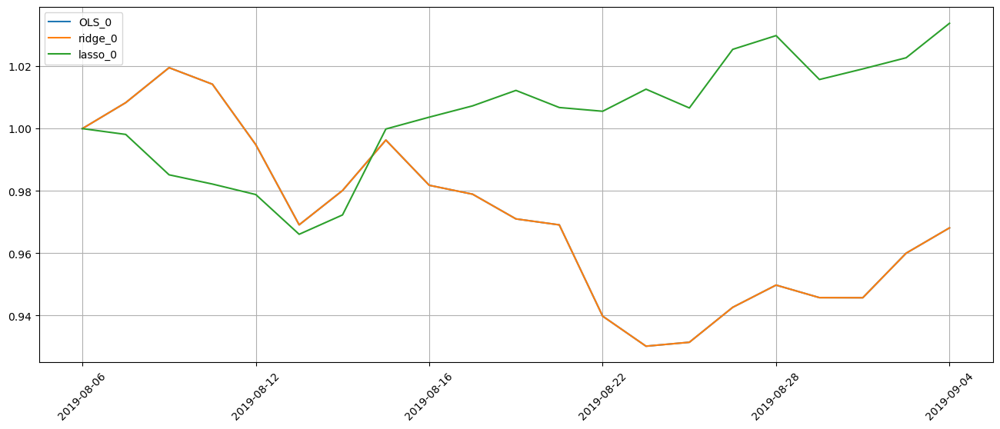

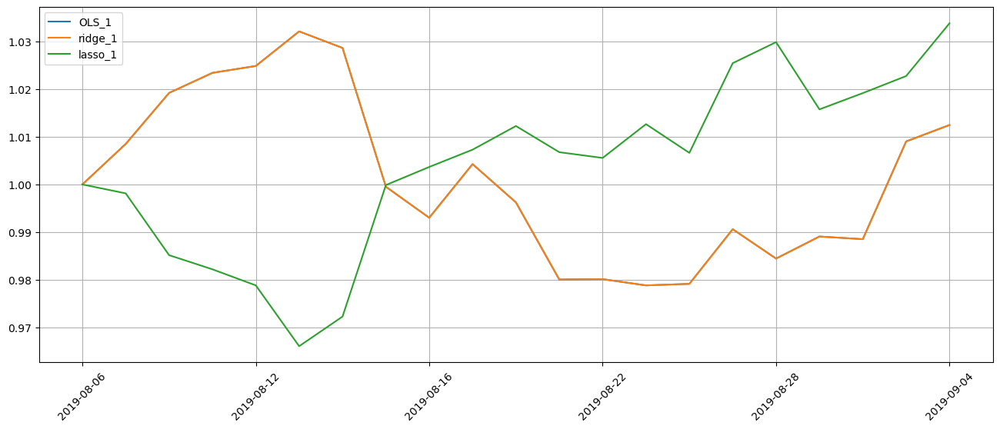

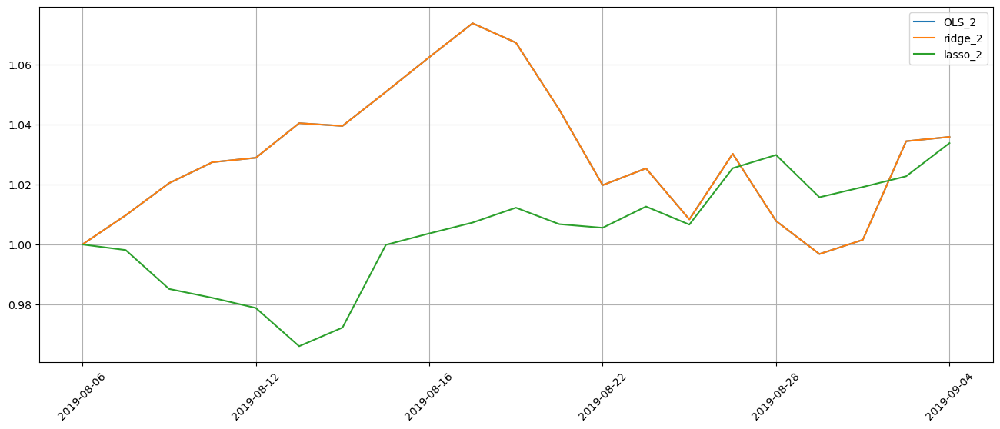

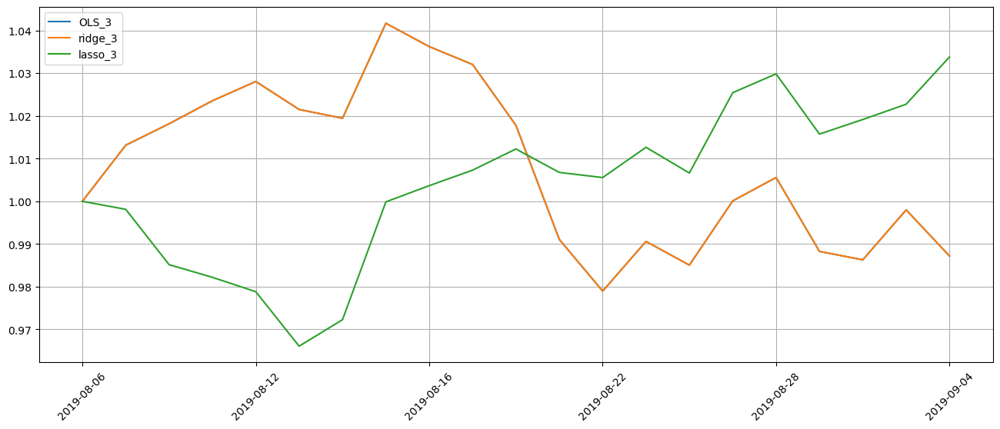

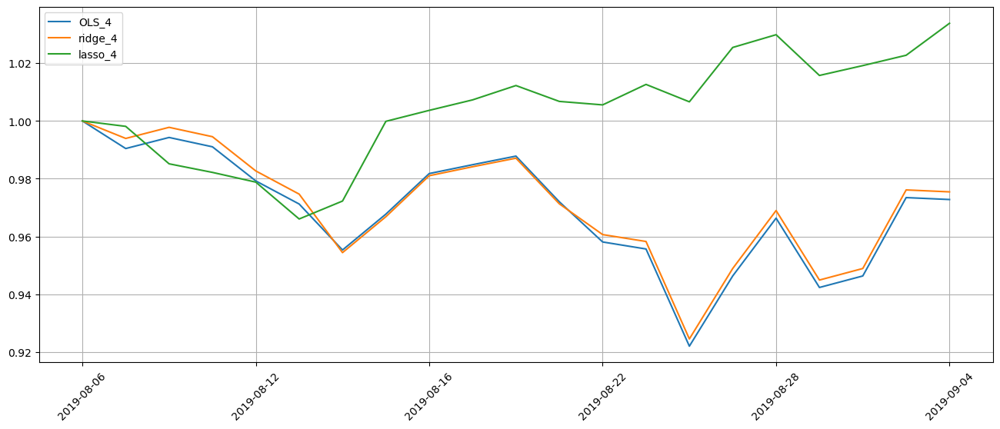

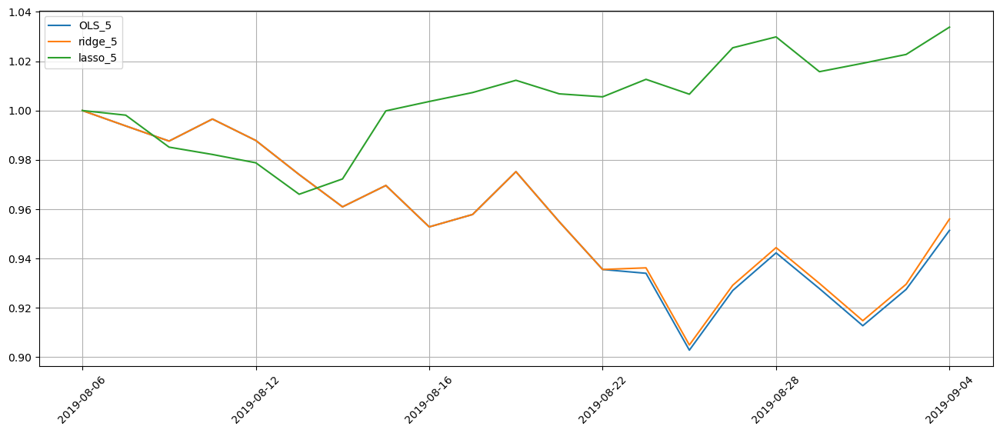

In [32]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\simulation_functions.ipynb
# Fit, predict, simulate
for j in range(len(factors_list)):

    # obtain the correct train/test sets
    reg_factors = factors_list[j]
    x_train = np.array(data_train[reg_factors])
    x_test = data_test[reg_factors + ['datadate', 'tic', 'ret_d']]

    for i in range(len(names_list)):
        name = names_list[i]

        # fit OLS, ridge, lasso
        regressor_dict[f'{name}_{j}'] = methods_list[i].fit(x_train, y_train)
        
        for day in range(seq_length):
    
            test_day = all_days[ftestd + day]
            buy_day = all_days[ftestd + day + 1]
            simul_day = all_days[ftestd + day + 2]
            x_test_temp = np.array(x_test[x_test['datadate'] == test_day][reg_factors])

            # do regression with {name} on {factors_list[i]}
            y_pred = regressor_dict[f'{name}_{j}'].predict(x_test_temp)
            top_indices = np.argsort(y_pred)[-num_stocks:]
            top_stocks = [num_to_tic_dict[num] for num in top_indices]
            print(f'top_stocks by {name} factors {j} to buy on {buy_day} are {top_stocks}')
            # Simulate investment
            total_asset, total, position_dict = invest(day, test_day, buy_day, simul_day, total_dict[f'{name}_{j}'],
                                                        total_asset_dict[f'{name}_{j}'], position_dict_all[f'{name}_{j}'], top_stocks)
            total_dict[f'{name}_{j}'] = total
            total_asset_dict[f'{name}_{j}'] = total_asset
            position_dict_all[f'{name}_{j}'] = position_dict   
            # Calculate SR PT1
            pred = sum([y_pred[ind] for ind in top_indices]) / num_stocks
            pred_avg_dict[f'{name}_{j}'] += pred
            pred_avg_period_dict[f'{name}_{j}'] += pred
            prev, today = total_asset_dict[f'{name}_{j}'][-2], total_asset_dict[f'{name}_{j}'][-1]
            excess_ret_d = (today - prev) / prev - data_to_rfr_dict[buy_day]
            excess_return_period_dict[f'{name}_{j}'][0, day] = excess_ret_d
            excess_return_dict[f'{name}_{i}'][0, day] = excess_ret_d

# Calculate SR PT2
key = f'{all_days[ltd+1]}-{all_days[ltd+seq_length]}'
for name in names_list:
    
    for j in range(len(factors_list)):
        
        pred_avg_period_dict[f'{name}_{j}'] /= seq_length
        excess_return_avg = np.mean(excess_return_period_dict[f'{name}_{j}'])
        excess_return_std = np.std(excess_return_period_dict[f'{name}_{j}'])
        
        SR_dict[f'{name}_{j}'].loc[key, 'pred_score'] = pred_avg_period_dict[f'{name}_{j}']
        SR_dict[f'{name}_{j}'].loc[key, 'avg_excess_ret'] = excess_return_avg
        SR_dict[f'{name}_{j}'].loc[key, 'std_excess_ret'] = excess_return_std
        SR_dict[f'{name}_{j}'].loc[key, 'SR'] = excess_return_avg / excess_return_std * np.sqrt(252)
        print(f"{name} {j} has SR {SR_dict[f'{name}_{j}'].loc[key, 'SR']}")

# Plot return graphs
for j in range(len(factors_list)):
    
    plt.figure(figsize=(16, 6))
    
    for name in names_list:
        plt.plot(all_days[ftestd-1:ftestd+20], total_asset_dict[f'{name}_{j}'], label=f'{name}_{j}')
        
    plt.xticks(rotation=45)
    plt.xticks(ticks=range(0, 22, 4), labels=[all_days[j] for j in range(ftestd-1, ftestd+20, 4)])
    plt.legend()
    plt.grid()
    plt.show()


## Refit OLS every `seq_length` days

Running 2 of 67 iterations. First iteration already finished
Standardization data are from 2018-02-01 to 2018-11-14
Training data are from 2018-11-15 to 2019-09-04
Testing data are from 2019-08-08 to 2019-10-02
top_stocks by OLS factors 0 to buy on 2019-09-06 are ['YPF', 'DUST', 'ADUS', 'JDST', 'LXP', 'GMS', 'SPSB', 'GUSH', 'VRNT', 'FCEL']
Total asset on 2019-09-09 will be 1.0186084849946515
It should be the same as 1.0186084849946522
top_stocks by OLS factors 0 to buy on 2019-09-09 are ['DUST', 'SILJ', 'MMSI', 'YPF', 'SLV', 'WMS', 'JDST', 'QURE', 'AM', 'FCEL']
Total asset on 2019-09-10 will be 1.0807076259076394
It should be the same as 1.0807076259076402
top_stocks by OLS factors 0 to buy on 2019-09-10 are ['LOPE', 'VRNT', 'WKHS', 'JDST', 'SILJ', 'PR', 'GUSH', 'USHY', 'AM', 'FCEL']
Total asset on 2019-09-11 will be 1.023765348744601
It should be the same as 1.0237653487446017
top_stocks by OLS factors 0 to buy on 2019-09-11 are ['WEN', 'AM', 'MPW', 'USHY', 'MMSI', 'MKTX', 'PR', 'LAUR

top_stocks by lasso factors 0 to buy on 2019-09-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-09 will be 1.0320316363438262
It should be the same as 1.0320316363438278
top_stocks by lasso factors 0 to buy on 2019-09-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-10 will be 1.02895616080132
It should be the same as 1.0289561608013216
top_stocks by lasso factors 0 to buy on 2019-09-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-11 will be 1.0400221817319903
It should be the same as 1.0400221817319921
top_stocks by lasso factors 0 to buy on 2019-09-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-12 will be 1.0488171721253217
It should be the same as 1.0488171721253234
top_stocks by lasso factors 0 to buy on 2019-09-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

top_stocks by ridge factors 1 to buy on 2019-09-06 are ['QSR', 'TSN', 'SRLN', 'IIPR', 'BNDX', 'ECPG', 'VRNT', 'IAGG', 'LOPE', 'AEO']
Total asset on 2019-09-09 will be 0.997715894612956
It should be the same as 0.9977158946129558
top_stocks by ridge factors 1 to buy on 2019-09-09 are ['GOLD', 'IAGG', 'QSR', 'BNDX', 'LOPE', 'VRNT', 'GMS', 'FSM', 'MMSI', 'TSN']
Total asset on 2019-09-10 will be 0.9807723736379655
It should be the same as 0.9807723736379655
top_stocks by ridge factors 1 to buy on 2019-09-10 are ['LOPE', 'SIL', 'SILJ', 'FSM', 'CEF', 'VRNT', 'PSLV', 'AGQ', 'SLV', 'SIVR']
Total asset on 2019-09-11 will be 0.9788073314276333
It should be the same as 0.9788073314276331
top_stocks by ridge factors 1 to buy on 2019-09-11 are ['SIL', 'WEN', 'CEF', 'AMT', 'RGLD', 'AGQ', 'SLV', 'SIVR', 'MKTX', 'PSLV']
Total asset on 2019-09-12 will be 0.9933155193080736
It should be the same as 0.9933155193080735
top_stocks by ridge factors 1 to buy on 2019-09-12 are ['SNPS', 'CME', 'TLH', 'BNDX', '

top_stocks by lasso factors 1 to buy on 2019-10-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-04 will be 1.0277850917590696
It should be the same as 1.0277850917590716
top_stocks by OLS factors 2 to buy on 2019-09-06 are ['AEO', 'SHV', 'ULTA', 'EHTH', 'VRNT', 'LOPE', 'IAGG', 'BNDX', 'IIPR', 'AXSM']
Total asset on 2019-09-09 will be 1.016857710065687
It should be the same as 1.0168577100656881
top_stocks by OLS factors 2 to buy on 2019-09-09 are ['ENPH', 'BAC-PL', 'TSN', 'LOPE', 'VRNT', 'IAGG', 'ERIE', 'MMSI', 'BNDX', 'AXSM']
Total asset on 2019-09-10 will be 0.995183130051886
It should be the same as 0.9951831300518873
top_stocks by OLS factors 2 to buy on 2019-09-10 are ['APD', 'SIVR', 'DEO', 'PSLV', 'WEC', 'SPTI', 'BNDX', 'LOPE', 'VRNT', 'AXSM']
Total asset on 2019-09-11 will be 0.9936334863943077
It should be the same as 0.9936334863943092
top_stocks by OLS factors 2 to buy on 2019-09-11 are ['WEN', 'ERIE', 'RGLD', 'WEC', 'B

Total asset on 2019-10-01 will be 0.9130335635049771
It should be the same as 0.9130335635049782
top_stocks by ridge factors 2 to buy on 2019-10-01 are ['AMT', 'STRA', 'SIVR', 'AGQ', 'SLV', 'ERIE', 'SBAC', 'FDS', 'LOPE', 'AXSM']
Total asset on 2019-10-02 will be 0.9010548552919369
It should be the same as 0.9010548552919379
top_stocks by ridge factors 2 to buy on 2019-10-02 are ['ENPH', 'AIR', 'SHV', 'EHTH', 'SBAC', 'ARES', 'CALM', 'BNDX', 'ERIE', 'AXSM']
Total asset on 2019-10-03 will be 0.900472129623954
It should be the same as 0.900472129623955
top_stocks by ridge factors 2 to buy on 2019-10-03 are ['LNTH', 'AYI', 'EHTH', 'BX', 'ARES', 'ERIE', 'UNFI', 'CALM', 'APD', 'AXSM']
Total asset on 2019-10-04 will be 0.918824827325882
It should be the same as 0.9188248273258832
top_stocks by lasso factors 2 to buy on 2019-09-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-09 will be 1.0320316363438262
It should be the same as 1.0320316

top_stocks by OLS factors 3 to buy on 2019-09-26 are ['PODD', 'HYMB', 'GME', 'IAGG', 'HYD', 'MPC', 'IAG', 'CDE', 'PSMT', 'HDB']
Total asset on 2019-09-27 will be 0.9534777138320607
It should be the same as 0.9534777138320601
top_stocks by OLS factors 3 to buy on 2019-09-27 are ['BEP', 'GFI', 'INDA', 'CMF', 'MPC', 'JBL', 'SNX', 'IBN', 'HDB', 'PSMT']
Total asset on 2019-09-30 will be 0.9462368173999124
It should be the same as 0.9462368173999121
top_stocks by OLS factors 3 to buy on 2019-09-30 are ['AVA', 'EXPRQ', 'KOLD', 'HDB', 'BEP', 'MPC', 'JBL', 'AEHR', 'SNX', 'PSMT']
Total asset on 2019-10-01 will be 0.9630100985439102
It should be the same as 0.9630100985439095
top_stocks by OLS factors 3 to buy on 2019-10-01 are ['GME', 'AEHR', 'URBN', 'BEP', 'MPC', 'SNX', 'EXPRQ', 'JBL', 'SPTI', 'HOUS']
Total asset on 2019-10-02 will be 0.9369181409391557
It should be the same as 0.936918140939155
top_stocks by OLS factors 3 to buy on 2019-10-02 are ['DUST', 'JBL', 'JDST', 'HOUS', 'KOLD', 'SNX', 

top_stocks by lasso factors 3 to buy on 2019-09-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-30 will be 1.0122559740031793
It should be the same as 1.0122559740031811
top_stocks by lasso factors 3 to buy on 2019-09-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-01 will be 1.0232572277538665
It should be the same as 1.0232572277538683
top_stocks by lasso factors 3 to buy on 2019-10-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-02 will be 1.0075223765932484
It should be the same as 1.00752237659325
top_stocks by lasso factors 3 to buy on 2019-10-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-03 will be 1.0095597981605111
It should be the same as 1.0095597981605131
top_stocks by lasso factors 3 to buy on 2019-10-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

Total asset on 2019-09-26 will be 0.921380585443114
It should be the same as 0.9213805854431147
top_stocks by ridge factors 4 to buy on 2019-09-26 are ['BMA', 'ERIE', 'JEF', 'NVR', 'MMSI', 'STRA', 'GGAL', 'SPTI', 'YPF', 'FCEL']
Total asset on 2019-09-27 will be 0.9080354878253738
It should be the same as 0.9080354878253746
top_stocks by ridge factors 4 to buy on 2019-09-27 are ['GDOT', 'BMA', 'OLLI', 'TVTX', 'GGAL', 'IBN', 'YPF', 'VTIP', 'HDB', 'FCEL']
Total asset on 2019-09-30 will be 0.927066313237974
It should be the same as 0.927066313237975
top_stocks by ridge factors 4 to buy on 2019-09-30 are ['GDOT', 'ULTA', 'PCG', 'HQY', 'CNNE', 'OI', 'OLLI', 'SUB', 'MMSI', 'FCEL']
Total asset on 2019-10-01 will be 0.9244696669807645
It should be the same as 0.9244696669807655
top_stocks by ridge factors 4 to buy on 2019-10-01 are ['STRA', 'MO', 'ENTA', 'MMSI', 'PM', 'LOPE', 'ULTA', 'SHM', 'MYGN', 'SPTI']
Total asset on 2019-10-02 will be 0.922838943487074
It should be the same as 0.9228389434

top_stocks by OLS factors 5 to buy on 2019-09-24 are ['TIP', 'SCHO', 'BNDX', 'SPIP', 'SCHP', 'ULTA', 'ERIE', 'SHV', 'OLLI', 'MMSI']
Total asset on 2019-09-25 will be 0.8581938248439639
It should be the same as 0.8581938248439636
top_stocks by OLS factors 5 to buy on 2019-09-25 are ['APD', 'SPTL', 'VRNT', 'HYD', 'ERIE', 'ULTA', 'SPTI', 'MMSI', 'OLLI', 'SHV']
Total asset on 2019-09-26 will be 0.860895809495359
It should be the same as 0.8608958094953588
top_stocks by OLS factors 5 to buy on 2019-09-26 are ['MMSI', 'VNLA', 'ULTA', 'YPF', 'APD', 'VRNT', 'HOUS', 'SPTI', 'OLLI', 'SHV']
Total asset on 2019-09-27 will be 0.8629352713466831
It should be the same as 0.8629352713466829
top_stocks by OLS factors 5 to buy on 2019-09-27 are ['SPTL', 'ITM', 'ULTA', 'OLLI', 'YPF', 'VRNT', 'VTIP', 'SPIP', 'HOUS', 'SHV']
Total asset on 2019-09-30 will be 0.8722901858689044
It should be the same as 0.8722901858689038
top_stocks by OLS factors 5 to buy on 2019-09-30 are ['SPTI', 'VNLA', 'OLLI', 'VRNT', 'H

Total asset on 2019-09-20 will be 1.0349598932639137
It should be the same as 1.034959893263916
top_stocks by lasso factors 5 to buy on 2019-09-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-23 will be 1.0372845641840045
It should be the same as 1.0372845641840067
top_stocks by lasso factors 5 to buy on 2019-09-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-24 will be 1.038226943097361
It should be the same as 1.0382269430973634
top_stocks by lasso factors 5 to buy on 2019-09-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-25 will be 1.0157599073506587
It should be the same as 1.015759907350661
top_stocks by lasso factors 5 to buy on 2019-09-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-09-26 will be 1.0319796778663313
It should be the same as 1.031979677866333

Total asset on 2019-10-11 will be 0.9408469981250135
It should be the same as 0.9408469981250144
top_stocks by ridge factors 0 to buy on 2019-10-11 are ['TMF', 'PUMP', 'DUST', 'CENN', 'GUSH', 'NAT', 'FRO', 'JDST', 'USHY', 'FCEL']
Total asset on 2019-10-14 will be 0.9619008643982012
It should be the same as 0.9619008643982023
top_stocks by ridge factors 0 to buy on 2019-10-14 are ['RY', 'TECS', 'NAT', 'GUSH', 'DUST', 'JDST', 'SOXS', 'AQN', 'CENN', 'FCEL']
Total asset on 2019-10-15 will be 0.953075144857919
It should be the same as 0.9530751448579201
top_stocks by ridge factors 0 to buy on 2019-10-15 are ['APO', 'ACM', 'GUSH', 'NAT', 'TNK', 'AQN', 'CENN', 'TOON', 'ESGU', 'FCEL']
Total asset on 2019-10-16 will be 0.9393861330878992
It should be the same as 0.9393861330879002
top_stocks by ridge factors 0 to buy on 2019-10-16 are ['CENN', 'ICSH', 'AQN', 'UNH', 'NAT', 'JDST', 'DUST', 'SOXS', 'FRO', 'FCEL']
Total asset on 2019-10-17 will be 0.9512210813527546
It should be the same as 0.95122

top_stocks by OLS factors 1 to buy on 2019-10-07 are ['UNG', 'VTIP', 'FOLD', 'IRDM', 'DEM', 'USFR', 'BB', 'BYON', 'CARS', 'TOON']
Total asset on 2019-10-08 will be 0.9201422776536159
It should be the same as 0.9201422776536157
top_stocks by OLS factors 1 to buy on 2019-10-08 are ['VIRT', 'INO', 'AYI', 'BYON', 'SGMO', 'RRC', 'TOON', 'RNG', 'BB', 'BMRN']
Total asset on 2019-10-09 will be 0.9170542248043833
It should be the same as 0.9170542248043828
top_stocks by OLS factors 1 to buy on 2019-10-09 are ['CHGG', 'ERIE', 'CWT', 'PINC', 'SGMO', 'HLF', 'BB', 'RRC', 'RNG', 'BMRN']
Total asset on 2019-10-10 will be 0.9191954506042349
It should be the same as 0.9191954506042345
top_stocks by OLS factors 1 to buy on 2019-10-10 are ['NTRS', 'VSAT', 'LAUR', 'AZO', 'BB', 'LANC', 'FNKO', 'SGMO', 'PINC', 'BMRN']
Total asset on 2019-10-11 will be 0.9363150130194009
It should be the same as 0.9363150130194006
top_stocks by OLS factors 1 to buy on 2019-10-11 are ['BB', 'LAUR', 'STRA', 'SGMO', 'AZO', 'SMP

top_stocks by lasso factors 1 to buy on 2019-10-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-07 will be 1.039330513460091
It should be the same as 1.0393305134600932
top_stocks by lasso factors 1 to buy on 2019-10-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-08 will be 1.036533954761126
It should be the same as 1.0365339547611288
top_stocks by lasso factors 1 to buy on 2019-10-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-09 will be 1.0454770095437589
It should be the same as 1.0454770095437613
top_stocks by lasso factors 1 to buy on 2019-10-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-10 will be 1.0298872076899928
It should be the same as 1.0298872076899954
top_stocks by lasso factors 1 to buy on 2019-10-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

top_stocks by ridge factors 2 to buy on 2019-10-04 are ['TBF', 'DXC', 'ITCI', 'ZOM', 'MTDR', 'AR', 'ATI', 'PR', 'CARS', 'PCG']
Total asset on 2019-10-07 will be 0.9082507789570539
It should be the same as 0.9082507789570552
top_stocks by ridge factors 2 to buy on 2019-10-07 are ['FANG', 'DXC', 'ITCI', 'MTDR', 'ZOM', 'AR', 'ATI', 'PR', 'CARS', 'PCG']
Total asset on 2019-10-08 will be 0.9038911272592987
It should be the same as 0.9038911272593
top_stocks by ridge factors 2 to buy on 2019-10-08 are ['ITCI', 'FANG', 'ZOM', 'DXC', 'MTDR', 'ATI', 'AR', 'CARS', 'PR', 'PCG']
Total asset on 2019-10-09 will be 0.9025425498442721
It should be the same as 0.9025425498442737
top_stocks by ridge factors 2 to buy on 2019-10-09 are ['ARR', 'FANG', 'MTDR', 'DXC', 'ZOM', 'ATI', 'AR', 'CARS', 'PR', 'PCG']
Total asset on 2019-10-10 will be 0.8559723873652985
It should be the same as 0.8559723873652998
top_stocks by ridge factors 2 to buy on 2019-10-10 are ['ARR', 'MTDR', 'ZOM', 'TBF', 'DXC', 'AR', 'ATI', 

Total asset on 2019-10-29 will be 1.0752537143514438
It should be the same as 1.0752537143514467
top_stocks by lasso factors 2 to buy on 2019-10-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-30 will be 1.0910499906767455
It should be the same as 1.0910499906767486
top_stocks by lasso factors 2 to buy on 2019-10-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-31 will be 1.0924763351354336
It should be the same as 1.0924763351354365
top_stocks by lasso factors 2 to buy on 2019-10-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-01 will be 1.0847326429260369
It should be the same as 1.0847326429260395
top_stocks by OLS factors 3 to buy on 2019-10-04 are ['ULTA', 'SRTY', 'TZA', 'BEP', 'FUN', 'DRIP', 'ERY', 'KOLD', 'AEHR', 'FCEL']
Total asset on 2019-10-07 will be 0.9175903382985489
It should be the same as 0.917590338298

Total asset on 2019-10-29 will be 1.0109007297715262
It should be the same as 1.0109007297715256
top_stocks by ridge factors 3 to buy on 2019-10-29 are ['MHO', 'MHK', 'WGO', 'PR', 'LAD', 'HOUS', 'ROCK', 'BJRI', 'RS', 'UFPI']
Total asset on 2019-10-30 will be 1.008824376724562
It should be the same as 1.0088243767245615
top_stocks by ridge factors 3 to buy on 2019-10-30 are ['ROCK', 'LRCX', 'BJRI', 'PLXS', 'MKSI', 'NAVI', 'AMKR', 'TXRH', 'UFPI', 'RS']
Total asset on 2019-10-31 will be 0.9850405537430491
It should be the same as 0.9850405537430484
top_stocks by ridge factors 3 to buy on 2019-10-31 are ['CNX', 'ROCK', 'LEG', 'RMD', 'AR', 'UFPI', 'RS', 'GDOT', 'TXRH', 'AMKR']
Total asset on 2019-11-01 will be 0.9677382596970174
It should be the same as 0.9677382596970168
top_stocks by lasso factors 3 to buy on 2019-10-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-07 will be 1.039330513460091
It should be the same as 1.0393305134600

Total asset on 2019-10-28 will be 0.9195457748965612
It should be the same as 0.9195457748965645
top_stocks by OLS factors 4 to buy on 2019-10-28 are ['FDS', 'CDNS', 'ELV', 'QGEN', 'BAND', 'EHTH', 'GIL', 'STRA', 'LOPE', 'ERIE']
Total asset on 2019-10-29 will be 0.9211084243344414
It should be the same as 0.9211084243344448
top_stocks by OLS factors 4 to buy on 2019-10-29 are ['BSX', 'AUPH', 'EHTH', 'GIL', 'LOPE', 'ERIE', 'STRA', 'QGEN', 'FCEL', 'NOK']
Total asset on 2019-10-30 will be 0.9186534195471164
It should be the same as 0.9186534195471202
top_stocks by OLS factors 4 to buy on 2019-10-30 are ['PTC', 'ERIE', 'AR', 'ELV', 'FCEL', 'GIL', 'LOPE', 'STRA', 'PR', 'QGEN']
Total asset on 2019-10-31 will be 0.9023096881857798
It should be the same as 0.9023096881857835
top_stocks by OLS factors 4 to buy on 2019-10-31 are ['UFPI', 'BAND', 'VRSN', 'FCEL', 'STRA', 'QGEN', 'RMD', 'LOPE', 'EHTH', 'PCG']
Total asset on 2019-11-01 will be 0.9113628516224426
It should be the same as 0.91136285162

top_stocks by lasso factors 4 to buy on 2019-10-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-23 will be 1.0573219358729098
It should be the same as 1.057321935872913
top_stocks by lasso factors 4 to buy on 2019-10-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-24 will be 1.071956861016666
It should be the same as 1.0719568610166692
top_stocks by lasso factors 4 to buy on 2019-10-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-25 will be 1.0710601350208087
It should be the same as 1.071060135020812
top_stocks by lasso factors 4 to buy on 2019-10-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-10-28 will be 1.0730348343738012
It should be the same as 1.0730348343738048
top_stocks by lasso factors 4 to buy on 2019-10-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FO

Total asset on 2019-10-21 will be 0.8974579757009592
It should be the same as 0.89745797570096
top_stocks by ridge factors 5 to buy on 2019-10-21 are ['SHV', 'GDOT', 'FDS', 'LOPE', 'BB', 'QGEN', 'ERIE', 'AR', 'ENPH', 'GIL']
Total asset on 2019-10-22 will be 0.9056606769577146
It should be the same as 0.9056606769577152
top_stocks by ridge factors 5 to buy on 2019-10-22 are ['CUK', 'GDOT', 'INFY', 'FDS', 'EHTH', 'AR', 'RGEN', 'ENPH', 'QGEN', 'AUPH']
Total asset on 2019-10-23 will be 0.9008373136607324
It should be the same as 0.9008373136607333
top_stocks by ridge factors 5 to buy on 2019-10-23 are ['LOPE', 'RGEN', 'GPRO', 'GDOT', 'HHH', 'ENPH', 'FDS', 'QGEN', 'AUPH', 'GIL']
Total asset on 2019-10-24 will be 0.9048827500219493
It should be the same as 0.9048827500219503
top_stocks by ridge factors 5 to buy on 2019-10-24 are ['EHTH', 'UNFI', 'CYRX', 'AUPH', 'ENPH', 'PR', 'AR', 'ERIE', 'GPRO', 'QGEN']
Total asset on 2019-10-25 will be 0.8980114020751253
It should be the same as 0.89801140

Total asset on 2019-11-07 will be 1.0612166570961934
It should be the same as 1.0612166570961952
top_stocks by OLS factors 0 to buy on 2019-11-07 are ['SHAK', 'AVNS', 'ATUS', 'SUPN', 'MPW', 'KAR', 'KNSL', 'MYGN', 'NSP', 'FCEL']
Total asset on 2019-11-08 will be 1.0513345299147243
It should be the same as 1.0513345299147259
top_stocks by OLS factors 0 to buy on 2019-11-08 are ['TPIC', 'PRG', 'SHAK', 'BAND', 'AVNS', 'MYGN', 'SUPN', 'KAR', 'EXPE', 'FCEL']
Total asset on 2019-11-11 will be 1.0602717064521008
It should be the same as 1.0602717064521023
top_stocks by OLS factors 0 to buy on 2019-11-11 are ['SUPN', 'TPIC', 'KAR', 'GDOT', 'CTRE', 'MOD', 'MED', 'TDC', 'EXPE', 'FCEL']
Total asset on 2019-11-12 will be 1.1031781308339506
It should be the same as 1.103178130833952
top_stocks by OLS factors 0 to buy on 2019-11-12 are ['TRIP', 'LPSN', 'GDOT', 'ALTR', 'TPIC', 'MED', 'TDC', 'MOD', 'EXPE', 'FCEL']
Total asset on 2019-11-13 will be 1.1266936031670296
It should be the same as 1.126693603

top_stocks by lasso factors 0 to buy on 2019-11-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-04 will be 1.095741862827974
It should be the same as 1.0957418628279765
top_stocks by lasso factors 0 to buy on 2019-11-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-05 will be 1.0933902663593327
It should be the same as 1.0933902663593351
top_stocks by lasso factors 0 to buy on 2019-11-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-06 will be 1.0857858614903249
It should be the same as 1.0857858614903275
top_stocks by lasso factors 0 to buy on 2019-11-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-07 will be 1.0946202539530578
It should be the same as 1.094620253953061
top_stocks by lasso factors 0 to buy on 2019-11-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

Total asset on 2019-11-29 will be 1.1494823295309529
It should be the same as 1.149482329530953
top_stocks by OLS factors 1 to buy on 2019-11-29 are ['PTGX', 'AGIO', 'TOON', 'HOUS', 'NOW', 'USFR', 'MCK', 'AY', 'DLTR', 'PANW']
Total asset on 2019-12-02 will be 1.145136651722968
It should be the same as 1.1451366517229686
top_stocks by ridge factors 1 to buy on 2019-11-01 are ['XELA', 'NYCB', 'TEX', 'W', 'R', 'ATGE', 'CHRW', 'OI', 'MMSI', 'BTU']
Total asset on 2019-11-04 will be 1.0020705206820704
It should be the same as 1.0020705206820706
top_stocks by ridge factors 1 to buy on 2019-11-04 are ['PBI', 'WDC', 'SAIA', 'HOUS', 'ATGE', 'PUK', 'ANET', 'CHRW', 'BTU', 'MMSI']
Total asset on 2019-11-05 will be 1.035592854760169
It should be the same as 1.0355928547601694
top_stocks by ridge factors 1 to buy on 2019-11-05 are ['WDC', 'GDOT', 'NYCB', 'PBI', 'KNSL', 'AMKR', 'PUK', 'ANET', 'MMSI', 'NSP']
Total asset on 2019-11-06 will be 1.0376872979106793
It should be the same as 1.037687297910680

top_stocks by lasso factors 1 to buy on 2019-11-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-29 will be 1.1451654559744546
It should be the same as 1.1451654559744584
top_stocks by lasso factors 1 to buy on 2019-11-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-02 will be 1.1425445295941488
It should be the same as 1.1425445295941525
top_stocks by OLS factors 2 to buy on 2019-11-01 are ['TBT', 'TMV', 'TBF', 'GME', 'CHRW', 'XELA', 'ATGE', 'OI', 'MMSI', 'BTU']
Total asset on 2019-11-04 will be 0.9211977373544621
It should be the same as 0.9211977373544641
top_stocks by OLS factors 2 to buy on 2019-11-04 are ['PUMP', 'TMV', 'TBT', 'PUK', 'TBF', 'ATGE', 'ANET', 'CHRW', 'BTU', 'MMSI']
Total asset on 2019-11-05 will be 0.9366813917496215
It should be the same as 0.9366813917496236
top_stocks by OLS factors 2 to buy on 2019-11-05 are ['CHRW', 'TKO', 'PUK', 'AM', 'PUMP', 'BTU',

Total asset on 2019-11-25 will be 1.0271976435957055
It should be the same as 1.0271976435957075
top_stocks by ridge factors 2 to buy on 2019-11-25 are ['ALB', 'QRTEA', 'XELA', 'CTRA', 'URBN', 'PSTG', 'MAC', 'SKT', 'PLCE', 'TOON']
Total asset on 2019-11-26 will be 1.0340012707108652
It should be the same as 1.0340012707108677
top_stocks by ridge factors 2 to buy on 2019-11-26 are ['NXE', 'QRTEA', 'CORT', 'SKT', 'PSTG', 'UNIT', 'XELA', 'PLCE', 'CTRA', 'TOON']
Total asset on 2019-11-27 will be 1.0330319671494324
It should be the same as 1.0330319671494346
top_stocks by ridge factors 2 to buy on 2019-11-27 are ['ZOM', 'NXE', 'XELA', 'PSTG', 'TMV', 'TBT', 'CAL', 'TBF', 'JACK', 'TOON']
Total asset on 2019-11-29 will be 1.03626710104774
It should be the same as 1.036267101047742
top_stocks by ridge factors 2 to buy on 2019-11-29 are ['PANW', 'TMV', 'TBF', 'CTRA', 'DLTR', 'ENLC', 'NXE', 'USFR', 'PR', 'TOON']
Total asset on 2019-12-02 will be 1.0370060621418948
It should be the same as 1.03700

Total asset on 2019-11-25 will be 0.9938488283286229
It should be the same as 0.9938488283286235
top_stocks by OLS factors 3 to buy on 2019-11-25 are ['QD', 'ERIE', 'PBI', 'ENLC', 'TOON', 'FCEL', 'KLIC', 'HIMX', 'KSS', 'URBN']
Total asset on 2019-11-26 will be 0.9914372421641419
It should be the same as 0.9914372421641425
top_stocks by OLS factors 3 to buy on 2019-11-26 are ['UNIT', 'QRTEA', 'RRC', 'M', 'SR', 'JWN', 'QD', 'KSS', 'TOON', 'URBN']
Total asset on 2019-11-27 will be 0.9934635195479582
It should be the same as 0.9934635195479589
top_stocks by OLS factors 3 to buy on 2019-11-27 are ['XELA', 'MAC', 'KLAC', 'FL', 'CORT', 'URBN', 'QD', 'PSTG', 'LZB', 'TOON']
Total asset on 2019-11-29 will be 1.0017886130430216
It should be the same as 1.001788613043022
top_stocks by OLS factors 3 to buy on 2019-11-29 are ['POST', 'EXK', 'XELA', 'KLAC', 'KRG', 'PSTG', 'JACK', 'CORT', 'LZB', 'TOON']
Total asset on 2019-12-02 will be 1.0036882438727701
It should be the same as 1.0036882438727706
to

Total asset on 2019-11-21 will be 1.1222629270470867
It should be the same as 1.1222629270470903
top_stocks by lasso factors 3 to buy on 2019-11-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-22 will be 1.1181447050074624
It should be the same as 1.1181447050074662
top_stocks by lasso factors 3 to buy on 2019-11-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-25 will be 1.1190970945548238
It should be the same as 1.1190970945548273
top_stocks by lasso factors 3 to buy on 2019-11-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-26 will be 1.1384000957974558
It should be the same as 1.1384000957974596
top_stocks by lasso factors 3 to buy on 2019-11-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-27 will be 1.1460240136504825
It should be the same as 1.146024013650

Total asset on 2019-11-19 will be 0.9302460093119171
It should be the same as 0.9302460093119194
top_stocks by ridge factors 4 to buy on 2019-11-19 are ['TRV', 'INFY', 'ECH', 'UGI', 'EHTH', 'IIPR', 'NOK', 'GIL', 'BCRX', 'XELA']
Total asset on 2019-11-20 will be 0.9331865473487309
It should be the same as 0.9331865473487326
top_stocks by ridge factors 4 to buy on 2019-11-20 are ['SE', 'TRV', 'AR', 'IIPR', 'EHTH', 'BTU', 'BCRX', 'NOK', 'GIL', 'XELA']
Total asset on 2019-11-21 will be 0.9294433732133758
It should be the same as 0.9294433732133779
top_stocks by ridge factors 4 to buy on 2019-11-21 are ['AXSM', 'AM', 'KRYS', 'TRV', 'EHTH', 'BTU', 'AR', 'XELA', 'NOK', 'GIL']
Total asset on 2019-11-22 will be 0.9357736542365657
It should be the same as 0.9357736542365679
top_stocks by ridge factors 4 to buy on 2019-11-22 are ['GVA', 'CNP', 'AM', 'AXSM', 'AR', 'XELA', 'BTU', 'NOK', 'TOON', 'GIL']
Total asset on 2019-11-25 will be 0.9281370918761284
It should be the same as 0.9281370918761306
t

Total asset on 2019-11-14 will be 0.9284318415230057
It should be the same as 0.9284318415230054
top_stocks by OLS factors 5 to buy on 2019-11-14 are ['LOPE', 'UUP', 'IIPR', 'CENN', 'PRO', 'XELA', 'TMF', 'BCRX', 'INFY', 'FCEL']
Total asset on 2019-11-15 will be 0.9336011422496197
It should be the same as 0.9336011422496191
top_stocks by OLS factors 5 to buy on 2019-11-15 are ['AM', 'VCYT', 'HRL', 'NOK', 'PRO', 'CENN', 'BCRX', 'TMF', 'INFY', 'FCEL']
Total asset on 2019-11-18 will be 0.9525335647323848
It should be the same as 0.9525335647323843
top_stocks by OLS factors 5 to buy on 2019-11-18 are ['GIL', 'TEAM', 'VCYT', 'SBSW', 'UUP', 'NOK', 'XELA', 'TMF', 'CENN', 'INFY']
Total asset on 2019-11-19 will be 0.9411665621542892
It should be the same as 0.9411665621542885
top_stocks by OLS factors 5 to buy on 2019-11-19 are ['CWEN', 'GIL', 'IIPR', 'PRO', 'TMF', 'QTWO', 'INFY', 'BCRX', 'CENN', 'NOK']
Total asset on 2019-11-20 will be 0.952987325867579
It should be the same as 0.95298732586757

Total asset on 2019-11-13 will be 1.08802901658861
It should be the same as 1.0880290165886126
top_stocks by lasso factors 5 to buy on 2019-11-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-14 will be 1.09217335264263
It should be the same as 1.092173352642632
top_stocks by lasso factors 5 to buy on 2019-11-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-15 will be 1.1005386214937987
It should be the same as 1.1005386214938004
top_stocks by lasso factors 5 to buy on 2019-11-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-18 will be 1.10504763800454
It should be the same as 1.1050476380045418
top_stocks by lasso factors 5 to buy on 2019-11-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-11-19 will be 1.1062327827150653
It should be the same as 1.1062327827150669
to

Total asset on 2019-12-05 will be 1.107932937372455
It should be the same as 1.1079329373724567
top_stocks by ridge factors 0 to buy on 2019-12-05 are ['CBSH', 'WPC', 'EVH', 'CNNE', 'CENN', 'APA', 'WRB', 'PTGX', 'RLI', 'FCEL']
Total asset on 2019-12-06 will be 1.0957323737427622
It should be the same as 1.0957323737427642
top_stocks by ridge factors 0 to buy on 2019-12-06 are ['RVNC', 'CM', 'CDNS', 'FFIV', 'SNPS', 'MRVL', 'XELA', 'PLUG', 'FCEL', 'SAGE']
Total asset on 2019-12-09 will be 1.1058429304252198
It should be the same as 1.1058429304252217
top_stocks by ridge factors 0 to buy on 2019-12-09 are ['QRTEA', 'EVRI', 'CM', 'PLUG', 'ODFL', 'VST', 'FCEL', 'RVNC', 'YEXT', 'SAGE']
Total asset on 2019-12-10 will be 1.0898090676965533
It should be the same as 1.0898090676965553
top_stocks by ridge factors 0 to buy on 2019-12-10 are ['GWRE', 'KOS', 'KNSL', 'VST', 'BALL', 'CM', 'YEXT', 'APLS', 'FCEL', 'SAGE']
Total asset on 2019-12-11 will be 1.0949816126209047
It should be the same as 1.09

top_stocks by OLS factors 1 to buy on 2019-12-02 are ['UNG', 'CIB', 'IRM', 'JPST', 'HPE', 'LABD', 'PANW', 'UEC', 'EVH', 'DLTR']
Total asset on 2019-12-03 will be 1.1337981865446312
It should be the same as 1.1337981865446318
top_stocks by OLS factors 1 to buy on 2019-12-03 are ['DLTR', 'AM', 'TFLO', 'SHV', 'CNX', 'UEC', 'RLI', 'DELL', 'APA', 'EVH']
Total asset on 2019-12-04 will be 1.1345222778958874
It should be the same as 1.1345222778958886
top_stocks by OLS factors 1 to buy on 2019-12-04 are ['DLTR', 'UEC', 'VEEV', 'CNX', 'CBSH', 'HEFA', 'RLI', 'APA', 'ERIE', 'EVH']
Total asset on 2019-12-05 will be 1.142426277291942
It should be the same as 1.1424262772919431
top_stocks by OLS factors 1 to buy on 2019-12-05 are ['CNP', 'UEC', 'CBSH', 'AFL', 'OLLI', 'EVH', 'MRVL', 'WPC', 'PTGX', 'APA']
Total asset on 2019-12-06 will be 1.1686866963387752
It should be the same as 1.1686866963387763
top_stocks by OLS factors 1 to buy on 2019-12-06 are ['PLUG', 'QRTEA', 'CHKP', 'TSE', 'FFIV', 'SAIA', 

Total asset on 2019-12-31 will be 1.2147047429185716
It should be the same as 1.2147047429185716
top_stocks by lasso factors 1 to buy on 2019-12-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-03 will be 1.1219588647178704
It should be the same as 1.1219588647178744
top_stocks by lasso factors 1 to buy on 2019-12-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-04 will be 1.1318329056253025
It should be the same as 1.1318329056253065
top_stocks by lasso factors 1 to buy on 2019-12-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-05 will be 1.1357511169043928
It should be the same as 1.1357511169043966
top_stocks by lasso factors 1 to buy on 2019-12-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-06 will be 1.140933616590593
It should be the same as 1.1409336165905

Total asset on 2019-12-30 will be 1.165088837106009
It should be the same as 1.165088837106012
top_stocks by OLS factors 2 to buy on 2019-12-30 are ['DHR', 'TDG', 'RNR', 'PFSI', 'BNDX', 'VRRM', 'AIR', 'GBIL', 'AXSM', 'QGEN']
Total asset on 2019-12-31 will be 1.1537015667030015
It should be the same as 1.1537015667030046
top_stocks by ridge factors 2 to buy on 2019-12-02 are ['CME', 'FTSM', 'APD', 'IRM', 'AXSM', 'PANW', 'JPST', 'BNDX', 'EVH', 'DLTR']
Total asset on 2019-12-03 will be 1.0314449160277759
It should be the same as 1.0314449160277777
top_stocks by ridge factors 2 to buy on 2019-12-03 are ['GOVT', 'IGIB', 'RLI', 'TLH', 'SLQD', 'BSV', 'BIV', 'GVI', 'BNDX', 'EVH']
Total asset on 2019-12-04 will be 1.0321312318093367
It should be the same as 1.0321312318093385
top_stocks by ridge factors 2 to buy on 2019-12-04 are ['HEFA', 'JPST', 'WPC', 'AFL', 'VEEV', 'RLI', 'ERIE', 'BAC-PL', 'BNDX', 'EVH']
Total asset on 2019-12-05 will be 1.0359575563987022
It should be the same as 1.03595755

Total asset on 2019-12-24 will be 1.19673224354331
It should be the same as 1.1967322435433139
top_stocks by lasso factors 2 to buy on 2019-12-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-26 will be 1.203108099309929
It should be the same as 1.2031080993099328
top_stocks by lasso factors 2 to buy on 2019-12-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-27 will be 1.2045081236042283
It should be the same as 1.2045081236042323
top_stocks by lasso factors 2 to buy on 2019-12-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-30 will be 1.1976046943977057
It should be the same as 1.1976046943977097
top_stocks by lasso factors 2 to buy on 2019-12-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-31 will be 1.1969474618013032
It should be the same as 1.196947461801307

Total asset on 2019-12-23 will be 1.0634587584120396
It should be the same as 1.0634587584120403
top_stocks by ridge factors 3 to buy on 2019-12-23 are ['REET', 'FDX', 'LYV', 'GRPN', 'EVH', 'RBC', 'VNQI', 'IFF', 'UL', 'TOON']
Total asset on 2019-12-24 will be 1.072502669064876
It should be the same as 1.0725026690648765
top_stocks by ridge factors 3 to buy on 2019-12-24 are ['BCE', 'BCS', 'RBC', 'LYG', 'TTC', 'HEI', 'GDOT', 'FDX', 'VNQI', 'UL']
Total asset on 2019-12-26 will be 1.0735587563631177
It should be the same as 1.0735587563631184
top_stocks by ridge factors 3 to buy on 2019-12-26 are ['FDX', 'CPAY', 'SHV', 'BTU', 'HEI-A', 'LII', 'GDOT', 'MLKN', 'VNQI', 'HEI']
Total asset on 2019-12-27 will be 1.073811678140783
It should be the same as 1.0738116781407836
top_stocks by ridge factors 3 to buy on 2019-12-27 are ['UUP', 'BIL', 'HOUS', 'X', 'KMX', 'SHV', 'GDOT', 'VTIP', 'MLKN', 'BNDX']
Total asset on 2019-12-30 will be 1.067877474437312
It should be the same as 1.0678774744373127
t

Total asset on 2019-12-23 will be 1.1478357551715261
It should be the same as 1.1478357551715306
top_stocks by OLS factors 4 to buy on 2019-12-23 are ['AWR', 'EXPE', 'VNQI', 'EQR', 'O', 'WELL', 'BTU', 'WPC', 'TOON', 'AXSM']
Total asset on 2019-12-24 will be 1.1336998042894424
It should be the same as 1.1336998042894466
top_stocks by OLS factors 4 to buy on 2019-12-24 are ['ICSH', 'SWX', 'EXPE', 'DLTR', 'ERIE', 'GDOT', 'SHV', 'BNDX', 'TOON', 'AXSM']
Total asset on 2019-12-26 will be 1.1501217552410496
It should be the same as 1.150121755241054
top_stocks by OLS factors 4 to buy on 2019-12-26 are ['SPSB', 'SWX', 'BIL', 'AWR', 'BTU', 'WPC', 'BNDX', 'XELA', 'TOON', 'AXSM']
Total asset on 2019-12-27 will be 1.160047605172336
It should be the same as 1.1600476051723405
top_stocks by OLS factors 4 to buy on 2019-12-27 are ['VTIP', 'ENPH', 'SWX', 'GSY', 'CNP', 'WPC', 'SAGE', 'TOON', 'BNDX', 'AXSM']
Total asset on 2019-12-30 will be 1.1698919847496208
It should be the same as 1.169891984749625


Total asset on 2019-12-19 will be 1.1720571612071402
It should be the same as 1.1720571612071444
top_stocks by lasso factors 4 to buy on 2019-12-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-20 will be 1.1878412638654097
It should be the same as 1.1878412638654137
top_stocks by lasso factors 4 to buy on 2019-12-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-23 will be 1.187150693419216
It should be the same as 1.18715069341922
top_stocks by lasso factors 4 to buy on 2019-12-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-24 will be 1.19673224354331
It should be the same as 1.1967322435433139
top_stocks by lasso factors 4 to buy on 2019-12-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2019-12-26 will be 1.203108099309929
It should be the same as 1.2031080993099328
t

Total asset on 2019-12-17 will be 0.9786608295623138
It should be the same as 0.978660829562315
top_stocks by ridge factors 5 to buy on 2019-12-17 are ['KRYS', 'MAC', 'AMKR', 'ASND', 'AIV', 'AUPH', 'TOON', 'CENN', 'AXSM', 'FCEL']
Total asset on 2019-12-18 will be 0.998517479711993
It should be the same as 0.9985174797119941
top_stocks by ridge factors 5 to buy on 2019-12-18 are ['XELA', 'LMBS', 'FCPT', 'AIV', 'AUPH', 'TOON', 'FIXD', 'CENN', 'FCEL', 'AXSM']
Total asset on 2019-12-19 will be 1.056511046336737
It should be the same as 1.0565110463367382
top_stocks by ridge factors 5 to buy on 2019-12-19 are ['ARWR', 'APPS', 'FCPT', 'CENN', 'AIV', 'FIXD', 'AUPH', 'TOON', 'AXSM', 'FCEL']
Total asset on 2019-12-20 will be 1.0200950116468392
It should be the same as 1.0200950116468408
top_stocks by ridge factors 5 to buy on 2019-12-20 are ['ARWR', 'ICSH', 'AIV', 'LMBS', 'FIXD', 'TOON', 'CENN', 'AUPH', 'AXSM', 'FCEL']
Total asset on 2019-12-23 will be 1.036481107335599
It should be the same as

Total asset on 2020-01-07 will be 1.1761242657185547
It should be the same as 1.1761242657185578
top_stocks by OLS factors 0 to buy on 2020-01-07 are ['PLUG', 'INCY', 'CDE', 'SOXS', 'SILJ', 'JDST', 'CALM', 'TOON', 'CENN', 'FCEL']
Total asset on 2020-01-08 will be 1.1421790004322219
It should be the same as 1.1421790004322248
top_stocks by OLS factors 0 to buy on 2020-01-08 are ['CALM', 'SOXS', 'RNR', 'GOVT', 'JDST', 'ITCI', 'ARE', 'APLS', 'CENN', 'FCEL']
Total asset on 2020-01-09 will be 1.1909762997460187
It should be the same as 1.1909762997460214
top_stocks by OLS factors 0 to buy on 2020-01-09 are ['COMT', 'CALM', 'SOXS', 'CDE', 'SILJ', 'NYMT', 'JDST', 'ITCI', 'CENN', 'FCEL']
Total asset on 2020-01-10 will be 1.1752245943661634
It should be the same as 1.1752245943661663
top_stocks by OLS factors 0 to buy on 2020-01-10 are ['CEIX', 'RGLD', 'TMF', 'KSS', 'CDE', 'SOXS', 'SILJ', 'ITCI', 'FCEL', 'CENN']
Total asset on 2020-01-13 will be 1.1697822272649907
It should be the same as 1.169

top_stocks by lasso factors 0 to buy on 2019-12-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-02 will be 1.2102256513916012
It should be the same as 1.2102256513916057
top_stocks by lasso factors 0 to buy on 2020-01-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-03 will be 1.2061427711150483
It should be the same as 1.2061427711150523
top_stocks by lasso factors 0 to buy on 2020-01-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-06 will be 1.204098471748921
It should be the same as 1.204098471748925
top_stocks by lasso factors 0 to buy on 2020-01-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-07 will be 1.2015851737090466
It should be the same as 1.2015851737090506
top_stocks by lasso factors 0 to buy on 2020-01-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

top_stocks by OLS factors 1 to buy on 2020-01-27 are ['RRC', 'AR', 'BTU', 'IMAX', 'CTRA', 'VFC', 'GLNG', 'CEIX', 'EQT', 'ARCH']
Total asset on 2020-01-28 will be 1.1863722994982893
It should be the same as 1.186372299498293
top_stocks by OLS factors 1 to buy on 2020-01-28 are ['TCOM', 'ACMR', 'PR', 'ASHR', 'ARCH', 'EQT', 'GLNG', 'HLF', 'VFC', 'DFS']
Total asset on 2020-01-29 will be 1.1860475627136666
It should be the same as 1.1860475627136704
top_stocks by OLS factors 1 to buy on 2020-01-29 are ['ERIC', 'ARCH', 'HLF', 'GHC', 'PLXS', 'FTGC', 'BWA', 'SKT', 'JJSF', 'DFS']
Total asset on 2020-01-30 will be 1.1667440988383968
It should be the same as 1.1667440988384006
top_stocks by ridge factors 1 to buy on 2019-12-31 are ['MLKN', 'YANG', 'TDG', 'JDST', 'BAC-PL', 'JPST', 'XNCR', 'UUP', 'GBIL', 'QGEN']
Total asset on 2020-01-02 will be 1.2137899920309716
It should be the same as 1.213789992030972
top_stocks by ridge factors 1 to buy on 2020-01-02 are ['AZO', 'ARKG', 'NLY', 'APPS', 'DVAX',

top_stocks by lasso factors 1 to buy on 2020-01-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-29 will be 1.2132501476664668
It should be the same as 1.2132501476664714
top_stocks by lasso factors 1 to buy on 2020-01-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-30 will be 1.1921361562587975
It should be the same as 1.192136156258802
top_stocks by OLS factors 2 to buy on 2019-12-31 are ['SHO', 'PARR', 'FLR', 'INO', 'XNCR', 'TDG', 'JPST', 'BAC-PL', 'GBIL', 'QGEN']
Total asset on 2020-01-02 will be 1.1628420763387497
It should be the same as 1.1628420763387528
top_stocks by OLS factors 2 to buy on 2020-01-02 are ['TDG', 'MFA', 'APPS', 'ARKG', 'NLY', 'DVAX', 'XNCR', 'GBIL', 'CLB', 'BAC-PL']
Total asset on 2020-01-03 will be 1.1542919195968455
It should be the same as 1.154291919596849
top_stocks by OLS factors 2 to buy on 2020-01-03 are ['MINT', 'XNCR', 'ARI', 'BMI', 'PMT',

Total asset on 2020-01-24 will be 1.1667740712408634
It should be the same as 1.1667740712408667
top_stocks by ridge factors 2 to buy on 2020-01-24 are ['MGPI', 'WTFC', 'CEIX', 'GLNG', 'EPC', 'CTRA', 'MSM', 'ARCH', 'RRC', 'AR']
Total asset on 2020-01-27 will be 1.1034592655574733
It should be the same as 1.1034592655574764
top_stocks by ridge factors 2 to buy on 2020-01-27 are ['BTU', 'EQT', 'BPMC', 'DFS', 'AR', 'VFC', 'NUS', 'ARCH', 'IMAX', 'GLNG']
Total asset on 2020-01-28 will be 1.1143512334367471
It should be the same as 1.11435123343675
top_stocks by ridge factors 2 to buy on 2020-01-28 are ['EL', 'TCOM', 'ASHR', 'GLNG', 'SKT', 'TDY', 'VFC', 'HLF', 'ACMR', 'DFS']
Total asset on 2020-01-29 will be 1.118799640688097
It should be the same as 1.1187996406880996
top_stocks by ridge factors 2 to buy on 2020-01-29 are ['FTGC', 'ERIC', 'SYF', 'DBA', 'BWA', 'TER', 'JJSF', 'PLXS', 'SKT', 'DFS']
Total asset on 2020-01-30 will be 1.1048123271653933
It should be the same as 1.1048123271653965

Total asset on 2020-01-23 will be 1.1336458550808244
It should be the same as 1.1336458550808268
top_stocks by OLS factors 3 to buy on 2020-01-23 are ['UNG', 'QDEL', 'DHT', 'QD', 'MTN', 'BGS', 'UI', 'MGPI', 'BK', 'CRTO']
Total asset on 2020-01-24 will be 1.1374944069501653
It should be the same as 1.137494406950168
top_stocks by OLS factors 3 to buy on 2020-01-24 are ['TAL', 'GSY', 'PAAS', 'QDEL', 'AA', 'MSM', 'CDE', 'QD', 'BK', 'MGPI']
Total asset on 2020-01-27 will be 1.1095420638946387
It should be the same as 1.1095420638946412
top_stocks by OLS factors 3 to buy on 2020-01-27 are ['WTFC', 'EXPD', 'CEIX', 'MSM', 'CNX', 'RRC', 'BOKF', 'CTRA', 'CDE', 'MGPI']
Total asset on 2020-01-28 will be 1.1021785967850426
It should be the same as 1.1021785967850453
top_stocks by OLS factors 3 to buy on 2020-01-28 are ['RRC', 'EPC', 'WTFC', 'CEIX', 'MGPI', 'AR', 'BLDP', 'ARCH', 'MSM', 'CTRA']
Total asset on 2020-01-29 will be 1.1240125646240724
It should be the same as 1.1240125646240753
top_stock

Total asset on 2020-01-21 will be 1.2369545641895052
It should be the same as 1.2369545641895094
top_stocks by lasso factors 3 to buy on 2020-01-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-22 will be 1.2385955373892614
It should be the same as 1.2385955373892659
top_stocks by lasso factors 3 to buy on 2020-01-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-23 will be 1.2194503489676674
It should be the same as 1.2194503489676718
top_stocks by lasso factors 3 to buy on 2020-01-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-24 will be 1.2263264300703591
It should be the same as 1.2263264300703636
top_stocks by lasso factors 3 to buy on 2020-01-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-27 will be 1.1866801544942802
It should be the same as 1.186680154494

Total asset on 2020-01-21 will be 1.198932761623498
It should be the same as 1.1989327616235015
top_stocks by ridge factors 4 to buy on 2020-01-21 are ['TOON', 'CASY', 'JDST', 'UUP', 'CENN', 'SUI', 'QGEN', 'BNDX', 'GBIL', 'ESGU']
Total asset on 2020-01-22 will be 1.1929935666814742
It should be the same as 1.1929935666814777
top_stocks by ridge factors 4 to buy on 2020-01-22 are ['SAGE', 'UUP', 'QD', 'SUI', 'GBIL', 'CENN', 'QGEN', 'BNDX', 'ESGU', 'FCEL']
Total asset on 2020-01-23 will be 1.1706082544516259
It should be the same as 1.1706082544516299
top_stocks by ridge factors 4 to buy on 2020-01-23 are ['SAGE', 'CENN', 'QGEN', 'SUI', 'BLDP', 'GBIL', 'BNDX', 'TOON', 'ESGU', 'FCEL']
Total asset on 2020-01-24 will be 1.1706234427829745
It should be the same as 1.1706234427829787
top_stocks by ridge factors 4 to buy on 2020-01-24 are ['MGPI', 'VST', 'ESGU', 'SUI', 'KRYS', 'UUP', 'GBIL', 'BNDX', 'CENN', 'FCEL']
Total asset on 2020-01-27 will be 1.1418646252863578
It should be the same as 1

top_stocks by OLS factors 5 to buy on 2020-01-14 are ['ROKU', 'APPS', 'TMF', 'EHTH', 'PLUG', 'CELH', 'FIXD', 'CASY', 'ARWR', 'FCEL']
Total asset on 2020-01-15 will be 1.27270789623406
It should be the same as 1.2727078962340599
top_stocks by OLS factors 5 to buy on 2020-01-15 are ['BLDP', 'DIS', 'EHTH', 'SUI', 'APPS', 'TOON', 'CASY', 'PLUG', 'ARWR', 'FCEL']
Total asset on 2020-01-16 will be 1.311421588086195
It should be the same as 1.311421588086195
top_stocks by OLS factors 5 to buy on 2020-01-16 are ['UI', 'PLUG', 'DIS', 'UUUU', 'CASY', 'ELS', 'SUI', 'APPS', 'ARWR', 'FCEL']
Total asset on 2020-01-17 will be 1.337386856862267
It should be the same as 1.3373868568622669
top_stocks by OLS factors 5 to buy on 2020-01-17 are ['PLUG', 'CASY', 'MHO', 'FIXD', 'EHTH', 'APPS', 'DIS', 'QGEN', 'ARWR', 'FCEL']
Total asset on 2020-01-21 will be 1.3724988361168078
It should be the same as 1.3724988361168073
top_stocks by OLS factors 5 to buy on 2020-01-21 are ['PLUG', 'CSGS', 'UUUU', 'APPS', 'ENPH

Total asset on 2020-01-13 will be 1.4703433090989162
It should be the same as 1.470343309098919
top_stocks by lasso factors 5 to buy on 2020-01-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-14 will be 1.470384176065726
It should be the same as 1.4703841760657292
top_stocks by lasso factors 5 to buy on 2020-01-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-15 will be 1.4882563052280726
It should be the same as 1.488256305228076
top_stocks by lasso factors 5 to buy on 2020-01-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-16 will be 1.4945887415154866
It should be the same as 1.4945887415154897
top_stocks by lasso factors 5 to buy on 2020-01-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-17 will be 1.5141382376250136
It should be the same as 1.514138237625016

Total asset on 2020-02-06 will be 1.1194162575611608
It should be the same as 1.119416257561165
top_stocks by ridge factors 0 to buy on 2020-02-06 are ['IEMG', 'ATI', 'MCHI', 'MLI', 'SNDX', 'UMC', 'IBKR', 'TAL', 'INSM', 'EPC']
Total asset on 2020-02-07 will be 1.1029355511898442
It should be the same as 1.1029355511898487
top_stocks by ridge factors 0 to buy on 2020-02-07 are ['LDOS', 'AMGN', 'JKHY', 'MLI', 'TXT', 'TXN', 'RBC', 'CEIX', 'BTU', 'EPC']
Total asset on 2020-02-10 will be 1.111837771918576
It should be the same as 1.1118377719185806
top_stocks by ridge factors 0 to buy on 2020-02-10 are ['UMC', 'DB', 'VNET', 'CAH', 'ICUI', 'MKL', 'CEIX', 'NYT', 'RBC', 'BTU']
Total asset on 2020-02-11 will be 1.1300379168724515
It should be the same as 1.1300379168724564
top_stocks by ridge factors 0 to buy on 2020-02-11 are ['GEN', 'CCS', 'ENSG', 'L', 'CTSH', 'HAIN', 'ICUI', 'MKL', 'BTU', 'CAH']
Total asset on 2020-02-12 will be 1.1341850911689377
It should be the same as 1.134185091168943
t

Total asset on 2020-02-05 will be 1.3101429592594396
It should be the same as 1.3101429592594434
top_stocks by OLS factors 1 to buy on 2020-02-05 are ['DIS', 'TSLA', 'RRC', 'HLF', 'INSM', 'MUR', 'FTI', 'AXTA', 'SNDX', 'EPC']
Total asset on 2020-02-06 will be 1.3027355929807425
It should be the same as 1.3027355929807465
top_stocks by OLS factors 1 to buy on 2020-02-06 are ['HLF', 'CTRA', 'MUR', 'ARCH', 'TAL', 'REGN', 'FTI', 'AA', 'INSM', 'EPC']
Total asset on 2020-02-07 will be 1.275848003268861
It should be the same as 1.275848003268865
top_stocks by OLS factors 1 to buy on 2020-02-07 are ['OI', 'AMGN', 'MAC', 'REGN', 'HLF', 'AA', 'ARCH', 'EPC', 'CEIX', 'BTU']
Total asset on 2020-02-10 will be 1.2803229914119412
It should be the same as 1.2803229914119456
top_stocks by OLS factors 1 to buy on 2020-02-10 are ['PARA', 'NGVT', 'REGN', 'NYT', 'RBC', 'SPG', 'GEN', 'CEIX', 'ARCH', 'BTU']
Total asset on 2020-02-11 will be 1.293337705590323
It should be the same as 1.293337705590328
top_stock

top_stocks by lasso factors 1 to buy on 2020-01-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-01-31 will be 1.1883292939685548
It should be the same as 1.1883292939685597
top_stocks by lasso factors 1 to buy on 2020-01-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-03 will be 1.1596690312541835
It should be the same as 1.1596690312541882
top_stocks by lasso factors 1 to buy on 2020-02-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-04 will be 1.1836137148921615
It should be the same as 1.183613714892166
top_stocks by lasso factors 1 to buy on 2020-02-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-05 will be 1.2025133017077767
It should be the same as 1.2025133017077811
top_stocks by lasso factors 1 to buy on 2020-02-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2020-02-27 will be 1.0833439008368222
It should be the same as 1.0833439008368262
top_stocks by OLS factors 2 to buy on 2020-02-27 are ['IRT', 'FIS', 'SHOP', 'ARES', 'GNRC', 'ENPH', 'TNK', 'AUPH', 'AXSM', 'GLPG']
Total asset on 2020-02-28 will be 1.037614957354017
It should be the same as 1.037614957354021
top_stocks by ridge factors 2 to buy on 2020-01-30 are ['PFSI', 'FIS', 'ARES', 'IRT', 'GNRC', 'ARWR', 'AUPH', 'AXSM', 'GLPG', 'TNK']
Total asset on 2020-01-31 will be 1.0895291837352779
It should be the same as 1.089529183735281
top_stocks by ridge factors 2 to buy on 2020-01-31 are ['PFSI', 'FIS', 'ARES', 'IRT', 'ARWR', 'GNRC', 'AUPH', 'AXSM', 'GLPG', 'TNK']
Total asset on 2020-02-03 will be 1.0924357859347629
It should be the same as 1.092435785934766
top_stocks by ridge factors 2 to buy on 2020-02-03 are ['ENPH', 'FIS', 'ARES', 'IRT', 'ARWR', 'GNRC', 'AUPH', 'AXSM', 'GLPG', 'TNK']
Total asset on 2020-02-04 will be 1.1252618827733112
It should be the same as 1.125261

Total asset on 2020-02-24 will be 1.1855615354956017
It should be the same as 1.1855615354956062
top_stocks by lasso factors 2 to buy on 2020-02-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-25 will be 1.1874597377893195
It should be the same as 1.1874597377893237
top_stocks by lasso factors 2 to buy on 2020-02-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-26 will be 1.1652515157067238
It should be the same as 1.1652515157067285
top_stocks by lasso factors 2 to buy on 2020-02-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-27 will be 1.1318928232126453
It should be the same as 1.1318928232126497
top_stocks by lasso factors 2 to buy on 2020-02-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-28 will be 1.073070835732946
It should be the same as 1.0730708357329

Total asset on 2020-02-24 will be 0.9923359570481124
It should be the same as 0.9923359570481155
top_stocks by ridge factors 3 to buy on 2020-02-24 are ['IDCC', 'QD', 'DRH', 'BKD', 'SFM', 'SEDG', 'UFPI', 'CYH', 'DPZ', 'ZOM']
Total asset on 2020-02-25 will be 0.9795621758023155
It should be the same as 0.9795621758023185
top_stocks by ridge factors 3 to buy on 2020-02-25 are ['TECS', 'IAU', 'SFM', 'HMY', 'SGOL', 'GLD', 'VIXY', 'PHYS', 'UVXY', 'EGO']
Total asset on 2020-02-26 will be 1.0101486483261493
It should be the same as 1.0101486483261524
top_stocks by ridge factors 3 to buy on 2020-02-26 are ['UTHR', 'MUB', 'UVXY', 'VIXY', 'WPC', 'CUBE', 'REGN', 'IAG', 'GILD', 'EGO']
Total asset on 2020-02-27 will be 1.0539355855540333
It should be the same as 1.053935585554036
top_stocks by ridge factors 3 to buy on 2020-02-27 are ['PRG', 'SAH', 'KNSL', 'IOVA', 'DUST', 'AVNS', 'QRTEA', 'REGN', 'JDST', 'MIDD']
Total asset on 2020-02-28 will be 1.1039497713078834
It should be the same as 1.1039497

Total asset on 2020-02-20 will be 1.1118099027136208
It should be the same as 1.1118099027136261
top_stocks by OLS factors 4 to buy on 2020-02-20 are ['AG', 'JJSF', 'STNG', 'AZO', 'FRO', 'ABG', 'ARWR', 'DHT', 'TNK', 'ENPH']
Total asset on 2020-02-21 will be 1.106525363332329
It should be the same as 1.1065253633323344
top_stocks by OLS factors 4 to buy on 2020-02-21 are ['BLDP', 'ABG', 'FRO', 'UCTT', 'VCIT', 'ARWR', 'UFPI', 'DHT', 'ENPH', 'TNK']
Total asset on 2020-02-24 will be 1.0306481298210122
It should be the same as 1.0306481298210177
top_stocks by OLS factors 4 to buy on 2020-02-24 are ['HMY', 'APPS', 'ENPH', 'FRO', 'EGO', 'AZO', 'STNG', 'DHT', 'ARWR', 'TNK']
Total asset on 2020-02-25 will be 1.0189014795498732
It should be the same as 1.0189014795498788
top_stocks by OLS factors 4 to buy on 2020-02-25 are ['HLF', 'NEU', 'DHT', 'GIB', 'GEN', 'AZO', 'ARWR', 'HMY', 'ENPH', 'TNK']
Total asset on 2020-02-26 will be 0.9777226129923292
It should be the same as 0.9777226129923346
top_s

Total asset on 2020-02-18 will be 1.2379615148868761
It should be the same as 1.2379615148868803
top_stocks by lasso factors 4 to buy on 2020-02-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-19 will be 1.2406708682028937
It should be the same as 1.240670868202898
top_stocks by lasso factors 4 to buy on 2020-02-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-20 will be 1.2371959677656779
It should be the same as 1.237195967765682
top_stocks by lasso factors 4 to buy on 2020-02-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-21 will be 1.2445767547817508
It should be the same as 1.244576754781755
top_stocks by lasso factors 4 to buy on 2020-02-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-02-24 will be 1.1855615354956017
It should be the same as 1.185561535495606

Total asset on 2020-02-11 will be 1.226609172059322
It should be the same as 1.2266091720593257
top_stocks by ridge factors 5 to buy on 2020-02-11 are ['NUGT', 'HL', 'NG', 'PAAS', 'SILJ', 'ENPH', 'ITCI', 'AUPH', 'AXSM', 'FCEL']
Total asset on 2020-02-12 will be 1.2100332302175345
It should be the same as 1.210033230217538
top_stocks by ridge factors 5 to buy on 2020-02-12 are ['L', 'ARWR', 'EPC', 'SILJ', 'TSLA', 'ENPH', 'ITCI', 'AUPH', 'AXSM', 'FCEL']
Total asset on 2020-02-13 will be 1.188961255897979
It should be the same as 1.188961255897983
top_stocks by ridge factors 5 to buy on 2020-02-13 are ['SBSW', 'SILJ', 'AMKR', 'BLDP', 'SHOP', 'ENPH', 'ITCI', 'AUPH', 'AXSM', 'FCEL']
Total asset on 2020-02-14 will be 1.238643378151528
It should be the same as 1.238643378151532
top_stocks by ridge factors 5 to buy on 2020-02-14 are ['ARWR', 'SBSW', 'ESGE', 'SILJ', 'SHOP', 'ENPH', 'ITCI', 'AUPH', 'AXSM', 'FCEL']
Total asset on 2020-02-18 will be 1.2264235614898136
It should be the same as 1.22

top_stocks by OLS factors 0 to buy on 2020-02-28 are ['PDCO', 'FAZ', 'BGS', 'IOVA', 'TDOC', 'REGN', 'ERY', 'DRIP', 'VXRT', 'CODX']
Total asset on 2020-03-02 will be 1.1307084422622353
It should be the same as 1.1307084422622407
top_stocks by OLS factors 0 to buy on 2020-03-02 are ['UVXY', 'SDS', 'SPXS', 'SPDN', 'SPXU', 'DRIP', 'ERY', 'FAZ', 'VXRT', 'CODX']
Total asset on 2020-03-03 will be 1.030234187140135
It should be the same as 1.0302341871401406
top_stocks by OLS factors 0 to buy on 2020-03-03 are ['GOVT', 'SCHO', 'TLH', 'LRN', 'SHY', 'BCRX', 'TNK', 'KPTI', 'VXRT', 'CODX']
Total asset on 2020-03-04 will be 1.0206545924115773
It should be the same as 1.020654592411583
top_stocks by OLS factors 0 to buy on 2020-03-04 are ['GNW', 'HEI-A', 'EQT', 'ET', 'CIVI', 'QGEN', 'TNK', 'CCOI', 'LMBS', 'KPTI']
Total asset on 2020-03-05 will be 1.0153883827865586
It should be the same as 1.0153883827865642
top_stocks by OLS factors 0 to buy on 2020-03-05 are ['UNH', 'QGEN', 'BEP', 'VWOB', 'CABO', 

Total asset on 2020-03-27 will be 0.9850806405814818
It should be the same as 0.9850806405814865
top_stocks by lasso factors 0 to buy on 2020-02-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-02 will be 1.1081456632778222
It should be the same as 1.1081456632778266
top_stocks by lasso factors 0 to buy on 2020-03-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-03 will be 1.1256276776959502
It should be the same as 1.1256276776959548
top_stocks by lasso factors 0 to buy on 2020-03-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-04 will be 1.1422901016070284
It should be the same as 1.1422901016070326
top_stocks by lasso factors 0 to buy on 2020-03-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-05 will be 1.1312314269001724
It should be the same as 1.131231426900

Total asset on 2020-03-26 will be 1.168596121997432
It should be the same as 1.1685961219974352
top_stocks by OLS factors 1 to buy on 2020-03-26 are ['VCSH', 'SLQD', 'VTEB', 'NEAR', 'SUB', 'FLOT', 'FLRN', 'SPSB', 'SHM', 'ITM']
Total asset on 2020-03-27 will be 1.1740284306116422
It should be the same as 1.174028430611645
top_stocks by ridge factors 1 to buy on 2020-02-28 are ['FAZ', 'PDCO', 'IOVA', 'BGS', 'TDOC', 'REGN', 'ERY', 'DRIP', 'VXRT', 'CODX']
Total asset on 2020-03-02 will be 1.199520711011538
It should be the same as 1.1995207110115396
top_stocks by ridge factors 1 to buy on 2020-03-02 are ['SPDN', 'UVXY', 'SDS', 'SPXS', 'DRIP', 'SPXU', 'ERY', 'FAZ', 'VXRT', 'CODX']
Total asset on 2020-03-03 will be 1.087808783168174
It should be the same as 1.0878087831681753
top_stocks by ridge factors 1 to buy on 2020-03-03 are ['IEI', 'GOVT', 'TLH', 'SHY', 'LRN', 'BCRX', 'TNK', 'KPTI', 'VXRT', 'CODX']
Total asset on 2020-03-04 will be 1.0779996762041244
It should be the same as 1.07799967

Total asset on 2020-03-23 will be 0.8681437214296069
It should be the same as 0.8681437214296108
top_stocks by lasso factors 1 to buy on 2020-03-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-24 will be 0.9159224438019025
It should be the same as 0.9159224438019066
top_stocks by lasso factors 1 to buy on 2020-03-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-25 will be 0.9507759827728173
It should be the same as 0.9507759827728213
top_stocks by lasso factors 1 to buy on 2020-03-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-26 will be 0.9648928571387255
It should be the same as 0.9648928571387293
top_stocks by lasso factors 1 to buy on 2020-03-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-27 will be 0.9685982169525261
It should be the same as 0.968598216952

Total asset on 2020-03-19 will be 0.9328858518866553
It should be the same as 0.9328858518866596
top_stocks by ridge factors 2 to buy on 2020-03-19 are ['ERIE', 'UNFI', 'HE', 'CALM', 'CNX', 'BTU', 'SFM', 'SCO', 'CEIX', 'SPMB']
Total asset on 2020-03-20 will be 0.8837450316304507
It should be the same as 0.8837450316304551
top_stocks by ridge factors 2 to buy on 2020-03-20 are ['AGR', 'SR', 'NG', 'CWT', 'UUP', 'CHD', 'PEGA', 'AWR', 'UNFI', 'HE']
Total asset on 2020-03-23 will be 0.8189086805382105
It should be the same as 0.8189086805382151
top_stocks by ridge factors 2 to buy on 2020-03-23 are ['PFGC', 'ENSG', 'ATSG', 'AHT', 'IMAX', 'LGF-A', 'CWT', 'TOON', 'NWN', 'AWR']
Total asset on 2020-03-24 will be 0.8170720979802681
It should be the same as 0.8170720979802729
top_stocks by ridge factors 2 to buy on 2020-03-24 are ['SCHP', 'TIP', 'PFGC', 'CAL', 'OHI', 'MPLX', 'CTRE', 'AHT', 'IMAX', 'CNK']
Total asset on 2020-03-25 will be 0.8452255234417764
It should be the same as 0.8452255234417

Total asset on 2020-03-17 will be 1.0872010444286682
It should be the same as 1.087201044428671
top_stocks by OLS factors 3 to buy on 2020-03-17 are ['SRTY', 'TZA', 'PINC', 'CNX', 'RWM', 'TWM', 'TBF', 'EQT', 'DUST', 'JDST']
Total asset on 2020-03-18 will be 1.0391539057457442
It should be the same as 1.039153905745747
top_stocks by OLS factors 3 to buy on 2020-03-18 are ['DOG', 'SPMB', 'CNX', 'TZA', 'SRTY', 'ERY', 'TWM', 'RWM', 'VIXY', 'UVXY']
Total asset on 2020-03-19 will be 1.0997473734954675
It should be the same as 1.09974737349547
top_stocks by OLS factors 3 to buy on 2020-03-19 are ['CALM', 'UVXY', 'SFM', 'NG', 'ERIE', 'HE', 'SCO', 'UNFI', 'CNX', 'CEIX']
Total asset on 2020-03-20 will be 1.0077826627612465
It should be the same as 1.0077826627612494
top_stocks by OLS factors 3 to buy on 2020-03-20 are ['TBT', 'CNX', 'NWN', 'TMV', 'CEIX', 'CWT', 'UNFI', 'UUP', 'AWR', 'HE']
Total asset on 2020-03-23 will be 0.90400770720269
It should be the same as 0.9040077072026929
top_stocks by

top_stocks by lasso factors 3 to buy on 2020-03-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-16 will be 0.874140517400947
It should be the same as 0.8741405174009511
top_stocks by lasso factors 3 to buy on 2020-03-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-17 will be 0.8758896178631561
It should be the same as 0.8758896178631602
top_stocks by lasso factors 3 to buy on 2020-03-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-18 will be 0.8852970728388696
It should be the same as 0.8852970728388737
top_stocks by lasso factors 3 to buy on 2020-03-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-19 will be 0.8624206597079129
It should be the same as 0.8624206597079171
top_stocks by lasso factors 3 to buy on 2020-03-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2020-03-10 will be 0.6506117112561226
It should be the same as 0.6506117112561259
top_stocks by ridge factors 4 to buy on 2020-03-10 are ['SPXS', 'SPXU', 'SOXS', 'TECS', 'FAZ', 'ERY', 'SCO', 'VIXY', 'OPK', 'UVXY']
Total asset on 2020-03-11 will be 0.683652024938445
It should be the same as 0.6836520249384481
top_stocks by ridge factors 4 to buy on 2020-03-11 are ['TGNA', 'TECS', 'FAZ', 'VIXY', 'JDST', 'SOXS', 'EQT', 'CEIX', 'SCO', 'UVXY']
Total asset on 2020-03-12 will be 0.8172582842787145
It should be the same as 0.8172582842787176
top_stocks by ridge factors 4 to buy on 2020-03-12 are ['UNFI', 'DLTR', 'VIXY', 'EQT', 'DORM', 'BOIL', 'DUST', 'JDST', 'SCO', 'UVXY']
Total asset on 2020-03-13 will be 0.763734860538331
It should be the same as 0.7637348605383342
top_stocks by ridge factors 4 to buy on 2020-03-13 are ['SPXS', 'SOXS', 'SPXU', 'UVXY', 'SRTY', 'TZA', 'LABD', 'FAZ', 'JDST', 'DUST']
Total asset on 2020-03-16 will be 1.1588514607319522
It should be the same as 1.1

Total asset on 2020-03-06 will be 0.8947244834663316
It should be the same as 0.8947244834663305
top_stocks by OLS factors 5 to buy on 2020-03-06 are ['QGEN', 'GNW', 'ICE', 'OUNZ', 'VRE', 'XELA', 'CODX', 'BSV', 'CCOI', 'FCEL']
Total asset on 2020-03-09 will be 0.8175422588915968
It should be the same as 0.8175422588915957
top_stocks by OLS factors 5 to buy on 2020-03-09 are ['TLH', 'SHV', 'MRVL', 'FXE', 'GOVT', 'XELA', 'BSV', 'SPTL', 'OPK', 'FCEL']
Total asset on 2020-03-10 will be 0.8085847663241383
It should be the same as 0.808584766324137
top_stocks by OLS factors 5 to buy on 2020-03-10 are ['OUNZ', 'GOVT', 'VIXY', 'OPK', 'SPTL', 'SCO', 'UVXY', 'ERY', 'FCEL', 'DRIP']
Total asset on 2020-03-11 will be 0.8529862721957369
It should be the same as 0.8529862721957355
top_stocks by OLS factors 5 to buy on 2020-03-11 are ['SHV', 'EQT', 'SCO', 'SUB', 'OUNZ', 'VXRT', 'SPMB', 'AZO', 'TGNA', 'FCEL']
Total asset on 2020-03-12 will be 0.7838181871327116
It should be the same as 0.78381818713271

Total asset on 2020-03-05 will be 1.4062382359692347
It should be the same as 1.4062382359692376
top_stocks by lasso factors 5 to buy on 2020-03-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-06 will be 1.3697651325301832
It should be the same as 1.369765132530186
top_stocks by lasso factors 5 to buy on 2020-03-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-09 will be 1.3134081079423257
It should be the same as 1.3134081079423288
top_stocks by lasso factors 5 to buy on 2020-03-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-10 will be 1.3145318255397207
It should be the same as 1.314531825539724
top_stocks by lasso factors 5 to buy on 2020-03-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-03-11 will be 1.3054770540220137
It should be the same as 1.30547705402201

Total asset on 2020-04-24 will be 0.8891474497201418
It should be the same as 0.8891474497201473
top_stocks by OLS factors 0 to buy on 2020-04-24 are ['OVV', 'MPLX', 'MTDR', 'MGY', 'VTLE', 'ENLC', 'AM', 'SUN', 'AR', 'PR']
Total asset on 2020-04-27 will be 0.8197693713450208
It should be the same as 0.8197693713450265
top_stocks by ridge factors 0 to buy on 2020-03-27 are ['CMF', 'HYD', 'SHM', 'PZA', 'VTEB', 'TFI', 'HYMB', 'FLRN', 'SUB', 'ITM']
Total asset on 2020-03-30 will be 0.9841904715734158
It should be the same as 0.9841904715734203
top_stocks by ridge factors 0 to buy on 2020-03-30 are ['MUB', 'ITM', 'TFI', 'PZA', 'PMT', 'SHM', 'SUB', 'CMF', 'HYMB', 'HYD']
Total asset on 2020-03-31 will be 0.9762571947241808
It should be the same as 0.9762571947241855
top_stocks by ridge factors 0 to buy on 2020-03-31 are ['PZA', 'CMF', 'TWO', 'HYD', 'PMT', 'ARI', 'SHM', 'RWT', 'HYMB', 'MFA']
Total asset on 2020-04-01 will be 0.9317500224092912
It should be the same as 0.9317500224092959
top_sto

Total asset on 2020-04-21 will be 0.8188689533122254
It should be the same as 0.8188689533122299
top_stocks by lasso factors 0 to buy on 2020-04-21 are ['HLT', 'AGNC', 'KT', 'LAMR', 'KALU', 'AM', 'SGRY', 'CNK', 'AMC', 'JACK']
Total asset on 2020-04-22 will be 0.8645355424732664
It should be the same as 0.8645355424732709
top_stocks by lasso factors 0 to buy on 2020-04-22 are ['IMAX', 'CNK', 'SGRY', 'EXEL', 'STNG', 'AM', 'AR', 'AMC', 'DNN', 'SCO']
Total asset on 2020-04-23 will be 0.8388637038886299
It should be the same as 0.8388637038886345
top_stocks by lasso factors 0 to buy on 2020-04-23 are ['HESM', 'TWO', 'SGRY', 'WES', 'PR', 'MPLX', 'ENLC', 'RITM', 'AM', 'AR']
Total asset on 2020-04-24 will be 0.9051671246172394
It should be the same as 0.9051671246172441
top_stocks by lasso factors 0 to buy on 2020-04-24 are ['OVV', 'MPLX', 'MTDR', 'MGY', 'VTLE', 'ENLC', 'AM', 'SUN', 'AR', 'PR']
Total asset on 2020-04-27 will be 0.8301497217461499
It should be the same as 0.8301497217461546
top

top_stocks by ridge factors 1 to buy on 2020-04-16 are ['TSLA', 'SLQD', 'UEC', 'GME', 'CEIX', 'MINT', 'FBND', 'GSY', 'VCSH', 'NEAR']
Total asset on 2020-04-17 will be 0.9865749174104576
It should be the same as 0.9865749174104596
top_stocks by ridge factors 1 to buy on 2020-04-17 are ['EQT', 'AMZN', 'NFLX', 'GSY', 'INSG', 'UUUU', 'AM', 'NG', 'UEC', 'NNDM']
Total asset on 2020-04-20 will be 1.0037350125703268
It should be the same as 1.0037350125703286
top_stocks by ridge factors 1 to buy on 2020-04-20 are ['GILD', 'CNX', 'THS', 'ABT', 'GSK', 'DNN', 'BGS', 'FUN', 'JACK', 'AMC']
Total asset on 2020-04-21 will be 1.0394441049398027
It should be the same as 1.039444104939804
top_stocks by ridge factors 1 to buy on 2020-04-21 are ['KALU', 'EXEL', 'ICUI', 'KT', 'CNK', 'AM', 'TOON', 'SGRY', 'AMC', 'JACK']
Total asset on 2020-04-22 will be 1.085109812735789
It should be the same as 1.0851098127357905
top_stocks by ridge factors 1 to buy on 2020-04-22 are ['STNG', 'WES', 'CNX', 'AM', 'OPK', 'AM

Total asset on 2020-04-13 will be 0.8382789833725762
It should be the same as 0.8382789833725813
top_stocks by OLS factors 2 to buy on 2020-04-13 are ['RITM', 'REM', 'BXMT', 'ABR', 'RWT', 'NLY', 'TWO', 'MFA', 'IVR', 'NYMT']
Total asset on 2020-04-14 will be 0.8078141612822441
It should be the same as 0.807814161282249
top_stocks by OLS factors 2 to buy on 2020-04-14 are ['ARCC', 'ABR', 'RWT', 'REM', 'RITM', 'NLY', 'ARI', 'NYMT', 'MFA', 'IVR']
Total asset on 2020-04-15 will be 0.725792790585658
It should be the same as 0.7257927905856629
top_stocks by OLS factors 2 to buy on 2020-04-15 are ['REM', 'SPIB', 'FALN', 'NYMT', 'DBRG', 'NEAR', 'STWD', 'BXMT', 'MFA', 'ARI']
Total asset on 2020-04-16 will be 0.7154991823581507
It should be the same as 0.7154991823581557
top_stocks by OLS factors 2 to buy on 2020-04-16 are ['FUN', 'BTU', 'UEC', 'GME', 'MINT', 'FBND', 'CEIX', 'GSY', 'VCSH', 'NEAR']
Total asset on 2020-04-17 will be 0.7128847630716235
It should be the same as 0.7128847630716286
top

Total asset on 2020-04-07 will be 0.9189279736742244
It should be the same as 0.9189279736742288
top_stocks by lasso factors 2 to buy on 2020-04-07 are ['VTIP', 'CEIX', 'MKTX', 'LMBS', 'STIP', 'BNO', 'USO', 'UCO', 'SPSB', 'HYD']
Total asset on 2020-04-08 will be 0.8806525424827825
It should be the same as 0.880652542482787
top_stocks by lasso factors 2 to buy on 2020-04-08 are ['PUMP', 'CNK', 'SPG', 'JACK', 'BAC-PL', 'CUK', 'FTAI', 'AGNC', 'CCL', 'HYD']
Total asset on 2020-04-09 will be 0.941093998282194
It should be the same as 0.9410939982821985
top_stocks by lasso factors 2 to buy on 2020-04-09 are ['NLY', 'FPE', 'SKT', 'SPG', 'MAC', 'ARI', 'TWO', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-04-13 will be 0.9406956543244295
It should be the same as 0.940695654324434
top_stocks by lasso factors 2 to buy on 2020-04-13 are ['RITM', 'REM', 'BXMT', 'ABR', 'RWT', 'NLY', 'TWO', 'MFA', 'NYMT', 'IVR']
Total asset on 2020-04-14 will be 0.9065086911424195
It should be the same as 0.90650869114242

Total asset on 2020-04-02 will be 0.7777657176904758
It should be the same as 0.7777657176904795
top_stocks by ridge factors 3 to buy on 2020-04-02 are ['PBA', 'VET', 'NXE', 'CBRL', 'HESM', 'AMN', 'FLOT', 'CNQ', 'IMO', 'SU']
Total asset on 2020-04-03 will be 0.8349085797103989
It should be the same as 0.8349085797104027
top_stocks by ridge factors 3 to buy on 2020-04-03 are ['SPIP', 'AMLP', 'CNQ', 'FLRN', 'CIVI', 'FAZ', 'MPLX', 'NXE', 'LMBS', 'SU']
Total asset on 2020-04-06 will be 0.8138297438024934
It should be the same as 0.8138297438024976
top_stocks by ridge factors 3 to buy on 2020-04-06 are ['BXMT', 'CVE', 'OXY', 'APA', 'STIP', 'USO', 'UCO', 'BNO', 'SPSB', 'HYD']
Total asset on 2020-04-07 will be 0.8652721283330477
It should be the same as 0.865272128333052
top_stocks by ridge factors 3 to buy on 2020-04-07 are ['FPE', 'HYMB', 'MUB', 'BAC-PL', 'SHM', 'TFI', 'ITM', 'AGNC', 'FTAI', 'HYD']
Total asset on 2020-04-08 will be 0.8704202397016026
It should be the same as 0.8704202397016

top_stocks by OLS factors 4 to buy on 2020-03-27 are ['NLY', 'LAMR', 'IVR', 'FPE', 'EPR', 'HYMB', 'NYMT', 'CMF', 'PMT', 'HYD']
Total asset on 2020-03-30 will be 0.8081635596719392
It should be the same as 0.8081635596719448
top_stocks by OLS factors 4 to buy on 2020-03-30 are ['REM', 'CIM', 'NYMT', 'BXMT', 'PMT', 'ARI', 'RWT', 'IVR', 'TWO', 'MFA']
Total asset on 2020-03-31 will be 0.731276169231636
It should be the same as 0.7312761692316415
top_stocks by OLS factors 4 to buy on 2020-03-31 are ['AUPH', 'AEP', 'NEAR', 'GLPG', 'GSY', 'HE', 'IVR', 'FE', 'MINT', 'JPST']
Total asset on 2020-04-01 will be 0.7010778574391813
It should be the same as 0.7010778574391867
top_stocks by OLS factors 4 to buy on 2020-04-01 are ['MMS', 'RGA', 'FE', 'JPST', 'HE', 'OMI', 'RVNC', 'FCN', 'GLPG', 'AUPH']
Total asset on 2020-04-02 will be 0.6876783302952115
It should be the same as 0.6876783302952173
top_stocks by OLS factors 4 to buy on 2020-04-02 are ['BIP', 'AXSM', 'GLPG', 'NYMT', 'IMO', 'CVI', 'IVR', '

Total asset on 2020-04-27 will be 0.7366686160447469
It should be the same as 0.7366686160447498
top_stocks by lasso factors 4 to buy on 2020-03-27 are ['FLOT', 'ITM', 'PMT', 'TFI', 'SUB', 'SHM', 'PZA', 'CMF', 'HYMB', 'HYD']
Total asset on 2020-03-30 will be 0.9537160300155474
It should be the same as 0.9537160300155513
top_stocks by lasso factors 4 to buy on 2020-03-30 are ['TWO', 'SHM', 'BXMT', 'HYD', 'IVR', 'RWT', 'ARI', 'PMT', 'HYMB', 'MFA']
Total asset on 2020-03-31 will be 0.8856679775056637
It should be the same as 0.8856679775056677
top_stocks by lasso factors 4 to buy on 2020-03-31 are ['ARR', 'LMBS', 'BXMT', 'ICSH', 'CMF', 'SHM', 'JPST', 'MINT', 'GSY', 'NEAR']
Total asset on 2020-04-01 will be 0.8614785296239849
It should be the same as 0.8614785296239889
top_stocks by lasso factors 4 to buy on 2020-04-01 are ['RGA', 'VNLA', 'FLRN', 'VCSH', 'OMI', 'JPST', 'GSY', 'MINT', 'SPSB', 'NEAR']
Total asset on 2020-04-02 will be 0.8605903675613237
It should be the same as 0.86059036756

Total asset on 2020-04-27 will be 0.7396509907024109
It should be the same as 0.7396509907024105
top_stocks by ridge factors 5 to buy on 2020-03-27 are ['EPR', 'FPE', 'NLY', 'NYMT', 'CMF', 'FTSM', 'PMT', 'MFA', 'HYMB', 'HYD']
Total asset on 2020-03-30 will be 0.7547917874737584
It should be the same as 0.7547917874737645
top_stocks by ridge factors 5 to buy on 2020-03-30 are ['NYMT', 'HYMB', 'BXMT', 'PMT', 'RWT', 'FTSM', 'ARI', 'IVR', 'TWO', 'MFA']
Total asset on 2020-03-31 will be 0.6959455337387362
It should be the same as 0.6959455337387422
top_stocks by ridge factors 5 to buy on 2020-03-31 are ['ICSH', 'RVNC', 'LMBS', 'GLPG', 'FIXD', 'MINT', 'GSY', 'NEAR', 'JPST', 'FTSM']
Total asset on 2020-04-01 will be 0.685765025529897
It should be the same as 0.6857650255299031
top_stocks by ridge factors 5 to buy on 2020-04-01 are ['TWO', 'RVNC', 'GLPG', 'ICSH', 'MINT', 'GSY', 'MFA', 'NEAR', 'JPST', 'FTSM']
Total asset on 2020-04-02 will be 0.6714856456750762
It should be the same as 0.671485

Total asset on 2020-04-21 will be 1.0664501614991375
It should be the same as 1.0664501614991417
top_stocks by lasso factors 5 to buy on 2020-04-21 are ['KT', 'FTSM', 'LMBS', 'CNK', 'TOON', 'JPST', 'SGRY', 'JACK', 'AMC', 'MFA']
Total asset on 2020-04-22 will be 1.091346713484086
It should be the same as 1.09134671348409
top_stocks by lasso factors 5 to buy on 2020-04-22 are ['MFA', 'GLNG', 'TFC', 'EQT', 'DK', 'ICSH', 'SCO', 'WES', 'AM', 'AR']
Total asset on 2020-04-23 will be 1.0606994315759253
It should be the same as 1.0606994315759295
top_stocks by lasso factors 5 to buy on 2020-04-23 are ['MFA', 'NLY', 'MPLX', 'ENLC', 'PR', 'RWT', 'AM', 'IVR', 'RITM', 'AR']
Total asset on 2020-04-24 will be 1.1095530253203214
It should be the same as 1.1095530253203254
top_stocks by lasso factors 5 to buy on 2020-04-24 are ['AGNC', 'MTDR', 'SUN', 'NLY', 'TWO', 'OVV', 'RITM', 'MFA', 'MGY', 'PR']
Total asset on 2020-04-27 will be 1.0348976111392458
It should be the same as 1.0348976111392498
OLS 0 ha

Total asset on 2020-05-12 will be 0.8906759278808905
It should be the same as 0.890675927880896
top_stocks by ridge factors 0 to buy on 2020-05-12 are ['PARA', 'CNP', 'UPBD', 'NUS', 'PTGX', 'CWH', 'AXL', 'TWLO', 'HLF', 'LAMR']
Total asset on 2020-05-13 will be 0.870082683617126
It should be the same as 0.8700826836171315
top_stocks by ridge factors 0 to buy on 2020-05-13 are ['RNR', 'CWH', 'BCRX', 'AXL', 'BTU', 'QDEL', 'BHF', 'AMC', 'EYE', 'PTGX']
Total asset on 2020-05-14 will be 0.7967046864324566
It should be the same as 0.7967046864324622
top_stocks by ridge factors 0 to buy on 2020-05-14 are ['CEIX', 'CELH', 'AMCX', 'RIG', 'SUB', 'ECPG', 'BGS', 'BTU', 'UNFI', 'PTGX']
Total asset on 2020-05-15 will be 0.8116548463495232
It should be the same as 0.8116548463495289
top_stocks by ridge factors 0 to buy on 2020-05-15 are ['WIX', 'RWM', 'MDGL', 'TWM', 'COHR', 'HYD', 'HYMB', 'BGS', 'ANGI', 'UNFI']
Total asset on 2020-05-18 will be 0.8135291183471797
It should be the same as 0.81352911834

top_stocks by OLS factors 1 to buy on 2020-05-06 are ['SPSC', 'SFM', 'CODX', 'IRTC', 'ANGI', 'FWONK', 'ZOM', 'OPK', 'AR', 'MVIS']
Total asset on 2020-05-07 will be 0.9747901557255851
It should be the same as 0.9747901557255871
top_stocks by OLS factors 1 to buy on 2020-05-07 are ['PETS', 'MGNX', 'HALO', 'SPSC', 'SFM', 'OPK', 'AR', 'CHGG', 'ANGI', 'MVIS']
Total asset on 2020-05-08 will be 0.9401680432218091
It should be the same as 0.9401680432218111
top_stocks by OLS factors 1 to buy on 2020-05-08 are ['PYPL', 'AR', 'CARS', 'TWLO', 'LPSN', 'SFM', 'CHGG', 'ANGI', 'MGNX', 'TOON']
Total asset on 2020-05-11 will be 0.941099916680405
It should be the same as 0.941099916680407
top_stocks by OLS factors 1 to buy on 2020-05-11 are ['SPSC', 'CARG', 'MED', 'SFM', 'LPSN', 'ZOM', 'TWLO', 'VUZI', 'MGNX', 'TOON']
Total asset on 2020-05-12 will be 1.0153108205990287
It should be the same as 1.0153108205990307
top_stocks by OLS factors 1 to buy on 2020-05-12 are ['HLF', 'NUS', 'AMC', 'ANY', 'MED', 'MG

top_stocks by lasso factors 1 to buy on 2020-05-01 are ['PAA', 'OPK', 'HIMX', 'MPLX', 'PAGP', 'AMLP', 'PETS', 'GEVO', 'PR', 'XELA']
Total asset on 2020-05-04 will be 0.7237080664992677
It should be the same as 0.7237080664992722
top_stocks by lasso factors 1 to buy on 2020-05-04 are ['FWONK', 'ENLC', 'PBI', 'IRTC', 'CEIX', 'ET', 'OPK', 'MTDR', 'XELA', 'SM']
Total asset on 2020-05-05 will be 0.791430731111919
It should be the same as 0.7914307311119237
top_stocks by lasso factors 1 to buy on 2020-05-05 are ['RRC', 'PETS', 'LBTYK', 'ARCT', 'ASGN', 'CODX', 'IRTC', 'OPK', 'AR', 'MVIS']
Total asset on 2020-05-06 will be 0.7639885239417218
It should be the same as 0.7639885239417267
top_stocks by lasso factors 1 to buy on 2020-05-06 are ['SPSC', 'SFM', 'CODX', 'IRTC', 'ANGI', 'FWONK', 'ZOM', 'OPK', 'AR', 'MVIS']
Total asset on 2020-05-07 will be 0.7595339643282335
It should be the same as 0.7595339643282384
top_stocks by lasso factors 1 to buy on 2020-05-07 are ['PETS', 'MGNX', 'SPSC', 'HALO

Total asset on 2020-05-01 will be 0.802639272195881
It should be the same as 0.8026392721958864
top_stocks by ridge factors 2 to buy on 2020-05-01 are ['REM', 'BLMN', 'PARR', 'IVR', 'MFA', 'ARI', 'PR', 'SPG', 'NYMT', 'RWT']
Total asset on 2020-05-04 will be 0.7655206021189502
It should be the same as 0.7655206021189556
top_stocks by ridge factors 2 to buy on 2020-05-04 are ['TECK', 'UGI', 'PARR', 'ARCH', 'UAL', 'CEIX', 'SPG', 'RWT', 'NYMT', 'SM']
Total asset on 2020-05-05 will be 0.8456542493172473
It should be the same as 0.8456542493172527
top_stocks by ridge factors 2 to buy on 2020-05-05 are ['LBTYK', 'LBTYA', 'CEIX', 'ARCH', 'SM', 'UGI', 'FUN', 'SPG', 'NYMT', 'MVIS']
Total asset on 2020-05-06 will be 0.7895614780918593
It should be the same as 0.7895614780918648
top_stocks by ridge factors 2 to buy on 2020-05-06 are ['STWD', 'CNK', 'HYD', 'ARCH', 'AKR', 'UGI', 'FUN', 'SPG', 'NYMT', 'MVIS']
Total asset on 2020-05-07 will be 0.7421304760433137
It should be the same as 0.742130476043

Total asset on 2020-04-28 will be 0.920240510291071
It should be the same as 0.920240510291074
top_stocks by OLS factors 3 to buy on 2020-04-28 are ['SUI', 'MD', 'AN', 'TOON', 'HTGC', 'TCBI', 'CALX', 'AGO', 'MAIN', 'CENN']
Total asset on 2020-04-29 will be 0.9143108584912204
It should be the same as 0.9143108584912234
top_stocks by OLS factors 3 to buy on 2020-04-29 are ['WRB', 'TMHC', 'IVR', 'CAR', 'SHM', 'MODG', 'RLI', 'BYON', 'PK', 'FE']
Total asset on 2020-04-30 will be 0.9258917388104262
It should be the same as 0.9258917388104293
top_stocks by OLS factors 3 to buy on 2020-04-30 are ['STWD', 'PARR', 'SPG', 'RITM', 'MFA', 'PK', 'ARI', 'IVR', 'TWO', 'RWT']
Total asset on 2020-05-01 will be 0.8566185306726026
It should be the same as 0.8566185306726055
top_stocks by OLS factors 3 to buy on 2020-05-01 are ['BNO', 'XELA', 'PARR', 'MTDR', 'RIG', 'CEIX', 'ARCH', 'HLX', 'JJSF', 'SM']
Total asset on 2020-05-04 will be 0.7753048309704876
It should be the same as 0.7753048309704906
top_stock

top_stocks by lasso factors 3 to buy on 2020-04-27 are ['WST', 'LVS', 'PRTA', 'ODFL', 'MAIN', 'UCO', 'PR', 'POOL', 'VTLE', 'SNBR']
Total asset on 2020-04-28 will be 0.989704665432245
It should be the same as 0.989704665432249
top_stocks by lasso factors 3 to buy on 2020-04-28 are ['MD', 'KAR', 'IBTX', 'AN', 'AGO', 'HTGC', 'TCBI', 'CALX', 'MAIN', 'CENN']
Total asset on 2020-04-29 will be 0.995034202865655
It should be the same as 0.9950342028656586
top_stocks by lasso factors 3 to buy on 2020-04-29 are ['RLI', 'SSD', 'TMHC', 'EPR', 'IVR', 'CAR', 'FE', 'MODG', 'BYON', 'PK']
Total asset on 2020-04-30 will be 1.007895881626791
It should be the same as 1.0078958816267944
top_stocks by lasso factors 3 to buy on 2020-04-30 are ['STWD', 'PARR', 'RITM', 'SPG', 'MFA', 'PK', 'ARI', 'IVR', 'TWO', 'RWT']
Total asset on 2020-05-01 will be 0.9324882085263448
It should be the same as 0.9324882085263484
top_stocks by lasso factors 3 to buy on 2020-05-01 are ['RIG', 'XELA', 'CEIX', 'RWT', 'PARR', 'MTDR'

top_stocks by OLS factors 4 to buy on 2020-05-21 are ['TV', 'FTAI', 'DBRG', 'ANY', 'ANGI', 'AR', 'RRC', 'CEIX', 'ERY', 'DRIP']
Total asset on 2020-05-22 will be 0.5852634987290841
It should be the same as 0.585263498729091
top_stocks by OLS factors 4 to buy on 2020-05-22 are ['GBIL', 'FAZ', 'TZA', 'KOLD', 'RWM', 'SRTY', 'TWM', 'TOON', 'ERY', 'DRIP']
Total asset on 2020-05-26 will be 0.5488879676969871
It should be the same as 0.5488879676969941
top_stocks by ridge factors 4 to buy on 2020-04-27 are ['SUI', 'SNBR', 'CBRL', 'NEAR', 'FPE', 'IBN', 'LAUR', 'MAIN', 'SAVA', 'IVR']
Total asset on 2020-04-28 will be 0.7941933083548615
It should be the same as 0.7941933083548643
top_stocks by ridge factors 4 to buy on 2020-04-28 are ['AGO', 'LAUR', 'NEAR', 'SUI', 'RWT', 'AXSM', 'NYMT', 'SAVA', 'MAIN', 'ARI']
Total asset on 2020-04-29 will be 0.8274421283292527
It should be the same as 0.8274421283292555
top_stocks by ridge factors 4 to buy on 2020-04-29 are ['IVZ', 'IRT', 'SAVA', 'CIM', 'BYON', 

Total asset on 2020-05-21 will be 0.7494653187345406
It should be the same as 0.7494653187345443
top_stocks by lasso factors 4 to buy on 2020-05-21 are ['BMO', 'UAL', 'RRC', 'RWT', 'CEIX', 'DBRG', 'NYMT', 'FTAI', 'SVC', 'NNDM']
Total asset on 2020-05-22 will be 0.761528336381905
It should be the same as 0.7615283363819085
top_stocks by lasso factors 4 to buy on 2020-05-22 are ['TZA', 'RWM', 'SDOW', 'TWM', 'DOG', 'DXD', 'FAZ', 'TDW', 'ERY', 'DRIP']
Total asset on 2020-05-26 will be 0.714416480947217
It should be the same as 0.7144164809472207
top_stocks by OLS factors 5 to buy on 2020-04-27 are ['FSK', 'HE', 'LMBS', 'FTSM', 'MAIN', 'CACC', 'NEAR', 'IVR', 'DRIP', 'ERY']
Total asset on 2020-04-28 will be 0.7490888174515317
It should be the same as 0.7490888174515314
top_stocks by OLS factors 5 to buy on 2020-04-28 are ['MAIN', 'ECPG', 'JPST', 'TOON', 'TGNA', 'CACC', 'CODX', 'AXSM', 'DRIP', 'ERY']
Total asset on 2020-04-29 will be 0.7457255538842109
It should be the same as 0.7457255538842

Total asset on 2020-05-19 will be 0.550950277136815
It should be the same as 0.5509502771368222
top_stocks by ridge factors 5 to buy on 2020-05-19 are ['RLJ', 'OUT', 'DRH', 'STWD', 'SVC', 'FCPT', 'APLE', 'SRNE', 'RHP', 'EPR']
Total asset on 2020-05-20 will be 0.5576318475334714
It should be the same as 0.5576318475334787
top_stocks by ridge factors 5 to buy on 2020-05-20 are ['APA', 'AXS', 'CARS', 'BJRI', 'CINF', 'MTDR', 'SM', 'FTAI', 'VTLE', 'AR']
Total asset on 2020-05-21 will be 0.561346350125566
It should be the same as 0.5613463501255734
top_stocks by ridge factors 5 to buy on 2020-05-21 are ['SPSB', 'VTLE', 'PR', 'ZOM', 'FLOT', 'CEIX', 'CINF', 'FLRN', 'RRC', 'AR']
Total asset on 2020-05-22 will be 0.5565393123886243
It should be the same as 0.5565393123886317
top_stocks by ridge factors 5 to buy on 2020-05-22 are ['SCHP', 'ZROZ', 'TLT', 'SPIP', 'FLOT', 'SPSB', 'TIP', 'SPTL', 'VGLT', 'FLRN']
Total asset on 2020-05-26 will be 0.5550946915853235
It should be the same as 0.5550946915

Total asset on 2020-06-09 will be 1.0657716425709283
It should be the same as 1.0657716425709343
top_stocks by OLS factors 0 to buy on 2020-06-09 are ['AAT', 'EPR', 'AHT', 'PMT', 'XHR', 'ARI', 'SVC', 'NYMT', 'RWT', 'MFA']
Total asset on 2020-06-10 will be 1.0187341747292586
It should be the same as 1.0187341747292646
top_stocks by OLS factors 0 to buy on 2020-06-10 are ['OXY', 'ARI', 'SVC', 'RIG', 'XHR', 'AHT', 'RWT', 'NYMT', 'MFA', 'IVR']
Total asset on 2020-06-11 will be 0.7805804951618063
It should be the same as 0.7805804951618123
top_stocks by OLS factors 0 to buy on 2020-06-11 are ['HYMB', 'HYD', 'OXY', 'CLB', 'VTNR', 'XHR', 'EXPRQ', 'CEIX', 'AHT', 'BTU']
Total asset on 2020-06-12 will be 0.7948386982455633
It should be the same as 0.7948386982455691
top_stocks by OLS factors 0 to buy on 2020-06-12 are ['ZROZ', 'TMF', 'SPIP', 'BLV', 'GOVT', 'TLT', 'BOND', 'TLH', 'VGLT', 'SPTL']
Total asset on 2020-06-15 will be 0.8014270638765124
It should be the same as 0.8014270638765181
top_st

top_stocks by lasso factors 0 to buy on 2020-06-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-06-08 will be 0.8308637051674236
It should be the same as 0.8308637051674286
top_stocks by lasso factors 0 to buy on 2020-06-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-06-09 will be 0.8185380537750475
It should be the same as 0.8185380537750526
top_stocks by lasso factors 0 to buy on 2020-06-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-06-10 will be 0.8326044055492299
It should be the same as 0.8326044055492348
top_stocks by lasso factors 0 to buy on 2020-06-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2020-06-11 will be 0.7872981690078735
It should be the same as 0.7872981690078784
top_stocks by lasso factors 0 to buy on 2020-06-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2020-06-04 will be 0.9762977294611714
It should be the same as 0.9762977294611729
top_stocks by ridge factors 1 to buy on 2020-06-04 are ['WDFC', 'SBS', 'ADUS', 'FBND', 'PZA', 'ALB', 'BSCO', 'FXE', 'XEL', 'EVRG']
Total asset on 2020-06-05 will be 0.9867751939092858
It should be the same as 0.9867751939092874
top_stocks by ridge factors 1 to buy on 2020-06-05 are ['WIT', 'PTC', 'WSO', 'LULU', 'DLB', 'ERIC', 'VOD', 'EVRG', 'FCEL', 'FXE']
Total asset on 2020-06-08 will be 0.9914832915929868
It should be the same as 0.9914832915929883
top_stocks by ridge factors 1 to buy on 2020-06-08 are ['DLB', 'CLM', 'BG', 'RYAAY', 'PTC', 'ERIC', 'BMRN', 'VOD', 'FCEL', 'FXE']
Total asset on 2020-06-09 will be 0.9825727708497024
It should be the same as 0.9825727708497041
top_stocks by ridge factors 1 to buy on 2020-06-09 are ['LULU', 'VOD', 'EWM', 'EWG', 'CLM', 'CX', 'DLB', 'BSCO', 'FCEL', 'FXE']
Total asset on 2020-06-10 will be 0.9848939040409032
It should be the same as 0.9848939040409

top_stocks by OLS factors 2 to buy on 2020-06-03 are ['JETS', 'IVR', 'CNK', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-04 will be 0.9139347306976096
It should be the same as 0.9139347306976151
top_stocks by OLS factors 2 to buy on 2020-06-04 are ['JETS', 'CNK', 'IVR', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-05 will be 1.1996769258666273
It should be the same as 1.1996769258666329
top_stocks by OLS factors 2 to buy on 2020-06-05 are ['JETS', 'CNK', 'IVR', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-08 will be 1.2205018919306208
It should be the same as 1.2205018919306263
top_stocks by OLS factors 2 to buy on 2020-06-08 are ['JETS', 'IVR', 'CNK', 'AKR', 'UAL', 'MFA', 'CIM', 'REM', 'RWT', 'NYMT']
Total asset on 2020-06-09 will be 1.26605076626287
It should be the same as 1.2660507662628757
top_stocks by OLS factors 2 to buy on 2020-06-09 are ['IVR', 'JETS', 'CNK', 'AKR', 'UAL', 'MFA', 'CIM', 'REM',

Total asset on 2020-06-01 will be 0.9043306206626335
It should be the same as 0.9043306206626385
top_stocks by lasso factors 2 to buy on 2020-06-01 are ['JETS', 'IVR', 'CNK', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-02 will be 0.9669217599647185
It should be the same as 0.9669217599647234
top_stocks by lasso factors 2 to buy on 2020-06-02 are ['JETS', 'IVR', 'CNK', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-03 will be 0.9747298641024801
It should be the same as 0.9747298641024851
top_stocks by lasso factors 2 to buy on 2020-06-03 are ['JETS', 'IVR', 'CNK', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-04 will be 1.034716573753332
It should be the same as 1.034716573753337
top_stocks by lasso factors 2 to buy on 2020-06-04 are ['JETS', 'CNK', 'IVR', 'AKR', 'UAL', 'CIM', 'REM', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-06-05 will be 1.3543821400874803
It should be the same as 1.3543821400874854
top_s

top_stocks by ridge factors 3 to buy on 2020-06-01 are ['GDX', 'SILJ', 'AEM', 'WPM', 'GOLD', 'QDEL', 'AGQ', 'NEM', 'AZN', 'BF-B']
Total asset on 2020-06-02 will be 0.6667933419951814
It should be the same as 0.6667933419951857
top_stocks by ridge factors 3 to buy on 2020-06-02 are ['ATRA', 'MASI', 'DVAX', 'RWM', 'TWM', 'TZA', 'SRTY', 'FAZ', 'QDEL', 'SWBI']
Total asset on 2020-06-03 will be 0.6492633949439798
It should be the same as 0.649263394943984
top_stocks by ridge factors 3 to buy on 2020-06-03 are ['DVAX', 'AXON', 'LAMR', 'VICI', 'PK', 'FCPT', 'TWO', 'ARI', 'GLPI', 'RWT']
Total asset on 2020-06-04 will be 0.6650950135872374
It should be the same as 0.6650950135872415
top_stocks by ridge factors 3 to buy on 2020-06-04 are ['OXY', 'SABR', 'KRG', 'TWO', 'ESRT', 'KIM', 'ARI', 'STWD', 'SITC', 'MFA']
Total asset on 2020-06-05 will be 0.790525205259869
It should be the same as 0.7905252052598734
top_stocks by ridge factors 3 to buy on 2020-06-05 are ['AFG', 'STWD', 'TGI', 'SPR', 'CBRL'

Total asset on 2020-06-01 will be 0.5430039310475575
It should be the same as 0.5430039310475646
top_stocks by OLS factors 4 to buy on 2020-06-01 are ['ACB', 'JNUG', 'IVR', 'ES', 'CIM', 'ATRA', 'AGQ', 'NYMT', 'NNDM', 'DRIP']
Total asset on 2020-06-02 will be 0.5515622030578364
It should be the same as 0.5515622030578435
top_stocks by OLS factors 4 to buy on 2020-06-02 are ['EG', 'SRTY', 'USO', 'ATRA', 'ERY', 'WEC', 'WES', 'ES', 'NNDM', 'DRIP']
Total asset on 2020-06-03 will be 0.557472248732237
It should be the same as 0.5574722487322443
top_stocks by OLS factors 4 to buy on 2020-06-03 are ['ARR', 'ROIC', 'REM', 'PK', 'CIM', 'IVR', 'TWO', 'ARI', 'NYMT', 'RWT']
Total asset on 2020-06-04 will be 0.5869897950009163
It should be the same as 0.5869897950009237
top_stocks by OLS factors 4 to buy on 2020-06-04 are ['AKR', 'KRG', 'STWD', 'PMT', 'TWO', 'REM', 'ARI', 'RWT', 'MFA', 'NYMT']
Total asset on 2020-06-05 will be 0.7173664900490581
It should be the same as 0.7173664900490655
top_stocks 

top_stocks by lasso factors 4 to buy on 2020-06-01 are ['AKR', 'WES', 'CNK', 'REM', 'HSBC', 'TECK', 'ARCH', 'CIM', 'IVR', 'NYMT']
Total asset on 2020-06-02 will be 0.7229303814275101
It should be the same as 0.7229303814275135
top_stocks by lasso factors 4 to buy on 2020-06-02 are ['AKR', 'GVA', 'TECK', 'USO', 'UAL', 'IVR', 'HSBC', 'CIM', 'WES', 'NYMT']
Total asset on 2020-06-03 will be 0.73932471568509
It should be the same as 0.7393247156850933
top_stocks by lasso factors 4 to buy on 2020-06-03 are ['CNK', 'MFA', 'REM', 'AKR', 'UAL', 'CIM', 'ARI', 'IVR', 'RWT', 'NYMT']
Total asset on 2020-06-04 will be 0.7818493445611691
It should be the same as 0.7818493445611726
top_stocks by lasso factors 4 to buy on 2020-06-04 are ['KRG', 'CIM', 'UAL', 'REM', 'IVR', 'ARI', 'AKR', 'RWT', 'MFA', 'NYMT']
Total asset on 2020-06-05 will be 1.0149761178742402
It should be the same as 1.0149761178742436
top_stocks by lasso factors 4 to buy on 2020-06-05 are ['KRG', 'CIM', 'UAL', 'IVR', 'AKR', 'CNK', 'RE

top_stocks by ridge factors 5 to buy on 2020-06-01 are ['AWR', 'WEC', 'BTU', 'MFA', 'WES', 'SPLB', 'ES', 'MVIS', 'NNDM', 'TOON']
Total asset on 2020-06-02 will be 0.6127368900947592
It should be the same as 0.6127368900947667
top_stocks by ridge factors 5 to buy on 2020-06-02 are ['MPLX', 'IGLB', 'WES', 'WEC', 'MVIS', 'SPLB', 'ES', 'MFA', 'TOON', 'NNDM']
Total asset on 2020-06-03 will be 0.7036622703364128
It should be the same as 0.7036622703364206
top_stocks by ridge factors 5 to buy on 2020-06-03 are ['IVR', 'ARR', 'FCPT', 'ARI', 'TWO', 'NYMT', 'RWT', 'MFA', 'NNDM', 'TOON']
Total asset on 2020-06-04 will be 0.8988426584330531
It should be the same as 0.8988426584330608
top_stocks by ridge factors 5 to buy on 2020-06-04 are ['CINF', 'REM', 'KRG', 'PMT', 'RWT', 'ARI', 'NYMT', 'MFA', 'NNDM', 'TOON']
Total asset on 2020-06-05 will be 0.8809241306519268
It should be the same as 0.8809241306519341
top_stocks by ridge factors 5 to buy on 2020-06-05 are ['CNK', 'JETS', 'BXMT', 'BLMN', 'RWT'

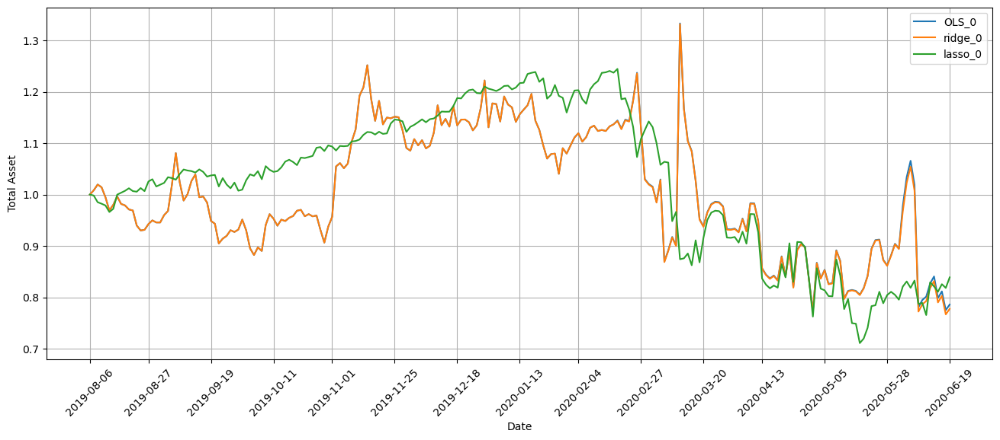

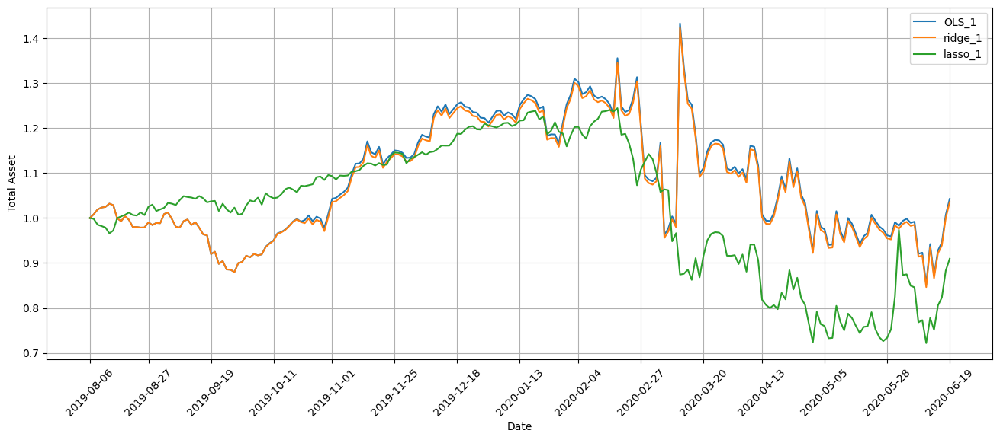

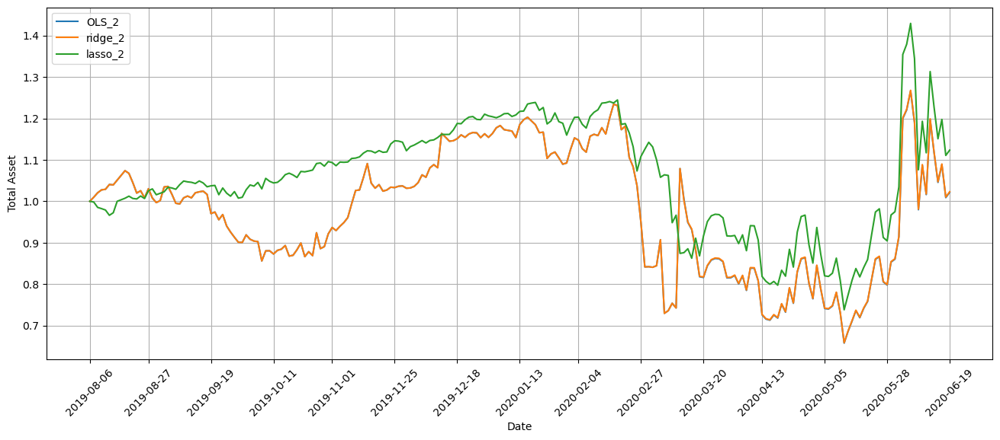

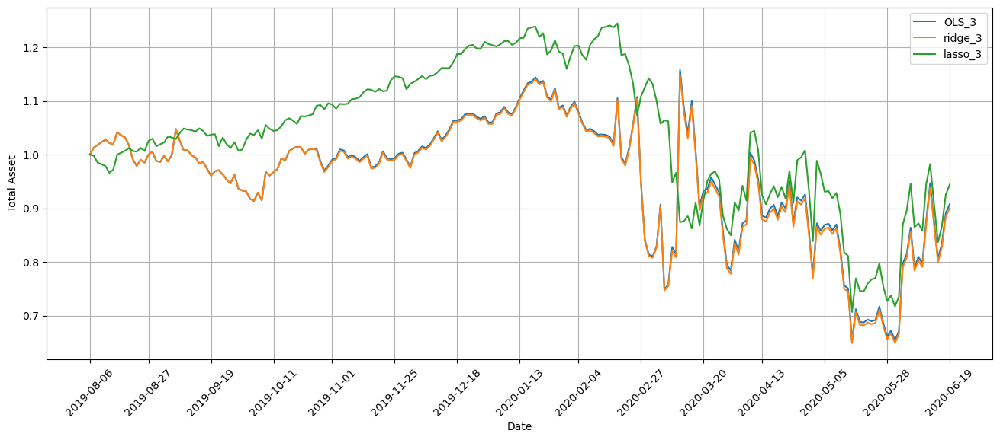

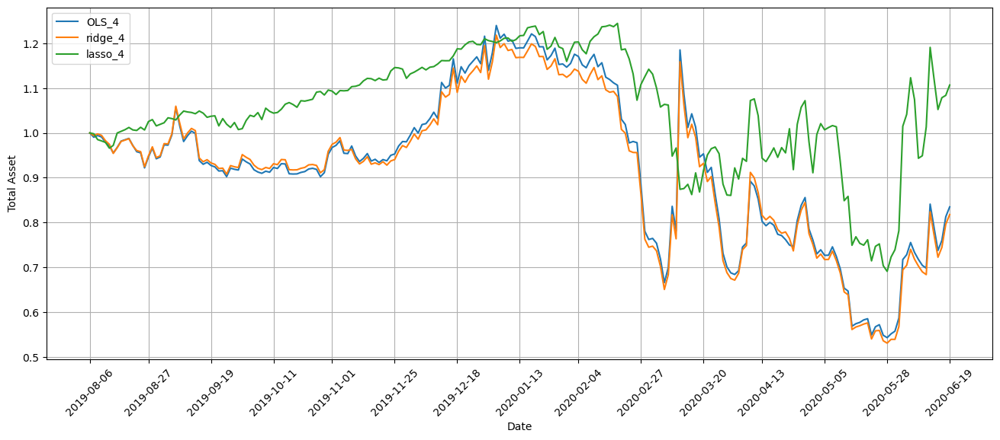

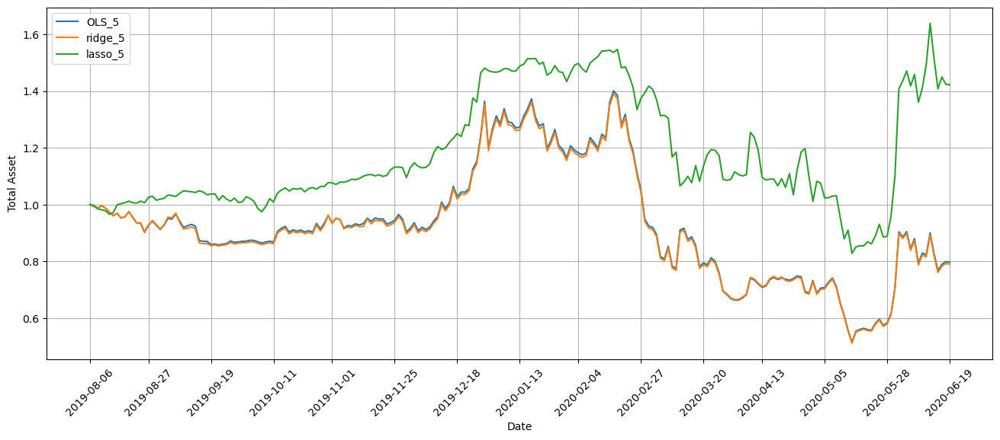

Running 12 of 67 iterations. First iteration already finished
Standardization data are from 2018-11-15 to 2019-09-04
Training data are from 2019-09-05 to 2020-06-19
Testing data are from 2020-05-26 to 2020-07-20
top_stocks by OLS factors 0 to buy on 2020-06-23 are ['AAT', 'MFA', 'GRPN', 'WELL', 'XHR', 'FSK', 'SVC', 'APLE', 'RWT', 'IVR']
Total asset on 2020-06-24 will be 0.7615547376943211
It should be the same as 0.7615547376943269
top_stocks by OLS factors 0 to buy on 2020-06-24 are ['ED', 'CEIX', 'NYMT', 'AR', 'AAL', 'XHR', 'WELL', 'SVC', 'VTR', 'CIM']
Total asset on 2020-06-25 will be 0.7328713874824577
It should be the same as 0.7328713874824634
top_stocks by OLS factors 0 to buy on 2020-06-25 are ['HIG', 'OHI', 'VTR', 'NSA', 'NYMT', 'SPR', 'MFA', 'WELL', 'SVC', 'IVR']
Total asset on 2020-06-26 will be 0.760146422210229
It should be the same as 0.760146422210235
top_stocks by OLS factors 0 to buy on 2020-06-26 are ['HEI', 'CUK', 'FUN', 'CIM', 'NCLH', 'SVC', 'SPR', 'EPR', 'MFA', 'IV

top_stocks by ridge factors 0 to buy on 2020-07-17 are ['CQQQ', 'KWEB', 'GXC', 'EVRI', 'SKYY', 'VRSN', 'VNET', 'APPF', 'FTNT', 'DBRG']
Total asset on 2020-07-20 will be 0.7626825327392902
It should be the same as 0.7626825327392968
top_stocks by ridge factors 0 to buy on 2020-07-20 are ['DXD', 'DOG', 'BK', 'BLKB', 'ERY', 'TZA', 'SRTY', 'TWM', 'RWM', 'DBRG']
Total asset on 2020-07-21 will be 0.7543811191602434
It should be the same as 0.7543811191602496
top_stocks by ridge factors 0 to buy on 2020-07-21 are ['KRC', 'PBF', 'PEB', 'ECH', 'AIV', 'ESS', 'USB', 'BALL', 'PGRE', 'DBRG']
Total asset on 2020-07-22 will be 0.7512946544145681
It should be the same as 0.7512946544145743
top_stocks by lasso factors 0 to buy on 2020-06-23 are ['NSA', 'AAT', 'GRPN', 'WELL', 'XHR', 'SVC', 'FSK', 'APLE', 'RWT', 'IVR']
Total asset on 2020-06-24 will be 0.808693480543787
It should be the same as 0.808693480543792
top_stocks by lasso factors 0 to buy on 2020-06-24 are ['ED', 'CEIX', 'AAL', 'NYMT', 'AR', 'X

Total asset on 2020-07-17 will be 0.9879799091643583
It should be the same as 0.9879799091643605
top_stocks by OLS factors 1 to buy on 2020-07-17 are ['EBS', 'LIT', 'RRC', 'ALT', 'MED', 'WSO', 'EXK', 'EVH', 'IBKR', 'TSLA']
Total asset on 2020-07-20 will be 1.0210067863740395
It should be the same as 1.0210067863740424
top_stocks by OLS factors 1 to buy on 2020-07-20 are ['ALT', 'MED', 'EXK', 'BDX', 'FCEL', 'TSLA', 'WSO', 'EVH', 'IBKR', 'HLF']
Total asset on 2020-07-21 will be 1.0666683935445929
It should be the same as 1.066668393544596
top_stocks by OLS factors 1 to buy on 2020-07-21 are ['SQM', 'BSCO', 'RRC', 'SGMO', 'TSLA', 'EVH', 'HLF', 'BDX', 'WSO', 'IBKR']
Total asset on 2020-07-22 will be 1.0519289739353042
It should be the same as 1.0519289739353073
top_stocks by ridge factors 1 to buy on 2020-06-23 are ['XHR', 'SKT', 'CIM', 'FSK', 'MAC', 'SPG', 'MFA', 'RWT', 'SVC', 'IVR']
Total asset on 2020-06-24 will be 1.0049367668301943
It should be the same as 1.0049367668301967
top_stock

top_stocks by lasso factors 1 to buy on 2020-07-16 are ['FCEL', 'OPK', 'SQM', 'GFI', 'PCRX', 'SRNE', 'EXK', 'EVH', 'MED', 'IBKR']
Total asset on 2020-07-17 will be 0.8531285527538907
It should be the same as 0.8531285527538977
top_stocks by lasso factors 1 to buy on 2020-07-17 are ['VUZI', 'EBS', 'RRC', 'ALT', 'MED', 'WSO', 'EXK', 'EVH', 'IBKR', 'TSLA']
Total asset on 2020-07-20 will be 0.8777772625975273
It should be the same as 0.8777772625975343
top_stocks by lasso factors 1 to buy on 2020-07-20 are ['ALT', 'EXK', 'MED', 'BDX', 'FCEL', 'TSLA', 'WSO', 'EVH', 'IBKR', 'HLF']
Total asset on 2020-07-21 will be 0.9197457671609204
It should be the same as 0.919745767160927
top_stocks by lasso factors 1 to buy on 2020-07-21 are ['BSCO', 'RRC', 'CELH', 'SGMO', 'TSLA', 'HLF', 'BDX', 'EVH', 'WSO', 'IBKR']
Total asset on 2020-07-22 will be 0.9061542810610895
It should be the same as 0.9061542810610965
top_stocks by OLS factors 2 to buy on 2020-06-23 are ['ARI', 'UAL', 'AKR', 'IVR', 'CIM', 'REM'

Total asset on 2020-07-16 will be 0.9892136616927361
It should be the same as 0.9892136616927424
top_stocks by ridge factors 2 to buy on 2020-07-16 are ['IVR', 'CNK', 'FULT', 'CIM', 'AKR', 'REM', 'MFA', 'RWT', 'JETS', 'NYMT']
Total asset on 2020-07-17 will be 0.9919704975677509
It should be the same as 0.991970497567757
top_stocks by ridge factors 2 to buy on 2020-07-17 are ['HSBC', 'UAL', 'CIM', 'FULT', 'AKR', 'REM', 'MFA', 'RWT', 'JETS', 'NYMT']
Total asset on 2020-07-20 will be 0.9782767056475866
It should be the same as 0.9782767056475928
top_stocks by ridge factors 2 to buy on 2020-07-20 are ['UAL', 'HSBC', 'CIM', 'FULT', 'AKR', 'REM', 'MFA', 'RWT', 'JETS', 'NYMT']
Total asset on 2020-07-21 will be 0.9777483762447022
It should be the same as 0.9777483762447083
top_stocks by ridge factors 2 to buy on 2020-07-21 are ['UAL', 'IVR', 'CIM', 'AKR', 'FULT', 'REM', 'RWT', 'MFA', 'JETS', 'NYMT']
Total asset on 2020-07-22 will be 0.9829991860212108
It should be the same as 0.982999186021217

Total asset on 2020-07-15 will be 1.0305287130268521
It should be the same as 1.0305287130268577
top_stocks by OLS factors 3 to buy on 2020-07-15 are ['SVC', 'ABR', 'AQN', 'SPG', 'RGA', 'STWD', 'MHK', 'MFA', 'RWT', 'BXMT']
Total asset on 2020-07-16 will be 1.041075003091581
It should be the same as 1.041075003091587
top_stocks by OLS factors 3 to buy on 2020-07-16 are ['MPW', 'SFM', 'IMO', 'BXMT', 'PSX', 'OI', 'MSM', 'MAIN', 'ECH', 'MHK']
Total asset on 2020-07-17 will be 1.057885871516307
It should be the same as 1.0578858715163129
top_stocks by OLS factors 3 to buy on 2020-07-17 are ['TMHC', 'PFGC', 'PAYX', 'INFY', 'PSX', 'PUMP', 'NYMT', 'RWT', 'IVR', 'MHK']
Total asset on 2020-07-20 will be 1.048022389810561
It should be the same as 1.048022389810567
top_stocks by OLS factors 3 to buy on 2020-07-20 are ['AZPN', 'WING', 'CSGP', 'RNG', 'FTNT', 'DBA', 'SDOW', 'DXD', 'DOG', 'HYD']
Total asset on 2020-07-21 will be 1.0616603549202135
It should be the same as 1.0616603549202197
top_stocks

top_stocks by lasso factors 3 to buy on 2020-07-10 are ['YANG', 'PSEC', 'PFGC', 'TMHC', 'CCL', 'ALT', 'OKE', 'ET', 'IVR', 'D']
Total asset on 2020-07-13 will be 1.0419498452996396
It should be the same as 1.041949845299644
top_stocks by lasso factors 3 to buy on 2020-07-13 are ['NHI', 'NYMT', 'SVC', 'AAT', 'RWT', 'CIM', 'RLJ', 'APLE', 'D', 'IVR']
Total asset on 2020-07-14 will be 1.0204739034583246
It should be the same as 1.020473903458329
top_stocks by lasso factors 3 to buy on 2020-07-14 are ['MFA', 'PGRE', 'PK', 'UDR', 'BXMT', 'SVC', 'MATX', 'FCPT', 'AAT', 'EVRI']
Total asset on 2020-07-15 will be 1.0664197840436465
It should be the same as 1.0664197840436511
top_stocks by lasso factors 3 to buy on 2020-07-15 are ['SVC', 'ABR', 'AQN', 'SPG', 'STWD', 'RGA', 'MHK', 'MFA', 'RWT', 'BXMT']
Total asset on 2020-07-16 will be 1.0773333731109764
It should be the same as 1.0773333731109815
top_stocks by lasso factors 3 to buy on 2020-07-16 are ['MPW', 'IMO', 'SFM', 'BXMT', 'PSX', 'OI', 'MSM'

Total asset on 2020-07-10 will be 0.778506137719831
It should be the same as 0.7785061377198347
top_stocks by ridge factors 4 to buy on 2020-07-10 are ['ET', 'UAL', 'REM', 'JETS', 'FULT', 'RWT', 'OKE', 'MFA', 'IVR', 'NYMT']
Total asset on 2020-07-13 will be 0.8259981069355851
It should be the same as 0.8259981069355884
top_stocks by ridge factors 4 to buy on 2020-07-13 are ['HSBC', 'ESRT', 'CIM', 'REM', 'JETS', 'UAL', 'IVR', 'MFA', 'RWT', 'NYMT']
Total asset on 2020-07-14 will be 0.8014436851551389
It should be the same as 0.8014436851551422
top_stocks by ridge factors 4 to buy on 2020-07-14 are ['SPG', 'PGRE', 'UAL', 'AKR', 'ESRT', 'FULT', 'JETS', 'HSBC', 'MFA', 'NYMT']
Total asset on 2020-07-15 will be 0.8386486601272547
It should be the same as 0.8386486601272582
top_stocks by ridge factors 4 to buy on 2020-07-15 are ['IVR', 'REM', 'AKR', 'HSBC', 'FULT', 'UAL', 'JETS', 'RWT', 'MFA', 'NYMT']
Total asset on 2020-07-16 will be 0.8484963552248109
It should be the same as 0.8484963552248

Total asset on 2020-07-10 will be 0.7150309854233967
It should be the same as 0.7150309854233964
top_stocks by OLS factors 5 to buy on 2020-07-10 are ['NCLH', 'OKE', 'UAL', 'SVC', 'TOON', 'JETS', 'RWT', 'IVR', 'NYMT', 'MFA']
Total asset on 2020-07-13 will be 0.7595680334440805
It should be the same as 0.7595680334440802
top_stocks by OLS factors 5 to buy on 2020-07-13 are ['SPG', 'CIM', 'UAL', 'APLE', 'SVC', 'JETS', 'IVR', 'RWT', 'NYMT', 'MFA']
Total asset on 2020-07-14 will be 0.7344181407094994
It should be the same as 0.7344181407094992
top_stocks by OLS factors 5 to buy on 2020-07-14 are ['DRH', 'UAL', 'SVC', 'SPG', 'IVR', 'RWT', 'TOON', 'JETS', 'NYMT', 'MFA']
Total asset on 2020-07-15 will be 0.7802169003642968
It should be the same as 0.7802169003642966
top_stocks by OLS factors 5 to buy on 2020-07-15 are ['NCLH', 'SVC', 'SPG', 'UAL', 'TOON', 'IVR', 'RWT', 'JETS', 'NYMT', 'MFA']
Total asset on 2020-07-16 will be 0.7837877139941056
It should be the same as 0.7837877139941053
top_s

Total asset on 2020-07-07 will be 1.3441701565446493
It should be the same as 1.3441701565446535
top_stocks by lasso factors 5 to buy on 2020-07-07 are ['RWT', 'ARI', 'REM', 'SVC', 'CIM', 'IVR', 'JETS', 'NNDM', 'MFA', 'NYMT']
Total asset on 2020-07-08 will be 1.2892660370477114
It should be the same as 1.2892660370477158
top_stocks by lasso factors 5 to buy on 2020-07-08 are ['ARI', 'UAL', 'CIM', 'REM', 'IVR', 'RWT', 'JETS', 'MFA', 'NNDM', 'NYMT']
Total asset on 2020-07-09 will be 1.307269296023078
It should be the same as 1.3072692960230823
top_stocks by lasso factors 5 to buy on 2020-07-09 are ['ARI', 'SVC', 'REM', 'CIM', 'RWT', 'JETS', 'NNDM', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-07-10 will be 1.254801620643743
It should be the same as 1.2548016206437471
top_stocks by lasso factors 5 to buy on 2020-07-10 are ['TOON', 'REM', 'CIM', 'SVC', 'JETS', 'NNDM', 'RWT', 'MFA', 'IVR', 'NYMT']
Total asset on 2020-07-13 will be 1.3055866071412716
It should be the same as 1.3055866071412758


top_stocks by ridge factors 0 to buy on 2020-07-28 are ['NTRS', 'GRFS', 'QD', 'TDY', 'ALLE', 'BEP', 'SEIC', 'EHTH', 'PACB', 'INTC']
Total asset on 2020-07-29 will be 0.7347082010361233
It should be the same as 0.7347082010361299
top_stocks by ridge factors 0 to buy on 2020-07-29 are ['SWX', 'PK', 'ARI', 'DRH', 'AEP', 'JJSF', 'CZR', 'EHTH', 'TDY', 'INTC']
Total asset on 2020-07-30 will be 0.7231518773737177
It should be the same as 0.7231518773737242
top_stocks by ridge factors 0 to buy on 2020-07-30 are ['MGY', 'FFIV', 'LW', 'AFG', 'HIG', 'AXTA', 'ECL', 'EFX', 'AWI', 'HXL']
Total asset on 2020-07-31 will be 0.7263507911783132
It should be the same as 0.7263507911783198
top_stocks by ridge factors 0 to buy on 2020-07-31 are ['FFIV', 'IMAX', 'STRA', 'CCJ', 'BBVA', 'ECL', 'LW', 'NEU', 'AWI', 'HXL']
Total asset on 2020-08-03 will be 0.7165058115768639
It should be the same as 0.7165058115768703
top_stocks by ridge factors 0 to buy on 2020-08-03 are ['FBP', 'TSE', 'PFG', 'ECL', 'BBVA', 'PI'

Total asset on 2020-07-28 will be 1.0451991954261735
It should be the same as 1.045199195426177
top_stocks by OLS factors 1 to buy on 2020-07-28 are ['WCC', 'CODX', 'ALT', 'CHRW', 'CELH', 'EXK', 'DNN', 'QGEN', 'EVH', 'FXE']
Total asset on 2020-07-29 will be 1.0453274542095345
It should be the same as 1.045327454209538
top_stocks by OLS factors 1 to buy on 2020-07-29 are ['ERIC', 'MNRO', 'CALX', 'QGEN', 'BBWI', 'WSO', 'PFFD', 'EVH', 'DNN', 'FXE']
Total asset on 2020-07-30 will be 1.0577130764133078
It should be the same as 1.0577130764133116
top_stocks by OLS factors 1 to buy on 2020-07-30 are ['GTLS', 'SIGA', 'MNRO', 'QGEN', 'DNN', 'HSIC', 'EVH', 'PFFD', 'FXE', 'WSO']
Total asset on 2020-07-31 will be 1.0542771892128044
It should be the same as 1.0542771892128084
top_stocks by OLS factors 1 to buy on 2020-07-31 are ['AMN', 'VTLE', 'PSEC', 'CODX', 'FSK', 'HSIC', 'EVH', 'PFFD', 'WSO', 'FXE']
Total asset on 2020-08-03 will be 1.074790798373335
It should be the same as 1.0747907983733387
t

top_stocks by lasso factors 1 to buy on 2020-07-22 are ['PACB', 'QGEN', 'WAT', 'CELH', 'IBKR', 'WSO', 'EVH', 'SGMO', 'BDX', 'FXE']
Total asset on 2020-07-23 will be 0.9239952154901028
It should be the same as 0.9239952154901099
top_stocks by lasso factors 1 to buy on 2020-07-23 are ['WAT', 'APD', 'BBWI', 'LRN', 'HYMB', 'WSO', 'EVH', 'BDX', 'QGEN', 'FXE']
Total asset on 2020-07-24 will be 0.9187456518482741
It should be the same as 0.9187456518482812
top_stocks by lasso factors 1 to buy on 2020-07-24 are ['GFI', 'WAT', 'WCC', 'ALT', 'APD', 'FXE', 'BDX', 'QGEN', 'CELH', 'EVH']
Total asset on 2020-07-27 will be 0.9252530442220273
It should be the same as 0.9252530442220342
top_stocks by lasso factors 1 to buy on 2020-07-27 are ['DNN', 'GFI', 'ALT', 'FXE', 'WCC', 'BDX', 'QGEN', 'CELH', 'EXK', 'EVH']
Total asset on 2020-07-28 will be 0.9239632652682459
It should be the same as 0.9239632652682528
top_stocks by lasso factors 1 to buy on 2020-07-28 are ['CODX', 'CDE', 'ALT', 'CHRW', 'CELH', 'D

top_stocks by OLS factors 2 to buy on 2020-08-18 are ['UAL', 'RWT', 'AKR', 'REM', 'CIM', 'IVR', 'MFA', 'FULT', 'JETS', 'NYMT']
Total asset on 2020-08-19 will be 1.0241150540838764
It should be the same as 1.0241150540838841
top_stocks by ridge factors 2 to buy on 2020-07-22 are ['CNK', 'UAL', 'AKR', 'CIM', 'REM', 'IVR', 'FULT', 'MFA', 'JETS', 'NYMT']
Total asset on 2020-07-23 will be 0.9885290150196547
It should be the same as 0.9885290150196608
top_stocks by ridge factors 2 to buy on 2020-07-23 are ['CNK', 'UAL', 'AKR', 'CIM', 'REM', 'IVR', 'FULT', 'MFA', 'JETS', 'NYMT']
Total asset on 2020-07-24 will be 0.9940518141387473
It should be the same as 0.9940518141387538
top_stocks by ridge factors 2 to buy on 2020-07-24 are ['CNK', 'IVR', 'UAL', 'CIM', 'AKR', 'REM', 'MFA', 'FULT', 'JETS', 'NYMT']
Total asset on 2020-07-27 will be 0.9748280807159597
It should be the same as 0.9748280807159664
top_stocks by ridge factors 2 to buy on 2020-07-27 are ['UAL', 'RWT', 'IVR', 'CIM', 'AKR', 'REM', 

Total asset on 2020-08-14 will be 1.1151811829515055
It should be the same as 1.115181182951512
top_stocks by lasso factors 2 to buy on 2020-08-14 are ['UAL', 'CNK', 'AKR', 'CIM', 'REM', 'IVR', 'MFA', 'FULT', 'JETS', 'NYMT']
Total asset on 2020-08-17 will be 1.1438281872926717
It should be the same as 1.1438281872926779
top_stocks by lasso factors 2 to buy on 2020-08-17 are ['RWT', 'UAL', 'AKR', 'REM', 'CIM', 'IVR', 'MFA', 'FULT', 'JETS', 'NYMT']
Total asset on 2020-08-18 will be 1.1206323042313193
It should be the same as 1.1206323042313253
top_stocks by lasso factors 2 to buy on 2020-08-18 are ['UAL', 'RWT', 'AKR', 'CIM', 'REM', 'IVR', 'MFA', 'FULT', 'JETS', 'NYMT']
Total asset on 2020-08-19 will be 1.1062133145763164
It should be the same as 1.1062133145763227
top_stocks by OLS factors 3 to buy on 2020-07-22 are ['RWM', 'XENE', 'EXK', 'PLD', 'AMZN', 'TRNO', 'TEAM', 'BLKB', 'SRNE', 'OPK']
Total asset on 2020-07-23 will be 1.0524318600453624
It should be the same as 1.0524318600453693

Total asset on 2020-08-12 will be 1.100201955111401
It should be the same as 1.100201955111405
top_stocks by ridge factors 3 to buy on 2020-08-12 are ['DK', 'CVI', 'IVR', 'INGR', 'RWT', 'PK', 'CNK', 'CIM', 'TWO', 'EVRG']
Total asset on 2020-08-13 will be 1.0639913064724802
It should be the same as 1.0639913064724842
top_stocks by ridge factors 3 to buy on 2020-08-13 are ['DEO', 'MPLX', 'HSBC', 'PARR', 'CNK', 'BTU', 'YELP', 'PMT', 'RWT', 'KODK']
Total asset on 2020-08-14 will be 1.0459715198723811
It should be the same as 1.0459715198723851
top_stocks by ridge factors 3 to buy on 2020-08-14 are ['CPAY', 'QTWO', 'STAA', 'HOLX', 'WPM', 'FNV', 'VIRT', 'CCOI', 'BL', 'QDEL']
Total asset on 2020-08-17 will be 1.0482977426009967
It should be the same as 1.0482977426010007
top_stocks by ridge factors 3 to buy on 2020-08-17 are ['BL', 'SLV', 'SIVR', 'QDEL', 'AGQ', 'CEF', 'TYL', 'PSLV', 'AZPN', 'CCOI']
Total asset on 2020-08-18 will be 1.0735593795455278
It should be the same as 1.073559379545531

Total asset on 2020-08-11 will be 0.8555714133404305
It should be the same as 0.8555714133404395
top_stocks by OLS factors 4 to buy on 2020-08-11 are ['LAUR', 'TCBI', 'PSA', 'KRG', 'WSFS', 'AAT', 'FE', 'FULT', 'LAMR', 'CIM']
Total asset on 2020-08-12 will be 0.8597779285475723
It should be the same as 0.8597779285475812
top_stocks by OLS factors 4 to buy on 2020-08-12 are ['IVR', 'AKR', 'FULT', 'PSEC', 'RWT', 'FE', 'TWO', 'CNK', 'CIM', 'NYMT']
Total asset on 2020-08-13 will be 0.8284948742655827
It should be the same as 0.8284948742655913
top_stocks by OLS factors 4 to buy on 2020-08-13 are ['PBA', 'MPLX', 'PARA', 'ET', 'WBD', 'RCI', 'JETS', 'NYMT', 'YELP', 'FE']
Total asset on 2020-08-14 will be 0.8262307069254338
It should be the same as 0.8262307069254425
top_stocks by OLS factors 4 to buy on 2020-08-14 are ['BHC', 'UNG', 'BOIL', 'CARG', 'AKR', 'BVN', 'FE', 'BFAM', 'GDDY', 'NYMT']
Total asset on 2020-08-17 will be 0.8402332784804182
It should be the same as 0.8402332784804271
top_st

Total asset on 2020-08-11 will be 1.1240935661194733
It should be the same as 1.1240935661194773
top_stocks by lasso factors 4 to buy on 2020-08-11 are ['PGRE', 'CNK', 'RWT', 'REM', 'PSEC', 'WSFS', 'JETS', 'FULT', 'CIM', 'NYMT']
Total asset on 2020-08-12 will be 1.1304224264204843
It should be the same as 1.1304224264204883
top_stocks by lasso factors 4 to buy on 2020-08-12 are ['PSEC', 'AKR', 'TWO', 'RWT', 'FULT', 'IVR', 'JETS', 'CNK', 'CIM', 'NYMT']
Total asset on 2020-08-13 will be 1.0851135002187202
It should be the same as 1.0851135002187244
top_stocks by lasso factors 4 to buy on 2020-08-13 are ['YELP', 'PSEC', 'AKR', 'FE', 'FULT', 'CIM', 'RWT', 'CNK', 'JETS', 'NYMT']
Total asset on 2020-08-14 will be 1.0763214655779043
It should be the same as 1.0763214655779088
top_stocks by lasso factors 4 to buy on 2020-08-14 are ['BVN', 'BHC', 'CARG', 'ET', 'CNK', 'FULT', 'PSEC', 'AKR', 'JETS', 'NYMT']
Total asset on 2020-08-17 will be 1.1011157454194658
It should be the same as 1.1011157454

Total asset on 2020-08-07 will be 0.7676806115703723
It should be the same as 0.7676806115703803
top_stocks by ridge factors 5 to buy on 2020-08-07 are ['BKU', 'UA', 'TCBI', 'IVR', 'IBTX', 'AKR', 'MHK', 'MFA', 'SVC', 'NYMT']
Total asset on 2020-08-10 will be 0.8088963368500139
It should be the same as 0.8088963368500222
top_stocks by ridge factors 5 to buy on 2020-08-10 are ['CAKE', 'IDEX', 'AIV', 'WSFS', 'YANG', 'FMX', 'IBTX', 'TCBI', 'NYMT', 'FE']
Total asset on 2020-08-11 will be 0.8126344058339716
It should be the same as 0.8126344058339796
top_stocks by ridge factors 5 to buy on 2020-08-11 are ['FRT', 'FITB', 'FCPT', 'AAT', 'CIM', 'TWO', 'DBRG', 'TCBI', 'UE', 'FE']
Total asset on 2020-08-12 will be 0.8162048917230215
It should be the same as 0.8162048917230295
top_stocks by ridge factors 5 to buy on 2020-08-12 are ['BZUN', 'PSEC', 'MSA', 'ARCH', 'CNK', 'CIM', 'TWO', 'NYMT', 'RWT', 'FE']
Total asset on 2020-08-13 will be 0.7929813945320399
It should be the same as 0.792981394532047

top_stocks by OLS factors 0 to buy on 2020-08-26 are ['MVIS', 'DFEN', 'PLCE', 'JDST', 'UCO', 'DPST', 'KODK', 'POR', 'GUSH', 'TOON']
Total asset on 2020-08-27 will be 0.6842846991451673
It should be the same as 0.6842846991451736
top_stocks by OLS factors 0 to buy on 2020-08-27 are ['VNET', 'PLCE', 'SQQQ', 'DFEN', 'POR', 'JDST', 'KODK', 'DPST', 'TOON', 'GUSH']
Total asset on 2020-08-28 will be 0.7001937596681983
It should be the same as 0.7001937596682046
top_stocks by OLS factors 0 to buy on 2020-08-28 are ['ZOM', 'KODK', 'JDST', 'DFEN', 'UCO', 'POR', 'DPST', 'JETS', 'GUSH', 'QDEL']
Total asset on 2020-08-31 will be 0.6913534148332546
It should be the same as 0.691353414833261
top_stocks by OLS factors 0 to buy on 2020-08-31 are ['ZOM', 'DFEN', 'JDST', 'DPST', 'ANY', 'QDEL', 'KODK', 'JETS', 'GUSH', 'GEVO']
Total asset on 2020-09-01 will be 0.7090072320456358
It should be the same as 0.7090072320456422
top_stocks by OLS factors 0 to buy on 2020-09-01 are ['JETS', 'TOON', 'ZOM', 'JDST', 

Total asset on 2020-08-26 will be 0.7370407063899991
It should be the same as 0.7370407063900049
top_stocks by lasso factors 0 to buy on 2020-08-26 are ['MVIS', 'PLCE', 'DFEN', 'JDST', 'UCO', 'DPST', 'KODK', 'POR', 'GUSH', 'TOON']
Total asset on 2020-08-27 will be 0.7279887573596362
It should be the same as 0.7279887573596422
top_stocks by lasso factors 0 to buy on 2020-08-27 are ['PLCE', 'VNET', 'SQQQ', 'POR', 'DFEN', 'JDST', 'KODK', 'DPST', 'TOON', 'GUSH']
Total asset on 2020-08-28 will be 0.744913901550919
It should be the same as 0.7449139015509251
top_stocks by lasso factors 0 to buy on 2020-08-28 are ['ZOM', 'KODK', 'JDST', 'DFEN', 'UCO', 'POR', 'DPST', 'JETS', 'GUSH', 'QDEL']
Total asset on 2020-08-31 will be 0.7355089394656043
It should be the same as 0.7355089394656104
top_stocks by lasso factors 0 to buy on 2020-08-31 are ['ZOM', 'DFEN', 'JDST', 'ANY', 'DPST', 'QDEL', 'KODK', 'JETS', 'GUSH', 'GEVO']
Total asset on 2020-09-01 will be 0.7542902748822088
It should be the same as

Total asset on 2020-08-25 will be 1.1210010853831196
It should be the same as 1.1210010853831218
top_stocks by ridge factors 1 to buy on 2020-08-25 are ['LPSN', 'GRPN', 'TX', 'GLNG', 'FIZZ', 'EAT', 'KURA', 'BJRI', 'PACB', 'APPS']
Total asset on 2020-08-26 will be 1.1326625723521528
It should be the same as 1.132662572352155
top_stocks by ridge factors 1 to buy on 2020-08-26 are ['RRR', 'GLNG', 'PETS', 'EAT', 'KURA', 'FIZZ', 'XNCR', 'HUBS', 'BJRI', 'PACB']
Total asset on 2020-08-27 will be 1.1427424444850331
It should be the same as 1.1427424444850356
top_stocks by ridge factors 1 to buy on 2020-08-27 are ['HUBS', 'KURA', 'ACN', 'CPB', 'RRR', 'FIZZ', 'XNCR', 'EAT', 'BJRI', 'PACB']
Total asset on 2020-08-28 will be 1.1600868549949093
It should be the same as 1.1600868549949117
top_stocks by ridge factors 1 to buy on 2020-08-28 are ['PETS', 'JD', 'XNCR', 'CPB', 'SNDR', 'FIZZ', 'PFFD', 'EAT', 'BJRI', 'PACB']
Total asset on 2020-08-31 will be 1.1829166009145042
It should be the same as 1.18

top_stocks by OLS factors 2 to buy on 2020-08-21 are ['REM', 'PSEC', 'CNK', 'UAL', 'AKR', 'FULT', 'JETS', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-08-24 will be 1.009604796438237
It should be the same as 1.0096047964382446
top_stocks by OLS factors 2 to buy on 2020-08-24 are ['CIM', 'REM', 'PSEC', 'UAL', 'AKR', 'JETS', 'FULT', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-08-25 will be 1.0604206570445687
It should be the same as 1.060420657044576
top_stocks by OLS factors 2 to buy on 2020-08-25 are ['CIM', 'REM', 'UAL', 'PSEC', 'AKR', 'FULT', 'JETS', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-08-26 will be 1.0439633631862064
It should be the same as 1.0439633631862135
top_stocks by OLS factors 2 to buy on 2020-08-26 are ['CIM', 'REM', 'AKR', 'UAL', 'PSEC', 'JETS', 'FULT', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-08-27 will be 1.0309867084253577
It should be the same as 1.0309867084253643
top_stocks by OLS factors 2 to buy on 2020-08-27 are ['CIM', 'REM', 'AKR', 'UAL', 'PSEC', 'FULT', 'JET

top_stocks by lasso factors 2 to buy on 2020-08-19 are ['CIM', 'REM', 'AKR', 'PSEC', 'UAL', 'FULT', 'IVR', 'JETS', 'MFA', 'NYMT']
Total asset on 2020-08-20 will be 1.090297374306798
It should be the same as 1.0902973743068043
top_stocks by lasso factors 2 to buy on 2020-08-20 are ['CNK', 'REM', 'AKR', 'PSEC', 'UAL', 'FULT', 'IVR', 'JETS', 'MFA', 'NYMT']
Total asset on 2020-08-21 will be 1.0942044934595156
It should be the same as 1.0942044934595223
top_stocks by lasso factors 2 to buy on 2020-08-21 are ['REM', 'CNK', 'PSEC', 'UAL', 'AKR', 'FULT', 'IVR', 'JETS', 'MFA', 'NYMT']
Total asset on 2020-08-24 will be 1.091520490903682
It should be the same as 1.0915204909036884
top_stocks by lasso factors 2 to buy on 2020-08-24 are ['CIM', 'REM', 'UAL', 'PSEC', 'AKR', 'FULT', 'JETS', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-08-25 will be 1.1475707747472355
It should be the same as 1.1475707747472421
top_stocks by lasso factors 2 to buy on 2020-08-25 are ['CIM', 'REM', 'UAL', 'PSEC', 'AKR', 'F

Total asset on 2020-09-14 will be 0.9782927893141794
It should be the same as 0.9782927893141851
top_stocks by OLS factors 3 to buy on 2020-09-14 are ['VRSK', 'IWY', 'IWF', 'ROP', 'ADBE', 'HOLX', 'CWB', 'MTUM', 'WING', 'ACMR']
Total asset on 2020-09-15 will be 0.9928595591898511
It should be the same as 0.9928595591898568
top_stocks by OLS factors 3 to buy on 2020-09-15 are ['ROP', 'QD', 'SU', 'WTRG', 'ACIW', 'NWN', 'CVI', 'ACMR', 'GHC', 'EIDO']
Total asset on 2020-09-16 will be 0.9872547125572864
It should be the same as 0.987254712557292
top_stocks by OLS factors 3 to buy on 2020-09-16 are ['ALE', 'ESRT', 'ROIC', 'CNK', 'VNO', 'SLG', 'DRH', 'APLE', 'POR', 'ACIW']
Total asset on 2020-09-17 will be 0.9867070379022246
It should be the same as 0.9867070379022302
top_stocks by ridge factors 3 to buy on 2020-08-19 are ['BXMT', 'CDP', 'NYMT', 'RWT', 'IVR', 'PMT', 'DEA', 'CIM', 'MFA', 'ARI']
Total asset on 2020-08-20 will be 1.0369268949910333
It should be the same as 1.0369268949910377
top_

Total asset on 2020-09-09 will be 1.0297563863382062
It should be the same as 1.029756386338211
top_stocks by lasso factors 3 to buy on 2020-09-09 are ['SH', 'SPXU', 'TECS', 'PSQ', 'MFA', 'PARR', 'QID', 'SQQQ', 'CACC', 'DCI']
Total asset on 2020-09-10 will be 1.006872396020974
It should be the same as 1.006872396020979
top_stocks by lasso factors 3 to buy on 2020-09-10 are ['SLV', 'AGQ', 'SVXY', 'CIEN', 'ICVT', 'KODK', 'ICLN', 'PSLV', 'CEF', 'ITCI']
Total asset on 2020-09-11 will be 0.9936614287856966
It should be the same as 0.993661428785702
top_stocks by lasso factors 3 to buy on 2020-09-11 are ['QCLN', 'MGK', 'IWY', 'AAPL', 'MTUM', 'SKYY', 'ICLN', 'CWB', 'ARKW', 'ICVT']
Total asset on 2020-09-14 will be 0.9943270901529134
It should be the same as 0.9943270901529188
top_stocks by lasso factors 3 to buy on 2020-09-14 are ['IUSG', 'IWY', 'IWF', 'ADBE', 'ROP', 'HOLX', 'CWB', 'MTUM', 'WING', 'ACMR']
Total asset on 2020-09-15 will be 1.0084621892541372
It should be the same as 1.00846218

Total asset on 2020-09-04 will be 0.7813990685675475
It should be the same as 0.7813990685675506
top_stocks by ridge factors 4 to buy on 2020-09-04 are ['DAL', 'DPST', 'DFEN', 'APLE', 'LUV', 'UAL', 'MFA', 'CIM', 'JETS', 'NYMT']
Total asset on 2020-09-08 will be 0.7685276340866639
It should be the same as 0.7685276340866672
top_stocks by ridge factors 4 to buy on 2020-09-08 are ['VNO', 'UAL', 'FULT', 'SQQQ', 'SVC', 'CIM', 'IVR', 'TECS', 'JETS', 'NYMT']
Total asset on 2020-09-09 will be 0.7582227601096933
It should be the same as 0.7582227601096966
top_stocks by ridge factors 4 to buy on 2020-09-09 are ['CIM', 'FUN', 'UCO', 'CNK', 'RYTM', 'MFA', 'INO', 'IVR', 'JETS', 'NYMT']
Total asset on 2020-09-10 will be 0.7583150855320201
It should be the same as 0.7583150855320234
top_stocks by ridge factors 4 to buy on 2020-09-10 are ['EVRG', 'OXM', 'ITCI', 'MANU', 'BMRN', 'JETS', 'RYTM', 'INO', 'IVR', 'NYMT']
Total asset on 2020-09-11 will be 0.7454088207127392
It should be the same as 0.74540882

top_stocks by OLS factors 5 to buy on 2020-09-01 are ['DPZ', 'TWM', 'MSCI', 'TDOC', 'PRO', 'TZA', 'DPST', 'ET', 'BLDP', 'GUSH']
Total asset on 2020-09-02 will be 0.775431227675805
It should be the same as 0.7754312276758055
top_stocks by OLS factors 5 to buy on 2020-09-02 are ['SRTY', 'ANGI', 'TWM', 'DFEN', 'TZA', 'CENN', 'GUSH', 'BLDP', 'MFA', 'KODK']
Total asset on 2020-09-03 will be 0.7623307230090108
It should be the same as 0.7623307230090115
top_stocks by OLS factors 5 to buy on 2020-09-03 are ['RWT', 'ROIC', 'FULT', 'JETS', 'DFEN', 'CIM', 'DPST', 'MFA', 'NYMT', 'KODK']
Total asset on 2020-09-04 will be 0.7617122134875896
It should be the same as 0.7617122134875902
top_stocks by OLS factors 5 to buy on 2020-09-04 are ['CIM', 'SVC', 'RWT', 'KODK', 'DFEN', 'DPST', 'BEP', 'NYMT', 'JETS', 'MFA']
Total asset on 2020-09-08 will be 0.7431426534358664
It should be the same as 0.743142653435867
top_stocks by OLS factors 5 to buy on 2020-09-08 are ['BDN', 'BEP', 'VNO', 'SVC', 'IVR', 'DPST'

Total asset on 2020-08-31 will be 1.5143470062190911
It should be the same as 1.5143470062190956
top_stocks by lasso factors 5 to buy on 2020-08-31 are ['BXMT', 'FULT', 'UAL', 'SVC', 'JETS', 'KODK', 'IVR', 'RWT', 'MFA', 'NYMT']
Total asset on 2020-09-01 will be 1.5367245815420374
It should be the same as 1.5367245815420416
top_stocks by lasso factors 5 to buy on 2020-09-01 are ['JETS', 'TWM', 'IVR', 'PACB', 'TZA', 'GUSH', 'ET', 'MFA', 'KODK', 'NYMT']
Total asset on 2020-09-02 will be 1.4913501855821314
It should be the same as 1.4913501855821358
top_stocks by lasso factors 5 to buy on 2020-09-02 are ['RWM', 'CNP', 'FAZ', 'TWM', 'SRTY', 'TZA', 'IVR', 'MFA', 'NYMT', 'KODK']
Total asset on 2020-09-03 will be 1.4745609538856828
It should be the same as 1.4745609538856874
top_stocks by lasso factors 5 to buy on 2020-09-03 are ['ROIC', 'JETS', 'ARI', 'FULT', 'IVR', 'CIM', 'RWT', 'KODK', 'MFA', 'NYMT']
Total asset on 2020-09-04 will be 1.471749290873634
It should be the same as 1.471749290873

top_stocks by ridge factors 0 to buy on 2020-09-17 are ['ATGE', 'ERX', 'QRTEA', 'JETS', 'JDST', 'DFEN', 'DPST', 'CENN', 'GUSH', 'KODK']
Total asset on 2020-09-18 will be 0.6970382313857107
It should be the same as 0.6970382313857175
top_stocks by ridge factors 0 to buy on 2020-09-18 are ['CBRL', 'JETS', 'GRPN', 'JDST', 'QRTEA', 'CENN', 'BOIL', 'GUSH', 'DFEN', 'KODK']
Total asset on 2020-09-21 will be 0.674215368966093
It should be the same as 0.6742153689660997
top_stocks by ridge factors 0 to buy on 2020-09-21 are ['JDST', 'GRPN', 'CTLT', 'JETS', 'GUSH', 'DFEN', 'CENN', 'TOON', 'SAVA', 'KODK']
Total asset on 2020-09-22 will be 0.6719736761979519
It should be the same as 0.6719736761979583
top_stocks by ridge factors 0 to buy on 2020-09-22 are ['EPR', 'APLE', 'ILMN', 'TOON', 'ZOM', 'JETS', 'GUSH', 'DFEN', 'KODK', 'DPST']
Total asset on 2020-09-23 will be 0.6690894398104847
It should be the same as 0.6690894398104912
top_stocks by ridge factors 0 to buy on 2020-09-23 are ['AIV', 'SVC', 

top_stocks by lasso factors 0 to buy on 2020-10-14 are ['RCL', 'RUN', 'LAAC', 'SQQQ', 'DFEN', 'JETS', 'GUSH', 'DPST', 'TOON', 'CENN']
Total asset on 2020-10-15 will be 0.7047027742236626
It should be the same as 0.7047027742236689
top_stocks by OLS factors 1 to buy on 2020-09-17 are ['BLMN', 'AEO', 'ARCH', 'DDS', 'COO', 'SGRY', 'GOGO', 'BJRI', 'BTU', 'RYTM']
Total asset on 2020-09-18 will be 1.144481136479322
It should be the same as 1.144481136479326
top_stocks by OLS factors 1 to buy on 2020-09-18 are ['GNW', 'COO', 'ARCH', 'BJRI', 'GLNG', 'FL', 'SGRY', 'RYTM', 'BTU', 'SAVA']
Total asset on 2020-09-21 will be 1.147425262991565
It should be the same as 1.1474252629915689
top_stocks by OLS factors 1 to buy on 2020-09-21 are ['RYTM', 'NWL', 'KURA', 'ARCH', 'SGRY', 'AEO', 'FL', 'GLNG', 'BTU', 'SAVA']
Total asset on 2020-09-22 will be 1.1322955097573704
It should be the same as 1.132295509757374
top_stocks by OLS factors 1 to buy on 2020-09-22 are ['EXEL', 'ITCI', 'ATRA', 'KURA', 'DNLI', 

top_stocks by ridge factors 1 to buy on 2020-10-13 are ['DQ', 'GDOT', 'SO', 'ORA', 'BPMC', 'TFIN', 'ES', 'AEP', 'OPK', 'ICLR']
Total asset on 2020-10-14 will be 1.1618341430729586
It should be the same as 1.1618341430729615
top_stocks by ridge factors 1 to buy on 2020-10-14 are ['DIOD', 'GDOT', 'DQ', 'EXAS', 'ES', 'CNC', 'AEP', 'TFIN', 'ORA', 'ICLR']
Total asset on 2020-10-15 will be 1.1292994647857224
It should be the same as 1.1292994647857248
top_stocks by lasso factors 1 to buy on 2020-09-17 are ['BLMN', 'AEO', 'DDS', 'ARCH', 'COO', 'SGRY', 'GOGO', 'BJRI', 'BTU', 'RYTM']
Total asset on 2020-09-18 will be 1.024728924508432
It should be the same as 1.0247289245084397
top_stocks by lasso factors 1 to buy on 2020-09-18 are ['AEO', 'COO', 'BJRI', 'ARCH', 'GLNG', 'FL', 'SGRY', 'RYTM', 'BTU', 'SAVA']
Total asset on 2020-09-21 will be 1.0201457293558776
It should be the same as 1.0201457293558855
top_stocks by lasso factors 1 to buy on 2020-09-21 are ['COO', 'NWL', 'KURA', 'ARCH', 'SGRY', 

Total asset on 2020-10-09 will be 1.0379494543859227
It should be the same as 1.0379494543859313
top_stocks by OLS factors 2 to buy on 2020-10-09 are ['REM', 'PSEC', 'ARI', 'CNK', 'JETS', 'FULT', 'MFA', 'AKR', 'IVR', 'NYMT']
Total asset on 2020-10-12 will be 1.01873377646488
It should be the same as 1.0187337764648885
top_stocks by OLS factors 2 to buy on 2020-10-12 are ['REM', 'ARI', 'UAL', 'PSEC', 'JETS', 'FULT', 'MFA', 'AKR', 'IVR', 'NYMT']
Total asset on 2020-10-13 will be 1.0161790099441996
It should be the same as 1.0161790099442083
top_stocks by OLS factors 2 to buy on 2020-10-13 are ['ARI', 'UAL', 'REM', 'PSEC', 'JETS', 'FULT', 'MFA', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-10-14 will be 1.0132921334559442
It should be the same as 1.0132921334559528
top_stocks by OLS factors 2 to buy on 2020-10-14 are ['CNK', 'REM', 'UAL', 'PSEC', 'JETS', 'FULT', 'MFA', 'AKR', 'IVR', 'NYMT']
Total asset on 2020-10-15 will be 1.009096211742464
It should be the same as 1.0090962117424727
top_st

Total asset on 2020-10-08 will be 1.113815849695898
It should be the same as 1.1138158496959043
top_stocks by lasso factors 2 to buy on 2020-10-08 are ['UAL', 'REM', 'CNK', 'PSEC', 'JETS', 'FULT', 'AKR', 'IVR', 'MFA', 'NYMT']
Total asset on 2020-10-09 will be 1.1341640190006022
It should be the same as 1.1341640190006084
top_stocks by lasso factors 2 to buy on 2020-10-09 are ['ARI', 'CNK', 'REM', 'PSEC', 'JETS', 'FULT', 'AKR', 'MFA', 'IVR', 'NYMT']
Total asset on 2020-10-12 will be 1.1131925633552162
It should be the same as 1.113192563355222
top_stocks by lasso factors 2 to buy on 2020-10-12 are ['ARI', 'REM', 'UAL', 'PSEC', 'JETS', 'FULT', 'AKR', 'MFA', 'IVR', 'NYMT']
Total asset on 2020-10-13 will be 1.1115183466342955
It should be the same as 1.1115183466343017
top_stocks by lasso factors 2 to buy on 2020-10-13 are ['ARI', 'UAL', 'REM', 'PSEC', 'JETS', 'FULT', 'MFA', 'AKR', 'IVR', 'NYMT']
Total asset on 2020-10-14 will be 1.1089365899053356
It should be the same as 1.10893658990534

top_stocks by ridge factors 3 to buy on 2020-10-06 are ['CPT', 'PMT', 'BTU', 'BXMT', 'TRP', 'KOS', 'VRE', 'CIM', 'GBIL', 'EQC']
Total asset on 2020-10-07 will be 0.998702234606776
It should be the same as 0.9987022346067822
top_stocks by ridge factors 3 to buy on 2020-10-07 are ['OXY', 'VET', 'EQC', 'VLO', 'PMT', 'OVV', 'OKE', 'IVR', 'SU', 'CIM']
Total asset on 2020-10-08 will be 1.020643928490891
It should be the same as 1.0206439284908968
top_stocks by ridge factors 3 to buy on 2020-10-08 are ['WMB', 'LBTYA', 'IMAX', 'LBTYK', 'GEVO', 'FTGC', 'NTLA', 'VTIP', 'STIP', 'GBIL']
Total asset on 2020-10-09 will be 0.9974720167171472
It should be the same as 0.9974720167171532
top_stocks by ridge factors 3 to buy on 2020-10-09 are ['RWM', 'VST', 'GEVO', 'NEP', 'IMAX', 'NEOG', 'EPR', 'IOVA', 'PDI', 'CNK']
Total asset on 2020-10-12 will be 0.9926355903814816
It should be the same as 0.9926355903814875
top_stocks by ridge factors 3 to buy on 2020-10-12 are ['BHC', 'BMY', 'ANSS', 'TRP', 'RWM', 'P

Total asset on 2020-10-02 will be 0.7574205850642886
It should be the same as 0.7574205850642983
top_stocks by OLS factors 4 to buy on 2020-10-02 are ['SQQQ', 'UCO', 'BMRN', 'BPMC', 'QDEL', 'GUSH', 'CODX', 'NYMT', 'CENN', 'ALT']
Total asset on 2020-10-05 will be 0.7871588839377365
It should be the same as 0.7871588839377465
top_stocks by OLS factors 4 to buy on 2020-10-05 are ['UCO', 'EQC', 'BMRN', 'TECS', 'SQQQ', 'GUSH', 'TOON', 'CENN', 'NYMT', 'ALT']
Total asset on 2020-10-06 will be 0.8050410292706074
It should be the same as 0.8050410292706172
top_stocks by OLS factors 4 to buy on 2020-10-06 are ['ARI', 'CPB', 'TOON', 'UCO', 'GUSH', 'IVR', 'POR', 'CENN', 'NYMT', 'ALT']
Total asset on 2020-10-07 will be 0.7903874164396065
It should be the same as 0.7903874164396163
top_stocks by OLS factors 4 to buy on 2020-10-07 are ['CIM', 'JETS', 'DFEN', 'SU', 'GUSH', 'IVR', 'DPST', 'CENN', 'NYMT', 'ALT']
Total asset on 2020-10-08 will be 0.8052991088033002
It should be the same as 0.805299108803

Total asset on 2020-09-30 will be 0.9343516540280039
It should be the same as 0.9343516540280087
top_stocks by lasso factors 4 to buy on 2020-09-30 are ['FULT', 'RWT', 'PSEC', 'OKE', 'REM', 'IVR', 'AKR', 'MFA', 'ALT', 'NYMT']
Total asset on 2020-10-01 will be 0.9381815066795746
It should be the same as 0.9381815066795797
top_stocks by lasso factors 4 to buy on 2020-10-01 are ['PSEC', 'TOON', 'FULT', 'JETS', 'SQQQ', 'CEIX', 'AKR', 'MFA', 'ALT', 'NYMT']
Total asset on 2020-10-02 will be 0.9210681036960083
It should be the same as 0.9210681036960134
top_stocks by lasso factors 4 to buy on 2020-10-02 are ['PSQ', 'FAZ', 'GUSH', 'TECS', 'BPMC', 'SQQQ', 'UCO', 'CENN', 'ALT', 'NYMT']
Total asset on 2020-10-05 will be 0.940639401377576
It should be the same as 0.9406394013775811
top_stocks by lasso factors 4 to buy on 2020-10-05 are ['PSEC', 'FAZ', 'TECS', 'JETS', 'MFA', 'SQQQ', 'CENN', 'IVR', 'ALT', 'NYMT']
Total asset on 2020-10-06 will be 0.9459885484913088
It should be the same as 0.9459885

Total asset on 2020-09-29 will be 0.7427476828830143
It should be the same as 0.7427476828830225
top_stocks by ridge factors 5 to buy on 2020-09-29 are ['PK', 'AHT', 'MFA', 'SAVA', 'CODX', 'RWT', 'LAAC', 'NYMT', 'KODK', 'ALT']
Total asset on 2020-09-30 will be 0.7384747084082371
It should be the same as 0.7384747084082454
top_stocks by ridge factors 5 to buy on 2020-09-30 are ['UCO', 'SAVA', 'CEIX', 'DGX', 'CODX', 'NYMT', 'ACMR', 'QDEL', 'KODK', 'ALT']
Total asset on 2020-10-01 will be 0.7416801631718491
It should be the same as 0.7416801631718575
top_stocks by ridge factors 5 to buy on 2020-10-01 are ['BYON', 'TECS', 'SQQQ', 'AR', 'CEIX', 'SAVA', 'QDEL', 'ACMR', 'KODK', 'ALT']
Total asset on 2020-10-02 will be 0.7275045835011948
It should be the same as 0.7275045835012033
top_stocks by ridge factors 5 to buy on 2020-10-02 are ['SQQQ', 'POR', 'KODK', 'TECS', 'QDEL', 'UCO', 'AR', 'ACMR', 'CENN', 'ALT']
Total asset on 2020-10-05 will be 0.7527245230124411
It should be the same as 0.75272

top_stocks by OLS factors 0 to buy on 2020-10-15 are ['CENN', 'APLE', 'RCL', 'SLG', 'AMC', 'DPST', 'DFEN', 'CNK', 'EPR', 'GUSH']
Total asset on 2020-10-16 will be 0.7293069996801446
It should be the same as 0.7293069996801518
top_stocks by OLS factors 0 to buy on 2020-10-16 are ['SHO', 'DPST', 'AMC', 'RCL', 'DFEN', 'GEVO', 'VRTX', 'EPR', 'CENN', 'GUSH']
Total asset on 2020-10-19 will be 0.7409600288534554
It should be the same as 0.7409600288534627
top_stocks by OLS factors 0 to buy on 2020-10-19 are ['GWRE', 'APLE', 'EPR', 'DFEN', 'WFC', 'DPST', 'AMC', 'GUSH', 'CENN', 'VRTX']
Total asset on 2020-10-20 will be 0.72815199304666
It should be the same as 0.7281519930466672
top_stocks by OLS factors 0 to buy on 2020-10-20 are ['JBHT', 'DFEN', 'DPST', 'MD', 'KODK', 'JETS', 'LAAC', 'CENN', 'GUSH', 'VRTX']
Total asset on 2020-10-21 will be 0.7208726817888069
It should be the same as 0.7208726817888141
top_stocks by OLS factors 0 to buy on 2020-10-21 are ['PDI', 'ARI', 'JBHT', 'STWD', 'AIV', '

Total asset on 2020-11-12 will be 0.8354041941595427
It should be the same as 0.8354041941595498
top_stocks by lasso factors 0 to buy on 2020-10-15 are ['RLJ', 'DRH', 'BXMT', 'SHO', 'PGRE', 'APLE', 'AMC', 'SLG', 'CNK', 'EPR']
Total asset on 2020-10-16 will be 0.7181753423345245
It should be the same as 0.718175342334531
top_stocks by lasso factors 0 to buy on 2020-10-16 are ['NCLH', 'PGRE', 'SLG', 'XHR', 'WEX', 'SHO', 'RCL', 'AMC', 'VRTX', 'EPR']
Total asset on 2020-10-19 will be 0.7250536379615512
It should be the same as 0.7250536379615576
top_stocks by lasso factors 0 to buy on 2020-10-19 are ['HPP', 'BKNG', 'EGP', 'PGRE', 'GWRE', 'APLE', 'EPR', 'WFC', 'AMC', 'VRTX']
Total asset on 2020-10-20 will be 0.7245460064824026
It should be the same as 0.7245460064824093
top_stocks by lasso factors 0 to buy on 2020-10-20 are ['ABM', 'BKNG', 'KRC', 'PGRE', 'WFC', 'AMCX', 'HPP', 'JBHT', 'MD', 'VRTX']
Total asset on 2020-10-21 will be 0.7164560212290032
It should be the same as 0.71645602122900

Total asset on 2020-11-11 will be 0.9094628031907392
It should be the same as 0.9094628031907428
top_stocks by OLS factors 1 to buy on 2020-11-11 are ['ENSG', 'MMS', 'UTHR', 'MTCH', 'GNW', 'AGIO', 'RMD', 'RARE', 'DLB', 'OMCL']
Total asset on 2020-11-12 will be 0.9004639216257154
It should be the same as 0.9004639216257186
top_stocks by ridge factors 1 to buy on 2020-10-15 are ['DUK', 'ED', 'SO', 'XEL', 'ORA', 'ES', 'VPU', 'AEP', 'PFFD', 'XLU']
Total asset on 2020-10-16 will be 1.1368652647191535
It should be the same as 1.1368652647191557
top_stocks by ridge factors 1 to buy on 2020-10-16 are ['VCYT', 'TFIN', 'AGR', 'AEP', 'EVR', 'ES', 'CWST', 'XLU', 'TXRH', 'CMS']
Total asset on 2020-10-19 will be 1.1494273425246286
It should be the same as 1.149427342524631
top_stocks by ridge factors 1 to buy on 2020-10-19 are ['VCYT', 'AGR', 'OMCL', 'CMS', 'EVR', 'AEP', 'WTM', 'ORA', 'CWST', 'TXRH']
Total asset on 2020-10-20 will be 1.1374626507221206
It should be the same as 1.137462650722123
top_

Total asset on 2020-11-10 will be 0.8159676289907293
It should be the same as 0.8159676289907379
top_stocks by lasso factors 1 to buy on 2020-11-10 are ['RARE', 'MSM', 'YY', 'GBTC', 'ADP', 'AGIO', 'WDFC', 'EXLS', 'DLB', 'OMCL']
Total asset on 2020-11-11 will be 0.8278225460196568
It should be the same as 0.8278225460196654
top_stocks by lasso factors 1 to buy on 2020-11-11 are ['ENSG', 'MMS', 'UTHR', 'MTCH', 'GNW', 'AGIO', 'RMD', 'RARE', 'DLB', 'OMCL']
Total asset on 2020-11-12 will be 0.8196314183352663
It should be the same as 0.8196314183352749
top_stocks by OLS factors 2 to buy on 2020-10-15 are ['REM', 'REG', 'BPOP', 'MFA', 'FRT', 'ARI', 'EPR', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-10-16 will be 1.0171717615254923
It should be the same as 1.0171717615255012
top_stocks by OLS factors 2 to buy on 2020-10-16 are ['JETS', 'REG', 'MFA', 'BPOP', 'ARI', 'FRT', 'EPR', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-10-19 will be 1.0144930149962275
It should be the same as 1.0144930149962361

Total asset on 2020-11-10 will be 1.2273552188040893
It should be the same as 1.2273552188040942
top_stocks by ridge factors 2 to buy on 2020-11-10 are ['TWM', 'PSEC', 'PBA', 'RWT', 'REG', 'FRT', 'ARI', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-11-11 will be 1.2785105708941977
It should be the same as 1.2785105708942024
top_stocks by ridge factors 2 to buy on 2020-11-11 are ['ARI', 'RWM', 'TWM', 'REM', 'PSEC', 'PBA', 'MFA', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-11-12 will be 1.2498671777411292
It should be the same as 1.2498671777411337
top_stocks by lasso factors 2 to buy on 2020-10-15 are ['REM', 'REG', 'BPOP', 'MFA', 'FRT', 'ARI', 'EPR', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-10-16 will be 1.1071102986604777
It should be the same as 1.1071102986604842
top_stocks by lasso factors 2 to buy on 2020-10-16 are ['REM', 'REG', 'BPOP', 'MFA', 'ARI', 'FRT', 'EPR', 'IVR', 'AKR', 'NYMT']
Total asset on 2020-10-19 will be 1.1024577093290022
It should be the same as 1.1024577093290093
top

top_stocks by OLS factors 3 to buy on 2020-11-05 are ['ATO', 'EBAY', 'CLS', 'FIS', 'CWB', 'EQR', 'USFD', 'FE', 'PARR', 'COLM']
Total asset on 2020-11-06 will be 0.9852913985941301
It should be the same as 0.9852913985941371
top_stocks by OLS factors 3 to buy on 2020-11-06 are ['BOND', 'SQ', 'UMC', 'MVIS', 'FDN', 'AMZN', 'PACB', 'PYPL', 'COLM', 'AIV']
Total asset on 2020-11-09 will be 1.0021545612692169
It should be the same as 1.002154561269224
top_stocks by OLS factors 3 to buy on 2020-11-09 are ['BGC', 'NTR', 'CAR', 'AON', 'PIPR', 'PBI', 'TAN', 'ESPR', 'SEDG', 'AIV']
Total asset on 2020-11-10 will be 1.0008266313494298
It should be the same as 1.0008266313494372
top_stocks by OLS factors 3 to buy on 2020-11-10 are ['UAL', 'CUK', 'CHEF', 'CCL', 'VMC', 'CAR', 'EPR', 'AMC', 'CNK', 'AIV']
Total asset on 2020-11-11 will be 0.9679030600770429
It should be the same as 0.9679030600770504
top_stocks by OLS factors 3 to buy on 2020-11-11 are ['CHEF', 'REG', 'UE', 'ROIC', 'DRH', 'BKD', 'CNK', '

Total asset on 2020-11-04 will be 1.0016865315115746
It should be the same as 1.0016865315115808
top_stocks by lasso factors 3 to buy on 2020-11-04 are ['IEX', 'LAMR', 'SLG', 'BEN', 'UDR', 'SYY', 'EQR', 'JBGS', 'OMC', 'PARR']
Total asset on 2020-11-05 will be 0.9964791745263706
It should be the same as 0.9964791745263768
top_stocks by lasso factors 3 to buy on 2020-11-05 are ['ATO', 'EBAY', 'CLS', 'FIS', 'CWB', 'EQR', 'USFD', 'FE', 'PARR', 'COLM']
Total asset on 2020-11-06 will be 1.0102061796373525
It should be the same as 1.0102061796373587
top_stocks by lasso factors 3 to buy on 2020-11-06 are ['BOND', 'SQ', 'FDN', 'UMC', 'MVIS', 'AMZN', 'PACB', 'PYPL', 'COLM', 'AIV']
Total asset on 2020-11-09 will be 1.0274957415309638
It should be the same as 1.0274957415309698
top_stocks by lasso factors 3 to buy on 2020-11-09 are ['CPA', 'NTR', 'CAR', 'PIPR', 'AON', 'PBI', 'TAN', 'ESPR', 'SEDG', 'AIV']
Total asset on 2020-11-10 will be 1.0328855469990854
It should be the same as 1.03288554699909

Total asset on 2020-11-03 will be 0.761260148780887
It should be the same as 0.7612601487808909
top_stocks by ridge factors 4 to buy on 2020-11-03 are ['ALT', 'UNM', 'NCLH', 'WKC', 'ARI', 'PAGP', 'PAA', 'EPR', 'AKR', 'NYMT']
Total asset on 2020-11-04 will be 0.7540859820289426
It should be the same as 0.7540859820289466
top_stocks by ridge factors 4 to buy on 2020-11-04 are ['CATY', 'PARR', 'GUSH', 'NWE', 'ALT', 'POR', 'CEIX', 'DFEN', 'AKR', 'NYMT']
Total asset on 2020-11-05 will be 0.7525219871212786
It should be the same as 0.7525219871212825
top_stocks by ridge factors 4 to buy on 2020-11-05 are ['GBTC', 'AMC', 'VMBS', 'DFEN', 'COLM', 'XHR', 'HOG', 'GBIL', 'NYMT', 'ALT']
Total asset on 2020-11-06 will be 0.7634496434565361
It should be the same as 0.7634496434565401
top_stocks by ridge factors 4 to buy on 2020-11-06 are ['GBIL', 'SDOW', 'TWM', 'RWM', 'JDST', 'SRTY', 'TZA', 'FAZ', 'ALT', 'AIV']
Total asset on 2020-11-09 will be 0.7091947444111855
It should be the same as 0.7091947444

Total asset on 2020-11-03 will be 0.777744989931295
It should be the same as 0.7777449899312961
top_stocks by OLS factors 5 to buy on 2020-11-03 are ['JBLU', 'NCLH', 'RHP', 'PAA', 'NYMT', 'AGO', 'AKR', 'CNK', 'MRIN', 'EPR']
Total asset on 2020-11-04 will be 0.778909768109513
It should be the same as 0.778909768109514
top_stocks by OLS factors 5 to buy on 2020-11-04 are ['AHT', 'UE', 'SKT', 'PARR', 'CEIX', 'AMC', 'CIM', 'EPR', 'MRIN', 'CNK']
Total asset on 2020-11-05 will be 0.7616015263370977
It should be the same as 0.7616015263370989
top_stocks by OLS factors 5 to buy on 2020-11-05 are ['REXR', 'XHR', 'EPR', 'CNK', 'PEB', 'GLNG', 'FAZ', 'AHT', 'AMC', 'MRIN']
Total asset on 2020-11-06 will be 0.7799331102530666
It should be the same as 0.7799331102530679
top_stocks by OLS factors 5 to buy on 2020-11-06 are ['CNK', 'MANU', 'CODX', 'NEOG', 'TECS', 'FAZ', 'CENN', 'INO', 'MRIN', 'AIV']
Total asset on 2020-11-09 will be 0.7777357771258666
It should be the same as 0.777735777125868
top_stoc

Total asset on 2020-11-03 will be 1.3515762230004247
It should be the same as 1.3515762230004287
top_stocks by lasso factors 5 to buy on 2020-11-03 are ['UAL', 'LAMR', 'ARI', 'SHO', 'AGO', 'CNK', 'NYMT', 'MRIN', 'EPR', 'AKR']
Total asset on 2020-11-04 will be 1.3590873913805561
It should be the same as 1.3590873913805601
top_stocks by lasso factors 5 to buy on 2020-11-04 are ['UE', 'PEB', 'CIM', 'AGO', 'CEIX', 'AKR', 'CNK', 'PARR', 'MRIN', 'EPR']
Total asset on 2020-11-05 will be 1.3343980948220262
It should be the same as 1.3343980948220304
top_stocks by lasso factors 5 to buy on 2020-11-05 are ['FAZ', 'VRTX', 'EPR', 'CNK', 'GLNG', 'XHR', 'AHT', 'PEB', 'AMC', 'MRIN']
Total asset on 2020-11-06 will be 1.3672670066824137
It should be the same as 1.3672670066824182
top_stocks by lasso factors 5 to buy on 2020-11-06 are ['PZA', 'DUST', 'ARWR', 'VRTX', 'PLAY', 'JDST', 'AMC', 'FAZ', 'MRIN', 'AIV']
Total asset on 2020-11-09 will be 1.5206112821207727
It should be the same as 1.52061128212077

Total asset on 2020-11-25 will be 0.8751916512463406
It should be the same as 0.8751916512463478
top_stocks by ridge factors 0 to buy on 2020-11-25 are ['DRIP', 'GLD', 'NEM', 'PHYS', 'BAX', 'TWM', 'POST', 'PSA', 'RWM', 'ERY']
Total asset on 2020-11-27 will be 0.8767302060561826
It should be the same as 0.8767302060561896
top_stocks by ridge factors 0 to buy on 2020-11-27 are ['FAZ', 'IAU', 'DHR', 'DLR', 'ERY', 'CTLT', 'PHYS', 'HRL', 'FE', 'BIO']
Total asset on 2020-11-30 will be 0.8874403119846286
It should be the same as 0.8874403119846356
top_stocks by ridge factors 0 to buy on 2020-11-30 are ['CEF', 'HRL', 'BIO', 'OUNZ', 'FE', 'IAU', 'SGOL', 'GLD', 'PHYS', 'PEN']
Total asset on 2020-12-01 will be 0.8985924317640336
It should be the same as 0.8985924317640406
top_stocks by ridge factors 0 to buy on 2020-12-01 are ['DEI', 'ROIC', 'NNN', 'GLPI', 'SMFG', 'AKR', 'BRX', 'FRT', 'AER', 'TM']
Total asset on 2020-12-02 will be 0.8952852605770548
It should be the same as 0.8952852605770617
top

Total asset on 2020-11-20 will be 0.8812968327446383
It should be the same as 0.8812968327446419
top_stocks by OLS factors 1 to buy on 2020-11-20 are ['EFAV', 'FRT', 'ESS', 'HPP', 'EWP', 'AKR', 'UDR', 'DEO', 'PDM', 'DEI']
Total asset on 2020-11-23 will be 0.8957966269997968
It should be the same as 0.8957966269998003
top_stocks by OLS factors 1 to buy on 2020-11-23 are ['TS', 'EWP', 'MMYT', 'ARCC', 'ALB', 'VCYT', 'OMCL', 'DEI', 'PGRE', 'PDM']
Total asset on 2020-11-24 will be 0.9211993815518006
It should be the same as 0.9211993815518043
top_stocks by OLS factors 1 to buy on 2020-11-24 are ['EPD', 'PGRE', 'AAT', 'OMCL', 'AIV', 'PDM', 'ZOM', 'ARCC', 'DEI', 'AHT']
Total asset on 2020-11-25 will be 0.9163533235826177
It should be the same as 0.9163533235826212
top_stocks by OLS factors 1 to buy on 2020-11-25 are ['AIN', 'ATRA', 'VCYT', 'STIP', 'EWP', 'IGT', 'RBC', 'CENN', 'OMCL', 'ARCC']
Total asset on 2020-11-27 will be 0.9236734955350469
It should be the same as 0.9236734955350505
top_s

Total asset on 2020-11-19 will be 0.8165270856365517
It should be the same as 0.8165270856365604
top_stocks by lasso factors 1 to buy on 2020-11-19 are ['UL', 'CLNE', 'IRTC', 'RCI', 'PACB', 'CINF', 'RSG', 'AQN', 'TU', 'CYRX']
Total asset on 2020-11-20 will be 0.819976017420725
It should be the same as 0.8199760174207338
top_stocks by lasso factors 1 to buy on 2020-11-20 are ['AKR', 'CVS', 'DEI', 'FRT', 'RHP', 'NHI', 'MAA', 'ATO', 'UDR', 'WBA']
Total asset on 2020-11-23 will be 0.8354036704174275
It should be the same as 0.8354036704174364
top_stocks by lasso factors 1 to buy on 2020-11-23 are ['EQR', 'FCPT', 'CIM', 'AVA', 'CWT', 'ATO', 'NJR', 'PNW', 'POST', 'NWE']
Total asset on 2020-11-24 will be 0.8533290505557398
It should be the same as 0.8533290505557488
top_stocks by lasso factors 1 to buy on 2020-11-24 are ['RLJ', 'JJSF', 'ZOM', 'HXL', 'POST', 'SHO', 'AIV', 'BA', 'CIM', 'AHT']
Total asset on 2020-11-25 will be 0.8518136905508603
It should be the same as 0.8518136905508693
top_st

Total asset on 2020-11-18 will be 1.4110440011237706
It should be the same as 1.4110440011237741
top_stocks by ridge factors 2 to buy on 2020-11-18 are ['CVE', 'AKR', 'RWT', 'KOS', 'PSEC', 'FRT', 'IVR', 'ARI', 'PBA', 'NYMT']
Total asset on 2020-11-19 will be 1.3913144612156434
It should be the same as 1.3913144612156472
top_stocks by ridge factors 2 to buy on 2020-11-19 are ['AKR', 'DK', 'KOS', 'CIB', 'FRT', 'PSEC', 'PBA', 'IVR', 'ARI', 'NYMT']
Total asset on 2020-11-20 will be 1.3884314931713335
It should be the same as 1.3884314931713373
top_stocks by ridge factors 2 to buy on 2020-11-20 are ['RWT', 'EPR', 'DK', 'PBA', 'AAT', 'AKR', 'FRT', 'ARI', 'IVR', 'NYMT']
Total asset on 2020-11-23 will be 1.4185481965278615
It should be the same as 1.4185481965278652
top_stocks by ridge factors 2 to buy on 2020-11-23 are ['PBA', 'DK', 'AAT', 'AKR', 'KOS', 'RWT', 'FRT', 'ARI', 'IVR', 'NYMT']
Total asset on 2020-11-24 will be 1.5437595476384267
It should be the same as 1.5437595476384303
top_stoc

top_stocks by OLS factors 3 to buy on 2020-11-17 are ['FUN', 'UAL', 'EPR', 'CTLT', 'BTU', 'AMC', 'LUV', 'JETS', 'KNDI', 'LAMR']
Total asset on 2020-11-18 will be 0.948599167485723
It should be the same as 0.9485991674857304
top_stocks by OLS factors 3 to buy on 2020-11-18 are ['RGA', 'HST', 'APD', 'PGRE', 'SLG', 'CUK', 'DRH', 'CCL', 'EPR', 'AHT']
Total asset on 2020-11-19 will be 0.9204396549067466
It should be the same as 0.9204396549067542
top_stocks by OLS factors 3 to buy on 2020-11-19 are ['MFC', 'BVN', 'FTAI', 'ARI', 'CINF', 'OXM', 'ENB', 'GFF', 'APD', 'RWT']
Total asset on 2020-11-20 will be 0.9215137153184038
It should be the same as 0.9215137153184113
top_stocks by OLS factors 3 to buy on 2020-11-20 are ['LGIH', 'AQN', 'FE', 'FTS', 'STAG', 'RELX', 'CINF', 'CORT', 'FOXF', 'GFF']
Total asset on 2020-11-23 will be 0.9290562157193083
It should be the same as 0.9290562157193161
top_stocks by OLS factors 3 to buy on 2020-11-23 are ['TWM', 'TZA', 'RWM', 'FAZ', 'IRTC', 'NICE', 'CORT',

Total asset on 2020-12-11 will be 0.9802953845163924
It should be the same as 0.9802953845164009
top_stocks by lasso factors 3 to buy on 2020-11-12 are ['HBI', 'SPXU', 'SPXS', 'DOG', 'DXD', 'SDOW', 'RWM', 'TWM', 'SRTY', 'TZA']
Total asset on 2020-11-13 will be 0.9332293700870863
It should be the same as 0.9332293700870928
top_stocks by lasso factors 3 to buy on 2020-11-13 are ['DHI', 'KBH', 'NAIL', 'ARCT', 'FAZ', 'LOGI', 'ITB', 'CUBE', 'POOL', 'EXR']
Total asset on 2020-11-16 will be 0.9375738188183459
It should be the same as 0.9375738188183523
top_stocks by lasso factors 3 to buy on 2020-11-16 are ['POOL', 'LOGI', 'CALX', 'ERY', 'HOLX', 'BTU', 'BIO', 'FAZ', 'QDEL', 'KNDI']
Total asset on 2020-11-17 will be 0.9528270386699019
It should be the same as 0.9528270386699084
top_stocks by lasso factors 3 to buy on 2020-11-17 are ['NCLH', 'UAL', 'FUN', 'BTU', 'CTLT', 'AMC', 'LUV', 'JETS', 'KNDI', 'LAMR']
Total asset on 2020-11-18 will be 0.98925481354275
It should be the same as 0.9892548135

top_stocks by ridge factors 4 to buy on 2020-11-12 are ['DOG', 'SDS', 'SPXU', 'DXD', 'RWM', 'SPXS', 'SDOW', 'TWM', 'SRTY', 'TZA']
Total asset on 2020-11-13 will be 0.6946324853482742
It should be the same as 0.6946324853482779
top_stocks by ridge factors 4 to buy on 2020-11-13 are ['NSA', 'HTGC', 'CHTR', 'INVH', 'ITB', 'ELS', 'REXR', 'NAIL', 'EXR', 'CUBE']
Total asset on 2020-11-16 will be 0.7145861866799985
It should be the same as 0.7145861866800024
top_stocks by ridge factors 4 to buy on 2020-11-16 are ['PZA', 'GDX', 'AGQ', 'KNDI', 'FNV', 'FAZ', 'SSRM', 'BTU', 'BAP', 'ACB']
Total asset on 2020-11-17 will be 0.7188185951734959
It should be the same as 0.7188185951734997
top_stocks by ridge factors 4 to buy on 2020-11-17 are ['DAL', 'CCL', 'JETS', 'UAL', 'NCLH', 'AMC', 'IVR', 'FUN', 'LAMR', 'EPR']
Total asset on 2020-11-18 will be 0.7342923290013099
It should be the same as 0.7342923290013136
top_stocks by ridge factors 4 to buy on 2020-11-18 are ['ALE', 'SLG', 'AAT', 'CUK', 'CCL', 'F

Total asset on 2020-12-10 will be 0.8899427981121156
It should be the same as 0.8899427981121218
top_stocks by lasso factors 4 to buy on 2020-12-10 are ['RWM', 'PDI', 'ANY', 'AIV', 'USO', 'CNK', 'UNG', 'BOIL', 'AMC', 'EPR']
Total asset on 2020-12-11 will be 0.902306373390328
It should be the same as 0.9023063733903344
top_stocks by OLS factors 5 to buy on 2020-11-12 are ['GILD', 'TWM', 'DXD', 'CENN', 'SPXU', 'SPXS', 'SDOW', 'FAZ', 'SRTY', 'TZA']
Total asset on 2020-11-13 will be 0.8256803146119779
It should be the same as 0.8256803146119792
top_stocks by OLS factors 5 to buy on 2020-11-13 are ['PHM', 'INVH', 'REXR', 'SLGN', 'CHTR', 'FR', 'FAZ', 'EGP', 'NAIL', 'ITB']
Total asset on 2020-11-16 will be 0.8400051654245503
It should be the same as 0.8400051654245517
top_stocks by OLS factors 5 to buy on 2020-11-16 are ['SIVR', 'BLDP', 'BAP', 'CODX', 'ACB', 'WTM', 'FAZ', 'CENN', 'BTU', 'VRTX']
Total asset on 2020-11-17 will be 0.8315581286423674
It should be the same as 0.8315581286423689
to

Total asset on 2020-12-08 will be 0.8136594643480822
It should be the same as 0.813659464348091
top_stocks by ridge factors 5 to buy on 2020-12-08 are ['BTU', 'VMC', 'DPST', 'FAZ', 'AY', 'HBI', 'TDOC', 'APD', 'BLNK', 'KODK']
Total asset on 2020-12-09 will be 0.8252412632432546
It should be the same as 0.8252412632432637
top_stocks by ridge factors 5 to buy on 2020-12-09 are ['BEP', 'TDOC', 'ORA', 'RBA', 'FAZ', 'AMC', 'EPR', 'APD', 'CNK', 'BLNK']
Total asset on 2020-12-10 will be 0.7937739666500578
It should be the same as 0.7937739666500669
top_stocks by ridge factors 5 to buy on 2020-12-10 are ['HBI', 'ORA', 'APD', 'PLNT', 'DPST', 'AMN', 'JETS', 'AMC', 'EPR', 'BLNK']
Total asset on 2020-12-11 will be 0.8094867507943473
It should be the same as 0.8094867507943566
top_stocks by lasso factors 5 to buy on 2020-11-12 are ['NAIL', 'TWM', 'GILD', 'SPXU', 'SDOW', 'SPXS', 'DXD', 'FAZ', 'SRTY', 'TZA']
Total asset on 2020-11-13 will be 1.620411005267802
It should be the same as 1.620411005267807

Total asset on 2020-12-28 will be 0.9707387911598265
It should be the same as 0.9707387911598353
top_stocks by OLS factors 0 to buy on 2020-12-28 are ['CENN', 'VTIP', 'FIS', 'BLV', 'FIXD', 'KNSL', 'NWN', 'BABA', 'VGSH', 'AHT']
Total asset on 2020-12-29 will be 0.9938070045601675
It should be the same as 0.9938070045601763
top_stocks by OLS factors 0 to buy on 2020-12-29 are ['VTIP', 'CENN', 'BLV', 'KNSL', 'FIXD', 'UNG', 'BABA', 'VGSH', 'BOIL', 'AHT']
Total asset on 2020-12-30 will be 0.9821477147648312
It should be the same as 0.9821477147648404
top_stocks by OLS factors 0 to buy on 2020-12-30 are ['BABA', 'DQ', 'FIXD', 'PFSI', 'BAND', 'ARKK', 'CLNE', 'BOIL', 'ARKG', 'ARCT']
Total asset on 2020-12-31 will be 1.0100134236487945
It should be the same as 1.0100134236488034
top_stocks by OLS factors 0 to buy on 2020-12-31 are ['FCNCA', 'DDD', 'MFA', 'CIM', 'ARKG', 'PMT', 'TWO', 'PRLB', 'AY', 'ARCT']
Total asset on 2021-01-04 will be 1.0037308839701895
It should be the same as 1.00373088397

Total asset on 2020-12-24 will be 0.8142856886185771
It should be the same as 0.8142856886185833
top_stocks by lasso factors 0 to buy on 2020-12-24 are ['MNKD', 'AKR', 'KRC', 'OGS', 'BXP', 'TRP', 'ATO', 'VGSH', 'NWN', 'AHT']
Total asset on 2020-12-28 will be 0.8272246585080416
It should be the same as 0.8272246585080477
top_stocks by lasso factors 0 to buy on 2020-12-28 are ['ETR', 'VTIP', 'FIS', 'BLV', 'FIXD', 'BABA', 'KNSL', 'NWN', 'AHT', 'VGSH']
Total asset on 2020-12-29 will be 0.8456038959873379
It should be the same as 0.8456038959873441
top_stocks by lasso factors 0 to buy on 2020-12-29 are ['VGIT', 'VTIP', 'AHT', 'BLV', 'KNSL', 'FIXD', 'BOIL', 'UNG', 'BABA', 'VGSH']
Total asset on 2020-12-30 will be 0.8424532666424809
It should be the same as 0.8424532666424871
top_stocks by lasso factors 0 to buy on 2020-12-30 are ['WB', 'PAYX', 'ALT', 'BABA', 'DQ', 'FIXD', 'PFSI', 'BAND', 'CLNE', 'ARCT']
Total asset on 2020-12-31 will be 0.8641058316514456
It should be the same as 0.864105831

Total asset on 2020-12-24 will be 0.9184245031044985
It should be the same as 0.9184245031045009
top_stocks by ridge factors 1 to buy on 2020-12-24 are ['MDB', 'EGHT', 'HCSG', 'SAGE', 'EVR', 'UEC', 'CIB', 'WLY', 'AHT', 'STIP']
Total asset on 2020-12-28 will be 0.929055729878098
It should be the same as 0.9290557298781001
top_stocks by ridge factors 1 to buy on 2020-12-28 are ['SFIX', 'FOXF', 'CIB', 'EA', 'HCSG', 'SAGE', 'NXE', 'QLYS', 'BPMC', 'STIP']
Total asset on 2020-12-29 will be 0.9173869755898144
It should be the same as 0.9173869755898165
top_stocks by ridge factors 1 to buy on 2020-12-29 are ['EDIT', 'HCSG', 'SFIX', 'MAS', 'HZO', 'POOL', 'SAGE', 'EVR', 'BPMC', 'STIP']
Total asset on 2020-12-30 will be 0.8943506202425693
It should be the same as 0.8943506202425715
top_stocks by ridge factors 1 to buy on 2020-12-30 are ['HZO', 'IRBT', 'GLOB', 'EVR', 'ALRM', 'BPMC', 'MVIS', 'EGHT', 'ORCL', 'STIP']
Total asset on 2020-12-31 will be 0.8947078022282166
It should be the same as 0.8947

Total asset on 2020-12-23 will be 1.5744713023520704
It should be the same as 1.5744713023520815
top_stocks by OLS factors 2 to buy on 2020-12-23 are ['EPR', 'FRT', 'NWN', 'XHR', 'RWT', 'IVR', 'PBA', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-24 will be 1.6011721866529225
It should be the same as 1.6011721866529331
top_stocks by OLS factors 2 to buy on 2020-12-24 are ['EPR', 'XHR', 'NWN', 'FRT', 'PBA', 'RWT', 'IVR', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-28 will be 1.604336245068804
It should be the same as 1.6043362450688148
top_stocks by OLS factors 2 to buy on 2020-12-28 are ['EMLP', 'NWN', 'FRT', 'RWT', 'PBA', 'KMI', 'PSEC', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-29 will be 1.6069158739502485
It should be the same as 1.6069158739502594
top_stocks by OLS factors 2 to buy on 2020-12-29 are ['IVR', 'UAL', 'FRT', 'RWT', 'KMI', 'PBA', 'PSEC', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-30 will be 1.5830586266705067
It should be the same as 1.583058626670518
top_stocks by 

Total asset on 2020-12-18 will be 1.6856413380263533
It should be the same as 1.6856413380263626
top_stocks by lasso factors 2 to buy on 2020-12-18 are ['KMI', 'UAL', 'PSEC', 'IVR', 'KOS', 'PBA', 'ARI', 'RWT', 'AAT', 'NYMT']
Total asset on 2020-12-21 will be 1.6316543994904165
It should be the same as 1.631654399490426
top_stocks by lasso factors 2 to buy on 2020-12-21 are ['KMI', 'KOS', 'PSEC', 'IVR', 'PBA', 'RWT', 'ARI', 'AAT', 'AIV', 'NYMT']
Total asset on 2020-12-22 will be 1.6682311199634803
It should be the same as 1.6682311199634898
top_stocks by lasso factors 2 to buy on 2020-12-22 are ['AIV', 'KMI', 'XHR', 'FRT', 'RWT', 'PBA', 'IVR', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-23 will be 1.6725762271662303
It should be the same as 1.6725762271662403
top_stocks by lasso factors 2 to buy on 2020-12-23 are ['KMI', 'NWN', 'FRT', 'XHR', 'RWT', 'PBA', 'IVR', 'ARI', 'AAT', 'NYMT']
Total asset on 2020-12-24 will be 1.6935561586214174
It should be the same as 1.6935561586214276
top_st

top_stocks by ridge factors 3 to buy on 2020-12-17 are ['ARCC', 'EQR', 'LULU', 'CIM', 'DBI', 'CBOE', 'OXM', 'AZN', 'IVR', 'AIV']
Total asset on 2020-12-18 will be 1.030179442133582
It should be the same as 1.0301794421335904
top_stocks by ridge factors 3 to buy on 2020-12-18 are ['AZN', 'WMS', 'XHR', 'SVC', 'EQR', 'LABD', 'MTN', 'SABR', 'OXM', 'EPR']
Total asset on 2020-12-21 will be 0.9975686541300375
It should be the same as 0.9975686541300459
top_stocks by ridge factors 3 to buy on 2020-12-21 are ['FSK', 'RCL', 'NCLH', 'PARR', 'BCE', 'GLPG', 'AHT', 'PFE', 'PEN', 'AMC']
Total asset on 2020-12-22 will be 1.0096492128485652
It should be the same as 1.0096492128485735
top_stocks by ridge factors 3 to buy on 2020-12-22 are ['WSC', 'HXL', 'HYLS', 'PBF', 'SUN', 'PFE', 'GLPG', 'AMC', 'FSK', 'CVBF']
Total asset on 2020-12-23 will be 1.0065024736844774
It should be the same as 1.0065024736844852
top_stocks by ridge factors 3 to buy on 2020-12-23 are ['RCKT', 'TSN', 'BEP', 'DNN', 'PACB', 'VCYT

Total asset on 2020-12-15 will be 0.7485715285811426
It should be the same as 0.7485715285811522
top_stocks by OLS factors 4 to buy on 2020-12-15 are ['RWT', 'BRZU', 'CUK', 'ACB', 'PAGP', 'ERJ', 'CACC', 'UAL', 'PAA', 'IVR']
Total asset on 2020-12-16 will be 0.7690567354073032
It should be the same as 0.7690567354073128
top_stocks by OLS factors 4 to buy on 2020-12-16 are ['AGI', 'AMH', 'ELS', 'ERY', 'STIP', 'SUI', 'GFI', 'WPM', 'AEM', 'SLGN']
Total asset on 2020-12-17 will be 0.7801590156132124
It should be the same as 0.780159015613222
top_stocks by OLS factors 4 to buy on 2020-12-17 are ['BRZU', 'STIP', 'AZN', 'AGI', 'BVN', 'WPM', 'GFI', 'IRM', 'SAP', 'AEM']
Total asset on 2020-12-18 will be 0.7863475941992331
It should be the same as 0.7863475941992425
top_stocks by OLS factors 4 to buy on 2020-12-18 are ['AMC', 'HSIC', 'IRM', 'CACC', 'AEM', 'NOG', 'CENN', 'FE', 'SLGN', 'BVN']
Total asset on 2020-12-21 will be 0.7590696767239177
It should be the same as 0.7590696767239272
top_stocks

Total asset on 2021-01-11 will be 0.757082817269706
It should be the same as 0.7570828172697108
top_stocks by ridge factors 4 to buy on 2021-01-11 are ['IONS', 'SAGE', 'ERY', 'XENE', 'SRTY', 'LGF-A', 'TWM', 'TZA', 'CENN', 'RWM']
Total asset on 2021-01-12 will be 0.7851178849564419
It should be the same as 0.7851178849564467
top_stocks by lasso factors 4 to buy on 2020-12-11 are ['BRZU', 'XHR', 'CNK', 'USO', 'AKR', 'AAT', 'ARI', 'RWT', 'IVR', 'EPR']
Total asset on 2020-12-14 will be 0.9215239224163247
It should be the same as 0.9215239224163311
top_stocks by lasso factors 4 to buy on 2020-12-14 are ['PPC', 'IVR', 'RWM', 'GSG', 'ERJ', 'BNO', 'UCO', 'AAT', 'BRZU', 'USO']
Total asset on 2020-12-15 will be 0.9166592189597269
It should be the same as 0.9166592189597331
top_stocks by lasso factors 4 to buy on 2020-12-15 are ['ERJ', 'KOS', 'ROIC', 'BRZU', 'PAA', 'AAT', 'UAL', 'RWT', 'ARI', 'IVR']
Total asset on 2020-12-16 will be 0.9312313975266723
It should be the same as 0.9312313975266787
t

Total asset on 2021-01-08 will be 0.8527727801501888
It should be the same as 0.8527727801501913
top_stocks by OLS factors 5 to buy on 2021-01-08 are ['ALK', 'MFA', 'RWT', 'AIV', 'SVC', 'CNK', 'KNDI', 'EPR', 'MARA', 'JETS']
Total asset on 2021-01-11 will be 0.8237939343070867
It should be the same as 0.8237939343070892
top_stocks by OLS factors 5 to buy on 2021-01-11 are ['XENE', 'VNO', 'EPR', 'MRIN', 'PODD', 'AGIO', 'AIV', 'GLPG', 'JETS', 'KNDI']
Total asset on 2021-01-12 will be 0.8251145795650283
It should be the same as 0.8251145795650311
top_stocks by ridge factors 5 to buy on 2020-12-11 are ['KODK', 'QDEL', 'PLNT', 'NBIX', 'JETS', 'APD', 'AKR', 'ACB', 'DPST', 'EPR']
Total asset on 2020-12-14 will be 0.8213759898298658
It should be the same as 0.821375989829875
top_stocks by ridge factors 5 to buy on 2020-12-14 are ['ENR', 'AQN', 'WBA', 'HOLX', 'FIVN', 'AY', 'DPST', 'ACB', 'QDEL', 'JETS']
Total asset on 2020-12-15 will be 0.8182621569346827
It should be the same as 0.8182621569346

Total asset on 2021-01-08 will be 1.8069123803842684
It should be the same as 1.8069123803842755
top_stocks by lasso factors 5 to buy on 2021-01-08 are ['DFEN', 'RWT', 'NCLH', 'CNK', 'SVC', 'EPR', 'DPST', 'AIV', 'MFA', 'JETS']
Total asset on 2021-01-11 will be 1.7430295462338097
It should be the same as 1.7430295462338163
top_stocks by lasso factors 5 to buy on 2021-01-11 are ['CYBR', 'AGIO', 'NCLH', 'MRIN', 'XENE', 'MFA', 'KODK', 'GLPG', 'AIV', 'JETS']
Total asset on 2021-01-12 will be 1.763793188563058
It should be the same as 1.7637931885630653
OLS 0 has SR 0.5643987439433674
OLS 1 has SR 0.3179846206822247
OLS 2 has SR 0.1758870901046944
OLS 3 has SR 0.6133226671252471
OLS 4 has SR 0.396008838337278
OLS 5 has SR 0.044595219995793405
ridge 0 has SR 0.5643987439433678
ridge 1 has SR 0.3179846206822259
ridge 2 has SR 0.1758870901046898
ridge 3 has SR 0.6133226671252587
ridge 4 has SR 0.3987637417453236
ridge 5 has SR 0.04985449791399157
lasso 0 has SR 0.2835036251033911
lasso 1 has SR

Total asset on 2021-02-02 will be 1.467490804724474
It should be the same as 1.4674908047244806
top_stocks by ridge factors 0 to buy on 2021-02-02 are ['KODK', 'MAC', 'RDY', 'BAH', 'PBI', 'IRTC', 'AMC', 'BB', 'EHTH', 'AMCX']
Total asset on 2021-02-03 will be 1.3923222434095086
It should be the same as 1.3923222434095153
top_stocks by ridge factors 0 to buy on 2021-02-03 are ['EXPRQ', 'IRTC', 'SKT', 'FMS', 'BB', 'MAC', 'EHTH', 'AMC', 'GME', 'CENN']
Total asset on 2021-02-04 will be 1.4123453942728248
It should be the same as 1.4123453942728312
top_stocks by ridge factors 0 to buy on 2021-02-04 are ['EXPRQ', 'IRTC', 'XRT', 'FMS', 'MAC', 'BB', 'AMC', 'FIZZ', 'GME', 'CENN']
Total asset on 2021-02-05 will be 1.2980282736147037
It should be the same as 1.2980282736147102
top_stocks by ridge factors 0 to buy on 2021-02-05 are ['CDE', 'EXPRQ', 'PSLV', 'FIZZ', 'FMS', 'HOG', 'AG', 'CENN', 'AMC', 'GME']
Total asset on 2021-02-08 will be 1.3400117984422721
It should be the same as 1.34001179844227

Total asset on 2021-02-02 will be 1.0056255510858418
It should be the same as 1.0056255510858476
top_stocks by OLS factors 1 to buy on 2021-02-02 are ['KODK', 'RDY', 'LUMN', 'MAC', 'BAH', 'PBI', 'IRTC', 'BB', 'EHTH', 'AMCX']
Total asset on 2021-02-03 will be 0.9586530345947535
It should be the same as 0.9586530345947588
top_stocks by OLS factors 1 to buy on 2021-02-03 are ['HOG', 'BAH', 'FIZZ', 'IRTC', 'FMS', 'SKT', 'BB', 'EHTH', 'MAC', 'GME']
Total asset on 2021-02-04 will be 0.95263732703908
It should be the same as 0.9526373270390853
top_stocks by OLS factors 1 to buy on 2021-02-04 are ['SKT', 'EXPRQ', 'IRTC', 'AMC', 'FMS', 'XRT', 'MAC', 'BB', 'FIZZ', 'GME']
Total asset on 2021-02-05 will be 0.8866623499322897
It should be the same as 0.8866623499322951
top_stocks by OLS factors 1 to buy on 2021-02-05 are ['XRT', 'CDE', 'EXPRQ', 'PSLV', 'FMS', 'FIZZ', 'HOG', 'AG', 'AMC', 'GME']
Total asset on 2021-02-08 will be 0.912621740483332
It should be the same as 0.9126217404833377
top_stocks

Total asset on 2021-02-02 will be 1.0172235326658747
It should be the same as 1.0172235326658843
top_stocks by lasso factors 1 to buy on 2021-02-02 are ['TER', 'MAC', 'LUMN', 'RDY', 'BAH', 'PBI', 'BB', 'IRTC', 'EHTH', 'AMCX']
Total asset on 2021-02-03 will be 0.9743395182529652
It should be the same as 0.9743395182529746
top_stocks by lasso factors 1 to buy on 2021-02-03 are ['HOG', 'FIZZ', 'BAH', 'IRTC', 'SKT', 'FMS', 'BB', 'MAC', 'EHTH', 'GME']
Total asset on 2021-02-04 will be 0.9680996315779009
It should be the same as 0.9680996315779105
top_stocks by lasso factors 1 to buy on 2021-02-04 are ['SKT', 'EXPRQ', 'AMC', 'IRTC', 'XRT', 'FMS', 'MAC', 'BB', 'FIZZ', 'GME']
Total asset on 2021-02-05 will be 0.9007913135278997
It should be the same as 0.9007913135279093
top_stocks by lasso factors 1 to buy on 2021-02-05 are ['XRT', 'EXPRQ', 'CDE', 'PSLV', 'FIZZ', 'FMS', 'HOG', 'AG', 'AMC', 'GME']
Total asset on 2021-02-08 will be 0.9272354274195377
It should be the same as 0.9272354274195473


top_stocks by ridge factors 2 to buy on 2021-01-27 are ['HSBC', 'MUR', 'TM', 'CIB', 'HBAN', 'INTC', 'AXP', 'MANU', 'ALE', 'IBM']
Total asset on 2021-01-28 will be 1.6503115025020252
It should be the same as 1.6503115025020316
top_stocks by ridge factors 2 to buy on 2021-01-28 are ['GGG', 'INTC', 'GRBK', 'AES', 'KOLD', 'GOGL', 'AXP', 'ALE', 'GEO', 'AY']
Total asset on 2021-01-29 will be 1.6762782330696453
It should be the same as 1.6762782330696522
top_stocks by ridge factors 2 to buy on 2021-01-29 are ['GGG', 'CWEN', 'EXPO', 'UMC', 'TECH', 'RYTM', 'FORM', 'GNTX', 'RGEN', 'AY']
Total asset on 2021-02-01 will be 1.6655303228895109
It should be the same as 1.6655303228895186
top_stocks by ridge factors 2 to buy on 2021-02-01 are ['AMCX', 'SEIC', 'TTEK', 'RCI', 'AUB', 'EHTH', 'CHRW', 'TER', 'SSB', 'RYTM']
Total asset on 2021-02-02 will be 1.6959917408617469
It should be the same as 1.6959917408617544
top_stocks by ridge factors 2 to buy on 2021-02-02 are ['RDY', 'RCI', 'LUMN', 'MAC', 'IRTC

Total asset on 2021-01-22 will be 1.1987217891883817
It should be the same as 1.198721789188394
top_stocks by OLS factors 3 to buy on 2021-01-22 are ['BCPC', 'PETS', 'KNSL', 'MARA', 'LITE', 'GLNG', 'ZWS', 'YANG', 'PRGS', 'ROL']
Total asset on 2021-01-25 will be 1.2062697069273658
It should be the same as 1.2062697069273778
top_stocks by OLS factors 3 to buy on 2021-01-25 are ['MARA', 'CCJ', 'GBTC', 'KNSL', 'EXEL', 'BMI', 'X', 'PPG', 'AA', 'PRGS']
Total asset on 2021-01-26 will be 1.2010611218131884
It should be the same as 1.2010611218132006
top_stocks by OLS factors 3 to buy on 2021-01-26 are ['SWBI', 'MANU', 'BK', 'PRGS', 'ITUB', 'PPG', 'CINF', 'HAE', 'AA', 'YANG']
Total asset on 2021-01-27 will be 1.1759732320753367
It should be the same as 1.1759732320753487
top_stocks by OLS factors 3 to buy on 2021-01-27 are ['BK', 'MSTR', 'SWBI', 'NTLA', 'JBHT', 'MARA', 'GEO', 'MANU', 'RIOT', 'ALE']
Total asset on 2021-01-28 will be 1.200158908638115
It should be the same as 1.200158908638127
to

Total asset on 2021-01-20 will be 1.2259195144975785
It should be the same as 1.2259195144975887
top_stocks by lasso factors 3 to buy on 2021-01-20 are ['WDFC', 'YANG', 'LITE', 'TTWO', 'STE', 'POOL', 'ROL', 'MASI', 'RBA', 'JKHY']
Total asset on 2021-01-21 will be 1.2343090539520891
It should be the same as 1.2343090539520993
top_stocks by lasso factors 3 to buy on 2021-01-21 are ['SEDG', 'BOIL', 'LITE', 'ESPR', 'UNG', 'PRGS', 'MASI', 'WDFC', 'YANG', 'ROL']
Total asset on 2021-01-22 will be 1.2320846262554879
It should be the same as 1.232084626255498
top_stocks by lasso factors 3 to buy on 2021-01-22 are ['PETS', 'MARA', 'BCPC', 'KNSL', 'LITE', 'ZWS', 'GLNG', 'YANG', 'PRGS', 'ROL']
Total asset on 2021-01-25 will be 1.2397600565929687
It should be the same as 1.2397600565929783
top_stocks by lasso factors 3 to buy on 2021-01-25 are ['MARA', 'CCJ', 'GBTC', 'EXEL', 'X', 'KNSL', 'BMI', 'PPG', 'AA', 'PRGS']
Total asset on 2021-01-26 will be 1.2344717586723342
It should be the same as 1.2344

top_stocks by ridge factors 4 to buy on 2021-01-19 are ['KNDI', 'FCEL', 'RBA', 'SEDG', 'DDD', 'WDFC', 'NTLA', 'RIOT', 'ARCT', 'PLUG']
Total asset on 2021-01-20 will be 0.8332596776611315
It should be the same as 0.8332596776611365
top_stocks by ridge factors 4 to buy on 2021-01-20 are ['STE', 'FCEL', 'RBA', 'RIOT', 'DDD', 'GEVO', 'UMC', 'LAAC', 'ARCT', 'GME']
Total asset on 2021-01-21 will be 0.8197885042883919
It should be the same as 0.819788504288397
top_stocks by ridge factors 4 to buy on 2021-01-21 are ['UNG', 'DDD', 'CENN', 'ZOM', 'CYRX', 'CLDX', 'APPS', 'GME', 'RIOT', 'ARCT']
Total asset on 2021-01-22 will be 0.802618460842033
It should be the same as 0.8026184608420381
top_stocks by ridge factors 4 to buy on 2021-01-22 are ['GLNG', 'CYRX', 'FCEL', 'NTLA', 'GSAT', 'TAL', 'CLDX', 'CENN', 'ARCT', 'GME']
Total asset on 2021-01-25 will be 0.9584205125403791
It should be the same as 0.9584205125403842
top_stocks by ridge factors 4 to buy on 2021-01-25 are ['CYRX', 'VUZI', 'KNSL', 'AP

top_stocks by OLS factors 5 to buy on 2021-01-12 are ['IDA', 'RWM', 'ATO', 'TSLA', 'FCFS', 'GEVO', 'FCEL', 'PLUG', 'RIOT', 'MARA']
Total asset on 2021-01-13 will be 0.8786550171385159
It should be the same as 0.878655017138519
top_stocks by OLS factors 5 to buy on 2021-01-13 are ['OGS', 'AGQ', 'WKHS', 'THS', 'PPLT', 'FCFS', 'CLDX', 'GEVO', 'RIOT', 'MARA']
Total asset on 2021-01-14 will be 0.9033934909976458
It should be the same as 0.9033934909976488
top_stocks by OLS factors 5 to buy on 2021-01-14 are ['FAZ', 'BABA', 'ACMR', 'CLDX', 'OMI', 'FCEL', 'FCFS', 'RIOT', 'RBA', 'GME']
Total asset on 2021-01-15 will be 0.9062932511927033
It should be the same as 0.9062932511927064
top_stocks by OLS factors 5 to buy on 2021-01-15 are ['SIRI', 'FCEL', 'PLUG', 'TSM', 'KNSL', 'GME', 'MSTR', 'MARA', 'SNAP', 'RIOT']
Total asset on 2021-01-19 will be 0.9211554924049883
It should be the same as 0.9211554924049913
top_stocks by OLS factors 5 to buy on 2021-01-19 are ['SE', 'RBA', 'ENPH', 'FCEL', 'SEDG'

Total asset on 2021-02-10 will be 0.9794902261658402
It should be the same as 0.9794902261658495
top_stocks by lasso factors 5 to buy on 2021-01-12 are ['SGOL', 'IAU', 'OUNZ', 'GLD', 'PHYS', 'ATO', 'GEVO', 'MARA', 'MRIN', 'FCFS']
Total asset on 2021-01-13 will be 1.8347550943549304
It should be the same as 1.834755094354938
top_stocks by lasso factors 5 to buy on 2021-01-13 are ['SSRM', 'FCFS', 'SGOL', 'PHYS', 'OUNZ', 'IAU', 'GLD', 'ATO', 'CENN', 'MRIN']
Total asset on 2021-01-14 will be 1.811570844316245
It should be the same as 1.8115708443162526
top_stocks by lasso factors 5 to buy on 2021-01-14 are ['OGS', 'ATO', 'ECPG', 'PHYS', 'MRIN', 'CPB', 'MARA', 'GIS', 'THS', 'FCFS']
Total asset on 2021-01-15 will be 1.7756170363095083
It should be the same as 1.7756170363095158
top_stocks by lasso factors 5 to buy on 2021-01-15 are ['CWST', 'WPM', 'PAAS', 'OGS', 'THS', 'SIRI', 'APPF', 'FCFS', 'MRIN', 'MARA']
Total asset on 2021-01-19 will be 1.7849371855223997
It should be the same as 1.7849

Total asset on 2021-03-08 will be 1.0082127525194118
It should be the same as 1.0082127525194213
top_stocks by OLS factors 0 to buy on 2021-03-08 are ['RGEN', 'VUZI', 'SSYS', 'ARKQ', 'MSTR', 'ARKG', 'ARKK', 'GEVO', 'AMRC', 'AHT']
Total asset on 2021-03-09 will be 1.009273739795874
It should be the same as 1.0092737397958833
top_stocks by OLS factors 0 to buy on 2021-03-09 are ['ARKG', 'ARKK', 'ARKQ', 'TYL', 'DQ', 'GEVO', 'MSTR', 'AMRC', 'CENN', 'AHT']
Total asset on 2021-03-10 will be 1.07665226233293
It should be the same as 1.076652262332939
top_stocks by OLS factors 0 to buy on 2021-03-10 are ['SFIX', 'APPS', 'VUZI', 'ARKQ', 'RILY', 'ATHM', 'AMRC', 'AHT', 'CENN', 'XELA']
Total asset on 2021-03-11 will be 1.0612830349396445
It should be the same as 1.0612830349396538
top_stocks by ridge factors 0 to buy on 2021-02-10 are ['SAVA', 'TKO', 'LABD', 'GPRO', 'AVXL', 'AMC', 'GME', 'GSAT', 'AHT', 'CENN']
Total asset on 2021-02-11 will be 1.307293060755769
It should be the same as 1.307293060

top_stocks by lasso factors 0 to buy on 2021-03-02 are ['NVCR', 'BBY', 'TPIC', 'KURA', 'VTNR', 'HCC', 'VST', 'ORA', 'AHT', 'CENN']
Total asset on 2021-03-03 will be 1.0281286632663167
It should be the same as 1.0281286632663247
top_stocks by lasso factors 0 to buy on 2021-03-03 are ['INSG', 'AAOI', 'GME', 'ADUS', 'ORA', 'DNN', 'CENN', 'MNKD', 'AHT', 'VST']
Total asset on 2021-03-04 will be 0.9703042685159099
It should be the same as 0.9703042685159179
top_stocks by lasso factors 0 to buy on 2021-03-04 are ['ORA', 'SRTY', 'IEP', 'INSG', 'APPF', 'SSYS', 'GEVO', 'MNKD', 'CENN', 'AHT']
Total asset on 2021-03-05 will be 0.9442011244050754
It should be the same as 0.9442011244050835
top_stocks by lasso factors 0 to buy on 2021-03-05 are ['DDD', 'ARKK', 'UMC', 'CENN', 'ARKG', 'ARKQ', 'SSYS', 'TOON', 'GEVO', 'AHT']
Total asset on 2021-03-08 will be 0.9290960610072789
It should be the same as 0.929096061007287
top_stocks by lasso factors 0 to buy on 2021-03-08 are ['SSYS', 'VUZI', 'CENN', 'MSTR

Total asset on 2021-03-02 will be 0.8358979627238025
It should be the same as 0.8358979627238043
top_stocks by ridge factors 1 to buy on 2021-03-02 are ['AMED', 'NOMD', 'TDOC', 'KURA', 'TPIC', 'NVCR', 'BBY', 'HCC', 'VST', 'ORA']
Total asset on 2021-03-03 will be 0.8117073990925708
It should be the same as 0.8117073990925727
top_stocks by ridge factors 1 to buy on 2021-03-03 are ['ICLR', 'GME', 'HCC', 'INSG', 'SUPN', 'AAOI', 'ADUS', 'ORA', 'MNKD', 'VST']
Total asset on 2021-03-04 will be 0.7964934303435365
It should be the same as 0.7964934303435381
top_stocks by ridge factors 1 to buy on 2021-03-04 are ['AMT', 'AAOI', 'VST', 'IEP', 'CABO', 'ORA', 'INSG', 'SSYS', 'APPF', 'MNKD']
Total asset on 2021-03-05 will be 0.7924430369793765
It should be the same as 0.7924430369793781
top_stocks by ridge factors 1 to buy on 2021-03-05 are ['BAND', 'OKTA', 'NBIX', 'UMC', 'INSG', 'APPF', 'YEXT', 'MNKD', 'DDD', 'SSYS']
Total asset on 2021-03-08 will be 0.7879437649703649
It should be the same as 0.78

Total asset on 2021-02-24 will be 1.3843010855549458
It should be the same as 1.3843010855549585
top_stocks by OLS factors 2 to buy on 2021-02-24 are ['RBA', 'PBR', 'PBR-A', 'ATR', 'MSTR', 'WST', 'SSYS', 'EBS', 'GSAT', 'QDEL']
Total asset on 2021-02-25 will be 1.4134903811292387
It should be the same as 1.4134903811292512
top_stocks by OLS factors 2 to buy on 2021-02-25 are ['WST', 'SSYS', 'BIO', 'LDOS', 'PRLB', 'VRSK', 'VTRS', 'IRDM', 'WKHS', 'MSTR']
Total asset on 2021-02-26 will be 1.3654312103958786
It should be the same as 1.3654312103958914
top_stocks by OLS factors 2 to buy on 2021-02-26 are ['PRLB', 'LPSN', 'MORN', 'ANSS', 'GNRC', 'LDOS', 'ORA', 'TDOC', 'VRSK', 'WKHS']
Total asset on 2021-03-01 will be 1.3656339300596545
It should be the same as 1.365633930059667
top_stocks by OLS factors 2 to buy on 2021-03-01 are ['BBY', 'ANSS', 'ICLR', 'ORA', 'WKC', 'NVCR', 'MSTR', 'WKHS', 'VST', 'VRSK']
Total asset on 2021-03-02 will be 1.3845806893123156
It should be the same as 1.38458068

Total asset on 2021-02-23 will be 1.4476312198385082
It should be the same as 1.4476312198385195
top_stocks by lasso factors 2 to buy on 2021-02-23 are ['GSAT', 'HLF', 'SSYS', 'ATR', 'DNN', 'YY', 'EBS', 'PBR-A', 'PBR', 'QDEL']
Total asset on 2021-02-24 will be 1.5330724542821574
It should be the same as 1.533072454282169
top_stocks by lasso factors 2 to buy on 2021-02-24 are ['PBR-A', 'DNN', 'RBA', 'ATR', 'WST', 'MSTR', 'SSYS', 'EBS', 'GSAT', 'QDEL']
Total asset on 2021-02-25 will be 1.554965801707762
It should be the same as 1.5549658017077737
top_stocks by lasso factors 2 to buy on 2021-02-25 are ['SSYS', 'WST', 'LDOS', 'BIO', 'PRLB', 'VRSK', 'VTRS', 'IRDM', 'WKHS', 'MSTR']
Total asset on 2021-02-26 will be 1.5035480520353013
It should be the same as 1.5035480520353126
top_stocks by lasso factors 2 to buy on 2021-02-26 are ['LPSN', 'PRLB', 'MORN', 'ANSS', 'GNRC', 'LDOS', 'ORA', 'TDOC', 'VRSK', 'WKHS']
Total asset on 2021-03-01 will be 1.5036581765578239
It should be the same as 1.503

Total asset on 2021-02-17 will be 1.2576413347361375
It should be the same as 1.257641334736145
top_stocks by ridge factors 3 to buy on 2021-02-17 are ['AEM', 'DVA', 'BL', 'GLPG', 'PRLB', 'QLYS', 'NUS', 'LGND', 'AKAM', 'FOLD']
Total asset on 2021-02-18 will be 1.2496081309491163
It should be the same as 1.249608130949124
top_stocks by ridge factors 3 to buy on 2021-02-18 are ['LZB', 'DVA', 'QLYS', 'BLDP', 'PRLB', 'AKAM', 'MSTR', 'LGND', 'FOLD', 'KAR']
Total asset on 2021-02-19 will be 1.2455165214636161
It should be the same as 1.2455165214636237
top_stocks by ridge factors 3 to buy on 2021-02-19 are ['BB', 'WING', 'PLUG', 'GEVO', 'FOLD', 'BLDP', 'PRLB', 'KAR', 'LGND', 'MSTR']
Total asset on 2021-02-22 will be 1.2359774649603117
It should be the same as 1.2359774649603195
top_stocks by ridge factors 3 to buy on 2021-02-22 are ['HLF', 'EBS', 'GEO', 'ORA', 'ALSN', 'SSYS', 'FOLD', 'MD', 'LGND', 'QDEL']
Total asset on 2021-02-23 will be 1.172512686513572
It should be the same as 1.17251268

Total asset on 2021-02-12 will be 0.8240174889449701
It should be the same as 0.8240174889449801
top_stocks by OLS factors 4 to buy on 2021-02-12 are ['DDD', 'SSTK', 'GLPG', 'RAMP', 'AY', 'CELH', 'IRDM', 'PLUG', 'DNN', 'CENN']
Total asset on 2021-02-16 will be 0.8263360626806775
It should be the same as 0.8263360626806876
top_stocks by OLS factors 4 to buy on 2021-02-16 are ['ILMN', 'LAAC', 'FOLD', 'DNN', 'GEVO', 'BB', 'TDC', 'CENN', 'PLUG', 'VUZI']
Total asset on 2021-02-17 will be 0.7966801433728328
It should be the same as 0.7966801433728429
top_stocks by OLS factors 4 to buy on 2021-02-17 are ['CELH', 'AHT', 'BB', 'LGND', 'MJ', 'TDC', 'DNN', 'BLNK', 'PLUG', 'GME']
Total asset on 2021-02-18 will be 0.7542584772241278
It should be the same as 0.754258477224138
top_stocks by OLS factors 4 to buy on 2021-02-18 are ['DNN', 'DDD', 'BB', 'LGND', 'CELH', 'GEVO', 'BLNK', 'CENN', 'PLUG', 'GME']
Total asset on 2021-02-19 will be 0.7423595828150117
It should be the same as 0.742359582815022
to

Total asset on 2021-03-09 will be 0.6489163070942112
It should be the same as 0.6489163070942168
top_stocks by ridge factors 4 to buy on 2021-03-09 are ['DQ', 'MSTR', 'PLUG', 'PACB', 'APPS', 'MVIS', 'BLNK', 'MARA', 'RIOT', 'GME']
Total asset on 2021-03-10 will be 0.7629449595618252
It should be the same as 0.7629449595618311
top_stocks by ridge factors 4 to buy on 2021-03-10 are ['CLNE', 'DQ', 'MSTR', 'PLUG', 'APPS', 'BLNK', 'XELA', 'MVIS', 'MARA', 'RIOT']
Total asset on 2021-03-11 will be 0.7468590780095477
It should be the same as 0.7468590780095534
top_stocks by lasso factors 4 to buy on 2021-02-10 are ['AVXL', 'MNKD', 'PLUG', 'GEVO', 'AHT', 'BLNK', 'MARA', 'CENN', 'RIOT', 'GSAT']
Total asset on 2021-02-11 will be 1.563692928229552
It should be the same as 1.5636929282295606
top_stocks by lasso factors 4 to buy on 2021-02-11 are ['BOIL', 'CELH', 'MARA', 'GEVO', 'LABD', 'BLNK', 'AHT', 'RIOT', 'PLUG', 'CENN']
Total asset on 2021-02-12 will be 1.4824836489705762
It should be the same a

Total asset on 2021-03-05 will be 1.0356189790345398
It should be the same as 1.0356189790345418
top_stocks by OLS factors 5 to buy on 2021-03-05 are ['PLUG', 'APPS', 'SSYS', 'BLNK', 'MSTR', 'GEVO', 'GME', 'CENN', 'MARA', 'MVIS']
Total asset on 2021-03-08 will be 1.0288996527654712
It should be the same as 1.0288996527654732
top_stocks by OLS factors 5 to buy on 2021-03-08 are ['GME', 'PLUG', 'APPS', 'BLNK', 'GEVO', 'MSTR', 'CENN', 'RIOT', 'MARA', 'MVIS']
Total asset on 2021-03-09 will be 1.1095319872575884
It should be the same as 1.1095319872575904
top_stocks by OLS factors 5 to buy on 2021-03-09 are ['BLNK', 'PACB', 'MSTR', 'APPS', 'GEVO', 'RIOT', 'CENN', 'MARA', 'MVIS', 'GME']
Total asset on 2021-03-10 will be 1.2994267673695181
It should be the same as 1.2994267673695203
top_stocks by OLS factors 5 to buy on 2021-03-10 are ['WKHS', 'BLNK', 'MSTR', 'APPS', 'GEVO', 'CENN', 'RIOT', 'MARA', 'MVIS', 'GME']
Total asset on 2021-03-11 will be 1.2824805114227262
It should be the same as 1.

Total asset on 2021-03-01 will be 2.040409988665794
It should be the same as 2.040409988665803
top_stocks by lasso factors 5 to buy on 2021-03-01 are ['MSTR', 'MRIN', 'NNDM', 'TOON', 'APPS', 'KNDI', 'KODK', 'GEVO', 'MARA', 'CENN']
Total asset on 2021-03-02 will be 2.1073967103200104
It should be the same as 2.1073967103200193
top_stocks by lasso factors 5 to buy on 2021-03-02 are ['MVIS', 'VUZI', 'TOON', 'KNDI', 'KODK', 'RIOT', 'APPS', 'GEVO', 'MARA', 'CENN']
Total asset on 2021-03-03 will be 2.0231479833906354
It should be the same as 2.023147983390644
top_stocks by lasso factors 5 to buy on 2021-03-03 are ['MRIN', 'GME', 'TOON', 'KNDI', 'APPS', 'RIOT', 'KODK', 'GEVO', 'MARA', 'CENN']
Total asset on 2021-03-04 will be 1.8700170073224267
It should be the same as 1.870017007322435
top_stocks by lasso factors 5 to buy on 2021-03-04 are ['DDD', 'AHT', 'MRIN', 'NNDM', 'TOON', 'KNDI', 'KODK', 'GEVO', 'MARA', 'CENN']
Total asset on 2021-03-05 will be 1.8110950546505569
It should be the same 

top_stocks by ridge factors 0 to buy on 2021-03-17 are ['GEVO', 'KODK', 'CENN', 'JD', 'WLY', 'LLY', 'LABD', 'SOXS', 'BOIL', 'AHT']
Total asset on 2021-03-18 will be 1.0370300583284844
It should be the same as 1.0370300583284922
top_stocks by ridge factors 0 to buy on 2021-03-18 are ['PARR', 'SOXS', 'ARKK', 'LLY', 'MSTR', 'PLUG', 'NRG', 'KODK', 'GEVO', 'AHT']
Total asset on 2021-03-19 will be 1.0183827676205996
It should be the same as 1.0183827676206076
top_stocks by ridge factors 0 to buy on 2021-03-19 are ['ARKK', 'KODK', 'ICLN', 'ZTO', 'BOIL', 'NRG', 'DNN', 'DG', 'GEVO', 'AHT']
Total asset on 2021-03-22 will be 1.0520652431432984
It should be the same as 1.0520652431433066
top_stocks by ridge factors 0 to buy on 2021-03-22 are ['GNRC', 'PLUG', 'CWEN', 'ICLN', 'ZTO', 'ARKK', 'AY', 'NRG', 'AHT', 'GEVO']
Total asset on 2021-03-23 will be 1.0455464848331943
It should be the same as 1.0455464848332028
top_stocks by ridge factors 0 to buy on 2021-03-23 are ['FCFS', 'GATX', 'CB', 'CENN', '

top_stocks by OLS factors 1 to buy on 2021-03-17 are ['CQQQ', 'VST', 'UNF', 'WDFC', 'GDS', 'ATHM', 'BABA', 'WLY', 'LLY', 'JD']
Total asset on 2021-03-18 will be 0.8464650575521664
It should be the same as 0.846465057552173
top_stocks by OLS factors 1 to buy on 2021-03-18 are ['TDOC', 'WDFC', 'UNF', 'ORA', 'MSTR', 'NRG', 'VST', 'GDS', 'PLUG', 'LLY']
Total asset on 2021-03-19 will be 0.834702752278593
It should be the same as 0.8347027522785998
top_stocks by OLS factors 1 to buy on 2021-03-19 are ['UMC', 'TLH', 'ICLN', 'LLY', 'UNF', 'ORA', 'PLUG', 'NRG', 'ZTO', 'DG']
Total asset on 2021-03-22 will be 0.8459606479563488
It should be the same as 0.8459606479563556
top_stocks by OLS factors 1 to buy on 2021-03-22 are ['GDS', 'NEP', 'ICLN', 'CWEN', 'UMC', 'AMRC', 'PLUG', 'AY', 'NRG', 'ZTO']
Total asset on 2021-03-23 will be 0.8422565940090435
It should be the same as 0.8422565940090502
top_stocks by OLS factors 1 to buy on 2021-03-23 are ['AMRC', 'NEE', 'CB', 'SPMB', 'TAL', 'MASI', 'GATX', '

Total asset on 2021-03-16 will be 0.8986071840293832
It should be the same as 0.8986071840293948
top_stocks by lasso factors 1 to buy on 2021-03-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-17 will be 0.8878102053688237
It should be the same as 0.8878102053688347
top_stocks by lasso factors 1 to buy on 2021-03-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-18 will be 0.8897797882999952
It should be the same as 0.8897797883000064
top_stocks by lasso factors 1 to buy on 2021-03-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-19 will be 0.8762329921530865
It should be the same as 0.8762329921530977
top_stocks by lasso factors 1 to buy on 2021-03-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-22 will be 0.8835856673031129
It should be the same as 0.883585667303

Total asset on 2021-04-09 will be 1.450979260751306
It should be the same as 1.450979260751319
top_stocks by ridge factors 2 to buy on 2021-03-11 are ['SQQQ', 'QID', 'LABD', 'PKX', 'RILY', 'TYL', 'ZTO', 'SFIX', 'ATHM', 'ITRI']
Total asset on 2021-03-12 will be 1.4203249161471923
It should be the same as 1.4203249161472007
top_stocks by ridge factors 2 to buy on 2021-03-12 are ['TAL', 'YANG', 'EDU', 'ATHM', 'HSBC', 'GE', 'ZTO', 'QDEL', 'ITRI', 'SFIX']
Total asset on 2021-03-15 will be 1.4545925958647168
It should be the same as 1.4545925958647254
top_stocks by ridge factors 2 to buy on 2021-03-15 are ['HSBC', 'TAL', 'ITRI', 'EDU', 'LABD', 'CACC', 'MANU', 'GE', 'ORCL', 'QDEL']
Total asset on 2021-03-16 will be 1.4730283183471502
It should be the same as 1.4730283183471593
top_stocks by ridge factors 2 to buy on 2021-03-16 are ['CACC', 'BABA', 'CELH', 'JD', 'TAL', 'MANU', 'QDEL', 'LLY', 'XELA', 'ORCL']
Total asset on 2021-03-17 will be 1.4352951276346906
It should be the same as 1.4352951

Total asset on 2021-04-08 will be 1.6169152190775522
It should be the same as 1.6169152190775646
top_stocks by lasso factors 2 to buy on 2021-04-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-09 will be 1.6153782193389323
It should be the same as 1.6153782193389445
top_stocks by OLS factors 3 to buy on 2021-03-11 are ['CWEB', 'UMC', 'KWEB', 'CQQQ', 'TTWO', 'RAMP', 'MSTR', 'DQ', 'TYL', 'AMRC']
Total asset on 2021-03-12 will be 1.2148649056534129
It should be the same as 1.2148649056534235
top_stocks by OLS factors 3 to buy on 2021-03-12 are ['MPWR', 'LSCC', 'ITRI', 'SKT', 'VUZI', 'SFIX', 'RILY', 'APPS', 'ATHM', 'AMRC']
Total asset on 2021-03-15 will be 1.2747697445726747
It should be the same as 1.2747697445726855
top_stocks by OLS factors 3 to buy on 2021-03-15 are ['APO', 'NXE', 'PKX', 'ASHR', 'RILY', 'TYL', 'ZTO', 'SFIX', 'ATHM', 'ITRI']
Total asset on 2021-03-16 will be 1.2973423739603989
It should be the same as 1.2973423739

Total asset on 2021-04-08 will be 1.1842439863335592
It should be the same as 1.184243986333568
top_stocks by ridge factors 3 to buy on 2021-04-08 are ['QID', 'CHTR', 'CPB', 'PSQ', 'LABD', 'SOXS', 'MKC', 'EBS', 'DOX', 'UI']
Total asset on 2021-04-09 will be 1.186062900017367
It should be the same as 1.1860629000173764
top_stocks by lasso factors 3 to buy on 2021-03-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-12 will be 1.2242411064956071
It should be the same as 1.2242411064956171
top_stocks by lasso factors 3 to buy on 2021-03-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-15 will be 1.2394614429764559
It should be the same as 1.2394614429764659
top_stocks by lasso factors 3 to buy on 2021-03-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-03-16 will be 1.2465414350536865
It should be the same as 1.2465414350536963

Total asset on 2021-04-07 will be 0.8880453769374542
It should be the same as 0.8880453769374652
top_stocks by OLS factors 4 to buy on 2021-04-07 are ['PENN', 'SUM', 'VIPS', 'TRIP', 'AA', 'GRBK', 'CENX', 'ZOM', 'AHT', 'RIOT']
Total asset on 2021-04-08 will be 0.8735892116061437
It should be the same as 0.8735892116061545
top_stocks by OLS factors 4 to buy on 2021-04-08 are ['PLUG', 'PBH', 'AMCX', 'CENX', 'VIPS', 'APPS', 'CXW', 'ZOM', 'AHT', 'RIOT']
Total asset on 2021-04-09 will be 0.8654002454771852
It should be the same as 0.8654002454771963
top_stocks by ridge factors 4 to buy on 2021-03-11 are ['WKHS', 'PACB', 'APPS', 'MVIS', 'PLUG', 'DQ', 'MARA', 'BLNK', 'RIOT', 'GME']
Total asset on 2021-03-12 will be 0.7563183907251784
It should be the same as 0.7563183907251843
top_stocks by ridge factors 4 to buy on 2021-03-12 are ['CELH', 'VUZI', 'PACB', 'WKHS', 'BLNK', 'MARA', 'APPS', 'PLUG', 'MVIS', 'RIOT']
Total asset on 2021-03-15 will be 0.8182364850961225
It should be the same as 0.8182

top_stocks by lasso factors 4 to buy on 2021-04-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-07 will be 1.2954313315512762
It should be the same as 1.2954313315512873
top_stocks by lasso factors 4 to buy on 2021-04-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-08 will be 1.2863908315117247
It should be the same as 1.2863908315117363
top_stocks by lasso factors 4 to buy on 2021-04-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-09 will be 1.2851680201061118
It should be the same as 1.2851680201061233
top_stocks by OLS factors 5 to buy on 2021-03-11 are ['WKHS', 'MVIS', 'PACB', 'PLUG', 'BLNK', 'CENN', 'APPS', 'MARA', 'RIOT', 'GME']
Total asset on 2021-03-12 will be 1.3160682305384426
It should be the same as 1.316068230538445
top_stocks by OLS factors 5 to buy on 2021-03-12 are ['SFIX', 'GEVO', 'WKHS', 'PLUG', 'PAC

Total asset on 2021-04-05 will be 1.1803418877331355
It should be the same as 1.180341887733147
top_stocks by ridge factors 5 to buy on 2021-04-05 are ['VUZI', 'PLUG', 'PACB', 'GEVO', 'MVIS', 'CENN', 'APPS', 'MARA', 'GME', 'RIOT']
Total asset on 2021-04-06 will be 1.1958477523217983
It should be the same as 1.19584775232181
top_stocks by ridge factors 5 to buy on 2021-04-06 are ['PLUG', 'MVIS', 'DOX', 'VUZI', 'GEVO', 'APPS', 'CENN', 'MARA', 'GME', 'RIOT']
Total asset on 2021-04-07 will be 1.1543856670540824
It should be the same as 1.1543856670540946
top_stocks by ridge factors 5 to buy on 2021-04-07 are ['CENX', 'MVIS', 'VUZI', 'MARA', 'GEVO', 'PLUG', 'APPS', 'CENN', 'RIOT', 'GME']
Total asset on 2021-04-08 will be 1.142067771673686
It should be the same as 1.1420677716736982
top_stocks by ridge factors 5 to buy on 2021-04-08 are ['ZOM', 'VUZI', 'MVIS', 'PLUG', 'GEVO', 'PRG', 'GME', 'CENN', 'APPS', 'RIOT']
Total asset on 2021-04-09 will be 1.1454109923447455
It should be the same as 1

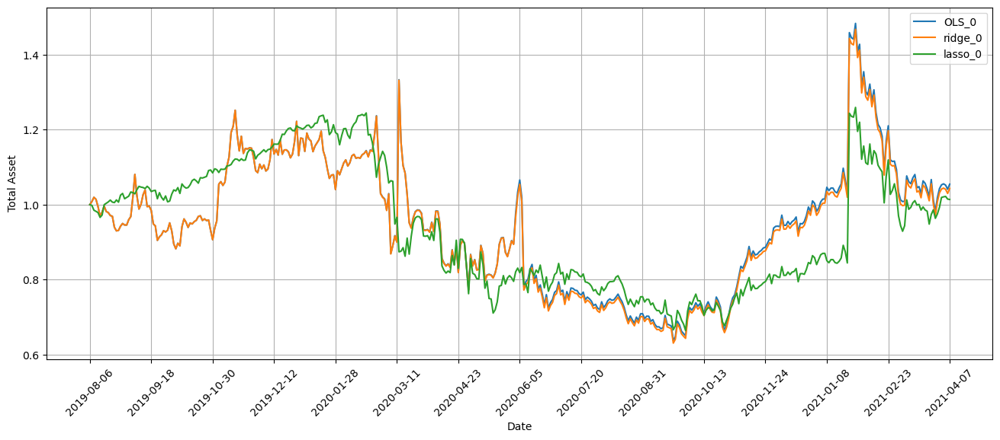

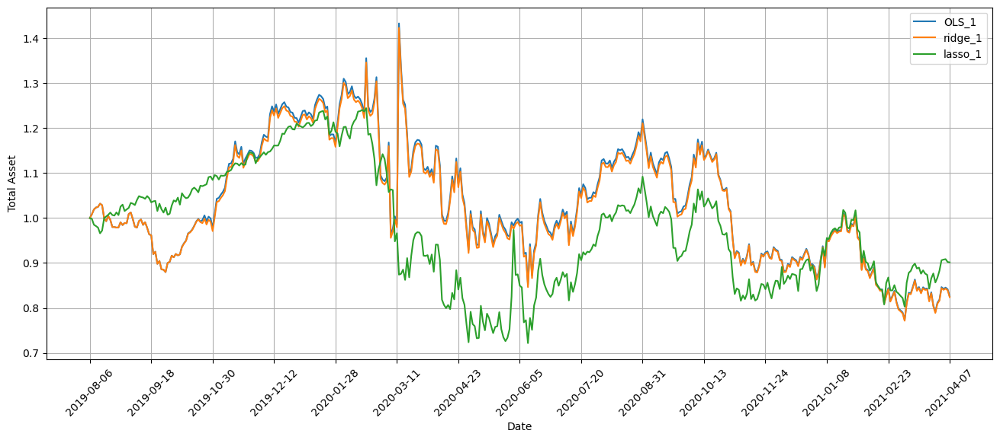

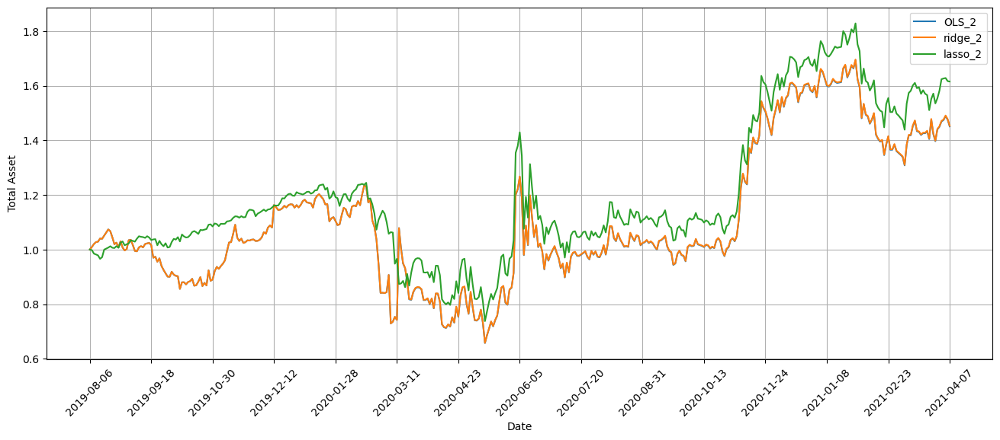

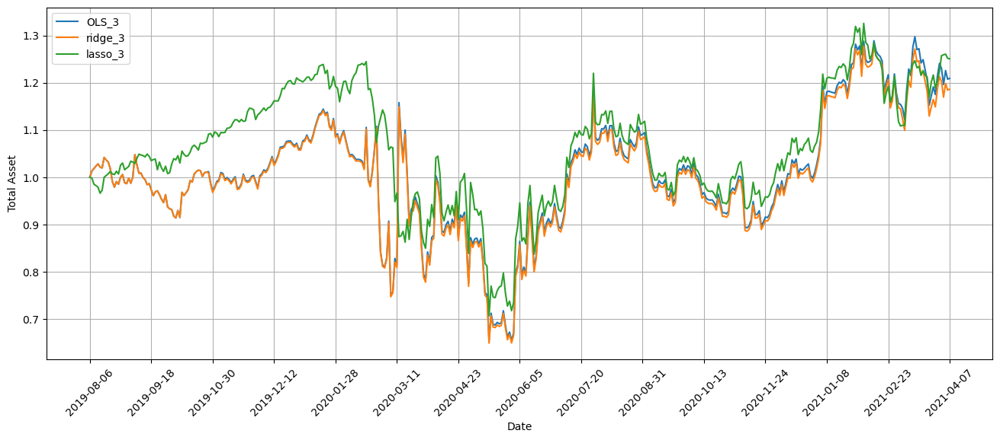

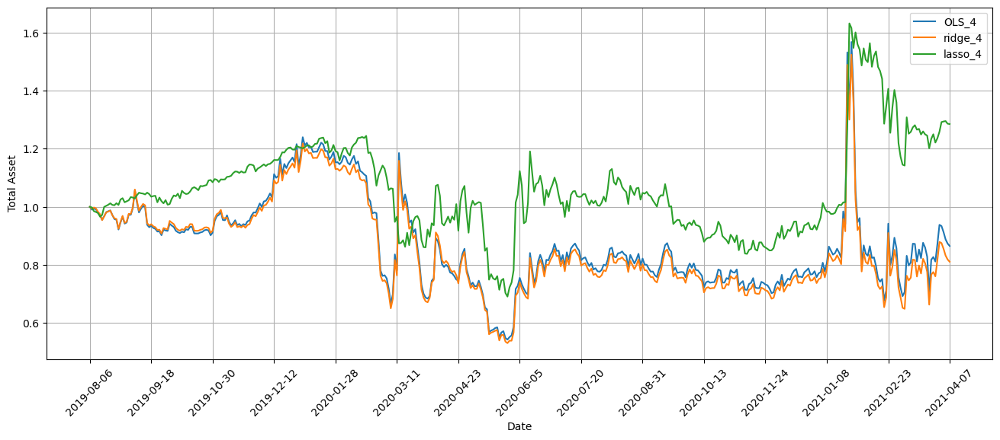

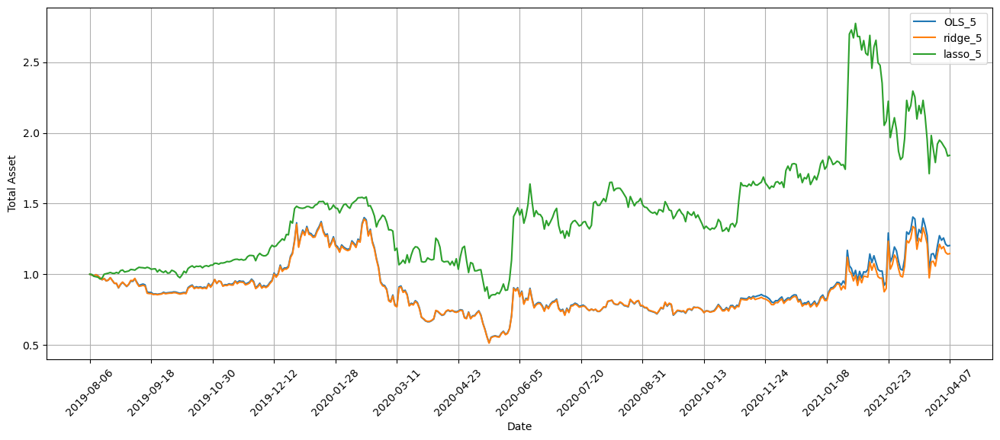

Running 22 of 67 iterations. First iteration already finished
Standardization data are from 2019-09-05 to 2020-06-19
Training data are from 2020-06-22 to 2021-04-07
Testing data are from 2021-03-11 to 2021-05-05
top_stocks by OLS factors 0 to buy on 2021-04-09 are ['BOIL', 'SOXS', 'DNN', 'ARKK', 'MSTR', 'BOX', 'CXW', 'GEO', 'GEVO', 'AHT']
Total asset on 2021-04-12 will be 1.0446558438367766
It should be the same as 1.0446558438367854
top_stocks by OLS factors 0 to buy on 2021-04-12 are ['UCTT', 'CENN', 'JKS', 'CXW', 'WDFC', 'DNN', 'GEVO', 'GEO', 'IDCC', 'AHT']
Total asset on 2021-04-13 will be 1.0107556431114841
It should be the same as 1.010755643111493
top_stocks by OLS factors 0 to buy on 2021-04-13 are ['CLNE', 'PAVE', 'GEO', 'WDFC', 'SENS', 'KODK', 'DNN', 'GEVO', 'IRTC', 'AHT']
Total asset on 2021-04-14 will be 1.0091424309193322
It should be the same as 1.009142430919341
top_stocks by OLS factors 0 to buy on 2021-04-14 are ['CLNE', 'DNN', 'XSOE', 'WDFC', 'FALN', 'ARKK', 'RILY', '

Total asset on 2021-05-07 will be 0.9063452023862755
It should be the same as 0.9063452023862837
top_stocks by lasso factors 0 to buy on 2021-04-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-12 will be 1.0168509362795044
It should be the same as 1.0168509362795128
top_stocks by lasso factors 0 to buy on 2021-04-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-13 will be 1.0184756407637203
It should be the same as 1.0184756407637285
top_stocks by lasso factors 0 to buy on 2021-04-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-14 will be 1.0198910065818825
It should be the same as 1.0198910065818907
top_stocks by lasso factors 0 to buy on 2021-04-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-15 will be 1.0307416586410125
It should be the same as 1.030741658641

top_stocks by OLS factors 1 to buy on 2021-05-05 are ['CDNS', 'SONY', 'TTWO', 'SSTK', 'RGR', 'TDOC', 'HAE', 'EBS', 'CIEN', 'BAP']
Total asset on 2021-05-06 will be 0.8659740781593879
It should be the same as 0.865974078159395
top_stocks by OLS factors 1 to buy on 2021-05-06 are ['SSTK', 'AAON', 'INO', 'FORM', 'HAE', 'SONY', 'CIEN', 'TDOC', 'BAP', 'EBS']
Total asset on 2021-05-07 will be 0.8753245128790369
It should be the same as 0.8753245128790437
top_stocks by ridge factors 1 to buy on 2021-04-09 are ['GDS', 'RGNX', 'WTM', 'WBD', 'JEF', 'PBH', 'EDU', 'VIPS', 'TAL', 'AMCX']
Total asset on 2021-04-12 will be 0.8241572401724391
It should be the same as 0.8241572401724409
top_stocks by ridge factors 1 to buy on 2021-04-12 are ['AHT', 'JEF', 'CWEB', 'TAK', 'CODX', 'EDU', 'TAL', 'WBD', 'VIPS', 'AMCX']
Total asset on 2021-04-13 will be 0.8073763733451831
It should be the same as 0.807376373345185
top_stocks by ridge factors 1 to buy on 2021-04-13 are ['SAVA', 'INO', 'EBS', 'EDU', 'TAK', 'GD

Total asset on 2021-05-06 will be 0.9219832163425007
It should be the same as 0.9219832163425126
top_stocks by lasso factors 1 to buy on 2021-05-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-07 will be 0.9345911840107893
It should be the same as 0.9345911840108013
top_stocks by OLS factors 2 to buy on 2021-04-09 are ['TAK', 'GEVO', 'PLUG', 'MSTR', 'ZTO', 'NTLA', 'DQ', 'CXW', 'AVAV', 'GEO']
Total asset on 2021-04-12 will be 1.4512358655624564
It should be the same as 1.4512358655624698
top_stocks by OLS factors 2 to buy on 2021-04-12 are ['DDD', 'DQ', 'RIOT', 'PSMT', 'JKS', 'IONS', 'GME', 'WDFC', 'CXW', 'GEO']
Total asset on 2021-04-13 will be 1.4270559813674986
It should be the same as 1.4270559813675117
top_stocks by OLS factors 2 to buy on 2021-04-13 are ['RUN', 'CSIQ', 'VIPS', 'NTLA', 'CLNE', 'CXW', 'GEO', 'GME', 'WDFC', 'IRTC']
Total asset on 2021-04-14 will be 1.4551427557649013
It should be the same as 1.4551427557649144


Total asset on 2021-05-06 will be 1.3964276597270486
It should be the same as 1.3964276597270588
top_stocks by ridge factors 2 to buy on 2021-05-06 are ['FSLR', 'STX', 'PACB', 'CIG', 'GME', 'SEDG', 'IPGP', 'BLDP', 'ESPR', 'MRCY']
Total asset on 2021-05-07 will be 1.4328652389941154
It should be the same as 1.4328652389941257
top_stocks by lasso factors 2 to buy on 2021-04-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-12 will be 1.6201311108963756
It should be the same as 1.6201311108963885
top_stocks by lasso factors 2 to buy on 2021-04-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-13 will be 1.6227197246124838
It should be the same as 1.6227197246124971
top_stocks by lasso factors 2 to buy on 2021-04-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-14 will be 1.624974802631779
It should be the same as 1.6249748026

Total asset on 2021-05-05 will be 1.3131638747343553
It should be the same as 1.313163874734367
top_stocks by OLS factors 3 to buy on 2021-05-05 are ['STRA', 'UMC', 'EBAY', 'GSAT', 'PI', 'AZPN', 'WOLF', 'CRUS', 'AMGN', 'FORM']
Total asset on 2021-05-06 will be 1.3025173050315566
It should be the same as 1.302517305031568
top_stocks by OLS factors 3 to buy on 2021-05-06 are ['NOW', 'HOLX', 'WOLF', 'TAL', 'RMD', 'EBAY', 'AZPN', 'CRUS', 'UMC', 'FORM']
Total asset on 2021-05-07 will be 1.3266799942548626
It should be the same as 1.3266799942548744
top_stocks by ridge factors 3 to buy on 2021-04-09 are ['SQQQ', 'LABD', 'QID', 'SOXS', 'PSQ', 'CHTR', 'ZLAB', 'UI', 'EBS', 'PRG']
Total asset on 2021-04-12 will be 1.1896124935244845
It should be the same as 1.1896124935244938
top_stocks by ridge factors 3 to buy on 2021-04-12 are ['DQ', 'MCHI', 'PFSI', 'NTES', 'GEVO', 'TAK', 'JD', 'CENX', 'RYTM', 'GEO']
Total asset on 2021-04-13 will be 1.172890271306036
It should be the same as 1.17289027130604

Total asset on 2021-04-30 will be 1.2892166421239684
It should be the same as 1.289216642123978
top_stocks by lasso factors 3 to buy on 2021-04-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-03 will be 1.3023239041032235
It should be the same as 1.3023239041032335
top_stocks by lasso factors 3 to buy on 2021-05-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-04 will be 1.2861092913966907
It should be the same as 1.2861092913967007
top_stocks by lasso factors 3 to buy on 2021-05-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-05 will be 1.2913421760022132
It should be the same as 1.2913421760022232
top_stocks by lasso factors 3 to buy on 2021-05-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-06 will be 1.2789684992741106
It should be the same as 1.2789684992741

Total asset on 2021-04-27 will be 0.9223116857481838
It should be the same as 0.9223116857481904
top_stocks by ridge factors 4 to buy on 2021-04-27 are ['DNN', 'AHT', 'PACB', 'GEVO', 'VUZI', 'GSAT', 'RIOT', 'MVIS', 'MARA', 'GME']
Total asset on 2021-04-28 will be 0.839856982748153
It should be the same as 0.8398569827481599
top_stocks by ridge factors 4 to buy on 2021-04-28 are ['CROX', 'GSAT', 'AHT', 'AMKR', 'GEVO', 'VXRT', 'RIOT', 'VUZI', 'GME', 'MARA']
Total asset on 2021-04-29 will be 0.9101041468710352
It should be the same as 0.910104146871042
top_stocks by ridge factors 4 to buy on 2021-04-29 are ['DNN', 'UEC', 'VUZI', 'PBI', 'NXE', 'BLNK', 'GME', 'RIOT', 'AHT', 'MARA']
Total asset on 2021-04-30 will be 0.8621749721221388
It should be the same as 0.8621749721221456
top_stocks by ridge factors 4 to buy on 2021-04-30 are ['NXE', 'LC', 'GEVO', 'VUZI', 'APPS', 'PI', 'FORM', 'AHT', 'RIOT', 'MARA']
Total asset on 2021-05-03 will be 0.9173415959887047
It should be the same as 0.9173415

Total asset on 2021-04-22 will be 1.098527733664111
It should be the same as 1.0985277336641135
top_stocks by OLS factors 5 to buy on 2021-04-22 are ['FCEL', 'SAVA', 'PACB', 'PLUG', 'APPS', 'MVIS', 'GEVO', 'RIOT', 'MARA', 'GME']
Total asset on 2021-04-23 will be 1.0448681647078915
It should be the same as 1.044868164707894
top_stocks by OLS factors 5 to buy on 2021-04-23 are ['VUZI', 'CLNE', 'FCEL', 'PACB', 'APPS', 'MVIS', 'RIOT', 'GEVO', 'MARA', 'GME']
Total asset on 2021-04-26 will be 1.1872676178959032
It should be the same as 1.1872676178959058
top_stocks by OLS factors 5 to buy on 2021-04-26 are ['AHT', 'KODK', 'PACB', 'SAVA', 'FCEL', 'RIOT', 'GEVO', 'MVIS', 'MARA', 'GME']
Total asset on 2021-04-27 will be 1.3169394776911387
It should be the same as 1.3169394776911416
top_stocks by OLS factors 5 to buy on 2021-04-27 are ['CLF', 'APPS', 'VUZI', 'KODK', 'GSAT', 'PACB', 'GEVO', 'MVIS', 'MARA', 'GME']
Total asset on 2021-04-28 will be 1.1982567358647183
It should be the same as 1.1982

top_stocks by lasso factors 5 to buy on 2021-04-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-22 will be 1.9215223677973672
It should be the same as 1.9215223677973765
top_stocks by lasso factors 5 to buy on 2021-04-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-23 will be 1.9175651802821638
It should be the same as 1.9175651802821736
top_stocks by lasso factors 5 to buy on 2021-04-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-26 will be 1.940969390057715
It should be the same as 1.9409693900577252
top_stocks by lasso factors 5 to buy on 2021-04-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-04-27 will be 1.9529229582518397
It should be the same as 1.95292295825185
top_stocks by lasso factors 5 to buy on 2021-04-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FO

Total asset on 2021-05-13 will be 0.8959788511407439
It should be the same as 0.895978851140752
top_stocks by ridge factors 0 to buy on 2021-05-13 are ['SQQQ', 'DNN', 'ARKG', 'UVXY', 'LABD', 'QYLD', 'UMC', 'ARKK', 'SOXS', 'AHT']
Total asset on 2021-05-14 will be 0.8778255056509868
It should be the same as 0.877825505650995
top_stocks by ridge factors 0 to buy on 2021-05-14 are ['EXPRQ', 'ARKG', 'MSTR', 'AMC', 'SOXS', 'ARKK', 'NSA', 'CRL', 'VTNR', 'AHT']
Total asset on 2021-05-17 will be 0.8913605664026367
It should be the same as 0.8913605664026447
top_stocks by ridge factors 0 to buy on 2021-05-17 are ['MSTR', 'COPX', 'VTNR', 'AMC', 'LABD', 'AZPN', 'SOXS', 'ARKK', 'AVNS', 'AHT']
Total asset on 2021-05-18 will be 0.9146437459757198
It should be the same as 0.914643745975728
top_stocks by ridge factors 0 to buy on 2021-05-18 are ['DNN', 'URA', 'KOLD', 'UMC', 'MSTR', 'ARKK', 'SOXS', 'WBD', 'BTU', 'AHT']
Total asset on 2021-05-19 will be 0.8751359348160612
It should be the same as 0.87513

Total asset on 2021-05-10 will be 0.8714195682646599
It should be the same as 0.8714195682646665
top_stocks by OLS factors 1 to buy on 2021-05-10 are ['NRG', 'OTEX', 'SSTK', 'SONY', 'EBS', 'MNST', 'AAON', 'MKTX', 'CNNE', 'TDOC']
Total asset on 2021-05-11 will be 0.8340115886004049
It should be the same as 0.8340115886004115
top_stocks by OLS factors 1 to buy on 2021-05-11 are ['FORM', 'TYL', 'NRG', 'CMG', 'NFLX', 'SSTK', 'CNNE', 'VIRT', 'TDOC', 'MKTX']
Total asset on 2021-05-12 will be 0.8432170345152696
It should be the same as 0.8432170345152762
top_stocks by OLS factors 1 to buy on 2021-05-12 are ['CMG', 'CDNS', 'ADBE', 'TYL', 'TAL', 'VIRT', 'NEE', 'CNNE', 'MKTX', 'TDOC']
Total asset on 2021-05-13 will be 0.8367382828452334
It should be the same as 0.8367382828452402
top_stocks by OLS factors 1 to buy on 2021-05-13 are ['MASI', 'RGEN', 'ERIE', 'CWEN', 'FORM', 'TYL', 'TGNA', 'TDOC', 'CNNE', 'TAL']
Total asset on 2021-05-14 will be 0.8299159037685363
It should be the same as 0.8299159

top_stocks by ridge factors 1 to buy on 2021-06-02 are ['HUM', 'TREX', 'DG', 'ENR', 'TVTX', 'DLTR', 'ABT', 'EDU', 'TAL', 'CLX']
Total asset on 2021-06-03 will be 0.8468427860832499
It should be the same as 0.8468427860832528
top_stocks by ridge factors 1 to buy on 2021-06-03 are ['ATHM', 'DLTR', 'MDGL', 'SQM', 'BALL', 'TVTX', 'ABT', 'EDU', 'TAL', 'CLX']
Total asset on 2021-06-04 will be 0.8369042954863756
It should be the same as 0.8369042954863785
top_stocks by ridge factors 1 to buy on 2021-06-04 are ['ATHM', 'DLTR', 'CHGG', 'BALL', 'ABT', 'MDGL', 'TVTX', 'UTHR', 'EDU', 'TAL']
Total asset on 2021-06-07 will be 0.8222582609946908
It should be the same as 0.8222582609946936
top_stocks by lasso factors 1 to buy on 2021-05-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-10 will be 0.9432994921081956
It should be the same as 0.9432994921082075
top_stocks by lasso factors 1 to buy on 2021-05-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF'

top_stocks by OLS factors 2 to buy on 2021-06-02 are ['SH', 'SPDN', 'DOG', 'TWM', 'YANG', 'GRFS', 'EQC', 'RWM', 'STRA', 'UUP']
Total asset on 2021-06-03 will be 1.4492081991422492
It should be the same as 1.4492081991422634
top_stocks by OLS factors 2 to buy on 2021-06-03 are ['SH', 'TWM', 'DOG', 'STRA', 'GLPG', 'RWM', 'YANG', 'UUP', 'GRFS', 'IRTC']
Total asset on 2021-06-04 will be 1.442558167349712
It should be the same as 1.442558167349726
top_stocks by OLS factors 2 to buy on 2021-06-04 are ['GRFS', 'YANG', 'ASND', 'ENTA', 'QDEL', 'GLPG', 'IONS', 'STRA', 'UUP', 'IRTC']
Total asset on 2021-06-07 will be 1.4444357807747317
It should be the same as 1.4444357807747457
top_stocks by ridge factors 2 to buy on 2021-05-07 are ['ADUS', 'VRSK', 'UUP', 'CYBR', 'IONS', 'EQC', 'LOPE', 'BLDP', 'ESPR', 'MRCY']
Total asset on 2021-05-10 will be 1.458767570638828
It should be the same as 1.458767570638838
top_stocks by ridge factors 2 to buy on 2021-05-10 are ['BDX', 'STRA', 'RGEN', 'CYBR', 'UUP', 

Total asset on 2021-06-03 will be 1.664597040171819
It should be the same as 1.6645970401718344
top_stocks by lasso factors 2 to buy on 2021-06-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-04 will be 1.6700737132800554
It should be the same as 1.6700737132800705
top_stocks by lasso factors 2 to buy on 2021-06-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-07 will be 1.6720462693091342
It should be the same as 1.6720462693091493
top_stocks by OLS factors 3 to buy on 2021-05-07 are ['MPWR', 'AMED', 'LITE', 'PBI', 'SWKS', 'PACB', 'IRBT', 'BLDP', 'FSLR', 'CRUS']
Total asset on 2021-05-10 will be 1.3173284732459838
It should be the same as 1.317328473245996
top_stocks by OLS factors 3 to buy on 2021-05-10 are ['RGEN', 'FSLR', 'CVI', 'CIG', 'STX', 'SEDG', 'BLDP', 'IPGP', 'ESPR', 'MRCY']
Total asset on 2021-05-11 will be 1.2211599532034894
It should be the same as 1.2211599532

Total asset on 2021-06-02 will be 1.29571030596295
It should be the same as 1.2957103059629622
top_stocks by ridge factors 3 to buy on 2021-06-02 are ['SBLK', 'ROL', 'CCK', 'GOGL', 'EXEL', 'COR', 'AMGN', 'VKTX', 'TVTX', 'MDGL']
Total asset on 2021-06-03 will be 1.2728743219632221
It should be the same as 1.272874321963234
top_stocks by ridge factors 3 to buy on 2021-06-03 are ['DLTR', 'MRK', 'BALL', 'CCK', 'OKTA', 'AMGN', 'SBLK', 'PCRX', 'MDGL', 'TVTX']
Total asset on 2021-06-04 will be 1.2778082402990676
It should be the same as 1.27780824029908
top_stocks by ridge factors 3 to buy on 2021-06-04 are ['AZPN', 'HPQ', 'SAM', 'MDGL', 'GRFS', 'PCRX', 'YY', 'DLTR', 'OKTA', 'ABT']
Total asset on 2021-06-07 will be 1.2763784207380435
It should be the same as 1.276378420738056
top_stocks by lasso factors 3 to buy on 2021-05-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-05-10 will be 1.3085382839978663
It should be the same as 1.3085382839

Total asset on 2021-05-27 will be 0.9082730022001018
It should be the same as 0.908273002200113
top_stocks by OLS factors 4 to buy on 2021-05-27 are ['DY', 'TVTX', 'IUSB', 'OMI', 'AMC', 'VTNR', 'COMT', 'EXPRQ', 'MARA', 'AHT']
Total asset on 2021-05-28 will be 1.034097182831102
It should be the same as 1.0340971828311134
top_stocks by OLS factors 4 to buy on 2021-05-28 are ['SOXS', 'DBA', 'LNTH', 'IONS', 'OGE', 'EXPRQ', 'DNN', 'AHT', 'AMC', 'VTNR']
Total asset on 2021-06-01 will be 1.0821294823492125
It should be the same as 1.0821294823492238
top_stocks by OLS factors 4 to buy on 2021-06-01 are ['LABD', 'SBLK', 'RPV', 'DNN', 'VONV', 'EXPRQ', 'BB', 'AMC', 'AHT', 'VTNR']
Total asset on 2021-06-02 will be 1.154262629604148
It should be the same as 1.154262629604159
top_stocks by OLS factors 4 to buy on 2021-06-02 are ['ARCB', 'CROX', 'NUE', 'LABD', 'BB', 'DRIP', 'AMC', 'SOXS', 'AHT', 'VTNR']
Total asset on 2021-06-03 will be 1.315049014757638
It should be the same as 1.3150490147576486
to

Total asset on 2021-05-21 will be 1.2604789574292359
It should be the same as 1.2604789574292488
top_stocks by lasso factors 4 to buy on 2021-05-21 are ['LAD', 'LABD', 'ARKK', 'IOVA', 'RIOT', 'MSTR', 'SOXS', 'AEHR', 'MARA', 'AHT']
Total asset on 2021-05-24 will be 1.2417012194460813
It should be the same as 1.241701219446094
top_stocks by lasso factors 4 to buy on 2021-05-24 are ['DNN', 'LABD', 'LAD', 'BRFS', 'ARKK', 'RIOT', 'MSTR', 'SOXS', 'MARA', 'AHT']
Total asset on 2021-05-25 will be 1.2602011761409948
It should be the same as 1.2602011761410075
top_stocks by lasso factors 4 to buy on 2021-05-25 are ['KODK', 'AMC', 'ARKK', 'EDU', 'TAL', 'SOXS', 'MSTR', 'RIOT', 'MARA', 'AHT']
Total asset on 2021-05-26 will be 1.346613260949075
It should be the same as 1.3466132609490875
top_stocks by lasso factors 4 to buy on 2021-05-26 are ['ARKK', 'EDU', 'TAL', 'MSTR', 'FALN', 'AMC', 'SOXS', 'MARA', 'GME', 'AHT']
Total asset on 2021-05-27 will be 1.377354743970486
It should be the same as 1.37735

Total asset on 2021-05-19 will be 1.0052612025090246
It should be the same as 1.0052612025090368
top_stocks by ridge factors 5 to buy on 2021-05-19 are ['LABD', 'SE', 'MSTR', 'RIOT', 'ARKK', 'GEVO', 'BTU', 'PACB', 'AHT', 'MARA']
Total asset on 2021-05-20 will be 1.0754087960670577
It should be the same as 1.0754087960670697
top_stocks by ridge factors 5 to buy on 2021-05-20 are ['EPP', 'RIOT', 'ARKK', 'AEHR', 'PACB', 'IOVA', 'SOXS', 'MSTR', 'AHT', 'MARA']
Total asset on 2021-05-21 will be 1.071616862793036
It should be the same as 1.0716168627930482
top_stocks by ridge factors 5 to buy on 2021-05-21 are ['GOGL', 'SBLK', 'PACB', 'RIOT', 'IOVA', 'SOXS', 'AEHR', 'MSTR', 'AHT', 'MARA']
Total asset on 2021-05-24 will be 1.0564842807251948
It should be the same as 1.056484280725207
top_stocks by ridge factors 5 to buy on 2021-05-24 are ['GEVO', 'LC', 'BTU', 'VFC', 'RIOT', 'LAD', 'SOXS', 'MSTR', 'AHT', 'MARA']
Total asset on 2021-05-25 will be 1.0587216248746325
It should be the same as 1.058

top_stocks by OLS factors 0 to buy on 2021-06-07 are ['ANY', 'TAL', 'CENN', 'DNN', 'SOXS', 'AMC', 'VTNR', 'BB', 'SENS', 'AHT']
Total asset on 2021-06-08 will be 1.3311126822563741
It should be the same as 1.331112682256383
top_stocks by OLS factors 0 to buy on 2021-06-08 are ['TAL', 'EXPRQ', 'XSOE', 'SOXS', 'SENS', 'DNN', 'AMC', 'LABD', 'BB', 'AHT']
Total asset on 2021-06-09 will be 1.3541105041745458
It should be the same as 1.354110504174555
top_stocks by OLS factors 0 to buy on 2021-06-09 are ['MSTR', 'SOXS', 'VTNR', 'AMC', 'HBAN', 'LABD', 'SENS', 'WEN', 'BB', 'AHT']
Total asset on 2021-06-10 will be 1.303443083465134
It should be the same as 1.3034430834651434
top_stocks by OLS factors 0 to buy on 2021-06-10 are ['SENS', 'AMC', 'DNN', 'ANY', 'CLNE', 'MSTR', 'LABD', 'BB', 'GEO', 'AHT']
Total asset on 2021-06-11 will be 1.277189532153153
It should be the same as 1.2771895321531623
top_stocks by OLS factors 0 to buy on 2021-06-11 are ['BB', 'GEO', 'AMC', 'SOXS', 'LABD', 'VTNR', 'SENS'

top_stocks by lasso factors 0 to buy on 2021-06-07 are ['EXPRQ', 'ANY', 'CENN', 'DNN', 'SOXS', 'VTNR', 'AMC', 'BB', 'SENS', 'AHT']
Total asset on 2021-06-08 will be 1.5711101927122548
It should be the same as 1.5711101927122617
top_stocks by lasso factors 0 to buy on 2021-06-08 are ['VTNR', 'EXPRQ', 'XSOE', 'SOXS', 'SENS', 'DNN', 'LABD', 'AMC', 'BB', 'AHT']
Total asset on 2021-06-09 will be 1.5919518044447354
It should be the same as 1.591951804444743
top_stocks by lasso factors 0 to buy on 2021-06-09 are ['DNN', 'SOXS', 'VTNR', 'AMC', 'LABD', 'HBAN', 'SENS', 'WEN', 'BB', 'AHT']
Total asset on 2021-06-10 will be 1.5206153354977956
It should be the same as 1.5206153354978031
top_stocks by lasso factors 0 to buy on 2021-06-10 are ['SENS', 'AMC', 'DNN', 'ANY', 'MSTR', 'LABD', 'BB', 'CLNE', 'GEO', 'AHT']
Total asset on 2021-06-11 will be 1.4796993409701473
It should be the same as 1.4796993409701544
top_stocks by lasso factors 0 to buy on 2021-06-11 are ['BB', 'GEO', 'AMC', 'LABD', 'SOXS',

Total asset on 2021-07-02 will be 0.9409159988415544
It should be the same as 0.9409159988415623
top_stocks by OLS factors 1 to buy on 2021-07-02 are ['TTMI', 'IAG', 'KGC', 'NG', 'FSM', 'NEM', 'MRIN', 'PHG', 'IDCC', 'BTG']
Total asset on 2021-07-06 will be 0.9997140357562762
It should be the same as 0.9997140357562839
top_stocks by ridge factors 1 to buy on 2021-06-07 are ['TVTX', 'BLDR', 'HZO', 'AZO', 'FCN', 'MAS', 'KMPR', 'CLX', 'MOH', 'KMB']
Total asset on 2021-06-08 will be 0.8179523605541037
It should be the same as 0.8179523605541066
top_stocks by ridge factors 1 to buy on 2021-06-08 are ['HZO', 'HUM', 'TREX', 'PPC', 'T', 'TVTX', 'UTHR', 'ABT', 'TJX', 'MDGL']
Total asset on 2021-06-09 will be 0.8147893253536361
It should be the same as 0.814789325353639
top_stocks by ridge factors 1 to buy on 2021-06-09 are ['TVTX', 'KMPR', 'HZO', 'MDGL', 'BLDR', 'BTG', 'UTHR', 'TJX', 'MOH', 'LMBS']
Total asset on 2021-06-10 will be 0.8197253430488809
It should be the same as 0.8197253430488839
t

top_stocks by lasso factors 1 to buy on 2021-06-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-01 will be 0.9437827951107227
It should be the same as 0.9437827951107353
top_stocks by lasso factors 1 to buy on 2021-07-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-02 will be 0.9472819583963988
It should be the same as 0.9472819583964115
top_stocks by lasso factors 1 to buy on 2021-07-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-06 will be 0.9461584443845186
It should be the same as 0.9461584443845312
top_stocks by OLS factors 2 to buy on 2021-06-07 are ['PRGO', 'RWM', 'DOG', 'SPDN', 'SH', 'IONS', 'STRA', 'GLPG', 'UUP', 'EQC']
Total asset on 2021-06-08 will be 1.4551000289649476
It should be the same as 1.4551000289649616
top_stocks by OLS factors 2 to buy on 2021-06-08 are ['PRGO', 'RWM', 'IONS', 'DOG', 'SPDN', 'S

Total asset on 2021-06-30 will be 1.4933382902689214
It should be the same as 1.4933382902689316
top_stocks by ridge factors 2 to buy on 2021-06-30 are ['IONS', 'DXD', 'RWM', 'DOG', 'SPDN', 'SH', 'GLPG', 'UUP', 'STRA', 'EQC']
Total asset on 2021-07-01 will be 1.489550470596612
It should be the same as 1.4895504705966223
top_stocks by ridge factors 2 to buy on 2021-07-01 are ['DXD', 'RWM', 'GEO', 'DOG', 'SPDN', 'SH', 'GLPG', 'UUP', 'STRA', 'EQC']
Total asset on 2021-07-02 will be 1.4905812628829724
It should be the same as 1.4905812628829829
top_stocks by ridge factors 2 to buy on 2021-07-02 are ['GEO', 'IONS', 'RWM', 'DOG', 'SPDN', 'SH', 'GLPG', 'UUP', 'STRA', 'EQC']
Total asset on 2021-07-06 will be 1.4779564840478812
It should be the same as 1.4779564840478916
top_stocks by lasso factors 2 to buy on 2021-06-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-08 will be 1.6905275737006988
It should be the same as 1.690527573700714
t

top_stocks by OLS factors 3 to buy on 2021-06-29 are ['FSLR', 'KFY', 'EXPRQ', 'TDC', 'SWBI', 'GSAT', 'NTLA', 'SSYS', 'DDD', 'MRIN']
Total asset on 2021-06-30 will be 1.419462210448277
It should be the same as 1.41946221044829
top_stocks by OLS factors 3 to buy on 2021-06-30 are ['MSTR', 'NTLA', 'TAL', 'RAMP', 'TDC', 'SSYS', 'TTD', 'NKE', 'DDD', 'MRIN']
Total asset on 2021-07-01 will be 1.3990164397264022
It should be the same as 1.3990164397264147
top_stocks by OLS factors 3 to buy on 2021-07-01 are ['EXPRQ', 'TAL', 'TTD', 'JKS', 'KLIC', 'NKE', 'EDIT', 'VTNR', 'NTLA', 'MRIN']
Total asset on 2021-07-02 will be 1.6056134968807831
It should be the same as 1.6056134968807958
top_stocks by OLS factors 3 to buy on 2021-07-02 are ['VTNR', 'DQ', 'CSIQ', 'NKE', 'EDIT', 'MSTR', 'XELA', 'JKS', 'NTLA', 'MRIN']
Total asset on 2021-07-06 will be 1.7017714892082436
It should be the same as 1.7017714892082563
top_stocks by ridge factors 3 to buy on 2021-06-07 are ['DBA', 'ABEV', 'CXW', 'AEHR', 'AHT', 

Total asset on 2021-06-24 will be 1.29102328816478
It should be the same as 1.2910232881647914
top_stocks by lasso factors 3 to buy on 2021-06-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-25 will be 1.3015528615094685
It should be the same as 1.3015528615094796
top_stocks by lasso factors 3 to buy on 2021-06-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-28 will be 1.3147557222956185
It should be the same as 1.3147557222956296
top_stocks by lasso factors 3 to buy on 2021-06-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-29 will be 1.309663303919275
It should be the same as 1.3096633039192866
top_stocks by lasso factors 3 to buy on 2021-06-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-06-30 will be 1.301984776751711
It should be the same as 1.301984776751722


Total asset on 2021-06-23 will be 1.0887042074661195
It should be the same as 1.088704207466127
top_stocks by ridge factors 4 to buy on 2021-06-23 are ['KFY', 'EXPRQ', 'SBLK', 'VTNR', 'BB', 'SSYS', 'GSAT', 'GME', 'DDD', 'AHT']
Total asset on 2021-06-24 will be 1.0948473576587319
It should be the same as 1.0948473576587396
top_stocks by ridge factors 4 to buy on 2021-06-24 are ['SSYS', 'UVXY', 'ARCB', 'LABD', 'DDD', 'BB', 'GEO', 'MRIN', 'AHT', 'VTNR']
Total asset on 2021-06-25 will be 1.1027363310819216
It should be the same as 1.1027363310819296
top_stocks by ridge factors 4 to buy on 2021-06-25 are ['CRTO', 'LMBS', 'SOXS', 'LABD', 'BB', 'DQ', 'VTNR', 'GME', 'AHT', 'MRIN']
Total asset on 2021-06-28 will be 1.208097373138428
It should be the same as 1.2080973731384363
top_stocks by ridge factors 4 to buy on 2021-06-28 are ['ASB', 'SF', 'EQC', 'WLY', 'CBT', 'VTNR', 'GME', 'AHT', 'MRIN', 'EXPRQ']
Total asset on 2021-06-29 will be 1.3247332891795254
It should be the same as 1.3247332891795

Total asset on 2021-06-18 will be 1.4671169433240843
It should be the same as 1.4671169433240898
top_stocks by OLS factors 5 to buy on 2021-06-18 are ['BTU', 'XME', 'SENS', 'COPX', 'AQN', 'BB', 'EXPRQ', 'AHT', 'AMC', 'VTNR']
Total asset on 2021-06-21 will be 1.4300340468546988
It should be the same as 1.4300340468547041
top_stocks by OLS factors 5 to buy on 2021-06-21 are ['CMP', 'ARCB', 'AQN', 'GEO', 'GEVO', 'BB', 'EXPRQ', 'AMC', 'AHT', 'VTNR']
Total asset on 2021-06-22 will be 1.4187964181939623
It should be the same as 1.4187964181939676
top_stocks by OLS factors 5 to buy on 2021-06-22 are ['ARCB', 'SENS', 'GEO', 'GEVO', 'GSAT', 'BB', 'EXPRQ', 'AMC', 'AHT', 'VTNR']
Total asset on 2021-06-23 will be 1.4770389158228823
It should be the same as 1.4770389158228876
top_stocks by OLS factors 5 to buy on 2021-06-23 are ['GEO', 'SBLK', 'GEVO', 'SENS', 'BB', 'AMC', 'EXPRQ', 'DDD', 'AHT', 'VTNR']
Total asset on 2021-06-24 will be 1.509542465993221
It should be the same as 1.5095424659932268
t

Total asset on 2021-06-17 will be 1.7844317506458618
It should be the same as 1.7844317506458716
top_stocks by lasso factors 5 to buy on 2021-06-17 are ['DDD', 'ANY', 'GEVO', 'MSTR', 'AMC', 'BB', 'SENS', 'AHT', 'EXPRQ', 'VTNR']
Total asset on 2021-06-18 will be 1.7954571210601469
It should be the same as 1.7954571210601566
top_stocks by lasso factors 5 to buy on 2021-06-18 are ['ANY', 'MSTR', 'GEVO', 'AMC', 'BB', 'GME', 'SENS', 'AHT', 'EXPRQ', 'VTNR']
Total asset on 2021-06-21 will be 1.7428464720234378
It should be the same as 1.7428464720234476
top_stocks by lasso factors 5 to buy on 2021-06-21 are ['ANY', 'DDD', 'MSTR', 'GEVO', 'AMC', 'BB', 'SENS', 'AHT', 'EXPRQ', 'VTNR']
Total asset on 2021-06-22 will be 1.7035631857869593
It should be the same as 1.7035631857869697
top_stocks by lasso factors 5 to buy on 2021-06-22 are ['MSTR', 'DDD', 'AVXL', 'GEVO', 'AMC', 'BB', 'SENS', 'AHT', 'EXPRQ', 'VTNR']
Total asset on 2021-06-23 will be 1.8042349035054674
It should be the same as 1.8042349

Total asset on 2021-07-12 will be 1.7474228059082644
It should be the same as 1.7474228059082733
top_stocks by ridge factors 0 to buy on 2021-07-12 are ['LABD', 'UVXY', 'EDU', 'VT', 'SOXS', 'TAL', 'MRIN', 'XELA', 'ANY', 'AHT']
Total asset on 2021-07-13 will be 1.713149381542264
It should be the same as 1.713149381542273
top_stocks by ridge factors 0 to buy on 2021-07-13 are ['SOXS', 'DNN', 'MRIN', 'MSTR', 'VTWO', 'ANY', 'XELA', 'PAVE', 'IAT', 'AHT']
Total asset on 2021-07-14 will be 1.7025419694826034
It should be the same as 1.7025419694826125
top_stocks by ridge factors 0 to buy on 2021-07-14 are ['ANY', 'LABD', 'MSTR', 'UVXY', 'PFFD', 'SOXS', 'MRIN', 'DNN', 'XELA', 'AHT']
Total asset on 2021-07-15 will be 1.5691906815006464
It should be the same as 1.5691906815006562
top_stocks by ridge factors 0 to buy on 2021-07-15 are ['MRIN', 'CMP', 'AMC', 'ARKG', 'UVXY', 'DNN', 'LABD', 'SOXS', 'XELA', 'AHT']
Total asset on 2021-07-16 will be 1.5371199042020514
It should be the same as 1.5371199

Total asset on 2021-07-07 will be 0.9246006555603413
It should be the same as 0.9246006555603492
top_stocks by OLS factors 1 to buy on 2021-07-07 are ['IDCC', 'IAG', 'OUNZ', 'NEM', 'FTS', 'KGC', 'PHYS', 'BTG', 'FSM', 'MRIN']
Total asset on 2021-07-08 will be 0.8843866345343019
It should be the same as 0.8843866345343097
top_stocks by OLS factors 1 to buy on 2021-07-08 are ['KGC', 'FEZ', 'EQC', 'FCFS', 'PUK', 'IDCC', 'FSM', 'FTS', 'BTG', 'MRIN']
Total asset on 2021-07-09 will be 0.9063007140593639
It should be the same as 0.9063007140593717
top_stocks by OLS factors 1 to buy on 2021-07-09 are ['FEZ', 'CXW', 'KOLD', 'PUK', 'IDCC', 'FSM', 'PDCO', 'EQC', 'FTS', 'BTG']
Total asset on 2021-07-12 will be 0.9091684154684015
It should be the same as 0.9091684154684092
top_stocks by OLS factors 1 to buy on 2021-07-12 are ['BUD', 'BTG', 'AVNS', 'FSM', 'AVAV', 'NVCR', 'PDCO', 'IDCC', 'PHG', 'CXW']
Total asset on 2021-07-13 will be 0.9004547707441464
It should be the same as 0.9004547707441541
top_

top_stocks by lasso factors 1 to buy on 2021-07-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-07 will be 0.939739128201337
It should be the same as 0.9397391282013497
top_stocks by lasso factors 1 to buy on 2021-07-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-08 will be 0.9236431655462315
It should be the same as 0.9236431655462443
top_stocks by lasso factors 1 to buy on 2021-07-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-09 will be 0.9338439659244375
It should be the same as 0.9338439659244503
top_stocks by lasso factors 1 to buy on 2021-07-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-12 will be 0.9416268971694532
It should be the same as 0.9416268971694658
top_stocks by lasso factors 1 to buy on 2021-07-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2021-07-30 will be 1.1822869656058648
It should be the same as 1.1822869656058805
top_stocks by OLS factors 2 to buy on 2021-07-30 are ['NYCB', 'TREE', 'GRFS', 'QURE', 'CLS', 'STRA', 'PETS', 'EDU', 'LC', 'TAL']
Total asset on 2021-08-02 will be 1.1924760892725594
It should be the same as 1.1924760892725752
top_stocks by OLS factors 2 to buy on 2021-08-02 are ['AUPH', 'BGNE', 'RGEN', 'GDS', 'TEAM', 'EDU', 'STRA', 'NTES', 'TAL', 'LC']
Total asset on 2021-08-03 will be 1.1826571046171
It should be the same as 1.182657104617116
top_stocks by ridge factors 2 to buy on 2021-07-06 are ['GLPG', 'BTU', 'UUP', 'YANG', 'CTRA', 'IONS', 'ATGE', 'STRA', 'EDIT', 'MRIN']
Total asset on 2021-07-07 will be 1.4039497780943224
It should be the same as 1.4039497780943324
top_stocks by ridge factors 2 to buy on 2021-07-07 are ['GLPG', 'STRA', 'CTRA', 'EQC', 'EDIT', 'YANG', 'ATGE', 'BTU', 'WB', 'MRIN']
Total asset on 2021-07-08 will be 1.3884364746921145
It should be the same as 1.388436474692

Total asset on 2021-07-28 will be 1.6655324389855728
It should be the same as 1.665532438985589
top_stocks by lasso factors 2 to buy on 2021-07-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-29 will be 1.688301374293346
It should be the same as 1.6883013742933621
top_stocks by lasso factors 2 to buy on 2021-07-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-07-30 will be 1.697440805231074
It should be the same as 1.6974408052310903
top_stocks by lasso factors 2 to buy on 2021-07-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-02 will be 1.7102276997673012
It should be the same as 1.7102276997673176
top_stocks by lasso factors 2 to buy on 2021-08-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-03 will be 1.6978693271600438
It should be the same as 1.697869327160060

Total asset on 2021-07-28 will be 1.430746138595414
It should be the same as 1.4307461385954272
top_stocks by ridge factors 3 to buy on 2021-07-28 are ['AON', 'DBA', 'SNAP', 'FFIV', 'RVTY', 'BTU', 'RBC', 'GBTC', 'YANG', 'MSTR']
Total asset on 2021-07-29 will be 1.4197540490262366
It should be the same as 1.41975404902625
top_stocks by ridge factors 3 to buy on 2021-07-29 are ['FFIV', 'RVTY', 'DPZ', 'RGEN', 'STRA', 'GPK', 'CLS', 'AON', 'GBTC', 'MSTR']
Total asset on 2021-07-30 will be 1.4179621430775318
It should be the same as 1.4179621430775449
top_stocks by ridge factors 3 to buy on 2021-07-30 are ['GRFS', 'CLF', 'NYCB', 'GPK', 'RGEN', 'CLS', 'MSTR', 'GBTC', 'AON', 'LC']
Total asset on 2021-08-02 will be 1.4327068197947905
It should be the same as 1.4327068197948032
top_stocks by ridge factors 3 to buy on 2021-08-02 are ['POWI', 'AON', 'GPK', 'RVTY', 'SIMO', 'RGEN', 'ICLR', 'TEAM', 'THRM', 'LC']
Total asset on 2021-08-03 will be 1.4416457417637931
It should be the same as 1.441645741

Total asset on 2021-07-26 will be 1.630046604265975
It should be the same as 1.630046604265987
top_stocks by OLS factors 4 to buy on 2021-07-26 are ['AVXL', 'VTNR', 'RIOT', 'TAL', 'EDU', 'AMC', 'AHT', 'FALN', 'MRIN', 'AEHR']
Total asset on 2021-07-27 will be 1.6426423257239973
It should be the same as 1.6426423257240086
top_stocks by OLS factors 4 to buy on 2021-07-27 are ['EXPRQ', 'DNLI', 'RIOT', 'VTNR', 'DDD', 'FALN', 'AHT', 'AMC', 'MRIN', 'MSTR']
Total asset on 2021-07-28 will be 1.6154205708752216
It should be the same as 1.6154205708752332
top_stocks by OLS factors 4 to buy on 2021-07-28 are ['JKS', 'BTU', 'EDU', 'XELA', 'DDD', 'AMC', 'VTNR', 'AHT', 'MSTR', 'MRIN']
Total asset on 2021-07-29 will be 1.6458283276464623
It should be the same as 1.645828327646474
top_stocks by OLS factors 4 to buy on 2021-07-29 are ['JKS', 'DDD', 'AVXL', 'TAL', 'AMC', 'GNRC', 'ZLAB', 'VTNR', 'AHT', 'MRIN']
Total asset on 2021-07-30 will be 1.5538683950491177
It should be the same as 1.5538683950491292

Total asset on 2021-07-21 will be 2.7989124893373862
It should be the same as 2.798912489337398
top_stocks by lasso factors 4 to buy on 2021-07-21 are ['MSTR', 'UVXY', 'DNN', 'SOXS', 'KIE', 'GME', 'AMC', 'PKW', 'AHT', 'AEHR']
Total asset on 2021-07-22 will be 2.931016058131877
It should be the same as 2.931016058131889
top_stocks by lasso factors 4 to buy on 2021-07-22 are ['DQ', 'NSA', 'SIGA', 'SAVA', 'SOXS', 'MSTR', 'AMC', 'MRIN', 'AHT', 'AEHR']
Total asset on 2021-07-23 will be 2.6923035251170595
It should be the same as 2.6923035251170724
top_stocks by lasso factors 4 to buy on 2021-07-23 are ['ANY', 'UVXY', 'SOXS', 'MSTR', 'NSA', 'MANU', 'AMC', 'DQ', 'AHT', 'AEHR']
Total asset on 2021-07-26 will be 2.698518299090322
It should be the same as 2.698518299090335
top_stocks by lasso factors 4 to buy on 2021-07-26 are ['CWEB', 'AMC', 'IUSB', 'IXN', 'SAM', 'AEHR', 'AHT', 'FALN', 'TAL', 'EDU']
Total asset on 2021-07-27 will be 2.664625553734308
It should be the same as 2.664625553734321
t

Total asset on 2021-07-16 will be 1.9277533736531318
It should be the same as 1.9277533736531427
top_stocks by ridge factors 5 to buy on 2021-07-16 are ['MVIS', 'SENS', 'SOXS', 'AEHR', 'ANY', 'EXPRQ', 'GME', 'AHT', 'AMC', 'VTNR']
Total asset on 2021-07-19 will be 1.9833927859168785
It should be the same as 1.9833927859168898
top_stocks by ridge factors 5 to buy on 2021-07-19 are ['MVIS', 'SOXS', 'SBLK', 'SENS', 'EXPRQ', 'AHT', 'AMC', 'VTNR', 'GME', 'AEHR']
Total asset on 2021-07-20 will be 2.2073389631308884
It should be the same as 2.207338963130899
top_stocks by ridge factors 5 to buy on 2021-07-20 are ['SENS', 'MVIS', 'PACB', 'SOXS', 'EXPRQ', 'GME', 'AMC', 'AHT', 'VTNR', 'AEHR']
Total asset on 2021-07-21 will be 2.1748370901387593
It should be the same as 2.1748370901387695
top_stocks by ridge factors 5 to buy on 2021-07-21 are ['PKW', 'MVIS', 'PACB', 'SOXS', 'EXPRQ', 'AHT', 'VTNR', 'AMC', 'GME', 'AEHR']
Total asset on 2021-07-22 will be 2.3380851399079043
It should be the same as 2

Total asset on 2021-08-09 will be 1.5600903434100644
It should be the same as 1.5600903434100746
top_stocks by OLS factors 0 to buy on 2021-08-09 are ['ITRI', 'NVRO', 'AMED', 'CWEB', 'SBLK', 'UVXY', 'SOXS', 'MSTR', 'AHT', 'ANY']
Total asset on 2021-08-10 will be 1.5449587931144135
It should be the same as 1.5449587931144237
top_stocks by OLS factors 0 to buy on 2021-08-10 are ['CWEB', 'MRIN', 'ASX', 'SOXS', 'MSTR', 'TAL', 'AEHR', 'AXSM', 'AHT', 'ANY']
Total asset on 2021-08-11 will be 1.4987211594784868
It should be the same as 1.4987211594784968
top_stocks by OLS factors 0 to buy on 2021-08-11 are ['AMC', 'SPTL', 'UVXY', 'SOXS', 'PAVE', 'TLH', 'AXSM', 'DDD', 'AHT', 'ANY']
Total asset on 2021-08-12 will be 1.4793856137882329
It should be the same as 1.4793856137882428
top_stocks by OLS factors 0 to buy on 2021-08-12 are ['AXSM', 'XELA', 'UVXY', 'PRGO', 'WW', 'WIX', 'SOXS', 'PAVE', 'ANY', 'AHT']
Total asset on 2021-08-13 will be 1.4575424187746024
It should be the same as 1.457542418774

Total asset on 2021-08-31 will be 1.5403533535999547
It should be the same as 1.5403533535999663
top_stocks by lasso factors 0 to buy on 2021-08-03 are ['CWEB', 'MRIN', 'AEHR', 'UVXY', 'TAL', 'EDU', 'STRA', 'MSTR', 'SOXS', 'AHT']
Total asset on 2021-08-04 will be 1.7774965258408586
It should be the same as 1.7774965258408673
top_stocks by lasso factors 0 to buy on 2021-08-04 are ['MSTR', 'ICLR', 'EDU', 'UVXY', 'XELA', 'ARCT', 'TAL', 'SOXS', 'AHT', 'WKC']
Total asset on 2021-08-05 will be 1.6882662561684076
It should be the same as 1.6882662561684165
top_stocks by lasso factors 0 to buy on 2021-08-05 are ['AMC', 'RPV', 'PAVE', 'EDU', 'UVXY', 'XELA', 'TAL', 'MSTR', 'SOXS', 'AHT']
Total asset on 2021-08-06 will be 1.7278677740161377
It should be the same as 1.7278677740161463
top_stocks by lasso factors 0 to buy on 2021-08-06 are ['MRIN', 'LABD', 'AMC', 'DRIP', 'ITRI', 'MSTR', 'SOXS', 'NVRO', 'AHT', 'BSCO']
Total asset on 2021-08-09 will be 1.771180385803788
It should be the same as 1.771

Total asset on 2021-08-25 will be 0.8249802194359449
It should be the same as 0.8249802194359536
top_stocks by OLS factors 1 to buy on 2021-08-25 are ['RIO', 'BHP', 'NEM', 'FMC', 'QTWO', 'VTR', 'JBGS', 'WIX', 'AMED', 'BAND']
Total asset on 2021-08-26 will be 0.8231148699025496
It should be the same as 0.8231148699025586
top_stocks by OLS factors 1 to buy on 2021-08-26 are ['VTR', 'COR', 'NEM', 'MED', 'AXSM', 'HMC', 'BABA', 'VEEV', 'FIVN', 'BAND']
Total asset on 2021-08-27 will be 0.8075102538077957
It should be the same as 0.8075102538078045
top_stocks by OLS factors 1 to buy on 2021-08-27 are ['NWSA', 'SEM', 'FATE', 'FIVN', 'AXSM', 'DG', 'RDY', 'BABA', 'HMC', 'BAND']
Total asset on 2021-08-30 will be 0.8213154781764082
It should be the same as 0.8213154781764169
top_stocks by OLS factors 1 to buy on 2021-08-30 are ['VTEB', 'APPS', 'FATE', 'XELA', 'MA', 'WU', 'BABA', 'EHTH', 'HMC', 'BAND']
Total asset on 2021-08-31 will be 0.8207774472019548
It should be the same as 0.8207774472019637


Total asset on 2021-08-19 will be 0.9182024512145847
It should be the same as 0.9182024512145973
top_stocks by lasso factors 1 to buy on 2021-08-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-20 will be 0.9190336307628071
It should be the same as 0.9190336307628199
top_stocks by lasso factors 1 to buy on 2021-08-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-23 will be 0.9349456697736982
It should be the same as 0.9349456697737109
top_stocks by lasso factors 1 to buy on 2021-08-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-24 will be 0.9420495519818549
It should be the same as 0.9420495519818677
top_stocks by lasso factors 1 to buy on 2021-08-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-25 will be 0.9424353540046184
It should be the same as 0.942435354004

Total asset on 2021-08-19 will be 1.08297733260894
It should be the same as 1.0829773326089533
top_stocks by ridge factors 2 to buy on 2021-08-19 are ['PRLB', 'IONS', 'BABA', 'GDS', 'VIPS', 'EQC', 'AUPH', 'ATHM', 'TAL', 'EDU']
Total asset on 2021-08-20 will be 1.0688999178118626
It should be the same as 1.0688999178118763
top_stocks by ridge factors 2 to buy on 2021-08-20 are ['STRA', 'GLPG', 'ATHM', 'PRLB', 'GDS', 'BABA', 'IONS', 'AUPH', 'EQC', 'EDU']
Total asset on 2021-08-23 will be 1.0939219681784809
It should be the same as 1.0939219681784949
top_stocks by ridge factors 2 to buy on 2021-08-23 are ['CNNE', 'EHTH', 'BAP', 'BABA', 'BVN', 'KPTI', 'MRCY', 'EQC', 'EDU', 'GLPG']
Total asset on 2021-08-24 will be 1.1300936103182873
It should be the same as 1.1300936103183012
top_stocks by ridge factors 2 to buy on 2021-08-24 are ['EHTH', 'CPB', 'QURE', 'BVN', 'GEO', 'KPTI', 'BABA', 'EQC', 'GLPG', 'EDU']
Total asset on 2021-08-25 will be 1.1446100358340665
It should be the same as 1.144610

Total asset on 2021-08-18 will be 1.3289340716519877
It should be the same as 1.3289340716520017
top_stocks by OLS factors 3 to buy on 2021-08-18 are ['UPBD', 'DIS', 'J', 'COO', 'HAE', 'LBTYK', 'LAAC', 'STLD', 'NUE', 'PPC']
Total asset on 2021-08-19 will be 1.3158476427748302
It should be the same as 1.3158476427748445
top_stocks by OLS factors 3 to buy on 2021-08-19 are ['BHP', 'ENTA', 'AUPH', 'XENE', 'COO', 'TDC', 'EBAY', 'CYBR', 'PPC', 'TVTX']
Total asset on 2021-08-20 will be 1.3202180513219572
It should be the same as 1.3202180513219717
top_stocks by OLS factors 3 to buy on 2021-08-20 are ['PFE', 'TDC', 'MEDP', 'DLB', 'ILMN', 'CYBR', 'COO', 'FLO', 'EBAY', 'PPC']
Total asset on 2021-08-23 will be 1.3356494313327676
It should be the same as 1.335649431332782
top_stocks by OLS factors 3 to buy on 2021-08-23 are ['EXEL', 'CHRS', 'KR', 'STAA', 'NBIX', 'PODD', 'STE', 'PFE', 'FLO', 'TVTX']
Total asset on 2021-08-24 will be 1.3407116375371013
It should be the same as 1.3407116375371155
to

Total asset on 2021-08-13 will be 1.3141461923723012
It should be the same as 1.3141461923723123
top_stocks by lasso factors 3 to buy on 2021-08-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-16 will be 1.3071827853485107
It should be the same as 1.3071827853485218
top_stocks by lasso factors 3 to buy on 2021-08-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-17 will be 1.302717751542148
It should be the same as 1.302717751542159
top_stocks by lasso factors 3 to buy on 2021-08-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-18 will be 1.3008528024727941
It should be the same as 1.300852802472805
top_stocks by lasso factors 3 to buy on 2021-08-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-08-19 will be 1.2737238490288045
It should be the same as 1.273723849028815

Total asset on 2021-08-13 will be 1.40989860169114
It should be the same as 1.4098986016911492
top_stocks by ridge factors 4 to buy on 2021-08-13 are ['CYBR', 'TGTX', 'WIX', 'SENS', 'DDS', 'SAVA', 'AVXL', 'VTNR', 'AMC', 'MRIN']
Total asset on 2021-08-16 will be 1.39351201001566
It should be the same as 1.393512010015669
top_stocks by ridge factors 4 to buy on 2021-08-16 are ['KTOS', 'CYBR', 'JKS', 'BAP', 'EBAY', 'ANY', 'AVXL', 'AMC', 'VTNR', 'MRIN']
Total asset on 2021-08-17 will be 1.3702851754330403
It should be the same as 1.3702851754330496
top_stocks by ridge factors 4 to buy on 2021-08-17 are ['ROKU', 'SOXS', 'SNAP', 'BTU', 'VUZI', 'VTNR', 'AN', 'AMC', 'MRIN', 'TVTX']
Total asset on 2021-08-18 will be 1.3911843734200349
It should be the same as 1.3911843734200442
top_stocks by ridge factors 4 to buy on 2021-08-18 are ['PINC', 'COPX', 'UVXY', 'SID', 'VUZI', 'BHP', 'VTNR', 'SOXS', 'AMC', 'MRIN']
Total asset on 2021-08-19 will be 1.4011702697209536
It should be the same as 1.4011702

Total asset on 2021-08-09 will be 2.33284931832725
It should be the same as 2.3328493183272596
top_stocks by OLS factors 5 to buy on 2021-08-09 are ['INGN', 'AMC', 'EDU', 'NVRO', 'AMED', 'VTNR', 'TAL', 'AEHR', 'MRIN', 'ANY']
Total asset on 2021-08-10 will be 2.4018757973041427
It should be the same as 2.401875797304152
top_stocks by OLS factors 5 to buy on 2021-08-10 are ['GPRE', 'EDU', 'MED', 'AXSM', 'AMC', 'TAL', 'VTNR', 'AEHR', 'MRIN', 'ANY']
Total asset on 2021-08-11 will be 2.303562810609659
It should be the same as 2.303562810609668
top_stocks by OLS factors 5 to buy on 2021-08-11 are ['VUZI', 'ARCT', 'RCKT', 'AXSM', 'TAL', 'AEHR', 'VTNR', 'AMC', 'DDD', 'MRIN']
Total asset on 2021-08-12 will be 2.2601110680864127
It should be the same as 2.260111068086422
top_stocks by OLS factors 5 to buy on 2021-08-12 are ['AXSM', 'EDIT', 'GOOS', 'AMC', 'TAL', 'AEHR', 'ANY', 'WIX', 'VTNR', 'MRIN']
Total asset on 2021-08-13 will be 2.240368765527458
It should be the same as 2.2403687655274678
to

top_stocks by lasso factors 5 to buy on 2021-08-03 are ['MSTR', 'AVXL', 'RIOT', 'BB', 'SENS', 'LC', 'EXPRQ', 'MRIN', 'VTNR', 'AEHR']
Total asset on 2021-08-04 will be 3.4256574116850267
It should be the same as 3.4256574116850382
top_stocks by lasso factors 5 to buy on 2021-08-04 are ['XELA', 'MSTR', 'AVXL', 'BB', 'SENS', 'LC', 'EXPRQ', 'MRIN', 'VTNR', 'AEHR']
Total asset on 2021-08-05 will be 3.366114795252132
It should be the same as 3.366114795252144
top_stocks by lasso factors 5 to buy on 2021-08-05 are ['MSTR', 'AVXL', 'BB', 'NTLA', 'SENS', 'LC', 'EXPRQ', 'MRIN', 'VTNR', 'AEHR']
Total asset on 2021-08-06 will be 3.5743553989877848
It should be the same as 3.5743553989877968
top_stocks by lasso factors 5 to buy on 2021-08-06 are ['STAA', 'SENS', 'SAVA', 'LC', 'PACB', 'NTLA', 'MRIN', 'EXPRQ', 'VTNR', 'AEHR']
Total asset on 2021-08-09 will be 3.5375560110623883
It should be the same as 3.5375560110624003
top_stocks by lasso factors 5 to buy on 2021-08-09 are ['NTLA', 'MSTR', 'SENS', 

Total asset on 2021-09-20 will be 1.496613000369662
It should be the same as 1.4966130003696732
top_stocks by OLS factors 0 to buy on 2021-09-20 are ['UNM', 'HCSG', 'ANY', 'MTCH', 'UVXY', 'QYLD', 'URA', 'NOV', 'PRGO', 'BRO']
Total asset on 2021-09-21 will be 1.512929031200858
It should be the same as 1.5129290312008696
top_stocks by OLS factors 0 to buy on 2021-09-21 are ['DNN', 'SRTY', 'SBLK', 'URA', 'ANY', 'GOGL', 'SOXS', 'QYLD', 'CWEB', 'UVXY']
Total asset on 2021-09-22 will be 1.498067680903302
It should be the same as 1.4980676809033138
top_stocks by OLS factors 0 to buy on 2021-09-22 are ['QYLD', 'KOLD', 'GOGL', 'DNN', 'URA', 'SOXS', 'RBC', 'ANY', 'UVXY', 'PKW']
Total asset on 2021-09-23 will be 1.4949313617836337
It should be the same as 1.4949313617836455
top_stocks by OLS factors 0 to buy on 2021-09-23 are ['COPX', 'MRIN', 'GOGL', 'AEHR', 'DRIP', 'CWEB', 'SOXS', 'ANY', 'UVXY', 'RBC']
Total asset on 2021-09-24 will be 1.501093403064172
It should be the same as 1.501093403064183

top_stocks by lasso factors 0 to buy on 2021-09-17 are ['UEC', 'SBLK', 'DNN', 'KOLD', 'CWEB', 'FIBK', 'UVXY', 'SOXS', 'URA', 'ANY']
Total asset on 2021-09-20 will be 1.7060938936218544
It should be the same as 1.7060938936218617
top_stocks by lasso factors 0 to buy on 2021-09-20 are ['UNM', 'HCSG', 'ANY', 'MTCH', 'UVXY', 'QYLD', 'URA', 'NOV', 'PRGO', 'BRO']
Total asset on 2021-09-21 will be 1.7234275407223132
It should be the same as 1.7234275407223203
top_stocks by lasso factors 0 to buy on 2021-09-21 are ['SRTY', 'DNN', 'SBLK', 'URA', 'ANY', 'GOGL', 'SOXS', 'QYLD', 'CWEB', 'UVXY']
Total asset on 2021-09-22 will be 1.7077329567257362
It should be the same as 1.707732956725743
top_stocks by lasso factors 0 to buy on 2021-09-22 are ['KOLD', 'QYLD', 'DNN', 'GOGL', 'URA', 'SOXS', 'RBC', 'ANY', 'UVXY', 'PKW']
Total asset on 2021-09-23 will be 1.7017111636792603
It should be the same as 1.701711163679267
top_stocks by lasso factors 0 to buy on 2021-09-23 are ['URA', 'COPX', 'GOGL', 'AEHR', 

Total asset on 2021-09-17 will be 0.8691494091828118
It should be the same as 0.8691494091828162
top_stocks by ridge factors 1 to buy on 2021-09-17 are ['WTM', 'CSX', 'RNG', 'SNY', 'TTMI', 'VEEV', 'EPC', 'SWBI', 'DCI', 'TJX']
Total asset on 2021-09-20 will be 0.8572553145198203
It should be the same as 0.8572553145198245
top_stocks by ridge factors 1 to buy on 2021-09-20 are ['CSX', 'KOLD', 'RNG', 'ADSK', 'CDNA', 'TJX', 'SWBI', 'VEEV', 'DCI', 'APLS']
Total asset on 2021-09-21 will be 0.8682221083314696
It should be the same as 0.8682221083314741
top_stocks by ridge factors 1 to buy on 2021-09-21 are ['VLY', 'MKTX', 'MUSA', 'CBU', 'VEEV', 'RNG', 'SWBI', 'DBI', 'APLS', 'KOLD']
Total asset on 2021-09-22 will be 0.8656276243013659
It should be the same as 0.8656276243013703
top_stocks by ridge factors 1 to buy on 2021-09-22 are ['KR', 'RNG', 'CBU', 'MKTX', 'SWBI', 'HRL', 'ENPH', 'APLS', 'VEEV', 'KOLD']
Total asset on 2021-09-23 will be 0.8640165626601025
It should be the same as 0.86401656

top_stocks by OLS factors 2 to buy on 2021-09-14 are ['GLPG', 'EQC', 'CHRS', 'EDU', 'HAE', 'MRCY', 'LMBS', 'KPTI', 'AXSM', 'CPB']
Total asset on 2021-09-15 will be 1.1416995812525241
It should be the same as 1.1416995812525392
top_stocks by OLS factors 2 to buy on 2021-09-15 are ['ATHM', 'HAE', 'MRCY', 'LMBS', 'RGNX', 'EDU', 'IRTC', 'KPTI', 'CPB', 'AXSM']
Total asset on 2021-09-16 will be 1.1395499568592915
It should be the same as 1.139549956859307
top_stocks by OLS factors 2 to buy on 2021-09-16 are ['HAE', 'IONS', 'MRCY', 'EDU', 'IRTC', 'LMBS', 'KPTI', 'RGNX', 'AXSM', 'CPB']
Total asset on 2021-09-17 will be 1.1485694073353678
It should be the same as 1.1485694073353836
top_stocks by OLS factors 2 to buy on 2021-09-17 are ['CHRS', 'YANG', 'EQC', 'IONS', 'EDU', 'LMBS', 'MRCY', 'KPTI', 'AXSM', 'CPB']
Total asset on 2021-09-20 will be 1.1600432273645174
It should be the same as 1.1600432273645327
top_stocks by OLS factors 2 to buy on 2021-09-20 are ['PTCT', 'IONS', 'ESPR', 'ATHM', 'LMB

Total asset on 2021-09-14 will be 1.7140356291945944
It should be the same as 1.7140356291946115
top_stocks by lasso factors 2 to buy on 2021-09-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-09-15 will be 1.6938727329341594
It should be the same as 1.6938727329341765
top_stocks by lasso factors 2 to buy on 2021-09-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-09-16 will be 1.7085019403665564
It should be the same as 1.7085019403665735
top_stocks by lasso factors 2 to buy on 2021-09-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-09-17 will be 1.714591761963415
It should be the same as 1.7145917619634323
top_stocks by lasso factors 2 to buy on 2021-09-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-09-20 will be 1.661285698539182
It should be the same as 1.66128569853919

Total asset on 2021-09-13 will be 1.453867088430866
It should be the same as 1.4538670884308802
top_stocks by ridge factors 3 to buy on 2021-09-13 are ['URA', 'CTRA', 'PRGO', 'AUPH', 'CCJ', 'CRK', 'QURE', 'GSAT', 'ICUI', 'AEHR']
Total asset on 2021-09-14 will be 1.499908406236837
It should be the same as 1.499908406236851
top_stocks by ridge factors 3 to buy on 2021-09-14 are ['DNN', 'AMBA', 'GGAL', 'CRK', 'RGNX', 'FIZZ', 'CCJ', 'ICUI', 'URA', 'AEHR']
Total asset on 2021-09-15 will be 1.4775647281073245
It should be the same as 1.477564728107339
top_stocks by ridge factors 3 to buy on 2021-09-15 are ['CCJ', 'UNG', 'BOIL', 'CRK', 'URA', 'AUPH', 'ICUI', 'RGNX', 'AEHR', 'IRTC']
Total asset on 2021-09-16 will be 1.4651597737376727
It should be the same as 1.4651597737376874
top_stocks by ridge factors 3 to buy on 2021-09-16 are ['BGNE', 'CRK', 'URA', 'YANG', 'AEHR', 'IRTC', 'AUPH', 'UNG', 'BOIL', 'RGNX']
Total asset on 2021-09-17 will be 1.4526342326330859
It should be the same as 1.452634

Total asset on 2021-09-09 will be 1.4853431441549756
It should be the same as 1.4853431441549871
top_stocks by OLS factors 4 to buy on 2021-09-09 are ['ENTA', 'BMA', 'BOIL', 'GEO', 'VTNR', 'AUPH', 'SPB', 'ICUI', 'ANY', 'SAVA']
Total asset on 2021-09-10 will be 1.5044162218210495
It should be the same as 1.504416221821061
top_stocks by OLS factors 4 to buy on 2021-09-10 are ['ENTA', 'INGN', 'SIGA', 'TVTX', 'AVAV', 'ANY', 'VTNR', 'AEHR', 'GEVO', 'SAVA']
Total asset on 2021-09-13 will be 1.4561796916887089
It should be the same as 1.45617969168872
top_stocks by OLS factors 4 to buy on 2021-09-13 are ['EXPRQ', 'TVTX', 'CCJ', 'AUPH', 'SOXS', 'VTNR', 'APLS', 'RIOT', 'URA', 'SAVA']
Total asset on 2021-09-14 will be 1.4584674451122033
It should be the same as 1.4584674451122142
top_stocks by OLS factors 4 to buy on 2021-09-14 are ['RGNX', 'NUE', 'URA', 'MSTR', 'EXPRQ', 'VTNR', 'AUPH', 'RIOT', 'TROX', 'SAVA']
Total asset on 2021-09-15 will be 1.438188919573555
It should be the same as 1.4381889

Total asset on 2021-09-07 will be 2.8777994151179143
It should be the same as 2.87779941511793
top_stocks by lasso factors 4 to buy on 2021-09-07 are ['YEXT', 'ASND', 'GWRE', 'CCJ', 'OXM', 'NXE', 'URA', 'MDB', 'AEHR', 'ANY']
Total asset on 2021-09-08 will be 2.8565199892972566
It should be the same as 2.8565199892972726
top_stocks by lasso factors 4 to buy on 2021-09-08 are ['MSTR', 'CNI', 'DKS', 'ACMR', 'MARA', 'RIOT', 'NTLA', 'GBTC', 'ANY', 'AEHR']
Total asset on 2021-09-09 will be 2.842322544252618
It should be the same as 2.8423225442526334
top_stocks by lasso factors 4 to buy on 2021-09-09 are ['CWEB', 'GOGL', 'LC', 'NXE', 'URA', 'AEHR', 'ICUI', 'SPB', 'GSAT', 'ANY']
Total asset on 2021-09-10 will be 2.9281982772275796
It should be the same as 2.9281982772275947
top_stocks by lasso factors 4 to buy on 2021-09-10 are ['RH', 'INGN', 'ZLAB', 'FTAI', 'SIGA', 'DKS', 'AVAV', 'GEVO', 'ANY', 'AEHR']
Total asset on 2021-09-13 will be 2.827124741767736
It should be the same as 2.82712474176

Total asset on 2021-09-29 will be 2.0910733977110776
It should be the same as 2.09107339771109
top_stocks by ridge factors 5 to buy on 2021-08-31 are ['CENN', 'YY', 'ASND', 'AEHR', 'AUPH', 'GSAT', 'EXPRQ', 'ANY', 'SAVA', 'VTNR']
Total asset on 2021-09-01 will be 2.079374806281154
It should be the same as 2.079374806281163
top_stocks by ridge factors 5 to buy on 2021-09-01 are ['ASND', 'EXPRQ', 'CNI', 'AUPH', 'ENTA', 'ANY', 'YY', 'VTNR', 'AEHR', 'SAVA']
Total asset on 2021-09-02 will be 2.113997267193075
It should be the same as 2.1139972671930845
top_stocks by ridge factors 5 to buy on 2021-09-02 are ['ASND', 'AUPH', 'AEHR', 'EXPRQ', 'AA', 'CNI', 'ABBV', 'VTNR', 'AMBA', 'SAVA']
Total asset on 2021-09-03 will be 2.160492907084226
It should be the same as 2.160492907084236
top_stocks by ridge factors 5 to buy on 2021-09-03 are ['DCI', 'YY', 'AMBA', 'EXPRQ', 'FIVE', 'AEHR', 'ASND', 'VTNR', 'SAVA', 'ANY']
Total asset on 2021-09-07 will be 2.126066446286404
It should be the same as 2.126066

Total asset on 2021-09-23 will be 3.769884145730739
It should be the same as 3.769884145730751
top_stocks by lasso factors 5 to buy on 2021-09-23 are ['GSAT', 'DNN', 'DDD', 'AVXL', 'ANY', 'BB', 'SENS', 'VTNR', 'EXPRQ', 'AEHR']
Total asset on 2021-09-24 will be 3.8890828642951947
It should be the same as 3.8890828642952067
top_stocks by lasso factors 5 to buy on 2021-09-24 are ['GSAT', 'DDD', 'AVXL', 'GME', 'ANY', 'BB', 'SENS', 'VTNR', 'EXPRQ', 'AEHR']
Total asset on 2021-09-27 will be 3.9463097262968216
It should be the same as 3.946309726296833
top_stocks by lasso factors 5 to buy on 2021-09-27 are ['GSAT', 'CENN', 'DNN', 'AVXL', 'ANY', 'BB', 'SENS', 'VTNR', 'EXPRQ', 'AEHR']
Total asset on 2021-09-28 will be 3.9396329835719492
It should be the same as 3.939632983571961
top_stocks by lasso factors 5 to buy on 2021-09-28 are ['CENN', 'DDD', 'GME', 'AVXL', 'ANY', 'BB', 'SENS', 'VTNR', 'EXPRQ', 'AEHR']
Total asset on 2021-09-29 will be 3.8876633450983507
It should be the same as 3.8876633

Total asset on 2021-10-15 will be 1.5213404212223027
It should be the same as 1.5213404212223147
top_stocks by ridge factors 0 to buy on 2021-10-15 are ['QYLD', 'SGH', 'DNN', 'UVXY', 'SOXS', 'VGIT', 'KOLD', 'URA', 'CWEB', 'ANY']
Total asset on 2021-10-18 will be 1.5252495062361198
It should be the same as 1.5252495062361315
top_stocks by ridge factors 0 to buy on 2021-10-18 are ['AVA', 'CWEN', 'ED', 'UVXY', 'CADE', 'URA', 'IDA', 'CWEB', 'KOLD', 'ANY']
Total asset on 2021-10-19 will be 1.5554466893316863
It should be the same as 1.5554466893316983
top_stocks by ridge factors 0 to buy on 2021-10-19 are ['QYLD', 'BTU', 'USFR', 'DNN', 'KOLD', 'BANC', 'URA', 'CWEB', 'RVNC', 'ANY']
Total asset on 2021-10-20 will be 1.5201703443329524
It should be the same as 1.5201703443329644
top_stocks by ridge factors 0 to buy on 2021-10-20 are ['DNN', 'RVNC', 'KRG', 'BTU', 'KWEB', 'URA', 'USFR', 'KOLD', 'CWEB', 'ANY']
Total asset on 2021-10-21 will be 1.5117301066518378
It should be the same as 1.5117301

top_stocks by OLS factors 1 to buy on 2021-10-14 are ['FATE', 'SLQD', 'HYD', 'BOND', 'LOGI', 'SPMB', 'IGSB', 'ISTB', 'REGN', 'PTGX']
Total asset on 2021-10-15 will be 0.8356720041579878
It should be the same as 0.8356720041579968
top_stocks by OLS factors 1 to buy on 2021-10-15 are ['MPWR', 'KEYS', 'FIVN', 'ASML', 'BAND', 'NTLA', 'URA', 'REGN', 'PCRX', 'EDIT']
Total asset on 2021-10-18 will be 0.8264943310360972
It should be the same as 0.8264943310361063
top_stocks by OLS factors 1 to buy on 2021-10-18 are ['TAK', 'MTD', 'A', 'ZWS', 'MELI', 'FIVN', 'RGEN', 'BAND', 'EDIT', 'REGN']
Total asset on 2021-10-19 will be 0.8358357975507927
It should be the same as 0.8358357975508017
top_stocks by OLS factors 1 to buy on 2021-10-19 are ['ISTB', 'DVA', 'UHS', 'REGN', 'TAK', 'A', 'EDIT', 'EHC', 'BAND', 'VNLA']
Total asset on 2021-10-20 will be 0.8376772907545872
It should be the same as 0.8376772907545964
top_stocks by OLS factors 1 to buy on 2021-10-20 are ['GVI', 'ACHC', 'TJX', 'TAK', 'REGN', 

Total asset on 2021-10-11 will be 0.9023954534096272
It should be the same as 0.9023954534096414
top_stocks by lasso factors 1 to buy on 2021-10-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-12 will be 0.9037548453997338
It should be the same as 0.903754845399748
top_stocks by lasso factors 1 to buy on 2021-10-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-13 will be 0.9081360398805792
It should be the same as 0.9081360398805935
top_stocks by lasso factors 1 to buy on 2021-10-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-14 will be 0.9195594802960191
It should be the same as 0.9195594802960332
top_stocks by lasso factors 1 to buy on 2021-10-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-15 will be 0.9339365705482705
It should be the same as 0.9339365705482

Total asset on 2021-10-11 will be 1.1733683945659867
It should be the same as 1.1733683945659996
top_stocks by ridge factors 2 to buy on 2021-10-11 are ['BZUN', 'IONS', 'BAP', 'CPB', 'AXSM', 'MRCY', 'ATHM', 'BABA', 'TAL', 'EDU']
Total asset on 2021-10-12 will be 1.1792443277446263
It should be the same as 1.1792443277446394
top_stocks by ridge factors 2 to buy on 2021-10-12 are ['BZUN', 'KWEB', 'MRCY', 'CWEB', 'AXSM', 'EDU', 'ATHM', 'TAL', 'BABA', 'PTGX']
Total asset on 2021-10-13 will be 1.1935037953742804
It should be the same as 1.1935037953742935
top_stocks by ridge factors 2 to buy on 2021-10-13 are ['BABA', 'MLCO', 'KPTI', 'CPB', 'ATHM', 'MRCY', 'AXSM', 'EDU', 'TAL', 'PTGX']
Total asset on 2021-10-14 will be 1.2312110219066301
It should be the same as 1.2312110219066432
top_stocks by ridge factors 2 to buy on 2021-10-14 are ['TAL', 'KPTI', 'LMBS', 'AZPN', 'ATHM', 'CPB', 'MRCY', 'EDU', 'PTGX', 'AXSM']
Total asset on 2021-10-15 will be 1.2211582235556024
It should be the same as 1.

Total asset on 2021-10-07 will be 1.3451742221776486
It should be the same as 1.3451742221776648
top_stocks by OLS factors 3 to buy on 2021-10-07 are ['REGN', 'JD', 'KMX', 'WERN', 'DDS', 'MUFG', 'SMFG', 'EDIT', 'VTIP', 'AEHR']
Total asset on 2021-10-08 will be 1.3859664146711508
It should be the same as 1.3859664146711668
top_stocks by OLS factors 3 to buy on 2021-10-08 are ['ILMN', 'VTIP', 'REGN', 'EXPD', 'BABA', 'NEO', 'KOLD', 'PCRX', 'RGNX', 'ZWS']
Total asset on 2021-10-11 will be 1.3849036808639525
It should be the same as 1.3849036808639685
top_stocks by OLS factors 3 to buy on 2021-10-11 are ['NTES', 'KWEB', 'PCRX', 'BABA', 'CWEB', 'TM', 'TAL', 'RGNX', 'NEO', 'ZWS']
Total asset on 2021-10-12 will be 1.3844842580420913
It should be the same as 1.384484258042107
top_stocks by OLS factors 3 to buy on 2021-10-12 are ['TM', 'LW', 'AUPH', 'MANU', 'RGNX', 'EA', 'NKTR', 'TAK', 'PTGX', 'ZWS']
Total asset on 2021-10-13 will be 1.3857838719184794
It should be the same as 1.3857838719184952

Total asset on 2021-10-04 will be 1.3148455053822952
It should be the same as 1.3148455053823083
top_stocks by lasso factors 3 to buy on 2021-10-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-05 will be 1.2280019159977997
It should be the same as 1.2280019159978126
top_stocks by lasso factors 3 to buy on 2021-10-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-06 will be 1.2224289672416997
It should be the same as 1.2224289672417126
top_stocks by lasso factors 3 to buy on 2021-10-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-07 will be 1.2502055602025741
It should be the same as 1.2502055602025872
top_stocks by lasso factors 3 to buy on 2021-10-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-10-08 will be 1.2657002372027502
It should be the same as 1.265700237202

top_stocks by ridge factors 4 to buy on 2021-09-29 are ['UNG', 'LC', 'ENTA', 'GME', 'BTU', 'UNFI', 'GOGO', 'BOIL', 'MVIS', 'VTNR']
Total asset on 2021-09-30 will be 1.3200559610797227
It should be the same as 1.320055961079734
top_stocks by ridge factors 4 to buy on 2021-09-30 are ['GSAT', 'AUPH', 'GNRC', 'MVIS', 'NAVI', 'EDIT', 'BTU', 'PTGX', 'VTNR', 'EVH']
Total asset on 2021-10-01 will be 1.3599359946648402
It should be the same as 1.3599359946648515
top_stocks by ridge factors 4 to buy on 2021-10-01 are ['URA', 'DDS', 'MVIS', 'NXE', 'BTU', 'PTGX', 'GSAT', 'VTNR', 'AMC', 'GME']
Total asset on 2021-10-04 will be 1.38403701834669
It should be the same as 1.384037018346701
top_stocks by ridge factors 4 to buy on 2021-10-04 are ['NXE', 'BTU', 'DHR', 'MVIS', 'GME', 'GSAT', 'NTLA', 'NEO', 'PTGX', 'VTNR']
Total asset on 2021-10-05 will be 1.3672742440764045
It should be the same as 1.3672742440764158
top_stocks by ridge factors 4 to buy on 2021-10-05 are ['RGNX', 'STAA', 'HUBS', 'GME', 'UR

Total asset on 2021-10-27 will be 2.857107121759072
It should be the same as 2.85710712175909
top_stocks by OLS factors 5 to buy on 2021-09-29 are ['SNX', 'SENS', 'BTU', 'UNFI', 'UNG', 'GOGO', 'MVIS', 'BOIL', 'GSAT', 'VTNR']
Total asset on 2021-09-30 will be 2.0566793460487767
It should be the same as 2.05667934604879
top_stocks by OLS factors 5 to buy on 2021-09-30 are ['EDIT', 'GNRC', 'MVIS', 'BTU', 'SENS', 'GSAT', 'NAVI', 'PTGX', 'EVH', 'VTNR']
Total asset on 2021-10-01 will be 2.1354054623447842
It should be the same as 2.1354054623447976
top_stocks by OLS factors 5 to buy on 2021-10-01 are ['NXE', 'MVIS', 'SENS', 'DDS', 'BTU', 'PTGX', 'GSAT', 'GME', 'VTNR', 'AMC']
Total asset on 2021-10-04 will be 2.1687714464752785
It should be the same as 2.168771446475291
top_stocks by OLS factors 5 to buy on 2021-10-04 are ['NXE', 'MRK', 'GME', 'NTLA', 'MVIS', 'SENS', 'NEO', 'GSAT', 'PTGX', 'VTNR']
Total asset on 2021-10-05 will be 2.1146526235637917
It should be the same as 2.114652623563804


Total asset on 2021-10-21 will be 2.1004947563311323
It should be the same as 2.1004947563311416
top_stocks by ridge factors 5 to buy on 2021-10-21 are ['WTI', 'CLDX', 'ZWS', 'SAVA', 'SENS', 'EXPRQ', 'AXSM', 'VTNR', 'MVIS', 'XENE']
Total asset on 2021-10-22 will be 2.059238027296495
It should be the same as 2.0592380272965043
top_stocks by ridge factors 5 to buy on 2021-10-22 are ['GTLS', 'EXPRQ', 'HRI', 'AXSM', 'CROX', 'MTCH', 'VTNR', 'MVIS', 'RUSHA', 'XENE']
Total asset on 2021-10-25 will be 2.059871364960531
It should be the same as 2.059871364960541
top_stocks by ridge factors 5 to buy on 2021-10-25 are ['SAVA', 'AXSM', 'GNTX', 'BOIL', 'EXPRQ', 'WAL', 'MVIS', 'VTNR', 'XENE', 'AUPH']
Total asset on 2021-10-26 will be 2.0473441427023524
It should be the same as 2.0473441427023626
top_stocks by ridge factors 5 to buy on 2021-10-26 are ['LII', 'UNG', 'BOIL', 'EXPRQ', 'MVIS', 'XELA', 'SAVA', 'AUPH', 'VTNR', 'XENE']
Total asset on 2021-10-27 will be 2.038863115361975
It should be the sam

Total asset on 2021-11-12 will be 1.4920943543240817
It should be the same as 1.4920943543240943
top_stocks by OLS factors 0 to buy on 2021-11-12 are ['UVXY', 'TAL', 'AQN', 'HAIN', 'URA', 'GOGL', 'KWEB', 'KOLD', 'SOXS', 'CWEB']
Total asset on 2021-11-15 will be 1.484242694016541
It should be the same as 1.4842426940165534
top_stocks by OLS factors 0 to buy on 2021-11-15 are ['IEP', 'UVXY', 'SUSA', 'ANY', 'FALN', 'FSM', 'SOXS', 'KOLD', 'CWEB', 'INDB']
Total asset on 2021-11-16 will be 1.4423381256831957
It should be the same as 1.4423381256832084
top_stocks by OLS factors 0 to buy on 2021-11-16 are ['DLTR', 'HAIN', 'GOGL', 'UVXY', 'QYLD', 'ANY', 'KOLD', 'SOXS', 'FALN', 'CWEB']
Total asset on 2021-11-17 will be 1.442619816436654
It should be the same as 1.4426198164366664
top_stocks by OLS factors 0 to buy on 2021-11-17 are ['QYLD', 'URA', 'KWEB', 'GOGL', 'SOXS', 'FALN', 'CWEB', 'ANY', 'CMP', 'KOLD']
Total asset on 2021-11-18 will be 1.400267649306668
It should be the same as 1.400267649

Total asset on 2021-11-08 will be 1.811375167884038
It should be the same as 1.8113751678840475
top_stocks by lasso factors 0 to buy on 2021-11-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-09 will be 1.7677409336348084
It should be the same as 1.7677409336348175
top_stocks by lasso factors 0 to buy on 2021-11-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-10 will be 1.7565705035743489
It should be the same as 1.7565705035743582
top_stocks by lasso factors 0 to buy on 2021-11-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-11 will be 1.764476179450836
It should be the same as 1.7644761794508452
top_stocks by lasso factors 0 to buy on 2021-11-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-12 will be 1.7687715900478804
It should be the same as 1.76877159004789

Total asset on 2021-11-09 will be 0.8819356447163254
It should be the same as 0.8819356447163307
top_stocks by ridge factors 1 to buy on 2021-11-09 are ['LANC', 'PYPL', 'SID', 'WIT', 'GPN', 'CEIX', 'LOGI', 'SNAP', 'CDNA', 'LAUR']
Total asset on 2021-11-10 will be 0.8651540383889443
It should be the same as 0.8651540383889497
top_stocks by ridge factors 1 to buy on 2021-11-10 are ['PENN', 'MCHI', 'HDB', 'ATHM', 'GXC', 'SNAP', 'CSGP', 'LAUR', 'AQN', 'CDNA']
Total asset on 2021-11-11 will be 0.8627162005538026
It should be the same as 0.862716200553808
top_stocks by ridge factors 1 to buy on 2021-11-11 are ['IP', 'HDB', 'GXC', 'LOGI', 'LANC', 'SNAP', 'ATHM', 'PENN', 'CSGP', 'CDNA']
Total asset on 2021-11-12 will be 0.8685019925208902
It should be the same as 0.8685019925208953
top_stocks by ridge factors 1 to buy on 2021-11-12 are ['LOGI', 'SCCO', 'TPX', 'LANC', 'PENN', 'HDB', 'ATHM', 'ABG', 'CDNA', 'CSGP']
Total asset on 2021-11-15 will be 0.8762869842295329
It should be the same as 0.87

top_stocks by OLS factors 2 to buy on 2021-11-08 are ['QRTEA', 'EDU', 'CHGG', 'NKTR', 'TAL', 'EBS', 'ZG', 'Z', 'NEO', 'ATGE']
Total asset on 2021-11-09 will be 1.1603406555871383
It should be the same as 1.1603406555871534
top_stocks by OLS factors 2 to buy on 2021-11-09 are ['NEO', 'LMBS', 'NOMD', 'ZLAB', 'GRFS', 'MRK', 'AAOI', 'NKTR', 'EBS', 'EHTH']
Total asset on 2021-11-10 will be 1.146373570331387
It should be the same as 1.1463735703314022
top_stocks by OLS factors 2 to buy on 2021-11-10 are ['MRK', 'TPIC', 'NVRO', 'FRPT', 'HAE', 'NOMD', 'AAOI', 'NKTR', 'EHTH', 'EBS']
Total asset on 2021-11-11 will be 1.1415959851943223
It should be the same as 1.1415959851943378
top_stocks by OLS factors 2 to buy on 2021-11-11 are ['AXSM', 'ZLAB', 'FOLD', 'SHY', 'EBS', 'SCHO', 'FRPT', 'PRGO', 'HAE', 'EHTH']
Total asset on 2021-11-12 will be 1.1481428908595477
It should be the same as 1.1481428908595634
top_stocks by OLS factors 2 to buy on 2021-11-12 are ['SCHR', 'VGIT', 'PRGO', 'FRPT', 'LMBS', 

Total asset on 2021-11-08 will be 1.7501930172896483
It should be the same as 1.7501930172896643
top_stocks by lasso factors 2 to buy on 2021-11-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-09 will be 1.7127124855597358
It should be the same as 1.7127124855597515
top_stocks by lasso factors 2 to buy on 2021-11-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-10 will be 1.7032669564112173
It should be the same as 1.703266956411233
top_stocks by lasso factors 2 to buy on 2021-11-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-11 will be 1.710556171555253
It should be the same as 1.710556171555269
top_stocks by lasso factors 2 to buy on 2021-11-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-11-12 will be 1.7161681691713977
It should be the same as 1.716168169171413

Total asset on 2021-11-08 will be 1.374657320026294
It should be the same as 1.37465732002631
top_stocks by ridge factors 3 to buy on 2021-11-08 are ['WKC', 'LOPE', 'Z', 'CDNA', 'WING', 'ZG', 'PRO', 'SPSC', 'CHGG', 'LAUR']
Total asset on 2021-11-09 will be 1.3856430146659182
It should be the same as 1.3856430146659342
top_stocks by ridge factors 3 to buy on 2021-11-09 are ['GNRC', 'BR', 'PWR', 'NBIX', 'WING', 'TX', 'CRL', 'Z', 'ZG', 'CHGG']
Total asset on 2021-11-10 will be 1.364964384224492
It should be the same as 1.3649643842245083
top_stocks by ridge factors 3 to buy on 2021-11-10 are ['NRG', 'RGEN', 'CRL', 'TDC', 'QRTEA', 'ZG', 'Z', 'TX', 'ATGE', 'NEO']
Total asset on 2021-11-11 will be 1.3600575017470464
It should be the same as 1.3600575017470629
top_stocks by ridge factors 3 to buy on 2021-11-11 are ['NOMD', 'TDC', 'UPBD', 'NEO', 'CGNX', 'ZLAB', 'NKTR', 'MRK', 'EBS', 'EHTH']
Total asset on 2021-11-12 will be 1.3649459544700235
It should be the same as 1.3649459544700397
top_sto

Total asset on 2021-11-08 will be 1.7405794762137303
It should be the same as 1.740579476213743
top_stocks by OLS factors 4 to buy on 2021-11-08 are ['LAUR', 'SPSC', 'CEIX', 'SAVA', 'LGF-A', 'MRIN', 'BTU', 'PRTA', 'SHAK', 'AMN']
Total asset on 2021-11-09 will be 1.712808261648164
It should be the same as 1.7128082616481766
top_stocks by OLS factors 4 to buy on 2021-11-09 are ['MTZ', 'ENTA', 'VCEL', 'CRL', 'AXSM', 'SNAP', 'VTNR', 'CEIX', 'BTU', 'VSAT']
Total asset on 2021-11-10 will be 1.6622244212723964
It should be the same as 1.662224421272409
top_stocks by OLS factors 4 to buy on 2021-11-10 are ['SNAP', 'PYPL', 'UPBD', 'TX', 'AXSM', 'CRL', 'VCEL', 'BTU', 'CEIX', 'VTNR']
Total asset on 2021-11-11 will be 1.6629679347237236
It should be the same as 1.6629679347237363
top_stocks by OLS factors 4 to buy on 2021-11-11 are ['UPBD', 'GUSH', 'CEIX', 'VET', 'KRNT', 'CLM', 'RNG', 'VCEL', 'BTU', 'SENS']
Total asset on 2021-11-12 will be 1.640980382674457
It should be the same as 1.640980382674

top_stocks by lasso factors 4 to buy on 2021-11-08 are ['SAIA', 'SHAK', 'ARCB', 'PRTA', 'SYNA', 'GME', 'AEHR', 'AMN', 'SAVA', 'CAR']
Total asset on 2021-11-09 will be 3.5250081325871996
It should be the same as 3.525008132587216
top_stocks by lasso factors 4 to buy on 2021-11-09 are ['DDS', 'F', 'AMD', 'UEC', 'VSAT', 'AMC', 'GME', 'SAVA', 'CAR', 'AEHR']
Total asset on 2021-11-10 will be 3.291124846248651
It should be the same as 3.291124846248668
top_stocks by lasso factors 4 to buy on 2021-11-10 are ['NVDA', 'URA', 'AMC', 'UEC', 'MARA', 'VTNR', 'SAVA', 'AEHR', 'GME', 'CAR']
Total asset on 2021-11-11 will be 3.236311780287578
It should be the same as 3.236311780287594
top_stocks by lasso factors 4 to buy on 2021-11-11 are ['COKE', 'F', 'AR', 'LC', 'GME', 'SENS', 'SAVA', 'MARA', 'CAR', 'AEHR']
Total asset on 2021-11-12 will be 3.2704347470160666
It should be the same as 3.2704347470160817
top_stocks by lasso factors 4 to buy on 2021-11-12 are ['SAVA', 'MLI', 'AMC', 'CELH', 'STX', 'UEC',

Total asset on 2021-11-08 will be 2.2802184591505337
It should be the same as 2.2802184591505434
top_stocks by ridge factors 5 to buy on 2021-11-08 are ['CEIX', 'QCOM', 'LGF-A', 'SAVA', 'MRIN', 'BTU', 'KPTI', 'PRTA', 'SHAK', 'AMN']
Total asset on 2021-11-09 will be 2.239043832238327
It should be the same as 2.2390438322383366
top_stocks by ridge factors 5 to buy on 2021-11-09 are ['TTD', 'AXSM', 'CRL', 'VTNR', 'SHAK', 'KPTI', 'SNAP', 'VSAT', 'CEIX', 'BTU']
Total asset on 2021-11-10 will be 2.1832077972937527
It should be the same as 2.1832077972937625
top_stocks by ridge factors 5 to buy on 2021-11-10 are ['UPBD', 'SNAP', 'PYPL', 'VCEL', 'TTD', 'CRL', 'KPTI', 'BTU', 'CEIX', 'VTNR']
Total asset on 2021-11-11 will be 2.174292966996417
It should be the same as 2.1742929669964264
top_stocks by ridge factors 5 to buy on 2021-11-11 are ['VET', 'GUSH', 'UPBD', 'RNG', 'IRTC', 'KRNT', 'COKE', 'CEIX', 'BTU', 'SENS']
Total asset on 2021-11-12 will be 2.1630872692807124
It should be the same as 2.

Total asset on 2021-12-02 will be 1.3611885412639444
It should be the same as 1.361188541263958
top_stocks by OLS factors 0 to buy on 2021-12-02 are ['BOIL', 'FTGC', 'ICVT', 'STIP', 'COMT', 'CWEB', 'ERIE', 'TGTX', 'BRKR', 'SHY']
Total asset on 2021-12-03 will be 1.3631500815578403
It should be the same as 1.3631500815578539
top_stocks by OLS factors 0 to buy on 2021-12-03 are ['ATR', 'ERIE', 'SMG', 'KRYS', 'VEEV', 'VTIP', 'COMT', 'ICVT', 'CWEB', 'STIP']
Total asset on 2021-12-06 will be 1.332350501308976
It should be the same as 1.3323505013089896
top_stocks by OLS factors 0 to buy on 2021-12-06 are ['STIP', 'IGSB', 'ISTB', 'BSV', 'SPTS', 'SCHO', 'ESPR', 'CWEB', 'SHY', 'PDBC']
Total asset on 2021-12-07 will be 1.3642642923740953
It should be the same as 1.3642642923741088
top_stocks by OLS factors 0 to buy on 2021-12-07 are ['WB', 'GDS', 'ARKK', 'ARKW', 'OLLI', 'EDU', 'KWEB', 'CWEB', 'ESPR', 'PDBC']
Total asset on 2021-12-08 will be 1.3621977445652969
It should be the same as 1.3621977

Total asset on 2021-12-01 will be 1.6892471465108163
It should be the same as 1.6892471465108272
top_stocks by lasso factors 0 to buy on 2021-12-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-02 will be 1.6487257138491909
It should be the same as 1.648725713849202
top_stocks by lasso factors 0 to buy on 2021-12-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-03 will be 1.688808465942768
It should be the same as 1.6888084659427791
top_stocks by lasso factors 0 to buy on 2021-12-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-06 will be 1.6606299315176476
It should be the same as 1.660629931517659
top_stocks by lasso factors 0 to buy on 2021-12-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-07 will be 1.6978371675888104
It should be the same as 1.697837167588821

top_stocks by ridge factors 1 to buy on 2021-11-24 are ['SE', 'YEXT', 'ARKG', 'ZG', 'Z', 'TDOC', 'FRPT', 'ZLAB', 'PHG', 'AUPH']
Total asset on 2021-11-26 will be 0.828324180867986
It should be the same as 0.8283241808679918
top_stocks by ridge factors 1 to buy on 2021-11-26 are ['OKTA', 'ZLAB', 'TDOC', 'FRPT', 'MBB', 'BSV', 'SPTS', 'ADSK', 'AUPH', 'SHY']
Total asset on 2021-11-29 will be 0.8239877166484485
It should be the same as 0.8239877166484542
top_stocks by ridge factors 1 to buy on 2021-11-29 are ['AUPH', 'EFG', 'SCZ', 'BEP', 'EWD', 'BOTZ', 'MINT', 'JACK', 'EZA', 'ADSK']
Total asset on 2021-11-30 will be 0.8205349596099577
It should be the same as 0.8205349596099634
top_stocks by ridge factors 1 to buy on 2021-11-30 are ['AMED', 'VPL', 'ACWX', 'ESGD', 'EFG', 'SCZ', 'PHG', 'MMYT', 'EPI', 'ADSK']
Total asset on 2021-12-01 will be 0.8218623728212069
It should be the same as 0.8218623728212127
top_stocks by ridge factors 1 to buy on 2021-12-01 are ['GSG', 'AMED', 'KSA', 'DBO', 'PHG'

top_stocks by lasso factors 1 to buy on 2021-12-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-20 will be 0.8794077905626202
It should be the same as 0.8794077905626349
top_stocks by lasso factors 1 to buy on 2021-12-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-21 will be 0.8930114623165204
It should be the same as 0.893011462316535
top_stocks by lasso factors 1 to buy on 2021-12-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-22 will be 0.9038751255106825
It should be the same as 0.9038751255106974
top_stocks by lasso factors 1 to buy on 2021-12-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-23 will be 0.9125650852001788
It should be the same as 0.9125650852001936
top_stocks by OLS factors 2 to buy on 2021-11-24 are ['PHG', 'VTNR', 'AMC', 'ENTA', 'VTIP', '

Total asset on 2021-12-17 will be 0.9936283979614822
It should be the same as 0.9936283979614949
top_stocks by ridge factors 2 to buy on 2021-12-17 are ['TDC', 'ICSH', 'GDS', 'STIP', 'ADBE', 'VTNR', 'AMC', 'IAGG', 'PRTA', 'AEHR']
Total asset on 2021-12-20 will be 1.02184796416068
It should be the same as 1.0218479641606932
top_stocks by ridge factors 2 to buy on 2021-12-20 are ['CAR', 'ADBE', 'MDT', 'AMC', 'FRPT', 'VTNR', 'IAGG', 'QURE', 'PRTA', 'AEHR']
Total asset on 2021-12-21 will be 1.0359301201792148
It should be the same as 1.0359301201792284
top_stocks by ridge factors 2 to buy on 2021-12-21 are ['LC', 'AMC', 'ADBE', 'VTNR', 'VIGI', 'BX', 'NVO', 'PRTA', 'AEHR', 'PDBC']
Total asset on 2021-12-22 will be 1.0743598861882757
It should be the same as 1.074359886188289
top_stocks by ridge factors 2 to buy on 2021-12-22 are ['LC', 'BKE', 'BX', 'VTNR', 'VIGI', 'NVO', 'PRTA', 'ORCL', 'PDBC', 'AEHR']
Total asset on 2021-12-23 will be 1.0932073392658457
It should be the same as 1.093207339

top_stocks by OLS factors 3 to buy on 2021-12-14 are ['HLI', 'EWT', 'VICR', 'LBRDK', 'INDA', 'ENTA', 'HQY', 'EWS', 'CHTR', 'COMT']
Total asset on 2021-12-15 will be 1.341988565348669
It should be the same as 1.341988565348684
top_stocks by OLS factors 3 to buy on 2021-12-15 are ['KLIC', 'URA', 'CHTR', 'NVDA', 'ATUS', 'CMCSA', 'EWT', 'EWS', 'INDA', 'COMT']
Total asset on 2021-12-16 will be 1.3863524828812333
It should be the same as 1.3863524828812486
top_stocks by OLS factors 3 to buy on 2021-12-16 are ['ENTG', 'INDA', 'STIP', 'GDS', 'URA', 'TRUP', 'HTHT', 'BGNE', 'KLIC', 'COMT']
Total asset on 2021-12-17 will be 1.346016825500376
It should be the same as 1.3460168255003913
top_stocks by OLS factors 3 to buy on 2021-12-17 are ['TAL', 'QD', 'ZLAB', 'ICSH', 'MDT', 'ADBE', 'GDS', 'STIP', 'IAGG', 'COMT']
Total asset on 2021-12-20 will be 1.355913234147989
It should be the same as 1.3559132341480042
top_stocks by OLS factors 3 to buy on 2021-12-20 are ['CROX', 'TCOM', 'MDT', 'ADBE', 'TAL', 

Total asset on 2021-12-13 will be 1.259907377375076
It should be the same as 1.2599073773750924
top_stocks by lasso factors 3 to buy on 2021-12-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-14 will be 1.2437909059340477
It should be the same as 1.2437909059340637
top_stocks by lasso factors 3 to buy on 2021-12-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-15 will be 1.240843448306255
It should be the same as 1.2408434483062711
top_stocks by lasso factors 3 to buy on 2021-12-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-16 will be 1.2543434253938752
It should be the same as 1.2543434253938917
top_stocks by lasso factors 3 to buy on 2021-12-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2021-12-17 will be 1.2157798339567183
It should be the same as 1.21577983395673

Total asset on 2021-12-13 will be 1.4353278837614736
It should be the same as 1.4353278837614853
top_stocks by ridge factors 4 to buy on 2021-12-13 are ['AMC', 'AUPH', 'VICR', 'GNRC', 'LC', 'HUBS', 'FTGC', 'SE', 'PRTA', 'AEHR']
Total asset on 2021-12-14 will be 1.3544003906114952
It should be the same as 1.3544003906115072
top_stocks by ridge factors 4 to buy on 2021-12-14 are ['KLIC', 'GNRC', 'AMC', 'BOOT', 'LC', 'DKS', 'SE', 'COMT', 'PRTA', 'AEHR']
Total asset on 2021-12-15 will be 1.3852636755646712
It should be the same as 1.385263675564683
top_stocks by ridge factors 4 to buy on 2021-12-15 are ['CP', 'GNRC', 'BX', 'HRI', 'AMC', 'LC', 'SE', 'PRTA', 'COMT', 'AEHR']
Total asset on 2021-12-16 will be 1.4546287597147483
It should be the same as 1.45462875971476
top_stocks by ridge factors 4 to buy on 2021-12-16 are ['GNRC', 'AMC', 'STIP', 'UEC', 'URA', 'NUE', 'LC', 'SE', 'PRTA', 'AEHR']
Total asset on 2021-12-17 will be 1.3534265234525156
It should be the same as 1.3534265234525273
top

Total asset on 2021-12-13 will be 1.9561653190753518
It should be the same as 1.956165319075367
top_stocks by OLS factors 5 to buy on 2021-12-13 are ['GNRC', 'CROX', 'AUPH', 'MTDR', 'FTGC', 'SE', 'HUBS', 'LC', 'PRTA', 'AEHR']
Total asset on 2021-12-14 will be 1.8755588819237519
It should be the same as 1.8755588819237674
top_stocks by OLS factors 5 to buy on 2021-12-14 are ['OLN', 'KLIC', 'SE', 'PRTA', 'DKS', 'SM', 'LC', 'BOOT', 'CAR', 'AEHR']
Total asset on 2021-12-15 will be 1.886279143352614
It should be the same as 1.8862791433526294
top_stocks by OLS factors 5 to buy on 2021-12-15 are ['BX', 'PRTA', 'COMT', 'BOOT', 'DDS', 'HRI', 'LC', 'UCO', 'CAR', 'AEHR']
Total asset on 2021-12-16 will be 1.9677748448904326
It should be the same as 1.9677748448904477
top_stocks by OLS factors 5 to buy on 2021-12-16 are ['ABM', 'URA', 'SE', 'CROX', 'SM', 'LC', 'NUE', 'PRTA', 'CAR', 'AEHR']
Total asset on 2021-12-17 will be 1.8136163018935707
It should be the same as 1.813616301893586
top_stocks by

Total asset on 2021-12-13 will be 3.49426046526
It should be the same as 3.494260465260013
top_stocks by lasso factors 5 to buy on 2021-12-13 are ['SIG', 'UNFI', 'PLCE', 'AMC', 'LC', 'PRTA', 'CROX', 'AEHR', 'MTDR', 'MARA']
Total asset on 2021-12-14 will be 3.2234300259596984
It should be the same as 3.2234300259597113
top_stocks by lasso factors 5 to buy on 2021-12-14 are ['FAS', 'OLN', 'GT', 'AMBA', 'DDS', 'NVDA', 'BBWI', 'SM', 'BOOT', 'CAR']
Total asset on 2021-12-15 will be 3.2716898732835227
It should be the same as 3.2716898732835347
top_stocks by lasso factors 5 to buy on 2021-12-15 are ['ON', 'CALX', 'FTNT', 'NAIL', 'SM', 'DDS', 'BOOT', 'TECL', 'CAR', 'UCO']
Total asset on 2021-12-16 will be 3.4107762707178972
It should be the same as 3.4107762707179106
top_stocks by lasso factors 5 to buy on 2021-12-16 are ['BBWI', 'ALB', 'GUSH', 'PR', 'CPRI', 'MTDR', 'UNFI', 'NUE', 'SM', 'CAR']
Total asset on 2021-12-17 will be 3.223119871726313
It should be the same as 3.2231198717263254
top_

Total asset on 2022-01-05 will be 1.3504560324109391
It should be the same as 1.350456032410954
top_stocks by ridge factors 0 to buy on 2022-01-05 are ['IGLB', 'QYLD', 'UVXY', 'NVO', 'KOLD', 'FAZ', 'KWEB', 'CNH', 'VGLT', 'CWEB']
Total asset on 2022-01-06 will be 1.3583487267630694
It should be the same as 1.3583487267630845
top_stocks by ridge factors 0 to buy on 2022-01-06 are ['SE', 'CNH', 'IRT', 'FAZ', 'LABU', 'QYLD', 'UVXY', 'KWEB', 'SGH', 'CWEB']
Total asset on 2022-01-07 will be 1.376618145131848
It should be the same as 1.3766181451318635
top_stocks by ridge factors 0 to buy on 2022-01-07 are ['ZTS', 'MBB', 'QYLD', 'TIP', 'LABU', 'SCHP', 'SPIP', 'KWEB', 'HUM', 'CWEB']
Total asset on 2022-01-10 will be 1.362195937125287
It should be the same as 1.3621959371253027
top_stocks by ridge factors 0 to buy on 2022-01-10 are ['SHY', 'SPIP', 'TIP', 'IYW', 'QYLD', 'COWZ', 'KWEB', 'LABU', 'HUM', 'CWEB']
Total asset on 2022-01-11 will be 1.380014428512127
It should be the same as 1.380014428

Total asset on 2022-01-05 will be 0.8728224741371671
It should be the same as 0.8728224741371777
top_stocks by OLS factors 1 to buy on 2022-01-05 are ['GGB', 'NVO', 'CNH', 'XELA', 'TOTL', 'IAGG', 'WWW', 'CROX', 'HUBS', 'BNDX']
Total asset on 2022-01-06 will be 0.8463226024501529
It should be the same as 0.8463226024501633
top_stocks by OLS factors 1 to buy on 2022-01-06 are ['XELA', 'WWW', 'IAGG', 'CROX', 'SE', 'CWEB', 'BNDX', 'KWEB', 'JD', 'HUBS']
Total asset on 2022-01-07 will be 0.862826369237625
It should be the same as 0.8628263692376357
top_stocks by OLS factors 1 to buy on 2022-01-07 are ['CRL', 'WK', 'RH', 'TOTL', 'SE', 'SQ', 'SPMB', 'GNRC', 'GVI', 'HUBS']
Total asset on 2022-01-10 will be 0.8422873659474421
It should be the same as 0.8422873659474529
top_stocks by OLS factors 1 to buy on 2022-01-10 are ['VTIP', 'SCHO', 'SHY', 'HUBS', 'VMBS', 'SPTS', 'SPMB', 'GVI', 'MBB', 'HUM']
Total asset on 2022-01-11 will be 0.8535434895083912
It should be the same as 0.853543489508402
top_

Total asset on 2022-01-05 will be 0.9312729298914383
It should be the same as 0.9312729298914539
top_stocks by lasso factors 1 to buy on 2022-01-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-06 will be 0.9062606956748092
It should be the same as 0.9062606956748249
top_stocks by lasso factors 1 to buy on 2022-01-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-07 will be 0.9076169884824034
It should be the same as 0.9076169884824191
top_stocks by lasso factors 1 to buy on 2022-01-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-10 will be 0.8789641184127251
It should be the same as 0.8789641184127408
top_stocks by lasso factors 1 to buy on 2022-01-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-11 will be 0.8764093089362858
It should be the same as 0.876409308936

top_stocks by ridge factors 2 to buy on 2022-01-05 are ['ZTS', 'MMC', 'TEAM', 'AMC', 'SHW', 'NDAQ', 'CNH', 'FTNT', 'AEHR', 'NVO']
Total asset on 2022-01-06 will be 1.0839839567069545
It should be the same as 1.08398395670697
top_stocks by ridge factors 2 to buy on 2022-01-06 are ['WST', 'GLOB', 'NOW', 'ZTS', 'EPAM', 'HUBS', 'NVO', 'TEAM', 'FTNT', 'AEHR']
Total asset on 2022-01-07 will be 1.0917274166762077
It should be the same as 1.0917274166762234
top_stocks by ridge factors 2 to buy on 2022-01-07 are ['RGEN', 'TEAM', 'WST', 'BX', 'TIP', 'ZTS', 'SCHP', 'TECH', 'FTNT', 'AEHR']
Total asset on 2022-01-10 will be 1.0364955237844724
It should be the same as 1.0364955237844882
top_stocks by ridge factors 2 to buy on 2022-01-10 are ['STIP', 'TECH', 'NEO', 'SPIP', 'TIP', 'SHY', 'SCHP', 'AMBA', 'AEHR', 'HUM']
Total asset on 2022-01-11 will be 1.0503281828255107
It should be the same as 1.0503281828255269
top_stocks by ridge factors 2 to buy on 2022-01-11 are ['EXPO', 'SPMB', 'AMBA', 'ACN', 'T

Total asset on 2022-01-05 will be 1.498187086639241
It should be the same as 1.4981870866392566
top_stocks by OLS factors 3 to buy on 2022-01-05 are ['BIV', 'SCHZ', 'IEF', 'NVO', 'SPTI', 'IEI', 'SCHR', 'CNH', 'SPTS', 'SHY']
Total asset on 2022-01-06 will be 1.4819737628395104
It should be the same as 1.481973762839526
top_stocks by OLS factors 3 to buy on 2022-01-06 are ['DGX', 'NOW', 'WST', 'RGEN', 'GLOB', 'GDS', 'EPAM', 'TEAM', 'FTNT', 'HUBS']
Total asset on 2022-01-07 will be 1.5119504876619785
It should be the same as 1.5119504876619945
top_stocks by OLS factors 3 to buy on 2022-01-07 are ['TECH', 'GLOB', 'ZTS', 'RGEN', 'HUM', 'SHY', 'SPIP', 'AMBA', 'TIP', 'SCHP']
Total asset on 2022-01-10 will be 1.465837222000422
It should be the same as 1.4658372220004385
top_stocks by OLS factors 3 to buy on 2022-01-10 are ['BSV', 'VMBS', 'SCHO', 'SPIP', 'TIP', 'SCHP', 'MBB', 'SPTS', 'SHY', 'HUM']
Total asset on 2022-01-11 will be 1.4772279590808033
It should be the same as 1.47722795908082
top

Total asset on 2022-01-05 will be 1.2918551232231905
It should be the same as 1.291855123223208
top_stocks by lasso factors 3 to buy on 2022-01-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-06 will be 1.2571583314676549
It should be the same as 1.2571583314676724
top_stocks by lasso factors 3 to buy on 2022-01-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-07 will be 1.2590397711142316
It should be the same as 1.259039771114249
top_stocks by lasso factors 3 to buy on 2022-01-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-10 will be 1.219292715437571
It should be the same as 1.2192927154375885
top_stocks by lasso factors 3 to buy on 2022-01-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-11 will be 1.2157487020714979
It should be the same as 1.215748702071515

Total asset on 2022-01-05 will be 1.4943776191394738
It should be the same as 1.494377619139486
top_stocks by ridge factors 4 to buy on 2022-01-05 are ['HRI', 'BNDX', 'TEAM', 'SHY', 'HUBS', 'SE', 'SPTS', 'AEHR', 'CAR', 'CROX']
Total asset on 2022-01-06 will be 1.4493661694069577
It should be the same as 1.4493661694069697
top_stocks by ridge factors 4 to buy on 2022-01-06 are ['KKR', 'TEAM', 'AEHR', 'ARCB', 'LC', 'HUBS', 'BX', 'SE', 'CAR', 'CROX']
Total asset on 2022-01-07 will be 1.4566717458965208
It should be the same as 1.4566717458965326
top_stocks by ridge factors 4 to buy on 2022-01-07 are ['SHY', 'LC', 'SE', 'FTNT', 'BX', 'SPTS', 'HUBS', 'HUM', 'CAR', 'CROX']
Total asset on 2022-01-10 will be 1.4221234761107937
It should be the same as 1.4221234761108055
top_stocks by ridge factors 4 to buy on 2022-01-10 are ['HRI', 'HUBS', 'TEAM', 'HUM', 'MBB', 'AEHR', 'CAR', 'SPTS', 'SHY', 'CROX']
Total asset on 2022-01-11 will be 1.4512106922381558
It should be the same as 1.4512106922381676

Total asset on 2022-01-05 will be 1.985357081068523
It should be the same as 1.9853570810685406
top_stocks by OLS factors 5 to buy on 2022-01-05 are ['HUBS', 'TEAM', 'SCHO', 'NVDA', 'DDS', 'AEHR', 'SHY', 'SPTS', 'CROX', 'CAR']
Total asset on 2022-01-06 will be 1.9214800119928865
It should be the same as 1.9214800119929043
top_stocks by OLS factors 5 to buy on 2022-01-06 are ['ARES', 'KKR', 'LC', 'SYNA', 'DDS', 'HRI', 'BX', 'CROX', 'ARCB', 'CAR']
Total asset on 2022-01-07 will be 1.9345144469984172
It should be the same as 1.9345144469984354
top_stocks by OLS factors 5 to buy on 2022-01-07 are ['LC', 'UEC', 'TEAM', 'HRI', 'BX', 'NVDA', 'HUBS', 'DDS', 'CROX', 'CAR']
Total asset on 2022-01-10 will be 1.8673008749520437
It should be the same as 1.8673008749520617
top_stocks by OLS factors 5 to buy on 2022-01-10 are ['SCHO', 'HRI', 'BX', 'MBB', 'VMBS', 'DDS', 'SPTS', 'CROX', 'SHY', 'CAR']
Total asset on 2022-01-11 will be 1.8709299861704278
It should be the same as 1.8709299861704463
top_st

Total asset on 2022-01-05 will be 3.483840381269208
It should be the same as 3.483840381269223
top_stocks by lasso factors 5 to buy on 2022-01-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-06 will be 3.3900883179850485
It should be the same as 3.390088317985063
top_stocks by lasso factors 5 to buy on 2022-01-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-07 will be 3.3921600956319655
It should be the same as 3.3921600956319797
top_stocks by lasso factors 5 to buy on 2022-01-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-10 will be 3.285472997882338
It should be the same as 3.285472997882353
top_stocks by lasso factors 5 to buy on 2022-01-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-11 will be 3.2774292639051854
It should be the same as 3.2774292639052
top

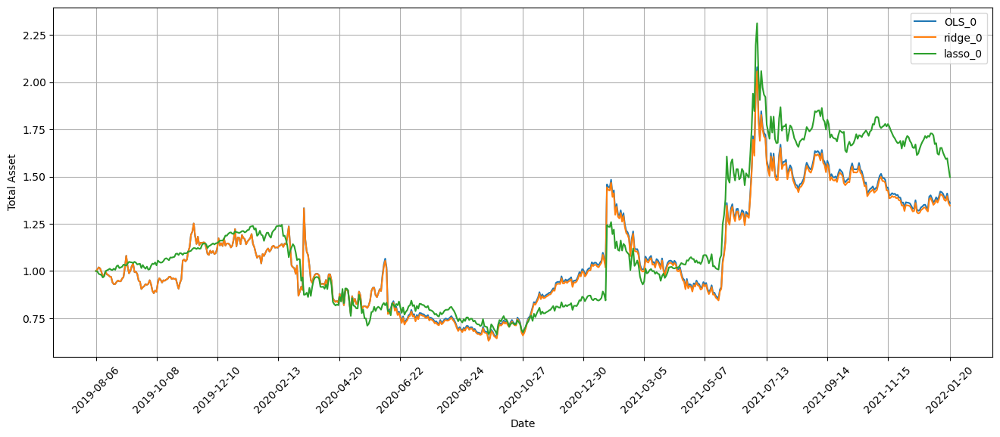

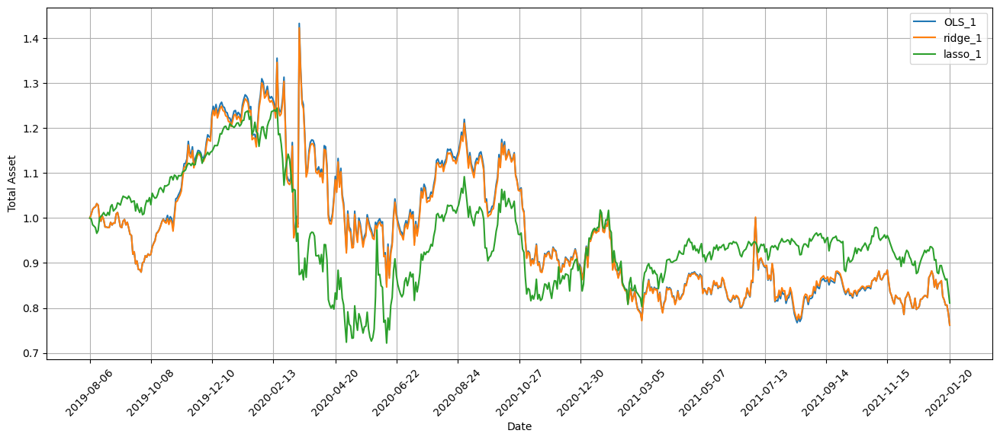

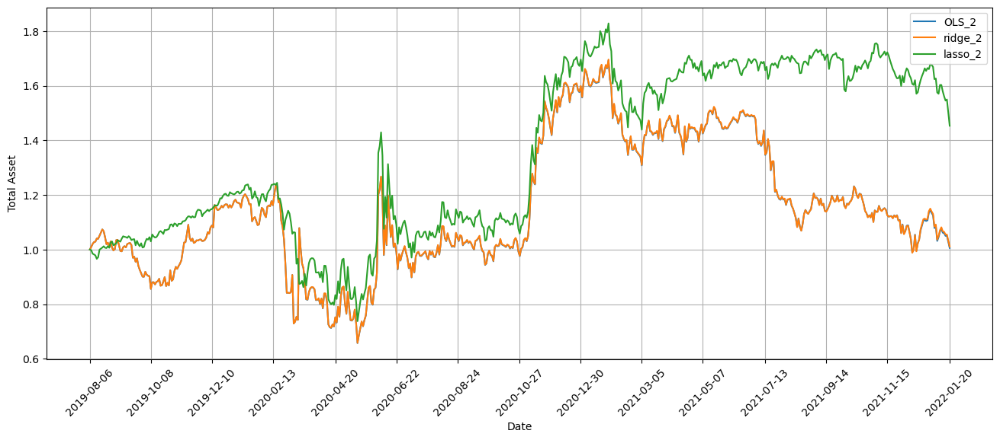

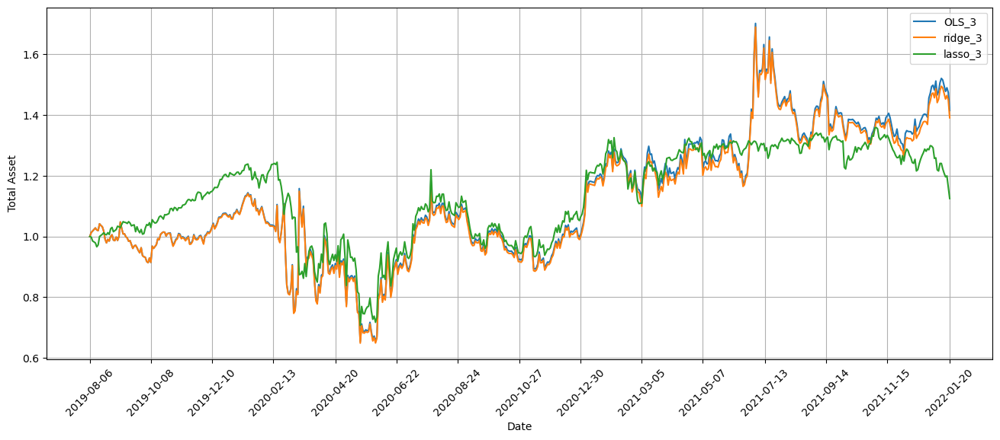

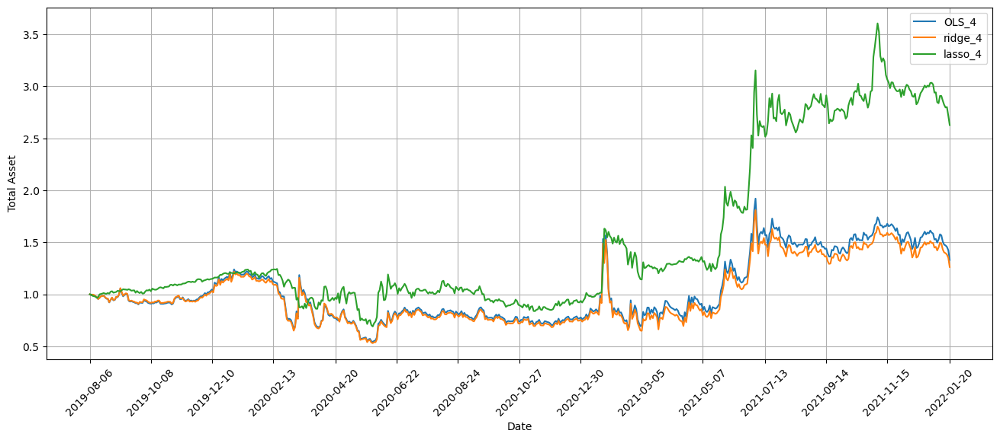

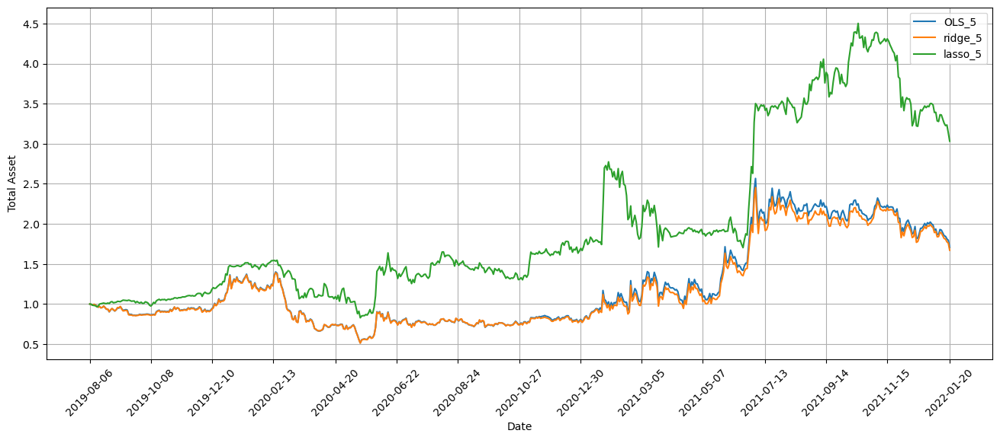

Running 32 of 67 iterations. First iteration already finished
Standardization data are from 2020-06-22 to 2021-04-07
Training data are from 2021-04-08 to 2022-01-20
Testing data are from 2021-12-23 to 2022-02-17
top_stocks by OLS factors 0 to buy on 2022-01-24 are ['SPSB', 'TFI', 'FAZ', 'NFLX', 'ODFL', 'XYLD', 'QYLD', 'LABU', 'UVXY', 'CWEB']
Total asset on 2022-01-25 will be 1.3677265565517078
It should be the same as 1.367726556551722
top_stocks by OLS factors 0 to buy on 2022-01-25 are ['VIXY', 'COWZ', 'IYZ', 'QYLD', 'RSPT', 'LABU', 'XYLD', 'UVXY', 'SRLN', 'CWEB']
Total asset on 2022-01-26 will be 1.350455792287177
It should be the same as 1.3504557922871914
top_stocks by OLS factors 0 to buy on 2022-01-26 are ['TECS', 'CUBI', 'EWD', 'COWZ', 'SPHQ', 'QYLD', 'LABU', 'XYLD', 'UVXY', 'CWEB']
Total asset on 2022-01-27 will be 1.331553785821798
It should be the same as 1.331553785821812
top_stocks by OLS factors 0 to buy on 2022-01-27 are ['TFI', 'GXC', 'COWZ', 'LABU', 'VOT', 'QYLD', 'VIX

Total asset on 2022-02-15 will be 1.3834229590359368
It should be the same as 1.383422959035955
top_stocks by ridge factors 0 to buy on 2022-02-15 are ['VGIT', 'LABU', 'SDS', 'KOLD', 'SHY', 'TFI', 'VGSH', 'UVXY', 'CWEB', 'NDSN']
Total asset on 2022-02-16 will be 1.3858423512068767
It should be the same as 1.3858423512068954
top_stocks by ridge factors 0 to buy on 2022-02-16 are ['SE', 'IPGP', 'SOXS', 'UVXY', 'TFI', 'COWZ', 'LABU', 'CWEB', 'KOLD', 'TSEM']
Total asset on 2022-02-17 will be 1.370278794849784
It should be the same as 1.3702787948498028
top_stocks by ridge factors 0 to buy on 2022-02-17 are ['TFI', 'TX', 'LABU', 'UVXY', 'COWZ', 'WIX', 'CWEB', 'ONB', 'KOLD', 'MASI']
Total asset on 2022-02-18 will be 1.355601377722352
It should be the same as 1.3556013777223703
top_stocks by ridge factors 0 to buy on 2022-02-18 are ['IRT', 'XYLD', 'SOXS', 'LABU', 'UVXY', 'MASI', 'KOLD', 'CWEB', 'UE', 'ONB']
Total asset on 2022-02-22 will be 1.3523345555776627
It should be the same as 1.352334

top_stocks by OLS factors 1 to buy on 2022-02-14 are ['SPMB', 'VGSH', 'VMBS', 'ISTB', 'TTMI', 'BSV', 'MBB', 'MINT', 'SCHO', 'SHY']
Total asset on 2022-02-15 will be 0.7963612315909128
It should be the same as 0.7963612315909233
top_stocks by OLS factors 1 to buy on 2022-02-15 are ['SPTS', 'VCSH', 'BSV', 'VGSH', 'SLQD', 'ISTB', 'SPSB', 'MBB', 'SCHO', 'SHY']
Total asset on 2022-02-16 will be 0.7967880531382653
It should be the same as 0.7967880531382757
top_stocks by OLS factors 1 to buy on 2022-02-16 are ['ICSH', 'SHM', 'CMF', 'PFFD', 'MINT', 'SPSB', 'GT', 'SUB', 'SCHO', 'SHY']
Total asset on 2022-02-17 will be 0.7963720500328193
It should be the same as 0.7963720500328298
top_stocks by OLS factors 1 to buy on 2022-02-17 are ['ATRC', 'FIS', 'OMCL', 'ERIC', 'PRI', 'CRL', 'WIX', 'GT', 'MEDP', 'MASI']
Total asset on 2022-02-18 will be 0.7830539036600606
It should be the same as 0.7830539036600712
top_stocks by OLS factors 1 to buy on 2022-02-18 are ['SAGE', 'CTRE', 'FIS', 'LZB', 'OMCL', 'M

Total asset on 2022-02-09 will be 0.8521592742174425
It should be the same as 0.8521592742174593
top_stocks by lasso factors 1 to buy on 2022-02-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-10 will be 0.8435071950810898
It should be the same as 0.8435071950811065
top_stocks by lasso factors 1 to buy on 2022-02-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-11 will be 0.8386700996079162
It should be the same as 0.838670099607933
top_stocks by lasso factors 1 to buy on 2022-02-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-14 will be 0.8372169908442909
It should be the same as 0.8372169908443076
top_stocks by lasso factors 1 to buy on 2022-02-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-15 will be 0.8514343800138108
It should be the same as 0.8514343800138

Total asset on 2022-02-09 will be 1.0331089616778897
It should be the same as 1.0331089616779063
top_stocks by ridge factors 2 to buy on 2022-02-09 are ['LMBS', 'BNDX', 'CLX', 'VMBS', 'ISTB', 'MBB', 'SCHO', 'BSV', 'SPTS', 'SHY']
Total asset on 2022-02-10 will be 1.0289282081180724
It should be the same as 1.0289282081180888
top_stocks by ridge factors 2 to buy on 2022-02-10 are ['ISTB', 'SCHO', 'BIL', 'MBB', 'LMBS', 'HCSG', 'BSV', 'VMBS', 'SHY', 'SPTS']
Total asset on 2022-02-11 will be 1.0306332495480877
It should be the same as 1.030633249548104
top_stocks by ridge factors 2 to buy on 2022-02-11 are ['VGSH', 'SPMB', 'TTMI', 'ISTB', 'BSV', 'VMBS', 'MBB', 'SCHO', 'SPTS', 'SHY']
Total asset on 2022-02-14 will be 1.0338160307789537
It should be the same as 1.03381603077897
top_stocks by ridge factors 2 to buy on 2022-02-14 are ['SLQD', 'SPMB', 'VMBS', 'MINT', 'ISTB', 'MBB', 'BSV', 'SCHO', 'SPTS', 'SHY']
Total asset on 2022-02-15 will be 1.0331685364134717
It should be the same as 1.03316

Total asset on 2022-02-04 will be 1.6512946924713585
It should be the same as 1.6512946924713763
top_stocks by OLS factors 3 to buy on 2022-02-04 are ['ETSY', 'FDN', 'GRPN', 'SHOP', 'XYL', 'SQ', 'SNAP', 'CHRW', 'PYPL', 'META']
Total asset on 2022-02-07 will be 1.6945565778832923
It should be the same as 1.6945565778833103
top_stocks by OLS factors 3 to buy on 2022-02-07 are ['SCHO', 'BOTZ', 'CLX', 'VOX', 'GDS', 'XYL', 'SLAB', 'MBB', 'SHY', 'META']
Total asset on 2022-02-08 will be 1.6677250888924664
It should be the same as 1.6677250888924844
top_stocks by OLS factors 3 to buy on 2022-02-08 are ['F', 'SCHO', 'TXN', 'NEU', 'SKYW', 'PH', 'BSV', 'SHY', 'DLB', 'CLX']
Total asset on 2022-02-09 will be 1.6888071433527734
It should be the same as 1.6888071433527914
top_stocks by OLS factors 3 to buy on 2022-02-09 are ['HYMB', 'SUN', 'EPC', 'GWW', 'PBH', 'ZBH', 'SWK', 'DLB', 'ODFL', 'ITW']
Total asset on 2022-02-10 will be 1.6783795162261816
It should be the same as 1.6783795162261996
top_stoc

top_stocks by lasso factors 3 to buy on 2022-02-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-04 will be 1.1457081643900509
It should be the same as 1.1457081643900682
top_stocks by lasso factors 3 to buy on 2022-02-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-07 will be 1.1486201603050021
It should be the same as 1.1486201603050195
top_stocks by lasso factors 3 to buy on 2022-02-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-08 will be 1.1590084729094448
It should be the same as 1.1590084729094623
top_stocks by lasso factors 3 to buy on 2022-02-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-09 will be 1.1821092279878598
It should be the same as 1.1821092279878773
top_stocks by lasso factors 3 to buy on 2022-02-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2022-02-02 will be 1.404531206240549
It should be the same as 1.4045312062405604
top_stocks by ridge factors 4 to buy on 2022-02-02 are ['SQQQ', 'UVXY', 'SPXU', 'SPXS', 'CAR', 'SHY', 'SPTS', 'CROX', 'SOXS', 'AEHR']
Total asset on 2022-02-03 will be 1.4192006707928968
It should be the same as 1.4192006707929081
top_stocks by ridge factors 4 to buy on 2022-02-03 are ['CAR', 'SHY', 'SOXS', 'GLW', 'PYPL', 'EPAM', 'SPTS', 'CROX', 'KOLD', 'AEHR']
Total asset on 2022-02-04 will be 1.4130706559610149
It should be the same as 1.4130706559610262
top_stocks by ridge factors 4 to buy on 2022-02-04 are ['VICR', 'CAR', 'KRNT', 'BX', 'NVMI', 'AVGO', 'NVDA', 'EPAM', 'CROX', 'AEHR']
Total asset on 2022-02-07 will be 1.442946065157922
It should be the same as 1.4429460651579333
top_stocks by ridge factors 4 to buy on 2022-02-07 are ['BX', 'ANY', 'UNG', 'KRNT', 'NVO', 'BOIL', 'META', 'EPAM', 'CROX', 'AEHR']
Total asset on 2022-02-08 will be 1.4005268113446658
It should be the same as 1.400

top_stocks by OLS factors 5 to buy on 2022-01-28 are ['TLH', 'SDS', 'NOW', 'CL', 'SAIA', 'VIXY', 'UVXY', 'SPTS', 'FFIV', 'KMB']
Total asset on 2022-01-31 will be 1.670315849961274
It should be the same as 1.6703158499612916
top_stocks by OLS factors 5 to buy on 2022-01-31 are ['WTS', 'MBB', 'GVI', 'SPTS', 'TER', 'T', 'VGSH', 'BSV', 'SCHO', 'SHY']
Total asset on 2022-02-01 will be 1.6781677160250512
It should be the same as 1.6781677160250688
top_stocks by OLS factors 5 to buy on 2022-02-01 are ['WTS', 'TXN', 'BAH', 'KOLD', 'EEFT', 'NOW', 'SPTS', 'PGX', 'SHM', 'TGTX']
Total asset on 2022-02-02 will be 1.6462219830395282
It should be the same as 1.6462219830395455
top_stocks by OLS factors 5 to buy on 2022-02-02 are ['VTEB', 'WAL', 'GBCI', 'SCHO', 'AEHR', 'ITM', 'SHM', 'TFI', 'SUB', 'SPTS']
Total asset on 2022-02-03 will be 1.6295480067991888
It should be the same as 1.6295480067992063
top_stocks by OLS factors 5 to buy on 2022-02-03 are ['GVI', 'LXP', 'NVO', 'JPST', 'MBB', 'BSV', 'SCHO'

Total asset on 2022-01-28 will be 2.99948700819633
It should be the same as 2.999487008196348
top_stocks by lasso factors 5 to buy on 2022-01-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-01-31 will be 3.0614872488636036
It should be the same as 3.0614872488636213
top_stocks by lasso factors 5 to buy on 2022-01-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-01 will be 3.1591101104378874
It should be the same as 3.1591101104379047
top_stocks by lasso factors 5 to buy on 2022-02-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-02 will be 3.2041396254400687
It should be the same as 3.2041396254400865
top_stocks by lasso factors 5 to buy on 2022-02-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-02-03 will be 3.141661916836806
It should be the same as 3.1416619168368243

top_stocks by ridge factors 0 to buy on 2022-02-22 are ['WIX', 'ONB', 'ERIC', 'LZB', 'ATUS', 'RDFN', 'PPC', 'ROKU', 'CWEB', 'MASI']
Total asset on 2022-02-23 will be 1.37071833489774
It should be the same as 1.3707183348977587
top_stocks by ridge factors 0 to buy on 2022-02-23 are ['MELI', 'TRU', 'PPC', 'PEGA', 'BSCO', 'QYLD', 'TPX', 'ATUS', 'ROKU', 'CWEB']
Total asset on 2022-02-24 will be 1.291681106631517
It should be the same as 1.291681106631536
top_stocks by ridge factors 0 to buy on 2022-02-24 are ['QYLD', 'HD', 'PPC', 'LABU', 'WK', 'RSPT', 'TPX', 'COWZ', 'CSGP', 'CWEB']
Total asset on 2022-02-25 will be 1.4130391575613508
It should be the same as 1.4130391575613694
top_stocks by ridge factors 0 to buy on 2022-02-25 are ['XLY', 'COKE', 'AGNC', 'VWOB', 'FNDE', 'PCY', 'EMB', 'EPAM', 'UPBD', 'CWEB']
Total asset on 2022-02-28 will be 1.3954879923228287
It should be the same as 1.3954879923228478
top_stocks by ridge factors 0 to buy on 2022-02-28 are ['DELL', 'FLOT', 'TFLO', 'HLF', '

Total asset on 2022-03-17 will be 1.5763091146557848
It should be the same as 1.576309114655798
top_stocks by lasso factors 0 to buy on 2022-03-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-18 will be 1.5959660311628239
It should be the same as 1.5959660311628376
top_stocks by lasso factors 0 to buy on 2022-03-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-21 will be 1.6123658821274574
It should be the same as 1.6123658821274705
top_stocks by lasso factors 0 to buy on 2022-03-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-22 will be 1.6049449956177357
It should be the same as 1.604944995617749
top_stocks by OLS factors 1 to buy on 2022-02-22 are ['PPC', 'MEDP', 'RDFN', 'LKQ', 'WIX', 'ATUS', 'ERIC', 'LZB', 'ROKU', 'MASI']
Total asset on 2022-02-23 will be 0.7782421332788004
It should be the same as 0.77824213327881

top_stocks by ridge factors 1 to buy on 2022-03-11 are ['VCSH', 'ISTB', 'IGSB', 'SPSB', 'SLQD', 'BNDX', 'BSV', 'SCHO', 'MINT', 'SHY']
Total asset on 2022-03-14 will be 0.7856134162683456
It should be the same as 0.785613416268352
top_stocks by ridge factors 1 to buy on 2022-03-14 are ['VNLA', 'FTSM', 'SCHO', 'PDBC', 'GSY', 'GSG', 'NEAR', 'MINT', 'SHY', 'COMT']
Total asset on 2022-03-15 will be 0.7755750066945237
It should be the same as 0.7755750066945303
top_stocks by ridge factors 1 to buy on 2022-03-15 are ['CWEB', 'TCOM', 'EDU', 'JD', 'KWEB', 'HTHT', 'SHY', 'GDS', 'NKTR', 'YUMC']
Total asset on 2022-03-16 will be 1.0455175281357387
It should be the same as 1.0455175281357452
top_stocks by ridge factors 1 to buy on 2022-03-16 are ['KWEB', 'YY', 'HTHT', 'YUMC', 'EDU', 'TAL', 'FLOT', 'FLRN', 'GDS', 'NKTR']
Total asset on 2022-03-17 will be 1.0863107137360033
It should be the same as 1.0863107137360102
top_stocks by ridge factors 1 to buy on 2022-03-17 are ['SPMB', 'BSV', 'VMBS', 'SUB'

Total asset on 2022-03-10 will be 1.0206337755941537
It should be the same as 1.0206337755941717
top_stocks by OLS factors 2 to buy on 2022-03-10 are ['YEXT', 'ISTB', 'IGSB', 'FLRN', 'SCHO', 'SLQD', 'VCSH', 'FLOT', 'SPSB', 'SHY']
Total asset on 2022-03-11 will be 1.0380436194959555
It should be the same as 1.0380436194959735
top_stocks by OLS factors 2 to buy on 2022-03-11 are ['IGSB', 'VCSH', 'SPSB', 'ISTB', 'SLQD', 'BNDX', 'BSV', 'SCHO', 'MINT', 'SHY']
Total asset on 2022-03-14 will be 1.0354447912890403
It should be the same as 1.0354447912890579
top_stocks by OLS factors 2 to buy on 2022-03-14 are ['FTSM', 'DBC', 'GSY', 'PDBC', 'SCHO', 'NEAR', 'GSG', 'MINT', 'SHY', 'COMT']
Total asset on 2022-03-15 will be 1.019107594392136
It should be the same as 1.0191075943921535
top_stocks by OLS factors 2 to buy on 2022-03-15 are ['MBB', 'JD', 'KWEB', 'TAL', 'EDU', 'HTHT', 'SHY', 'GDS', 'YUMC', 'NKTR']
Total asset on 2022-03-16 will be 1.2967836320957489
It should be the same as 1.29678363209

Total asset on 2022-03-04 will be 1.5209999706136381
It should be the same as 1.5209999706136554
top_stocks by lasso factors 2 to buy on 2022-03-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-07 will be 1.5281245341888259
It should be the same as 1.528124534188843
top_stocks by lasso factors 2 to buy on 2022-03-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-08 will be 1.518833928723851
It should be the same as 1.5188339287238684
top_stocks by lasso factors 2 to buy on 2022-03-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-09 will be 1.5179700950869446
It should be the same as 1.5179700950869617
top_stocks by lasso factors 2 to buy on 2022-03-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-03-10 will be 1.517639867819315
It should be the same as 1.517639867819332

Total asset on 2022-03-04 will be 1.625424946476206
It should be the same as 1.6254249464762234
top_stocks by ridge factors 3 to buy on 2022-03-04 are ['VMBS', 'VGSH', 'SLQD', 'ISTB', 'BSV', 'NAT', 'KPTI', 'MBB', 'SCHO', 'SHY']
Total asset on 2022-03-07 will be 1.6238818324201694
It should be the same as 1.6238818324201865
top_stocks by ridge factors 3 to buy on 2022-03-07 are ['EDU', 'VTIP', 'BURL', 'STIP', 'VEEV', 'NAT', 'SCHO', 'GSY', 'SHY', 'MINT']
Total asset on 2022-03-08 will be 1.6072346113526161
It should be the same as 1.607234611352633
top_stocks by ridge factors 3 to buy on 2022-03-08 are ['YUMC', 'THRM', 'ZLAB', 'TCOM', 'FLOT', 'BOTZ', 'WB', 'PCY', 'NOMD', 'CPRI']
Total asset on 2022-03-09 will be 1.644632973144193
It should be the same as 1.6446329731442102
top_stocks by ridge factors 3 to buy on 2022-03-09 are ['CPRI', 'SPMB', 'THRM', 'BX', 'EPAM', 'SLQD', 'MBB', 'MLCO', 'VCSH', 'NOMD']
Total asset on 2022-03-10 will be 1.6350599886427053
It should be the same as 1.63505

Total asset on 2022-02-28 will be 1.4009026451531343
It should be the same as 1.4009026451531514
top_stocks by OLS factors 4 to buy on 2022-02-28 are ['EPAM', 'MINT', 'UPBD', 'UTHR', 'DELL', 'LPSN', 'PSA', 'BAND', 'FL', 'COKE']
Total asset on 2022-03-01 will be 1.3969340033540583
It should be the same as 1.396934003354075
top_stocks by OLS factors 4 to buy on 2022-03-01 are ['SQQQ', 'SH', 'FTGC', 'SHY', 'SPDN', 'SPXS', 'SPXU', 'SDS', 'VTIP', 'STIP']
Total asset on 2022-03-02 will be 1.412723975337013
It should be the same as 1.4127239753370304
top_stocks by OLS factors 4 to buy on 2022-03-02 are ['VTRS', 'ERIC', 'AMBA', 'VWOB', 'PCY', 'EMLC', 'HRTX', 'EMB', 'KAR', 'EPAM']
Total asset on 2022-03-03 will be 1.4471011827032947
It should be the same as 1.447101182703312
top_stocks by OLS factors 4 to buy on 2022-03-03 are ['CARG', 'SPTS', 'KPTI', 'ERIC', 'VTRS', 'SCHO', 'AMBA', 'SHY', 'FHN', 'EPAM']
Total asset on 2022-03-04 will be 1.395985696281625
It should be the same as 1.395985696281

Total asset on 2022-03-22 will be 1.8737862701872467
It should be the same as 1.8737862701872616
top_stocks by lasso factors 4 to buy on 2022-02-22 are ['TYL', 'ATRA', 'BPMC', 'LZB', 'PPC', 'LKQ', 'PEGA', 'RDFN', 'ATUS', 'ROKU']
Total asset on 2022-02-23 will be 2.782609704251378
It should be the same as 2.7826097042513953
top_stocks by lasso factors 4 to buy on 2022-02-23 are ['QYLD', 'PPL', 'MELI', 'NICE', 'CROX', 'RDFN', 'TRU', 'TPX', 'PPC', 'ROKU']
Total asset on 2022-02-24 will be 2.591637841268272
It should be the same as 2.591637841268289
top_stocks by lasso factors 4 to buy on 2022-02-24 are ['LBTYA', 'BLKB', 'KPTI', 'GSY', 'HD', 'TDS', 'WK', 'SHY', 'TPX', 'CSGP']
Total asset on 2022-02-25 will be 2.76047813217347
It should be the same as 2.7604781321734877
top_stocks by lasso factors 4 to buy on 2022-02-25 are ['ARR', 'PSEC', 'NTAP', 'EPAM', 'AGNC', 'VWOB', 'EMB', 'COKE', 'PCY', 'UPBD']
Total asset on 2022-02-28 will be 2.734709899376079
It should be the same as 2.734709899376

Total asset on 2022-03-22 will be 2.32594855335335
It should be the same as 2.3259485533533684
top_stocks by ridge factors 5 to buy on 2022-02-22 are ['SITE', 'BPMC', 'ALB', 'SPTS', 'RDFN', 'LKQ', 'PEGA', 'PPC', 'ROKU', 'ATUS']
Total asset on 2022-02-23 will be 1.630810261711441
It should be the same as 1.630810261711455
top_stocks by ridge factors 5 to buy on 2022-02-23 are ['ATRC', 'EPAM', 'GPK', 'TPX', 'IDCC', 'RDFN', 'CROX', 'SPTS', 'PPC', 'ROKU']
Total asset on 2022-02-24 will be 1.5297501033876582
It should be the same as 1.5297501033876721
top_stocks by ridge factors 5 to buy on 2022-02-24 are ['VMBS', 'WK', 'SPSB', 'CE', 'GSY', 'CSGP', 'TPX', 'SPTS', 'SCHO', 'SHY']
Total asset on 2022-02-25 will be 1.5829439873104518
It should be the same as 1.582943987310466
top_stocks by ridge factors 5 to buy on 2022-02-25 are ['PSEC', 'NTAP', 'BCC', 'JBT', 'PCY', 'VWOB', 'CSGP', 'EMB', 'COKE', 'UPBD']
Total asset on 2022-02-28 will be 1.5983760178679487
It should be the same as 1.5983760178

Total asset on 2022-03-16 will be 4.274031545983245
It should be the same as 4.27403154598326
top_stocks by lasso factors 5 to buy on 2022-03-16 are ['KWEB', 'YY', 'TAL', 'EDU', 'MOMO', 'YUMC', 'FLRN', 'FTGC', 'GDS', 'NKTR']
Total asset on 2022-03-17 will be 4.504475602409595
It should be the same as 4.504475602409611
top_stocks by lasso factors 5 to buy on 2022-03-17 are ['MBB', 'NTRA', 'HYMB', 'VNLA', 'TFI', 'SPIP', 'TIP', 'SCHP', 'YANG', 'MINT']
Total asset on 2022-03-18 will be 4.5497202016561165
It should be the same as 4.549720201656132
top_stocks by lasso factors 5 to buy on 2022-03-18 are ['BSV', 'SPIP', 'IEI', 'VGSH', 'MBB', 'GEN', 'MINT', 'SCHO', 'SHY', 'YANG']
Total asset on 2022-03-21 will be 4.536709672354283
It should be the same as 4.536709672354299
top_stocks by lasso factors 5 to buy on 2022-03-21 are ['SPDN', 'VGSH', 'LABD', 'ICSH', 'EDU', 'GSY', 'GEN', 'SCHO', 'SHY', 'YANG']
Total asset on 2022-03-22 will be 4.532036843049192
It should be the same as 4.53203684304920

Total asset on 2022-04-07 will be 1.6212088600883583
It should be the same as 1.621208860088379
top_stocks by ridge factors 0 to buy on 2022-04-07 are ['SPMB', 'VMBS', 'R', 'HUBG', 'MATX', 'MBB', 'JBHT', 'SCO', 'KOLD', 'CWEB']
Total asset on 2022-04-08 will be 1.5876947627498776
It should be the same as 1.5876947627498985
top_stocks by ridge factors 0 to buy on 2022-04-08 are ['BNDX', 'TMF', 'SAIA', 'MATX', 'NEO', 'VMBS', 'SPMB', 'MBB', 'KOLD', 'CWEB']
Total asset on 2022-04-11 will be 1.5634286851129058
It should be the same as 1.563428685112927
top_stocks by ridge factors 0 to buy on 2022-04-11 are ['SFNC', 'LXP', 'VTEB', 'TFI', 'SUB', 'SPMB', 'MBB', 'VMBS', 'KOLD', 'CWEB']
Total asset on 2022-04-12 will be 1.5580700137324617
It should be the same as 1.558070013732483
top_stocks by ridge factors 0 to buy on 2022-04-12 are ['SPMB', 'PIPR', 'VTEB', 'YINN', 'TFI', 'VMBS', 'LXP', 'MBB', 'KOLD', 'CWEB']
Total asset on 2022-04-13 will be 1.541041894569073
It should be the same as 1.5410418

top_stocks by OLS factors 1 to buy on 2022-04-05 are ['KNX', 'WERN', 'LSTR', 'SHY', 'JBHT', 'HUBG', 'ODFL', 'MINT', 'STIP', 'VTIP']
Total asset on 2022-04-06 will be 1.0559298578301972
It should be the same as 1.0559298578302092
top_stocks by OLS factors 1 to buy on 2022-04-06 are ['MBB', 'HUBG', 'ODFL', 'SNDR', 'JBHT', 'STIP', 'MINT', 'SCHO', 'VTIP', 'SHY']
Total asset on 2022-04-07 will be 1.0505530164227737
It should be the same as 1.0505530164227859
top_stocks by OLS factors 1 to buy on 2022-04-07 are ['SNDR', 'SCHO', 'ODFL', 'VMBS', 'SPMB', 'MATX', 'R', 'MBB', 'HUBG', 'JBHT']
Total asset on 2022-04-08 will be 1.0382978562114524
It should be the same as 1.0382978562114642
top_stocks by OLS factors 1 to buy on 2022-04-08 are ['MKTX', 'HUBG', 'IAGG', 'SHM', 'R', 'BNDX', 'MATX', 'VMBS', 'SPMB', 'MBB']
Total asset on 2022-04-11 will be 1.0300076597744008
It should be the same as 1.0300076597744126
top_stocks by OLS factors 1 to buy on 2022-04-11 are ['ISTB', 'IUSB', 'HYMB', 'IGIB', 'VC

Total asset on 2022-04-01 will be 0.8813583558787579
It should be the same as 0.8813583558787756
top_stocks by lasso factors 1 to buy on 2022-04-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-04-04 will be 0.8938705970727256
It should be the same as 0.8938705970727434
top_stocks by lasso factors 1 to buy on 2022-04-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-04-05 will be 0.893917250163658
It should be the same as 0.8939172501636757
top_stocks by lasso factors 1 to buy on 2022-04-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-04-06 will be 0.8736915670106541
It should be the same as 0.8736915670106719
top_stocks by lasso factors 1 to buy on 2022-04-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-04-07 will be 0.8694855432032711
It should be the same as 0.8694855432032

Total asset on 2022-04-01 will be 1.3309261500817993
It should be the same as 1.3309261500818157
top_stocks by ridge factors 2 to buy on 2022-04-01 are ['MOMO', 'DELL', 'DE', 'ADM', 'STIP', 'BG', 'GSY', 'VTIP', 'SMFG', 'NEO']
Total asset on 2022-04-04 will be 1.3372717975826827
It should be the same as 1.3372717975826987
top_stocks by ridge factors 2 to buy on 2022-04-04 are ['SPIP', 'RH', 'TIP', 'SCHO', 'ICSH', 'DELL', 'MINT', 'SHY', 'STIP', 'VTIP']
Total asset on 2022-04-05 will be 1.3447436627143268
It should be the same as 1.344743662714343
top_stocks by ridge factors 2 to buy on 2022-04-05 are ['KNX', 'SNDR', 'LSTR', 'SHY', 'HUBG', 'JBHT', 'ODFL', 'MINT', 'STIP', 'VTIP']
Total asset on 2022-04-06 will be 1.3205218666935596
It should be the same as 1.3205218666935754
top_stocks by ridge factors 2 to buy on 2022-04-06 are ['VNLA', 'SPMB', 'SNDR', 'MBB', 'JBHT', 'STIP', 'MINT', 'SCHO', 'VTIP', 'SHY']
Total asset on 2022-04-07 will be 1.3201977880172482
It should be the same as 1.3201

top_stocks by OLS factors 3 to buy on 2022-03-30 are ['STIP', 'VTIP', 'SCHO', 'DBC', 'PDBC', 'GSG', 'MINT', 'COMT', 'SHY', 'NEO']
Total asset on 2022-03-31 will be 2.372281177287739
It should be the same as 2.3722811772877597
top_stocks by OLS factors 3 to buy on 2022-03-31 are ['VNLA', 'NWN', 'GEN', 'VTIP', 'STIP', 'DE', 'BG', 'UUP', 'ADM', 'NEO']
Total asset on 2022-04-01 will be 2.3666405992550272
It should be the same as 2.3666405992550477
top_stocks by OLS factors 3 to buy on 2022-04-01 are ['GLOB', 'WFC', 'EWG', 'RYAAY', 'MOMO', 'SMFG', 'TPX', 'NLY', 'DELL', 'RH']
Total asset on 2022-04-04 will be 2.3612749037528884
It should be the same as 2.361274903752909
top_stocks by OLS factors 3 to buy on 2022-04-04 are ['HPQ', 'SPIP', 'VCSH', 'MINT', 'TIP', 'SPSB', 'SHY', 'DELL', 'STIP', 'VTIP']
Total asset on 2022-04-05 will be 2.3618505421654294
It should be the same as 2.36185054216545
top_stocks by OLS factors 3 to buy on 2022-04-05 are ['SNDR', 'ODFL', 'JBHT', 'ISTB', 'STIP', 'BSV', 

top_stocks by lasso factors 3 to buy on 2022-03-25 are ['BC', 'ICUI', 'MLI', 'SHM', 'TFI', 'HYMB', 'RMD', 'WOR', 'VICR', 'NEOG']
Total asset on 2022-03-28 will be 1.6289369819856938
It should be the same as 1.628936981985713
top_stocks by lasso factors 3 to buy on 2022-03-28 are ['CMF', 'PZA', 'SHM', 'SCHO', 'VMBS', 'NEOG', 'BWX', 'VICR', 'SHY', 'MBB']
Total asset on 2022-03-29 will be 1.6381433857900614
It should be the same as 1.6381433857900807
top_stocks by lasso factors 3 to buy on 2022-03-29 are ['VCSH', 'ISTB', 'VGSH', 'IEI', 'SPMB', 'MBB', 'SCHO', 'VMBS', 'MINT', 'SHY']
Total asset on 2022-03-30 will be 1.639609543253781
It should be the same as 1.6396095432538005
top_stocks by lasso factors 3 to buy on 2022-03-30 are ['STIP', 'VTIP', 'DBC', 'PDBC', 'GSG', 'SCHO', 'MINT', 'COMT', 'SHY', 'NEO']
Total asset on 2022-03-31 will be 1.6367341999878593
It should be the same as 1.636734199987879
top_stocks by lasso factors 3 to buy on 2022-03-31 are ['BALL', 'GEN', 'DE', 'VTIP', 'ADM',

top_stocks by ridge factors 4 to buy on 2022-03-22 are ['SHM', 'MUB', 'ISTB', 'MINT', 'VMBS', 'SCHO', 'SUB', 'SPTS', 'SHY', 'CWEB']
Total asset on 2022-03-23 will be 1.874343188253077
It should be the same as 1.874343188253092
top_stocks by ridge factors 4 to buy on 2022-03-23 are ['ISTB', 'MINT', 'BSV', 'SPTS', 'VMBS', 'SPSB', 'MBB', 'CWEB', 'SCHO', 'SHY']
Total asset on 2022-03-24 will be 1.8752036054553456
It should be the same as 1.8752036054553607
top_stocks by ridge factors 4 to buy on 2022-03-24 are ['ICSH', 'EMLC', 'BSV', 'MBB', 'SPMB', 'MINT', 'SPTS', 'SCHO', 'SHY', 'CWEB']
Total asset on 2022-03-25 will be 1.8506355513808042
It should be the same as 1.8506355513808188
top_stocks by ridge factors 4 to buy on 2022-03-25 are ['NKE', 'YANG', 'CUBI', 'RYAAY', 'ESPR', 'WOR', 'NEOG', 'VICR', 'SPTS', 'CWEB']
Total asset on 2022-03-28 will be 1.8441453443408942
It should be the same as 1.844145344340909
top_stocks by ridge factors 4 to buy on 2022-03-28 are ['ISTB', 'SPSB', 'MINT', 'B

Total asset on 2022-04-20 will be 3.7053699097588417
It should be the same as 3.7053699097588604
top_stocks by OLS factors 5 to buy on 2022-03-22 are ['VNLA', 'VNET', 'ASND', 'MINT', 'SUB', 'YY', 'ACN', 'SPTS', 'SHY', 'CWEB']
Total asset on 2022-03-23 will be 2.3636322562504906
It should be the same as 2.363632256250509
top_stocks by OLS factors 5 to buy on 2022-03-23 are ['GSY', 'BSV', 'MINT', 'NKTR', 'SPTS', 'SPSB', 'MBB', 'VMBS', 'SCHO', 'SHY']
Total asset on 2022-03-24 will be 2.3697069714046455
It should be the same as 2.3697069714046632
top_stocks by OLS factors 5 to buy on 2022-03-24 are ['TOTL', 'IEI', 'VMBS', 'SPMB', 'SPTS', 'BSV', 'MINT', 'MBB', 'SCHO', 'SHY']
Total asset on 2022-03-25 will be 2.3638025949121193
It should be the same as 2.3638025949121375
top_stocks by OLS factors 5 to buy on 2022-03-25 are ['BC', 'ESPR', 'EXP', 'SLGN', 'NKE', 'CWEB', 'NEOG', 'RYAAY', 'VICR', 'WOR']
Total asset on 2022-03-28 will be 2.380640768947659
It should be the same as 2.380640768947677

Total asset on 2022-04-20 will be 2.366697742406715
It should be the same as 2.366697742406731
top_stocks by lasso factors 5 to buy on 2022-03-22 are ['VGSH', 'VGIT', 'SPTI', 'SCHR', 'LABD', 'IEI', 'ACN', 'SCHO', 'YANG', 'SHY']
Total asset on 2022-03-23 will be 4.5109754692777955
It should be the same as 4.510975469277811
top_stocks by lasso factors 5 to buy on 2022-03-23 are ['SPMB', 'ISTB', 'MINT', 'VGSH', 'SPSB', 'BSV', 'VMBS', 'MBB', 'SCHO', 'SHY']
Total asset on 2022-03-24 will be 4.509008039901406
It should be the same as 4.5090080399014205
top_stocks by lasso factors 5 to buy on 2022-03-24 are ['IEI', 'TOTL', 'YANG', 'MINT', 'VMBS', 'BSV', 'SPMB', 'MBB', 'SCHO', 'SHY']
Total asset on 2022-03-25 will be 4.527232479082461
It should be the same as 4.527232479082476
top_stocks by lasso factors 5 to buy on 2022-03-25 are ['BC', 'ICUI', 'MLI', 'SHM', 'TFI', 'HYMB', 'RMD', 'WOR', 'VICR', 'NEOG']
Total asset on 2022-03-28 will be 4.50832585110798
It should be the same as 4.5083258511079

Total asset on 2022-05-13 will be 1.5594427469432024
It should be the same as 1.5594427469432195
top_stocks by OLS factors 0 to buy on 2022-05-13 are ['BHC', 'PEGA', 'SRLN', 'ASND', 'KRNT', 'CVNA', 'EYE', 'LABU', 'KOLD', 'CWEB']
Total asset on 2022-05-16 will be 1.596463624006655
It should be the same as 1.5964636240066723
top_stocks by OLS factors 0 to buy on 2022-05-16 are ['PDI', 'PEGA', 'FTSL', 'HYMB', 'R', 'KRNT', 'SRLN', 'LABU', 'KOLD', 'CWEB']
Total asset on 2022-05-17 will be 1.6186599725881756
It should be the same as 1.618659972588193
top_stocks by OLS factors 0 to buy on 2022-05-17 are ['SCO', 'FTSL', 'FLRN', 'YANG', 'HTGC', 'HYMB', 'SRLN', 'LABU', 'CWEB', 'KOLD']
Total asset on 2022-05-18 will be 1.6179829613188053
It should be the same as 1.617982961318822
top_stocks by ridge factors 0 to buy on 2022-04-20 are ['CLM', 'SCHO', 'XRAY', 'AXSM', 'SHY', 'SPMB', 'VMBS', 'MBB', 'CWEB', 'KOLD']
Total asset on 2022-04-21 will be 1.5159590930068942
It should be the same as 1.5159590

Total asset on 2022-05-11 will be 1.354796996159228
It should be the same as 1.3547969961592432
top_stocks by lasso factors 0 to buy on 2022-05-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-12 will be 1.3287750371648384
It should be the same as 1.3287750371648535
top_stocks by lasso factors 0 to buy on 2022-05-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-13 will be 1.3712079075798627
It should be the same as 1.3712079075798775
top_stocks by lasso factors 0 to buy on 2022-05-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-16 will be 1.3894517297306892
It should be the same as 1.3894517297307043
top_stocks by lasso factors 0 to buy on 2022-05-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-17 will be 1.414515491947512
It should be the same as 1.41451549194752

top_stocks by ridge factors 1 to buy on 2022-05-09 are ['ICE', 'FRPT', 'JCI', 'BFAM', 'IAG', 'RPD', 'SFM', 'UAA', 'HAIN', 'UA']
Total asset on 2022-05-10 will be 0.9925526302240252
It should be the same as 0.9925526302240332
top_stocks by ridge factors 1 to buy on 2022-05-10 are ['FRPT', 'BFAM', 'CGNX', 'HYLS', 'CMP', 'RPD', 'ICE', 'UAA', 'UA', 'HAIN']
Total asset on 2022-05-11 will be 0.969382372438199
It should be the same as 0.9693823724382069
top_stocks by ridge factors 1 to buy on 2022-05-11 are ['CUBE', 'FRPT', 'NVRO', 'EYE', 'CMP', 'CGNX', 'UAA', 'UA', 'HYLS', 'BHC']
Total asset on 2022-05-12 will be 0.9402113883419093
It should be the same as 0.9402113883419172
top_stocks by ridge factors 1 to buy on 2022-05-12 are ['PLD', 'GMED', 'SRLN', 'PSA', 'PEGA', 'HYLS', 'CMP', 'KRNT', 'BHC', 'EYE']
Total asset on 2022-05-13 will be 0.9876000645058343
It should be the same as 0.9876000645058424
top_stocks by ridge factors 1 to buy on 2022-05-13 are ['HYLS', 'BKLN', 'ASND', 'ICUI', 'CVNA'

Total asset on 2022-05-06 will be 1.3152596217933608
It should be the same as 1.3152596217933807
top_stocks by OLS factors 2 to buy on 2022-05-06 are ['FMC', 'CHGG', 'WCN', 'EXPE', 'HAIN', 'BFAM', 'TFLO', 'JJSF', 'ROK', 'IAG']
Total asset on 2022-05-09 will be 1.2760022942364975
It should be the same as 1.2760022942365172
top_stocks by OLS factors 2 to buy on 2022-05-09 are ['TNDM', 'BFAM', 'ICE', 'JCI', 'IAG', 'RPD', 'UAA', 'UA', 'SFM', 'HAIN']
Total asset on 2022-05-10 will be 1.2785996136360072
It should be the same as 1.278599613636027
top_stocks by OLS factors 2 to buy on 2022-05-10 are ['IRT', 'BFAM', 'CGNX', 'CMP', 'RPD', 'SFM', 'UAA', 'ICE', 'UA', 'HAIN']
Total asset on 2022-05-11 will be 1.2538129337228112
It should be the same as 1.2538129337228312
top_stocks by OLS factors 2 to buy on 2022-05-11 are ['EXR', 'COO', 'HYLS', 'PSA', 'NVRO', 'UAA', 'CMP', 'UA', 'CGNX', 'BHC']
Total asset on 2022-05-12 will be 1.2328929693184476
It should be the same as 1.2328929693184678
top_stoc

top_stocks by lasso factors 2 to buy on 2022-05-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-03 will be 1.417334028652605
It should be the same as 1.4173340286526233
top_stocks by lasso factors 2 to buy on 2022-05-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-04 will be 1.4255298365875857
It should be the same as 1.4255298365876035
top_stocks by lasso factors 2 to buy on 2022-05-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-05 will be 1.4390188353490898
It should be the same as 1.439018835349108
top_stocks by lasso factors 2 to buy on 2022-05-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-06 will be 1.3870041287748038
It should be the same as 1.3870041287748223
top_stocks by lasso factors 2 to buy on 2022-05-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

Total asset on 2022-05-02 will be 2.168753018350907
It should be the same as 2.168753018350928
top_stocks by ridge factors 3 to buy on 2022-05-02 are ['IEI', 'ISTB', 'SPSB', 'VCSH', 'SLQD', 'MBB', 'TDOC', 'BSV', 'SCHO', 'SHY']
Total asset on 2022-05-03 will be 2.189881431027272
It should be the same as 2.1898814310272923
top_stocks by ridge factors 3 to buy on 2022-05-03 are ['AMZN', 'VCSH', 'MCO', 'BSV', 'SHY', 'VRSN', 'SPMB', 'MINT', 'VMBS', 'MBB']
Total asset on 2022-05-04 will be 2.2027854178934834
It should be the same as 2.2027854178935034
top_stocks by ridge factors 3 to buy on 2022-05-04 are ['EGP', 'EXR', 'GPN', 'ROK', 'SCHP', 'SPIP', 'EL', 'TIP', 'STIP', 'CHGG']
Total asset on 2022-05-05 will be 2.2545419261372017
It should be the same as 2.2545419261372213
top_stocks by ridge factors 3 to buy on 2022-05-05 are ['CNO', 'BIL', 'WK', 'EXPE', 'AKAM', 'JCI', 'JJSF', 'ROK', 'IAG', 'CHGG']
Total asset on 2022-05-06 will be 2.184452007526415
It should be the same as 2.18445200752643

Total asset on 2022-05-02 will be 1.828063340853029
It should be the same as 1.828063340853046
top_stocks by OLS factors 4 to buy on 2022-05-02 are ['VGSH', 'SCHR', 'FTSM', 'TDOC', 'MINT', 'ORLY', 'SPSB', 'BSV', 'SCHO', 'SHY']
Total asset on 2022-05-03 will be 1.8474896719515055
It should be the same as 1.8474896719515226
top_stocks by OLS factors 4 to buy on 2022-05-03 are ['BX', 'AMZN', 'PTC', 'VRSN', 'META', 'MCO', 'AMED', 'VMBS', 'MBB', 'VNLA']
Total asset on 2022-05-04 will be 1.8603306651867377
It should be the same as 1.860330665186755
top_stocks by OLS factors 4 to buy on 2022-05-04 are ['SCHP', 'ROK', 'MOS', 'MHK', 'SPIP', 'STIP', 'TIP', 'HUBG', 'EL', 'CHGG']
Total asset on 2022-05-05 will be 1.9057494544432623
It should be the same as 1.9057494544432796
top_stocks by OLS factors 4 to buy on 2022-05-05 are ['PFFD', 'JCI', 'ROK', 'CHGG', 'IAG', 'VGSH', 'KOLD', 'SPSB', 'SCHO', 'SHY']
Total asset on 2022-05-06 will be 1.8706818184367444
It should be the same as 1.8706818184367622

Total asset on 2022-05-02 will be 3.7129350523196343
It should be the same as 3.712935052319653
top_stocks by lasso factors 4 to buy on 2022-05-02 are ['SPSB', 'ISTB', 'MBB', 'SLQD', 'VCSH', 'ORLY', 'BSV', 'TDOC', 'SCHO', 'SHY']
Total asset on 2022-05-03 will be 3.7540969807530593
It should be the same as 3.754096980753078
top_stocks by lasso factors 4 to buy on 2022-05-03 are ['STIP', 'MCO', 'AMZN', 'BSV', 'SPMB', 'SHY', 'VRSN', 'MINT', 'VMBS', 'MBB']
Total asset on 2022-05-04 will be 3.7754722931662825
It should be the same as 3.775472293166303
top_stocks by lasso factors 4 to buy on 2022-05-04 are ['FR', 'EGP', 'EXR', 'ROK', 'SCHP', 'SPIP', 'EL', 'TIP', 'STIP', 'CHGG']
Total asset on 2022-05-05 will be 3.852288202425461
It should be the same as 3.852288202425482
top_stocks by lasso factors 4 to buy on 2022-05-05 are ['WK', 'IDXX', 'EXPE', 'AKAM', 'JJSF', 'JCI', 'SHY', 'ROK', 'IAG', 'CHGG']
Total asset on 2022-05-06 will be 3.7138049212343907
It should be the same as 3.71380492123441

Total asset on 2022-05-02 will be 2.4046011425031124
It should be the same as 2.404601142503127
top_stocks by ridge factors 5 to buy on 2022-05-02 are ['BWX', 'SCHR', 'SWK', 'SPSB', 'BSV', 'ORLY', 'ALGN', 'SCHO', 'SHY', 'TDOC']
Total asset on 2022-05-03 will be 2.44833810796891
It should be the same as 2.448338107968926
top_stocks by ridge factors 5 to buy on 2022-05-03 are ['WU', 'RMD', 'CHTR', 'VMBS', 'AMZN', 'ABBV', 'MBB', 'VRSN', 'AMED', 'VNLA']
Total asset on 2022-05-04 will be 2.4445748933467986
It should be the same as 2.444574893346815
top_stocks by ridge factors 5 to buy on 2022-05-04 are ['HYS', 'CHGG', 'EXR', 'MCO', 'MHK', 'SCHP', 'SPIP', 'TIP', 'STIP', 'HUBG']
Total asset on 2022-05-05 will be 2.503827194206169
It should be the same as 2.5038271942061865
top_stocks by ridge factors 5 to buy on 2022-05-05 are ['CL', 'BIL', 'WWD', 'PFFD', 'SCHO', 'JJSF', 'ROK', 'EL', 'SHY', 'CHGG']
Total asset on 2022-05-06 will be 2.4623564199135037
It should be the same as 2.46235641991352


Total asset on 2022-05-24 will be 1.7039931154303143
It should be the same as 1.7039931154303314
top_stocks by OLS factors 0 to buy on 2022-05-24 are ['CVNA', 'AAP', 'QYLD', 'AVGO', 'LABU', 'CSCO', 'DE', 'ROST', 'SIGA', 'KOLD']
Total asset on 2022-05-25 will be 1.6390751807506567
It should be the same as 1.6390751807506734
top_stocks by OLS factors 0 to buy on 2022-05-25 are ['CVNA', 'CLM', 'ROST', 'TECS', 'LABU', 'SNAP', 'CWEB', 'ANF', 'SIGA', 'KOLD']
Total asset on 2022-05-26 will be 1.7318215034449023
It should be the same as 1.731821503444919
top_stocks by OLS factors 0 to buy on 2022-05-26 are ['DRIP', 'CWEB', 'SIGA', 'NAT', 'ANF', 'LABU', 'SNAP', 'CVNA', 'DKS', 'KOLD']
Total asset on 2022-05-27 will be 1.8160437855714615
It should be the same as 1.816043785571478
top_stocks by OLS factors 0 to buy on 2022-05-27 are ['SOXS', 'USFR', 'ERY', 'DRIP', 'SNAP', 'CWEB', 'LABU', 'NTNX', 'SIGA', 'KOLD']
Total asset on 2022-05-31 will be 1.8521813239949314
It should be the same as 1.8521813

Total asset on 2022-06-16 will be 1.7621574842720253
It should be the same as 1.762157484272047
top_stocks by lasso factors 0 to buy on 2022-05-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-19 will be 1.3756444691772713
It should be the same as 1.3756444691772862
top_stocks by lasso factors 0 to buy on 2022-05-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-20 will be 1.3963897408404131
It should be the same as 1.396389740840428
top_stocks by lasso factors 0 to buy on 2022-05-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-23 will be 1.3974808116945507
It should be the same as 1.3974808116945663
top_stocks by lasso factors 0 to buy on 2022-05-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-05-24 will be 1.3974132211371346
It should be the same as 1.39741322113715

Total asset on 2022-06-16 will be 1.1245151124049322
It should be the same as 1.1245151124049457
top_stocks by ridge factors 1 to buy on 2022-05-18 are ['ITM', 'ROG', 'VTEB', 'FTSM', 'TOTL', 'HYD', 'FLRN', 'WMT', 'NEAR', 'HYMB']
Total asset on 2022-05-19 will be 0.9940680353677587
It should be the same as 0.9940680353677669
top_stocks by ridge factors 1 to buy on 2022-05-19 are ['KR', 'HYD', 'COST', 'SJNK', 'FALN', 'DG', 'HYMB', 'HYLS', 'WMT', 'TGT']
Total asset on 2022-05-20 will be 0.991795912190665
It should be the same as 0.9917959121906732
top_stocks by ridge factors 1 to buy on 2022-05-20 are ['CSCO', 'XLP', 'HSY', 'VDC', 'LANC', 'ODFL', 'COST', 'ENTA', 'TGT', 'WMT']
Total asset on 2022-05-23 will be 0.9944110239979771
It should be the same as 0.9944110239979855
top_stocks by ridge factors 1 to buy on 2022-05-23 are ['UA', 'PG', 'HSY', 'COST', 'XLP', 'VDC', 'CSCO', 'ROST', 'WMT', 'TGT']
Total asset on 2022-05-24 will be 1.0081227767479233
It should be the same as 1.00812277674793

Total asset on 2022-06-13 will be 0.7468961117776838
It should be the same as 0.7468961117777035
top_stocks by lasso factors 1 to buy on 2022-06-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-14 will be 0.7351850106047962
It should be the same as 0.7351850106048161
top_stocks by lasso factors 1 to buy on 2022-06-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-15 will be 0.738982483608707
It should be the same as 0.7389824836087268
top_stocks by lasso factors 1 to buy on 2022-06-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-16 will be 0.7230583996282268
It should be the same as 0.7230583996282464
top_stocks by OLS factors 2 to buy on 2022-05-18 are ['TFLO', 'ARCH', 'UUP', 'HYMB', 'USFR', 'LABD', 'YANG', 'KR', 'CALM', 'WMT']
Total asset on 2022-05-19 will be 1.317407645738843
It should be the same as 1.31740764573886

Total asset on 2022-06-09 will be 1.504046621052293
It should be the same as 1.5040466210523113
top_stocks by ridge factors 2 to buy on 2022-06-09 are ['CF', 'VIRT', 'AMX', 'COST', 'RWT', 'CRK', 'NTR', 'CALM', 'MUSA', 'BWX']
Total asset on 2022-06-10 will be 1.4759578342596706
It should be the same as 1.475957834259689
top_stocks by ridge factors 2 to buy on 2022-06-10 are ['MO', 'PSA', 'EWL', 'MATX', 'EWA', 'BOIL', 'TFLO', 'MUSA', 'CRK', 'UNG']
Total asset on 2022-06-13 will be 1.4561382020171134
It should be the same as 1.456138202017132
top_stocks by ridge factors 2 to buy on 2022-06-13 are ['MO', 'IDV', 'MATX', 'CTRA', 'ARE', 'TFLO', 'EWI', 'EWA', 'EWL', 'CRK']
Total asset on 2022-06-14 will be 1.4389786140516365
It should be the same as 1.4389786140516552
top_stocks by ridge factors 2 to buy on 2022-06-14 are ['HYMB', 'JNK', 'SJNK', 'USHY', 'HYD', 'SPMB', 'HYS', 'MBB', 'SHY', 'SCHO']
Total asset on 2022-06-15 will be 1.4496716684084339
It should be the same as 1.4496716684084525
t

Total asset on 2022-06-08 will be 2.5260018601645577
It should be the same as 2.526001860164581
top_stocks by OLS factors 3 to buy on 2022-06-08 are ['SPHY', 'TGT', 'HYLB', 'RWT', 'VMBS', 'MBB', 'SIGA', 'SPMB', 'QTWO', 'BWX']
Total asset on 2022-06-09 will be 2.4798238757720856
It should be the same as 2.479823875772108
top_stocks by OLS factors 3 to buy on 2022-06-09 are ['PPC', 'HYD', 'EWL', 'VIRT', 'SPSB', 'SHY', 'EHC', 'HYLS', 'MBB', 'VMBS']
Total asset on 2022-06-10 will be 2.4468989366014267
It should be the same as 2.4468989366014497
top_stocks by OLS factors 3 to buy on 2022-06-10 are ['BOIL', 'HYD', 'YUMC', 'GBIL', 'PZA', 'CMF', 'HYMB', 'MATX', 'SHY', 'SCHO']
Total asset on 2022-06-13 will be 2.4167746506664445
It should be the same as 2.4167746506664676
top_stocks by OLS factors 3 to buy on 2022-06-13 are ['SLQD', 'JNK', 'USHY', 'HYG', 'EWA', 'ISTB', 'TFI', 'HYS', 'SCHO', 'SHY']
Total asset on 2022-06-14 will be 2.4008263525221727
It should be the same as 2.400826352522196
to

Total asset on 2022-06-06 will be 1.7994113113324308
It should be the same as 1.7994113113324548
top_stocks by lasso factors 3 to buy on 2022-06-06 are ['VCSH', 'MBB', 'IAGG', 'SPSB', 'BSV', 'SCHO', 'SLQD', 'TFLO', 'VMBS', 'SHY']
Total asset on 2022-06-07 will be 1.796144210755146
It should be the same as 1.7961442107551704
top_stocks by lasso factors 3 to buy on 2022-06-07 are ['TOTL', 'LABD', 'MPW', 'IAGG', 'SPSB', 'HRL', 'SHY', 'QTWO', 'BSV', 'GBIL']
Total asset on 2022-06-08 will be 1.7847267995651608
It should be the same as 1.7847267995651854
top_stocks by lasso factors 3 to buy on 2022-06-08 are ['SPHY', 'TGT', 'HYLB', 'VMBS', 'RWT', 'MBB', 'SPMB', 'SIGA', 'QTWO', 'BWX']
Total asset on 2022-06-09 will be 1.7520999459875726
It should be the same as 1.7520999459875968
top_stocks by lasso factors 3 to buy on 2022-06-09 are ['PPC', 'HYD', 'EWL', 'SPSB', 'VIRT', 'SHY', 'EHC', 'HYLS', 'MBB', 'VMBS']
Total asset on 2022-06-10 will be 1.7288370723223774
It should be the same as 1.728837

Total asset on 2022-06-06 will be 1.9949361559143461
It should be the same as 1.9949361559143668
top_stocks by ridge factors 4 to buy on 2022-06-06 are ['HRL', 'LQD', 'HR', 'SPLB', 'NTR', 'IAGG', 'VMBS', 'MBB', 'KOLD', 'TFLO']
Total asset on 2022-06-07 will be 1.972275316962577
It should be the same as 1.9722753169625973
top_stocks by ridge factors 4 to buy on 2022-06-07 are ['SQQQ', 'GFI', 'YANG', 'MCO', 'STIP', 'SPGI', 'FLRN', 'SIGA', 'GBIL', 'KOLD']
Total asset on 2022-06-08 will be 1.9676229586899545
It should be the same as 1.967622958689975
top_stocks by ridge factors 4 to buy on 2022-06-08 are ['CIEN', 'STIP', 'TGT', 'SPMB', 'QTWO', 'SIGA', 'OKTA', 'COST', 'BWX', 'KOLD']
Total asset on 2022-06-09 will be 1.986191363936188
It should be the same as 1.9861913639362085
top_stocks by ridge factors 4 to buy on 2022-06-09 are ['IRWD', 'SHY', 'PTCT', 'VICI', 'SCHO', 'GBIL', 'MBB', 'VMBS', 'TFLO', 'KOLD']
Total asset on 2022-06-10 will be 1.9452898891352592
It should be the same as 1.945

Total asset on 2022-06-02 will be 2.6829190374658967
It should be the same as 2.682919037465919
top_stocks by OLS factors 5 to buy on 2022-06-02 are ['JACK', 'SNAP', 'BNDX', 'SRLN', 'GFI', 'DELL', 'BIL', 'SIGA', 'GBIL', 'NTNX']
Total asset on 2022-06-03 will be 2.7268462122509334
It should be the same as 2.726846212250956
top_stocks by OLS factors 5 to buy on 2022-06-03 are ['VSAT', 'CRK', 'MCO', 'IOVA', 'SPGI', 'BIL', 'FLOT', 'SIGA', 'MINT', 'STIP']
Total asset on 2022-06-06 will be 2.7469527705760086
It should be the same as 2.7469527705760313
top_stocks by OLS factors 5 to buy on 2022-06-06 are ['BDX', 'VMBS', 'ENTA', 'MBB', 'FLO', 'IAGG', 'BNDX', 'GBIL', 'IOVA', 'TFLO']
Total asset on 2022-06-07 will be 2.7173952210231933
It should be the same as 2.717395221023216
top_stocks by OLS factors 5 to buy on 2022-06-07 are ['GFI', 'SQQQ', 'SHY', 'YANG', 'CRK', 'SPGI', 'BOIL', 'SIGA', 'FLRN', 'GBIL']
Total asset on 2022-06-08 will be 2.738644740786741
It should be the same as 2.73864474078

Total asset on 2022-05-31 will be 4.775649340766416
It should be the same as 4.775649340766439
top_stocks by lasso factors 5 to buy on 2022-05-31 are ['SOXS', 'SH', 'SQQQ', 'QID', 'PSQ', 'NGG', 'MDT', 'KHC', 'NTNX', 'IOVA']
Total asset on 2022-06-01 will be 4.73206725171005
It should be the same as 4.732067251710072
top_stocks by lasso factors 5 to buy on 2022-06-01 are ['SCHO', 'QID', 'SQQQ', 'PSQ', 'SPMB', 'YANG', 'VMBS', 'SHY', 'MBB', 'IOVA']
Total asset on 2022-06-02 will be 4.7757216401684985
It should be the same as 4.775721640168521
top_stocks by lasso factors 5 to buy on 2022-06-02 are ['SPMB', 'BIL', 'TIP', 'MCO', 'SPGI', 'MINT', 'SCHO', 'GBIL', 'STIP', 'SHY']
Total asset on 2022-06-03 will be 4.788496299175903
It should be the same as 4.788496299175926
top_stocks by lasso factors 5 to buy on 2022-06-03 are ['FTSM', 'NEAR', 'ISTB', 'TIP', 'VNLA', 'SCHO', 'BIL', 'SHY', 'STIP', 'MINT']
Total asset on 2022-06-06 will be 4.791648699940028
It should be the same as 4.791648699940051

top_stocks by ridge factors 0 to buy on 2022-06-23 are ['PDBC', 'FTGC', 'DBC', 'FMS', 'KOLD', 'BECN', 'JELD', 'EC', 'SCO', 'DVA']
Total asset on 2022-06-24 will be 1.870223219201001
It should be the same as 1.870223219201024
top_stocks by ridge factors 0 to buy on 2022-06-24 are ['LABD', 'KSA', 'DVA', 'DBA', 'CWEB', 'MO', 'SCO', 'DRIP', 'EC', 'KOLD']
Total asset on 2022-06-27 will be 1.8881030204579492
It should be the same as 1.8881030204579723
top_stocks by ridge factors 0 to buy on 2022-06-27 are ['CIVI', 'BG', 'BCC', 'TTEK', 'OVV', 'FLOT', 'DVA', 'ADM', 'GOGL', 'KOLD']
Total asset on 2022-06-28 will be 1.9242470392291966
It should be the same as 1.9242470392292197
top_stocks by ridge factors 0 to buy on 2022-06-28 are ['SQQQ', 'TECS', 'USFR', 'SPXU', 'SPXS', 'SCO', 'SDS', 'SPDN', 'SH', 'KOLD']
Total asset on 2022-06-29 will be 2.00404965672363
It should be the same as 2.004049656723653
top_stocks by ridge factors 0 to buy on 2022-06-29 are ['SPMB', 'ERY', 'USFR', 'SCO', 'TECS', 'PO

Total asset on 2022-06-21 will be 1.1163045125343063
It should be the same as 1.1163045125343194
top_stocks by OLS factors 1 to buy on 2022-06-21 are ['LAMR', 'FE', 'BBWI', 'LXP', 'HCA', 'JCI', 'RWT', 'TPX', 'EFAV', 'TROW']
Total asset on 2022-06-22 will be 1.0853583703892362
It should be the same as 1.0853583703892493
top_stocks by OLS factors 1 to buy on 2022-06-22 are ['NGG', 'RWT', 'GVA', 'VIGI', 'XYLD', 'FE', 'EFAV', 'ENOV', 'OGE', 'TROW']
Total asset on 2022-06-23 will be 1.1010420412243986
It should be the same as 1.1010420412244113
top_stocks by OLS factors 1 to buy on 2022-06-23 are ['SXT', 'MMM', 'EFAV', 'FE', 'FLS', 'JCI', 'ENOV', 'OGE', 'XYLD', 'TROW']
Total asset on 2022-06-24 will be 1.119657734815317
It should be the same as 1.1196577348153296
top_stocks by OLS factors 1 to buy on 2022-06-24 are ['COWZ', 'EFAV', 'NGG', 'IPG', 'OLN', 'ENOV', 'JCI', 'CC', 'HYLS', 'RWT']
Total asset on 2022-06-27 will be 1.150611162052841
It should be the same as 1.1506111620528536
top_stoc

Total asset on 2022-07-15 will be 1.0897660725835896
It should be the same as 1.089766072583599
top_stocks by ridge factors 1 to buy on 2022-07-15 are ['ASX', 'GLD', 'GBIL', 'KSS', 'FTSL', 'PM', 'VTIP', 'CMPR', 'GOGL', 'DDS']
Total asset on 2022-07-18 will be 1.1091043571183363
It should be the same as 1.1091043571183454
top_stocks by lasso factors 1 to buy on 2022-06-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-17 will be 0.7269158245069842
It should be the same as 0.7269158245070038
top_stocks by lasso factors 1 to buy on 2022-06-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-21 will be 0.7400438246185723
It should be the same as 0.7400438246185916
top_stocks by lasso factors 1 to buy on 2022-06-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-06-22 will be 0.7396505392881526
It should be the same as 0.7396505392881

Total asset on 2022-07-12 will be 1.4084140933109623
It should be the same as 1.4084140933109837
top_stocks by OLS factors 2 to buy on 2022-07-12 are ['SLGN', 'AMX', 'SIGA', 'EXC', 'MUSA', 'ARCH', 'CTRA', 'CRK', 'USFR', 'TFLO']
Total asset on 2022-07-13 will be 1.4086610962415804
It should be the same as 1.408661096241602
top_stocks by OLS factors 2 to buy on 2022-07-13 are ['CVE', 'MUSA', 'TECK', 'EXC', 'ARCH', 'SIGA', 'CTRA', 'CRK', 'USFR', 'TFLO']
Total asset on 2022-07-14 will be 1.411077345712173
It should be the same as 1.4110773457121948
top_stocks by OLS factors 2 to buy on 2022-07-14 are ['UCO', 'EXLS', 'ARCH', 'MUSA', 'ATRA', 'USFR', 'CTRA', 'SIGA', 'TFLO', 'CRK']
Total asset on 2022-07-15 will be 1.4378939545028446
It should be the same as 1.4378939545028664
top_stocks by OLS factors 2 to buy on 2022-07-15 are ['MCK', 'ARCH', 'DBC', 'UCO', 'GSG', 'ATRA', 'MUSA', 'CTRA', 'CRK', 'TFLO']
Total asset on 2022-07-18 will be 1.465018831614363
It should be the same as 1.465018831614

Total asset on 2022-07-07 will be 1.3566252577684146
It should be the same as 1.3566252577684343
top_stocks by lasso factors 2 to buy on 2022-07-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-07-08 will be 1.361876410191416
It should be the same as 1.3618764101914362
top_stocks by lasso factors 2 to buy on 2022-07-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-07-11 will be 1.3611913939883078
It should be the same as 1.361191393988328
top_stocks by lasso factors 2 to buy on 2022-07-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-07-12 will be 1.3477293865231939
It should be the same as 1.3477293865232145
top_stocks by lasso factors 2 to buy on 2022-07-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-07-13 will be 1.3310798539566058
It should be the same as 1.33107985395662

top_stocks by ridge factors 3 to buy on 2022-07-01 are ['HYS', 'PAYX', 'JNK', 'HYLB', 'HYG', 'HYLS', 'SPHY', 'SJNK', 'SHYG', 'USHY']
Total asset on 2022-07-05 will be 2.326219833023418
It should be the same as 2.3262198330234405
top_stocks by ridge factors 3 to buy on 2022-07-05 are ['BOIL', 'NG', 'KSS', 'SGH', 'VTIP', 'FLRN', 'BKLN', 'FTSL', 'SRLN', 'FLOT']
Total asset on 2022-07-06 will be 2.333237831514343
It should be the same as 2.3332378315143654
top_stocks by ridge factors 3 to buy on 2022-07-06 are ['UNG', 'KSS', 'VTIP', 'ASML', 'BOIL', 'DELL', 'JPST', 'BIL', 'FLRN', 'FLOT']
Total asset on 2022-07-07 will be 2.344704762979233
It should be the same as 2.3447047629792555
top_stocks by ridge factors 3 to buy on 2022-07-07 are ['BNO', 'SLAB', 'USO', 'UCO', 'DBO', 'GSG', 'PDBC', 'DBC', 'COMT', 'KRNT']
Total asset on 2022-07-08 will be 2.4372916242085503
It should be the same as 2.437291624208574
top_stocks by ridge factors 3 to buy on 2022-07-08 are ['FMX', 'IEI', 'SPMB', 'VGSH', 'K

Total asset on 2022-06-30 will be 2.0053507049529986
It should be the same as 2.0053507049530177
top_stocks by OLS factors 4 to buy on 2022-06-30 are ['HYS', 'SJNK', 'AR', 'ACN', 'POR', 'ISTB', 'GBIL', 'CRK', 'FLRN', 'FLOT']
Total asset on 2022-07-01 will be 1.9845023870789307
It should be the same as 1.9845023870789502
top_stocks by OLS factors 4 to buy on 2022-07-01 are ['NTR', 'VNOM', 'CTRA', 'GUSH', 'ERX', 'UNG', 'AR', 'DVN', 'BOIL', 'CRK']
Total asset on 2022-07-05 will be 1.9214187535440537
It should be the same as 1.9214187535440734
top_stocks by OLS factors 4 to buy on 2022-07-05 are ['UCO', 'ERX', 'DBC', 'CTRA', 'UNG', 'DVN', 'AR', 'BOIL', 'CRK', 'FLOT']
Total asset on 2022-07-06 will be 1.8349761031244876
It should be the same as 1.8349761031245078
top_stocks by OLS factors 4 to buy on 2022-07-06 are ['MBB', 'VMBS', 'UNG', 'GBIL', 'CRK', 'FLOT', 'BOIL', 'BIL', 'SPMB', 'FLRN']
Total asset on 2022-07-07 will be 1.8550817122720293
It should be the same as 1.8550817122720498
top_

Total asset on 2022-06-29 will be 4.066882987620697
It should be the same as 4.066882987620713
top_stocks by lasso factors 4 to buy on 2022-06-29 are ['VWOB', 'BWX', 'PCY', 'MBB', 'IAGG', 'SHY', 'MDGL', 'SPMB', 'CLM', 'SIGA']
Total asset on 2022-06-30 will be 4.090684115572444
It should be the same as 4.090684115572459
top_stocks by lasso factors 4 to buy on 2022-06-30 are ['CVNA', 'FALN', 'FLRN', 'HYLB', 'HYG', 'SHYG', 'USHY', 'JNK', 'SJNK', 'HYS']
Total asset on 2022-07-01 will be 4.088251354527207
It should be the same as 4.088251354527222
top_stocks by lasso factors 4 to buy on 2022-07-01 are ['PAYX', 'HYS', 'JNK', 'HYLB', 'HYG', 'HYLS', 'SHYG', 'SPHY', 'SJNK', 'USHY']
Total asset on 2022-07-05 will be 4.097590288946995
It should be the same as 4.097590288947009
top_stocks by lasso factors 4 to buy on 2022-07-05 are ['BOIL', 'NG', 'SGH', 'KSS', 'VTIP', 'BKLN', 'FTSL', 'FLRN', 'SRLN', 'FLOT']
Total asset on 2022-07-06 will be 4.109952354670974
It should be the same as 4.109952354670

Total asset on 2022-06-29 will be 2.575890629392395
It should be the same as 2.5758906293924233
top_stocks by ridge factors 5 to buy on 2022-06-29 are ['BIL', 'ATUS', 'VKTX', 'BRKR', 'MO', 'UCO', 'FLRN', 'SIGA', 'CLM', 'GBIL']
Total asset on 2022-06-30 will be 2.555456115160748
It should be the same as 2.555456115160776
top_stocks by ridge factors 5 to buy on 2022-06-30 are ['ICSH', 'FUL', 'SHYG', 'HYS', 'SJNK', 'HYLS', 'FLRN', 'FLOT', 'POR', 'GBIL']
Total asset on 2022-07-01 will be 2.552515924169306
It should be the same as 2.5525159241693345
top_stocks by ridge factors 5 to buy on 2022-07-01 are ['BFH', 'CNH', 'DEM', 'OKE', 'GRFS', 'HLX', 'NTR', 'HYLS', 'USFR', 'GBIL']
Total asset on 2022-07-05 will be 2.50828172769276
It should be the same as 2.508281727692788
top_stocks by ridge factors 5 to buy on 2022-07-05 are ['LRN', 'UNG', 'CNQ', 'EQT', 'SIGA', 'FTSM', 'FTSL', 'BOIL', 'FLOT', 'GBIL']
Total asset on 2022-07-06 will be 2.484473130175827
It should be the same as 2.48447313017585

top_stocks by OLS factors 0 to buy on 2022-07-18 are ['MKL', 'GBIL', 'NKTR', 'SCHO', 'SHY', 'LABU', 'SCO', 'ATRA', 'KOLD', 'HR']
Total asset on 2022-07-19 will be 2.099887638223604
It should be the same as 2.099887638223621
top_stocks by OLS factors 0 to buy on 2022-07-19 are ['ERY', 'SQQQ', 'DRIP', 'TECS', 'GSY', 'CWEB', 'SOXS', 'LABU', 'SCO', 'KOLD']
Total asset on 2022-07-20 will be 2.039382513440633
It should be the same as 2.03938251344065
top_stocks by OLS factors 0 to buy on 2022-07-20 are ['TECS', 'HDV', 'DRIP', 'IIPR', 'UUP', 'SOXS', 'LABU', 'SCO', 'KOLD', 'COKE']
Total asset on 2022-07-21 will be 2.0198492799814685
It should be the same as 2.019849279981486
top_stocks by OLS factors 0 to buy on 2022-07-21 are ['CWEB', 'ATRA', 'ERY', 'SHO', 'SOXS', 'SCO', 'LABU', 'HR', 'SPTI', 'KOLD']
Total asset on 2022-07-22 will be 2.0085344561793943
It should be the same as 2.0085344561794116
top_stocks by OLS factors 0 to buy on 2022-07-22 are ['HCSG', 'SIGA', 'LABU', 'VZ', 'DRIP', 'HDV',

top_stocks by ridge factors 0 to buy on 2022-08-10 are ['TREX', 'SCHO', 'NEOG', 'CSGS', 'SOXS', 'SHY', 'BALL', 'SCO', 'MBB', 'KOLD']
Total asset on 2022-08-11 will be 2.1575813241244726
It should be the same as 2.1575813241244965
top_stocks by ridge factors 0 to buy on 2022-08-11 are ['CARG', 'EVTC', 'TDW', 'TREX', 'DRIP', 'UUP', 'SOXS', 'ERY', 'SCO', 'KOLD']
Total asset on 2022-08-12 will be 2.1572855947943004
It should be the same as 2.157285594794324
top_stocks by ridge factors 0 to buy on 2022-08-12 are ['DRIP', 'ERY', 'LABU', 'EVTC', 'SOXS', 'SCO', 'GSK', 'SNY', 'SIGA', 'KOLD']
Total asset on 2022-08-15 will be 2.1925789859066556
It should be the same as 2.192578985906679
top_stocks by lasso factors 0 to buy on 2022-07-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-07-19 will be 1.3941156693873047
It should be the same as 1.3941156693873211
top_stocks by lasso factors 0 to buy on 2022-07-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FO

Total asset on 2022-08-05 will be 1.2025187251362908
It should be the same as 1.2025187251363054
top_stocks by OLS factors 1 to buy on 2022-08-05 are ['SRTY', 'FCN', 'THG', 'KN', 'SIGI', 'NVO', 'SWX', 'TFLO', 'AIZ', 'MCY']
Total asset on 2022-08-08 will be 1.2013946541774758
It should be the same as 1.2013946541774907
top_stocks by OLS factors 1 to buy on 2022-08-08 are ['CSGS', 'SCHO', 'ECPG', 'MKL', 'MBB', 'BALL', 'NVO', 'FTNT', 'SHY', 'MCY']
Total asset on 2022-08-09 will be 1.2047154534544688
It should be the same as 1.2047154534544837
top_stocks by OLS factors 1 to buy on 2022-08-09 are ['MKL', 'SCI', 'MED', 'DXC', 'ECPG', 'CSGS', 'FTNT', 'MCY', 'NVO', 'BALL']
Total asset on 2022-08-10 will be 1.2048641715553237
It should be the same as 1.2048641715553383
top_stocks by OLS factors 1 to buy on 2022-08-10 are ['OMF', 'QURE', 'MCY', 'MKL', 'MNST', 'TSE', 'ECPG', 'FTNT', 'BALL', 'CSGS']
Total asset on 2022-08-11 will be 1.2150171832898742
It should be the same as 1.2150171832898893
to

Total asset on 2022-08-08 will be 0.8231481022004465
It should be the same as 0.8231481022004676
top_stocks by lasso factors 1 to buy on 2022-08-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-09 will be 0.8251323747577404
It should be the same as 0.8251323747577614
top_stocks by lasso factors 1 to buy on 2022-08-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-10 will be 0.8288736852346544
It should be the same as 0.8288736852346754
top_stocks by lasso factors 1 to buy on 2022-08-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-11 will be 0.8403728951181224
It should be the same as 0.8403728951181436
top_stocks by lasso factors 1 to buy on 2022-08-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-12 will be 0.8369976748545589
It should be the same as 0.836997674854

Total asset on 2022-08-03 will be 1.4667970888434851
It should be the same as 1.4667970888435031
top_stocks by ridge factors 2 to buy on 2022-08-03 are ['JPST', 'WWD', 'TFLO', 'FTSM', 'FCN', 'CINF', 'GBIL', 'BHC', 'BIL', 'SHV']
Total asset on 2022-08-04 will be 1.486969553172249
It should be the same as 1.486969553172267
top_stocks by ridge factors 2 to buy on 2022-08-04 are ['SPMB', 'MBB', 'VMBS', 'KN', 'MINT', 'BIL', 'SCHO', 'SHY', 'GBIL', 'SHV']
Total asset on 2022-08-05 will be 1.4806576505795281
It should be the same as 1.480657650579546
top_stocks by ridge factors 2 to buy on 2022-08-05 are ['SCI', 'CRL', 'NVO', 'STE', 'SWX', 'MCY', 'AIZ', 'KN', 'SCHO', 'SHY']
Total asset on 2022-08-08 will be 1.4878121095102623
It should be the same as 1.4878121095102803
top_stocks by ridge factors 2 to buy on 2022-08-08 are ['CSGS', 'ISTB', 'MCY', 'BSV', 'BALL', 'SPMB', 'VMBS', 'SCHO', 'MBB', 'SHY']
Total asset on 2022-08-09 will be 1.4932960766017893
It should be the same as 1.4932960766018073

Total asset on 2022-08-01 will be 2.5470251945172513
It should be the same as 2.547025194517274
top_stocks by OLS factors 3 to buy on 2022-08-01 are ['LBRDK', 'PEGA', 'SNN', 'CYH', 'FCN', 'BAX', 'CINF', 'FMS', 'SWK', 'BHC']
Total asset on 2022-08-02 will be 2.552207757856934
It should be the same as 2.5522077578569564
top_stocks by OLS factors 3 to buy on 2022-08-02 are ['JELD', 'ROKU', 'CHD', 'FCN', 'CINF', 'FTSM', 'GBIL', 'BHC', 'BIL', 'SHV']
Total asset on 2022-08-03 will be 2.5829553356493427
It should be the same as 2.5829553356493644
top_stocks by OLS factors 3 to buy on 2022-08-03 are ['AJG', 'STIP', 'NEAR', 'FLRN', 'JELD', 'WWD', 'SIGA', 'GBIL', 'BIL', 'SHV']
Total asset on 2022-08-04 will be 2.565644500513253
It should be the same as 2.565644500513275
top_stocks by OLS factors 3 to buy on 2022-08-04 are ['SLQD', 'SWX', 'CRL', 'ISTB', 'VMBS', 'MBB', 'SPMB', 'KN', 'SCHO', 'SHY']
Total asset on 2022-08-05 will be 2.5552278804226187
It should be the same as 2.555227880422641
top_s

top_stocks by lasso factors 3 to buy on 2022-08-01 are ['LBRDK', 'PEGA', 'SNN', 'CYH', 'FCN', 'BAX', 'CINF', 'FMS', 'SWK', 'BHC']
Total asset on 2022-08-02 will be 1.8416958267813466
It should be the same as 1.8416958267813726
top_stocks by lasso factors 3 to buy on 2022-08-02 are ['JELD', 'JPST', 'CHD', 'FCN', 'CINF', 'FTSM', 'GBIL', 'BHC', 'BIL', 'SHV']
Total asset on 2022-08-03 will be 1.8502408667182355
It should be the same as 1.850240866718262
top_stocks by lasso factors 3 to buy on 2022-08-03 are ['AJG', 'STIP', 'NEAR', 'JELD', 'FLRN', 'WWD', 'SIGA', 'GBIL', 'BIL', 'SHV']
Total asset on 2022-08-04 will be 1.8377492674532148
It should be the same as 1.837749267453241
top_stocks by lasso factors 3 to buy on 2022-08-04 are ['SWX', 'CRL', 'SLQD', 'ISTB', 'VMBS', 'MBB', 'KN', 'SCHO', 'SPMB', 'SHY']
Total asset on 2022-08-05 will be 1.8302879313495295
It should be the same as 1.830287931349556
top_stocks by lasso factors 3 to buy on 2022-08-05 are ['NVO', 'MCY', 'SPMB', 'STE', 'SCI', 

top_stocks by ridge factors 4 to buy on 2022-07-28 are ['GBIL', 'ALL', 'POOL', 'GRMN', 'UBS', 'WMT', 'SHW', 'TSE', 'TRU', 'KOLD']
Total asset on 2022-07-29 will be 2.0493276420119866
It should be the same as 2.0493276420120083
top_stocks by ridge factors 4 to buy on 2022-07-29 are ['BAX', 'FMS', 'SHW', 'KOLD', 'GRMN', 'PEGA', 'MMM', 'CYH', 'SWK', 'USFR']
Total asset on 2022-08-01 will be 2.039801235162761
It should be the same as 2.0398012351627828
top_stocks by ridge factors 4 to buy on 2022-08-01 are ['FCN', 'FMS', 'BAX', 'USFR', 'SNN', 'CINF', 'ROK', 'SWK', 'BHC', 'KOLD']
Total asset on 2022-08-02 will be 2.040251435382955
It should be the same as 2.040251435382977
top_stocks by ridge factors 4 to buy on 2022-08-02 are ['MINT', 'FTSM', 'SPSB', 'SCHO', 'BHC', 'SHY', 'FLRN', 'BIL', 'GBIL', 'SHV']
Total asset on 2022-08-03 will be 2.0368621469586627
It should be the same as 2.0368621469586845
top_stocks by ridge factors 4 to buy on 2022-08-03 are ['FCFS', 'USFR', 'NLY', 'GRMN', 'SHW', 

Total asset on 2022-07-25 will be 2.578479690648531
It should be the same as 2.578479690648556
top_stocks by OLS factors 5 to buy on 2022-07-25 are ['POOL', 'NEM', 'SNAP', 'IBM', 'COKE', 'ALL', 'T', 'VZ', 'SIGA', 'HCSG']
Total asset on 2022-07-26 will be 2.556463808211235
It should be the same as 2.5564638082112605
top_stocks by OLS factors 5 to buy on 2022-07-26 are ['RARE', 'USFR', 'QD', 'VZ', 'CGC', 'XENE', 'ATRA', 'SIGA', 'SNAP', 'SMCI']
Total asset on 2022-07-27 will be 2.5869053504830277
It should be the same as 2.5869053504830517
top_stocks by OLS factors 5 to buy on 2022-07-27 are ['TRU', 'XENE', 'VZ', 'ATRA', 'AEM', 'THC', 'SAP', 'NOVT', 'HCA', 'NEM']
Total asset on 2022-07-28 will be 2.631856929259392
It should be the same as 2.6318569292594174
top_stocks by OLS factors 5 to buy on 2022-07-28 are ['EWG', 'FXE', 'UBS', 'UCO', 'SIGA', 'TSE', 'NEM', 'WMT', 'TRU', 'AZPN']
Total asset on 2022-07-29 will be 2.721948262485289
It should be the same as 2.721948262485314
top_stocks by 

Total asset on 2022-07-25 will be 4.778169376123077
It should be the same as 4.778169376123104
top_stocks by lasso factors 5 to buy on 2022-07-25 are ['COMT', 'POOL', 'ALL', 'SNAP', 'FLOT', 'T', 'XENE', 'HCSG', 'VZ', 'SIGA']
Total asset on 2022-07-26 will be 4.800253778885585
It should be the same as 4.800253778885614
top_stocks by lasso factors 5 to buy on 2022-07-26 are ['KRYS', 'AMN', 'ATRA', 'FLRN', 'FLOT', 'VZ', 'USFR', 'SNAP', 'XENE', 'SIGA']
Total asset on 2022-07-27 will be 4.898346070045095
It should be the same as 4.8983460700451245
top_stocks by lasso factors 5 to buy on 2022-07-27 are ['SSTK', 'HYS', 'FLOT', 'USFR', 'WMT', 'NEM', 'TRU', 'FLRN', 'XENE', 'SIGA']
Total asset on 2022-07-28 will be 4.980873462995721
It should be the same as 4.980873462995751
top_stocks by lasso factors 5 to buy on 2022-07-28 are ['UBS', 'TSE', 'WMT', 'FLOT', 'GRMN', 'XENE', 'SHW', 'TRU', 'SIGA', 'FLRN']
Total asset on 2022-07-29 will be 5.255137305528552
It should be the same as 5.25513730552858

top_stocks by ridge factors 0 to buy on 2022-08-15 are ['PTLC', 'SNY', 'ILMN', 'SIGA', 'GSK', 'EVTC', 'LABU', 'SOXS', 'KOLD', 'SCO']
Total asset on 2022-08-16 will be 2.2258069261027087
It should be the same as 2.225806926102732
top_stocks by ridge factors 0 to buy on 2022-08-16 are ['NEOG', 'CWB', 'DRIP', 'ERY', 'LABU', 'GSK', 'SIGA', 'SOXS', 'SCO', 'KOLD']
Total asset on 2022-08-17 will be 2.194850275559499
It should be the same as 2.1948502755595225
top_stocks by ridge factors 0 to buy on 2022-08-17 are ['SIGA', 'CODX', 'SE', 'CVNA', 'ERY', 'MTSI', 'LABU', 'SOXS', 'SCO', 'KOLD']
Total asset on 2022-08-18 will be 2.1251804925073317
It should be the same as 2.1251804925073556
top_stocks by ridge factors 0 to buy on 2022-08-18 are ['SPTI', 'SE', 'FTS', 'SIGA', 'NEOG', 'LABU', 'SCO', 'BPMC', 'SOXS', 'KOLD']
Total asset on 2022-08-19 will be 2.0736864531054486
It should be the same as 2.073686453105473
top_stocks by ridge factors 0 to buy on 2022-08-19 are ['NEOG', 'FTS', 'SHM', 'SUB', '

Total asset on 2022-09-13 will be 1.4398129873576673
It should be the same as 1.439812987357685
top_stocks by OLS factors 1 to buy on 2022-08-15 are ['FTNT', 'CODX', 'EVTC', 'LRN', 'RWM', 'TZA', 'TWM', 'SRTY', 'SNY', 'GSK']
Total asset on 2022-08-16 will be 1.2140697051322802
It should be the same as 1.2140697051322957
top_stocks by OLS factors 1 to buy on 2022-08-16 are ['EVTC', 'FTNT', 'CODX', 'SNY', 'LRN', 'RWM', 'TZA', 'SRTY', 'TWM', 'GSK']
Total asset on 2022-08-17 will be 1.2100797958139773
It should be the same as 1.2100797958139928
top_stocks by OLS factors 1 to buy on 2022-08-17 are ['BNO', 'SDS', 'NVO', 'ECPG', 'CODX', 'LRN', 'RWM', 'TZA', 'SRTY', 'TWM']
Total asset on 2022-08-18 will be 1.209663393181448
It should be the same as 1.2096633931814638
top_stocks by OLS factors 1 to buy on 2022-08-18 are ['SRTY', 'BNO', 'VGSH', 'STIP', 'SNY', 'SCHO', 'LRN', 'GSK', 'SUB', 'SHY']
Total asset on 2022-08-19 will be 1.2107098289651257
It should be the same as 1.2107098289651412
top_st

Total asset on 2022-09-09 will be 1.1749910478500785
It should be the same as 1.1749910478500896
top_stocks by ridge factors 1 to buy on 2022-09-09 are ['HI', 'SSD', 'DORM', 'RWT', 'CIM', 'MFA', 'GIII', 'EPR', 'KFY', 'OSIS']
Total asset on 2022-09-12 will be 1.2075229605014226
It should be the same as 1.2075229605014333
top_stocks by ridge factors 1 to buy on 2022-09-12 are ['NAVI', 'QRTEA', 'OXM', 'ODFL', 'HYMB', 'DORM', 'MFA', 'GIII', 'OSIS', 'KFY']
Total asset on 2022-09-13 will be 1.1812891933600052
It should be the same as 1.1812891933600156
top_stocks by lasso factors 1 to buy on 2022-08-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-16 will be 0.8434447324072935
It should be the same as 0.8434447324073144
top_stocks by lasso factors 1 to buy on 2022-08-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-08-17 will be 0.8402773192551178
It should be the same as 0.8402773192

top_stocks by OLS factors 2 to buy on 2022-09-02 are ['HYLS', 'SCHO', 'BIL', 'ICSH', 'HYLB', 'SHY', 'GBIL', 'SHV', 'MINT', 'SPTS']
Total asset on 2022-09-06 will be 1.4581106908836372
It should be the same as 1.4581106908836603
top_stocks by OLS factors 2 to buy on 2022-09-06 are ['HYLS', 'NEAR', 'HYLB', 'SHY', 'GBIL', 'ICSH', 'BIL', 'MINT', 'SPTS', 'SHV']
Total asset on 2022-09-07 will be 1.4575759435113396
It should be the same as 1.457575943511363
top_stocks by OLS factors 2 to buy on 2022-09-07 are ['FLRN', 'HYLB', 'NEAR', 'ICSH', 'SHY', 'BIL', 'GBIL', 'MINT', 'SPTS', 'SHV']
Total asset on 2022-09-08 will be 1.4594086140320461
It should be the same as 1.4594086140320695
top_stocks by OLS factors 2 to buy on 2022-09-08 are ['ICSH', 'HYLB', 'TFI', 'HYMB', 'NEOG', 'SUB', 'SPSB', 'SHY', 'MINT', 'SPTS']
Total asset on 2022-09-09 will be 1.466345270265603
It should be the same as 1.4663452702656266
top_stocks by OLS factors 2 to buy on 2022-09-09 are ['SPSB', 'TFI', 'IGSB', 'HYLB', 'CMF'

Total asset on 2022-08-31 will be 1.482034532658309
It should be the same as 1.4820345326583313
top_stocks by lasso factors 2 to buy on 2022-08-31 are ['NEAR', 'SPSB', 'SUB', 'SCHO', 'ICSH', 'HYLS', 'HYLB', 'SHY', 'MINT', 'SPTS']
Total asset on 2022-09-01 will be 1.4767397070759243
It should be the same as 1.4767397070759467
top_stocks by lasso factors 2 to buy on 2022-09-01 are ['NEAR', 'SPSB', 'ICSH', 'SCHO', 'SUB', 'HYLS', 'HYLB', 'SHY', 'MINT', 'SPTS']
Total asset on 2022-09-02 will be 1.4801582017088637
It should be the same as 1.4801582017088861
top_stocks by lasso factors 2 to buy on 2022-09-02 are ['NEAR', 'SPSB', 'ICSH', 'SCHO', 'SUB', 'HYLS', 'HYLB', 'SHY', 'MINT', 'SPTS']
Total asset on 2022-09-06 will be 1.478762413941542
It should be the same as 1.4787624139415643
top_stocks by lasso factors 2 to buy on 2022-09-06 are ['NEAR', 'SPSB', 'ICSH', 'SCHO', 'SUB', 'HYLS', 'HYLB', 'SHY', 'MINT', 'SPTS']
Total asset on 2022-09-07 will be 1.4776214682219855
It should be the same as 

top_stocks by ridge factors 3 to buy on 2022-08-25 are ['VMBS', 'SPMB', 'BAC-PL', 'PFF', 'AAP', 'PGX', 'MBB', 'PFFD', 'HYLS', 'FPE']
Total asset on 2022-08-26 will be 2.515883538220034
It should be the same as 2.5158835382200615
top_stocks by ridge factors 3 to buy on 2022-08-26 are ['DORM', 'ZTO', 'VNLA', 'MBB', 'CAL', 'DLTR', 'JWN', 'AAP', 'ANF', 'USFR']
Total asset on 2022-08-29 will be 2.430879760022663
It should be the same as 2.4308797600226906
top_stocks by ridge factors 3 to buy on 2022-08-29 are ['CAL', 'UUP', 'PZA', 'BURL', 'ANF', 'YANG', 'DLTR', 'OTEX', 'SIGA', 'USFR']
Total asset on 2022-08-30 will be 2.4547455119225705
It should be the same as 2.454745511922598
top_stocks by ridge factors 3 to buy on 2022-08-30 are ['SHYG', 'HYS', 'HAIN', 'HYG', 'SJNK', 'JNK', 'MMM', 'DELL', 'OTEX', 'SIGA']
Total asset on 2022-08-31 will be 2.4062477473133477
It should be the same as 2.406247747313375
top_stocks by ridge factors 3 to buy on 2022-08-31 are ['DELL', 'SPHY', 'USHY', 'HYLB', '

top_stocks by OLS factors 4 to buy on 2022-08-22 are ['SHM', 'FXE', 'NOMD', 'CMF', 'SRLN', 'SOXS', 'TOON', 'SHV', 'CVNA', 'A']
Total asset on 2022-08-23 will be 1.9685225970221287
It should be the same as 1.9685225970221505
top_stocks by OLS factors 4 to buy on 2022-08-23 are ['KOLD', 'JNK', 'HYG', 'HYLB', 'SCHO', 'VMBS', 'VGSH', 'SHY', 'MBB', 'FLOT']
Total asset on 2022-08-24 will be 1.993528773191543
It should be the same as 1.993528773191565
top_stocks by OLS factors 4 to buy on 2022-08-24 are ['HYG', 'FL', 'SHM', 'HYLS', 'HYLB', 'GBIL', 'BKLN', 'SPHY', 'FPE', 'KOLD']
Total asset on 2022-08-25 will be 1.9928118089565838
It should be the same as 1.9928118089566056
top_stocks by OLS factors 4 to buy on 2022-08-25 are ['PFFD', 'SCO', 'MBB', 'NEOG', 'FPE', 'SRLN', 'BNDX', 'FLRN', 'HYLS', 'BOND']
Total asset on 2022-08-26 will be 2.0156284822693284
It should be the same as 2.0156284822693498
top_stocks by OLS factors 4 to buy on 2022-08-26 are ['SOXS', 'SHY', 'CMF', 'ITM', 'MBB', 'SPTS',

Total asset on 2022-08-19 will be 4.498017202711282
It should be the same as 4.498017202711304
top_stocks by lasso factors 4 to buy on 2022-08-19 are ['MUB', 'PCY', 'PZA', 'CMF', 'HYG', 'JNK', 'HYLB', 'TFI', 'SUB', 'SHM']
Total asset on 2022-08-22 will be 4.464375231936478
It should be the same as 4.4643752319365
top_stocks by lasso factors 4 to buy on 2022-08-22 are ['MBB', 'BNDX', 'VTEB', 'TOON', 'SRLN', 'MUB', 'TFI', 'CMF', 'SHM', 'SUB']
Total asset on 2022-08-23 will be 4.4415230024454155
It should be the same as 4.441523002445439
top_stocks by lasso factors 4 to buy on 2022-08-23 are ['CMF', 'SHYG', 'BKLN', 'SPSB', 'USHY', 'VMBS', 'JNK', 'HYG', 'HYLB', 'MBB']
Total asset on 2022-08-24 will be 4.444196672250288
It should be the same as 4.444196672250312
top_stocks by lasso factors 4 to buy on 2022-08-24 are ['JNK', 'SHYG', 'USHY', 'HYG', 'HYLB', 'GSY', 'SPHY', 'BKLN', 'HYLS', 'FPE']
Total asset on 2022-08-25 will be 4.458075282263204
It should be the same as 4.458075282263228
top_s

top_stocks by ridge factors 5 to buy on 2022-08-15 are ['TSE', 'ISTB', 'WK', 'RYTM', 'TFLO', 'SNY', 'SIGA', 'USFR', 'GSK', 'EVTC']
Total asset on 2022-08-16 will be 2.916110252981901
It should be the same as 2.91611025298193
top_stocks by ridge factors 5 to buy on 2022-08-16 are ['CHRS', 'HYG', 'ILMN', 'HYLB', 'JNK', 'USFR', 'CVNA', 'CODX', 'GBIL', 'SIGA']
Total asset on 2022-08-17 will be 2.856435110985873
It should be the same as 2.8564351109859007
top_stocks by ridge factors 5 to buy on 2022-08-17 are ['SPDN', 'EVTC', 'NYT', 'CVNA', 'NOMD', 'TFLO', 'USFR', 'SNY', 'GSK', 'SIGA']
Total asset on 2022-08-18 will be 2.8188813245073554
It should be the same as 2.818881324507382
top_stocks by ridge factors 5 to buy on 2022-08-18 are ['PACB', 'HRTX', 'TFLO', 'KRYS', 'BNDX', 'BPMC', 'BR', 'ISTB', 'ATRA', 'SIGA']
Total asset on 2022-08-19 will be 2.781467399502951
It should be the same as 2.7814673995029775
top_stocks by ridge factors 5 to buy on 2022-08-19 are ['VMBS', 'SHM', 'HRTX', 'BIL', 

Total asset on 2022-09-13 will be 4.759175253481981
It should be the same as 4.759175253482018
OLS 0 has SR -0.712271871055337
OLS 1 has SR -0.3201545775000086
OLS 2 has SR -0.41933144491083957
OLS 3 has SR -0.08689738086510607
OLS 4 has SR -0.33693316206417273
OLS 5 has SR -0.8753930400647947
ridge 0 has SR -0.7122724847950264
ridge 1 has SR -0.3201545775000121
ridge 2 has SR -0.4193314449108217
ridge 3 has SR -0.08689738086511156
ridge 4 has SR -0.3369331620641788
ridge 5 has SR -0.9587628389395653
lasso 0 has SR -0.38621252877910217
lasso 1 has SR -0.3517875090904387
lasso 2 has SR -0.8327260191464204
lasso 3 has SR -0.07990100339458873
lasso 4 has SR -0.19011947222728068
lasso 5 has SR -0.6768230491152174
Running 40 of 67 iterations. First iteration already finished
Standardization data are from 2021-02-09 to 2021-11-22
Training data are from 2021-11-23 to 2022-09-09
Testing data are from 2022-08-15 to 2022-10-07
top_stocks by OLS factors 0 to buy on 2022-09-13 are ['LABD', 'UUP', 

Total asset on 2022-10-03 will be 1.9414154853101666
It should be the same as 1.9414154853101928
top_stocks by ridge factors 0 to buy on 2022-10-03 are ['KOLD', 'HAIN', 'ARR', 'FTSM', 'FLRN', 'SCHB', 'NLY', 'PCG', 'LABU', 'EXLS']
Total asset on 2022-10-04 will be 1.970894157378138
It should be the same as 1.9708941573781642
top_stocks by ridge factors 0 to buy on 2022-10-04 are ['NEOG', 'TFLO', 'NLY', 'FLOT', 'MINT', 'GBIL', 'FTSM', 'LABU', 'BIL', 'SHV']
Total asset on 2022-10-05 will be 1.9796034567272422
It should be the same as 1.9796034567272685
top_stocks by ridge factors 0 to buy on 2022-10-05 are ['REM', 'UUP', 'SOXS', 'TFLO', 'KOLD', 'NEOG', 'GBIL', 'LABU', 'BIL', 'SHV']
Total asset on 2022-10-06 will be 1.9488897007034114
It should be the same as 1.9488897007034378
top_stocks by ridge factors 0 to buy on 2022-10-06 are ['ERY', 'DRIP', 'TFLO', 'HELE', 'GBIL', 'SCO', 'SOXS', 'LABU', 'SHV', 'BIL']
Total asset on 2022-10-07 will be 1.932206817862017
It should be the same as 1.9322

top_stocks by OLS factors 1 to buy on 2022-09-30 are ['NSA', 'AGNC', 'WPC', 'EXLS', 'REM', 'ARR', 'HYLS', 'FTSL', 'CIM', 'NLY']
Total asset on 2022-10-03 will be 1.0276296650313572
It should be the same as 1.0276296650313728
top_stocks by OLS factors 1 to buy on 2022-10-03 are ['EXLS', 'MLKN', 'WPC', 'FR', 'NLY', 'HYLS', 'ARR', 'REM', 'FTSL', 'CIM']
Total asset on 2022-10-04 will be 1.0587106288702097
It should be the same as 1.0587106288702255
top_stocks by OLS factors 1 to buy on 2022-10-04 are ['FLRN', 'MFA', 'ARR', 'LAMR', 'MINT', 'NLY', 'REM', 'MLKN', 'CIM', 'SHV']
Total asset on 2022-10-05 will be 1.0879585472127982
It should be the same as 1.0879585472128137
top_stocks by OLS factors 1 to buy on 2022-10-05 are ['MFA', 'ICSH', 'DTE', 'ARR', 'FLRN', 'REM', 'MINT', 'CIM', 'BIL', 'SHV']
Total asset on 2022-10-06 will be 1.0689249930657978
It should be the same as 1.0689249930658136
top_stocks by OLS factors 1 to buy on 2022-10-06 are ['DTE', 'VTIP', 'D', 'WELL', 'SWX', 'HELE', 'MINT

Total asset on 2022-09-28 will be 0.7143294019233134
It should be the same as 0.714329401923336
top_stocks by lasso factors 1 to buy on 2022-09-28 are ['EXR', 'LMBS', 'ECPG', 'CUBE', 'KIM', 'FTSL', 'PSA', 'FRT', 'CIM', 'NSA']
Total asset on 2022-09-29 will be 0.7110885879173294
It should be the same as 0.7110885879173522
top_stocks by lasso factors 1 to buy on 2022-09-29 are ['VRE', 'REM', 'CUBE', 'CIM', 'PSA', 'EXR', 'LAMR', 'FTSL', 'HYLS', 'NSA']
Total asset on 2022-09-30 will be 0.7006309560095109
It should be the same as 0.7006309560095337
top_stocks by lasso factors 1 to buy on 2022-09-30 are ['BRX', 'KIM', 'REM', 'LAMR', 'CIM', 'CPT', 'EXLS', 'NSA', 'FTSL', 'HYLS']
Total asset on 2022-10-03 will be 0.7066345096449823
It should be the same as 0.7066345096450053
top_stocks by lasso factors 1 to buy on 2022-10-03 are ['REM', 'BRX', 'SITC', 'EXLS', 'KIM', 'LAMR', 'CIM', 'CPT', 'FTSL', 'HYLS']
Total asset on 2022-10-04 will be 0.7202385035830626
It should be the same as 0.720238503583

Total asset on 2022-09-27 will be 1.4528696931232674
It should be the same as 1.4528696931232865
top_stocks by ridge factors 2 to buy on 2022-09-27 are ['HYG', 'USHY', 'SHY', 'SRLN', 'SPMB', 'HYLS', 'SPSB', 'HYLB', 'VMBS', 'MBB']
Total asset on 2022-09-28 will be 1.4580568276043655
It should be the same as 1.4580568276043844
top_stocks by ridge factors 2 to buy on 2022-09-28 are ['ISTB', 'BKLN', 'REM', 'HYLB', 'SPSB', 'SUB', 'HYLS', 'SPMB', 'MBB', 'VMBS']
Total asset on 2022-09-29 will be 1.455145601854416
It should be the same as 1.4551456018544346
top_stocks by ridge factors 2 to buy on 2022-09-29 are ['HYLB', 'ARR', 'FPE', 'EMB', 'REM', 'HYLS', 'SRLN', 'PCY', 'AGNC', 'NLY']
Total asset on 2022-09-30 will be 1.4248835149297916
It should be the same as 1.4248835149298105
top_stocks by ridge factors 2 to buy on 2022-09-30 are ['CIM', 'FTSL', 'TFI', 'MINT', 'BKLN', 'ARR', 'AGNC', 'FLRN', 'NLY', 'FLOT']
Total asset on 2022-10-03 will be 1.4209789859238344
It should be the same as 1.42097

Total asset on 2022-09-22 will be 2.564844968705923
It should be the same as 2.564844968705949
top_stocks by OLS factors 3 to buy on 2022-09-22 are ['EW', 'TFI', 'SIGA', 'STE', 'HYMB', 'PEGA', 'IRM', 'VTEB', 'SUB', 'SHM']
Total asset on 2022-09-23 will be 2.521131492312846
It should be the same as 2.521131492312872
top_stocks by OLS factors 3 to buy on 2022-09-23 are ['STE', 'VGSH', 'RNR', 'SCHH', 'CIM', 'FDS', 'MCY', 'SHY', 'SCHO', 'IRM']
Total asset on 2022-09-26 will be 2.4968641681432757
It should be the same as 2.4968641681433015
top_stocks by OLS factors 3 to buy on 2022-09-26 are ['SPSB', 'HYLS', 'USHY', 'ISTB', 'FDS', 'MBB', 'BALL', 'CIM', 'SPMB', 'VMBS']
Total asset on 2022-09-27 will be 2.4713588111702154
It should be the same as 2.471358811170241
top_stocks by OLS factors 3 to buy on 2022-09-27 are ['SPSB', 'IDV', 'FPE', 'USFR', 'SRLN', 'HYLS', 'BKLN', 'SPMB', 'MBB', 'VMBS']
Total asset on 2022-09-28 will be 2.4764220968507167
It should be the same as 2.4764220968507424
top_

Total asset on 2022-09-20 will be 1.8897963883590745
It should be the same as 1.8897963883591027
top_stocks by lasso factors 3 to buy on 2022-09-20 are ['MBB', 'XYLD', 'PLD', 'BKLN', 'PKG', 'IP', 'VYX', 'SPB', 'GSY', 'FDX']
Total asset on 2022-09-21 will be 1.869863890710595
It should be the same as 1.869863890710623
top_stocks by lasso factors 3 to buy on 2022-09-21 are ['SPMB', 'TOTL', 'EW', 'SIGA', 'SHM', 'SMCI', 'ATRA', 'VMBS', 'MBB', 'GSY']
Total asset on 2022-09-22 will be 1.8426376313107495
It should be the same as 1.8426376313107777
top_stocks by lasso factors 3 to buy on 2022-09-22 are ['STE', 'EW', 'F', 'TFI', 'PEGA', 'HYMB', 'IRM', 'VTEB', 'SUB', 'SHM']
Total asset on 2022-09-23 will be 1.80737572328307
It should be the same as 1.8073757232830987
top_stocks by lasso factors 3 to buy on 2022-09-23 are ['EG', 'NVS', 'SCHH', 'SHY', 'CIM', 'FDS', 'MCY', 'RNR', 'SCHO', 'IRM']
Total asset on 2022-09-26 will be 1.7899234816631262
It should be the same as 1.7899234816631542
top_stoc

Total asset on 2022-09-19 will be 2.001768783519768
It should be the same as 2.0017687835197915
top_stocks by ridge factors 4 to buy on 2022-09-19 are ['VMBS', 'AAOI', 'SPMB', 'NLY', 'MBB', 'VYX', 'HPP', 'INVH', 'ADBE', 'FDX']
Total asset on 2022-09-20 will be 2.01528616596276
It should be the same as 2.015286165962783
top_stocks by ridge factors 4 to buy on 2022-09-20 are ['SCHO', 'HYS', 'SHY', 'VMBS', 'VYX', 'GSY', 'MBB', 'SPMB', 'XYLD', 'FDX']
Total asset on 2022-09-21 will be 2.0075702468904972
It should be the same as 2.007570246890521
top_stocks by ridge factors 4 to buy on 2022-09-21 are ['MBB', 'SCHO', 'OMCL', 'VTEB', 'XYLD', 'GSY', 'SIGA', 'SHM', 'VMBS', 'NEOG']
Total asset on 2022-09-22 will be 2.00119863504134
It should be the same as 2.001198635041364
top_stocks by ridge factors 4 to buy on 2022-09-22 are ['SIGA', 'NEOG', 'VTEB', 'CMF', 'SUB', 'SHV', 'HYMB', 'FDX', 'SHM', 'SPHY']
Total asset on 2022-09-23 will be 1.980382850834795
It should be the same as 1.9803828508348187

top_stocks by OLS factors 5 to buy on 2022-09-13 are ['LBRDA', 'VGSH', 'CABO', 'OSIS', 'MBB', 'FLRN', 'REGN', 'VMBS', 'SPSB', 'USFR']
Total asset on 2022-09-14 will be 2.4895694748432464
It should be the same as 2.4895694748432735
top_stocks by OLS factors 5 to buy on 2022-09-14 are ['SCHO', 'SJNK', 'SHY', 'BSV', 'VGSH', 'SHM', 'VMBS', 'MBB', 'SPMB', 'USFR']
Total asset on 2022-09-15 will be 2.4881696736164542
It should be the same as 2.4881696736164813
top_stocks by OLS factors 5 to buy on 2022-09-15 are ['BMY', 'HYS', 'GIII', 'SPMB', 'USFR', 'MBB', 'SCHO', 'SHY', 'VMBS', 'VGSH']
Total asset on 2022-09-16 will be 2.487170793186352
It should be the same as 2.4871707931863796
top_stocks by OLS factors 5 to buy on 2022-09-16 are ['ROIC', 'CMPR', 'NEOG', 'MDGL', 'GIII', 'VRNT', 'MPW', 'SRLN', 'HYLS', 'ADBE']
Total asset on 2022-09-19 will be 2.4801048250244677
It should be the same as 2.480104825024495
top_stocks by OLS factors 5 to buy on 2022-09-19 are ['MLKN', 'OTEX', 'HYLS', 'SPMB', '

top_stocks by ridge factors 5 to buy on 2022-10-06 are ['NLY', 'VNO', 'VFC', 'REM', 'CUZ', 'ADC', 'ARR', 'MPW', 'HELE', 'SIGA']
Total asset on 2022-10-07 will be 2.188509669640358
It should be the same as 2.188509669640384
top_stocks by ridge factors 5 to buy on 2022-10-07 are ['HYLS', 'HYD', 'SIGA', 'NLY', 'MLKN', 'MBB', 'SPSB', 'BIL', 'VMBS', 'GBIL']
Total asset on 2022-10-10 will be 2.1803900076206406
It should be the same as 2.180390007620666
top_stocks by ridge factors 5 to buy on 2022-10-10 are ['FLOT', 'MPW', 'CIM', 'MFA', 'ARR', 'REM', 'NLY', 'AGNC', 'BIL', 'GBIL']
Total asset on 2022-10-11 will be 2.119215010462069
It should be the same as 2.119215010462095
top_stocks by lasso factors 5 to buy on 2022-09-13 are ['STIP', 'SPSB', 'OSIS', 'SPMB', 'SIGA', 'BIL', 'VMBS', 'MBB', 'GBIL', 'SHV']
Total asset on 2022-09-14 will be 4.75833985458022
It should be the same as 4.7583398545802575
top_stocks by lasso factors 5 to buy on 2022-09-14 are ['SHYG', 'SCHO', 'VGSH', 'SJNK', 'SHY', 'V

Total asset on 2022-10-31 will be 2.096101735954369
It should be the same as 2.096101735954391
top_stocks by OLS factors 0 to buy on 2022-10-31 are ['MINT', 'JPST', 'CSL', 'LABU', 'AMZN', 'META', 'EW', 'DVA', 'YINN', 'FCN']
Total asset on 2022-11-01 will be 2.1520518507982085
It should be the same as 2.1520518507982316
top_stocks by OLS factors 0 to buy on 2022-11-01 are ['CSL', 'LABU', 'EW', 'FCN', 'KOLD', 'FTSM', 'YINN', 'META', 'DVA', 'ACGL']
Total asset on 2022-11-02 will be 2.1002831373169735
It should be the same as 2.1002831373169966
top_stocks by OLS factors 0 to buy on 2022-11-02 are ['FTSM', 'TFLO', 'DVA', 'MINT', 'VRNS', 'YINN', 'CTLT', 'GBIL', 'BIL', 'SHV']
Total asset on 2022-11-03 will be 2.0601801314575425
It should be the same as 2.0601801314575656
top_stocks by OLS factors 0 to buy on 2022-11-03 are ['LABU', 'IGM', 'CTLT', 'TFLO', 'ROG', 'YINN', 'OMCL', 'GBIL', 'BIL', 'SHV']
Total asset on 2022-11-04 will be 2.150213711354991
It should be the same as 2.150213711355014


Total asset on 2022-10-28 will be 1.4742330908870231
It should be the same as 1.4742330908870422
top_stocks by lasso factors 0 to buy on 2022-10-28 are ['TNET', 'WOLF', 'AIZ', 'WST', 'BRO', 'INVH', 'LRN', 'META', 'CCK', 'USFR']
Total asset on 2022-10-31 will be 1.4920518486742573
It should be the same as 1.4920518486742766
top_stocks by lasso factors 0 to buy on 2022-10-31 are ['GOOGL', 'GOOG', 'CCK', 'EW', 'AIZ', 'DVA', 'LRN', 'AMZN', 'META', 'FCN']
Total asset on 2022-11-01 will be 1.5119857665843754
It should be the same as 1.5119857665843954
top_stocks by lasso factors 0 to buy on 2022-11-01 are ['BIO', 'WST', 'FORM', 'AIZ', 'CSL', 'EW', 'FTSM', 'FCN', 'META', 'DVA']
Total asset on 2022-11-02 will be 1.4894434229631244
It should be the same as 1.4894434229631444
top_stocks by lasso factors 0 to buy on 2022-11-02 are ['JPST', 'NEAR', 'FTSM', 'TFLO', 'DVA', 'MINT', 'CTLT', 'GBIL', 'BIL', 'SHV']
Total asset on 2022-11-03 will be 1.472456239063667
It should be the same as 1.47245623906

Total asset on 2022-10-25 will be 1.0467893466249172
It should be the same as 1.0467893466249267
top_stocks by ridge factors 1 to buy on 2022-10-25 are ['VGLT', 'SPTL', 'TMF', 'TLT', 'HYMB', 'TOTL', 'HYD', 'ZROZ', 'THC', 'LMBS']
Total asset on 2022-10-26 will be 1.0634875134182444
It should be the same as 1.063487513418254
top_stocks by ridge factors 1 to buy on 2022-10-26 are ['ZTO', 'SIMO', 'FFIN', 'GSY', 'HYMB', 'HYD', 'PZA', 'EWH', 'LMBS', 'THC']
Total asset on 2022-10-27 will be 1.0737323813301456
It should be the same as 1.0737323813301556
top_stocks by ridge factors 1 to buy on 2022-10-27 are ['HYD', 'FFIN', 'VTEB', 'GSY', 'EWH', 'HYMB', 'BRO', 'PZA', 'CCK', 'USFR']
Total asset on 2022-10-28 will be 1.0714609313742995
It should be the same as 1.0714609313743095
top_stocks by ridge factors 1 to buy on 2022-10-28 are ['MLCO', 'AIZ', 'PZA', 'BRO', 'WST', 'INVH', 'CCK', 'META', 'LRN', 'USFR']
Total asset on 2022-10-31 will be 1.1011752719927144
It should be the same as 1.10117527199

Total asset on 2022-10-24 will be 1.5576495123794567
It should be the same as 1.5576495123794811
top_stocks by OLS factors 2 to buy on 2022-10-24 are ['ERIC', 'PZA', 'GNRC', 'ALL', 'SFBS', 'THC', 'RHI', 'SPMB', 'VMBS', 'MBB']
Total asset on 2022-10-25 will be 1.5803575466322486
It should be the same as 1.5803575466322735
top_stocks by OLS factors 2 to buy on 2022-10-25 are ['RHI', 'VTEB', 'ERIC', 'CMF', 'ALL', 'TFI', 'HYD', 'HYMB', 'PZA', 'THC']
Total asset on 2022-10-26 will be 1.5966940226706965
It should be the same as 1.5966940226707216
top_stocks by OLS factors 2 to buy on 2022-10-26 are ['HYMB', 'HYD', 'VTEB', 'GSY', 'FFIN', 'CMF', 'TFI', 'THC', 'PZA', 'USFR']
Total asset on 2022-10-27 will be 1.6060996300021926
It should be the same as 1.6060996300022181
top_stocks by OLS factors 2 to buy on 2022-10-27 are ['TFI', 'HYMB', 'FFIN', 'VTEB', 'DORM', 'BRO', 'UUP', 'PZA', 'CCK', 'USFR']
Total asset on 2022-10-28 will be 1.6123579096065932
It should be the same as 1.612357909606619
top

Total asset on 2022-10-25 will be 1.5519295522500158
It should be the same as 1.5519295522500378
top_stocks by lasso factors 2 to buy on 2022-10-25 are ['MUB', 'ALL', 'VTEB', 'ERIC', 'CMF', 'TFI', 'HYD', 'HYMB', 'PZA', 'THC']
Total asset on 2022-10-26 will be 1.5610822936109128
It should be the same as 1.561082293610935
top_stocks by lasso factors 2 to buy on 2022-10-26 are ['MUB', 'HYMB', 'HYD', 'VTEB', 'GSY', 'CMF', 'TFI', 'THC', 'USFR', 'PZA']
Total asset on 2022-10-27 will be 1.5701972830644781
It should be the same as 1.5701972830645001
top_stocks by lasso factors 2 to buy on 2022-10-27 are ['CMF', 'HYMB', 'DORM', 'TFI', 'UUP', 'BRO', 'VTEB', 'CCK', 'PZA', 'USFR']
Total asset on 2022-10-28 will be 1.5759407540589894
It should be the same as 1.5759407540590116
top_stocks by lasso factors 2 to buy on 2022-10-28 are ['TNET', 'WOLF', 'AIZ', 'WST', 'BRO', 'INVH', 'LRN', 'META', 'CCK', 'USFR']
Total asset on 2022-10-31 will be 1.5949888318407144
It should be the same as 1.59498883184073

Total asset on 2022-10-24 will be 2.4919970531910822
It should be the same as 2.4919970531911093
top_stocks by ridge factors 3 to buy on 2022-10-24 are ['TOTL', 'FIXD', 'HYD', 'ERIC', 'ALL', 'THC', 'SPMB', 'VMBS', 'RHI', 'MBB']
Total asset on 2022-10-25 will be 2.52230217768657
It should be the same as 2.5223021776865973
top_stocks by ridge factors 3 to buy on 2022-10-25 are ['GSY', 'ITM', 'HYD', 'MUB', 'VTEB', 'TFI', 'CMF', 'HYMB', 'PZA', 'THC']
Total asset on 2022-10-26 will be 2.53417892580873
It should be the same as 2.5341789258087575
top_stocks by ridge factors 3 to buy on 2022-10-26 are ['EWH', 'YUMC', 'ZTO', 'TFI', 'CMF', 'VTEB', 'FFIN', 'PZA', 'GSY', 'USFR']
Total asset on 2022-10-27 will be 2.547897027712302
It should be the same as 2.54789702771233
top_stocks by ridge factors 3 to buy on 2022-10-27 are ['LRN', 'TFI', 'XRX', 'PZA', 'MAS', 'VTEB', 'DORM', 'BRO', 'CCK', 'USFR']
Total asset on 2022-10-28 will be 2.5594465621002693
It should be the same as 2.5594465621002964
top_

top_stocks by OLS factors 4 to buy on 2022-10-19 are ['USFR', 'SIGA', 'SOXL', 'FTSM', 'ISTB', 'XYLD', 'VCSH', 'VMBS', 'SPMB', 'MBB']
Total asset on 2022-10-20 will be 1.737415804492836
It should be the same as 1.7374158044928605
top_stocks by OLS factors 4 to buy on 2022-10-20 are ['GBIL', 'SCHO', 'SPMB', 'ALLY', 'VTEB', 'GNRC', 'SFBS', 'MBB', 'SIGA', 'SHV']
Total asset on 2022-10-21 will be 1.7372116566579578
It should be the same as 1.7372116566579825
top_stocks by OLS factors 4 to buy on 2022-10-21 are ['XYLD', 'EXLS', 'NEOG', 'SFBS', 'SHV', 'ALL', 'SIGA', 'GNRC', 'SHYG', 'HDV']
Total asset on 2022-10-24 will be 1.7620859806210794
It should be the same as 1.7620859806211038
top_stocks by OLS factors 4 to buy on 2022-10-24 are ['LABU', 'ZROZ', 'BIP', 'EXLS', 'SIGA', 'MBB', 'ALL', 'RHI', 'TMF', 'THC']
Total asset on 2022-10-25 will be 1.7887365412850627
It should be the same as 1.7887365412850873
top_stocks by OLS factors 4 to buy on 2022-10-25 are ['MBB', 'TMF', 'MUB', 'CMF', 'VTEB',

Total asset on 2022-10-17 will be 4.200937464036672
It should be the same as 4.200937464036696
top_stocks by lasso factors 4 to buy on 2022-10-17 are ['PFFD', 'SRLN', 'FPE', 'FLRN', 'FLOT', 'FTSL', 'SPMB', 'HYMB', 'MBB', 'VMBS']
Total asset on 2022-10-18 will be 4.208231372490348
It should be the same as 4.208231372490373
top_stocks by lasso factors 4 to buy on 2022-10-18 are ['SHV', 'PFFD', 'FPE', 'NEOG', 'SPMB', 'BIP', 'FLOT', 'SPSB', 'VMBS', 'LMBS']
Total asset on 2022-10-19 will be 4.166353486262371
It should be the same as 4.1663534862623965
top_stocks by lasso factors 4 to buy on 2022-10-19 are ['VCSH', 'FIXD', 'PFFD', 'PFF', 'GBIL', 'LMBS', 'TOTL', 'VMBS', 'SPMB', 'MBB']
Total asset on 2022-10-20 will be 4.156911912711865
It should be the same as 4.156911912711889
top_stocks by lasso factors 4 to buy on 2022-10-20 are ['VGSH', 'SFBS', 'ISTB', 'SPSB', 'SCHO', 'VCSH', 'GBIL', 'SPMB', 'VMBS', 'MBB']
Total asset on 2022-10-21 will be 4.139929904328138
It should be the same as 4.1399

top_stocks by ridge factors 5 to buy on 2022-10-11 are ['SHV', 'DTE', 'USFR', 'HELE', 'ITGR', 'VMBS', 'GBIL', 'SPMB', 'MPW', 'SIGA']
Total asset on 2022-10-12 will be 2.1297997954552095
It should be the same as 2.129799795455236
top_stocks by ridge factors 5 to buy on 2022-10-12 are ['DTE', 'BIP', 'NLY', 'ACMR', 'AGNC', 'NGG', 'HYLS', 'USFR', 'FIVN', 'SIGA']
Total asset on 2022-10-13 will be 2.081511722173625
It should be the same as 2.0815117221736514
top_stocks by ridge factors 5 to buy on 2022-10-13 are ['NGG', 'PFFD', 'PFF', 'VMBS', 'HYLS', 'MBB', 'BIP', 'USFR', 'GBIL', 'SIGA']
Total asset on 2022-10-14 will be 2.125647436439165
It should be the same as 2.1256474364391917
top_stocks by ridge factors 5 to buy on 2022-10-14 are ['VZ', 'OMI', 'CABO', 'NGG', 'BIP', 'VCSH', 'SPMB', 'USFR', 'VMBS', 'SIGA']
Total asset on 2022-10-17 will be 2.127874372515037
It should be the same as 2.127874372515063
top_stocks by ridge factors 5 to buy on 2022-10-17 are ['FIVN', 'NLY', 'HYD', 'FPE', 'BIP

Total asset on 2022-11-08 will be 4.669745260196434
It should be the same as 4.669745260196477
OLS 0 has SR 0.18406290639102924
OLS 1 has SR 0.32474063907167505
OLS 2 has SR 0.513939331155108
OLS 3 has SR 0.5424360300936182
OLS 4 has SR 0.22501016626898643
OLS 5 has SR 0.6230054727039626
ridge 0 has SR 0.18406289558843092
ridge 1 has SR 0.32474063907167805
ridge 2 has SR 0.5139393311551116
ridge 3 has SR 0.5424360300936185
ridge 4 has SR 0.24171871267948786
ridge 5 has SR 0.6057355502408746
lasso 0 has SR 0.6121303525862641
lasso 1 has SR 0.1269631826393183
lasso 2 has SR 0.612130352586269
lasso 3 has SR 0.4653047989394268
lasso 4 has SR 0.4234746410857118
lasso 5 has SR 0.4243102801328499


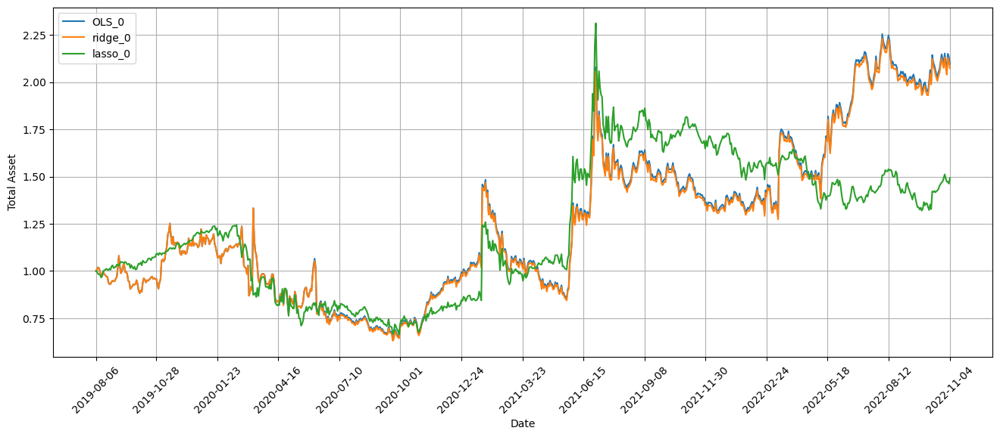

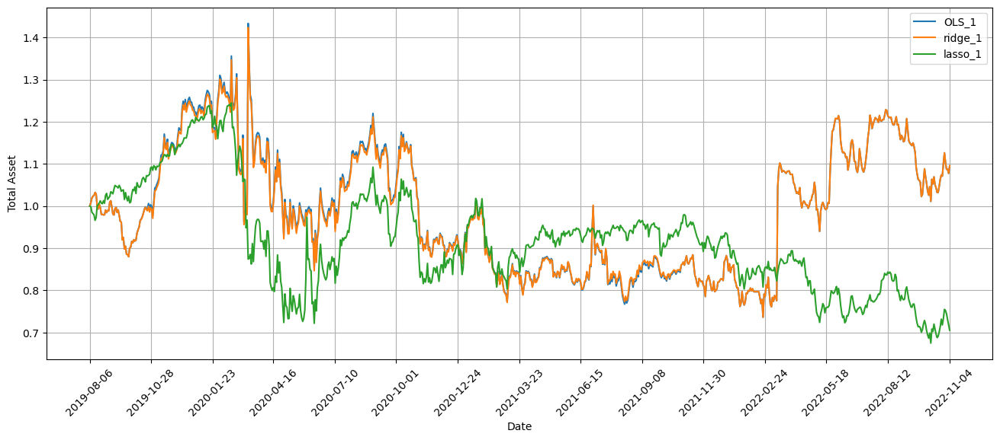

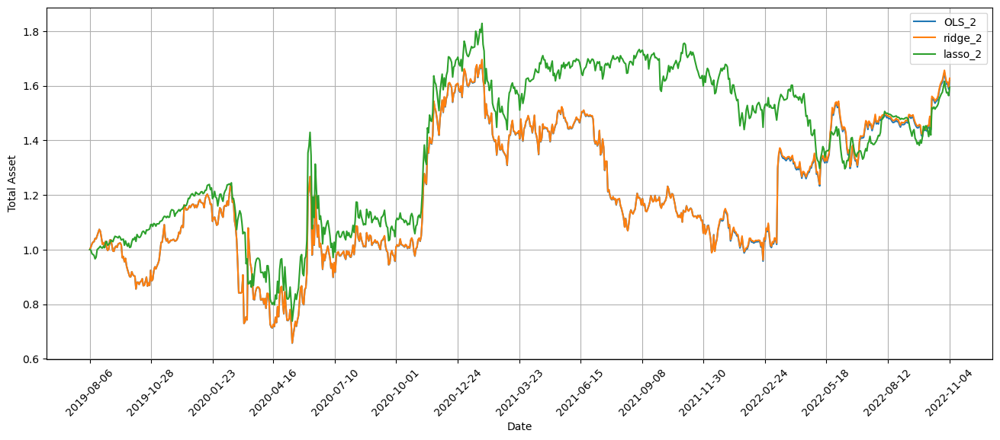

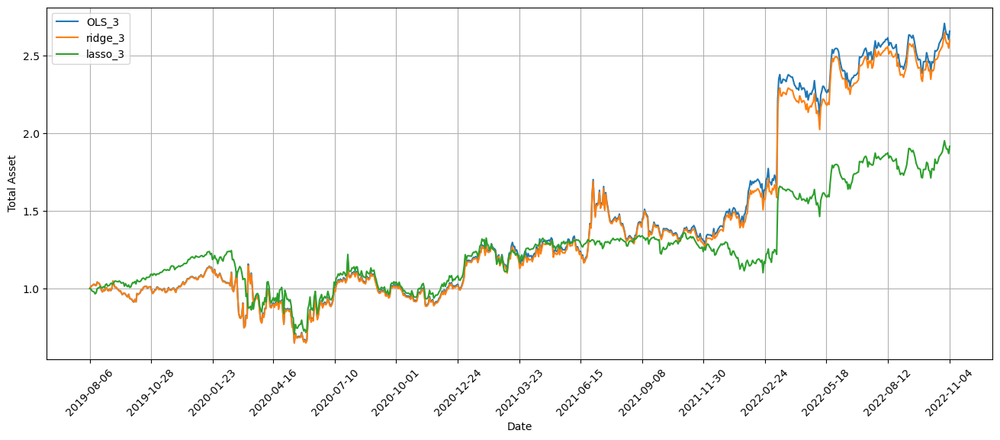

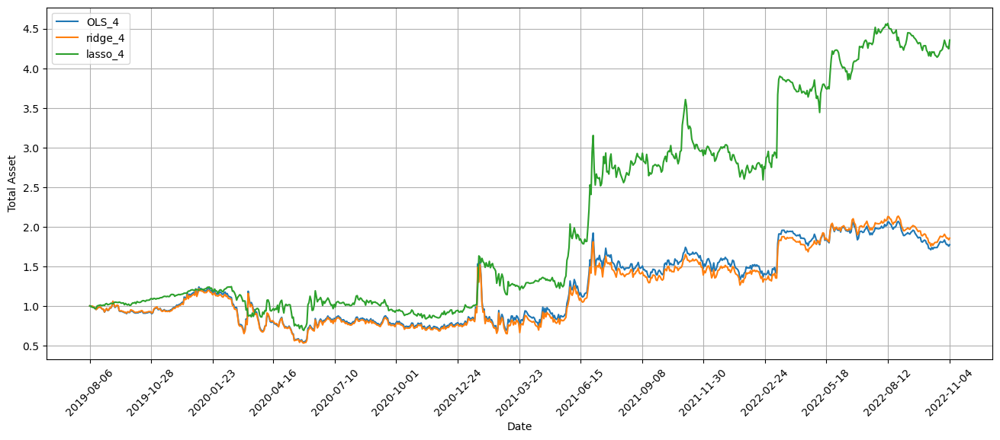

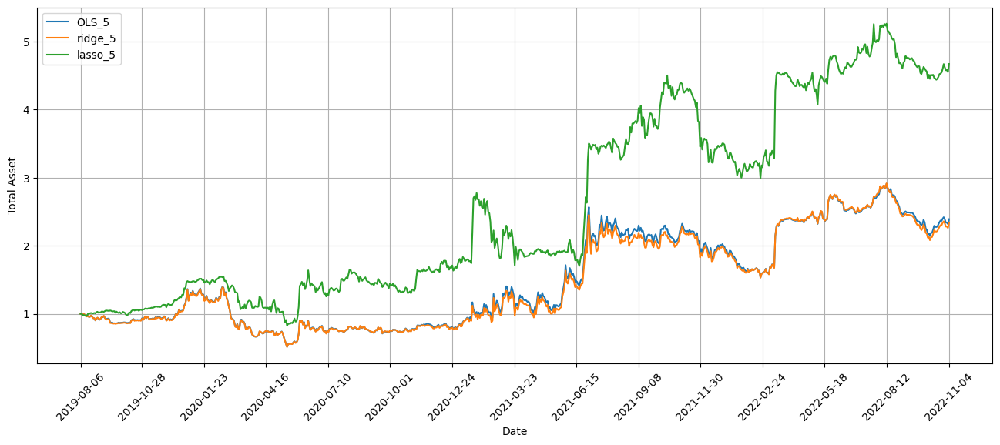

Running 42 of 67 iterations. First iteration already finished
Standardization data are from 2021-04-08 to 2022-01-20
Training data are from 2022-01-21 to 2022-11-04
Testing data are from 2022-10-11 to 2022-12-05
top_stocks by OLS factors 0 to buy on 2022-11-08 are ['CABO', 'TWLO', 'FIS', 'GTN', 'RBA', 'VIAV', 'LNC', 'FNKO', 'KOLD', 'CVNA']
Total asset on 2022-11-09 will be 2.1282927388635824
It should be the same as 2.128292738863607
top_stocks by OLS factors 0 to buy on 2022-11-09 are ['QTWO', 'CABO', 'TDS', 'TTWO', 'KOLD', 'FNKO', 'RBA', 'GTN', 'VIAV', 'CVNA']
Total asset on 2022-11-10 will be 2.1809981746973133
It should be the same as 2.180998174697337
top_stocks by OLS factors 0 to buy on 2022-11-10 are ['LITE', 'BBD', 'D', 'CABO', 'GTN', 'TDS', 'RBA', 'TDW', 'CVNA', 'CARG']
Total asset on 2022-11-11 will be 2.226287831184666
It should be the same as 2.22628783118469
top_stocks by OLS factors 0 to buy on 2022-11-11 are ['RDFN', 'LITE', 'UUP', 'SPDN', 'TMF', 'CVNA', 'BBD', 'SOXS', 

top_stocks by ridge factors 0 to buy on 2022-12-06 are ['BOIL', 'DRIP', 'OGS', 'FLOT', 'GIII', 'TFLO', 'HEFA', 'GBIL', 'SHV', 'BIL']
Total asset on 2022-12-07 will be 2.5955884593507337
It should be the same as 2.5955884593507625
top_stocks by lasso factors 0 to buy on 2022-11-08 are ['WMS', 'CABO', 'RPD', 'TNDM', 'TDS', 'FIS', 'GTN', 'LNC', 'VIAV', 'FNKO']
Total asset on 2022-11-09 will be 1.4916927620834517
It should be the same as 1.491692762083472
top_stocks by lasso factors 0 to buy on 2022-11-09 are ['TEAM', 'CYRX', 'RBA', 'CABO', 'PRLB', 'CVNA', 'TDS', 'FNKO', 'GTN', 'VIAV']
Total asset on 2022-11-10 will be 1.5255383703875363
It should be the same as 1.5255383703875567
top_stocks by lasso factors 0 to buy on 2022-11-10 are ['PRGO', 'VIAV', 'LITE', 'D', 'CVNA', 'CABO', 'GTN', 'RBA', 'CARG', 'TDS']
Total asset on 2022-11-11 will be 1.56116815714527
It should be the same as 1.5611681571452904
top_stocks by lasso factors 0 to buy on 2022-11-11 are ['VSAT', 'ITUB', 'PRGO', 'DIS', 'V

Total asset on 2022-12-05 will be 1.2468279594963596
It should be the same as 1.2468279594963763
top_stocks by OLS factors 1 to buy on 2022-12-05 are ['CM', 'BX', 'FTSM', 'OGS', 'GIII', 'GBIL', 'HEFA', 'TFLO', 'SHV', 'BIL']
Total asset on 2022-12-06 will be 1.2507949001297474
It should be the same as 1.2507949001297636
top_stocks by OLS factors 1 to buy on 2022-12-06 are ['FLOT', 'KSA', 'OGS', 'DBI', 'TFLO', 'GIII', 'GBIL', 'HEFA', 'SHV', 'BIL']
Total asset on 2022-12-07 will be 1.2630652620788796
It should be the same as 1.2630652620788958
top_stocks by ridge factors 1 to buy on 2022-11-08 are ['RPD', 'PRLB', 'VRRM', 'YELP', 'TNDM', 'VIAV', 'WMS', 'LNC', 'GTN', 'FNKO']
Total asset on 2022-11-09 will be 1.1004846950792737
It should be the same as 1.1004846950792833
top_stocks by ridge factors 1 to buy on 2022-11-09 are ['TEAM', 'WMS', 'ROG', 'PRLB', 'EVH', 'CVNA', 'YELP', 'FNKO', 'VIAV', 'GTN']
Total asset on 2022-11-10 will be 1.1393761738347012
It should be the same as 1.139376173834

top_stocks by lasso factors 1 to buy on 2022-12-06 are ['AAP', 'BX', 'DBI', 'KSA', 'TFLO', 'GBIL', 'GIII', 'SHV', 'HEFA', 'BIL']
Total asset on 2022-12-07 will be 0.7872664678079736
It should be the same as 0.787266467807998
top_stocks by OLS factors 2 to buy on 2022-11-08 are ['PRLB', 'RPD', 'WMS', 'TNDM', 'TDS', 'FIS', 'GTN', 'LNC', 'VIAV', 'FNKO']
Total asset on 2022-11-09 will be 1.6149866431603694
It should be the same as 1.6149866431603956
top_stocks by OLS factors 2 to buy on 2022-11-09 are ['CYRX', 'CABO', 'TEAM', 'PRLB', 'RBA', 'CVNA', 'TDS', 'GTN', 'FNKO', 'VIAV']
Total asset on 2022-11-10 will be 1.6517317778198755
It should be the same as 1.6517317778199019
top_stocks by OLS factors 2 to buy on 2022-11-10 are ['PRGO', 'VIAV', 'LITE', 'D', 'CABO', 'CVNA', 'GTN', 'CARG', 'RBA', 'TDS']
Total asset on 2022-11-11 will be 1.6905204870039754
It should be the same as 1.6905204870040018
top_stocks by OLS factors 2 to buy on 2022-11-11 are ['DIS', 'UUP', 'PRGO', 'ITUB', 'VCEL', 'EBS'

Total asset on 2022-12-06 will be 1.9055865033088308
It should be the same as 1.9055865033088513
top_stocks by ridge factors 2 to buy on 2022-12-06 are ['DBI', 'ICSH', 'FLOT', 'OGS', 'GIII', 'TFLO', 'HEFA', 'GBIL', 'SHV', 'BIL']
Total asset on 2022-12-07 will be 1.928832581852981
It should be the same as 1.9288325818530023
top_stocks by lasso factors 2 to buy on 2022-11-08 are ['WMS', 'CABO', 'RPD', 'TNDM', 'TDS', 'FIS', 'GTN', 'LNC', 'VIAV', 'FNKO']
Total asset on 2022-11-09 will be 1.594604971787522
It should be the same as 1.5946049717875448
top_stocks by lasso factors 2 to buy on 2022-11-09 are ['TEAM', 'CYRX', 'RBA', 'CABO', 'PRLB', 'CVNA', 'TDS', 'FNKO', 'GTN', 'VIAV']
Total asset on 2022-11-10 will be 1.6307855960063355
It should be the same as 1.6307855960063586
top_stocks by lasso factors 2 to buy on 2022-11-10 are ['PRGO', 'VIAV', 'LITE', 'D', 'CVNA', 'CABO', 'GTN', 'RBA', 'CARG', 'TDS']
Total asset on 2022-11-11 will be 1.6688734895402944
It should be the same as 1.668873489

top_stocks by OLS factors 3 to buy on 2022-12-05 are ['ICSH', 'FLRN', 'OGS', 'FLOT', 'GIII', 'TFLO', 'HEFA', 'GBIL', 'SHV', 'BIL']
Total asset on 2022-12-06 will be 3.0972480986406965
It should be the same as 3.0972480986407263
top_stocks by OLS factors 3 to buy on 2022-12-06 are ['ADM', 'GIII', 'NWN', 'CM', 'BIP', 'CBRL', 'SR', 'BIL', 'OGS', 'HEFA']
Total asset on 2022-12-07 will be 3.1173156149230175
It should be the same as 3.1173156149230477
top_stocks by ridge factors 3 to buy on 2022-11-08 are ['CABO', 'CYRX', 'TEAM', 'CVNA', 'TWLO', 'PRLB', 'TDS', 'GTN', 'VIAV', 'FNKO']
Total asset on 2022-11-09 will be 2.5709993874360757
It should be the same as 2.5709993874361037
top_stocks by ridge factors 3 to buy on 2022-11-09 are ['LITE', 'TTWO', 'QTWO', 'OMCL', 'CABO', 'VIAV', 'TDS', 'RBA', 'GTN', 'CVNA']
Total asset on 2022-11-10 will be 2.6443165618641413
It should be the same as 2.6443165618641697
top_stocks by ridge factors 3 to buy on 2022-11-10 are ['CHH', 'JKHY', 'TTWO', 'PRGO', 'D

Total asset on 2022-11-30 will be 2.094426634721804
It should be the same as 2.0944266347218314
top_stocks by lasso factors 3 to buy on 2022-11-30 are ['ELME', 'HYG', 'RLI', 'USHY', 'SHYG', 'SJNK', 'HYS', 'HYLB', 'HAIN', 'BKLN']
Total asset on 2022-12-01 will be 2.1250512568061026
It should be the same as 2.12505125680613
top_stocks by lasso factors 3 to buy on 2022-12-01 are ['OMCL', 'O', 'SPMB', 'BKLN', 'TRP', 'PGX', 'YANG', 'AVXL', 'NTAP', 'FTSM']
Total asset on 2022-12-02 will be 2.2052883761568745
It should be the same as 2.205288376156902
top_stocks by lasso factors 3 to buy on 2022-12-02 are ['JPST', 'FLOT', 'ICSH', 'NEAR', 'GIII', 'FTSM', 'TFLO', 'GBIL', 'SHV', 'BIL']
Total asset on 2022-12-05 will be 2.216430225691927
It should be the same as 2.216430225691955
top_stocks by lasso factors 3 to buy on 2022-12-05 are ['ICSH', 'FLRN', 'OGS', 'FLOT', 'GIII', 'TFLO', 'HEFA', 'GBIL', 'SHV', 'BIL']
Total asset on 2022-12-06 will be 2.2311121150804247
It should be the same as 2.2311121

Total asset on 2022-11-28 will be 1.9176732075747847
It should be the same as 1.9176732075748104
top_stocks by ridge factors 4 to buy on 2022-11-28 are ['GSG', 'USO', 'SHV', 'BNO', 'DBO', 'TFLO', 'OMCL', 'USFR', 'BIL', 'GBIL']
Total asset on 2022-11-29 will be 1.9424870804242484
It should be the same as 1.942487080424274
top_stocks by ridge factors 4 to buy on 2022-11-29 are ['BOIL', 'FLOT', 'TFLO', 'SMCI', 'UNG', 'OMCL', 'SHV', 'CPRX', 'GBIL', 'BIL']
Total asset on 2022-11-30 will be 1.9426672336557738
It should be the same as 1.942667233655799
top_stocks by ridge factors 4 to buy on 2022-11-30 are ['OPK', 'CPRX', 'MCK', 'SMCI', 'KOLD', 'OMCL', 'AQN', 'SHV', 'GBIL', 'BIL']
Total asset on 2022-12-01 will be 1.984419798935756
It should be the same as 1.9844197989357808
top_stocks by ridge factors 4 to buy on 2022-12-01 are ['CALM', 'HSY', 'USFR', 'KOLD', 'OMCL', 'SHV', 'TFLO', 'FTSM', 'BIL', 'GBIL']
Total asset on 2022-12-02 will be 2.01665712406964
It should be the same as 2.0166571240

Total asset on 2022-11-28 will be 2.518661527592952
It should be the same as 2.5186615275929816
top_stocks by OLS factors 5 to buy on 2022-11-28 are ['USO', 'SDOW', 'AQN', 'BNO', 'DBO', 'DY', 'OMCL', 'BIL', 'USFR', 'GBIL']
Total asset on 2022-11-29 will be 2.5427571021785975
It should be the same as 2.5427571021786277
top_stocks by OLS factors 5 to buy on 2022-11-29 are ['CARG', 'JD', 'EQT', 'BOIL', 'QD', 'SIGA', 'UNG', 'OMCL', 'CPRX', 'BIL']
Total asset on 2022-11-30 will be 2.5823813295646265
It should be the same as 2.5823813295646567
top_stocks by OLS factors 5 to buy on 2022-11-30 are ['MANU', 'ORA', 'SIGA', 'DY', 'CEIX', 'OPK', 'OMCL', 'AQN', 'GBIL', 'BIL']
Total asset on 2022-12-01 will be 2.6337737069074945
It should be the same as 2.6337737069075247
top_stocks by OLS factors 5 to buy on 2022-12-01 are ['DY', 'DHT', 'AEP', 'YANG', 'CALM', 'AVXL', 'GBIL', 'OMCL', 'AQN', 'USFR']
Total asset on 2022-12-02 will be 2.714560390488435
It should be the same as 2.7145603904884643
top_st

top_stocks by lasso factors 5 to buy on 2022-11-21 are ['RGEN', 'BGS', 'CABO', 'CVNA', 'WST', 'CHRS', 'OMCL', 'BKD', 'CTLT', 'AQN']
Total asset on 2022-11-22 will be 4.816072380927692
It should be the same as 4.816072380927737
top_stocks by lasso factors 5 to buy on 2022-11-22 are ['CVNA', 'BNO', 'DBO', 'LYV', 'ROG', 'AAP', 'CTLT', 'OMCL', 'AQN', 'GSY']
Total asset on 2022-11-23 will be 4.801281731000505
It should be the same as 4.801281731000551
top_stocks by lasso factors 5 to buy on 2022-11-23 are ['TDS', 'CTLT', 'BKLN', 'HELE', 'PBR-A', 'PBR', 'AQN', 'OMCL', 'CVNA', 'GSY']
Total asset on 2022-11-25 will be 4.8963243781975265
It should be the same as 4.8963243781975745
top_stocks by lasso factors 5 to buy on 2022-11-25 are ['CVNA', 'UUP', 'OMCL', 'CTLT', 'DY', 'PBR', 'PBR-A', 'JACK', 'AQN', 'USFR']
Total asset on 2022-11-28 will be 4.865616263619112
It should be the same as 4.8656162636191596
top_stocks by lasso factors 5 to buy on 2022-11-28 are ['JDST', 'SDOW', 'CTLT', 'GDS', 'DY'

Total asset on 2022-12-13 will be 2.770260699879289
It should be the same as 2.770260699879317
top_stocks by ridge factors 0 to buy on 2022-12-13 are ['LNC', 'SOXS', 'YANG', 'YINN', 'NEOG', 'KURA', 'AOR', 'ASND', 'TMF', 'KOLD']
Total asset on 2022-12-14 will be 2.7910362562981006
It should be the same as 2.791036256298129
top_stocks by ridge factors 0 to buy on 2022-12-14 are ['ERY', 'YINN', 'YANG', 'UUP', 'EWT', 'TV', 'COMT', 'SOXS', 'TMF', 'KOLD']
Total asset on 2022-12-15 will be 2.835794487097797
It should be the same as 2.8357944870978256
top_stocks by ridge factors 0 to buy on 2022-12-15 are ['SCO', 'NEOG', 'CVNA', 'DRIP', 'CHTR', 'EWT', 'COMT', 'SOXS', 'TMF', 'KOLD']
Total asset on 2022-12-16 will be 2.881807441757113
It should be the same as 2.8818074417571404
top_stocks by ridge factors 0 to buy on 2022-12-16 are ['LBRDA', 'SOXS', 'NEAR', 'COMT', 'IAGG', 'CVNA', 'TMF', 'TFLO', 'SHV', 'KOLD']
Total asset on 2022-12-19 will be 2.8672012705397134
It should be the same as 2.867201

Total asset on 2022-12-13 will be 1.362312039778606
It should be the same as 1.3623120397786224
top_stocks by OLS factors 1 to buy on 2022-12-13 are ['HEFA', 'PARR', 'DBI', 'CVI', 'MLKN', 'ADNT', 'VRRM', 'LNC', 'OZK', 'DINO']
Total asset on 2022-12-14 will be 1.3309655945680976
It should be the same as 1.3309655945681138
top_stocks by OLS factors 1 to buy on 2022-12-14 are ['CENN', 'SFNC', 'CORT', 'GSAT', 'DINO', 'DBI', 'UUP', 'EWT', 'CAL', 'COMT']
Total asset on 2022-12-15 will be 1.305257307903906
It should be the same as 1.3052573079039225
top_stocks by OLS factors 1 to buy on 2022-12-15 are ['CORT', 'DDS', 'KODK', 'DBI', 'CBSH', 'CAL', 'CFR', 'CODX', 'EWT', 'COMT']
Total asset on 2022-12-16 will be 1.2740695731651759
It should be the same as 1.2740695731651925
top_stocks by OLS factors 1 to buy on 2022-12-16 are ['SFNC', 'KODK', 'CBSH', 'PCRX', 'SFBS', 'CFR', 'EWT', 'COMT', 'SHV', 'TFLO']
Total asset on 2022-12-19 will be 1.2754796550014187
It should be the same as 1.27547965500143

top_stocks by lasso factors 1 to buy on 2022-12-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-12-08 will be 0.7912682586437423
It should be the same as 0.7912682586437666
top_stocks by lasso factors 1 to buy on 2022-12-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-12-09 will be 0.7877633840281674
It should be the same as 0.7877633840281918
top_stocks by lasso factors 1 to buy on 2022-12-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-12-12 will be 0.7826971054261662
It should be the same as 0.7826971054261906
top_stocks by lasso factors 1 to buy on 2022-12-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-12-13 will be 0.813550055394166
It should be the same as 0.8135500553941903
top_stocks by lasso factors 1 to buy on 2022-12-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2023-01-03 will be 2.0465749781704874
It should be the same as 2.046574978170517
top_stocks by OLS factors 2 to buy on 2023-01-03 are ['HYG', 'SPHY', 'JPST', 'JNK', 'PFFD', 'BKLN', 'HYS', 'SRLN', 'FTSL', 'MINT']
Total asset on 2023-01-04 will be 2.053840899599663
It should be the same as 2.053840899599693
top_stocks by OLS factors 2 to buy on 2023-01-04 are ['BDN', 'BGS', 'BAC-PL', 'SRLN', 'BXMT', 'CIM', 'BKLN', 'JPST', 'FTSL', 'MINT']
Total asset on 2023-01-05 will be 2.075373619728529
It should be the same as 2.075373619728559
top_stocks by OLS factors 2 to buy on 2023-01-05 are ['EQNR', 'DEI', 'PBR-A', 'BRZU', 'EWZ', 'BGS', 'CIG', 'BDN', 'BBD', 'STIP']
Total asset on 2023-01-06 will be 2.1332443176797544
It should be the same as 2.1332443176797837
top_stocks by ridge factors 2 to buy on 2022-12-07 are ['SLG', 'BXMT', 'SR', 'BAX', 'KRC', 'DEI', 'PDM', 'BDN', 'FTSL', 'HEFA']
Total asset on 2022-12-08 will be 1.9345015588869114
It should be the same as 1.9345015588869328

Total asset on 2022-12-29 will be 1.7233219451262602
It should be the same as 1.7233219451262858
top_stocks by lasso factors 2 to buy on 2022-12-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2022-12-30 will be 1.7291622028211335
It should be the same as 1.729162202821159
top_stocks by lasso factors 2 to buy on 2022-12-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-03 will be 1.748543904087218
It should be the same as 1.7485439040872441
top_stocks by lasso factors 2 to buy on 2023-01-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-04 will be 1.733737359053261
It should be the same as 1.7337373590532872
top_stocks by lasso factors 2 to buy on 2023-01-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-05 will be 1.733339226997314
It should be the same as 1.73333922699734
t

Total asset on 2022-12-29 will be 3.116014429760356
It should be the same as 3.1160144297603876
top_stocks by ridge factors 3 to buy on 2022-12-29 are ['RILY', 'IDEX', 'NTNX', 'TSLA', 'VMBS', 'VTIP', 'FTSM', 'USFR', 'GBIL', 'VNLA']
Total asset on 2022-12-30 will be 3.1738528617393316
It should be the same as 3.173852861739363
top_stocks by ridge factors 3 to buy on 2022-12-30 are ['FTSL', 'HYS', 'SPMB', 'MBB', 'VMBS', 'VTIP', 'FTSM', 'USFR', 'GBIL', 'VNLA']
Total asset on 2023-01-03 will be 3.1838093803609406
It should be the same as 3.1838093803609735
top_stocks by ridge factors 3 to buy on 2023-01-03 are ['MBB', 'MINT', 'PFFD', 'VMBS', 'CALM', 'VTIP', 'FTSM', 'USFR', 'GBIL', 'VNLA']
Total asset on 2023-01-04 will be 3.1933434709711084
It should be the same as 3.1933434709711417
top_stocks by ridge factors 3 to buy on 2023-01-04 are ['HYD', 'HYLS', 'ERIE', 'LMBS', 'CIM', 'BKLN', 'CALM', 'JPST', 'MINT', 'GBIL']
Total asset on 2023-01-05 will be 3.217921223266125
It should be the same a

Total asset on 2022-12-29 will be 1.9932962086863466
It should be the same as 1.9932962086863726
top_stocks by OLS factors 4 to buy on 2022-12-29 are ['FATE', 'TBF', 'IDEX', 'YANG', 'TFLO', 'TBT', 'GBIL', 'TMV', 'VKTX', 'MDGL']
Total asset on 2022-12-30 will be 2.0406206769197066
It should be the same as 2.040620676919733
top_stocks by OLS factors 4 to buy on 2022-12-30 are ['FATE', 'TBT', 'AQN', 'VTIP', 'FTSM', 'TMV', 'VKTX', 'USFR', 'VNLA', 'MDGL']
Total asset on 2023-01-03 will be 2.018319382493143
It should be the same as 2.0183193824931687
top_stocks by OLS factors 4 to buy on 2023-01-03 are ['TFLO', 'VTIP', 'TMV', 'VKTX', 'FTSM', 'USFR', 'BIL', 'MDGL', 'GBIL', 'VNLA']
Total asset on 2023-01-04 will be 1.9828313716715171
It should be the same as 1.9828313716715433
top_stocks by OLS factors 4 to buy on 2023-01-04 are ['SHV', 'TBT', 'YANG', 'TMV', 'VKTX', 'CHRS', 'TFLO', 'MDGL', 'BIL', 'GBIL']
Total asset on 2023-01-05 will be 2.0150945546525714
It should be the same as 2.0150945546

Total asset on 2022-12-28 will be 5.073540300273834
It should be the same as 5.073540300273859
top_stocks by lasso factors 4 to buy on 2022-12-28 are ['FTSM', 'TSLA', 'HEFA', 'VTIP', 'BIP', 'BIL', 'AQN', 'USFR', 'GBIL', 'VNLA']
Total asset on 2022-12-29 will be 5.112182169402584
It should be the same as 5.112182169402608
top_stocks by lasso factors 4 to buy on 2022-12-29 are ['ATRA', 'TFLO', 'HEFA', 'TSLA', 'VTIP', 'BIP', 'AQN', 'USFR', 'GBIL', 'VNLA']
Total asset on 2022-12-30 will be 5.121127303634052
It should be the same as 5.121127303634076
top_stocks by lasso factors 4 to buy on 2022-12-30 are ['SJNK', 'HEFA', 'VTIP', 'HYS', 'FTSL', 'BIP', 'AQN', 'USFR', 'GBIL', 'VNLA']
Total asset on 2023-01-03 will be 5.139157287728046
It should be the same as 5.139157287728068
top_stocks by lasso factors 4 to buy on 2023-01-03 are ['BXMT', 'DBEF', 'BIP', 'CALM', 'VTIP', 'HEFA', 'AQN', 'USFR', 'GBIL', 'VNLA']
Total asset on 2023-01-04 will be 5.192038227377182
It should be the same as 5.1920382

top_stocks by ridge factors 5 to buy on 2022-12-23 are ['FDS', 'GSY', 'WBD', 'DEA', 'BIP', 'CVNA', 'YANG', 'INSG', 'QRTEA', 'AQN']
Total asset on 2022-12-27 will be 2.731637860082112
It should be the same as 2.7316378600821465
top_stocks by ridge factors 5 to buy on 2022-12-27 are ['IDEX', 'GSY', 'CVNA', 'SRNE', 'FATE', 'KMX', 'QRTEA', 'USFR', 'AQN', 'BIL']
Total asset on 2022-12-28 will be 2.6475386447021205
It should be the same as 2.647538644702155
top_stocks by ridge factors 5 to buy on 2022-12-28 are ['IDEX', 'CVNA', 'VTIP', 'TMV', 'GBIL', 'FTSM', 'AQN', 'USFR', 'MDGL', 'VNLA']
Total asset on 2022-12-29 will be 2.664368992112076
It should be the same as 2.6643689921121116
top_stocks by ridge factors 5 to buy on 2022-12-29 are ['YANG', 'NKTR', 'AQN', 'CHRS', 'FATE', 'TMV', 'IDEX', 'TFLO', 'GBIL', 'MDGL']
Total asset on 2022-12-30 will be 2.762905914165415
It should be the same as 2.76290591416545
top_stocks by ridge factors 5 to buy on 2022-12-30 are ['IDEX', 'VTIP', 'USFR', 'ATRA'

Total asset on 2023-01-17 will be 3.224688869838939
It should be the same as 3.2246888698389657
top_stocks by OLS factors 0 to buy on 2023-01-17 are ['AQN', 'TFX', 'MKC', 'FLOT', 'ELF', 'LABD', 'TNDM', 'ABBV', 'CVLT', 'LOGI']
Total asset on 2023-01-18 will be 3.296153807196236
It should be the same as 3.296153807196262
top_stocks by OLS factors 0 to buy on 2023-01-18 are ['MKC', 'ABBV', 'UUP', 'CVLT', 'TFX', 'TNDM', 'NOC', 'AQN', 'LOGI', 'XELA']
Total asset on 2023-01-19 will be 3.189924732240048
It should be the same as 3.189924732240075
top_stocks by OLS factors 0 to buy on 2023-01-19 are ['XELA', 'BKD', 'TRV', 'UNG', 'POR', 'EEMV', 'NOC', 'BOIL', 'PNC', 'EMR']
Total asset on 2023-01-20 will be 3.167374747484348
It should be the same as 3.167374747484375
top_stocks by OLS factors 0 to buy on 2023-01-20 are ['VZ', 'SMCI', 'VRE', 'FDL', 'CHRS', 'PNC', 'FULT', 'ALL', 'IIPR', 'EMR']
Total asset on 2023-01-23 will be 3.1929928183111764
It should be the same as 3.192992818311203
top_stocks

Total asset on 2023-01-12 will be 1.756746861462494
It should be the same as 1.7567468614625148
top_stocks by lasso factors 0 to buy on 2023-01-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-13 will be 1.764357650181492
It should be the same as 1.7643576501815128
top_stocks by lasso factors 0 to buy on 2023-01-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-17 will be 1.7764519801796566
It should be the same as 1.7764519801796774
top_stocks by lasso factors 0 to buy on 2023-01-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-18 will be 1.779778845216828
It should be the same as 1.7797788452168488
top_stocks by lasso factors 0 to buy on 2023-01-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-01-19 will be 1.7573234884261222
It should be the same as 1.757323488426143

top_stocks by ridge factors 1 to buy on 2023-01-06 are ['LIN', 'FTGC', 'INSW', 'PANW', 'MOH', 'UNG', 'BOIL', 'MGPI', 'HSY', 'EQNR']
Total asset on 2023-01-09 will be 1.3027011653895202
It should be the same as 1.302701165389531
top_stocks by ridge factors 1 to buy on 2023-01-09 are ['MSFT', 'UNG', 'BOIL', 'STZ', 'MGPI', 'HSY', 'PANW', 'RPM', 'MOH', 'FATE']
Total asset on 2023-01-10 will be 1.315956312683774
It should be the same as 1.3159563126837848
top_stocks by ridge factors 1 to buy on 2023-01-10 are ['FAZ', 'DUST', 'UNG', 'PANW', 'BOIL', 'MOH', 'MGPI', 'RPM', 'GBX', 'FATE']
Total asset on 2023-01-11 will be 1.320051024882328
It should be the same as 1.3200510248823387
top_stocks by ridge factors 1 to buy on 2023-01-11 are ['EQNR', 'TRN', 'UNG', 'BOIL', 'MOH', 'BAX', 'PANW', 'BOX', 'GBX', 'FATE']
Total asset on 2023-01-12 will be 1.3606403742406181
It should be the same as 1.3606403742406292
top_stocks by ridge factors 1 to buy on 2023-01-12 are ['UUP', 'TRN', 'BAX', 'UNG', 'BOIL',

Total asset on 2023-02-06 will be 0.8461381008991697
It should be the same as 0.8461381008991957
top_stocks by OLS factors 2 to buy on 2023-01-06 are ['CACC', 'LIVN', 'SPIP', 'TIP', 'CUZ', 'KRC', 'BXP', 'STIP', 'DEI', 'BDN']
Total asset on 2023-01-09 will be 2.1746236344259304
It should be the same as 2.17462363442596
top_stocks by OLS factors 2 to buy on 2023-01-09 are ['STIP', 'PDM', 'RPM', 'KRC', 'HIW', 'DEI', 'BXP', 'CUZ', 'FATE', 'BDN']
Total asset on 2023-01-10 will be 2.1897919451165326
It should be the same as 2.1897919451165624
top_stocks by OLS factors 2 to buy on 2023-01-10 are ['ARWR', 'HIW', 'RPM', 'DEI', 'GBX', 'PDM', 'BAX', 'KRC', 'BDN', 'FATE']
Total asset on 2023-01-11 will be 2.2710263730189575
It should be the same as 2.2710263730189872
top_stocks by OLS factors 2 to buy on 2023-01-11 are ['BXP', 'HIW', 'AKR', 'PDM', 'KRC', 'GBX', 'DEI', 'FATE', 'BAX', 'BDN']
Total asset on 2023-01-12 will be 2.339509136201453
It should be the same as 2.339509136201483
top_stocks by 

Total asset on 2023-02-06 will be 2.524009571624311
It should be the same as 2.52400957162434
top_stocks by lasso factors 2 to buy on 2023-01-06 are ['EEMV', 'HAS', 'HIW', 'STIP', 'KRC', 'SRLN', 'DEI', 'BGS', 'FTSL', 'BDN']
Total asset on 2023-01-09 will be 1.7770480277037193
It should be the same as 1.7770480277037453
top_stocks by lasso factors 2 to buy on 2023-01-09 are ['PDM', 'HAS', 'HIW', 'STIP', 'KRC', 'SRLN', 'DEI', 'BGS', 'FTSL', 'BDN']
Total asset on 2023-01-10 will be 1.757910585547924
It should be the same as 1.7579105855479504
top_stocks by lasso factors 2 to buy on 2023-01-10 are ['PDM', 'HAS', 'HIW', 'STIP', 'KRC', 'SRLN', 'DEI', 'BGS', 'FTSL', 'BDN']
Total asset on 2023-01-11 will be 1.79271836928788
It should be the same as 1.7927183692879067
top_stocks by lasso factors 2 to buy on 2023-01-11 are ['PDM', 'HAS', 'HIW', 'STIP', 'KRC', 'SRLN', 'DEI', 'BGS', 'FTSL', 'BDN']
Total asset on 2023-01-12 will be 1.83995225021889
It should be the same as 1.8399522502189165
top_st

top_stocks by ridge factors 3 to buy on 2023-01-06 are ['PBR-A', 'PBR', 'LIN', 'ADM', 'HSY', 'MINT', 'ERIE', 'EQNR', 'CALM', 'JPST']
Total asset on 2023-01-09 will be 3.240415628016018
It should be the same as 3.240415628016052
top_stocks by ridge factors 3 to buy on 2023-01-09 are ['TPL', 'CACC', 'BBD', 'CALM', 'HSY', 'STZ', 'ADM', 'RPM', 'EQNR', 'FATE']
Total asset on 2023-01-10 will be 3.2955078448006985
It should be the same as 3.2955078448007327
top_stocks by ridge factors 3 to buy on 2023-01-10 are ['HSY', 'CI', 'UNH', 'ADM', 'STZ', 'AES', 'CACC', 'RPM', 'EQNR', 'FATE']
Total asset on 2023-01-11 will be 3.3320336911423385
It should be the same as 3.3320336911423722
top_stocks by ridge factors 3 to buy on 2023-01-11 are ['UNH', 'CUZ', 'MSFT', 'LPG', 'ADM', 'STZ', 'GBX', 'CACC', 'RPM', 'FATE']
Total asset on 2023-01-12 will be 3.3862068914806565
It should be the same as 3.3862068914806898
top_stocks by ridge factors 3 to buy on 2023-01-12 are ['AVA', 'TRN', 'UNH', 'ARWR', 'SITC', '

Total asset on 2023-02-03 will be 2.7576101902815804
It should be the same as 2.757610190281609
top_stocks by lasso factors 3 to buy on 2023-02-03 are ['FLOT', 'FLRN', 'CB', 'FTSM', 'ICSH', 'JPST', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-06 will be 2.756516914004287
It should be the same as 2.7565169140043158
top_stocks by OLS factors 4 to buy on 2023-01-06 are ['AQN', 'YANG', 'VKTX', 'BXMT', 'TMV', 'JPST', 'SHV', 'TFLO', 'MDGL', 'BIL']
Total asset on 2023-01-09 will be 2.0076482768435846
It should be the same as 2.007648276843611
top_stocks by OLS factors 4 to buy on 2023-01-09 are ['IIPR', 'TSLA', 'VKTX', 'BOIL', 'MDGL', 'BIP', 'YANG', 'TFLO', 'FATE', 'BIL']
Total asset on 2023-01-10 will be 2.0462924292546067
It should be the same as 2.0462924292546325
top_stocks by OLS factors 4 to buy on 2023-01-10 are ['BOIL', 'TMV', 'JDST', 'VKTX', 'DUST', 'BIP', 'YANG', 'FATE', 'TFLO', 'BIL']
Total asset on 2023-01-11 will be 2.043217507592816
It should be the same as 2.04321750759

Total asset on 2023-02-03 will be 2.1477838798108246
It should be the same as 2.1477838798108535
top_stocks by ridge factors 4 to buy on 2023-02-03 are ['JPST', 'BOIL', 'NTCT', 'LPG', 'PCAR', 'LRN', 'AIT', 'SHV', 'TFLO', 'GBIL']
Total asset on 2023-02-06 will be 2.1367041846957657
It should be the same as 2.136704184695794
top_stocks by lasso factors 4 to buy on 2023-01-06 are ['CUZ', 'EWT', 'PEB', 'STIP', 'BGS', 'KRC', 'BXP', 'DEI', 'BXMT', 'BDN']
Total asset on 2023-01-09 will be 5.387143308724232
It should be the same as 5.387143308724256
top_stocks by lasso factors 4 to buy on 2023-01-09 are ['BXMT', 'PEB', 'BGS', 'PDM', 'CUZ', 'BXP', 'KRC', 'DEI', 'BDN', 'FATE']
Total asset on 2023-01-10 will be 5.424058456535428
It should be the same as 5.424058456535451
top_stocks by lasso factors 4 to buy on 2023-01-10 are ['PDM', 'PEB', 'CUZ', 'BXP', 'BAX', 'GBX', 'KRC', 'DEI', 'BDN', 'FATE']
Total asset on 2023-01-11 will be 5.615787348919942
It should be the same as 5.615787348919966
top_sto

Total asset on 2023-02-02 will be 2.8486945068628247
It should be the same as 2.848694506862854
top_stocks by OLS factors 5 to buy on 2023-02-02 are ['AQN', 'DEO', 'BIP', 'CBU', 'DFS', 'BHC', 'LRN', 'PCAR', 'TFLO', 'GBIL']
Total asset on 2023-02-03 will be 2.8446816912935446
It should be the same as 2.8446816912935735
top_stocks by OLS factors 5 to buy on 2023-02-03 are ['SANM', 'TFLO', 'DFS', 'PCAR', 'JPST', 'AIT', 'LPG', 'VNLA', 'SHV', 'GBIL']
Total asset on 2023-02-06 will be 2.8403636528177203
It should be the same as 2.840363652817749
top_stocks by ridge factors 5 to buy on 2023-01-06 are ['AQN', 'XPO', 'BXMT', 'YANG', 'MDGL', 'TBT', 'TMV', 'BIP', 'VKTX', 'BIL']
Total asset on 2023-01-09 will be 2.621953400797447
It should be the same as 2.6219534007974823
top_stocks by ridge factors 5 to buy on 2023-01-09 are ['UNG', 'LIN', 'CACC', 'WING', 'BOIL', 'YANG', 'VKTX', 'FATE', 'BIP', 'BIL']
Total asset on 2023-01-10 will be 2.6488669341972533
It should be the same as 2.648866934197288


top_stocks by lasso factors 5 to buy on 2023-01-31 are ['FATE', 'BOIL', 'PLXS', 'FTSL', 'BGS', 'FIBK', 'CBU', 'BDN', 'HAS', 'USFR']
Total asset on 2023-02-01 will be 6.654889433881188
It should be the same as 6.654889433881237
top_stocks by lasso factors 5 to buy on 2023-02-01 are ['BAX', 'BGS', 'PLXS', 'BOIL', 'CBU', 'ITGR', 'FTSM', 'USFR', 'BDN', 'HAS']
Total asset on 2023-02-02 will be 6.769801202125425
It should be the same as 6.769801202125474
top_stocks by lasso factors 5 to buy on 2023-02-02 are ['FTSM', 'JPST', 'BDN', 'BOIL', 'ICSH', 'HAS', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-03 will be 6.7480545609748495
It should be the same as 6.748054560974898
top_stocks by lasso factors 5 to buy on 2023-02-03 are ['BAX', 'BOIL', 'ICSH', 'FTSM', 'JPST', 'HAS', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-06 will be 6.726736751371443
It should be the same as 6.726736751371494
OLS 0 has SR 0.400796594893949
OLS 1 has SR 0.5400355751820167
OLS 2 has SR 1.00542837528750

Total asset on 2023-02-21 will be 3.231436267742395
It should be the same as 3.231436267742425
top_stocks by ridge factors 0 to buy on 2023-02-21 are ['MUB', 'SPMB', 'PZA', 'HYD', 'CMF', 'SUB', 'VTEB', 'TFI', 'SHM', 'AKAM']
Total asset on 2023-02-22 will be 3.2284931467462776
It should be the same as 3.228493146746307
top_stocks by ridge factors 0 to buy on 2023-02-22 are ['HYMB', 'ITM', 'CMF', 'HYD', 'TFI', 'MUB', 'SUB', 'PZA', 'VTEB', 'SHM']
Total asset on 2023-02-23 will be 3.2291680579306887
It should be the same as 3.2291680579307185
top_stocks by ridge factors 0 to buy on 2023-02-23 are ['CGNX', 'SUB', 'PZA', 'UFPI', 'GSY', 'NDSN', 'KEYS', 'SHM', 'EQC', 'USFR']
Total asset on 2023-02-24 will be 3.2077781965702683
It should be the same as 3.2077781965702976
top_stocks by ridge factors 0 to buy on 2023-02-24 are ['CRL', 'NDSN', 'DPZ', 'ENOV', 'HOUS', 'GSY', 'KEYS', 'MANU', 'USFR', 'EQC']
Total asset on 2023-02-27 will be 3.175192227277054
It should be the same as 3.1751922272770834

Total asset on 2023-02-15 will be 1.3324375770338934
It should be the same as 1.3324375770339123
top_stocks by OLS factors 1 to buy on 2023-02-15 are ['FIS', 'GMED', 'XPO', 'AIN', 'NWSA', 'SIRI', 'NWS', 'SSRM', 'TOON', 'SRNE']
Total asset on 2023-02-16 will be 1.3233865919937562
It should be the same as 1.3233865919937746
top_stocks by OLS factors 1 to buy on 2023-02-16 are ['GLD', 'FIS', 'SIRI', 'GFI', 'AZUL', 'BTG', 'GEO', 'SSRM', 'TOON', 'SRNE']
Total asset on 2023-02-17 will be 1.360725659061379
It should be the same as 1.3607256590613979
top_stocks by OLS factors 1 to buy on 2023-02-17 are ['SABR', 'NTR', 'TROX', 'MCY', 'KT', 'AFG', 'DVN', 'AKAM', 'GEO', 'SRNE']
Total asset on 2023-02-21 will be 1.3666195205536722
It should be the same as 1.3666195205536915
top_stocks by OLS factors 1 to buy on 2023-02-21 are ['LLY', 'PZA', 'KT', 'CMF', 'VTEB', 'DVN', 'TFI', 'SUB', 'SHM', 'AKAM']
Total asset on 2023-02-22 will be 1.3651950599471934
It should be the same as 1.3651950599472127
top_s

Total asset on 2023-02-10 will be 0.8564056281130791
It should be the same as 0.8564056281131049
top_stocks by lasso factors 1 to buy on 2023-02-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-02-13 will be 0.8535944619241611
It should be the same as 0.8535944619241869
top_stocks by lasso factors 1 to buy on 2023-02-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-02-14 will be 0.8559536878802388
It should be the same as 0.8559536878802647
top_stocks by lasso factors 1 to buy on 2023-02-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-02-15 will be 0.8639017872456928
It should be the same as 0.8639017872457188
top_stocks by lasso factors 1 to buy on 2023-02-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-02-16 will be 0.8736450533185421
It should be the same as 0.873645053318

Total asset on 2023-02-10 will be 2.4156398444277705
It should be the same as 2.4156398444277998
top_stocks by ridge factors 2 to buy on 2023-02-10 are ['HIW', 'GTN', 'CUZ', 'BXP', 'DEI', 'LUMN', 'BAX', 'BXMT', 'BGS', 'BDN']
Total asset on 2023-02-13 will be 2.449192365274264
It should be the same as 2.449192365274293
top_stocks by ridge factors 2 to buy on 2023-02-13 are ['HELE', 'IFF', 'LUMN', 'BXP', 'CUZ', 'BAX', 'DEI', 'BXMT', 'BDN', 'BGS']
Total asset on 2023-02-14 will be 2.474598893281963
It should be the same as 2.474598893281992
top_stocks by ridge factors 2 to buy on 2023-02-14 are ['CUZ', 'AKR', 'KRC', 'STIP', 'BXP', 'BAX', 'DEI', 'BXMT', 'BGS', 'BDN']
Total asset on 2023-02-15 will be 2.4520524989438197
It should be the same as 2.4520524989438486
top_stocks by ridge factors 2 to buy on 2023-02-15 are ['AKR', 'PDM', 'STIP', 'BXP', 'KRC', 'DEI', 'BXMT', 'SRNE', 'BGS', 'BDN']
Total asset on 2023-02-16 will be 2.427994752725501
It should be the same as 2.42799475272553
top_stoc

Total asset on 2023-02-07 will be 3.5740675986902652
It should be the same as 3.5740675986903008
top_stocks by OLS factors 3 to buy on 2023-02-07 are ['FLRN', 'HBI', 'FLOT', 'JPST', 'FTSM', 'ICSH', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-08 will be 3.56739021169422
It should be the same as 3.5673902116942564
top_stocks by OLS factors 3 to buy on 2023-02-08 are ['FLOT', 'EA', 'SIRI', 'JPST', 'HBI', 'ICSH', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-09 will be 3.570168895975638
It should be the same as 3.5701688959756743
top_stocks by OLS factors 3 to buy on 2023-02-09 are ['NEM', 'PBH', 'CI', 'D', 'COR', 'LUMN', 'APD', 'SIRI', 'BKH', 'HBI']
Total asset on 2023-02-10 will be 3.4953863478935308
It should be the same as 3.4953863478935667
top_stocks by OLS factors 3 to buy on 2023-02-10 are ['SCHO', 'SPTS', 'ISTB', 'MBB', 'SPMB', 'VMBS', 'SIRI', 'LUMN', 'BKH', 'HBI']
Total asset on 2023-02-13 will be 3.4870900228187023
It should be the same as 3.4870900228187383
top_

top_stocks by lasso factors 3 to buy on 2023-02-06 are ['CB', 'FLRN', 'JPST', 'FTSM', 'HBI', 'ICSH', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-07 will be 2.743367736852102
It should be the same as 2.743367736852131
top_stocks by lasso factors 3 to buy on 2023-02-07 are ['SIRI', 'FLOT', 'HBI', 'JPST', 'FTSM', 'ICSH', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-08 will be 2.741074043379621
It should be the same as 2.7410740433796494
top_stocks by lasso factors 3 to buy on 2023-02-08 are ['COR', 'EA', 'SIRI', 'JPST', 'HBI', 'ICSH', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-02-09 will be 2.745196269242602
It should be the same as 2.74519626924263
top_stocks by lasso factors 3 to buy on 2023-02-09 are ['ARMK', 'TDS', 'D', 'BRFS', 'COR', 'APD', 'SIRI', 'LUMN', 'BKH', 'HBI']
Total asset on 2023-02-10 will be 2.662690471592889
It should be the same as 2.6626904715929167
top_stocks by lasso factors 3 to buy on 2023-02-10 are ['MAT', 'TU', 'JKHY', 'SIRI', 'BAX', 'GMED

Total asset on 2023-03-03 will be 2.0734482962908625
It should be the same as 2.073448296290889
top_stocks by OLS factors 4 to buy on 2023-03-03 are ['HOUS', 'SIRI', 'VICR', 'BDN', 'EYE', 'BIL', 'INGN', 'MPW', 'NKTR', 'GBIL']
Total asset on 2023-03-06 will be 2.0617030727491614
It should be the same as 2.061703072749188
top_stocks by OLS factors 4 to buy on 2023-03-06 are ['EME', 'DEI', 'TGNA', 'BDN', 'LUMN', 'SIRI', 'EYE', 'SHV', 'FTSM', 'GBIL']
Total asset on 2023-03-07 will be 2.0607415041234742
It should be the same as 2.0607415041235013
top_stocks by ridge factors 4 to buy on 2023-02-06 are ['UNG', 'ICSH', 'JPST', 'NTCT', 'BOIL', 'LRN', 'FTSM', 'AIT', 'SHV', 'GBIL']
Total asset on 2023-02-07 will be 2.14324640299536
It should be the same as 2.143246402995389
top_stocks by ridge factors 4 to buy on 2023-02-07 are ['VNLA', 'BOIL', 'ELF', 'TFLO', 'JPST', 'ICSH', 'AIT', 'FTSM', 'SHV', 'GBIL']
Total asset on 2023-02-08 will be 2.1640671080723317
It should be the same as 2.1640671080723

top_stocks by lasso factors 4 to buy on 2023-03-01 are ['MPW', 'HOUS', 'HIW', 'BGS', 'CUZ', 'BXP', 'KRC', 'DEI', 'BXMT', 'BDN']
Total asset on 2023-03-02 will be 5.728203694420512
It should be the same as 5.728203694420544
top_stocks by lasso factors 4 to buy on 2023-03-02 are ['HOUS', 'BIL', 'HIW', 'GBIL', 'CUZ', 'KRC', 'BXP', 'DEI', 'BXMT', 'BDN']
Total asset on 2023-03-03 will be 5.794996639031854
It should be the same as 5.794996639031886
top_stocks by lasso factors 4 to buy on 2023-03-03 are ['MPW', 'BIL', 'HIW', 'GBIL', 'CUZ', 'KRC', 'BXP', 'DEI', 'BXMT', 'BDN']
Total asset on 2023-03-06 will be 5.853602108159751
It should be the same as 5.853602108159782
top_stocks by lasso factors 4 to buy on 2023-03-06 are ['HIW', 'HOUS', 'GBIL', 'CUZ', 'BIL', 'KRC', 'BXP', 'DEI', 'BXMT', 'BDN']
Total asset on 2023-03-07 will be 5.786006965255875
It should be the same as 5.7860069652559085
top_stocks by OLS factors 5 to buy on 2023-02-06 are ['OSIS', 'AXS', 'JJSF', 'FTSM', 'LPG', 'UNG', 'AIT',

Total asset on 2023-03-01 will be 2.6322747161701354
It should be the same as 2.632274716170169
top_stocks by ridge factors 5 to buy on 2023-03-01 are ['SIRI', 'HBI', 'NKTR', 'BAND', 'LUMN', 'USFR', 'MPW', 'HOUS', 'EQC', 'BIL']
Total asset on 2023-03-02 will be 2.5735472619668123
It should be the same as 2.573547261966846
top_stocks by ridge factors 5 to buy on 2023-03-02 are ['BAND', 'LIVN', 'LUMN', 'NKTR', 'SIRI', 'GBIL', 'MPW', 'HOUS', 'SRNE', 'BIL']
Total asset on 2023-03-03 will be 2.668153535147829
It should be the same as 2.668153535147863
top_stocks by ridge factors 5 to buy on 2023-03-03 are ['LPSN', 'HPP', 'SHV', 'INGN', 'NKTR', 'SIRI', 'HOUS', 'MPW', 'LUMN', 'GBIL']
Total asset on 2023-03-06 will be 2.696187867709547
It should be the same as 2.6961878677095807
top_stocks by ridge factors 5 to buy on 2023-03-06 are ['INGN', 'FTSM', 'TGNA', 'FNKO', 'INSG', 'HOUS', 'QRTEA', 'SIRI', 'EYE', 'LUMN']
Total asset on 2023-03-07 will be 2.652239903369582
It should be the same as 2.652

Total asset on 2023-03-21 will be 2.8949211176174234
It should be the same as 2.8949211176174585
top_stocks by OLS factors 0 to buy on 2023-03-21 are ['BDN', 'EGHT', 'BG', 'HPP', 'FLOT', 'HALO', 'GSY', 'FPE', 'ESPR', 'LPSN']
Total asset on 2023-03-22 will be 2.9283053073499636
It should be the same as 2.9283053073499983
top_stocks by OLS factors 0 to buy on 2023-03-22 are ['JPST', 'GBIL', 'SCHO', 'UUP', 'HPP', 'ALT', 'LMBS', 'CODX', 'FPE', 'GSY']
Total asset on 2023-03-23 will be 2.818533294327422
It should be the same as 2.8185332943274575
top_stocks by OLS factors 0 to buy on 2023-03-23 are ['NI', 'VKTX', 'EXC', 'CNP', 'ATO', 'AG', 'CODX', 'FPE', 'GSY', 'ALT']
Total asset on 2023-03-24 will be 2.7695912451102416
It should be the same as 2.769591245110277
top_stocks by OLS factors 0 to buy on 2023-03-24 are ['FL', 'AEP', 'ADC', 'CNP', 'CMS', 'VKTX', 'EXC', 'ATO', 'CODX', 'ALT']
Total asset on 2023-03-27 will be 2.841760547681367
It should be the same as 2.841760547681402
top_stocks by

Total asset on 2023-03-17 will be 1.779783585038943
It should be the same as 1.779783585038965
top_stocks by lasso factors 0 to buy on 2023-03-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-03-20 will be 1.778750021416963
It should be the same as 1.778750021416985
top_stocks by lasso factors 0 to buy on 2023-03-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-03-21 will be 1.8135905935985392
It should be the same as 1.813590593598562
top_stocks by lasso factors 0 to buy on 2023-03-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-03-22 will be 1.803383675507022
It should be the same as 1.8033836755070447
top_stocks by lasso factors 0 to buy on 2023-03-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-03-23 will be 1.788538176800524
It should be the same as 1.7885381768005466
to

Total asset on 2023-03-17 will be 1.1346912489538719
It should be the same as 1.1346912489538847
top_stocks by ridge factors 1 to buy on 2023-03-17 are ['BANC', 'ESPR', 'DVN', 'FPE', 'BKU', 'EIDO', 'CVBF', 'UMBF', 'FLRN', 'FLOT']
Total asset on 2023-03-20 will be 1.1108304025673532
It should be the same as 1.110830402567366
top_stocks by ridge factors 1 to buy on 2023-03-20 are ['HALO', 'FCNCA', 'ESPR', 'HPP', 'AAT', 'BANC', 'CVBF', 'BPOP', 'BKU', 'UMBF']
Total asset on 2023-03-21 will be 1.153270657231969
It should be the same as 1.153270657231982
top_stocks by ridge factors 1 to buy on 2023-03-21 are ['GRPN', 'CVE', 'CVBF', 'AAT', 'QRTEA', 'BKU', 'HPP', 'HALO', 'ESPR', 'UMBF']
Total asset on 2023-03-22 will be 1.1751918264394943
It should be the same as 1.1751918264395074
top_stocks by ridge factors 1 to buy on 2023-03-22 are ['AHT', 'SLG', 'CVBF', 'AAP', 'BANC', 'AAT', 'GRPN', 'FPE', 'HPP', 'QRTEA']
Total asset on 2023-03-23 will be 1.111683068090425
It should be the same as 1.11168

Total asset on 2023-03-14 will be 2.6838075010732605
It should be the same as 2.683807501073292
top_stocks by OLS factors 2 to buy on 2023-03-14 are ['KEY', 'BDN', 'NYCB', 'CMA', 'BXMT', 'ZION', 'CUZ', 'HTGC', 'BOH', 'WAL']
Total asset on 2023-03-15 will be 2.2316282194039943
It should be the same as 2.2316282194040262
top_stocks by OLS factors 2 to buy on 2023-03-15 are ['DEI', 'BOH', 'BXMT', 'BDN', 'HTGC', 'WAL', 'FPE', 'CUZ', 'FLRN', 'FLOT']
Total asset on 2023-03-16 will be 2.261745502257852
It should be the same as 2.2617455022578845
top_stocks by OLS factors 2 to buy on 2023-03-16 are ['BXMT', 'BXP', 'CMA', 'BDN', 'FPE', 'WAL', 'BOH', 'CUZ', 'FLRN', 'FLOT']
Total asset on 2023-03-17 will be 2.3606351753172694
It should be the same as 2.3606351753173023
top_stocks by OLS factors 2 to buy on 2023-03-17 are ['MPW', 'VNO', 'ESPR', 'SLG', 'BXMT', 'BDN', 'FPE', 'CUZ', 'FLRN', 'FLOT']
Total asset on 2023-03-20 will be 2.220724424717582
It should be the same as 2.2207244247176146
top_sto

Total asset on 2023-03-13 will be 1.533186183092527
It should be the same as 1.5331861830925557
top_stocks by lasso factors 2 to buy on 2023-03-13 are ['HPP', 'HIW', 'STIP', 'AKR', 'SLG', 'VNO', 'DEI', 'BXMT', 'BDN', 'CUZ']
Total asset on 2023-03-14 will be 1.5816235169595199
It should be the same as 1.5816235169595487
top_stocks by lasso factors 2 to buy on 2023-03-14 are ['HPP', 'HIW', 'STIP', 'AKR', 'SLG', 'VNO', 'DEI', 'BXMT', 'BDN', 'CUZ']
Total asset on 2023-03-15 will be 1.4804373750057103
It should be the same as 1.4804373750057394
top_stocks by lasso factors 2 to buy on 2023-03-15 are ['HPP', 'HIW', 'STIP', 'AKR', 'SLG', 'VNO', 'DEI', 'BXMT', 'BDN', 'CUZ']
Total asset on 2023-03-16 will be 1.4838724693129792
It should be the same as 1.4838724693130085
top_stocks by lasso factors 2 to buy on 2023-03-16 are ['HPP', 'HIW', 'STIP', 'AKR', 'SLG', 'VNO', 'DEI', 'BXMT', 'BDN', 'CUZ']
Total asset on 2023-03-17 will be 1.440488157603921
It should be the same as 1.4404881576039503
top_s

Total asset on 2023-03-14 will be 3.922786925799156
It should be the same as 3.9227869257991923
top_stocks by ridge factors 3 to buy on 2023-03-14 are ['KRE', 'TFC', 'IAT', 'KEY', 'CMA', 'RF', 'HTGC', 'ZION', 'BOH', 'WAL']
Total asset on 2023-03-15 will be 3.2366262722848473
It should be the same as 3.2366262722848833
top_stocks by ridge factors 3 to buy on 2023-03-15 are ['BKU', 'KEY', 'WLY', 'TFC', 'CMA', 'HTGC', 'FPE', 'WAL', 'FLRN', 'FLOT']
Total asset on 2023-03-16 will be 3.3157668733534997
It should be the same as 3.315766873353536
top_stocks by ridge factors 3 to buy on 2023-03-16 are ['BKU', 'ABR', 'KEY', 'HTGC', 'CMA', 'FPE', 'BOH', 'FLRN', 'WAL', 'FLOT']
Total asset on 2023-03-17 will be 3.505804355907231
It should be the same as 3.505804355907267
top_stocks by ridge factors 3 to buy on 2023-03-17 are ['ABR', 'KEY', 'UMBF', 'BKU', 'HTGC', 'WAL', 'BOH', 'FPE', 'FLRN', 'FLOT']
Total asset on 2023-03-20 will be 3.4758058343917253
It should be the same as 3.4758058343917613
top_

top_stocks by OLS factors 4 to buy on 2023-03-13 are ['HOUS', 'AAT', 'HIW', 'LUMN', 'TNK', 'HBI', 'QRTEA', 'FSLR', 'BDN', 'SIRI']
Total asset on 2023-03-14 will be 1.8715811123762005
It should be the same as 1.871581112376227
top_stocks by OLS factors 4 to buy on 2023-03-14 are ['DEI', 'QRTEA', 'HBI', 'LUMN', 'FLRN', 'SIRI', 'CUZ', 'BXMT', 'BDN', 'BOH']
Total asset on 2023-03-15 will be 1.717783995395261
It should be the same as 1.7177839953952874
top_stocks by OLS factors 4 to buy on 2023-03-15 are ['MPW', 'BXP', 'FLRN', 'VNO', 'CUZ', 'FLOT', 'BXMT', 'BDN', 'LUMN', 'SIRI']
Total asset on 2023-03-16 will be 1.7287312053545534
It should be the same as 1.7287312053545794
top_stocks by OLS factors 4 to buy on 2023-03-16 are ['BXP', 'DEI', 'VST', 'CUZ', 'HPP', 'QRTEA', 'BXMT', 'LUMN', 'BDN', 'SIRI']
Total asset on 2023-03-17 will be 1.6809032180750476
It should be the same as 1.680903218075074
top_stocks by OLS factors 4 to buy on 2023-03-17 are ['LNC', 'BXMT', 'HPP', 'BDN', 'CUZ', 'QRTEA'

Total asset on 2023-03-14 will be 5.2883614727426735
It should be the same as 5.288361472742707
top_stocks by lasso factors 4 to buy on 2023-03-14 are ['HTGC', 'LUMN', 'BKU', 'ZION', 'AAT', 'BXMT', 'EQC', 'WAL', 'SIRI', 'BOH']
Total asset on 2023-03-15 will be 4.653097027617378
It should be the same as 4.653097027617413
top_stocks by lasso factors 4 to buy on 2023-03-15 are ['BXP', 'MPW', 'LUMN', 'BXMT', 'BKU', 'EQC', 'AAT', 'FLOT', 'SIRI', 'FLRN']
Total asset on 2023-03-16 will be 4.686264608806906
It should be the same as 4.6862646088069395
top_stocks by lasso factors 4 to buy on 2023-03-16 are ['CUZ', 'EQC', 'BXP', 'BXMT', 'AAT', 'BKU', 'FLRN', 'FLOT', 'BOH', 'SIRI']
Total asset on 2023-03-17 will be 4.71030608890224
It should be the same as 4.710306088902273
top_stocks by lasso factors 4 to buy on 2023-03-17 are ['CUZ', 'EQC', 'MPW', 'AAT', 'BXMT', 'SIRI', 'BKU', 'BOH', 'FLRN', 'FLOT']
Total asset on 2023-03-20 will be 4.641879005623987
It should be the same as 4.64187900562402
top

Total asset on 2023-03-13 will be 2.2492893264124683
It should be the same as 2.2492893264125002
top_stocks by ridge factors 5 to buy on 2023-03-13 are ['PDM', 'HOUS', 'SFNC', 'LUMN', 'HIW', 'AAT', 'EQC', 'QRTEA', 'SIRI', 'SRNE']
Total asset on 2023-03-14 will be 2.3734837193078984
It should be the same as 2.3734837193079312
top_stocks by ridge factors 5 to buy on 2023-03-14 are ['WTFC', 'CVBF', 'FFIN', 'SIRI', 'BAC-PL', 'SFNC', 'BOH', 'UMBF', 'FLRN', 'FLOT']
Total asset on 2023-03-15 will be 2.189348731493399
It should be the same as 2.1893487314934315
top_stocks by ridge factors 5 to buy on 2023-03-15 are ['CMA', 'LUMN', 'NYCB', 'FLRN', 'CUBI', 'SIRI', 'ZION', 'UMBF', 'BOH', 'WAL']
Total asset on 2023-03-16 will be 2.293888426706577
It should be the same as 2.2938884267066095
top_stocks by ridge factors 5 to buy on 2023-03-16 are ['BAC-PL', 'LUMN', 'QTWO', 'MCY', 'UMBF', 'QRTEA', 'FPE', 'SIRI', 'FLRN', 'FLOT']
Total asset on 2023-03-17 will be 2.297829967060965
It should be the same 

OLS 0 has SR -0.1989629229736685
OLS 1 has SR -0.29832061159085876
OLS 2 has SR 0.005865991670395776
OLS 3 has SR 0.1692485252663808
OLS 4 has SR -0.520081983966365
OLS 5 has SR -0.3412385084870446
ridge 0 has SR -0.19896292297367058
ridge 1 has SR -0.29832061159086276
ridge 2 has SR 0.005865993249025043
ridge 3 has SR 0.1666358157167887
ridge 4 has SR -0.5011651567904748
ridge 5 has SR -0.3668018674421338
lasso 0 has SR -0.08630027705814544
lasso 1 has SR -0.08630027705814386
lasso 2 has SR -0.44848577568045106
lasso 3 has SR -0.06936399716551633
lasso 4 has SR -0.3593701209932293
lasso 5 has SR -0.26848527694552965
Running 47 of 67 iterations. First iteration already finished
Standardization data are from 2021-08-30 to 2022-06-14
Training data are from 2022-06-15 to 2023-03-31
Testing data are from 2023-03-07 to 2023-05-01
top_stocks by OLS factors 0 to buy on 2023-04-04 are ['MINT', 'SMTC', 'ASND', 'ICSH', 'FTSM', 'JPST', 'TFLO', 'SHV', 'GBIL', 'BIL']
Total asset on 2023-04-05 will 

Total asset on 2023-04-24 will be 2.9997632297384187
It should be the same as 2.9997632297384467
top_stocks by ridge factors 0 to buy on 2023-04-24 are ['CSCO', 'NSIT', 'VZ', 'STX', 'JNPR', 'FFIN', 'EXTR', 'T', 'NOK', 'CDW']
Total asset on 2023-04-25 will be 2.98757845165407
It should be the same as 2.987578451654098
top_stocks by ridge factors 0 to buy on 2023-04-25 are ['IDEX', 'THG', 'STX', 'SQM', 'NOK', 'T', 'WRB', 'NSIT', 'GSY', 'USFR']
Total asset on 2023-04-26 will be 2.931320655036467
It should be the same as 2.9313206550364947
top_stocks by ridge factors 0 to buy on 2023-04-26 are ['SQM', 'USB', 'T', 'CALM', 'GBCI', 'THG', 'GSY', 'BDN', 'WRB', 'USFR']
Total asset on 2023-04-27 will be 2.9190577168756406
It should be the same as 2.9190577168756677
top_stocks by ridge factors 0 to buy on 2023-04-27 are ['KEY', 'ZION', 'IBTX', 'OZK', 'GBCI', 'MSCI', 'GSY', 'FLOT', 'AUB', 'USFR']
Total asset on 2023-04-28 will be 2.929185073194349
It should be the same as 2.929185073194376
top_sto

top_stocks by OLS factors 1 to buy on 2023-04-20 are ['CVBF', 'EXTR', 'SHM', 'CTLT', 'FULT', 'SUB', 'AQN', 'IDEX', 'CDW', 'VIAV']
Total asset on 2023-04-21 will be 1.1357005491636114
It should be the same as 1.135700549163631
top_stocks by OLS factors 1 to buy on 2023-04-21 are ['SHM', 'JNPR', 'EXTR', 'NSIT', 'IDEX', 'NOK', 'FFIV', 'CDW', 'AQN', 'LMBS']
Total asset on 2023-04-24 will be 1.1196977421114782
It should be the same as 1.119697742111497
top_stocks by OLS factors 1 to buy on 2023-04-24 are ['NSIT', 'WRB', 'FFIN', 'EXTR', 'IDEX', 'STX', 'JNPR', 'T', 'NOK', 'CDW']
Total asset on 2023-04-25 will be 1.1206229696551653
It should be the same as 1.1206229696551842
top_stocks by OLS factors 1 to buy on 2023-04-25 are ['ALB', 'THG', 'STX', 'T', 'NOK', 'SQM', 'IDEX', 'NSIT', 'WRB', 'USFR']
Total asset on 2023-04-26 will be 1.105953173431397
It should be the same as 1.1059531734314156
top_stocks by OLS factors 1 to buy on 2023-04-26 are ['KALU', 'T', 'USB', 'GBCI', 'IDEX', 'BDN', 'THG',

top_stocks by lasso factors 1 to buy on 2023-04-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-19 will be 0.8276460181214489
It should be the same as 0.827646018121476
top_stocks by lasso factors 1 to buy on 2023-04-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-20 will be 0.8203056625459751
It should be the same as 0.8203056625460021
top_stocks by lasso factors 1 to buy on 2023-04-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-21 will be 0.8193485544387317
It should be the same as 0.8193485544387585
top_stocks by lasso factors 1 to buy on 2023-04-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-24 will be 0.8211284246900106
It should be the same as 0.8211284246900374
top_stocks by lasso factors 1 to buy on 2023-04-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2023-04-18 will be 2.3157344920623757
It should be the same as 2.3157344920624054
top_stocks by ridge factors 2 to buy on 2023-04-18 are ['KRC', 'INFY', 'CUZ', 'SLG', 'MCY', 'VNO', 'BXMT', 'SIRI', 'HPP', 'CTLT']
Total asset on 2023-04-19 will be 2.2486324101746162
It should be the same as 2.2486324101746447
top_stocks by ridge factors 2 to buy on 2023-04-19 are ['IDEX', 'AQN', 'HPP', 'BXMT', 'SPR', 'UE', 'PK', 'VIAV', 'SIRI', 'CTLT']
Total asset on 2023-04-20 will be 2.2847875678406475
It should be the same as 2.284787567840676
top_stocks by ridge factors 2 to buy on 2023-04-20 are ['SUB', 'LUMN', 'PK', 'UE', 'BKU', 'HPP', 'BXMT', 'VIAV', 'AQN', 'SIRI']
Total asset on 2023-04-21 will be 2.2766996802081794
It should be the same as 2.276699680208208
top_stocks by ridge factors 2 to buy on 2023-04-21 are ['LUMN', 'FNKO', 'VZ', 'NOK', 'FFIV', 'BXMT', 'PK', 'LMBS', 'SIRI', 'AQN']
Total asset on 2023-04-24 will be 2.298039623037289
It should be the same as 2.298039623037318
to

Total asset on 2023-04-13 will be 3.697073899298428
It should be the same as 3.6970738992984673
top_stocks by OLS factors 3 to buy on 2023-04-13 are ['ETN', 'RPM', 'COHR', 'BDC', 'LITE', 'AIT', 'WSC', 'LECO', 'HUBB', 'FIX']
Total asset on 2023-04-14 will be 3.698954429268181
It should be the same as 3.6989544292682197
top_stocks by OLS factors 3 to buy on 2023-04-14 are ['SCHO', 'COHR', 'FIX', 'SPMB', 'FN', 'VMBS', 'MBB', 'VGSH', 'LITE', 'MKTX']
Total asset on 2023-04-17 will be 3.690341874507871
It should be the same as 3.6903418745079106
top_stocks by OLS factors 3 to buy on 2023-04-17 are ['TWM', 'GNL', 'LMBS', 'SGMO', 'MGNX', 'MCK', 'ABR', 'VXRT', 'JPST', 'CRUS']
Total asset on 2023-04-18 will be 3.7571006662510893
It should be the same as 3.757100666251129
top_stocks by OLS factors 3 to buy on 2023-04-18 are ['ATRA', 'JBGS', 'SGMO', 'VXRT', 'PGR', 'PLCE', 'UUP', 'INFY', 'GNL', 'CRUS']
Total asset on 2023-04-19 will be 3.6759729738257323
It should be the same as 3.6759729738257714


Total asset on 2023-04-12 will be 2.522195970022328
It should be the same as 2.5221959700223606
top_stocks by lasso factors 3 to buy on 2023-04-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-13 will be 2.498128065288663
It should be the same as 2.4981280652886952
top_stocks by lasso factors 3 to buy on 2023-04-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-14 will be 2.5203360567120723
It should be the same as 2.520336056712105
top_stocks by lasso factors 3 to buy on 2023-04-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-17 will be 2.506675860946501
It should be the same as 2.5066758609465336
top_stocks by lasso factors 3 to buy on 2023-04-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-04-18 will be 2.53322764914134
It should be the same as 2.5332276491413723
t

Total asset on 2023-04-11 will be 1.7546950704229531
It should be the same as 1.7546950704229844
top_stocks by ridge factors 4 to buy on 2023-04-11 are ['SPYD', 'QRTEA', 'BOH', 'FLRN', 'WAL', 'FCNCA', 'SIRI', 'FLOT', 'BKU', 'VKTX']
Total asset on 2023-04-12 will be 1.8004086700987951
It should be the same as 1.8004086700988264
top_stocks by ridge factors 4 to buy on 2023-04-12 are ['TECK', 'BOH', 'WAL', 'QRTEA', 'BXMT', 'SIRI', 'YPF', 'FCNCA', 'BKU', 'VKTX']
Total asset on 2023-04-13 will be 1.7561768754259561
It should be the same as 1.7561768754259877
top_stocks by ridge factors 4 to buy on 2023-04-13 are ['TECK', 'SPYD', 'WAL', 'CVBF', 'SIRI', 'BXMT', 'FLOT', 'YPF', 'BKU', 'VKTX']
Total asset on 2023-04-14 will be 1.7997360227324464
It should be the same as 1.7997360227324775
top_stocks by ridge factors 4 to buy on 2023-04-14 are ['ABR', 'TECK', 'CVBF', 'AAT', 'QRTEA', 'FLOT', 'BXMT', 'YPF', 'BKU', 'VKTX']
Total asset on 2023-04-17 will be 1.7595115825620529
It should be the same as

top_stocks by OLS factors 5 to buy on 2023-04-04 are ['BXMT', 'CVBF', 'FCNCA', 'FLRN', 'SIRI', 'BKU', 'WAL', 'BOH', 'BIL', 'VKTX']
Total asset on 2023-04-05 will be 2.231757871235786
It should be the same as 2.231757871235816
top_stocks by OLS factors 5 to buy on 2023-04-05 are ['MPC', 'SIRI', 'FCNCA', 'CVBF', 'FLOT', 'FLRN', 'BKU', 'BOH', 'WAL', 'VKTX']
Total asset on 2023-04-06 will be 2.2521206749370393
It should be the same as 2.2521206749370695
top_stocks by OLS factors 5 to buy on 2023-04-06 are ['YPF', 'CVBF', 'BIL', 'TFLO', 'FLRN', 'BKU', 'BOH', 'FLOT', 'WAL', 'VKTX']
Total asset on 2023-04-10 will be 2.2563291181657923
It should be the same as 2.256329118165823
top_stocks by OLS factors 5 to buy on 2023-04-10 are ['CMA', 'FCNCA', 'SIRI', 'CVBF', 'FLRN', 'FLOT', 'BKU', 'BOH', 'WAL', 'VKTX']
Total asset on 2023-04-11 will be 2.290027124371676
It should be the same as 2.2900271243717065
top_stocks by OLS factors 5 to buy on 2023-04-11 are ['FCNCA', 'CMA', 'CVBF', 'SIRI', 'BKU', '

top_stocks by ridge factors 5 to buy on 2023-04-28 are ['HPP', 'QRTEA', 'EGHT', 'BDN', 'VKTX', 'IBTX', 'CVBF', 'BKU', 'IDEX', 'MDGL']
Total asset on 2023-05-01 will be 2.162139388833303
It should be the same as 2.1621393888333382
top_stocks by ridge factors 5 to buy on 2023-05-01 are ['CODX', 'LPSN', 'WAL', 'EGHT', 'HPP', 'BDN', 'CVBF', 'IBTX', 'MDGL', 'IDEX']
Total asset on 2023-05-02 will be 2.198794775370034
It should be the same as 2.1987947753700703
top_stocks by ridge factors 5 to buy on 2023-05-02 are ['EHTH', 'SHV', 'JPST', 'EGHT', 'WAL', 'CVBF', 'IBTX', 'MDGL', 'IDEX', 'BIL']
Total asset on 2023-05-03 will be 2.1402652121491457
It should be the same as 2.140265212149181
top_stocks by lasso factors 5 to buy on 2023-04-04 are ['WAL', 'CMA', 'IBTX', 'AAT', 'BXMT', 'BOH', 'UMBF', 'BKU', 'CVBF', 'BIL']
Total asset on 2023-04-05 will be 5.555063568923994
It should be the same as 5.555063568924045
top_stocks by lasso factors 5 to buy on 2023-04-05 are ['WAL', 'ZION', 'CMA', 'AAT', 'B

Total asset on 2023-05-23 will be 2.838717438558472
It should be the same as 2.8387174385585086
top_stocks by OLS factors 0 to buy on 2023-05-23 are ['GOOS', 'VFC', 'SUB', 'SHM', 'BOIL', 'IEP', 'FLO', 'FL', 'GSY', 'XELA']
Total asset on 2023-05-24 will be 2.849614330596691
It should be the same as 2.8496143305967268
top_stocks by OLS factors 0 to buy on 2023-05-24 are ['BOIL', 'GOOS', 'DPST', 'LUMN', 'IART', 'FLO', 'GSY', 'FL', 'IEP', 'XELA']
Total asset on 2023-05-25 will be 2.7308919844490314
It should be the same as 2.730891984449067
top_stocks by OLS factors 0 to buy on 2023-05-25 are ['ADI', 'A', 'PTCT', 'PLCE', 'GSY', 'XELA', 'GNL', 'IART', 'IEP', 'USFR']
Total asset on 2023-05-26 will be 2.6514622952592344
It should be the same as 2.65146229525927
top_stocks by OLS factors 0 to buy on 2023-05-26 are ['LUMN', 'DLTR', 'APPS', 'BOIL', 'GNL', 'ADI', 'XELA', 'IART', 'USFR', 'IEP']
Total asset on 2023-05-30 will be 2.74709036924769
It should be the same as 2.747090369247725
top_stocks

Total asset on 2023-05-22 will be 1.786419976254912
It should be the same as 1.786419976254937
top_stocks by lasso factors 0 to buy on 2023-05-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-23 will be 1.7840118777490064
It should be the same as 1.7840118777490317
top_stocks by lasso factors 0 to buy on 2023-05-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-24 will be 1.768145658252268
It should be the same as 1.7681456582522932
top_stocks by lasso factors 0 to buy on 2023-05-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-25 will be 1.760953269117101
It should be the same as 1.7609532691171261
top_stocks by lasso factors 0 to buy on 2023-05-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-26 will be 1.752002451165259
It should be the same as 1.752002451165284
t

Total asset on 2023-05-19 will be 1.2508477665322084
It should be the same as 1.2508477665322248
top_stocks by ridge factors 1 to buy on 2023-05-19 are ['EIX', 'AGR', 'CMS', 'DUK', 'AEE', 'VOD', 'FTS', 'EXC', 'AEP', 'RNR']
Total asset on 2023-05-22 will be 1.2527583524729473
It should be the same as 1.2527583524729633
top_stocks by ridge factors 1 to buy on 2023-05-22 are ['GOLD', 'SUB', 'IAG', 'SHM', 'AEP', 'AMGN', 'FTS', 'NGG', 'FLO', 'FL']
Total asset on 2023-05-23 will be 1.2371122651743465
It should be the same as 1.2371122651743622
top_stocks by ridge factors 1 to buy on 2023-05-23 are ['CHRS', 'GOOS', 'NGG', 'VFC', 'SUB', 'SHM', 'IEP', 'FLO', 'FL', 'GSY']
Total asset on 2023-05-24 will be 1.231682632486653
It should be the same as 1.2316826324866688
top_stocks by ridge factors 1 to buy on 2023-05-24 are ['VFC', 'XELA', 'AZO', 'IART', 'GOOS', 'LUMN', 'FLO', 'GSY', 'FL', 'IEP']
Total asset on 2023-05-25 will be 1.1767545914043085
It should be the same as 1.1767545914043247
top_sto

Total asset on 2023-05-16 will be 2.5277700450674296
It should be the same as 2.5277700450674625
top_stocks by OLS factors 2 to buy on 2023-05-16 are ['IBTX', 'BGS', 'BXP', 'MPW', 'CMA', 'HRTX', 'BKU', 'BXMT', 'SIRI', 'BOH']
Total asset on 2023-05-17 will be 2.5151876024452333
It should be the same as 2.5151876024452653
top_stocks by OLS factors 2 to buy on 2023-05-17 are ['BXP', 'DEI', 'HPP', 'PEB', 'BXMT', 'AQN', 'HRTX', 'MPW', 'BOH', 'SIRI']
Total asset on 2023-05-18 will be 2.5922853713568306
It should be the same as 2.592285371356862
top_stocks by OLS factors 2 to buy on 2023-05-18 are ['HPP', 'BDN', 'DEI', 'BXP', 'UNIT', 'HRTX', 'KRC', 'BXMT', 'MPW', 'SIRI']
Total asset on 2023-05-19 will be 2.643436029786644
It should be the same as 2.6434360297866766
top_stocks by OLS factors 2 to buy on 2023-05-19 are ['PEB', 'D', 'KRC', 'AQN', 'TDS', 'ELME', 'VOD', 'VZ', 'BXMT', 'SIRI']
Total asset on 2023-05-22 will be 2.620222341457534
It should be the same as 2.620222341457566
top_stocks b

top_stocks by lasso factors 2 to buy on 2023-05-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-16 will be 1.4109884093502902
It should be the same as 1.4109884093503218
top_stocks by lasso factors 2 to buy on 2023-05-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-17 will be 1.3926748488572551
It should be the same as 1.3926748488572869
top_stocks by lasso factors 2 to buy on 2023-05-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-18 will be 1.4021598477758899
It should be the same as 1.4021598477759212
top_stocks by lasso factors 2 to buy on 2023-05-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-19 will be 1.4330294996305948
It should be the same as 1.4330294996306263
top_stocks by lasso factors 2 to buy on 2023-05-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2023-05-15 will be 3.2790178052674017
It should be the same as 3.2790178052674417
top_stocks by ridge factors 3 to buy on 2023-05-15 are ['MYGN', 'INGN', 'UI', 'NMRK', 'ATSG', 'COHR', 'ENTA', 'TDS', 'CTLT', 'TSN']
Total asset on 2023-05-16 will be 3.3077840730175123
It should be the same as 3.3077840730175527
top_stocks by ridge factors 3 to buy on 2023-05-16 are ['MODG', 'VLY', 'SIRI', 'WW', 'ENTA', 'BKU', 'AZTA', 'TSN', 'BOH', 'IEP']
Total asset on 2023-05-17 will be 3.2805933674638785
It should be the same as 3.2805933674639185
top_stocks by ridge factors 3 to buy on 2023-05-17 are ['BGS', 'INSG', 'CPRX', 'WW', 'SFBS', 'GOLF', 'RDY', 'MODG', 'IEP', 'BOH']
Total asset on 2023-05-18 will be 3.40365817342072
It should be the same as 3.4036581734207605
top_stocks by ridge factors 3 to buy on 2023-05-18 are ['GOLF', 'MPW', 'MODG', 'CVBF', 'CPRX', 'EVRI', 'BGS', 'CMA', 'HRTX', 'BOH']
Total asset on 2023-05-19 will be 3.424872554440552
It should be the same as 3.424872554440

Total asset on 2023-05-12 will be 1.534338735833025
It should be the same as 1.534338735833051
top_stocks by OLS factors 4 to buy on 2023-05-12 are ['BOH', 'IBTX', 'ENTA', 'PRTA', 'TDS', 'GRBK', 'CVBF', 'BKU', 'CTLT', 'SMCI']
Total asset on 2023-05-15 will be 1.508889216795833
It should be the same as 1.5088892167958587
top_stocks by OLS factors 4 to buy on 2023-05-15 are ['CVBF', 'TSE', 'IBTX', 'BKU', 'COHR', 'IDCC', 'PRTA', 'CTLT', 'GRBK', 'SMCI']
Total asset on 2023-05-16 will be 1.5451021725338396
It should be the same as 1.5451021725338654
top_stocks by OLS factors 4 to buy on 2023-05-16 are ['CTLT', 'SIRI', 'TSE', 'IBTX', 'IDCC', 'PRTA', 'GRBK', 'BOH', 'BKU', 'SMCI']
Total asset on 2023-05-17 will be 1.5635213972012878
It should be the same as 1.5635213972013133
top_stocks by OLS factors 4 to buy on 2023-05-17 are ['SFBS', 'CGC', 'CTLT', 'TSE', 'CVBF', 'PRTA', 'GRBK', 'IDCC', 'BOH', 'SMCI']
Total asset on 2023-05-18 will be 1.6204477518505347
It should be the same as 1.6204477518

Total asset on 2023-05-09 will be 4.657123091380181
It should be the same as 4.657123091380217
top_stocks by lasso factors 4 to buy on 2023-05-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-10 will be 4.735431880901603
It should be the same as 4.73543188090164
top_stocks by lasso factors 4 to buy on 2023-05-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-11 will be 4.68285973676355
It should be the same as 4.682859736763589
top_stocks by lasso factors 4 to buy on 2023-05-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-12 will be 4.692178769152632
It should be the same as 4.692178769152671
top_stocks by lasso factors 4 to buy on 2023-05-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-05-15 will be 4.666832950246913
It should be the same as 4.666832950246951
top_sto

top_stocks by ridge factors 5 to buy on 2023-05-03 are ['ERX', 'BOH', 'WTM', 'FTSM', 'EGHT', 'CVBF', 'IBTX', 'VKTX', 'MDGL', 'IDEX']
Total asset on 2023-05-04 will be 2.0655862585747564
It should be the same as 2.0655862585747924
top_stocks by ridge factors 5 to buy on 2023-05-04 are ['SHV', 'VLY', 'TFLO', 'EGHT', 'WAL', 'CVBF', 'JPST', 'VKTX', 'MDGL', 'IBTX']
Total asset on 2023-05-05 will be 2.0889225071534163
It should be the same as 2.0889225071534523
top_stocks by ridge factors 5 to buy on 2023-05-05 are ['MDGL', 'EGHT', 'BOH', 'UMBF', 'CHGG', 'VLY', 'WAL', 'BKU', 'CVBF', 'IBTX']
Total asset on 2023-05-08 will be 2.182407848465804
It should be the same as 2.1824078484658394
top_stocks by ridge factors 5 to buy on 2023-05-08 are ['UMBF', 'ZION', 'IEP', 'CMA', 'VLY', 'SMCI', 'BKU', 'CVBF', 'IBTX', 'WAL']
Total asset on 2023-05-09 will be 2.0471125952599514
It should be the same as 2.0471125952599865
top_stocks by ridge factors 5 to buy on 2023-05-09 are ['CMA', 'VLY', 'ZION', 'VKTX'

Total asset on 2023-06-01 will be 5.476325069498489
It should be the same as 5.476325069498543
OLS 0 has SR -0.2683205922936556
OLS 1 has SR -0.16801540527181227
OLS 2 has SR 0.140612223181334
OLS 3 has SR -0.2945824003653236
OLS 4 has SR 0.195229628203713
OLS 5 has SR 0.2488319409104241
ridge 0 has SR -0.2708283078958438
ridge 1 has SR -0.16801540527181122
ridge 2 has SR 0.1406122231835071
ridge 3 has SR -0.29694798415867335
ridge 4 has SR 0.26738503996975177
ridge 5 has SR 0.25843361838996676
lasso 0 has SR -0.28746179627577756
lasso 1 has SR -0.2874617962757774
lasso 2 has SR -0.2992517133409779
lasso 3 has SR -0.3100458737128358
lasso 4 has SR -0.2842034428026279
lasso 5 has SR -0.2842034428026015
Running 49 of 67 iterations. First iteration already finished
Standardization data are from 2021-10-26 to 2022-08-11
Training data are from 2022-08-12 to 2023-05-30
Testing data are from 2023-05-03 to 2023-06-28
top_stocks by OLS factors 0 to buy on 2023-06-01 are ['RCI', 'SGMO', 'GPC', '

Total asset on 2023-06-21 will be 2.4577434947670906
It should be the same as 2.4577434947671177
top_stocks by ridge factors 0 to buy on 2023-06-21 are ['WAL', 'BOIL', 'CBT', 'EDIT', 'IDEX', 'DPST', 'GSY', 'CHRS', 'WLY', 'IEP']
Total asset on 2023-06-22 will be 2.4575331117863706
It should be the same as 2.4575331117863985
top_stocks by ridge factors 0 to buy on 2023-06-22 are ['EDIT', 'LZB', 'BOIL', 'CBT', 'CALM', 'WKC', 'DPST', 'GSY', 'QURE', 'CHRS']
Total asset on 2023-06-23 will be 2.389955522021187
It should be the same as 2.389955522021215
top_stocks by ridge factors 0 to buy on 2023-06-23 are ['IBTX', 'TRUP', 'ATUS', 'LUMN', 'GSY', 'COHR', 'WKC', 'GBCI', 'QURE', 'DPST']
Total asset on 2023-06-26 will be 2.381713805641208
It should be the same as 2.381713805641235
top_stocks by ridge factors 0 to buy on 2023-06-26 are ['RBC', 'STAG', 'DEI', 'LUMN', 'CVBF', 'QURE', 'RLI', 'JBGS', 'DPST', 'BOH']
Total asset on 2023-06-27 will be 2.4536588939413253
It should be the same as 2.4536588

Total asset on 2023-06-21 will be 1.1326759309871501
It should be the same as 1.1326759309871701
top_stocks by OLS factors 1 to buy on 2023-06-21 are ['WAL', 'PI', 'BIP', 'GNW', 'EDIT', 'CBT', 'CHRS', 'GSY', 'IEP', 'WLY']
Total asset on 2023-06-22 will be 1.1226303507891053
It should be the same as 1.1226303507891253
top_stocks by OLS factors 1 to buy on 2023-06-22 are ['EDIT', 'SBGI', 'BIP', 'LZB', 'WKC', 'CBT', 'CALM', 'GSY', 'CHRS', 'QURE']
Total asset on 2023-06-23 will be 1.1055415070647037
It should be the same as 1.1055415070647236
top_stocks by OLS factors 1 to buy on 2023-06-23 are ['UMBF', 'CBSH', 'IBTX', 'CALM', 'ATUS', 'LUMN', 'COHR', 'GBCI', 'GSY', 'QURE']
Total asset on 2023-06-26 will be 1.1097388171242362
It should be the same as 1.1097388171242561
top_stocks by OLS factors 1 to buy on 2023-06-26 are ['UMBF', 'WAFD', 'LUMN', 'GBCI', 'ATUS', 'COHR', 'DBEF', 'CBU', 'CVBF', 'QURE']
Total asset on 2023-06-27 will be 1.1445346248089312
It should be the same as 1.144534624808

Total asset on 2023-06-20 will be 0.8307226768599356
It should be the same as 0.8307226768599631
top_stocks by lasso factors 1 to buy on 2023-06-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-21 will be 0.8262184537274616
It should be the same as 0.8262184537274889
top_stocks by lasso factors 1 to buy on 2023-06-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-22 will be 0.8286299221713362
It should be the same as 0.8286299221713636
top_stocks by lasso factors 1 to buy on 2023-06-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-23 will be 0.8147544128569993
It should be the same as 0.8147544128570267
top_stocks by lasso factors 1 to buy on 2023-06-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-26 will be 0.8108669230055253
It should be the same as 0.810866923005

top_stocks by ridge factors 2 to buy on 2023-06-14 are ['BEP', 'INDB', 'WLY', 'ZION', 'CMA', 'NDAQ', 'IBTX', 'SMTC', 'CBU', 'SIRI']
Total asset on 2023-06-15 will be 2.5186327583624184
It should be the same as 2.5186327583624477
top_stocks by ridge factors 2 to buy on 2023-06-15 are ['WLY', 'LOGI', 'MVIS', 'CVS', 'ZION', 'CWT', 'UNH', 'AQN', 'NDAQ', 'SIRI']
Total asset on 2023-06-16 will be 2.5302444826531345
It should be the same as 2.530244482653164
top_stocks by ridge factors 2 to buy on 2023-06-16 are ['LOGI', 'KEY', 'CVS', 'CWT', 'INDB', 'CBSH', 'CBU', 'SIRI', 'ZION', 'WLY']
Total asset on 2023-06-20 will be 2.4973518771167065
It should be the same as 2.4973518771167362
top_stocks by ridge factors 2 to buy on 2023-06-20 are ['HPP', 'MVIS', 'ISTB', 'INDB', 'LOGI', 'HUM', 'SIRI', 'AQN', 'IEP', 'WLY']
Total asset on 2023-06-21 will be 2.478897953917917
It should be the same as 2.478897953917946
top_stocks by ridge factors 2 to buy on 2023-06-21 are ['CBSH', 'WAL', 'SIRI', 'EDIT', 'UM

Total asset on 2023-06-13 will be 3.4895381693883913
It should be the same as 3.48953816938843
top_stocks by OLS factors 3 to buy on 2023-06-13 are ['REXR', 'NDAQ', 'CBRL', 'NVRO', 'INSG', 'CIEN', 'VXRT', 'UNFI', 'CPB', 'NVCR']
Total asset on 2023-06-14 will be 3.5872217453973385
It should be the same as 3.587221745397378
top_stocks by OLS factors 3 to buy on 2023-06-14 are ['TVTX', 'BEP', 'TRNO', 'K', 'NDAQ', 'GIS', 'VXRT', 'UNFI', 'NVCR', 'CPB']
Total asset on 2023-06-15 will be 3.5294949116626326
It should be the same as 3.529494911662672
top_stocks by OLS factors 3 to buy on 2023-06-15 are ['SIG', 'GRPN', 'LOGI', 'MVIS', 'ABM', 'CWT', 'UNH', 'HUM', 'WTM', 'NDAQ']
Total asset on 2023-06-16 will be 3.5582430022220115
It should be the same as 3.5582430022220524
top_stocks by OLS factors 3 to buy on 2023-06-16 are ['PETS', 'UBSI', 'CVBF', 'INDB', 'CWT', 'NDAQ', 'ZION', 'SMTC', 'CBU', 'WLY']
Total asset on 2023-06-20 will be 3.5240154355096696
It should be the same as 3.524015435509711


Total asset on 2023-06-13 will be 2.553049795433305
It should be the same as 2.5530497954333375
top_stocks by lasso factors 3 to buy on 2023-06-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-14 will be 2.573008245700466
It should be the same as 2.5730082457004984
top_stocks by lasso factors 3 to buy on 2023-06-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-15 will be 2.55181439944742
It should be the same as 2.551814399447453
top_stocks by lasso factors 3 to buy on 2023-06-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-16 will be 2.5664650486087095
It should be the same as 2.566465048608742
top_stocks by lasso factors 3 to buy on 2023-06-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-06-20 will be 2.5314768538727996
It should be the same as 2.5314768538728325
t

Total asset on 2023-06-13 will be 2.0185448890802435
It should be the same as 2.018544889080276
top_stocks by ridge factors 4 to buy on 2023-06-13 are ['AAP', 'CVBF', 'CGC', 'YPF', 'IART', 'AEHR', 'ELF', 'VKTX', 'MOD', 'SMCI']
Total asset on 2023-06-14 will be 1.980379512833764
It should be the same as 1.9803795128337973
top_stocks by ridge factors 4 to buy on 2023-06-14 are ['LUMN', 'YPF', 'AEHR', 'NWL', 'IART', 'ELF', 'CVBF', 'VKTX', 'MOD', 'SMCI']
Total asset on 2023-06-15 will be 1.9448327608262954
It should be the same as 1.9448327608263287
top_stocks by ridge factors 4 to buy on 2023-06-15 are ['NWL', 'IART', 'ACLS', 'MANU', 'YPF', 'YEXT', 'VKTX', 'CVBF', 'MOD', 'SMCI']
Total asset on 2023-06-16 will be 2.0004192286449354
It should be the same as 2.0004192286449687
top_stocks by ridge factors 4 to buy on 2023-06-16 are ['YEXT', 'NWL', 'UBSI', 'CBSH', 'INDB', 'IART', 'IEP', 'CVBF', 'MOD', 'SMCI']
Total asset on 2023-06-20 will be 1.940480012289599
It should be the same as 1.940480

Total asset on 2023-06-13 will be 2.74086129244153
It should be the same as 2.7408612924415614
top_stocks by OLS factors 5 to buy on 2023-06-13 are ['AAP', 'AEHR', 'YPF', 'IART', 'CVBF', 'IEP', 'ELF', 'VKTX', 'MOD', 'SMCI']
Total asset on 2023-06-14 will be 2.710342513423561
It should be the same as 2.7103425134235923
top_stocks by OLS factors 5 to buy on 2023-06-14 are ['IBTX', 'BOH', 'CVBF', 'IART', 'MANU', 'MOD', 'IEP', 'ELF', 'VKTX', 'SMCI']
Total asset on 2023-06-15 will be 2.6567645698634474
It should be the same as 2.656764569863479
top_stocks by OLS factors 5 to buy on 2023-06-15 are ['IBTX', 'UBSI', 'IART', 'CVBF', 'BOH', 'ELF', 'IEP', 'MOD', 'VKTX', 'SMCI']
Total asset on 2023-06-16 will be 2.718295514204359
It should be the same as 2.7182955142043914
top_stocks by OLS factors 5 to buy on 2023-06-16 are ['INDB', 'MANU', 'UBSI', 'BOH', 'CVBF', 'IART', 'VKTX', 'MOD', 'IEP', 'SMCI']
Total asset on 2023-06-20 will be 2.6299589653395037
It should be the same as 2.6299589653395348


Total asset on 2023-06-08 will be 5.898399214787661
It should be the same as 5.898399214787712
top_stocks by lasso factors 5 to buy on 2023-06-08 are ['PLCE', 'PINC', 'ULTA', 'DG', 'CPB', 'GBIL', 'IART', 'AAP', 'BIL', 'IEP']
Total asset on 2023-06-09 will be 5.874255780920311
It should be the same as 5.874255780920363
top_stocks by lasso factors 5 to buy on 2023-06-09 are ['FHN', 'AZPN', 'PINC', 'ULTA', 'DG', 'CPB', 'BIL', 'IART', 'AAP', 'IEP']
Total asset on 2023-06-12 will be 5.883679653976226
It should be the same as 5.883679653976278
top_stocks by lasso factors 5 to buy on 2023-06-12 are ['LUMN', 'NWL', 'PINC', 'ULTA', 'DG', 'BIL', 'CPB', 'IART', 'AAP', 'IEP']
Total asset on 2023-06-13 will be 5.954548114362651
It should be the same as 5.9545481143627015
top_stocks by lasso factors 5 to buy on 2023-06-13 are ['NVCR', 'AZPN', 'PINC', 'ULTA', 'NWL', 'DG', 'CPB', 'IART', 'IEP', 'AAP']
Total asset on 2023-06-14 will be 6.070622987366431
It should be the same as 6.070622987366484
top_st

Total asset on 2023-07-28 will be 2.7018724928581057
It should be the same as 2.7018724928581395
top_stocks by OLS factors 0 to buy on 2023-07-28 are ['IRDM', 'SLGN', 'PI', 'RTX', 'TMF', 'MXL', 'DPST', 'USFR', 'SIRI', 'BOIL']
Total asset on 2023-07-31 will be 2.7388395319274057
It should be the same as 2.73883953192744
top_stocks by ridge factors 0 to buy on 2023-06-30 are ['GIS', 'WBA', 'EBS', 'REGN', 'NG', 'TOON', 'VKTX', 'TMF', 'DPST', 'BOIL']
Total asset on 2023-07-03 will be 2.488855435628962
It should be the same as 2.4888554356289885
top_stocks by ridge factors 0 to buy on 2023-07-03 are ['MKC', 'TRUP', 'REGN', 'TMF', 'GIS', 'TOON', 'NG', 'DPST', 'FTSM', 'BOIL']
Total asset on 2023-07-05 will be 2.514838767342549
It should be the same as 2.514838767342576
top_stocks by ridge factors 0 to buy on 2023-07-05 are ['MINT', 'NEAR', 'BOIL', 'ICSH', 'JPST', 'FTSM', 'SHV', 'TFLO', 'GBIL', 'BIL']
Total asset on 2023-07-06 will be 2.4946758856917657
It should be the same as 2.4946758856917

Total asset on 2023-07-25 will be 1.9185714939087812
It should be the same as 1.9185714939088065
top_stocks by lasso factors 0 to buy on 2023-07-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-26 will be 1.9366702774930813
It should be the same as 1.9366702774931066
top_stocks by lasso factors 0 to buy on 2023-07-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-27 will be 1.9690149948356737
It should be the same as 1.969014994835699
top_stocks by lasso factors 0 to buy on 2023-07-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-28 will be 1.9511556299673483
It should be the same as 1.9511556299673734
top_stocks by lasso factors 0 to buy on 2023-07-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-31 will be 1.9789901023450387
It should be the same as 1.9789901023450

top_stocks by ridge factors 1 to buy on 2023-07-20 are ['MAT', 'TU', 'QRTEA', 'IEP', 'COMM', 'MASI', 'CGC', 'LUMN', 'AAOI', 'APLS']
Total asset on 2023-07-21 will be 1.2465826956272648
It should be the same as 1.246582695627283
top_stocks by ridge factors 1 to buy on 2023-07-21 are ['FR', 'CCI', 'OMC', 'SBAC', 'INFY', 'OMCL', 'DFS', 'IEP', 'MASI', 'APLS']
Total asset on 2023-07-24 will be 1.2565684122240686
It should be the same as 1.256568412224087
top_stocks by ridge factors 1 to buy on 2023-07-24 are ['OMCL', 'SNA', 'SAP', 'GPC', 'INFY', 'OMC', 'DFS', 'IEP', 'IPG', 'APLS']
Total asset on 2023-07-25 will be 1.257746823998668
It should be the same as 1.2577468239986864
top_stocks by ridge factors 1 to buy on 2023-07-25 are ['RHI', 'INFY', 'DFS', 'EFX', 'MAN', 'AN', 'GBCI', 'COLB', 'IPG', 'GSY']
Total asset on 2023-07-26 will be 1.2458774247285878
It should be the same as 1.2458774247286062
top_stocks by ridge factors 1 to buy on 2023-07-26 are ['HTH', 'PDM', 'PCAR', 'ST', 'RTX', 'LMBS

top_stocks by OLS factors 2 to buy on 2023-07-19 are ['MASI', 'SBAC', 'T', 'CCI', 'UNIT', 'INDB', 'VZ', 'IEP', 'LUMN', 'SIRI']
Total asset on 2023-07-20 will be 2.67090030188713
It should be the same as 2.6709003018871647
top_stocks by OLS factors 2 to buy on 2023-07-20 are ['CCI', 'D', 'FNKO', 'AQN', 'INDB', 'VIXY', 'APLS', 'SIRI', 'IEP', 'LUMN']
Total asset on 2023-07-21 will be 2.72220532226173
It should be the same as 2.722205322261765
top_stocks by OLS factors 2 to buy on 2023-07-21 are ['OMCL', 'D', 'DFS', 'AMT', 'SIRI', 'VIXY', 'MASI', 'SBAC', 'CCI', 'IEP']
Total asset on 2023-07-24 will be 2.739914905360771
It should be the same as 2.7399149053608056
top_stocks by OLS factors 2 to buy on 2023-07-24 are ['EXR', 'WLY', 'SIMO', 'IPG', 'INFY', 'OMCL', 'DFS', 'VIXY', 'CCI', 'IEP']
Total asset on 2023-07-25 will be 2.7525414072328513
It should be the same as 2.7525414072328864
top_stocks by OLS factors 2 to buy on 2023-07-25 are ['GTN', 'IBTX', 'WLY', 'COLB', 'GBCI', 'CCI', 'IPG', 'C

Total asset on 2023-07-21 will be 1.5361565502400456
It should be the same as 1.5361565502400782
top_stocks by lasso factors 2 to buy on 2023-07-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-24 will be 1.5241309229302624
It should be the same as 1.5241309229302953
top_stocks by lasso factors 2 to buy on 2023-07-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-25 will be 1.5293127634114951
It should be the same as 1.5293127634115282
top_stocks by lasso factors 2 to buy on 2023-07-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-26 will be 1.5450248265801694
It should be the same as 1.5450248265802027
top_stocks by lasso factors 2 to buy on 2023-07-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-27 will be 1.5706909881966942
It should be the same as 1.570690988196

Total asset on 2023-07-24 will be 3.496402041155672
It should be the same as 3.496402041155708
top_stocks by ridge factors 3 to buy on 2023-07-24 are ['OMC', 'TU', 'LGF-A', 'COMM', 'CGC', 'MASI', 'FNKO', 'AAOI', 'LUMN', 'APLS']
Total asset on 2023-07-25 will be 3.481589007733646
It should be the same as 3.4815890077336826
top_stocks by ridge factors 3 to buy on 2023-07-25 are ['IPG', 'SBAC', 'CCI', 'SIMO', 'IEP', 'OMCL', 'OMC', 'DFS', 'MASI', 'APLS']
Total asset on 2023-07-26 will be 3.7390118305075775
It should be the same as 3.7390118305076134
top_stocks by ridge factors 3 to buy on 2023-07-26 are ['INFY', 'IEP', 'SNA', 'SIMO', 'OMCL', 'GPC', 'OMC', 'DFS', 'IPG', 'APLS']
Total asset on 2023-07-27 will be 3.53615689586662
It should be the same as 3.5361568958666565
top_stocks by ridge factors 3 to buy on 2023-07-27 are ['SNA', 'COLB', 'GPC', 'GBCI', 'MAN', 'EFX', 'DFS', 'AN', 'GSY', 'IPG']
Total asset on 2023-07-28 will be 3.5065845001094376
It should be the same as 3.506584500109475


top_stocks by OLS factors 4 to buy on 2023-07-21 are ['MASI', 'RIG', 'FNKO', 'TDW', 'LUMN', 'ACGL', 'PKX', 'AAOI', 'CGC', 'SMCI']
Total asset on 2023-07-24 will be 1.8776751114208379
It should be the same as 1.8776751114208676
top_stocks by OLS factors 4 to buy on 2023-07-24 are ['AAP', 'AEHR', 'TDW', 'FNKO', 'AAOI', 'CGC', 'PKX', 'LUMN', 'ACGL', 'SMCI']
Total asset on 2023-07-25 will be 1.9003309256884557
It should be the same as 1.9003309256884857
top_stocks by OLS factors 4 to buy on 2023-07-25 are ['GSY', 'TDW', 'CGC', 'OMCL', 'WTM', 'AEHR', 'ACGL', 'ARGX', 'PKX', 'SMCI']
Total asset on 2023-07-26 will be 1.9128906726099772
It should be the same as 1.9128906726100068
top_stocks by OLS factors 4 to buy on 2023-07-26 are ['BIL', 'FNKO', 'CGC', 'AEHR', 'OMCL', 'USFR', 'ACGL', 'ARGX', 'SMCI', 'PKX']
Total asset on 2023-07-27 will be 1.931559467705379
It should be the same as 1.9315594677054089
top_stocks by OLS factors 4 to buy on 2023-07-27 are ['OMCL', 'GBCI', 'CGC', 'GSY', 'AEHR', '

top_stocks by lasso factors 4 to buy on 2023-07-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-20 will be 5.455163478483234
It should be the same as 5.455163478483284
top_stocks by lasso factors 4 to buy on 2023-07-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-21 will be 5.435859036790179
It should be the same as 5.435859036790227
top_stocks by lasso factors 4 to buy on 2023-07-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-24 will be 5.395033990823358
It should be the same as 5.395033990823406
top_stocks by lasso factors 4 to buy on 2023-07-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-07-25 will be 5.412277296738411
It should be the same as 5.41227729673846
top_stocks by lasso factors 4 to buy on 2023-07-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', '

Total asset on 2023-07-19 will be 2.6527512761296212
It should be the same as 2.6527512761296634
top_stocks by ridge factors 5 to buy on 2023-07-19 are ['GNW', 'CPB', 'AAP', 'LUMN', 'ACGL', 'FNKO', 'IEP', 'TDW', 'AAOI', 'SMCI']
Total asset on 2023-07-20 will be 2.6827330603819197
It should be the same as 2.6827330603819615
top_stocks by ridge factors 5 to buy on 2023-07-20 are ['CGC', 'ACGL', 'FNKO', 'GNW', 'RIG', 'IEP', 'TDW', 'ELF', 'LUMN', 'SMCI']
Total asset on 2023-07-21 will be 2.657521632719243
It should be the same as 2.657521632719284
top_stocks by ridge factors 5 to buy on 2023-07-21 are ['RIG', 'MOD', 'TDW', 'CGC', 'BLDR', 'FNKO', 'AEHR', 'LUMN', 'ELF', 'SMCI']
Total asset on 2023-07-24 will be 2.632121016502714
It should be the same as 2.632121016502755
top_stocks by ridge factors 5 to buy on 2023-07-24 are ['GNW', 'RIG', 'MOD', 'ACGL', 'FNKO', 'IEP', 'LUMN', 'TDW', 'PKX', 'SMCI']
Total asset on 2023-07-25 will be 2.653534492789542
It should be the same as 2.653534492789583

top_stocks by OLS factors 0 to buy on 2023-08-07 are ['RMD', 'TGI', 'LFUS', 'FTNT', 'SPR', 'OUT', 'DXC', 'ROG', 'MWA', 'IEP']
Total asset on 2023-08-08 will be 2.6896858434720707
It should be the same as 2.689685843472105
top_stocks by OLS factors 0 to buy on 2023-08-08 are ['COMM', 'SPR', 'MTZ', 'OUT', 'FTNT', 'RMD', 'DXC', 'ROG', 'SAGE', 'IEP']
Total asset on 2023-08-09 will be 2.747220967662199
It should be the same as 2.7472209676622326
top_stocks by OLS factors 0 to buy on 2023-08-09 are ['ENR', 'INGN', 'FTNT', 'MWA', 'MTZ', 'RMD', 'IFF', 'CSGS', 'SAGE', 'IEP']
Total asset on 2023-08-10 will be 2.776349193720224
It should be the same as 2.7763491937202587
top_stocks by OLS factors 0 to buy on 2023-08-10 are ['DLB', 'ENR', 'MPW', 'TDC', 'SEE', 'INGR', 'ICUI', 'IDEX', 'IFF', 'SAGE']
Total asset on 2023-08-11 will be 2.7010951783495734
It should be the same as 2.701095178349608
top_stocks by OLS factors 0 to buy on 2023-08-11 are ['SEE', 'TDC', 'MPW', 'ICUI', 'EGHT', 'SMCI', 'IRWD', 

Total asset on 2023-08-07 will be 1.9671783851033304
It should be the same as 1.967178385103355
top_stocks by lasso factors 0 to buy on 2023-08-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-08 will be 1.9671712307998204
It should be the same as 1.9671712307998452
top_stocks by lasso factors 0 to buy on 2023-08-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-09 will be 1.9914656291668327
It should be the same as 1.9914656291668573
top_stocks by lasso factors 0 to buy on 2023-08-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-10 will be 1.9964314728340793
It should be the same as 1.996431472834104
top_stocks by lasso factors 0 to buy on 2023-08-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-11 will be 1.966865462592844
It should be the same as 1.966865462592868

Total asset on 2023-08-07 will be 1.2534695662138056
It should be the same as 1.2534695662138242
top_stocks by ridge factors 1 to buy on 2023-08-07 are ['COMM', 'TGI', 'LFUS', 'FTNT', 'SPR', 'OUT', 'DXC', 'ROG', 'MWA', 'IEP']
Total asset on 2023-08-08 will be 1.2337960487030433
It should be the same as 1.233796048703062
top_stocks by ridge factors 1 to buy on 2023-08-08 are ['COMM', 'SPR', 'MTZ', 'OUT', 'RMD', 'FTNT', 'DXC', 'ROG', 'SAGE', 'IEP']
Total asset on 2023-08-09 will be 1.2602556422020317
It should be the same as 1.2602556422020499
top_stocks by ridge factors 1 to buy on 2023-08-09 are ['OUT', 'INGN', 'FTNT', 'MWA', 'MTZ', 'RMD', 'IFF', 'CSGS', 'SAGE', 'IEP']
Total asset on 2023-08-10 will be 1.2694520713953676
It should be the same as 1.2694520713953859
top_stocks by ridge factors 1 to buy on 2023-08-10 are ['ENR', 'ROG', 'MPW', 'DLB', 'SEE', 'TDC', 'INGR', 'ICUI', 'IFF', 'SAGE']
Total asset on 2023-08-11 will be 1.246597320972175
It should be the same as 1.2465973209721934


Total asset on 2023-08-03 will be 2.7111266619862264
It should be the same as 2.7111266619862624
top_stocks by OLS factors 2 to buy on 2023-08-03 are ['ICSH', 'IEP', 'JPST', 'FTSM', 'ROG', 'INDB', 'SIRI', 'BIL', 'SHV', 'GBIL']
Total asset on 2023-08-04 will be 2.6148808128507324
It should be the same as 2.6148808128507683
top_stocks by OLS factors 2 to buy on 2023-08-04 are ['ICSH', 'AQN', 'JPST', 'INDB', 'IEP', 'BIL', 'SHV', 'GBIL', 'ROG', 'SIRI']
Total asset on 2023-08-07 will be 2.620792666453816
It should be the same as 2.6207926664538523
top_stocks by OLS factors 2 to buy on 2023-08-07 are ['LUMN', 'D', 'MWA', 'INDB', 'OUT', 'AQN', 'DXC', 'SIRI', 'ROG', 'IEP']
Total asset on 2023-08-08 will be 2.578378857085855
It should be the same as 2.5783788570858914
top_stocks by OLS factors 2 to buy on 2023-08-08 are ['RMD', 'OUT', 'INDB', 'TSN', 'D', 'DXC', 'SAGE', 'SIRI', 'ROG', 'IEP']
Total asset on 2023-08-09 will be 2.6212063234341296
It should be the same as 2.6212063234341665
top_stoc

top_stocks by lasso factors 2 to buy on 2023-07-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-01 will be 1.5825392825498956
It should be the same as 1.5825392825499296
top_stocks by lasso factors 2 to buy on 2023-08-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-02 will be 1.565206995617644
It should be the same as 1.5652069956176773
top_stocks by lasso factors 2 to buy on 2023-08-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-03 will be 1.5662117493229288
It should be the same as 1.5662117493229624
top_stocks by lasso factors 2 to buy on 2023-08-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-04 will be 1.5621762402208843
It should be the same as 1.5621762402209185
top_stocks by lasso factors 2 to buy on 2023-08-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

top_stocks by OLS factors 3 to buy on 2023-08-25 are ['OMI', 'MRIN', 'MSGS', 'ROG', 'SIRI', 'GSY', 'KEYS', 'FL', 'DKS', 'PINC']
Total asset on 2023-08-28 will be 3.4787990662293695
It should be the same as 3.478799066229408
top_stocks by ridge factors 3 to buy on 2023-07-31 are ['IRBT', 'SLGN', 'GBCI', 'GSY', 'EEFT', 'IRDM', 'RTX', 'MXL', 'USFR', 'SIRI']
Total asset on 2023-08-01 will be 3.480496936423159
It should be the same as 3.4804969364231946
top_stocks by ridge factors 3 to buy on 2023-08-01 are ['SAGE', 'AMG', 'IRDM', 'FTSM', 'RTX', 'WTW', 'MXL', 'EEFT', 'USFR', 'SIRI']
Total asset on 2023-08-02 will be 3.476705541923852
It should be the same as 3.476705541923888
top_stocks by ridge factors 3 to buy on 2023-08-02 are ['SLGN', 'WTW', 'TPIC', 'SNBR', 'MXL', 'EEFT', 'SHV', 'SIRI', 'GBIL', 'BIL']
Total asset on 2023-08-03 will be 3.490743231186453
It should be the same as 3.4907432311864897
top_stocks by ridge factors 3 to buy on 2023-08-03 are ['WTW', 'EEFT', 'TPIC', 'NSP', 'SNBR'

Total asset on 2023-08-25 will be 2.67270310017204
It should be the same as 2.6727031001720754
top_stocks by lasso factors 3 to buy on 2023-08-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-28 will be 2.6825368847282154
It should be the same as 2.682536884728251
top_stocks by OLS factors 4 to buy on 2023-07-31 are ['VIXY', 'INGN', 'NVCR', 'GBCI', 'MXL', 'LUMN', 'ARGX', 'PKX', 'SMCI', 'SIRI']
Total asset on 2023-08-01 will be 1.9044295146230765
It should be the same as 1.904429514623107
top_stocks by OLS factors 4 to buy on 2023-08-01 are ['INGN', 'LUMN', 'SOXS', 'UVXY', 'NVCR', 'VIXY', 'FTSM', 'SIRI', 'SMCI', 'PKX']
Total asset on 2023-08-02 will be 1.8918888261589886
It should be the same as 1.8918888261590188
top_stocks by OLS factors 4 to buy on 2023-08-02 are ['EQC', 'MXL', 'EDU', 'NVCR', 'TFLO', 'SMCI', 'SHV', 'GBIL', 'BIL', 'PKX']
Total asset on 2023-08-03 will be 1.8711834724558758
It should be the same as 1.8711834724559

Total asset on 2023-08-23 will be 1.854115830795464
It should be the same as 1.854115830795501
top_stocks by ridge factors 4 to buy on 2023-08-23 are ['ANY', 'LLY', 'TOON', 'LUMN', 'SRNE', 'ROG', 'EBS', 'APLS', 'IEP', 'AAOI']
Total asset on 2023-08-24 will be 1.9104491567082686
It should be the same as 1.9104491567083055
top_stocks by ridge factors 4 to buy on 2023-08-24 are ['INGN', 'MRIN', 'TOON', 'LUMN', 'EBS', 'APLS', 'ROG', 'IDEX', 'IEP', 'AAOI']
Total asset on 2023-08-25 will be 1.8156547550109883
It should be the same as 1.8156547550110254
top_stocks by ridge factors 4 to buy on 2023-08-25 are ['INGN', 'ROG', 'APLS', 'SRNE', 'MRIN', 'LUMN', 'IDEX', 'IEP', 'EBS', 'AAOI']
Total asset on 2023-08-28 will be 1.7969479774671295
It should be the same as 1.7969479774671664
top_stocks by lasso factors 4 to buy on 2023-07-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-01 will be 5.590892856216847
It should be the same as 5.59089285

top_stocks by OLS factors 5 to buy on 2023-08-17 are ['SIMO', 'SHM', 'WWW', 'FNKO', 'EBS', 'EXTR', 'IDEX', 'ELF', 'MOD', 'AAOI']
Total asset on 2023-08-18 will be 2.489180127858211
It should be the same as 2.4891801278582397
top_stocks by OLS factors 5 to buy on 2023-08-18 are ['IDEX', 'SIRI', 'TKO', 'FNKO', 'EXTR', 'GRBK', 'MOD', 'AAOI', 'BLDR', 'ELF']
Total asset on 2023-08-21 will be 2.5681088393706877
It should be the same as 2.568108839370717
top_stocks by OLS factors 5 to buy on 2023-08-21 are ['SIRI', 'SIMO', 'TPIC', 'IDEX', 'APLS', 'FNKO', 'ELF', 'ROG', 'IEP', 'AAOI']
Total asset on 2023-08-22 will be 2.643229306267173
It should be the same as 2.6432293062672025
top_stocks by OLS factors 5 to buy on 2023-08-22 are ['SIRI', 'FNKO', 'IDEX', 'AAOI', 'MANU', 'SRNE', 'ROG', 'APLS', 'GSY', 'IEP']
Total asset on 2023-08-23 will be 2.648817520398999
It should be the same as 2.648817520399029
top_stocks by OLS factors 5 to buy on 2023-08-23 are ['EBS', 'SAGE', 'TOON', 'IDEX', 'SIRI', 'B

Total asset on 2023-08-16 will be 5.858816026140166
It should be the same as 5.858816026140207
top_stocks by lasso factors 5 to buy on 2023-08-16 are ['AAP', 'COLB', 'CHRS', 'CMA', 'AVA', 'ROG', 'DPST', 'IEP', 'HE', 'BOIL']
Total asset on 2023-08-17 will be 5.62052352259026
It should be the same as 5.620523522590299
top_stocks by lasso factors 5 to buy on 2023-08-17 are ['BOH', 'COLB', 'CHRS', 'CMA', 'AVA', 'ROG', 'DPST', 'IEP', 'BOIL', 'HE']
Total asset on 2023-08-18 will be 5.606922142416636
It should be the same as 5.606922142416675
top_stocks by lasso factors 5 to buy on 2023-08-18 are ['COLB', 'CHRS', 'FWRD', 'CMA', 'AVA', 'ROG', 'DPST', 'IEP', 'BOIL', 'HE']
Total asset on 2023-08-21 will be 5.711498316211516
It should be the same as 5.711498316211555
top_stocks by lasso factors 5 to buy on 2023-08-21 are ['COLB', 'FWRD', 'CHRS', 'CMA', 'AVA', 'ROG', 'DPST', 'IEP', 'BOIL', 'HE']
Total asset on 2023-08-22 will be 5.606635606399931
It should be the same as 5.60663560639997
top_stock

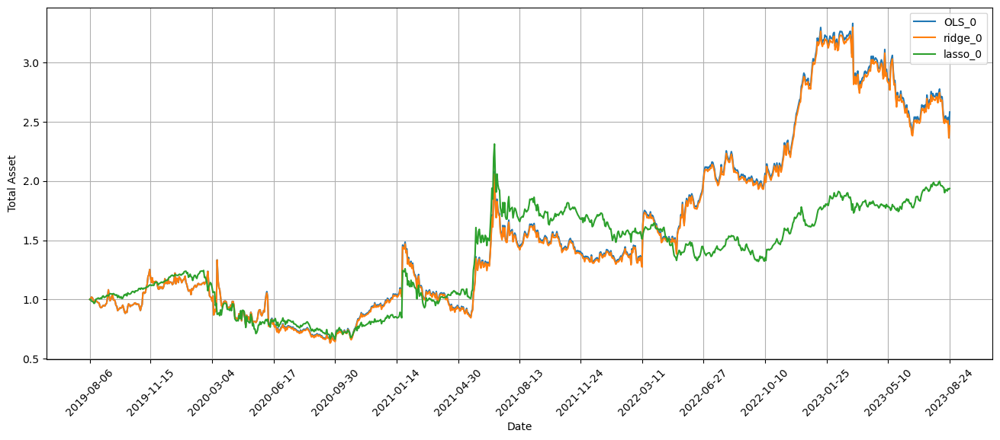

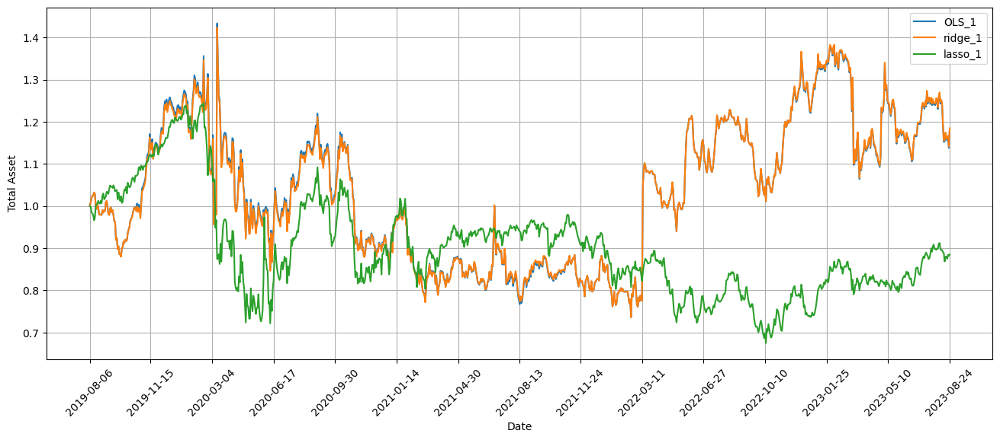

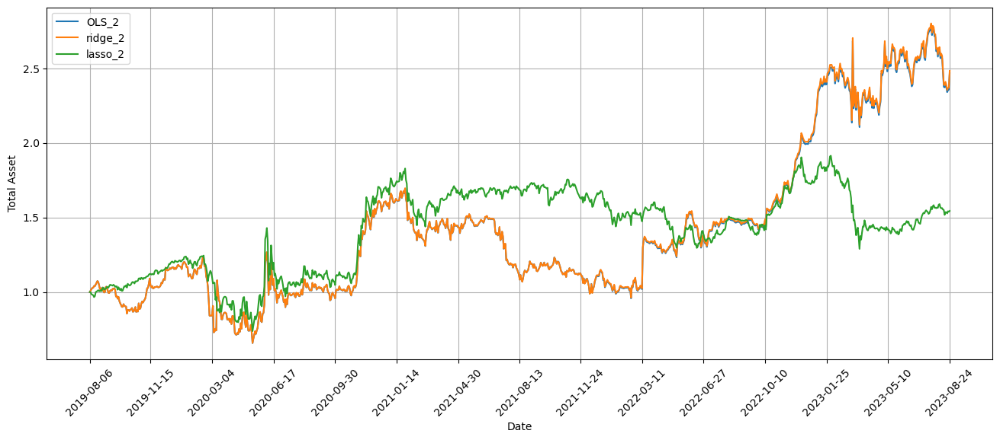

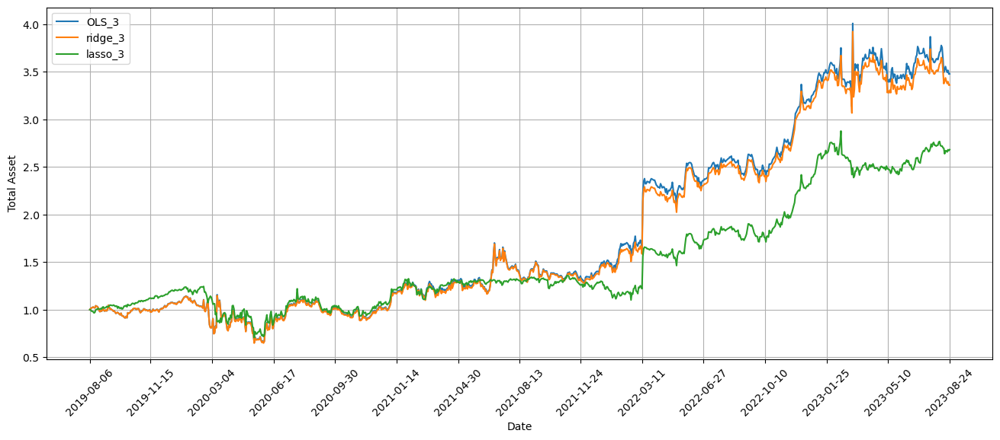

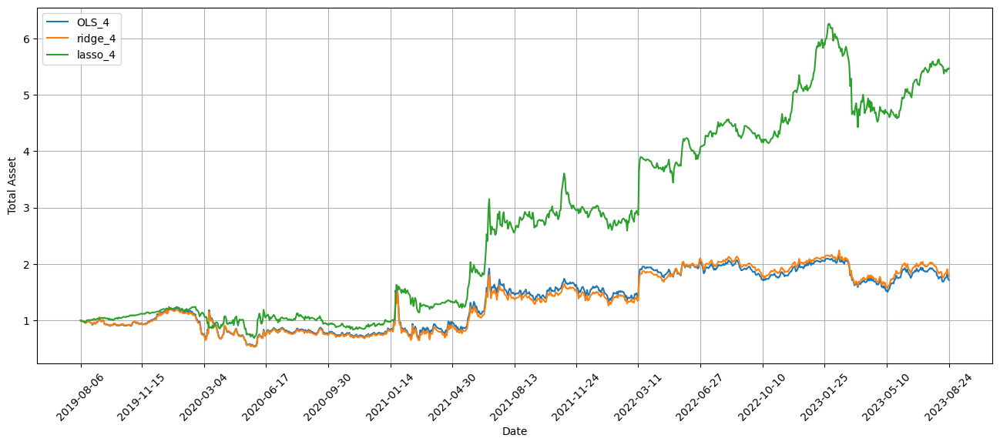

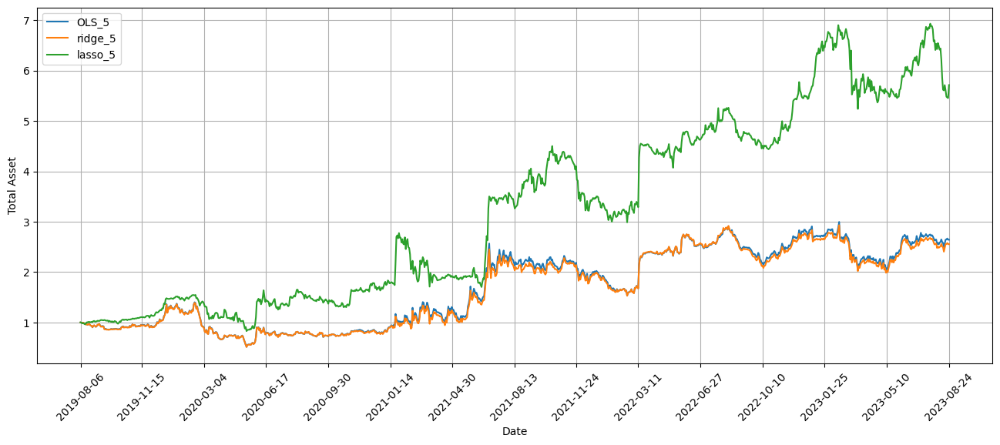

Running 52 of 67 iterations. First iteration already finished
Standardization data are from 2022-01-21 to 2022-11-04
Training data are from 2022-11-07 to 2023-08-24
Testing data are from 2023-07-31 to 2023-09-22
top_stocks by OLS factors 0 to buy on 2023-08-28 are ['CSIQ', 'DLTR', 'LANC', 'AMC', 'SIRI', 'FL', 'IDEX', 'USFR', 'PINC', 'HE']
Total asset on 2023-08-29 will be 2.5759857405611206
It should be the same as 2.575985740561154
top_stocks by OLS factors 0 to buy on 2023-08-29 are ['SIRI', 'SGMO', 'EXTR', 'IDEX', 'DLTR', 'AMC', 'PINC', 'NVCR', 'HE', 'USFR']
Total asset on 2023-08-30 will be 2.620782785760209
It should be the same as 2.620782785760242
top_stocks by OLS factors 0 to buy on 2023-08-30 are ['TSEM', 'AAOI', 'MRVL', 'EXTR', 'SMCI', 'AMC', 'IDEX', 'IEP', 'NVCR', 'USFR']
Total asset on 2023-08-31 will be 2.735909625232625
It should be the same as 2.7359096252326585
top_stocks by OLS factors 0 to buy on 2023-08-31 are ['PCRX', 'HPQ', 'AMC', 'SBSW', 'HAIN', 'IDEX', 'AMBA', '

Total asset on 2023-09-25 will be 2.4422969579528524
It should be the same as 2.4422969579528844
top_stocks by ridge factors 0 to buy on 2023-09-25 are ['ESPR', 'LMBS', 'CGC', 'SRNE', 'ELF', 'MPW', 'WPC', 'CHEF', 'TKO', 'TVTX']
Total asset on 2023-09-26 will be 2.481627696080205
It should be the same as 2.481627696080237
top_stocks by lasso factors 0 to buy on 2023-08-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-29 will be 1.9313256324644443
It should be the same as 1.9313256324644699
top_stocks by lasso factors 0 to buy on 2023-08-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-30 will be 1.9675965783702087
It should be the same as 1.9675965783702343
top_stocks by lasso factors 0 to buy on 2023-08-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-08-31 will be 1.9938446419230043
It should be the same as 1.9938446419230

Total asset on 2023-09-22 will be 1.1752434122848343
It should be the same as 1.1752434122848574
top_stocks by OLS factors 1 to buy on 2023-09-22 are ['ACB', 'INTC', 'SGMO', 'CHEF', 'CGC', 'RVNC', 'TGNA', 'ELF', 'SRNE', 'TVTX']
Total asset on 2023-09-25 will be 1.1821861315554025
It should be the same as 1.182186131555426
top_stocks by OLS factors 1 to buy on 2023-09-25 are ['INTC', 'ELF', 'MPW', 'LMBS', 'WPC', 'CHEF', 'CGC', 'SRNE', 'TKO', 'TVTX']
Total asset on 2023-09-26 will be 1.192434590516351
It should be the same as 1.1924345905163747
top_stocks by ridge factors 1 to buy on 2023-08-28 are ['TBT', 'DLTR', 'LANC', 'IDEX', 'AMC', 'SIRI', 'FL', 'USFR', 'PINC', 'HE']
Total asset on 2023-08-29 will be 1.1807100001249335
It should be the same as 1.1807100001249513
top_stocks by ridge factors 1 to buy on 2023-08-29 are ['SPR', 'CNK', 'SIRI', 'AAOI', 'EXTR', 'DLTR', 'AMC', 'PINC', 'NVCR', 'USFR']
Total asset on 2023-08-30 will be 1.2181764755106357
It should be the same as 1.21817647551

top_stocks by lasso factors 1 to buy on 2023-09-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-20 will be 0.8808504693197767
It should be the same as 0.8808504693198049
top_stocks by lasso factors 1 to buy on 2023-09-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-21 will be 0.8657019912051402
It should be the same as 0.8657019912051682
top_stocks by lasso factors 1 to buy on 2023-09-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-22 will be 0.8598288402342988
It should be the same as 0.8598288402343267
top_stocks by lasso factors 1 to buy on 2023-09-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-25 will be 0.8503902590689726
It should be the same as 0.8503902590690007
top_stocks by lasso factors 1 to buy on 2023-09-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2023-09-19 will be 2.5837131689873223
It should be the same as 2.583713168987356
top_stocks by ridge factors 2 to buy on 2023-09-19 are ['WKHS', 'DG', 'INCY', 'NVCR', 'INDB', 'PLNT', 'GSY', 'PTCT', 'SIRI', 'IEP']
Total asset on 2023-09-20 will be 2.6183426156363154
It should be the same as 2.6183426156363487
top_stocks by ridge factors 2 to buy on 2023-09-20 are ['SGMO', 'RVNC', 'NVCR', 'HE', 'INDB', 'SIRI', 'PLNT', 'GSY', 'PTCT', 'IEP']
Total asset on 2023-09-21 will be 2.5550840557912955
It should be the same as 2.555084055791329
top_stocks by ridge factors 2 to buy on 2023-09-21 are ['INGN', 'NVCR', 'SBGI', 'SRNE', 'PLNT', 'INDB', 'TGNA', 'GSY', 'SIRI', 'IEP']
Total asset on 2023-09-22 will be 2.5298321920133393
It should be the same as 2.5298321920133726
top_stocks by ridge factors 2 to buy on 2023-09-22 are ['INGN', 'SGMO', 'SFBS', 'CHEF', 'SRNE', 'NVCR', 'TGNA', 'INDB', 'IEP', 'TVTX']
Total asset on 2023-09-25 will be 2.524986912320709
It should be the same as 2.52

Total asset on 2023-09-15 will be 3.661030669552327
It should be the same as 3.6610306695523644
top_stocks by OLS factors 3 to buy on 2023-09-15 are ['RH', 'SAIC', 'TTC', 'TDS', 'HALO', 'QD', 'SJM', 'ORCL', 'FMC', 'RTX']
Total asset on 2023-09-18 will be 3.652261690337216
It should be the same as 3.652261690337254
top_stocks by OLS factors 3 to buy on 2023-09-18 are ['ICUI', 'MTD', 'SRNE', 'AAOI', 'MRIN', 'AAP', 'PKX', 'SJM', 'RTX', 'ORCL']
Total asset on 2023-09-19 will be 3.523644731144405
It should be the same as 3.5236447311444437
top_stocks by OLS factors 3 to buy on 2023-09-19 are ['HPQ', 'EBS', 'PDM', 'PINC', 'INDB', 'AAP', 'AAOI', 'MRIN', 'RTX', 'ORCL']
Total asset on 2023-09-20 will be 3.547984705474802
It should be the same as 3.54798470547484
top_stocks by OLS factors 3 to buy on 2023-09-20 are ['LEN', 'TFC', 'CBRE', 'MRIN', 'JLL', 'DG', 'IEP', 'ETN', 'PINC', 'PTCT']
Total asset on 2023-09-21 will be 3.496875346806389
It should be the same as 3.496875346806428
top_stocks by 

top_stocks by lasso factors 3 to buy on 2023-09-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-18 will be 2.6528778887619358
It should be the same as 2.65287788876197
top_stocks by lasso factors 3 to buy on 2023-09-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-19 will be 2.666747181034269
It should be the same as 2.6667471810343026
top_stocks by lasso factors 3 to buy on 2023-09-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-20 will be 2.675241169185972
It should be the same as 2.6752411691860067
top_stocks by lasso factors 3 to buy on 2023-09-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-09-21 will be 2.6239281096454543
It should be the same as 2.623928109645489
top_stocks by lasso factors 3 to buy on 2023-09-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM

Total asset on 2023-09-18 will be 1.7744386734788111
It should be the same as 1.7744386734788475
top_stocks by ridge factors 4 to buy on 2023-09-18 are ['MPW', 'AAP', 'EBS', 'NVCR', 'SRNE', 'FWRD', 'MRIN', 'PINC', 'IEP', 'HE']
Total asset on 2023-09-19 will be 1.6995632447084634
It should be the same as 1.6995632447084998
top_stocks by ridge factors 4 to buy on 2023-09-19 are ['INGN', 'NVCR', 'FWRD', 'SIRI', 'PINC', 'IDEX', 'EBS', 'SAGE', 'HE', 'IEP']
Total asset on 2023-09-20 will be 1.7017240268978093
It should be the same as 1.7017240268978457
top_stocks by ridge factors 4 to buy on 2023-09-20 are ['IDEX', 'MUFG', 'SMFG', 'NVCR', 'FWRD', 'PINC', 'PTCT', 'SAGE', 'IEP', 'HE']
Total asset on 2023-09-21 will be 1.6941667425001294
It should be the same as 1.6941667425001663
top_stocks by ridge factors 4 to buy on 2023-09-21 are ['EBS', 'CASY', 'INGN', 'NVCR', 'IDEX', 'SAGE', 'GSY', 'SIRI', 'IEP', 'HE']
Total asset on 2023-09-22 will be 1.6722346498204692
It should be the same as 1.672234

Total asset on 2023-09-18 will be 2.531527015901456
It should be the same as 2.5315270159014824
top_stocks by OLS factors 5 to buy on 2023-09-18 are ['EDU', 'USFR', 'MRIN', 'FWRD', 'SMCI', 'PINC', 'SRNE', 'ELF', 'IEP', 'HE']
Total asset on 2023-09-19 will be 2.46764773432531
It should be the same as 2.4676477343253373
top_stocks by OLS factors 5 to buy on 2023-09-19 are ['SATS', 'IDEX', 'PINC', 'GSY', 'EBS', 'ELF', 'SIRI', 'VKTX', 'HE', 'IEP']
Total asset on 2023-09-20 will be 2.4656184178856773
It should be the same as 2.465618417885705
top_stocks by OLS factors 5 to buy on 2023-09-20 are ['FWRD', 'NVCR', 'DG', 'USFR', 'PTCT', 'PINC', 'EFAV', 'ELF', 'IEP', 'HE']
Total asset on 2023-09-21 will be 2.4158778193537342
It should be the same as 2.4158778193537613
top_stocks by OLS factors 5 to buy on 2023-09-21 are ['TKO', 'USFR', 'IDEX', 'SBGI', 'AEHR', 'GSY', 'ELF', 'SIRI', 'IEP', 'HE']
Total asset on 2023-09-22 will be 2.38102241059469
It should be the same as 2.381022410594717
top_stock

top_stocks by lasso factors 5 to buy on 2023-09-15 are ['UNFI', 'FXO', 'ESPR', 'SAGE', 'DPST', 'FATE', 'FWRD', 'BOH', 'BOIL', 'IEP']
Total asset on 2023-09-18 will be 5.432049823652744
It should be the same as 5.432049823652786
top_stocks by lasso factors 5 to buy on 2023-09-18 are ['FXO', 'ESPR', 'HE', 'SAGE', 'DPST', 'FATE', 'FWRD', 'BOH', 'BOIL', 'IEP']
Total asset on 2023-09-19 will be 5.411192986099845
It should be the same as 5.411192986099888
top_stocks by lasso factors 5 to buy on 2023-09-19 are ['FXO', 'ESPR', 'HE', 'SAGE', 'DPST', 'FATE', 'FWRD', 'BOH', 'BOIL', 'IEP']
Total asset on 2023-09-20 will be 5.349573147917269
It should be the same as 5.349573147917312
top_stocks by lasso factors 5 to buy on 2023-09-20 are ['FXO', 'ESPR', 'HE', 'SAGE', 'FATE', 'DPST', 'FWRD', 'BOH', 'BOIL', 'IEP']
Total asset on 2023-09-21 will be 5.188479821754238
It should be the same as 5.188479821754281
top_stocks by lasso factors 5 to buy on 2023-09-21 are ['FXO', 'ESPR', 'HE', 'SAGE', 'DPST', '

Total asset on 2023-10-10 will be 2.4416329147304268
It should be the same as 2.4416329147304605
top_stocks by ridge factors 0 to buy on 2023-10-10 are ['OUT', 'NEE', 'BB', 'BGS', 'DPZ', 'PEP', 'TAP', 'TSE', 'MDLZ', 'ASR']
Total asset on 2023-10-11 will be 2.5051342089842734
It should be the same as 2.5051342089843067
top_stocks by ridge factors 0 to buy on 2023-10-11 are ['SMTC', 'JNPR', 'LW', 'TSEM', 'NEP', 'AMN', 'BB', 'MKC', 'KDP', 'MDLZ']
Total asset on 2023-10-12 will be 2.469414167249862
It should be the same as 2.4694141672498957
top_stocks by ridge factors 0 to buy on 2023-10-12 are ['VIXY', 'DUST', 'TMV', 'TBF', 'TBT', 'TSEM', 'FMS', 'WLY', 'GRPN', 'DVA']
Total asset on 2023-10-13 will be 2.489865850415219
It should be the same as 2.4898658504152524
top_stocks by ridge factors 0 to buy on 2023-10-13 are ['SUI', 'AIV', 'INFY', 'ESPR', 'TSEM', 'BAX', 'WLY', 'DVA', 'GRPN', 'FMS']
Total asset on 2023-10-16 will be 2.5470310128122264
It should be the same as 2.54703101281226
top_s

Total asset on 2023-10-09 will be 1.137924383428463
It should be the same as 1.1379243834284876
top_stocks by OLS factors 1 to buy on 2023-10-09 are ['PEP', 'PETS', 'UI', 'COMM', 'AES', 'TSE', 'HASI', 'BGS', 'NEP', 'ASR']
Total asset on 2023-10-10 will be 1.1666702016353567
It should be the same as 1.1666702016353814
top_stocks by OLS factors 1 to buy on 2023-10-10 are ['BB', 'OUT', 'NEE', 'BGS', 'DPZ', 'PEP', 'TAP', 'TSE', 'MDLZ', 'ASR']
Total asset on 2023-10-11 will be 1.1970380326864702
It should be the same as 1.1970380326864953
top_stocks by OLS factors 1 to buy on 2023-10-11 are ['SMTC', 'JNPR', 'TSEM', 'LW', 'AMN', 'NEP', 'BB', 'MKC', 'KDP', 'MDLZ']
Total asset on 2023-10-12 will be 1.1799692314135526
It should be the same as 1.1799692314135777
top_stocks by OLS factors 1 to buy on 2023-10-12 are ['VIXY', 'DUST', 'TMV', 'TBT', 'TBF', 'TSEM', 'FMS', 'WLY', 'GRPN', 'DVA']
Total asset on 2023-10-13 will be 1.189742206998613
It should be the same as 1.189742206998638
top_stocks by 

top_stocks by lasso factors 1 to buy on 2023-10-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-11 will be 0.8430181147955497
It should be the same as 0.8430181147955776
top_stocks by lasso factors 1 to buy on 2023-10-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-12 will be 0.8472855551305795
It should be the same as 0.8472855551306078
top_stocks by lasso factors 1 to buy on 2023-10-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-13 will be 0.8390920786279407
It should be the same as 0.839092078627969
top_stocks by lasso factors 1 to buy on 2023-10-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-16 will be 0.8404855312525749
It should be the same as 0.8404855312526031
top_stocks by lasso factors 1 to buy on 2023-10-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', '

Total asset on 2023-10-09 will be 2.447272873533071
It should be the same as 2.447272873533108
top_stocks by ridge factors 2 to buy on 2023-10-09 are ['PETS', 'COMM', 'AES', 'UI', 'TSE', 'ASR', 'HASI', 'BGS', 'NEP', 'IEP']
Total asset on 2023-10-10 will be 2.5023623274949514
It should be the same as 2.502362327494988
top_stocks by ridge factors 2 to buy on 2023-10-10 are ['HASI', 'BGS', 'UI', 'NTCT', 'NEE', 'NEP', 'TSE', 'TVTX', 'NVCR', 'IEP']
Total asset on 2023-10-11 will be 2.6155405116888084
It should be the same as 2.6155405116888453
top_stocks by ridge factors 2 to buy on 2023-10-11 are ['NVCR', 'HRL', 'BB', 'UI', 'SIRI', 'MKC', 'AMN', 'TSEM', 'KDP', 'NEP']
Total asset on 2023-10-12 will be 2.5469841648236202
It should be the same as 2.5469841648236566
top_stocks by ridge factors 2 to buy on 2023-10-12 are ['TBT', 'TBF', 'UVXY', 'VIXY', 'IEP', 'FMS', 'GRPN', 'DVA', 'WLY', 'TSEM']
Total asset on 2023-10-13 will be 2.578470426409285
It should be the same as 2.5784704264093223
top_s

top_stocks by OLS factors 3 to buy on 2023-10-10 are ['HASI', 'NEE', 'AY', 'SATS', 'NVS', 'BDN', 'CWEN', 'ASR', 'IEP', 'NEP']
Total asset on 2023-10-11 will be 3.3246145008711605
It should be the same as 3.3246145008711996
top_stocks by OLS factors 3 to buy on 2023-10-11 are ['TSE', 'NOC', 'PLCE', 'PEP', 'AES', 'LHX', 'NEP', 'HASI', 'BGS', 'ASR']
Total asset on 2023-10-12 will be 3.297154656089663
It should be the same as 3.297154656089702
top_stocks by OLS factors 3 to buy on 2023-10-12 are ['TAP', 'AES', 'NEE', 'DPZ', 'PEP', 'TSE', 'BGS', 'OUT', 'HASI', 'ASR']
Total asset on 2023-10-13 will be 3.2467063639413385
It should be the same as 3.246706363941378
top_stocks by OLS factors 3 to buy on 2023-10-13 are ['VSAT', 'SNBR', 'PAR', 'HR', 'KDP', 'AEHR', 'BB', 'JNPR', 'SMTC', 'NEP']
Total asset on 2023-10-16 will be 3.2824214756074146
It should be the same as 3.282421475607455
top_stocks by OLS factors 3 to buy on 2023-10-16 are ['UVXY', 'VIXY', 'AAOI', 'TBT', 'TMV', 'WLY', 'TBF', 'FMS',

top_stocks by lasso factors 3 to buy on 2023-10-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-10 will be 2.53008112047611
It should be the same as 2.5300811204761438
top_stocks by lasso factors 3 to buy on 2023-10-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-11 will be 2.5400026696712894
It should be the same as 2.540002669671323
top_stocks by lasso factors 3 to buy on 2023-10-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-12 will be 2.5514908561708154
It should be the same as 2.5514908561708496
top_stocks by lasso factors 3 to buy on 2023-10-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-13 will be 2.524167837917395
It should be the same as 2.524167837917429
top_stocks by lasso factors 3 to buy on 2023-10-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM

Total asset on 2023-10-09 will be 1.5428743820760606
It should be the same as 1.5428743820760997
top_stocks by ridge factors 4 to buy on 2023-10-09 are ['BANC', 'PDM', 'TSEM', 'CALM', 'BDN', 'SIRI', 'HE', 'SMCI', 'JBL', 'IEP']
Total asset on 2023-10-10 will be 1.5813537959042225
It should be the same as 1.5813537959042616
top_stocks by ridge factors 4 to buy on 2023-10-10 are ['NVCR', 'NTCT', 'LAAC', 'TSE', 'JBL', 'PBI', 'TVTX', 'ASR', 'HE', 'IEP']
Total asset on 2023-10-11 will be 1.6251606376307666
It should be the same as 1.6251606376308056
top_stocks by ridge factors 4 to buy on 2023-10-11 are ['UI', 'TKO', 'NVCR', 'KO', 'SMCI', 'JBL', 'PEP', 'SIRI', 'BGS', 'HE']
Total asset on 2023-10-12 will be 1.5960824653448562
It should be the same as 1.5960824653448955
top_stocks by ridge factors 4 to buy on 2023-10-12 are ['LW', 'CHEF', 'WBA', 'TSEM', 'JBL', 'TKO', 'NVCR', 'PBI', 'DG', 'SMCI']
Total asset on 2023-10-13 will be 1.5655299840131072
It should be the same as 1.565529984013146
top

Total asset on 2023-10-09 will be 2.2499270310176227
It should be the same as 2.2499270310176507
top_stocks by OLS factors 5 to buy on 2023-10-09 are ['TSEM', 'BDN', 'OSIS', 'SRNE', 'JBL', 'LW', 'JPST', 'TKO', 'IEP', 'SIRI']
Total asset on 2023-10-10 will be 2.2816858770414092
It should be the same as 2.2816858770414363
top_stocks by OLS factors 5 to buy on 2023-10-10 are ['TSEM', 'ELF', 'PBI', 'TKO', 'SMCI', 'TBF', 'TVTX', 'IEP', 'AAOI', 'TBT']
Total asset on 2023-10-11 will be 2.293246566506934
It should be the same as 2.2932465665069612
top_stocks by OLS factors 5 to buy on 2023-10-11 are ['USFR', 'BGS', 'TVTX', 'SGMO', 'ESPR', 'AAOI', 'SRNE', 'IEP', 'SIRI', 'TKO']
Total asset on 2023-10-12 will be 2.2688061001206696
It should be the same as 2.2688061001206963
top_stocks by OLS factors 5 to buy on 2023-10-12 are ['SIRI', 'IEP', 'LAAC', 'TSEM', 'PBI', 'TVTX', 'SRNE', 'TBT', 'SMCI', 'TKO']
Total asset on 2023-10-13 will be 2.227376566681631
It should be the same as 2.227376566681658
t

Total asset on 2023-10-06 will be 4.907894163887308
It should be the same as 4.9078941638873514
top_stocks by lasso factors 5 to buy on 2023-10-06 are ['SAGE', 'FATE', 'HE', 'ESPR', 'TVTX', 'BOIL', 'BOH', 'DPST', 'NEP', 'IEP']
Total asset on 2023-10-09 will be 5.016067861983847
It should be the same as 5.01606786198389
top_stocks by lasso factors 5 to buy on 2023-10-09 are ['SAGE', 'FATE', 'HE', 'BOIL', 'ESPR', 'TVTX', 'BOH', 'DPST', 'NEP', 'IEP']
Total asset on 2023-10-10 will be 4.989544091487702
It should be the same as 4.989544091487745
top_stocks by lasso factors 5 to buy on 2023-10-10 are ['SAGE', 'FATE', 'BOIL', 'HE', 'ESPR', 'TVTX', 'BOH', 'DPST', 'NEP', 'IEP']
Total asset on 2023-10-11 will be 5.120339224036687
It should be the same as 5.12033922403673
top_stocks by lasso factors 5 to buy on 2023-10-11 are ['FWRD', 'SAGE', 'FATE', 'BOIL', 'ESPR', 'TVTX', 'BOH', 'DPST', 'NEP', 'IEP']
Total asset on 2023-10-12 will be 5.07951919176982
It should be the same as 5.079519191769862
t

Total asset on 2023-10-30 will be 2.513869716000811
It should be the same as 2.513869716000847
top_stocks by ridge factors 0 to buy on 2023-10-30 are ['BOKF', 'TAK', 'TRU', 'HUBG', 'MXL', 'ALGN', 'USFR', 'WHR', 'SNY', 'VMI']
Total asset on 2023-10-31 will be 2.5228706052770855
It should be the same as 2.522870605277121
top_stocks by ridge factors 0 to buy on 2023-10-31 are ['EXPO', 'TAK', 'THRM', 'ALGN', 'HAS', 'KNSL', 'RVTY', 'WHR', 'VMI', 'SNY']
Total asset on 2023-11-01 will be 2.524295940901615
It should be the same as 2.5242959409016508
top_stocks by ridge factors 0 to buy on 2023-11-01 are ['EXPO', 'RVTY', 'WU', 'FTSM', 'DORM', 'SNY', 'COMM', 'FWRD', 'KNSL', 'PETS']
Total asset on 2023-11-02 will be 2.5519342202915856
It should be the same as 2.551934220291621
top_stocks by ridge factors 0 to buy on 2023-11-02 are ['SAVE', 'FTSM', 'EL', 'TFLO', 'SHV', 'JPST', 'GBIL', 'BIL', 'PETS', 'PAYC']
Total asset on 2023-11-03 will be 2.6094132267770287
It should be the same as 2.60941322677

top_stocks by OLS factors 1 to buy on 2023-10-27 are ['RUSHA', 'MAT', 'CALX', 'ALGN', 'BOKF', 'MOH', 'HAS', 'USFR', 'MXL', 'TRU']
Total asset on 2023-10-30 will be 1.197164892792989
It should be the same as 1.1971648927930145
top_stocks by OLS factors 1 to buy on 2023-10-30 are ['RUSHA', 'TAK', 'TRU', 'HUBG', 'MXL', 'ALGN', 'USFR', 'WHR', 'SNY', 'VMI']
Total asset on 2023-10-31 will be 1.1986590443824592
It should be the same as 1.1986590443824852
top_stocks by OLS factors 1 to buy on 2023-10-31 are ['EXPO', 'TAK', 'THRM', 'ALGN', 'RVTY', 'HAS', 'KNSL', 'WHR', 'VMI', 'SNY']
Total asset on 2023-11-01 will be 1.199327382711023
It should be the same as 1.1993273827110489
top_stocks by OLS factors 1 to buy on 2023-11-01 are ['EXPO', 'RVTY', 'WU', 'FTSM', 'DORM', 'FWRD', 'SNY', 'COMM', 'KNSL', 'PETS']
Total asset on 2023-11-02 will be 1.2124581109800792
It should be the same as 1.2124581109801054
top_stocks by OLS factors 1 to buy on 2023-11-02 are ['COMM', 'SAVE', 'FTSM', 'TFLO', 'JPST', '

top_stocks by lasso factors 1 to buy on 2023-10-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-25 will be 0.8222935021750025
It should be the same as 0.8222935021750309
top_stocks by lasso factors 1 to buy on 2023-10-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-26 will be 0.8208046863616903
It should be the same as 0.8208046863617189
top_stocks by lasso factors 1 to buy on 2023-10-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-27 will be 0.8199408591358462
It should be the same as 0.8199408591358748
top_stocks by lasso factors 1 to buy on 2023-10-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-30 will be 0.8239052845791709
It should be the same as 0.8239052845791993
top_stocks by lasso factors 1 to buy on 2023-10-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 

Total asset on 2023-11-21 will be 2.947646101351113
It should be the same as 2.9476461013511503
top_stocks by ridge factors 2 to buy on 2023-10-24 are ['SMTC', 'GSY', 'IRDM', 'RF', 'INDB', 'ZION', 'PTLC', 'SEDG', 'GPC', 'FMC']
Total asset on 2023-10-25 will be 2.601344886969709
It should be the same as 2.601344886969746
top_stocks by ridge factors 2 to buy on 2023-10-25 are ['AGNC', 'FHN', 'IEP', 'GPC', 'RF', 'SEDG', 'CBSH', 'FMC', 'CBU', 'GVI']
Total asset on 2023-10-26 will be 2.5907914943598502
It should be the same as 2.5907914943598875
top_stocks by ridge factors 2 to buy on 2023-10-26 are ['VICR', 'CALX', 'BANC', 'PPBI', 'USFR', 'FHN', 'CBU', 'INDB', 'FMC', 'TRU']
Total asset on 2023-10-27 will be 2.644562743064176
It should be the same as 2.644562743064213
top_stocks by ridge factors 2 to buy on 2023-10-27 are ['VICR', 'MAT', 'MOH', 'CALX', 'ALGN', 'BOKF', 'USFR', 'HAS', 'MXL', 'TRU']
Total asset on 2023-10-30 will be 2.6390474953652214
It should be the same as 2.639047495365258

top_stocks by lasso factors 2 to buy on 2023-11-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-20 will be 1.4987879648055042
It should be the same as 1.4987879648055413
top_stocks by lasso factors 2 to buy on 2023-11-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-21 will be 1.493460643615294
It should be the same as 1.493460643615331
top_stocks by OLS factors 3 to buy on 2023-10-24 are ['MBB', 'SIRI', 'ENOV', 'LMBS', 'JNJ', 'WBA', 'CLM', 'NOK', 'SMTC', 'NTCT']
Total asset on 2023-10-25 will be 3.249872804148958
It should be the same as 3.249872804149
top_stocks by OLS factors 3 to buy on 2023-10-25 are ['ENPH', 'NOK', 'TPIC', 'PTLC', 'RF', 'TV', 'SIRI', 'SMTC', 'GPC', 'SEDG']
Total asset on 2023-10-26 will be 3.2517294249177966
It should be the same as 3.2517294249178383
top_stocks by OLS factors 3 to buy on 2023-10-26 are ['SMTC', 'INDB', 'RF', 'IRDM', 'GSY', 'ZION', 'SE

Total asset on 2023-11-20 will be 3.5784504951804563
It should be the same as 3.578450495180503
top_stocks by ridge factors 3 to buy on 2023-11-20 are ['SE', 'ARMK', 'RBA', 'SRTY', 'TWM', 'TZA', 'RWM', 'RILY', 'GDOT', 'HE']
Total asset on 2023-11-21 will be 3.631944196950267
It should be the same as 3.631944196950314
top_stocks by lasso factors 3 to buy on 2023-10-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-25 will be 2.4723371153376723
It should be the same as 2.4723371153377087
top_stocks by lasso factors 3 to buy on 2023-10-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-26 will be 2.4684203215488707
It should be the same as 2.468420321548907
top_stocks by lasso factors 3 to buy on 2023-10-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-10-27 will be 2.46472134199319
It should be the same as 2.464721341993227
top_

Total asset on 2023-11-16 will be 1.7133036827406907
It should be the same as 1.7133036827407266
top_stocks by OLS factors 4 to buy on 2023-11-16 are ['SAVE', 'RVNC', 'LUMN', 'MODG', 'JKHY', 'ELF', 'GDOT', 'HE', 'AAOI', 'TSEM']
Total asset on 2023-11-17 will be 1.741420579153594
It should be the same as 1.7414205791536306
top_stocks by OLS factors 4 to buy on 2023-11-17 are ['ALTR', 'LUMN', 'GEN', 'BIL', 'AAOI', 'RAMP', 'HE', 'CSIQ', 'SMCI', 'VUZI']
Total asset on 2023-11-20 will be 1.7369878265282892
It should be the same as 1.7369878265283258
top_stocks by OLS factors 4 to buy on 2023-11-20 are ['RAMP', 'HUBB', 'SRNE', 'ARMK', 'PSEC', 'TDG', 'ELF', 'MOD', 'SUPN', 'AAOI']
Total asset on 2023-11-21 will be 1.7557785463954525
It should be the same as 1.7557785463954887
top_stocks by ridge factors 4 to buy on 2023-10-24 are ['PTLC', 'GPC', 'ELF', 'ROL', 'TKO', 'ENOV', 'WBA', 'NOK', 'SIRI', 'SMTC']
Total asset on 2023-10-25 will be 1.5866614031246773
It should be the same as 1.58666140312

top_stocks by lasso factors 4 to buy on 2023-11-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-14 will be 5.175071466976818
It should be the same as 5.175071466976878
top_stocks by lasso factors 4 to buy on 2023-11-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-15 will be 5.251326399208418
It should be the same as 5.251326399208479
top_stocks by lasso factors 4 to buy on 2023-11-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-16 will be 5.21313678060645
It should be the same as 5.213136780606511
top_stocks by lasso factors 4 to buy on 2023-11-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-17 will be 5.232305795625111
It should be the same as 5.232305795625174
top_stocks by lasso factors 4 to buy on 2023-11-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', '

Total asset on 2023-11-10 will be 2.4423533492901592
It should be the same as 2.4423533492902076
top_stocks by ridge factors 5 to buy on 2023-11-10 are ['GNW', 'SAGE', 'GVA', 'PKX', 'ATSG', 'BANC', 'MOD', 'SIRI', 'SATS', 'IVW']
Total asset on 2023-11-13 will be 2.43096380125741
It should be the same as 2.4309638012574597
top_stocks by ridge factors 5 to buy on 2023-11-13 are ['AAOI', 'IEP', 'TRU', 'DPST', 'SBGI', 'ICUI', 'FHN', 'BANC', 'SIRI', 'BIP']
Total asset on 2023-11-14 will be 2.6037886535602763
It should be the same as 2.6037886535603256
top_stocks by ridge factors 5 to buy on 2023-11-14 are ['PSEC', 'CLDX', 'FHN', 'DPST', 'G', 'TRU', 'PKX', 'BANC', 'SIRI', 'IEP']
Total asset on 2023-11-15 will be 2.718264462005798
It should be the same as 2.718264462005847
top_stocks by ridge factors 5 to buy on 2023-11-15 are ['LUMN', 'LLY', 'BANC', 'SGH', 'TRU', 'CLS', 'PTLC', 'JAZZ', 'DEO', 'IEP']
Total asset on 2023-11-16 will be 2.7086996999310364
It should be the same as 2.70869969993108

Total asset on 2023-11-30 will be 3.104186463871661
It should be the same as 3.1041864638717014
top_stocks by OLS factors 0 to buy on 2023-11-30 are ['HRL', 'ATRC', 'CODX', 'HUM', 'ARGX', 'BANC', 'RILY', 'JBL', 'DPST', 'PDCO']
Total asset on 2023-12-01 will be 3.093974380897293
It should be the same as 3.093974380897333
top_stocks by OLS factors 0 to buy on 2023-12-01 are ['ATRC', 'HRL', 'HUM', 'FTSM', 'CENN', 'JBL', 'CI', 'ARGX', 'PSTG', 'PDCO']
Total asset on 2023-12-04 will be 3.169743571210618
It should be the same as 3.1697435712106583
top_stocks by OLS factors 0 to buy on 2023-12-04 are ['JBL', 'ICSH', 'FTSM', 'TFLO', 'GBIL', 'SHV', 'BIL', 'DPST', 'PDCO', 'CENN']
Total asset on 2023-12-05 will be 3.186407127189864
It should be the same as 3.1864071271899035
top_stocks by OLS factors 0 to buy on 2023-12-05 are ['MINT', 'FTSM', 'ICSH', 'ALK', 'JPST', 'TFLO', 'SHV', 'GBIL', 'BIL', 'CENN']
Total asset on 2023-12-06 will be 3.191307168669758
It should be the same as 3.191307168669798


top_stocks by lasso factors 0 to buy on 2023-11-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-29 will be 1.86717828388524
It should be the same as 1.867178283885266
top_stocks by lasso factors 0 to buy on 2023-11-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-30 will be 1.841165924184468
It should be the same as 1.8411659241844944
top_stocks by lasso factors 0 to buy on 2023-11-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-01 will be 1.8535974573071294
It should be the same as 1.8535974573071556
top_stocks by lasso factors 0 to buy on 2023-12-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-04 will be 1.865118135005027
It should be the same as 1.8651181350050532
top_stocks by lasso factors 0 to buy on 2023-12-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM

Total asset on 2023-11-29 will be 1.418477811521223
It should be the same as 1.418477811521242
top_stocks by ridge factors 1 to buy on 2023-11-29 are ['BANC', 'GPRE', 'ODP', 'DBA', 'SNBR', 'ARGX', 'CODX', 'CIG', 'RILY', 'USFR']
Total asset on 2023-11-30 will be 1.4409961591550555
It should be the same as 1.4409961591550746
top_stocks by ridge factors 1 to buy on 2023-11-30 are ['JDST', 'HUM', 'ODP', 'DUST', 'CODX', 'JAZZ', 'JBL', 'ARGX', 'RILY', 'PDCO']
Total asset on 2023-12-01 will be 1.4485121817794024
It should be the same as 1.4485121817794218
top_stocks by ridge factors 1 to buy on 2023-12-01 are ['ATRC', 'HUM', 'FTSM', 'HRL', 'CENN', 'PSTG', 'JBL', 'CI', 'ARGX', 'PDCO']
Total asset on 2023-12-04 will be 1.4841239707413463
It should be the same as 1.4841239707413658
top_stocks by ridge factors 1 to buy on 2023-12-04 are ['ICSH', 'CI', 'FTSM', 'JBL', 'TFLO', 'GBIL', 'SHV', 'BIL', 'PDCO', 'CENN']
Total asset on 2023-12-05 will be 1.4790515682668433
It should be the same as 1.479051

Total asset on 2023-11-27 will be 2.971135377099063
It should be the same as 2.9711353770991002
top_stocks by OLS factors 2 to buy on 2023-11-27 are ['SUN', 'INSG', 'HE', 'AEO', 'GES', 'URBN', 'SBSW', 'J', 'CIG', 'USFR']
Total asset on 2023-11-28 will be 3.0607687879102015
It should be the same as 3.060768787910239
top_stocks by OLS factors 2 to buy on 2023-11-28 are ['ADSK', 'SIRI', 'CODX', 'URBN', 'GES', 'J', 'RILY', 'HE', 'CIG', 'USFR']
Total asset on 2023-11-29 will be 3.1075282618258164
It should be the same as 3.107528261825854
top_stocks by OLS factors 2 to buy on 2023-11-29 are ['PETS', 'BANC', 'ODP', 'SNBR', 'FTSL', 'ARGX', 'CIG', 'CODX', 'RILY', 'USFR']
Total asset on 2023-11-30 will be 3.144014887555901
It should be the same as 3.144014887555939
top_stocks by OLS factors 2 to buy on 2023-11-30 are ['DUST', 'JAZZ', 'ODP', 'ATRC', 'HUM', 'CODX', 'ARGX', 'JBL', 'RILY', 'PDCO']
Total asset on 2023-12-01 will be 3.164330102207899
It should be the same as 3.1643301022079364
top_st

Total asset on 2023-12-20 will be 3.471432675059417
It should be the same as 3.471432675059459
top_stocks by lasso factors 2 to buy on 2023-11-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-22 will be 1.4922897025556205
It should be the same as 1.4922897025556576
top_stocks by lasso factors 2 to buy on 2023-11-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-24 will be 1.4971615577926547
It should be the same as 1.4971615577926918
top_stocks by lasso factors 2 to buy on 2023-11-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-27 will be 1.4933644165470203
It should be the same as 1.4933644165470574
top_stocks by lasso factors 2 to buy on 2023-11-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-11-28 will be 1.4845282116705159
It should be the same as 1.48452821167055

Total asset on 2023-12-18 will be 4.4506389344146315
It should be the same as 4.450638934414678
top_stocks by OLS factors 3 to buy on 2023-12-18 are ['MJ', 'DG', 'VOD', 'GEF', 'ANY', 'GIL', 'PFE', 'NG', 'ORCL', 'MDRX']
Total asset on 2023-12-19 will be 4.509159668664354
It should be the same as 4.509159668664401
top_stocks by OLS factors 3 to buy on 2023-12-19 are ['PFE', 'IEP', 'CGC', 'RILY', 'UUP', 'IAGG', 'ORCL', 'ICSH', 'TFLO', 'SHV']
Total asset on 2023-12-20 will be 4.513721167471433
It should be the same as 4.51372116747148
top_stocks by ridge factors 3 to buy on 2023-11-21 are ['VRTX', 'SRTY', 'TZA', 'SE', 'MCK', 'TWM', 'RWM', 'SRNE', 'CSCO', 'IEP']
Total asset on 2023-11-22 will be 3.6296849125178365
It should be the same as 3.629684912517884
top_stocks by ridge factors 3 to buy on 2023-11-22 are ['ATKR', 'ABR', 'ENR', 'WMT', 'DLB', 'VRTX', 'CSCO', 'PLCE', 'VNET', 'IEP']
Total asset on 2023-11-24 will be 3.6397061240843684
It should be the same as 3.6397061240844155
top_stocks

Total asset on 2023-12-14 will be 2.702604591221254
It should be the same as 2.7026045912212977
top_stocks by lasso factors 3 to buy on 2023-12-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-15 will be 2.728169849595763
It should be the same as 2.728169849595807
top_stocks by lasso factors 3 to buy on 2023-12-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-18 will be 2.749810496661633
It should be the same as 2.7498104966616768
top_stocks by lasso factors 3 to buy on 2023-12-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-19 will be 2.738031433876642
It should be the same as 2.738031433876686
top_stocks by lasso factors 3 to buy on 2023-12-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-20 will be 2.7540463459832134
It should be the same as 2.7540463459832574
t

Total asset on 2023-12-11 will be 2.0702055604540788
It should be the same as 2.0702055604541223
top_stocks by ridge factors 4 to buy on 2023-12-11 are ['ELF', 'PLCE', 'ULTA', 'BF-B', 'TPL', 'BOX', 'SAVE', 'YEXT', 'BTI', 'AAOI']
Total asset on 2023-12-12 will be 2.046983575938621
It should be the same as 2.046983575938664
top_stocks by ridge factors 4 to buy on 2023-12-12 are ['PJT', 'ABR', 'DBI', 'BF-B', 'MGPI', 'BXMT', 'SAIC', 'NSIT', 'VKTX', 'AAOI']
Total asset on 2023-12-13 will be 2.0620227482970392
It should be the same as 2.0620227482970823
top_stocks by ridge factors 4 to buy on 2023-12-13 are ['WOR', 'SWBI', 'CRS', 'APLS', 'SIGI', 'YEXT', 'VKTX', 'NSIT', 'SAIC', 'AAOI']
Total asset on 2023-12-14 will be 2.1643909000857824
It should be the same as 2.164390900085826
top_stocks by ridge factors 4 to buy on 2023-12-14 are ['PETS', 'GEF', 'SAIC', 'ELF', 'WOR', 'ANY', 'VKTX', 'NSIT', 'MDRX', 'AAOI']
Total asset on 2023-12-15 will be 2.1719421897764106
It should be the same as 2.1719

top_stocks by OLS factors 5 to buy on 2023-12-11 are ['FNV', 'YUMC', 'PG', 'YEXT', 'TPL', 'PLCE', 'ULTA', 'BTI', 'SAVE', 'AAOI']
Total asset on 2023-12-12 will be 3.0772728743730418
It should be the same as 3.0772728743730693
top_stocks by OLS factors 5 to buy on 2023-12-12 are ['TDW', 'PJT', 'DBI', 'ABR', 'YUMC', 'NSIT', 'BXMT', 'SAIC', 'VKTX', 'AAOI']
Total asset on 2023-12-13 will be 3.0907661919846534
It should be the same as 3.090766191984681
top_stocks by OLS factors 5 to buy on 2023-12-13 are ['MRK', 'YEXT', 'RILY', 'YUMC', 'FHN', 'VKTX', 'NSIT', 'SAIC', 'CI', 'AAOI']
Total asset on 2023-12-14 will be 3.2200931573291793
It should be the same as 3.220093157329207
top_stocks by OLS factors 5 to buy on 2023-12-14 are ['ADC', 'PETS', 'FCPT', 'RILY', 'YUMC', 'SAIC', 'VKTX', 'NSIT', 'MDRX', 'AAOI']
Total asset on 2023-12-15 will be 3.213864276419505
It should be the same as 3.213864276419533
top_stocks by OLS factors 5 to buy on 2023-12-15 are ['YUMC', 'FAZ', 'ORCL', 'ELF', 'CI', 'JBL

top_stocks by lasso factors 5 to buy on 2023-12-11 are ['IAT', 'CHRS', 'BOH', 'TVTX', 'SAGE', 'KRE', 'NEP', 'DPST', 'FHN', 'IEP']
Total asset on 2023-12-12 will be 5.921088566927026
It should be the same as 5.921088566927066
top_stocks by lasso factors 5 to buy on 2023-12-12 are ['IAT', 'BOH', 'CHRS', 'TVTX', 'SAGE', 'KRE', 'NEP', 'DPST', 'FHN', 'IEP']
Total asset on 2023-12-13 will be 5.879975016302912
It should be the same as 5.879975016302953
top_stocks by lasso factors 5 to buy on 2023-12-13 are ['IAT', 'BOH', 'TVTX', 'CHRS', 'SAGE', 'KRE', 'NEP', 'DPST', 'FHN', 'IEP']
Total asset on 2023-12-14 will be 6.533297000472458
It should be the same as 6.533297000472498
top_stocks by lasso factors 5 to buy on 2023-12-14 are ['FWRD', 'BOH', 'TVTX', 'CHRS', 'SAGE', 'KRE', 'NEP', 'DPST', 'FHN', 'IEP']
Total asset on 2023-12-15 will be 6.532541126519448
It should be the same as 6.53254112651949
top_stocks by lasso factors 5 to buy on 2023-12-15 are ['GMED', 'BOH', 'FWRD', 'CHRS', 'KRE', 'TVTX'

Total asset on 2024-01-05 will be 3.2422350830047777
It should be the same as 3.2422350830048163
top_stocks by ridge factors 0 to buy on 2024-01-05 are ['BANC', 'AVNS', 'BOTZ', 'PDCO', 'WBA', 'CORT', 'WW', 'SATS', 'OPK', 'DPST']
Total asset on 2024-01-08 will be 3.2696509917020697
It should be the same as 3.269650991702109
top_stocks by ridge factors 0 to buy on 2024-01-08 are ['TMF', 'ANY', 'WW', 'BANC', 'UNF', 'AVNS', 'MPW', 'SATS', 'DPST', 'OPK']
Total asset on 2024-01-09 will be 3.2990314992414467
It should be the same as 3.2990314992414858
top_stocks by ridge factors 0 to buy on 2024-01-09 are ['BA', 'UNF', 'WW', 'EXEL', 'SPR', 'AVNS', 'SATS', 'MPW', 'DPST', 'OPK']
Total asset on 2024-01-10 will be 3.3837186543102384
It should be the same as 3.383718654310277
top_stocks by ridge factors 0 to buy on 2024-01-10 are ['MSM', 'EXTR', 'RGNX', 'NEOG', 'OPK', 'ES', 'SATS', 'DPST', 'MPW', 'GRFS']
Total asset on 2024-01-11 will be 3.4487534335273717
It should be the same as 3.44875343352741

top_stocks by OLS factors 1 to buy on 2024-01-02 are ['WIX', 'LSTR', 'HUBS', 'BVN', 'IEP', 'SRNE', 'PTLC', 'MINT', 'JPST', 'GBIL']
Total asset on 2024-01-03 will be 1.5829316467254817
It should be the same as 1.5829316467255072
top_stocks by OLS factors 1 to buy on 2024-01-03 are ['BVN', 'BXMT', 'TTC', 'XENE', 'IBTX', 'MINT', 'BLNK', 'AVXL', 'JPST', 'CORT']
Total asset on 2024-01-04 will be 1.5908040836521447
It should be the same as 1.5908040836521704
top_stocks by OLS factors 1 to buy on 2024-01-04 are ['XENE', 'BVN', 'ANY', 'MXL', 'VTNR', 'PCRX', 'ESPR', 'SUN', 'AVXL', 'CORT']
Total asset on 2024-01-05 will be 1.5689576642918435
It should be the same as 1.5689576642918692
top_stocks by OLS factors 1 to buy on 2024-01-05 are ['SUN', 'OPK', 'XRX', 'WBA', 'BANC', 'SATS', 'AVNS', 'PTLC', 'ESPR', 'CORT']
Total asset on 2024-01-08 will be 1.5955804041126525
It should be the same as 1.595580404112678
top_stocks by OLS factors 1 to buy on 2024-01-08 are ['UNF', 'UHAL', 'WW', 'ESPR', 'RUSHA'

Total asset on 2023-12-28 will be 0.9269590480636732
It should be the same as 0.926959048063702
top_stocks by lasso factors 1 to buy on 2023-12-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-29 will be 0.9247638185349707
It should be the same as 0.9247638185349998
top_stocks by lasso factors 1 to buy on 2023-12-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-01-02 will be 0.91501686185586
It should be the same as 0.915016861855889
top_stocks by lasso factors 1 to buy on 2024-01-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-01-03 will be 0.9117486749822639
It should be the same as 0.9117486749822927
top_stocks by lasso factors 1 to buy on 2024-01-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-01-04 will be 0.899170345561091
It should be the same as 0.89917034556112
to

Total asset on 2023-12-27 will be 3.5986588976912284
It should be the same as 3.598658897691271
top_stocks by ridge factors 2 to buy on 2023-12-27 are ['UTHR', 'MNRO', 'BB', 'BOH', 'NVCR', 'FTSM', 'HE', 'BNDX', 'USFR', 'UNFI']
Total asset on 2023-12-28 will be 3.610967666482512
It should be the same as 3.610967666482553
top_stocks by ridge factors 2 to buy on 2023-12-28 are ['NTES', 'VTIP', 'IEP', 'NKE', 'MNRO', 'FTSM', 'BNDX', 'USFR', 'UNFI', 'GBIL']
Total asset on 2023-12-29 will be 3.633249103975588
It should be the same as 3.633249103975629
top_stocks by ridge factors 2 to buy on 2023-12-29 are ['NTCT', 'HE', 'MINT', 'NEP', 'MNRO', 'FTSM', 'JPST', 'GBIL', 'UNFI', 'IEP']
Total asset on 2024-01-02 will be 3.610653545722298
It should be the same as 3.61065354572234
top_stocks by ridge factors 2 to buy on 2024-01-02 are ['PINC', 'CBSH', 'NTCT', 'MINT', 'BMY', 'MNRO', 'JPST', 'GBIL', 'UNFI', 'IEP']
Total asset on 2024-01-03 will be 3.6297985789072915
It should be the same as 3.629798578

top_stocks by OLS factors 3 to buy on 2023-12-26 are ['FDX', 'AON', 'DBA', 'EWT', 'LNTH', 'UUP', 'BIL', 'SRNE', 'GSY', 'ARGX']
Total asset on 2023-12-27 will be 4.503317540190538
It should be the same as 4.503317540190584
top_stocks by OLS factors 3 to buy on 2023-12-27 are ['ADM', 'UTHR', 'DXC', 'MNKD', 'FDX', 'AON', 'QURE', 'EWT', 'ARGX', 'SRNE']
Total asset on 2023-12-28 will be 4.480687014416311
It should be the same as 4.480687014416358
top_stocks by OLS factors 3 to buy on 2023-12-28 are ['WTM', 'FDX', 'NKE', 'UTHR', 'EWT', 'AON', 'QURE', 'USFR', 'NTES', 'ARGX']
Total asset on 2023-12-29 will be 4.502870123173237
It should be the same as 4.502870123173282
top_stocks by OLS factors 3 to buy on 2023-12-29 are ['NTES', 'UTHR', 'VTIP', 'BB', 'PAYX', 'NKE', 'AIR', 'FTSM', 'BNDX', 'USFR']
Total asset on 2024-01-02 will be 4.4856423389780185
It should be the same as 4.485642338978064
top_stocks by OLS factors 3 to buy on 2024-01-02 are ['UTHR', 'KMX', 'VTIP', 'BNDX', 'AIR', 'NKE', 'NTES

top_stocks by lasso factors 3 to buy on 2023-12-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-21 will be 2.7346347874189694
It should be the same as 2.7346347874190142
top_stocks by lasso factors 3 to buy on 2023-12-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-22 will be 2.763428879282034
It should be the same as 2.7634288792820785
top_stocks by lasso factors 3 to buy on 2023-12-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-26 will be 2.7858328451190655
It should be the same as 2.785832845119111
top_stocks by lasso factors 3 to buy on 2023-12-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2023-12-27 will be 2.799835474639316
It should be the same as 2.799835474639361
top_stocks by lasso factors 3 to buy on 2023-12-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FOR

top_stocks by ridge factors 4 to buy on 2023-12-20 are ['RILY', 'SMCI', 'ABM', 'AON', 'EXC', 'AEE', 'CI', 'AJG', 'AVGO', 'AAOI']
Total asset on 2023-12-21 will be 2.1389025835826447
It should be the same as 2.138902583582689
top_stocks by ridge factors 4 to buy on 2023-12-21 are ['CI', 'INCY', 'LNTH', 'AVGO', 'SMCI', 'BIL', 'SIRI', 'AAOI', 'UUP', 'GSY']
Total asset on 2023-12-22 will be 2.141935142446337
It should be the same as 2.1419351424463815
top_stocks by ridge factors 4 to buy on 2023-12-22 are ['CVBF', 'SIRI', 'INCY', 'ZION', 'GBCI', 'SMCI', 'IBTX', 'DPST', 'VRTX', 'BOH']
Total asset on 2023-12-26 will be 2.137719104965471
It should be the same as 2.137719104965516
top_stocks by ridge factors 4 to buy on 2023-12-26 are ['EWT', 'ZION', 'JBGS', 'JBL', 'DPST', 'BOH', 'GKOS', 'SMCI', 'ASR', 'ARGX']
Total asset on 2023-12-27 will be 2.1725113388610953
It should be the same as 2.17251133886114
top_stocks by ridge factors 4 to buy on 2023-12-27 are ['BOH', 'DPST', 'IBTX', 'BAP', 'SMCI

Total asset on 2024-01-22 will be 5.623685675387063
It should be the same as 5.623685675387122
top_stocks by OLS factors 5 to buy on 2023-12-20 are ['AEE', 'EXC', 'ABM', 'AON', 'AJG', 'M', 'AVGO', 'CI', 'AAOI', 'DPST']
Total asset on 2023-12-21 will be 3.158796689562433
It should be the same as 3.158796689562462
top_stocks by OLS factors 5 to buy on 2023-12-21 are ['ARGX', 'TSEM', 'CI', 'LNTH', 'SIRI', 'AAOI', 'DPST', 'UUP', 'GSY', 'BIL']
Total asset on 2023-12-22 will be 3.1950094286331927
It should be the same as 3.1950094286332216
top_stocks by OLS factors 5 to buy on 2023-12-22 are ['VRTX', 'CVBF', 'FHN', 'IBTX', 'INDB', 'BOH', 'GBCI', 'ESPR', 'SIRI', 'DPST']
Total asset on 2023-12-26 will be 3.212960365445928
It should be the same as 3.212960365445957
top_stocks by OLS factors 5 to buy on 2023-12-26 are ['JBGS', 'KRC', 'DEA', 'FITB', 'HPP', 'LC', 'GBCI', 'ASR', 'DPST', 'ARGX']
Total asset on 2023-12-27 will be 3.272866481817277
It should be the same as 3.272866481817305
top_stocks

top_stocks by ridge factors 5 to buy on 2024-01-17 are ['WAL', 'MDRX', 'UTHR', 'SMCI', 'ARGX', 'LAZ', 'INO', 'IRBT', 'ESPR', 'DPST']
Total asset on 2024-01-18 will be 3.1703075324854852
It should be the same as 3.1703075324855385
top_stocks by ridge factors 5 to buy on 2024-01-18 are ['TVTX', 'BCRX', 'CHRS', 'SMCI', 'HUM', 'ESPR', 'ARGX', 'SAVE', 'DPST', 'JNPR']
Total asset on 2024-01-19 will be 3.1347870630637877
It should be the same as 3.1347870630638415
top_stocks by ridge factors 5 to buy on 2024-01-19 are ['WAL', 'HE', 'WBA', 'PSMT', 'GKOS', 'ESPR', 'SAGE', 'INO', 'JNPR', 'DPST']
Total asset on 2024-01-22 will be 3.2062628382542777
It should be the same as 3.2062628382543314
top_stocks by lasso factors 5 to buy on 2023-12-20 are ['AAP', 'SPHY', 'NEP', 'IAT', 'WKHS', 'KRE', 'IEP', 'BOTZ', 'CHRS', 'DPST']
Total asset on 2023-12-21 will be 6.478725237312657
It should be the same as 6.4787252373127
top_stocks by lasso factors 5 to buy on 2023-12-21 are ['AAP', 'SPHY', 'WKHS', 'NEP', 

Total asset on 2024-02-06 will be 3.4361456089820264
It should be the same as 3.4361456089820646
top_stocks by OLS factors 0 to buy on 2024-02-06 are ['GBIL', 'APD', 'ICSH', 'CHRW', 'AFL', 'EXPO', 'SHV', 'BIL', 'MKTX', 'NEAR']
Total asset on 2024-02-07 will be 3.4540926647618617
It should be the same as 3.4540926647619004
top_stocks by OLS factors 0 to buy on 2024-02-07 are ['LBRDA', 'LBRDK', 'FN', 'CHTR', 'FMC', 'EXPRQ', 'EXPO', 'NEAR', 'APD', 'CCK']
Total asset on 2024-02-08 will be 3.4210157039348483
It should be the same as 3.421015703934888
top_stocks by OLS factors 0 to buy on 2024-02-08 are ['JJSF', 'VOYA', 'CHTR', 'EXPRQ', 'MRCY', 'NYCB', 'FN', 'RMBS', 'APD', 'FMC']
Total asset on 2024-02-09 will be 3.421846830558249
It should be the same as 3.4218468305582888
top_stocks by OLS factors 0 to buy on 2024-02-09 are ['BERY', 'AMGN', 'FMC', 'FN', 'CCK', 'JJSF', 'SNAP', 'TSN', 'NYCB', 'RMBS']
Total asset on 2024-02-12 will be 3.525712328517358
It should be the same as 3.5257123285173

top_stocks by lasso factors 0 to buy on 2024-02-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-05 will be 1.9905116121588382
It should be the same as 1.99051161215887
top_stocks by lasso factors 0 to buy on 2024-02-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-06 will be 1.9930534981795573
It should be the same as 1.993053498179589
top_stocks by lasso factors 0 to buy on 2024-02-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-07 will be 2.010365436669485
It should be the same as 2.0103654366695167
top_stocks by lasso factors 0 to buy on 2024-02-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-08 will be 2.0387007991912918
It should be the same as 2.0387007991913233
top_stocks by lasso factors 0 to buy on 2024-02-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FOR

top_stocks by ridge factors 1 to buy on 2024-02-02 are ['JPST', 'CALX', 'ROK', 'TFLO', 'SHV', 'MKTX', 'EXTR', 'BIL', 'ATGE', 'NYCB']
Total asset on 2024-02-05 will be 1.7439726794865038
It should be the same as 1.743972679486525
top_stocks by ridge factors 1 to buy on 2024-02-05 are ['TFLO', 'NEAR', 'CHRW', 'VLY', 'BIL', 'SHV', 'EXTR', 'MKTX', 'NYCB', 'EXPO']
Total asset on 2024-02-06 will be 1.71987624693328
It should be the same as 1.719876246933301
top_stocks by ridge factors 1 to buy on 2024-02-06 are ['GBIL', 'APD', 'CHRW', 'ICSH', 'AFL', 'EXPO', 'SHV', 'BIL', 'MKTX', 'NEAR']
Total asset on 2024-02-07 will be 1.728846356990815
It should be the same as 1.7288463569908363
top_stocks by ridge factors 1 to buy on 2024-02-07 are ['LBRDA', 'LBRDK', 'FN', 'CHTR', 'FMC', 'EXPRQ', 'EXPO', 'NEAR', 'APD', 'CCK']
Total asset on 2024-02-08 will be 1.7123017620263234
It should be the same as 1.7123017620263452
top_stocks by ridge factors 1 to buy on 2024-02-08 are ['VOYA', 'SNAP', 'CHTR', 'EXPR

top_stocks by OLS factors 2 to buy on 2024-02-02 are ['UPS', 'TFLO', 'CALX', 'SHV', 'ROK', 'ATGE', 'BIL', 'MKTX', 'EXTR', 'NYCB']
Total asset on 2024-02-05 will be 3.749961719262143
It should be the same as 3.7499617192621844
top_stocks by OLS factors 2 to buy on 2024-02-05 are ['IBTX', 'INDB', 'CHRW', 'BIL', 'SHV', 'VLY', 'EXTR', 'MKTX', 'NYCB', 'EXPO']
Total asset on 2024-02-06 will be 3.6974818685729542
It should be the same as 3.6974818685729947
top_stocks by OLS factors 2 to buy on 2024-02-06 are ['GBIL', 'ICSH', 'APD', 'AFL', 'SHV', 'CHRW', 'BIL', 'EXPO', 'MKTX', 'NEAR']
Total asset on 2024-02-07 will be 3.716752771929164
It should be the same as 3.7167527719292046
top_stocks by OLS factors 2 to buy on 2024-02-07 are ['LBRDK', 'FN', 'RILY', 'CHTR', 'NEAR', 'FMC', 'EXPRQ', 'EXPO', 'APD', 'CCK']
Total asset on 2024-02-08 will be 3.6742107380526585
It should be the same as 3.674210738052698
top_stocks by OLS factors 2 to buy on 2024-02-08 are ['SNAP', 'NEP', 'CHTR', 'EXPRQ', 'MRCY',

Total asset on 2024-02-05 will be 1.5825348189984325
It should be the same as 1.5825348189984734
top_stocks by lasso factors 2 to buy on 2024-02-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-06 will be 1.5859039653863112
It should be the same as 1.5859039653863525
top_stocks by lasso factors 2 to buy on 2024-02-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-07 will be 1.6030854461625106
It should be the same as 1.6030854461625514
top_stocks by lasso factors 2 to buy on 2024-02-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-08 will be 1.6252511408532733
It should be the same as 1.6252511408533143
top_stocks by lasso factors 2 to buy on 2024-02-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-09 will be 1.6266209514592314
It should be the same as 1.626620951459

Total asset on 2024-02-05 will be 3.918047268789684
It should be the same as 3.918047268789733
top_stocks by ridge factors 3 to buy on 2024-02-05 are ['VLY', 'SHV', 'IRBT', 'EXTR', 'BIL', 'CHRW', 'MKTX', 'ATGE', 'NYCB', 'EXPO']
Total asset on 2024-02-06 will be 3.8339587923968974
It should be the same as 3.8339587923969467
top_stocks by ridge factors 3 to buy on 2024-02-06 are ['SHV', 'EXPO', 'BIL', 'APD', 'MKTX', 'NEAR', 'CHRW', 'EXTR', 'ATGE', 'NYCB']
Total asset on 2024-02-07 will be 3.772823232341707
It should be the same as 3.772823232341757
top_stocks by ridge factors 3 to buy on 2024-02-07 are ['BIL', 'EXPRQ', 'EXPO', 'MKTX', 'IRBT', 'CCK', 'APD', 'EXTR', 'NEAR', 'NYCB']
Total asset on 2024-02-08 will be 3.72550331462191
It should be the same as 3.7255033146219603
top_stocks by ridge factors 3 to buy on 2024-02-08 are ['FN', 'EXPRQ', 'EXPO', 'CHTR', 'VLY', 'NYCB', 'MKTX', 'APD', 'NEAR', 'RMBS']
Total asset on 2024-02-09 will be 3.772592416088564
It should be the same as 3.772592

Total asset on 2024-02-05 will be 2.0027115532262387
It should be the same as 2.002711553226278
top_stocks by OLS factors 4 to buy on 2024-02-05 are ['BIL', 'NOK', 'NEAR', 'EXPO', 'ATGE', 'IBM', 'BANC', 'AAOI', 'BAH', 'SMCI']
Total asset on 2024-02-06 will be 2.0545828977256124
It should be the same as 2.054582897725652
top_stocks by OLS factors 4 to buy on 2024-02-06 are ['BIL', 'AFL', 'XRX', 'EXPO', 'BANC', 'NEAR', 'APPF', 'BAH', 'ATGE', 'SMCI']
Total asset on 2024-02-07 will be 2.0723696731459493
It should be the same as 2.0723696731459884
top_stocks by OLS factors 4 to buy on 2024-02-07 are ['NYCB', 'EXTR', 'XRX', 'MHO', 'CLS', 'APPF', 'SANM', 'RMBS', 'NEAR', 'SMCI']
Total asset on 2024-02-08 will be 2.0604213734971326
It should be the same as 2.0604213734971712
top_stocks by OLS factors 4 to buy on 2024-02-08 are ['HUM', 'MMYT', 'MANH', 'RILY', 'RMBS', 'ASH', 'FN', 'NEAR', 'SANM', 'SMCI']
Total asset on 2024-02-09 will be 2.1043667450714656
It should be the same as 2.1043667450715

Total asset on 2024-02-02 will be 5.566086604821826
It should be the same as 5.566086604821884
top_stocks by lasso factors 4 to buy on 2024-02-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-05 will be 5.566985478284136
It should be the same as 5.566985478284194
top_stocks by lasso factors 4 to buy on 2024-02-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-06 will be 5.5750064446875145
It should be the same as 5.575006444687572
top_stocks by lasso factors 4 to buy on 2024-02-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-07 will be 5.628731534298058
It should be the same as 5.628731534298115
top_stocks by lasso factors 4 to buy on 2024-02-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-08 will be 5.704262710170344
It should be the same as 5.704262710170402
top_

top_stocks by ridge factors 5 to buy on 2024-02-01 are ['VZ', 'PLUG', 'HUM', 'PGR', 'IRWD', 'IEP', 'KURA', 'ATGE', 'MOD', 'SAVE']
Total asset on 2024-02-02 will be 3.264724104998623
It should be the same as 3.2647241049986766
top_stocks by ridge factors 5 to buy on 2024-02-02 are ['IBM', 'NTCT', 'NYCB', 'KURA', 'IEP', 'TFLO', 'WRB', 'BIL', 'SAVE', 'ATGE']
Total asset on 2024-02-05 will be 3.2725943960936528
It should be the same as 3.272594396093706
top_stocks by ridge factors 5 to buy on 2024-02-05 are ['EXPO', 'GBIL', 'NEP', 'ICSH', 'BAH', 'ATGE', 'IEP', 'SHV', 'TFLO', 'BIL']
Total asset on 2024-02-06 will be 3.258506412460002
It should be the same as 3.2585064124600565
top_stocks by ridge factors 5 to buy on 2024-02-06 are ['ARGX', 'ICSH', 'GBIL', 'APPF', 'IEP', 'SHV', 'ATGE', 'BAH', 'TFLO', 'BIL']
Total asset on 2024-02-07 will be 3.2742908570975082
It should be the same as 3.274290857097563
top_stocks by ridge factors 5 to buy on 2024-02-07 are ['BAH', 'GBIL', 'APPF', 'RMBS', 'IEP

Total asset on 2024-02-27 will be 3.769819638243733
It should be the same as 3.769819638243772
top_stocks by OLS factors 0 to buy on 2024-02-27 are ['SATS', 'INSG', 'BRC', 'VICR', 'NWN', 'GTN', 'FMX', 'MGPI', 'IEP', 'FOXF']
Total asset on 2024-02-28 will be 3.780366225692471
It should be the same as 3.7803662256925104
top_stocks by OLS factors 0 to buy on 2024-02-28 are ['BRC', 'INSG', 'PODD', 'PRGO', 'KW', 'GTN', 'MDRX', 'MGPI', 'FMX', 'FOXF']
Total asset on 2024-02-29 will be 3.8454441487788245
It should be the same as 3.8454441487788635
top_stocks by OLS factors 0 to buy on 2024-02-29 are ['UNH', 'IART', 'FSK', 'PODD', 'BIP', 'KW', 'GTN', 'INGN', 'PRGO', 'MDRX']
Total asset on 2024-03-01 will be 3.816427005211078
It should be the same as 3.816427005211117
top_stocks by OLS factors 0 to buy on 2024-03-01 are ['PDCO', 'PODD', 'FTSM', 'IART', 'COMM', 'INGN', 'PRGO', 'MDRX', 'CC', 'IRWD']
Total asset on 2024-03-04 will be 3.8189741133305
It should be the same as 3.818974113330539
top_st

Total asset on 2024-02-27 will be 2.1190565319787926
It should be the same as 2.1190565319788255
top_stocks by lasso factors 0 to buy on 2024-02-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-28 will be 2.079919578160702
It should be the same as 2.0799195781607347
top_stocks by lasso factors 0 to buy on 2024-02-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-29 will be 2.0963572526334198
It should be the same as 2.0963572526334535
top_stocks by lasso factors 0 to buy on 2024-02-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-01 will be 2.1140497152302085
It should be the same as 2.1140497152302418
top_stocks by lasso factors 0 to buy on 2024-03-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-04 will be 2.129410036707863
It should be the same as 2.12941003670789

Total asset on 2024-02-27 will be 1.836166804619024
It should be the same as 1.8361668046190454
top_stocks by ridge factors 1 to buy on 2024-02-27 are ['USFR', 'INSG', 'BRC', 'NWN', 'VICR', 'GTN', 'FMX', 'MGPI', 'IEP', 'FOXF']
Total asset on 2024-02-28 will be 1.8306973940022602
It should be the same as 1.8306973940022817
top_stocks by ridge factors 1 to buy on 2024-02-28 are ['INSG', 'PRGO', 'BRC', 'PODD', 'MDRX', 'KW', 'GTN', 'MGPI', 'FMX', 'FOXF']
Total asset on 2024-02-29 will be 1.8628310802213832
It should be the same as 1.8628310802214045
top_stocks by ridge factors 1 to buy on 2024-02-29 are ['LABD', 'FMX', 'FSK', 'PODD', 'BIP', 'KW', 'INGN', 'GTN', 'MDRX', 'PRGO']
Total asset on 2024-03-01 will be 1.8818713646577514
It should be the same as 1.881871364657773
top_stocks by ridge factors 1 to buy on 2024-03-01 are ['LABD', 'FTSM', 'PODD', 'IART', 'COMM', 'INGN', 'MDRX', 'PRGO', 'CC', 'IRWD']
Total asset on 2024-03-04 will be 1.856109786188662
It should be the same as 1.856109786

top_stocks by OLS factors 2 to buy on 2024-02-26 are ['NUS', 'CYH', 'ROCK', 'MGPI', 'TDOC', 'MED', 'PANW', 'PLCE', 'IEP', 'FOXF']
Total asset on 2024-02-27 will be 3.9254175975355134
It should be the same as 3.9254175975355525
top_stocks by OLS factors 2 to buy on 2024-02-27 are ['HE', 'BRC', 'INSG', 'GTN', 'VICR', 'NWN', 'FMX', 'MGPI', 'FOXF', 'IEP']
Total asset on 2024-02-28 will be 3.9152253835405677
It should be the same as 3.9152253835406072
top_stocks by OLS factors 2 to buy on 2024-02-28 are ['BRC', 'PRGO', 'INSG', 'PODD', 'MDRX', 'GTN', 'KW', 'FMX', 'MGPI', 'FOXF']
Total asset on 2024-02-29 will be 3.983829875769678
It should be the same as 3.983829875769719
top_stocks by OLS factors 2 to buy on 2024-02-29 are ['FSK', 'IART', 'PODD', 'BIP', 'KW', 'GTN', 'IEP', 'INGN', 'MDRX', 'PRGO']
Total asset on 2024-03-01 will be 3.9778504321031014
It should be the same as 3.977850432103142
top_stocks by OLS factors 2 to buy on 2024-03-01 are ['FTSM', 'PODD', 'IEP', 'IART', 'COMM', 'MDRX', 

Total asset on 2024-02-26 will be 1.6662917777238535
It should be the same as 1.6662917777238944
top_stocks by lasso factors 2 to buy on 2024-02-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-27 will be 1.6832832508179194
It should be the same as 1.6832832508179603
top_stocks by lasso factors 2 to buy on 2024-02-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-28 will be 1.6540763921883632
It should be the same as 1.654076392188404
top_stocks by lasso factors 2 to buy on 2024-02-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-29 will be 1.6654134546481205
It should be the same as 1.665413454648162
top_stocks by lasso factors 2 to buy on 2024-02-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-01 will be 1.6765065542286148
It should be the same as 1.67650655422865

top_stocks by ridge factors 3 to buy on 2024-02-20 are ['BLKB', 'NUS', 'POWI', 'EXPRQ', 'CAR', 'IPGP', 'WCC', 'TDC', 'QDEL', 'SSRM']
Total asset on 2024-02-21 will be 4.18422536769079
It should be the same as 4.184225367690841
top_stocks by ridge factors 3 to buy on 2024-02-21 are ['AKAM', 'HLF', 'IPGP', 'CAR', 'EXPRQ', 'WCC', 'TDC', 'NUS', 'QDEL', 'SSRM']
Total asset on 2024-02-22 will be 4.227097311835424
It should be the same as 4.227097311835475
top_stocks by ridge factors 3 to buy on 2024-02-22 are ['PENN', 'AKAM', 'CAR', 'IRDM', 'THS', 'AMN', 'HLF', 'NUS', 'QDEL', 'SSRM']
Total asset on 2024-02-23 will be 4.145324264627397
It should be the same as 4.145324264627448
top_stocks by ridge factors 3 to buy on 2024-02-23 are ['MED', 'ROKU', 'SABR', 'TDS', 'IRDM', 'PENN', 'HLF', 'THS', 'AMN', 'NUS']
Total asset on 2024-02-26 will be 4.143018120441319
It should be the same as 4.14301812044137
top_stocks by ridge factors 3 to buy on 2024-02-26 are ['SAGE', 'TDOC', 'PENN', 'ROKU', 'TDS', '

Total asset on 2024-03-18 will be 2.885782093190425
It should be the same as 2.885782093190478
top_stocks by lasso factors 3 to buy on 2024-03-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-19 will be 2.8680204274358188
It should be the same as 2.8680204274358716
top_stocks by OLS factors 4 to buy on 2024-02-20 are ['PBH', 'POWI', 'TXRH', 'XPO', 'MSTR', 'RGNX', 'SSRM', 'RL', 'AAOI', 'SMCI']
Total asset on 2024-02-21 will be 2.1522166563059137
It should be the same as 2.1522166563059537
top_stocks by OLS factors 4 to buy on 2024-02-21 are ['MARA', 'FLEX', 'MOD', 'MSTR', 'TDC', 'RL', 'ANF', 'SPSC', 'AAOI', 'SMCI']
Total asset on 2024-02-22 will be 2.2501350465133108
It should be the same as 2.2501350465133507
top_stocks by OLS factors 4 to buy on 2024-02-22 are ['NUS', 'RL', 'AMN', 'SSRM', 'THS', 'MSTR', 'ANF', 'KOLD', 'QDEL', 'SMCI']
Total asset on 2024-02-23 will be 2.291244775186235
It should be the same as 2.2912447751862755
t

Total asset on 2024-03-15 will be 2.5216411419287943
It should be the same as 2.521641141928841
top_stocks by ridge factors 4 to buy on 2024-03-15 are ['CC', 'RILY', 'YEXT', 'IEP', 'ANF', 'HPE', 'NVDA', 'AVAV', 'MSTR', 'SMCI']
Total asset on 2024-03-18 will be 2.516265408872217
It should be the same as 2.5162654088722647
top_stocks by ridge factors 4 to buy on 2024-03-18 are ['HPE', 'AVGO', 'AVAV', 'ASX', 'NYCB', 'KR', 'JBL', 'NVDA', 'MSTR', 'SMCI']
Total asset on 2024-03-19 will be 2.2812448074400073
It should be the same as 2.2812448074400544
top_stocks by lasso factors 4 to buy on 2024-02-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-21 will be 5.761220149707928
It should be the same as 5.761220149707985
top_stocks by lasso factors 4 to buy on 2024-02-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-02-22 will be 5.781973638806651
It should be the same as 5.781973638806709

top_stocks by OLS factors 5 to buy on 2024-03-15 are ['IEP', 'NYCB', 'HPE', 'RILY', 'AGR', 'MDRX', 'NVDA', 'CC', 'MSTR', 'AVAV']
Total asset on 2024-03-18 will be 3.6655874305893046
It should be the same as 3.665587430589339
top_stocks by OLS factors 5 to buy on 2024-03-18 are ['ASX', 'CC', 'MDRX', 'VKTX', 'KR', 'NVDA', 'SAVE', 'NYCB', 'JBL', 'MSTR']
Total asset on 2024-03-19 will be 3.5930588893033795
It should be the same as 3.5930588893034128
top_stocks by ridge factors 5 to buy on 2024-02-20 are ['WCC', 'RL', 'POWI', 'TDC', 'VKTX', 'SAVE', 'PBH', 'SSRM', 'RGNX', 'SMCI']
Total asset on 2024-02-21 will be 3.41457108560095
It should be the same as 3.414571085601006
top_stocks by ridge factors 5 to buy on 2024-02-21 are ['PBH', 'KOLD', 'NYCB', 'RL', 'AAOI', 'NSIT', 'ANF', 'SSRM', 'SPSC', 'SMCI']
Total asset on 2024-02-22 will be 3.487035569418
It should be the same as 3.487035569418056
top_stocks by ridge factors 5 to buy on 2024-02-22 are ['QDEL', 'VKTX', 'YELP', 'THS', 'SGMO', 'ANF',

top_stocks by lasso factors 5 to buy on 2024-03-14 are ['TVTX', 'FMC', 'FWRD', 'HE', 'FOXF', 'SSRM', 'PAYC', 'SAGE', 'SAVE', 'IEP']
Total asset on 2024-03-15 will be 5.5273340044874795
It should be the same as 5.527334004487524
top_stocks by lasso factors 5 to buy on 2024-03-15 are ['IRWD', 'FMC', 'FWRD', 'HE', 'FOXF', 'SSRM', 'PAYC', 'SAGE', 'SAVE', 'IEP']
Total asset on 2024-03-18 will be 5.533383859096891
It should be the same as 5.5333838590969355
top_stocks by lasso factors 5 to buy on 2024-03-18 are ['TVTX', 'FMC', 'HE', 'FWRD', 'FOXF', 'SSRM', 'PAYC', 'SAGE', 'SAVE', 'IEP']
Total asset on 2024-03-19 will be 5.481164265195563
It should be the same as 5.481164265195607
OLS 0 has SR -0.30575303293267686
OLS 1 has SR -0.3062660088071395
OLS 2 has SR -0.6854935022095396
OLS 3 has SR 0.4969736558927791
OLS 4 has SR -0.0021238410406607773
OLS 5 has SR 0.24848952816995207
ridge 0 has SR -0.3057530329326732
ridge 1 has SR -0.3062660088071465
ridge 2 has SR -0.6854935022095417
ridge 3 has

Total asset on 2024-04-03 will be 3.705089800484021
It should be the same as 3.7050898004840582
top_stocks by ridge factors 0 to buy on 2024-04-03 are ['MINT', 'TAK', 'GBIL', 'JPST', 'BIL', 'ICSH', 'FTSM', 'SHV', 'TFLO', 'NEAR']
Total asset on 2024-04-04 will be 3.70834887162973
It should be the same as 3.7083488716297675
top_stocks by ridge factors 0 to buy on 2024-04-04 are ['VRNT', 'JPST', 'GBIL', 'BIL', 'PVH', 'SHV', 'TFLO', 'ICSH', 'HUM', 'NEAR']
Total asset on 2024-04-05 will be 3.700434009483226
It should be the same as 3.700434009483265
top_stocks by ridge factors 0 to buy on 2024-04-05 are ['MNST', 'RH', 'KNSL', 'ELF', 'LW', 'WBA', 'HUM', 'PVH', 'EXPRQ', 'ULTA']
Total asset on 2024-04-08 will be 3.749416834906486
It should be the same as 3.7494168349065244
top_stocks by ridge factors 0 to buy on 2024-04-08 are ['SIRI', 'ELF', 'AMGN', 'ABBV', 'SJM', 'RH', 'KNSL', 'EXPRQ', 'ULTA', 'LW']
Total asset on 2024-04-09 will be 3.763906574438985
It should be the same as 3.76390657443902

top_stocks by OLS factors 1 to buy on 2024-04-01 are ['PEB', 'PEN', 'BGC', 'LULU', 'CMP', 'TAK', 'ERY', 'SUN', 'MLKN', 'FTSM']
Total asset on 2024-04-02 will be 1.859068000829642
It should be the same as 1.8590680008296716
top_stocks by OLS factors 1 to buy on 2024-04-02 are ['SNN', 'MLKN', 'SRNE', 'NEAR', 'JPST', 'FTSM', 'BIL', 'TAK', 'SHV', 'TFLO']
Total asset on 2024-04-03 will be 1.8584370262725234
It should be the same as 1.8584370262725527
top_stocks by OLS factors 1 to buy on 2024-04-03 are ['BIL', 'PVH', 'FTSM', 'ICSH', 'SHV', 'TAK', 'SNN', 'TFLO', 'NEAR', 'HUM']
Total asset on 2024-04-04 will be 1.8601041791838382
It should be the same as 1.8601041791838682
top_stocks by OLS factors 1 to buy on 2024-04-04 are ['BIL', 'ATRC', 'SHV', 'ULTA', 'ICSH', 'ELF', 'TFLO', 'PVH', 'NEAR', 'HUM']
Total asset on 2024-04-05 will be 1.8522695655406578
It should be the same as 1.8522695655406876
top_stocks by OLS factors 1 to buy on 2024-04-05 are ['ATRC', 'FIVE', 'WBA', 'MNST', 'EXPRQ', 'PVH'

Total asset on 2024-03-26 will be 0.9686351136907132
It should be the same as 0.9686351136907426
top_stocks by lasso factors 1 to buy on 2024-03-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-27 will be 0.9652281392210106
It should be the same as 0.9652281392210401
top_stocks by lasso factors 1 to buy on 2024-03-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-28 will be 0.9852742695330236
It should be the same as 0.9852742695330533
top_stocks by lasso factors 1 to buy on 2024-03-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-04-01 will be 0.9945312694670997
It should be the same as 0.9945312694671294
top_stocks by lasso factors 1 to buy on 2024-04-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-04-02 will be 0.9805078105653798
It should be the same as 0.980507810565

top_stocks by ridge factors 2 to buy on 2024-03-25 are ['SIG', 'DRI', 'MDRX', 'ACN', 'FDS', 'AAOI', 'LULU', 'IRBT', 'USFR', 'FIVE']
Total asset on 2024-03-26 will be 3.813230001743809
It should be the same as 3.813230001743851
top_stocks by ridge factors 2 to buy on 2024-03-26 are ['DRI', 'GIS', 'GIB', 'FDS', 'AAOI', 'USFR', 'SRNE', 'LULU', 'ACN', 'FIVE']
Total asset on 2024-03-27 will be 3.810754781892037
It should be the same as 3.810754781892081
top_stocks by ridge factors 2 to buy on 2024-03-27 are ['IRWD', 'AEHR', 'ACN', 'ANF', 'PTLC', 'USFR', 'CMP', 'GIB', 'AAOI', 'LULU']
Total asset on 2024-03-28 will be 3.910790081899362
It should be the same as 3.910790081899406
top_stocks by ridge factors 2 to buy on 2024-03-28 are ['WOR', 'AEHR', 'UPS', 'VST', 'ANF', 'PTLC', 'IRWD', 'AAOI', 'CMP', 'SGMO']
Total asset on 2024-04-01 will be 3.9756570867003367
It should be the same as 3.975657086700381
top_stocks by ridge factors 2 to buy on 2024-04-01 are ['MOD', 'SUN', 'SMCI', 'XPO', 'CELH', 

top_stocks by OLS factors 3 to buy on 2024-03-25 are ['GOGO', 'Z', 'BLNK', 'EQIX', 'YUMC', 'BB', 'SMCI', 'GSY', 'NTCT', 'SAIC']
Total asset on 2024-03-26 will be 5.077724703328223
It should be the same as 5.077724703328276
top_stocks by OLS factors 3 to buy on 2024-03-26 are ['YUMC', 'DRI', 'EQIX', 'RDY', 'SMCI', 'TSE', 'SIG', 'FIVE', 'DBI', 'IRBT']
Total asset on 2024-03-27 will be 5.038428647846114
It should be the same as 5.038428647846168
top_stocks by OLS factors 3 to buy on 2024-03-27 are ['ACN', 'RWM', 'EQIX', 'FDS', 'LULU', 'DRI', 'MDRX', 'USFR', 'IRBT', 'FIVE']
Total asset on 2024-03-28 will be 5.11373690905142
It should be the same as 5.113736909051475
top_stocks by OLS factors 3 to buy on 2024-03-28 are ['DRI', 'BZUN', 'IRBT', 'GIB', 'GIS', 'USFR', 'ACN', 'LULU', 'FIVE', 'SRNE']
Total asset on 2024-04-01 will be 5.1288173421267
It should be the same as 5.128817342126755
top_stocks by OLS factors 3 to buy on 2024-04-01 are ['AIR', 'SRNE', 'IRBT', 'IRWD', 'AEHR', 'SGMO', 'USFR

top_stocks by lasso factors 3 to buy on 2024-03-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-26 will be 2.9224481924252754
It should be the same as 2.9224481924253296
top_stocks by lasso factors 3 to buy on 2024-03-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-27 will be 2.912014744146514
It should be the same as 2.9120147441465676
top_stocks by lasso factors 3 to buy on 2024-03-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-03-28 will be 2.9717395977263372
It should be the same as 2.9717395977263914
top_stocks by lasso factors 3 to buy on 2024-03-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-04-01 will be 2.999292856357277
It should be the same as 2.9992928563573313
top_stocks by lasso factors 3 to buy on 2024-04-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'F

top_stocks by ridge factors 4 to buy on 2024-03-25 are ['SCCO', 'MDRX', 'GSY', 'ERJ', 'NTCT', 'MOD', 'MSTR', 'DKS', 'WSM', 'SAIC']
Total asset on 2024-03-26 will be 2.4079303797353075
It should be the same as 2.407930379735356
top_stocks by ridge factors 4 to buy on 2024-03-26 are ['WSM', 'SMCI', 'CSGP', 'MU', 'BMA', 'SCCO', 'MOD', 'IRBT', 'ANF', 'MSTR']
Total asset on 2024-03-27 will be 2.399905707575165
It should be the same as 2.3999057075752135
top_stocks by ridge factors 4 to buy on 2024-03-27 are ['EQIX', 'CSGP', 'VKTX', 'ANF', 'SIG', 'BMA', 'DBA', 'MOD', 'FIVE', 'MDRX']
Total asset on 2024-03-28 will be 2.414203601968068
It should be the same as 2.414203601968117
top_stocks by ridge factors 4 to buy on 2024-03-28 are ['AAOI', 'ACN', 'LULU', 'DRI', 'GIL', 'MDRX', 'FIVE', 'MOD', 'MSTR', 'GIS']
Total asset on 2024-04-01 will be 2.3803429757771983
It should be the same as 2.380342975777247
top_stocks by ridge factors 4 to buy on 2024-04-01 are ['BCC', 'MHO', 'BMA', 'NAIL', 'ARGX', '

Total asset on 2024-03-26 will be 3.9220287005824215
It should be the same as 3.9220287005824566
top_stocks by OLS factors 5 to buy on 2024-03-26 are ['SCCO', 'AMD', 'DBI', 'KRYS', 'CSGP', 'VKTX', 'SMCI', 'MSTR', 'IRBT', 'ANF']
Total asset on 2024-03-27 will be 3.927380411774272
It should be the same as 3.927380411774307
top_stocks by OLS factors 5 to buy on 2024-03-27 are ['DBI', 'DELL', 'DRI', 'IRBT', 'ACMR', 'KRYS', 'FIVE', 'VKTX', 'MDRX', 'ANF']
Total asset on 2024-03-28 will be 3.9719956840107877
It should be the same as 3.9719956840108233
top_stocks by OLS factors 5 to buy on 2024-03-28 are ['NAIL', 'NVDA', 'MOD', 'LULU', 'DELL', 'FIVE', 'MDRX', 'VKTX', 'ANF', 'GIS']
Total asset on 2024-04-01 will be 3.9932315976745727
It should be the same as 3.9932315976746073
top_stocks by OLS factors 5 to buy on 2024-04-01 are ['MTH', 'PHM', 'NAIL', 'ARGX', 'DELL', 'ANF', 'GES', 'MHO', 'MU', 'GBIL']
Total asset on 2024-04-02 will be 3.9119218775120714
It should be the same as 3.91192187751210

top_stocks by lasso factors 5 to buy on 2024-03-25 are ['HUM', 'IRWD', 'FWRD', 'HE', 'FOXF', 'PAYC', 'SSRM', 'IRBT', 'SAVE', 'SAGE']
Total asset on 2024-03-26 will be 5.541393365363622
It should be the same as 5.541393365363668
top_stocks by lasso factors 5 to buy on 2024-03-26 are ['HUM', 'IRWD', 'FWRD', 'HE', 'FOXF', 'PAYC', 'SSRM', 'IRBT', 'SAVE', 'SAGE']
Total asset on 2024-03-27 will be 5.478434596443087
It should be the same as 5.478434596443132
top_stocks by lasso factors 5 to buy on 2024-03-27 are ['HUM', 'IRWD', 'FWRD', 'HE', 'FOXF', 'PAYC', 'SSRM', 'SAVE', 'IRBT', 'SAGE']
Total asset on 2024-03-28 will be 5.6498243107195485
It should be the same as 5.649824310719592
top_stocks by lasso factors 5 to buy on 2024-03-28 are ['HUM', 'IRWD', 'FWRD', 'HE', 'FOXF', 'PAYC', 'SSRM', 'IRBT', 'SAVE', 'SAGE']
Total asset on 2024-04-01 will be 5.744328337899892
It should be the same as 5.744328337899934
top_stocks by lasso factors 5 to buy on 2024-04-01 are ['HUM', 'IRWD', 'FWRD', 'HE', 'F

top_stocks by ridge factors 0 to buy on 2024-04-17 are ['INO', 'TSEM', 'RARE', 'FMC', 'MRIN', 'PACB', 'FWRD', 'PRI', 'IRBT', 'GL']
Total asset on 2024-04-18 will be 3.7049804243353197
It should be the same as 3.7049804243353592
top_stocks by ridge factors 0 to buy on 2024-04-18 are ['KNX', 'AG', 'TOON', 'RARE', 'JBHT', 'AY', 'HE', 'SAGE', 'IRBT', 'PACB']
Total asset on 2024-04-19 will be 3.7314128334617225
It should be the same as 3.7314128334617616
top_stocks by ridge factors 0 to buy on 2024-04-19 are ['FWRD', 'TRV', 'JBHT', 'TOON', 'TRNO', 'EFX', 'MRIN', 'PLD', 'SAGE', 'PACB']
Total asset on 2024-04-22 will be 3.7452907028929077
It should be the same as 3.745290702892947
top_stocks by ridge factors 0 to buy on 2024-04-22 are ['BCC', 'ENTA', 'PACB', 'PLD', 'SAGE', 'FR', 'SNA', 'JBHT', 'TOON', 'SRNE']
Total asset on 2024-04-23 will be 3.7616037380503853
It should be the same as 3.7616037380504244
top_stocks by ridge factors 0 to buy on 2024-04-23 are ['MTUM', 'AVGO', 'CNH', 'MTN', 'MU

Total asset on 2024-05-14 will be 2.2438741906644855
It should be the same as 2.243874190664524
top_stocks by lasso factors 0 to buy on 2024-05-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-15 will be 2.2685640884596583
It should be the same as 2.2685640884596974
top_stocks by OLS factors 1 to buy on 2024-04-17 are ['TSEM', 'GES', 'RARE', 'FMC', 'PRI', 'MRIN', 'FWRD', 'PACB', 'IRBT', 'GL']
Total asset on 2024-04-18 will be 1.734565951092862
It should be the same as 1.734565951092891
top_stocks by OLS factors 1 to buy on 2024-04-18 are ['RARE', 'MRIN', 'AG', 'TOON', 'AY', 'JBHT', 'SAGE', 'HE', 'IRBT', 'PACB']
Total asset on 2024-04-19 will be 1.785450355025869
It should be the same as 1.7854503550258978
top_stocks by OLS factors 1 to buy on 2024-04-19 are ['JBHT', 'TRNO', 'FWRD', 'HE', 'PLD', 'EFX', 'TOON', 'MRIN', 'SAGE', 'PACB']
Total asset on 2024-04-22 will be 1.7992316373340402
It should be the same as 1.799231637334069
top

top_stocks by ridge factors 1 to buy on 2024-05-08 are ['SCI', 'ATKR', 'EXPE', 'THS', 'JELD', 'TDC', 'OTEX', 'UNIT', 'AAON', 'IART']
Total asset on 2024-05-09 will be 1.8467289398884927
It should be the same as 1.846728939888517
top_stocks by ridge factors 1 to buy on 2024-05-09 are ['BYON', 'IART', 'SATS', 'BWXT', 'TDC', 'BLDR', 'SAVE', 'JELD', 'UNIT', 'TRIP']
Total asset on 2024-05-10 will be 1.8999743958713762
It should be the same as 1.8999743958714
top_stocks by ridge factors 1 to buy on 2024-05-10 are ['TDC', 'BYON', 'BLDR', 'BWXT', 'ODP', 'JELD', 'SIGA', 'TRIP', 'IRWD', 'FWRD']
Total asset on 2024-05-13 will be 1.8811323168779366
It should be the same as 1.8811323168779606
top_stocks by ridge factors 1 to buy on 2024-05-13 are ['MD', 'SATS', 'BGS', 'EPAM', 'ODP', 'SIGA', 'TRIP', 'FWRD', 'IRWD', 'MGNX']
Total asset on 2024-05-14 will be 1.9662421978777713
It should be the same as 1.9662421978777953
top_stocks by ridge factors 1 to buy on 2024-05-14 are ['AKAM', 'NXE', 'SRNE', 'EP

Total asset on 2024-05-06 will be 4.0638855439058945
It should be the same as 4.063885543905937
top_stocks by OLS factors 2 to buy on 2024-05-06 are ['SWKS', 'CDW', 'DBA', 'CSGS', 'OTEX', 'HII', 'QRVO', 'SBUX', 'CVS', 'LEG']
Total asset on 2024-05-07 will be 4.066672941814108
It should be the same as 4.0666729418141525
top_stocks by OLS factors 2 to buy on 2024-05-07 are ['TD', 'EXPE', 'ACHC', 'OMI', 'UNIT', 'QRVO', 'CSGS', 'OTEX', 'HII', 'AAON']
Total asset on 2024-05-08 will be 4.0296124982190245
It should be the same as 4.02961249821907
top_stocks by OLS factors 2 to buy on 2024-05-08 are ['OMI', 'ATKR', 'THS', 'EXPE', 'JELD', 'TDC', 'UNIT', 'OTEX', 'AAON', 'IART']
Total asset on 2024-05-09 will be 4.017552589910357
It should be the same as 4.017552589910402
top_stocks by OLS factors 2 to buy on 2024-05-09 are ['RACE', 'IART', 'BYON', 'SAVE', 'TDC', 'BWXT', 'BLDR', 'UNIT', 'JELD', 'TRIP']
Total asset on 2024-05-10 will be 4.127523736605755
It should be the same as 4.1275237366058
to

Total asset on 2024-05-07 will be 1.7369273607720304
It should be the same as 1.7369273607720759
top_stocks by lasso factors 2 to buy on 2024-05-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-08 will be 1.729166899284153
It should be the same as 1.7291668992841989
top_stocks by lasso factors 2 to buy on 2024-05-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-09 will be 1.73680636480296
It should be the same as 1.7368063648030057
top_stocks by lasso factors 2 to buy on 2024-05-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-10 will be 1.757783012411036
It should be the same as 1.7577830124110818
top_stocks by lasso factors 2 to buy on 2024-05-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-13 will be 1.7563427533066327
It should be the same as 1.756342753306679


Total asset on 2024-05-08 will be 4.873135868251835
It should be the same as 4.873135868251897
top_stocks by ridge factors 3 to buy on 2024-05-08 are ['JELD', 'CSGS', 'IART', 'AAON', 'HII', 'OTEX', 'QRVO', 'CVS', 'SBUX', 'LEG']
Total asset on 2024-05-09 will be 4.864807785551114
It should be the same as 4.864807785551175
top_stocks by ridge factors 3 to buy on 2024-05-09 are ['EXPE', 'BWXT', 'CSGS', 'QRVO', 'HII', 'UNIT', 'JELD', 'AAON', 'OTEX', 'TRIP']
Total asset on 2024-05-10 will be 4.9144896756713825
It should be the same as 4.914489675671445
top_stocks by ridge factors 3 to buy on 2024-05-10 are ['IART', 'ODP', 'TDC', 'UNIT', 'AAON', 'OTEX', 'JELD', 'TRIP', 'IRWD', 'FWRD']
Total asset on 2024-05-13 will be 4.913647677893277
It should be the same as 4.913647677893338
top_stocks by ridge factors 3 to buy on 2024-05-13 are ['BLDR', 'BGS', 'TDC', 'ODP', 'UNIT', 'JELD', 'TRIP', 'FWRD', 'IRWD', 'MGNX']
Total asset on 2024-05-14 will be 5.094680491980811
It should be the same as 5.09468

Total asset on 2024-05-09 will be 2.4216220075563295
It should be the same as 2.4216220075563735
top_stocks by OLS factors 4 to buy on 2024-05-09 are ['HWM', 'ANF', 'MJ', 'AAON', 'GRMN', 'THC', 'CRS', 'CVNA', 'ATI', 'VST']
Total asset on 2024-05-10 will be 2.4924226500159783
It should be the same as 2.4924226500160223
top_stocks by OLS factors 4 to buy on 2024-05-10 are ['OTEX', 'ATI', 'THC', 'CHRW', 'IRWD', 'VST', 'CRS', 'GRMN', 'CVNA', 'HWM']
Total asset on 2024-05-13 will be 2.4906664038349735
It should be the same as 2.490666403835018
top_stocks by OLS factors 4 to buy on 2024-05-13 are ['TRIP', 'ATGE', 'VMI', 'AMGN', 'GRMN', 'MSTR', 'IRWD', 'CVNA', 'VST', 'HWM']
Total asset on 2024-05-14 will be 2.4753117032809024
It should be the same as 2.4753117032809464
top_stocks by OLS factors 4 to buy on 2024-05-14 are ['MSTR', 'MGNX', 'IRWD', 'CLS', 'CVNA', 'FWRD', 'SIGA', 'ATGE', 'VST', 'HWM']
Total asset on 2024-05-15 will be 2.5741942953397206
It should be the same as 2.574194295339765


Total asset on 2024-05-06 will be 6.1011991830711345
It should be the same as 6.1011991830711985
top_stocks by lasso factors 4 to buy on 2024-05-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-07 will be 6.114931022334799
It should be the same as 6.114931022334862
top_stocks by lasso factors 4 to buy on 2024-05-07 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-08 will be 6.086400523564245
It should be the same as 6.086400523564309
top_stocks by lasso factors 4 to buy on 2024-05-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-09 will be 6.117526993495403
It should be the same as 6.117526993495464
top_stocks by lasso factors 4 to buy on 2024-05-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-10 will be 6.195548504428015
It should be the same as 6.1955485044280785
to

Total asset on 2024-05-06 will be 3.9467822352367583
It should be the same as 3.9467822352368134
top_stocks by ridge factors 5 to buy on 2024-05-06 are ['RILY', 'OTEX', 'BIL', 'SKX', 'SBUX', 'CVS', 'SMCI', 'EXPO', 'GL', 'LEG']
Total asset on 2024-05-07 will be 3.9334307511300097
It should be the same as 3.933430751130065
top_stocks by ridge factors 5 to buy on 2024-05-07 are ['RILY', 'SMCI', 'QRVO', 'SBUX', 'EXPO', 'LEG', 'STRA', 'AAON', 'GL', 'PHG']
Total asset on 2024-05-08 will be 3.9242989532010957
It should be the same as 3.924298953201151
top_stocks by ridge factors 5 to buy on 2024-05-08 are ['LLY', 'QRVO', 'TDC', 'HCC', 'BWXT', 'ST', 'MRIN', 'IART', 'LEG', 'PHG']
Total asset on 2024-05-09 will be 3.973112484545191
It should be the same as 3.973112484545246
top_stocks by ridge factors 5 to buy on 2024-05-09 are ['THC', 'MGNX', 'EXPE', 'GL', 'VVV', 'VST', 'PHG', 'ATI', 'AAON', 'TRIP']
Total asset on 2024-05-10 will be 3.756832263856006
It should be the same as 3.7568322638560616


Total asset on 2024-05-30 will be 4.100551098486488
It should be the same as 4.100551098486536
top_stocks by OLS factors 0 to buy on 2024-05-30 are ['PEP', 'JNJ', 'MSM', 'ASR', 'EPC', 'IRWD', 'LECO', 'RAMP', 'NGG', 'WDAY']
Total asset on 2024-05-31 will be 4.123942085825079
It should be the same as 4.123942085825128
top_stocks by OLS factors 0 to buy on 2024-05-31 are ['WAT', 'OZK', 'BRKR', 'NGG', 'PEP', 'LGF-A', 'EPC', 'AAL', 'CNC', 'A']
Total asset on 2024-06-03 will be 4.174640278736805
It should be the same as 4.174640278736854
top_stocks by OLS factors 0 to buy on 2024-06-03 are ['DG', 'CELH', 'FTSM', 'AAL', 'MDB', 'A', 'CRM', 'BRKR', 'NTNX', 'HRL']
Total asset on 2024-06-04 will be 4.117748927543026
It should be the same as 4.117748927543074
top_stocks by OLS factors 0 to buy on 2024-06-04 are ['FTSM', 'BRKR', 'ICSH', 'SHV', 'MINT', 'GBIL', 'MDB', 'A', 'NTNX', 'HRL']
Total asset on 2024-06-05 will be 4.122667692653926
It should be the same as 4.122667692653975
top_stocks by OLS f

Total asset on 2024-05-30 will be 2.2620144620681373
It should be the same as 2.2620144620681786
top_stocks by lasso factors 0 to buy on 2024-05-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-31 will be 2.289162445025677
It should be the same as 2.2891624450257178
top_stocks by lasso factors 0 to buy on 2024-05-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-03 will be 2.2731644734979444
It should be the same as 2.273164473497986
top_stocks by lasso factors 0 to buy on 2024-06-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-04 will be 2.24355943137745
It should be the same as 2.243559431377492
top_stocks by lasso factors 0 to buy on 2024-06-04 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-05 will be 2.2418397789406854
It should be the same as 2.2418397789407267


Total asset on 2024-05-30 will be 1.8906089428108623
It should be the same as 1.8906089428108865
top_stocks by ridge factors 1 to buy on 2024-05-30 are ['ASR', 'AAL', 'TTC', 'MSM', 'EPC', 'RAMP', 'IRWD', 'LECO', 'WDAY', 'NGG']
Total asset on 2024-05-31 will be 1.8988545809599706
It should be the same as 1.8988545809599948
top_stocks by ridge factors 1 to buy on 2024-05-31 are ['LGF-A', 'EPC', 'OZK', 'AAL', 'NGG', 'KSS', 'CNC', 'CRM', 'BRKR', 'A']
Total asset on 2024-06-03 will be 1.948567259095063
It should be the same as 1.9485672590950873
top_stocks by ridge factors 1 to buy on 2024-06-03 are ['KSS', 'VEEV', 'AAL', 'DELL', 'NTNX', 'A', 'MDB', 'BRKR', 'CRM', 'HRL']
Total asset on 2024-06-04 will be 1.9191569432621849
It should be the same as 1.9191569432622089
top_stocks by ridge factors 1 to buy on 2024-06-04 are ['MINT', 'CRM', 'GSK', 'VEEV', 'BRKR', 'MDB', 'A', 'NTNX', 'DELL', 'HRL']
Total asset on 2024-06-05 will be 1.9389998027123245
It should be the same as 1.938999802712349
top

Total asset on 2024-05-28 will be 4.541061853156103
It should be the same as 4.541061853156153
top_stocks by OLS factors 2 to buy on 2024-05-28 are ['AMLP', 'TM', 'BMA', 'SUN', 'LECO', 'MSTR', 'WSM', 'NGG', 'MMYT', 'VST']
Total asset on 2024-05-29 will be 4.473348628318292
It should be the same as 4.473348628318343
top_stocks by OLS factors 2 to buy on 2024-05-29 are ['WES', 'MSTR', 'AMLP', 'INTU', 'GDDY', 'WDAY', 'LECO', 'NGG', 'VST', 'WSM']
Total asset on 2024-05-30 will be 4.4291547508764575
It should be the same as 4.429154750876508
top_stocks by OLS factors 2 to buy on 2024-05-30 are ['TM', 'WSM', 'CTAS', 'LECO', 'RAMP', 'NGG', 'INTU', 'GDDY', 'WDAY', 'VST']
Total asset on 2024-05-31 will be 4.445427087384644
It should be the same as 4.4454270873846955
top_stocks by OLS factors 2 to buy on 2024-05-31 are ['TM', 'CELH', 'EPI', 'WSM', 'GDDY', 'BRKR', 'NTNX', 'CRM', 'A', 'VST']
Total asset on 2024-06-03 will be 4.457242122731936
It should be the same as 4.457242122731988
top_stocks b

Total asset on 2024-05-22 will be 1.8008420684328559
It should be the same as 1.8008420684329018
top_stocks by lasso factors 2 to buy on 2024-05-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-23 will be 1.806771804579619
It should be the same as 1.8067718045796648
top_stocks by lasso factors 2 to buy on 2024-05-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-24 will be 1.7861309308756672
It should be the same as 1.786130930875713
top_stocks by lasso factors 2 to buy on 2024-05-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-28 will be 1.80102291629434
It should be the same as 1.801022916294386
top_stocks by lasso factors 2 to buy on 2024-05-28 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-29 will be 1.7738712416607845
It should be the same as 1.7738712416608304


top_stocks by ridge factors 3 to buy on 2024-05-21 are ['LECO', 'FMC', 'MPLX', 'CLX', 'NICE', 'IRWD', 'FWRD', 'DBA', 'PBH', 'SRNE']
Total asset on 2024-05-22 will be 5.122566533903617
It should be the same as 5.12256653390368
top_stocks by ridge factors 3 to buy on 2024-05-22 are ['CBRL', 'PBH', 'FWRD', 'PLUG', 'IRBT', 'SAVE', 'AMC', 'DXC', 'GME', 'SRNE']
Total asset on 2024-05-23 will be 5.241313063939342
It should be the same as 5.241313063939403
top_stocks by ridge factors 3 to buy on 2024-05-23 are ['IBP', 'EXP', 'GSY', 'NICE', 'FWRD', 'IRBT', 'CBRL', 'SAVE', 'DXC', 'GME']
Total asset on 2024-05-24 will be 5.080967170056069
It should be the same as 5.080967170056131
top_stocks by ridge factors 3 to buy on 2024-05-24 are ['CSCO', 'CPA', 'MNRO', 'GSY', 'FWRD', 'CBRL', 'GME', 'NDSN', 'DXC', 'EXP']
Total asset on 2024-05-28 will be 5.219289252800395
It should be the same as 5.219289252800459
top_stocks by ridge factors 3 to buy on 2024-05-28 are ['DIN', 'EXP', 'GSY', 'NGG', 'MNRO', 'WB

Total asset on 2024-05-17 will be 2.6536346391682737
It should be the same as 2.653634639168318
top_stocks by OLS factors 4 to buy on 2024-05-17 are ['MOD', 'CLS', 'MMYT', 'JJSF', 'GL', 'SMCI', 'MSTR', 'VST', 'DELL', 'MGNX']
Total asset on 2024-05-20 will be 2.6330357125530464
It should be the same as 2.6330357125530908
top_stocks by OLS factors 4 to buy on 2024-05-20 are ['FN', 'MOD', 'ANF', 'MGNX', 'CLS', 'SMCI', 'MMYT', 'VST', 'MSTR', 'DELL']
Total asset on 2024-05-21 will be 2.6386743199367895
It should be the same as 2.6386743199368334
top_stocks by OLS factors 4 to buy on 2024-05-21 are ['JBL', 'WIX', 'ANF', 'SMCI', 'GME', 'MMYT', 'VST', 'SRNE', 'MSTR', 'DELL']
Total asset on 2024-05-22 will be 2.621428899126584
It should be the same as 2.621428899126628
top_stocks by OLS factors 4 to buy on 2024-05-22 are ['ANF', 'EXP', 'FICO', 'GRPN', 'SMCI', 'MMYT', 'DELL', 'GME', 'MSTR', 'SRNE']
Total asset on 2024-05-23 will be 2.63837707145438
It should be the same as 2.638377071454424
top_

top_stocks by lasso factors 4 to buy on 2024-05-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-16 will be 6.253990310150573
It should be the same as 6.253990310150636
top_stocks by lasso factors 4 to buy on 2024-05-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-17 will be 6.263614351873815
It should be the same as 6.263614351873879
top_stocks by lasso factors 4 to buy on 2024-05-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-20 will be 6.271208995203256
It should be the same as 6.271208995203321
top_stocks by lasso factors 4 to buy on 2024-05-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-05-21 will be 6.304486355706878
It should be the same as 6.304486355706943
top_stocks by lasso factors 4 to buy on 2024-05-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 

Total asset on 2024-06-11 will be 4.204153617104872
It should be the same as 4.2041536171049
top_stocks by OLS factors 5 to buy on 2024-06-11 are ['NVDA', 'AMC', 'CLS', 'EWW', 'FIVE', 'MSTR', 'ANF', 'GME', 'VST', 'DELL']
Total asset on 2024-06-12 will be 4.408737759662831
It should be the same as 4.40873775966286
top_stocks by OLS factors 5 to buy on 2024-06-12 are ['NICE', 'NVDA', 'INSM', 'EIDO', 'FIVE', 'MSTR', 'VST', 'CXW', 'DELL', 'SRNE']
Total asset on 2024-06-13 will be 4.349692139861845
It should be the same as 4.349692139861873
top_stocks by ridge factors 5 to buy on 2024-05-15 are ['AVAV', 'SUN', 'CELH', 'ATGE', 'LEG', 'DELL', 'FN', 'IRWD', 'VST', 'MGNX']
Total asset on 2024-05-16 will be 3.959889033901124
It should be the same as 3.959889033901182
top_stocks by ridge factors 5 to buy on 2024-05-16 are ['MMYT', 'VST', 'EPAM', 'COKE', 'DELL', 'JJSF', 'PBH', 'PLUG', 'FWRD', 'MGNX']
Total asset on 2024-05-17 will be 3.984894537222507
It should be the same as 3.984894537222565
top

Total asset on 2024-06-06 will be 5.077529474284549
It should be the same as 5.077529474284601
top_stocks by lasso factors 5 to buy on 2024-06-06 are ['MOD', 'BRKR', 'AY', 'NICE', 'AX', 'FSM', 'INDA', 'MGNX', 'EPI', 'DELL']
Total asset on 2024-06-07 will be 5.060595759766884
It should be the same as 5.060595759766937
top_stocks by lasso factors 5 to buy on 2024-06-07 are ['LIVN', 'NICE', 'AX', 'LPG', 'INDA', 'FIVE', 'FSM', 'EPI', 'MGNX', 'DELL']
Total asset on 2024-06-10 will be 5.0449016421427935
It should be the same as 5.044901642142846
top_stocks by lasso factors 5 to buy on 2024-06-10 are ['SMTC', 'AX', 'VST', 'INDA', 'FIVE', 'LPG', 'EPI', 'FSM', 'MGNX', 'DELL']
Total asset on 2024-06-11 will be 5.085086383402361
It should be the same as 5.0850863834024125
top_stocks by lasso factors 5 to buy on 2024-06-11 are ['AX', 'EWW', 'INDA', 'VST', 'FIVE', 'LPG', 'EPI', 'FSM', 'MGNX', 'DELL']
Total asset on 2024-06-12 will be 5.222025160815364
It should be the same as 5.222025160815416
top_

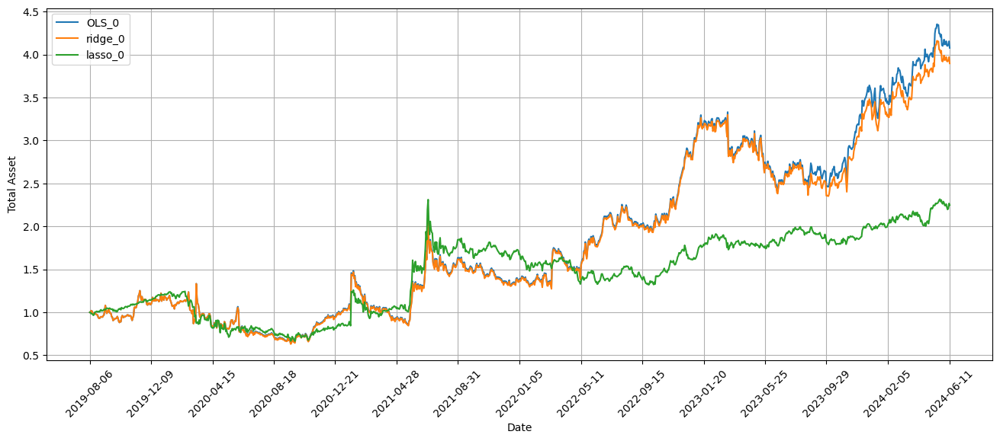

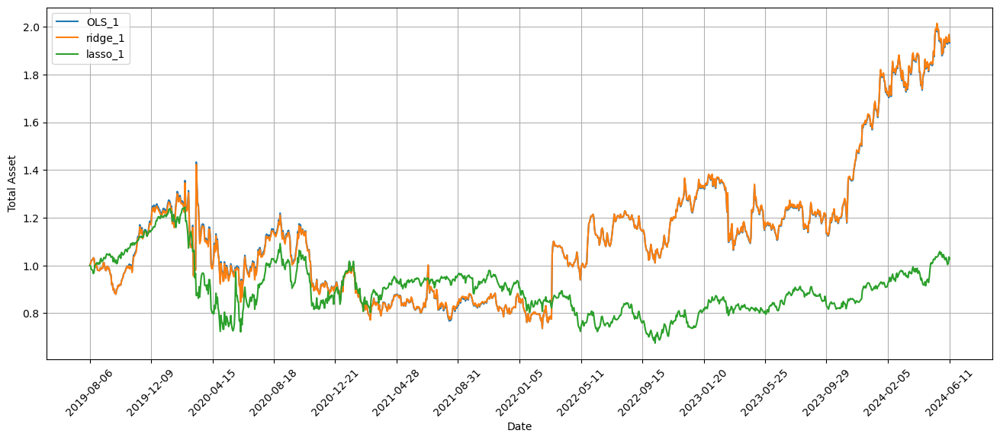

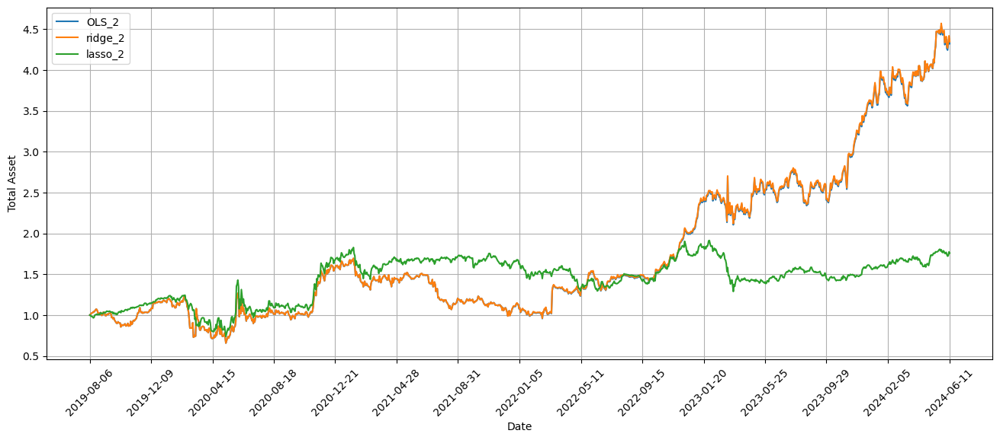

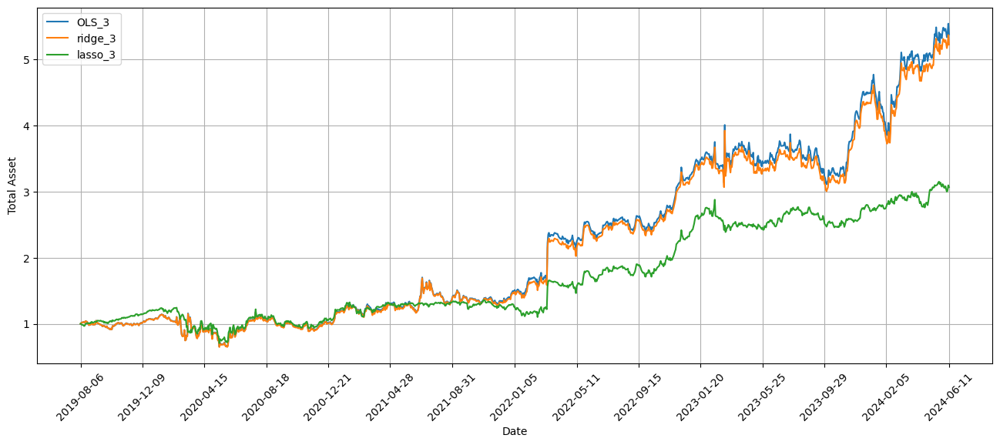

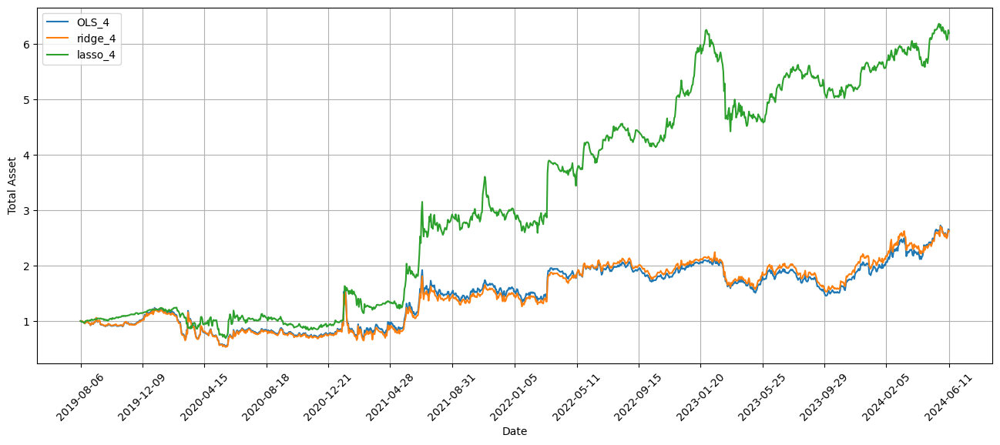

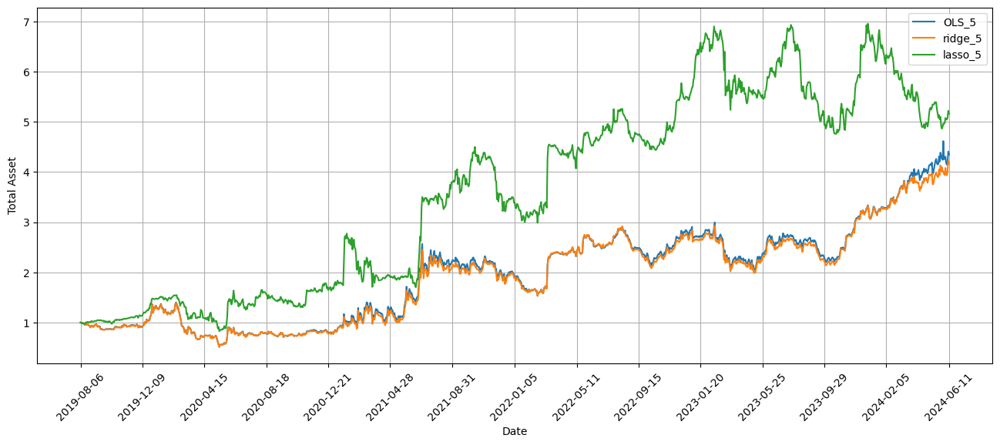

Running 62 of 67 iterations. First iteration already finished
Standardization data are from 2022-11-07 to 2023-08-24
Training data are from 2023-08-25 to 2024-06-11
Testing data are from 2024-05-15 to 2024-07-11
top_stocks by OLS factors 0 to buy on 2024-06-13 are ['EUFN', 'EWQ', 'SUN', 'IDV', 'ARCT', 'PEP', 'EXPRQ', 'EIDO', 'EWW', 'CXW']
Total asset on 2024-06-14 will be 4.034911161036803
It should be the same as 4.034911161036849
top_stocks by OLS factors 0 to buy on 2024-06-14 are ['EFV', 'KHC', 'CELH', 'MNST', 'IDV', 'EXPRQ', 'LEG', 'PEP', 'EIDO', 'CXW']
Total asset on 2024-06-17 will be 3.9245376478839344
It should be the same as 3.92453764788398
top_stocks by OLS factors 0 to buy on 2024-06-17 are ['QDEL', 'GFI', 'MO', 'BBVA', 'FSK', 'EIDO', 'RH', 'IRWD', 'LEG', 'NEP']
Total asset on 2024-06-18 will be 3.955044019978562
It should be the same as 3.955044019978608
top_stocks by OLS factors 0 to buy on 2024-06-18 are ['CORT', 'IRWD', 'MNST', 'SIGA', 'NEP', 'GPRO', 'SIG', 'MDRX', 'RH

Total asset on 2024-07-15 will be 4.037810716316818
It should be the same as 4.037810716316856
top_stocks by lasso factors 0 to buy on 2024-06-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-14 will be 2.2124264126015425
It should be the same as 2.212426412601584
top_stocks by lasso factors 0 to buy on 2024-06-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-17 will be 2.2032381621867274
It should be the same as 2.2032381621867687
top_stocks by lasso factors 0 to buy on 2024-06-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-18 will be 2.2318102443071854
It should be the same as 2.2318102443072263
top_stocks by lasso factors 0 to buy on 2024-06-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-20 will be 2.25366500327017
It should be the same as 2.2536650032702106


Total asset on 2024-07-12 will be 2.0269486137905557
It should be the same as 2.0269486137905894
top_stocks by OLS factors 1 to buy on 2024-07-12 are ['PRO', 'DAL', 'SPB', 'BLMN', 'HUBS', 'XRX', 'SBUX', 'DECK', 'DRI', 'HELE']
Total asset on 2024-07-15 will be 2.0205247661628047
It should be the same as 2.0205247661628394
top_stocks by ridge factors 1 to buy on 2024-06-13 are ['EIDO', 'PEP', 'HSIC', 'CELH', 'CX', 'UEC', 'EWZ', 'ILF', 'EWW', 'CXW']
Total asset on 2024-06-14 will be 1.9442852146819996
It should be the same as 1.9442852146820244
top_stocks by ridge factors 1 to buy on 2024-06-14 are ['WDAY', 'EWZ', 'QD', 'HSIC', 'EIDO', 'RGNX', 'KR', 'PEP', 'CELH', 'CXW']
Total asset on 2024-06-17 will be 1.9352948223665225
It should be the same as 1.9352948223665476
top_stocks by ridge factors 1 to buy on 2024-06-17 are ['MDB', 'RGNX', 'RS', 'EWQ', 'KR', 'RGEN', 'BBVA', 'NUE', 'MSM', 'GE']
Total asset on 2024-06-18 will be 1.958375875674087
It should be the same as 1.9583758756741123
top_

top_stocks by OLS factors 2 to buy on 2024-06-13 are ['ILF', 'IDV', 'SUN', 'ARCT', 'GME', 'EXPRQ', 'PEP', 'EIDO', 'EWW', 'CXW']
Total asset on 2024-06-14 will be 4.3511374280409525
It should be the same as 4.3511374280410084
top_stocks by OLS factors 2 to buy on 2024-06-14 are ['EFV', 'KHC', 'IDV', 'EXPRQ', 'CELH', 'LEG', 'MNST', 'PEP', 'EIDO', 'CXW']
Total asset on 2024-06-17 will be 4.2336914148547695
It should be the same as 4.233691414854825
top_stocks by OLS factors 2 to buy on 2024-06-17 are ['MO', 'QDEL', 'BBVA', 'FSK', 'EIDO', 'MNST', 'IRWD', 'LEG', 'RH', 'NEP']
Total asset on 2024-06-18 will be 4.268204309381747
It should be the same as 4.268204309381803
top_stocks by OLS factors 2 to buy on 2024-06-18 are ['CORT', 'TM', 'SIGA', 'MNST', 'GPRO', 'NEP', 'MDRX', 'SIG', 'RH', 'MSM']
Total asset on 2024-06-20 will be 4.24310282986311
It should be the same as 4.243102829863165
top_stocks by OLS factors 2 to buy on 2024-06-20 are ['CORT', 'XNCR', 'BCE', 'IRWD', 'GPRO', 'WKHS', 'MSM',

Total asset on 2024-07-12 will be 4.354576303813093
It should be the same as 4.35457630381314
top_stocks by ridge factors 2 to buy on 2024-07-12 are ['WING', 'FTAI', 'FUN', 'SAVE', 'BLMN', 'HUBS', 'ZD', 'DRI', 'SRNE', 'HELE']
Total asset on 2024-07-15 will be 4.393054045125773
It should be the same as 4.39305404512582
top_stocks by lasso factors 2 to buy on 2024-06-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-14 will be 1.7317295845776528
It should be the same as 1.7317295845776983
top_stocks by lasso factors 2 to buy on 2024-06-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-17 will be 1.7223832892211932
It should be the same as 1.7223832892212385
top_stocks by lasso factors 2 to buy on 2024-06-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-18 will be 1.7437182493445402
It should be the same as 1.7437182493445857

top_stocks by OLS factors 3 to buy on 2024-07-12 are ['ZD', 'ALK', 'BLMN', 'DRI', 'FTAI', 'HUBS', 'HDB', 'SAVE', 'SRNE', 'HELE']
Total asset on 2024-07-15 will be 5.503251657616677
It should be the same as 5.503251657616741
top_stocks by ridge factors 3 to buy on 2024-06-13 are ['BF-B', 'EIDO', 'SMTC', 'LPG', 'KHC', 'PEP', 'EWW', 'FIVE', 'LIVN', 'CXW']
Total asset on 2024-06-14 will be 5.159852196066692
It should be the same as 5.159852196066759
top_stocks by ridge factors 3 to buy on 2024-06-14 are ['EFV', 'ARCT', 'EWQ', 'CELH', 'EIDO', 'EWW', 'PEP', 'MNST', 'SMTC', 'CXW']
Total asset on 2024-06-17 will be 5.11900085769959
It should be the same as 5.119000857699658
top_stocks by ridge factors 3 to buy on 2024-06-17 are ['EFV', 'EUFN', 'MNST', 'EWP', 'EWW', 'IDV', 'EWI', 'EWQ', 'EIDO', 'CXW']
Total asset on 2024-06-18 will be 5.1687976700655724
It should be the same as 5.168797670065638
top_stocks by ridge factors 3 to buy on 2024-06-18 are ['APTV', 'QDEL', 'LEG', 'NEP', 'EXPRQ', 'SIG'

Total asset on 2024-07-12 will be 3.105764541892824
It should be the same as 3.105764541892878
top_stocks by lasso factors 3 to buy on 2024-07-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-15 will be 3.1134196277197845
It should be the same as 3.1134196277198387
top_stocks by OLS factors 4 to buy on 2024-06-13 are ['FIVE', 'BMA', 'SMTC', 'UEC', 'ANF', 'AGIO', 'VST', 'CXW', 'DELL', 'SRNE']
Total asset on 2024-06-14 will be 2.602915041767929
It should be the same as 2.602915041767974
top_stocks by OLS factors 4 to buy on 2024-06-14 are ['ARCT', 'DELL', 'GWRE', 'UEC', 'EWW', 'SMTC', 'AGIO', 'ANF', 'VST', 'CXW']
Total asset on 2024-06-17 will be 2.592843605756908
It should be the same as 2.5928436057569524
top_stocks by OLS factors 4 to buy on 2024-06-17 are ['IDV', 'EWP', 'GWRE', 'EWI', 'EWW', 'EWQ', 'AGIO', 'EIDO', 'ANF', 'CXW']
Total asset on 2024-06-18 will be 2.6028539732214853
It should be the same as 2.6028539732215297
top_s

Total asset on 2024-07-12 will be 2.6380816067594655
It should be the same as 2.638081606759517
top_stocks by ridge factors 4 to buy on 2024-07-12 are ['PBI', 'HELE', 'TECL', 'TQQQ', 'MSTR', 'NVDA', 'ANF', 'DELL', 'SOXL', 'FTAI']
Total asset on 2024-07-15 will be 2.713940314920887
It should be the same as 2.713940314920939
top_stocks by lasso factors 4 to buy on 2024-06-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-14 will be 6.100806654832744
It should be the same as 6.100806654832806
top_stocks by lasso factors 4 to buy on 2024-06-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-17 will be 6.069608192305844
It should be the same as 6.069608192305905
top_stocks by lasso factors 4 to buy on 2024-06-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-06-18 will be 6.1452243458875895
It should be the same as 6.145224345887652

top_stocks by OLS factors 5 to buy on 2024-07-09 are ['AVAV', 'INSM', 'FTAI', 'ELF', 'FND', 'AVGO', 'ANF', 'SAVA', 'MU', 'PCRX']
Total asset on 2024-07-10 will be 4.397857653278624
It should be the same as 4.397857653278652
top_stocks by OLS factors 5 to buy on 2024-07-10 are ['AVAV', 'FND', 'EXPRQ', 'FTAI', 'CMG', 'WBA', 'MU', 'HELE', 'PCRX', 'SRNE']
Total asset on 2024-07-11 will be 4.43028621243385
It should be the same as 4.430286212433879
top_stocks by OLS factors 5 to buy on 2024-07-11 are ['VRNT', 'HELE', 'AVAV', 'AVGO', 'CMG', 'MU', 'HDB', 'PCRX', 'FTAI', 'SRNE']
Total asset on 2024-07-12 will be 4.450879031562446
It should be the same as 4.450879031562475
top_stocks by OLS factors 5 to buy on 2024-07-12 are ['SRNE', 'TECL', 'TQQQ', 'MU', 'HDB', 'AVGO', 'WING', 'DRI', 'HELE', 'FTAI']
Total asset on 2024-07-15 will be 4.488898838574831
It should be the same as 4.48889883857486
top_stocks by ridge factors 5 to buy on 2024-06-13 are ['UEC', 'LPG', 'SMTC', 'MSTR', 'EWW', 'INSM', 'C

Total asset on 2024-07-03 will be 5.177304836215365
It should be the same as 5.177304836215417
top_stocks by lasso factors 5 to buy on 2024-07-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-05 will be 5.182736577837122
It should be the same as 5.182736577837175
top_stocks by lasso factors 5 to buy on 2024-07-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-08 will be 5.180832625079516
It should be the same as 5.180832625079567
top_stocks by lasso factors 5 to buy on 2024-07-08 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-09 will be 5.161098403491612
It should be the same as 5.161098403491665
top_stocks by lasso factors 5 to buy on 2024-07-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-10 will be 5.125241506142174
It should be the same as 5.125241506142226
top_s

Total asset on 2024-07-26 will be 4.023995395351878
It should be the same as 4.023995395351914
top_stocks by ridge factors 0 to buy on 2024-07-26 are ['WST', 'RHI', 'LKQ', 'BXMT', 'TER', 'UPS', 'WM', 'MXL', 'EW', 'LW']
Total asset on 2024-07-29 will be 4.066448155627838
It should be the same as 4.066448155627875
top_stocks by ridge factors 0 to buy on 2024-07-29 are ['WST', 'BAH', 'F', 'TER', 'LKQ', 'WM', 'MXL', 'DXCM', 'EW', 'LW']
Total asset on 2024-07-30 will be 4.123061786025151
It should be the same as 4.123061786025188
top_stocks by ridge factors 0 to buy on 2024-07-30 are ['SAIA', 'TER', 'LKQ', 'F', 'BAH', 'IART', 'WM', 'MXL', 'EW', 'DXCM']
Total asset on 2024-07-31 will be 4.153065466725715
It should be the same as 4.153065466725753
top_stocks by ridge factors 0 to buy on 2024-07-31 are ['USFR', 'BAH', 'RSG', 'GLW', 'WWD', 'ECL', 'SAIA', 'SRNE', 'IART', 'DXCM']
Total asset on 2024-08-01 will be 4.152267965966115
It should be the same as 4.1522679659661526
top_stocks by ridge fa

top_stocks by OLS factors 1 to buy on 2024-07-26 are ['ROP', 'RHI', 'DXJ', 'STM', 'TER', 'WM', 'WST', 'MXL', 'EW', 'LW']
Total asset on 2024-07-29 will be 2.1831138870951303
It should be the same as 2.183113887095165
top_stocks by OLS factors 1 to buy on 2024-07-29 are ['F', 'BAH', 'LKQ', 'WST', 'TER', 'WM', 'MXL', 'EW', 'DXCM', 'LW']
Total asset on 2024-07-30 will be 2.2135083649024265
It should be the same as 2.213508364902461
top_stocks by OLS factors 1 to buy on 2024-07-30 are ['SAIA', 'STM', 'F', 'TER', 'BAH', 'IART', 'WM', 'MXL', 'EW', 'DXCM']
Total asset on 2024-07-31 will be 2.2238129887294837
It should be the same as 2.223812988729518
top_stocks by OLS factors 1 to buy on 2024-07-31 are ['APPF', 'CLS', 'SRNE', 'LSCC', 'WWD', 'SAIA', 'GLW', 'ECL', 'IART', 'DXCM']
Total asset on 2024-08-01 will be 2.21629375443331
It should be the same as 2.2162937544333445
top_stocks by OLS factors 1 to buy on 2024-08-01 are ['MGNX', 'LNTH', 'RMBS', 'UCTT', 'APPF', 'WWD', 'AMKR', 'MRK', 'IART',

Total asset on 2024-07-25 will be 1.0154013795924042
It should be the same as 1.0154013795924335
top_stocks by lasso factors 1 to buy on 2024-07-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-26 will be 1.0131199286322603
It should be the same as 1.0131199286322898
top_stocks by lasso factors 1 to buy on 2024-07-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-29 will be 1.0152794325214733
It should be the same as 1.0152794325215035
top_stocks by lasso factors 1 to buy on 2024-07-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-30 will be 1.0145047935703477
It should be the same as 1.014504793570378
top_stocks by lasso factors 1 to buy on 2024-07-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-31 will be 1.0280027137993608
It should be the same as 1.0280027137993

Total asset on 2024-07-26 will be 4.348570964155039
It should be the same as 4.348570964155089
top_stocks by ridge factors 2 to buy on 2024-07-26 are ['STM', 'RHI', 'WST', 'TER', 'LKQ', 'UPS', 'WM', 'MXL', 'EW', 'LW']
Total asset on 2024-07-29 will be 4.397074191613224
It should be the same as 4.397074191613273
top_stocks by ridge factors 2 to buy on 2024-07-29 are ['WST', 'BAH', 'TER', 'F', 'LKQ', 'WM', 'MXL', 'EW', 'DXCM', 'LW']
Total asset on 2024-07-30 will be 4.458290160446604
It should be the same as 4.458290160446651
top_stocks by ridge factors 2 to buy on 2024-07-30 are ['SAIA', 'STM', 'F', 'BAH', 'LKQ', 'WM', 'IART', 'MXL', 'EW', 'DXCM']
Total asset on 2024-07-31 will be 4.495124605125112
It should be the same as 4.495124605125158
top_stocks by ridge factors 2 to buy on 2024-07-31 are ['DEO', 'RSG', 'LSCC', 'GLW', 'WWD', 'ECL', 'SAIA', 'SRNE', 'IART', 'DXCM']
Total asset on 2024-08-01 will be 4.483222237118597
It should be the same as 4.483222237118645
top_stocks by ridge fact

Total asset on 2024-07-29 will be 5.637972718946542
It should be the same as 5.637972718946602
top_stocks by OLS factors 3 to buy on 2024-07-29 are ['GNTX', 'TER', 'BAH', 'F', 'LKQ', 'WM', 'MXL', 'EW', 'LW', 'DXCM']
Total asset on 2024-07-30 will be 5.713810492169086
It should be the same as 5.713810492169146
top_stocks by OLS factors 3 to buy on 2024-07-30 are ['RSG', 'F', 'BAH', 'SAIA', 'WM', 'IART', 'EW', 'MXL', 'LW', 'DXCM']
Total asset on 2024-07-31 will be 5.7774928216171295
It should be the same as 5.777492821617189
top_stocks by OLS factors 3 to buy on 2024-07-31 are ['LSCC', 'APPF', 'WM', 'WWD', 'ECL', 'MXL', 'IART', 'EW', 'DXCM', 'LW']
Total asset on 2024-08-01 will be 5.763046047467312
It should be the same as 5.763046047467372
top_stocks by OLS factors 3 to buy on 2024-08-01 are ['MRK', 'AMKR', 'RMBS', 'LNTH', 'MXL', 'MGNX', 'WWD', 'PEN', 'DXCM', 'EW']
Total asset on 2024-08-02 will be 5.534751986008146
It should be the same as 5.534751986008208
top_stocks by OLS factors 3 

Total asset on 2024-07-29 will be 3.0466231555696353
It should be the same as 3.0466231555696903
top_stocks by lasso factors 3 to buy on 2024-07-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-30 will be 3.0468340025384495
It should be the same as 3.0468340025385054
top_stocks by lasso factors 3 to buy on 2024-07-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-07-31 will be 3.0846544225977923
It should be the same as 3.0846544225978487
top_stocks by lasso factors 3 to buy on 2024-07-31 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-01 will be 3.102209411932451
It should be the same as 3.102209411932508
top_stocks by lasso factors 3 to buy on 2024-08-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-02 will be 2.9295147582705785
It should be the same as 2.92951475827063

top_stocks by ridge factors 4 to buy on 2024-07-25 are ['TOL', 'UPS', 'PCAR', 'MOD', 'VST', 'FTAI', 'FTV', 'MEDP', 'LW', 'MSTR']
Total asset on 2024-07-26 will be 2.8038463544895724
It should be the same as 2.8038463544896266
top_stocks by ridge factors 4 to buy on 2024-07-26 are ['MHO', 'EME', 'RYAAY', 'TOL', 'FTAI', 'WM', 'LKQ', 'EW', 'LW', 'MSTR']
Total asset on 2024-07-29 will be 2.886513466560569
It should be the same as 2.886513466560623
top_stocks by ridge factors 4 to buy on 2024-07-29 are ['GNTX', 'FTAI', 'MXL', 'WM', 'MSTR', 'LKQ', 'DXCM', 'LW', 'EW', 'SRNE']
Total asset on 2024-07-30 will be 2.895902998904083
It should be the same as 2.895902998904137
top_stocks by ridge factors 4 to buy on 2024-07-30 are ['UPS', 'IART', 'MXL', 'FTAI', 'SAIA', 'VKTX', 'EW', 'MSTR', 'LW', 'DXCM']
Total asset on 2024-07-31 will be 2.9070085655808167
It should be the same as 2.9070085655808713
top_stocks by ridge factors 4 to buy on 2024-07-31 are ['GE', 'MXL', 'WM', 'TER', 'ECL', 'FTAI', 'DXCM

Total asset on 2024-07-22 will be 4.487127885533514
It should be the same as 4.487127885533541
top_stocks by OLS factors 5 to buy on 2024-07-22 are ['AIR', 'ALV', 'LNTH', 'NAIL', 'TPH', 'SIGI', 'TOL', 'MHO', 'WIT', 'MSTR']
Total asset on 2024-07-23 will be 4.513024759937838
It should be the same as 4.513024759937864
top_stocks by OLS factors 5 to buy on 2024-07-23 are ['MHO', 'TRV', 'MTH', 'NAIL', 'TOL', 'FTAI', 'RYAAY', 'WIT', 'AIR', 'SIGI']
Total asset on 2024-07-24 will be 4.591329276968957
It should be the same as 4.591329276968984
top_stocks by OLS factors 5 to buy on 2024-07-24 are ['WIT', 'WBS', 'TPH', 'RYAAY', 'SIGI', 'SRNE', 'PHM', 'AOS', 'PCAR', 'MEDP']
Total asset on 2024-07-25 will be 4.638306061843286
It should be the same as 4.638306061843314
top_stocks by OLS factors 5 to buy on 2024-07-25 are ['SIGI', 'GATX', 'CNI', 'APH', 'WIT', 'MCD', 'PCAR', 'MEDP', 'FTV', 'LW']
Total asset on 2024-07-26 will be 4.649238187241044
It should be the same as 4.649238187241071
top_stocks 

Total asset on 2024-07-22 will be 5.2238535222520595
It should be the same as 5.223853522252116
top_stocks by lasso factors 5 to buy on 2024-07-22 are ['SAVA', 'MU', 'WIT', 'VST', 'ASML', 'NVMI', 'AIR', 'SIGI', 'FUN', 'FIVE']
Total asset on 2024-07-23 will be 5.415444767346966
It should be the same as 5.415444767347024
top_stocks by lasso factors 5 to buy on 2024-07-23 are ['MU', 'VST', 'ASML', 'NVMI', 'WIT', 'FIVE', 'FUN', 'AIR', 'SIGI', 'RYAAY']
Total asset on 2024-07-24 will be 5.3664481871743765
It should be the same as 5.366448187174435
top_stocks by lasso factors 5 to buy on 2024-07-24 are ['ASML', 'NVMI', 'MEDP', 'UPS', 'WIT', 'AIR', 'FIVE', 'FUN', 'SIGI', 'RYAAY']
Total asset on 2024-07-25 will be 5.354868350884354
It should be the same as 5.354868350884413
top_stocks by lasso factors 5 to buy on 2024-07-25 are ['UPS', 'WIT', 'AIR', 'APH', 'ROP', 'SIGI', 'FIVE', 'FUN', 'RYAAY', 'LW']
Total asset on 2024-07-26 will be 5.412279876749404
It should be the same as 5.412279876749464


Total asset on 2024-09-09 will be 3.956579242744066
It should be the same as 3.9565792427441107
top_stocks by OLS factors 0 to buy on 2024-09-09 are ['FIX', 'CPRT', 'ZBH', 'GDDY', 'LECO', 'AVGO', 'TTC', 'ASML', 'MCK', 'DLTR']
Total asset on 2024-09-10 will be 3.9618818991858604
It should be the same as 3.9618818991859053
top_stocks by ridge factors 0 to buy on 2024-08-12 are ['SRNE', 'TREX', 'VRRM', 'MCK', 'RAMP', 'VYX', 'MNST', 'NVRO', 'ODP', 'IRWD']
Total asset on 2024-08-13 will be 4.2189100712682945
It should be the same as 4.218910071268328
top_stocks by ridge factors 0 to buy on 2024-08-13 are ['AQN', 'SRNE', 'MNST', 'VTNR', 'MODG', 'RAMP', 'MCK', 'IRWD', 'RILY', 'PCRX']
Total asset on 2024-08-14 will be 4.322844872145759
It should be the same as 4.322844872145792
top_stocks by ridge factors 0 to buy on 2024-08-14 are ['AQN', 'FIVN', 'SATS', 'IDEX', 'EXPRQ', 'JBLU', 'IRBT', 'IRWD', 'RILY', 'PCRX']
Total asset on 2024-08-15 will be 4.308696818889701
It should be the same as 4.3086

Total asset on 2024-09-09 will be 2.172278183406824
It should be the same as 2.1722781834068705
top_stocks by lasso factors 0 to buy on 2024-09-09 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-10 will be 2.16994503753875
It should be the same as 2.169945037538797
top_stocks by OLS factors 1 to buy on 2024-08-12 are ['TREX', 'HAE', 'NVRO', 'MNST', 'ATKR', 'VYX', 'VRRM', 'RAMP', 'IRWD', 'ODP']
Total asset on 2024-08-13 will be 2.2447362524520442
It should be the same as 2.24473625245208
top_stocks by OLS factors 1 to buy on 2024-08-13 are ['MODG', 'DLB', 'MCK', 'PSEC', 'VTNR', 'HAE', 'RILY', 'RAMP', 'IRWD', 'PCRX']
Total asset on 2024-08-14 will be 2.3101424777904978
It should be the same as 2.3101424777905337
top_stocks by OLS factors 1 to buy on 2024-08-14 are ['VTNR', 'EGHT', 'HI', 'FIVN', 'RAMP', 'DLB', 'HAE', 'RILY', 'IRWD', 'PCRX']
Total asset on 2024-08-15 will be 2.306595746343085
It should be the same as 2.3065957463431217


Total asset on 2024-09-10 will be 2.3131709663355746
It should be the same as 2.3131709663356044
top_stocks by lasso factors 1 to buy on 2024-08-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-13 will be 0.9910837443026628
It should be the same as 0.9910837443026932
top_stocks by lasso factors 1 to buy on 2024-08-13 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-14 will be 1.0012962600067554
It should be the same as 1.001296260006786
top_stocks by lasso factors 1 to buy on 2024-08-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-15 will be 1.0196060877693989
It should be the same as 1.0196060877694293
top_stocks by lasso factors 1 to buy on 2024-08-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-08-16 will be 1.0205073201755974
It should be the same as 1.0205073201756

Total asset on 2024-09-06 will be 4.4140848473122
It should be the same as 4.414084847312265
top_stocks by OLS factors 2 to buy on 2024-09-06 are ['QDEL', 'IRBT', 'SAVE', 'VRNT', 'SRNE', 'DIOD', 'TTC', 'SSRM', 'GPRE', 'DLTR']
Total asset on 2024-09-09 will be 4.354739619158757
It should be the same as 4.3547396191588215
top_stocks by OLS factors 2 to buy on 2024-09-09 are ['TTC', 'CAR', 'IRWD', 'ZBH', 'LEG', 'XRX', 'IRBT', 'SSRM', 'DLTR', 'GPRE']
Total asset on 2024-09-10 will be 4.301692622557225
It should be the same as 4.301692622557291
top_stocks by ridge factors 2 to buy on 2024-08-12 are ['SAVA', 'SRNE', 'VTNR', 'MNST', 'IRBT', 'VYX', 'NVRO', 'GPRE', 'ODP', 'IRWD']
Total asset on 2024-08-13 will be 4.491988796589318
It should be the same as 4.491988796589366
top_stocks by ridge factors 2 to buy on 2024-08-13 are ['AQN', 'PETS', 'FIVN', 'MODG', 'IRBT', 'VTNR', 'RILY', 'GPRE', 'IRWD', 'PCRX']
Total asset on 2024-08-14 will be 4.710625514925718
It should be the same as 4.71062551492

top_stocks by OLS factors 3 to buy on 2024-08-12 are ['ATKR', 'VYX', 'MODG', 'SRNE', 'VRRM', 'MCK', 'RAMP', 'MNST', 'ODP', 'IRWD']
Total asset on 2024-08-13 will be 5.88220813509707
It should be the same as 5.882208135097135
top_stocks by OLS factors 3 to buy on 2024-08-13 are ['LMBS', 'ROP', 'RAMP', 'UVXY', 'VIXY', 'MCK', 'RILY', 'ODP', 'IRWD', 'PCRX']
Total asset on 2024-08-14 will be 5.842819619875276
It should be the same as 5.84281961987534
top_stocks by OLS factors 3 to buy on 2024-08-14 are ['VTNR', 'PETS', 'VIXY', 'SAVA', 'NVRO', 'IDEX', 'IRWD', 'ODP', 'RILY', 'PCRX']
Total asset on 2024-08-15 will be 5.722654550385851
It should be the same as 5.722654550385915
top_stocks by OLS factors 3 to buy on 2024-08-15 are ['MCK', 'EGHT', 'AMN', 'HLF', 'HAE', 'AQN', 'IRWD', 'RILY', 'PCRX', 'EXPRQ']
Total asset on 2024-08-16 will be 5.6772074527805705
It should be the same as 5.677207452780633
top_stocks by OLS factors 3 to buy on 2024-08-16 are ['AQN', 'IDEX', 'UVXY', 'VIXY', 'SIGA', 'SR

top_stocks by ridge factors 3 to buy on 2024-09-09 are ['FSS', 'TTC', 'SWBI', 'ZBH', 'X', 'VRNT', 'LECO', 'CPRT', 'MCK', 'DLTR']
Total asset on 2024-09-10 will be 4.907993644314469
It should be the same as 4.9079936443145415
top_stocks by lasso factors 3 to buy on 2024-08-12 are ['TREX', 'VYX', 'ATKR', 'VRRM', 'NVRO', 'MCK', 'MNST', 'RAMP', 'IRWD', 'ODP']
Total asset on 2024-08-13 will be 2.9574347050181617
It should be the same as 2.9574347050182177
top_stocks by lasso factors 3 to buy on 2024-08-13 are ['UVXY', 'MNST', 'LMBS', 'VIXY', 'ROP', 'MCK', 'RILY', 'IRWD', 'ODP', 'PCRX']
Total asset on 2024-08-14 will be 2.938585067080036
It should be the same as 2.9385850670800915
top_stocks by lasso factors 3 to buy on 2024-08-14 are ['VIXY', 'IDEX', 'MCK', 'TREX', 'SAVA', 'NVRO', 'RILY', 'IRWD', 'ODP', 'PCRX']
Total asset on 2024-08-15 will be 2.9079518933070285
It should be the same as 2.9079518933070845
top_stocks by lasso factors 3 to buy on 2024-08-15 are ['EGHT', 'HAE', 'MNST', 'AQN',

Total asset on 2024-09-09 will be 2.696302008328026
It should be the same as 2.696302008328076
top_stocks by OLS factors 4 to buy on 2024-09-09 are ['CELH', 'LECO', 'EXPRQ', 'CPRT', 'ODP', 'IRWD', 'ATKR', 'DG', 'MCK', 'DLTR']
Total asset on 2024-09-10 will be 2.6861930036908714
It should be the same as 2.6861930036909225
top_stocks by ridge factors 4 to buy on 2024-08-12 are ['SRNE', 'ATKR', 'OC', 'BLD', 'DXJ', 'MNST', 'RAMP', 'SVXY', 'ODP', 'IRWD']
Total asset on 2024-08-13 will be 2.9237949540960444
It should be the same as 2.9237949540960972
top_stocks by ridge factors 4 to buy on 2024-08-13 are ['PRO', 'RAMP', 'BLMN', 'NVRO', 'TREX', 'RILY', 'GPRE', 'IRWD', 'ODP', 'PCRX']
Total asset on 2024-08-14 will be 3.0068297779860154
It should be the same as 3.006829777986068
top_stocks by ridge factors 4 to buy on 2024-08-14 are ['IDEX', 'PETS', 'MNST', 'TREX', 'GPRE', 'IRWD', 'NVRO', 'RILY', 'ODP', 'PCRX']
Total asset on 2024-08-15 will be 2.9851376064996353
It should be the same as 2.9851

top_stocks by lasso factors 4 to buy on 2024-09-05 are ['NUS', 'PDCO', 'NTAP', 'OKTA', 'WOLF', 'SRNE', 'APH', 'NBIX', 'DLTR', 'DG']
Total asset on 2024-09-06 will be 5.156367206589594
It should be the same as 5.156367206589675
top_stocks by lasso factors 4 to buy on 2024-09-06 are ['APH', 'X', 'LECO', 'VRNT', 'TTC', 'OKTA', 'PSTG', 'NTAP', 'DG', 'DLTR']
Total asset on 2024-09-09 will be 5.125298777411282
It should be the same as 5.125298777411363
top_stocks by lasso factors 4 to buy on 2024-09-09 are ['FSS', 'LEG', 'MCK', 'X', 'ASML', 'SWBI', 'VRNT', 'CPRT', 'LECO', 'DLTR']
Total asset on 2024-09-10 will be 5.095281876215956
It should be the same as 5.095281876216036
top_stocks by OLS factors 5 to buy on 2024-08-12 are ['HAE', 'BLD', 'MCK', 'TREX', 'IRBT', 'RAMP', 'SRNE', 'ATKR', 'ODP', 'IRWD']
Total asset on 2024-08-13 will be 5.001844878040922
It should be the same as 5.00184487804095
top_stocks by OLS factors 5 to buy on 2024-08-13 are ['CRL', 'ATKR', 'SAVA', 'TREX', 'GPRE', 'IRWD',

top_stocks by ridge factors 5 to buy on 2024-09-05 are ['NTAP', 'PSTG', 'SVXY', 'MU', 'CDNS', 'SNPS', 'DG', 'DLTR', 'VST', 'APH']
Total asset on 2024-09-06 will be 4.731330891967292
It should be the same as 4.731330891967352
top_stocks by ridge factors 5 to buy on 2024-09-06 are ['VRNT', 'CELH', 'SNPS', 'HPE', 'MU', 'CPRT', 'X', 'TTC', 'DG', 'DLTR']
Total asset on 2024-09-09 will be 4.703323120486351
It should be the same as 4.703323120486411
top_stocks by ridge factors 5 to buy on 2024-09-09 are ['WOLF', 'AZUL', 'DLTR', 'RILY', 'GPRE', 'DG', 'NVMI', 'IRWD', 'AVGO', 'MCK']
Total asset on 2024-09-10 will be 4.602242694943596
It should be the same as 4.602242694943658
top_stocks by lasso factors 5 to buy on 2024-08-12 are ['XENE', 'DXJ', 'MCK', 'HAE', 'IRBT', 'VRRM', 'RAMP', 'FIVN', 'SRNE', 'IRWD']
Total asset on 2024-08-13 will be 5.77153367306162
It should be the same as 5.771533673061678
top_stocks by lasso factors 5 to buy on 2024-08-13 are ['DXCM', 'ODP', 'NUS', 'IDEX', 'AQN', 'SATS

Total asset on 2024-09-24 will be 4.225547918336216
It should be the same as 4.225547918336264
top_stocks by OLS factors 0 to buy on 2024-09-24 are ['GSK', 'EXEL', 'MUSA', 'AZUL', 'SENS', 'BRK-A', 'FDX', 'PSQ', 'EXPRQ', 'SITC']
Total asset on 2024-09-25 will be 4.201656560820187
It should be the same as 4.201656560820234
top_stocks by OLS factors 0 to buy on 2024-09-25 are ['LGND', 'COOP', 'BSCO', 'XLV', 'HCSG', 'KOLD', 'FDX', 'BRK-A', 'IRWD', 'SITC']
Total asset on 2024-09-26 will be 4.199642914557526
It should be the same as 4.199642914557572
top_stocks by OLS factors 0 to buy on 2024-09-26 are ['BSCO', 'LABU', 'IBB', 'SYF', 'KOLD', 'LNW', 'PSQ', 'BRK-A', 'IRWD', 'SITC']
Total asset on 2024-09-27 will be 4.240520490639783
It should be the same as 4.2405204906398275
top_stocks by OLS factors 0 to buy on 2024-09-27 are ['HDV', 'IRWD', 'AMN', 'IBB', 'AMGN', 'USFR', 'PSQ', 'SIGA', 'BRK-A', 'LNW']
Total asset on 2024-09-30 will be 4.217344333856253
It should be the same as 4.2173443338562

Total asset on 2024-09-23 will be 2.2468591811100898
It should be the same as 2.2468591811101346
top_stocks by lasso factors 0 to buy on 2024-09-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-24 will be 2.2421764913256426
It should be the same as 2.2421764913256874
top_stocks by lasso factors 0 to buy on 2024-09-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-25 will be 2.238038272685035
It should be the same as 2.2380382726850803
top_stocks by lasso factors 0 to buy on 2024-09-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-26 will be 2.2529720612054094
It should be the same as 2.252972061205455
top_stocks by lasso factors 0 to buy on 2024-09-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-27 will be 2.2544045001654025
It should be the same as 2.25440450016544

Total asset on 2024-09-23 will be 2.509350502099622
It should be the same as 2.5093505020996534
top_stocks by ridge factors 1 to buy on 2024-09-23 are ['CAL', 'GSK', 'VRSK', 'LPG', 'CNQ', 'OXY', 'TDW', 'ELF', 'IMO', 'QRVO']
Total asset on 2024-09-24 will be 2.5438649098253965
It should be the same as 2.543864909825428
top_stocks by ridge factors 1 to buy on 2024-09-24 are ['OXY', 'BMRN', 'KNSL', 'GSK', 'RVNC', 'TDW', 'YANG', 'ELF', 'LPG', 'SITC']
Total asset on 2024-09-25 will be 2.518942417919738
It should be the same as 2.51894241791977
top_stocks by ridge factors 1 to buy on 2024-09-25 are ['AZO', 'BRK-A', 'ELV', 'BMRN', 'GSK', 'VRSK', 'JDST', 'MCK', 'SITC', 'YANG']
Total asset on 2024-09-26 will be 2.4487985071127585
It should be the same as 2.4487985071127896
top_stocks by ridge factors 1 to buy on 2024-09-26 are ['CAL', 'BRK-A', 'BMRN', 'VRSK', 'REGN', 'JDST', 'HUM', 'MCK', 'SITC', 'YANG']
Total asset on 2024-09-27 will be 2.4665965420130824
It should be the same as 2.46659654201

Total asset on 2024-09-20 will be 4.569229344067674
It should be the same as 4.569229344067741
top_stocks by OLS factors 2 to buy on 2024-09-20 are ['YUMC', 'SDOW', 'FIVE', 'DXD', 'EXPRQ', 'IRBT', 'SAVE', 'DOG', 'SSRM', 'GPRE']
Total asset on 2024-09-23 will be 4.551315564326307
It should be the same as 4.551315564326374
top_stocks by OLS factors 2 to buy on 2024-09-23 are ['HUM', 'YUMC', 'DXD', 'FIVE', 'EXPRQ', 'IRBT', 'DOG', 'SAVE', 'SSRM', 'GPRE']
Total asset on 2024-09-24 will be 4.546806942342683
It should be the same as 4.546806942342751
top_stocks by OLS factors 2 to buy on 2024-09-24 are ['BF-B', 'DXD', 'IRBT', 'EXPRQ', 'DOG', 'FIVE', 'SAVE', 'SITC', 'SSRM', 'GPRE']
Total asset on 2024-09-25 will be 4.570108465321614
It should be the same as 4.570108465321681
top_stocks by OLS factors 2 to buy on 2024-09-25 are ['DXD', 'XRX', 'IRWD', 'FIVE', 'DOG', 'IRBT', 'SAVE', 'SITC', 'SSRM', 'GPRE']
Total asset on 2024-09-26 will be 4.557119428768946
It should be the same as 4.557119428769

top_stocks by lasso factors 2 to buy on 2024-09-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-18 will be 1.762733679107561
It should be the same as 1.7627336791076116
top_stocks by lasso factors 2 to buy on 2024-09-18 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-19 will be 1.7993330461246997
It should be the same as 1.79933304612475
top_stocks by lasso factors 2 to buy on 2024-09-19 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-20 will be 1.7804758694259712
It should be the same as 1.780475869426022
top_stocks by lasso factors 2 to buy on 2024-09-20 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-23 will be 1.7818135868020084
It should be the same as 1.7818135868020597
top_stocks by lasso factors 2 to buy on 2024-09-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FOR

top_stocks by ridge factors 3 to buy on 2024-09-16 are ['AMN', 'AZN', 'HUM', 'ABM', 'JDST', 'IDEX', 'IONS', 'CAL', 'SRNE', 'EXPRQ']
Total asset on 2024-09-17 will be 5.277435321945059
It should be the same as 5.277435321945133
top_stocks by ridge factors 3 to buy on 2024-09-17 are ['RWM', 'ADBE', 'GRMN', 'DUST', 'VSAT', 'ALLY', 'HUM', 'PPC', 'BMRN', 'JDST']
Total asset on 2024-09-18 will be 5.281455054114989
It should be the same as 5.281455054115064
top_stocks by ridge factors 3 to buy on 2024-09-18 are ['SRTY', 'NVMI', 'RWM', 'TWM', 'CRUS', 'BCE', 'JDST', 'MO', 'HUM', 'BMRN']
Total asset on 2024-09-19 will be 5.228818614188683
It should be the same as 5.228818614188758
top_stocks by ridge factors 3 to buy on 2024-09-19 are ['ACN', 'RMD', 'CWST', 'COR', 'CHRS', 'ADBE', 'MO', 'SRNE', 'IDEX', 'BMRN']
Total asset on 2024-09-20 will be 5.243399277264095
It should be the same as 5.243399277264171
top_stocks by ridge factors 3 to buy on 2024-09-20 are ['CWST', 'ADBE', 'SRTY', 'COR', 'TZA', 

Total asset on 2024-09-12 will be 2.779599091126243
It should be the same as 2.7795990911262938
top_stocks by OLS factors 4 to buy on 2024-09-12 are ['MEOH', 'ALLY', 'NTAP', 'DLTR', 'TDW', 'VCEL', 'ELF', 'HI', 'MCK', 'SWBI']
Total asset on 2024-09-13 will be 2.8306240795090587
It should be the same as 2.8306240795091098
top_stocks by OLS factors 4 to buy on 2024-09-13 are ['ASML', 'VCEL', 'TDW', 'ELF', 'HI', 'ALLY', 'MEOH', 'SWBI', 'MCK', 'EXPRQ']
Total asset on 2024-09-16 will be 2.8478961328611603
It should be the same as 2.8478961328612122
top_stocks by OLS factors 4 to buy on 2024-09-16 are ['IONS', 'CMPR', 'ELF', 'EXPRQ', 'TDW', 'MEOH', 'HI', 'SWBI', 'ALLY', 'MCK']
Total asset on 2024-09-17 will be 2.869097423913226
It should be the same as 2.8690974239132774
top_stocks by OLS factors 4 to buy on 2024-09-17 are ['CMPR', 'BFH', 'SWBI', 'CAL', 'TDW', 'HI', 'MEOH', 'ELF', 'MCK', 'ALLY']
Total asset on 2024-09-18 will be 2.8827498863680705
It should be the same as 2.882749886368122
to

Total asset on 2024-10-07 will be 2.779787376716385
It should be the same as 2.779787376716442
top_stocks by ridge factors 4 to buy on 2024-10-07 are ['SAVE', 'LNW', 'YANG', 'CAG', 'AGIO', 'MMYT', 'LMBS', 'HUM', 'ACHC', 'EXPRQ']
Total asset on 2024-10-08 will be 2.8684758091922067
It should be the same as 2.868475809192262
top_stocks by lasso factors 4 to buy on 2024-09-10 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-11 will be 5.075051735726412
It should be the same as 5.075051735726492
top_stocks by lasso factors 4 to buy on 2024-09-11 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-12 will be 5.123436909874881
It should be the same as 5.123436909874961
top_stocks by lasso factors 4 to buy on 2024-09-12 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-09-13 will be 5.195174061620542
It should be the same as 5.195174061620623


Total asset on 2024-10-03 will be 5.322011709994935
It should be the same as 5.322011709994974
top_stocks by OLS factors 5 to buy on 2024-10-03 are ['AGIO', 'VCEL', 'NVO', 'SFIX', 'VTNR', 'LMBS', 'LNW', 'HUM', 'EXPRQ', 'SITC']
Total asset on 2024-10-04 will be 5.381627908729354
It should be the same as 5.381627908729392
top_stocks by OLS factors 5 to buy on 2024-10-04 are ['CAG', 'SFIX', 'ACHC', 'YANG', 'VTNR', 'LNW', 'MMYT', 'LMBS', 'HUM', 'SITC']
Total asset on 2024-10-07 will be 5.33865072648407
It should be the same as 5.338650726484111
top_stocks by OLS factors 5 to buy on 2024-10-07 are ['VTNR', 'AGIO', 'YANG', 'EIDO', 'SAVE', 'CAG', 'ACHC', 'LMBS', 'HUM', 'EXPRQ']
Total asset on 2024-10-08 will be 5.508194727397955
It should be the same as 5.508194727397995
top_stocks by ridge factors 5 to buy on 2024-09-10 are ['ANF', 'ASML', 'SNPS', 'NBIX', 'NTAP', 'VST', 'AVGO', 'APH', 'DLTR', 'EXPRQ']
Total asset on 2024-09-11 will be 4.6281359126650345
It should be the same as 4.62813591266

Total asset on 2024-09-30 will be 6.255848080549953
It should be the same as 6.255848080550016
top_stocks by lasso factors 5 to buy on 2024-09-30 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-01 will be 6.266842030759215
It should be the same as 6.266842030759278
top_stocks by lasso factors 5 to buy on 2024-10-01 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-02 will be 6.239406573025125
It should be the same as 6.23940657302519
top_stocks by lasso factors 5 to buy on 2024-10-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-03 will be 6.234683325070647
It should be the same as 6.234683325070712
top_stocks by lasso factors 5 to buy on 2024-10-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-04 will be 6.290447628725978
It should be the same as 6.290447628726044
top_st

top_stocks by ridge factors 0 to buy on 2024-10-21 are ['TECL', 'AMAT', 'TQQQ', 'XLK', 'QQQ', 'CVLT', 'KLAC', 'TSLA', 'BRK-A', 'SRNE']
Total asset on 2024-10-22 will be 3.9416721599238578
It should be the same as 3.941672159923892
top_stocks by ridge factors 0 to buy on 2024-10-22 are ['RCL', 'CSX', 'BHP', 'XLY', 'AMD', 'DBA', 'UL', 'EWZ', 'TSLA', 'BRK-A']
Total asset on 2024-10-23 will be 3.911227791044108
It should be the same as 3.911227791044142
top_stocks by ridge factors 0 to buy on 2024-10-23 are ['EFA', 'SPY', 'SDY', 'XLY', 'FVD', 'LABU', 'IWN', 'TSLA', 'EXPRQ', 'BRK-A']
Total asset on 2024-10-24 will be 3.96155838415179
It should be the same as 3.9615583841518243
top_stocks by ridge factors 0 to buy on 2024-10-24 are ['FUL', 'VRRM', 'EEMV', 'MHO', 'EFA', 'SDY', 'GWW', 'IWN', 'IDEX', 'BRK-A']
Total asset on 2024-10-25 will be 3.9665205099479808
It should be the same as 3.966520509948015
top_stocks by ridge factors 0 to buy on 2024-10-25 are ['GPC', 'XRT', 'IRWD', 'FVD', 'PHM', 

Total asset on 2024-10-18 will be 2.533631183360839
It should be the same as 2.5336311833608733
top_stocks by OLS factors 1 to buy on 2024-10-18 are ['MOH', 'THRM', 'NEU', 'LMBS', 'LRN', 'PKX', 'EMLC', 'ELV', 'ITUB', 'FXE']
Total asset on 2024-10-21 will be 2.5212259381352644
It should be the same as 2.5212259381352986
top_stocks by OLS factors 1 to buy on 2024-10-21 are ['WLK', 'BRKR', 'CNC', 'FXE', 'PKX', 'EMLC', 'LRN', 'QDEL', 'THRM', 'MOH']
Total asset on 2024-10-22 will be 2.472372365148127
It should be the same as 2.4723723651481606
top_stocks by OLS factors 1 to buy on 2024-10-22 are ['PKX', 'APPF', 'MGPI', 'NEU', 'TSLA', 'CNC', 'CP', 'STE', 'LRN', 'MOH']
Total asset on 2024-10-23 will be 2.5472140487084634
It should be the same as 2.547214048708498
top_stocks by OLS factors 1 to buy on 2024-10-23 are ['TDW', 'UNG', 'CP', 'PKX', 'CNC', 'NEU', 'LRN', 'MOH', 'NTES', 'LPG']
Total asset on 2024-10-24 will be 2.6024349558089246
It should be the same as 2.6024349558089592
top_stocks b

Total asset on 2024-10-21 will be 1.0362773132712364
It should be the same as 1.0362773132712675
top_stocks by lasso factors 1 to buy on 2024-10-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-22 will be 1.0215597957164342
It should be the same as 1.0215597957164653
top_stocks by lasso factors 1 to buy on 2024-10-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-23 will be 1.0049485068591653
It should be the same as 1.0049485068591961
top_stocks by lasso factors 1 to buy on 2024-10-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-24 will be 1.0064038187856497
It should be the same as 1.006403818785681
top_stocks by lasso factors 1 to buy on 2024-10-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-25 will be 1.0069977276673583
It should be the same as 1.0069977276673

Total asset on 2024-10-21 will be 4.348648029396019
It should be the same as 4.348648029396081
top_stocks by ridge factors 2 to buy on 2024-10-21 are ['ERJ', 'VIRT', 'EUFN', 'GVA', 'GDDY', 'NTRA', 'MTUM', 'HEI', 'HEI-A', 'MFC']
Total asset on 2024-10-22 will be 4.337073928464695
It should be the same as 4.337073928464759
top_stocks by ridge factors 2 to buy on 2024-10-22 are ['ERJ', 'VIRT', 'EUFN', 'GVA', 'GDDY', 'NTRA', 'MTUM', 'HEI', 'HEI-A', 'MFC']
Total asset on 2024-10-23 will be 4.303020158123455
It should be the same as 4.303020158123516
top_stocks by ridge factors 2 to buy on 2024-10-23 are ['ERJ', 'VIRT', 'EUFN', 'GVA', 'GDDY', 'NTRA', 'MTUM', 'HEI', 'HEI-A', 'MFC']
Total asset on 2024-10-24 will be 4.291605816754252
It should be the same as 4.291605816754313
top_stocks by ridge factors 2 to buy on 2024-10-24 are ['ERJ', 'VIRT', 'GVA', 'EUFN', 'GDDY', 'NTRA', 'MTUM', 'HEI', 'HEI-A', 'MFC']
Total asset on 2024-10-25 will be 4.284821372631506
It should be the same as 4.284821372

Total asset on 2024-10-21 will be 4.723680061041632
It should be the same as 4.723680061041695
top_stocks by OLS factors 3 to buy on 2024-10-21 are ['ASML', 'CVS', 'SRNE', 'MOH', 'CVLT', 'KLAC', 'CNC', 'ELV', 'SVC', 'MGPI']
Total asset on 2024-10-22 will be 4.654152948116469
It should be the same as 4.654152948116533
top_stocks by OLS factors 3 to buy on 2024-10-22 are ['ASML', 'NVMI', 'MOH', 'COTY', 'KLAC', 'ELV', 'CNC', 'CVLT', 'SVC', 'MGPI']
Total asset on 2024-10-23 will be 4.618359242338567
It should be the same as 4.618359242338629
top_stocks by OLS factors 3 to buy on 2024-10-23 are ['LRCX', 'CNC', 'ASML', 'CVLT', 'MAN', 'KLAC', 'SVC', 'ELV', 'GPC', 'MGPI']
Total asset on 2024-10-24 will be 4.666283598978921
It should be the same as 4.666283598978985
top_stocks by OLS factors 3 to buy on 2024-10-24 are ['SHW', 'CVS', 'PII', 'MAN', 'IDEX', 'MCD', 'ELV', 'CSTM', 'MGPI', 'GPC']
Total asset on 2024-10-25 will be 4.688028736191717
It should be the same as 4.688028736191781
top_stocks

Total asset on 2024-10-21 will be 2.702584095977133
It should be the same as 2.7025840959771843
top_stocks by lasso factors 3 to buy on 2024-10-21 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-22 will be 2.6616454667160205
It should be the same as 2.6616454667160725
top_stocks by lasso factors 3 to buy on 2024-10-22 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-23 will be 2.620378476975804
It should be the same as 2.620378476975856
top_stocks by lasso factors 3 to buy on 2024-10-23 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-24 will be 2.622848807664572
It should be the same as 2.622848807664624
top_stocks by lasso factors 3 to buy on 2024-10-24 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-25 will be 2.629443911148007
It should be the same as 2.629443911148059
to

top_stocks by ridge factors 4 to buy on 2024-10-18 are ['GOGL', 'APPF', 'CNC', 'KLAC', 'TD', 'NTES', 'ELV', 'ASML', 'ASHR', 'LRN']
Total asset on 2024-10-21 will be 2.9030385185843794
It should be the same as 2.9030385185844354
top_stocks by ridge factors 4 to buy on 2024-10-21 are ['APPF', 'TD', 'AOS', 'MOH', 'CNC', 'CVLT', 'LRN', 'ASML', 'ELV', 'KLAC']
Total asset on 2024-10-22 will be 2.8793521699079174
It should be the same as 2.879352169907974
top_stocks by ridge factors 4 to buy on 2024-10-22 are ['NVMI', 'APPF', 'MGPI', 'MOH', 'LRN', 'CNC', 'ASML', 'ELV', 'CVLT', 'KLAC']
Total asset on 2024-10-23 will be 2.946517315244886
It should be the same as 2.9465173152449413
top_stocks by ridge factors 4 to buy on 2024-10-23 are ['NVMI', 'LRN', 'MOH', 'MGPI', 'IDEX', 'CNC', 'ASML', 'CVLT', 'ELV', 'KLAC']
Total asset on 2024-10-24 will be 3.023847496804836
It should be the same as 3.0238474968048914
top_stocks by ridge factors 4 to buy on 2024-10-24 are ['AMAT', 'GPC', 'MOH', 'NVMI', 'CNC'

Total asset on 2024-10-15 will be 5.675761038585554
It should be the same as 5.675761038585592
top_stocks by OLS factors 5 to buy on 2024-10-15 are ['NEU', 'AOS', 'FTAI', 'TD', 'LMBS', 'NEAR', 'NTES', 'AIR', 'LRN', 'AIN']
Total asset on 2024-10-16 will be 5.6495190436295015
It should be the same as 5.64951904362954
top_stocks by OLS factors 5 to buy on 2024-10-16 are ['VST', 'LMBS', 'TD', 'ASHR', 'MMYT', 'AIN', 'AIR', 'MSTR', 'NTES', 'LRN']
Total asset on 2024-10-17 will be 5.613966600058383
It should be the same as 5.61396660005842
top_stocks by OLS factors 5 to buy on 2024-10-17 are ['MCHI', 'APPF', 'LMBS', 'TD', 'CVLT', 'KLAC', 'MMYT', 'NTES', 'MSTR', 'ASHR']
Total asset on 2024-10-18 will be 5.670159281600907
It should be the same as 5.670159281600943
top_stocks by OLS factors 5 to buy on 2024-10-18 are ['GXC', 'MMYT', 'MCHI', 'LMBS', 'MSTR', 'KLAC', 'ASML', 'NTES', 'LRN', 'ASHR']
Total asset on 2024-10-21 will be 5.646242539375273
It should be the same as 5.646242539375311
top_sto

Total asset on 2024-10-14 will be 6.327161599646509
It should be the same as 6.327161599646575
top_stocks by lasso factors 5 to buy on 2024-10-14 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-15 will be 6.305275904919411
It should be the same as 6.305275904919477
top_stocks by lasso factors 5 to buy on 2024-10-15 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-16 will be 6.281562777349597
It should be the same as 6.281562777349664
top_stocks by lasso factors 5 to buy on 2024-10-16 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-17 will be 6.301197646838727
It should be the same as 6.3011976468387925
top_stocks by lasso factors 5 to buy on 2024-10-17 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-10-18 will be 6.380106595424383
It should be the same as 6.380106595424449
top_

Total asset on 2024-12-03 will be 4.306978572435952
It should be the same as 4.306978572435999
top_stocks by OLS factors 0 to buy on 2024-12-03 are ['FVD', 'UPRO', 'PSQ', 'XME', 'FTSM', 'QQQ', 'SPXL', 'TQQQ', 'SPY', 'BRK-A']
Total asset on 2024-12-04 will be 4.3212993820101175
It should be the same as 4.321299382010164
top_stocks by ridge factors 0 to buy on 2024-11-05 are ['XME', 'XLK', 'TSLA', 'SPY', 'TQQQ', 'ARKK', 'SPXL', 'QQQ', 'BRK-A', 'EXPRQ']
Total asset on 2024-11-06 will be 4.146930602769037
It should be the same as 4.1469306027690696
top_stocks by ridge factors 0 to buy on 2024-11-06 are ['AAPL', 'FVD', 'SPY', 'XOP', 'TSLA', 'QQQ', 'TQQQ', 'SPXL', 'BRK-A', 'EXPRQ']
Total asset on 2024-11-07 will be 4.20906563351618
It should be the same as 4.209065633516212
top_stocks by ridge factors 0 to buy on 2024-11-07 are ['OUNZ', 'EWP', 'IMO', 'DBA', 'SPIP', 'EWU', 'JNUG', 'IDEX', 'BRK-A', 'EXPRQ']
Total asset on 2024-11-08 will be 4.220257429974653
It should be the same as 4.22025742

Total asset on 2024-12-02 will be 2.1467924629938944
It should be the same as 2.1467924629939414
top_stocks by lasso factors 0 to buy on 2024-12-02 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-12-03 will be 2.1679205591236195
It should be the same as 2.167920559123667
top_stocks by lasso factors 0 to buy on 2024-12-03 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-12-04 will be 2.184176644903721
It should be the same as 2.184176644903768
top_stocks by OLS factors 1 to buy on 2024-11-05 are ['HIG', 'ESNT', 'GE', 'STNG', 'AFL', 'EBAY', 'PAA', 'CHKP', 'PAGP', 'LPG']
Total asset on 2024-11-06 will be 2.643243363685723
It should be the same as 2.6432433636857593
top_stocks by OLS factors 1 to buy on 2024-11-06 are ['LYB', 'GE', 'GFF', 'STNG', 'POST', 'AFL', 'ESNT', 'CRI', 'CHKP', 'LPG']
Total asset on 2024-11-07 will be 2.6289325074874985
It should be the same as 2.6289325074875345
top_

Total asset on 2024-12-02 will be 2.8219758974119853
It should be the same as 2.821975897412019
top_stocks by ridge factors 1 to buy on 2024-12-02 are ['EDIT', 'AMED', 'HTHT', 'LBRDK', 'WTI', 'AVGO', 'ITUB', 'FMX', 'MOH', 'EXPRQ']
Total asset on 2024-12-03 will be 2.8131656703326695
It should be the same as 2.8131656703327033
top_stocks by ridge factors 1 to buy on 2024-12-03 are ['LBRDA', 'EDIT', 'SBLK', 'MLI', 'GD', 'MOH', 'ITUB', 'LBRDK', 'BGC', 'LUMN']
Total asset on 2024-12-04 will be 2.785663422908181
It should be the same as 2.7856634229082147
top_stocks by lasso factors 1 to buy on 2024-11-05 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-06 will be 1.0279331897689594
It should be the same as 1.02793318976899
top_stocks by lasso factors 1 to buy on 2024-11-06 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-07 will be 1.0233455967372043
It should be the same as 1.02334559

Total asset on 2024-11-26 will be 4.259492609962431
It should be the same as 4.259492609962493
top_stocks by OLS factors 2 to buy on 2024-11-26 are ['SDOW', 'SAVE', 'GOOG', 'GOOGL', 'THC', 'MMS', 'CPA', 'KURA', 'EXPRQ', 'SAVA']
Total asset on 2024-11-27 will be 4.218932415191303
It should be the same as 4.2189324151913645
top_stocks by OLS factors 2 to buy on 2024-11-27 are ['ASHR', 'PPC', 'MFC', 'COP', 'VTNR', 'MLI', 'AMGN', 'MSTR', 'EXPRQ', 'SAVA']
Total asset on 2024-11-29 will be 4.2676685364929945
It should be the same as 4.267668536493056
top_stocks by OLS factors 2 to buy on 2024-11-29 are ['VST', 'ADSK', 'GOGL', 'FRO', 'MLI', 'BTU', 'WDAY', 'DELL', 'EXPRQ', 'SAVA']
Total asset on 2024-12-02 will be 4.215529919409897
It should be the same as 4.215529919409957
top_stocks by OLS factors 2 to buy on 2024-12-02 are ['BRZU', 'BBD', 'GRFS', 'EWZ', 'FRO', 'ITUB', 'ADSK', 'SBS', 'HPQ', 'DELL']
Total asset on 2024-12-03 will be 4.232075910472449
It should be the same as 4.232075910472509

Total asset on 2024-11-25 will be 1.770753745381306
It should be the same as 1.7707537453813598
top_stocks by lasso factors 2 to buy on 2024-11-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-26 will be 1.7571408377365891
It should be the same as 1.757140837736642
top_stocks by lasso factors 2 to buy on 2024-11-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-27 will be 1.7345200494894522
It should be the same as 1.7345200494895054
top_stocks by lasso factors 2 to buy on 2024-11-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-29 will be 1.7290525510677772
It should be the same as 1.7290525510678303
top_stocks by lasso factors 2 to buy on 2024-11-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-12-02 will be 1.71703978444804
It should be the same as 1.717039784448093


Total asset on 2024-11-26 will be 4.693656419634614
It should be the same as 4.693656419634692
top_stocks by ridge factors 3 to buy on 2024-11-26 are ['RWM', 'TWM', 'HCA', 'THC', 'MMS', 'TGT', 'IRWD', 'KURA', 'EXPRQ', 'SAVA']
Total asset on 2024-11-27 will be 4.677362456840153
It should be the same as 4.677362456840232
top_stocks by ridge factors 3 to buy on 2024-11-27 are ['DXD', 'DOG', 'MLI', 'MMS', 'TGT', 'AMGN', 'IRWD', 'KURA', 'SAVA', 'EXPRQ']
Total asset on 2024-11-29 will be 4.733612880551366
It should be the same as 4.733612880551446
top_stocks by ridge factors 3 to buy on 2024-11-29 are ['BTU', 'MLI', 'WDAY', 'SBLK', 'DELL', 'FRO', 'KURA', 'GOGL', 'EXPRQ', 'SAVA']
Total asset on 2024-12-02 will be 4.65874160996581
It should be the same as 4.65874160996589
top_stocks by ridge factors 3 to buy on 2024-12-02 are ['BRZU', 'GRFS', 'EWZ', 'DELL', 'BBD', 'SBS', 'HPQ', 'FRO', 'ITUB', 'SAVA']
Total asset on 2024-12-03 will be 4.633683404288313
It should be the same as 4.633683404288394

Total asset on 2024-11-26 will be 3.183456170168458
It should be the same as 3.183456170168513
top_stocks by OLS factors 4 to buy on 2024-11-26 are ['HALO', 'SAIC', 'EXPRQ', 'MMS', 'LDOS', 'BAH', 'KURA', 'LBTYA', 'LBTYK', 'CACI']
Total asset on 2024-11-27 will be 3.214572315931699
It should be the same as 3.214572315931754
top_stocks by OLS factors 4 to buy on 2024-11-27 are ['SAIC', 'HALO', 'EXPRQ', 'LDOS', 'MMS', 'BAH', 'SAVA', 'CACI', 'KURA', 'SAVE']
Total asset on 2024-11-29 will be 3.2189819161492483
It should be the same as 3.218981916149304
top_stocks by OLS factors 4 to buy on 2024-11-29 are ['LDOS', 'HALO', 'BAH', 'TGT', 'WSM', 'CACI', 'EXPRQ', 'KURA', 'SAVA', 'MSTR']
Total asset on 2024-12-02 will be 3.198076235194855
It should be the same as 3.1980762351949115
top_stocks by OLS factors 4 to buy on 2024-12-02 are ['ITUB', 'WSM', 'THC', 'SBLK', 'FRO', 'GOGL', 'VST', 'KURA', 'MSTR', 'SAVA']
Total asset on 2024-12-03 will be 3.1505600048477618
It should be the same as 3.15056000

Total asset on 2024-11-25 will be 5.580998329861546
It should be the same as 5.580998329861627
top_stocks by lasso factors 4 to buy on 2024-11-25 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-26 will be 5.555804607839473
It should be the same as 5.555804607839555
top_stocks by lasso factors 4 to buy on 2024-11-26 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-27 will be 5.483118133894986
It should be the same as 5.483118133895067
top_stocks by lasso factors 4 to buy on 2024-11-27 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-11-29 will be 5.4739103200647
It should be the same as 5.473910320064781
top_stocks by lasso factors 4 to buy on 2024-11-29 are ['FRPT', 'FRO', 'FR', 'FPE', 'FOXF', 'FORM', 'FOLD', 'FNV', 'FTCS', 'ZWS']
Total asset on 2024-12-02 will be 5.445196510453712
It should be the same as 5.445196510453792
top_sto

Total asset on 2024-11-22 will be 5.729347425697016
It should be the same as 5.729347425697078
top_stocks by ridge factors 5 to buy on 2024-11-22 are ['KBR', 'SAIC', 'LDOS', 'HALO', 'BAH', 'SAVE', 'EXPRQ', 'LBTYA', 'CACI', 'LBTYK']
Total asset on 2024-11-25 will be 5.760287727539555
It should be the same as 5.760287727539619
top_stocks by ridge factors 5 to buy on 2024-11-25 are ['IRWD', 'KURA', 'SAIC', 'LDOS', 'EXPRQ', 'BAH', 'LBTYA', 'CACI', 'LBTYK', 'MSTR']
Total asset on 2024-11-26 will be 5.650708236854657
It should be the same as 5.6507082368547215
top_stocks by ridge factors 5 to buy on 2024-11-26 are ['LDOS', 'SAIC', 'LBTYA', 'LBTYK', 'KURA', 'BAH', 'SAVE', 'MSTR', 'EXPRQ', 'CACI']
Total asset on 2024-11-27 will be 5.686899689790206
It should be the same as 5.686899689790268
top_stocks by ridge factors 5 to buy on 2024-11-27 are ['SAVA', 'LDOS', 'MMS', 'SAIC', 'BAH', 'EXPRQ', 'KURA', 'CACI', 'SAVE', 'MSTR']
Total asset on 2024-11-29 will be 5.713011367298764
It should be the sa

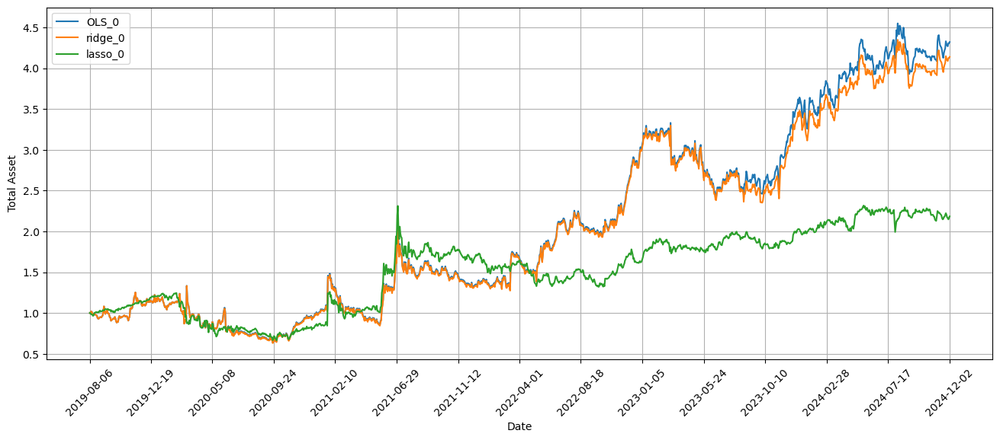

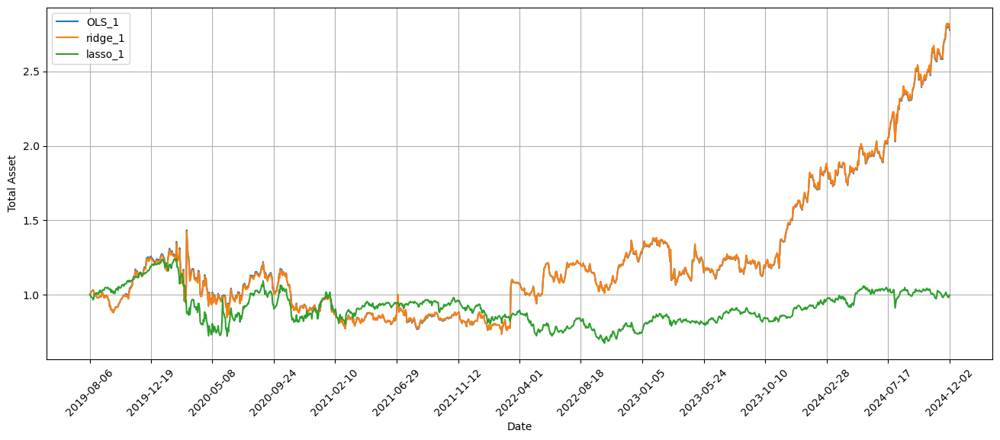

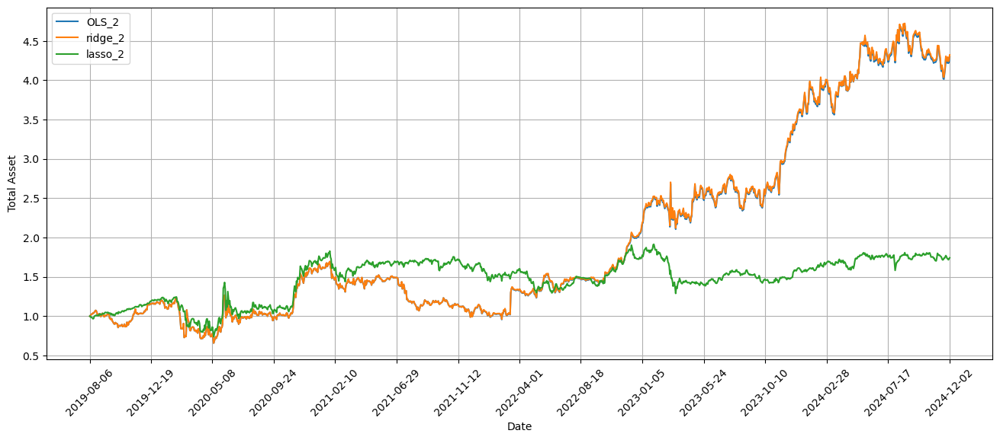

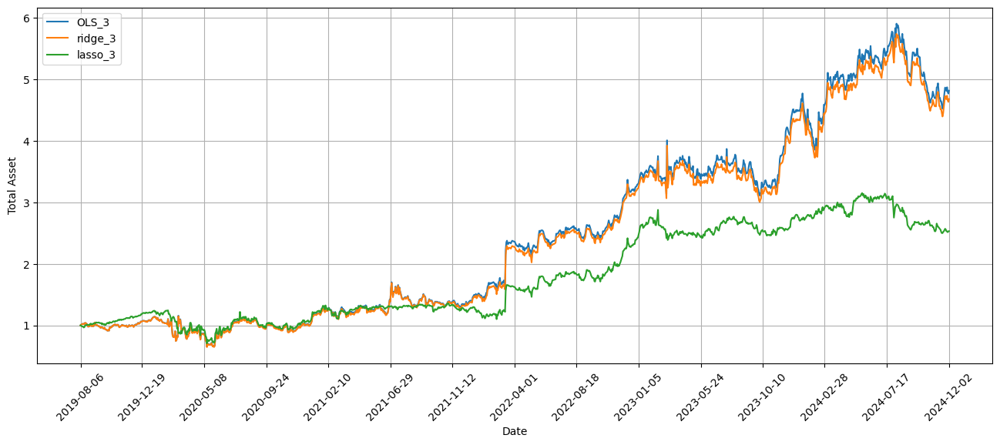

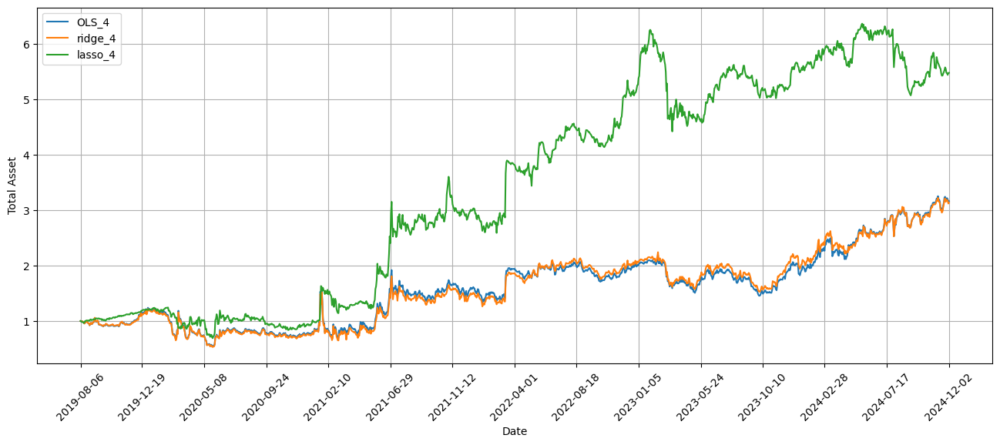

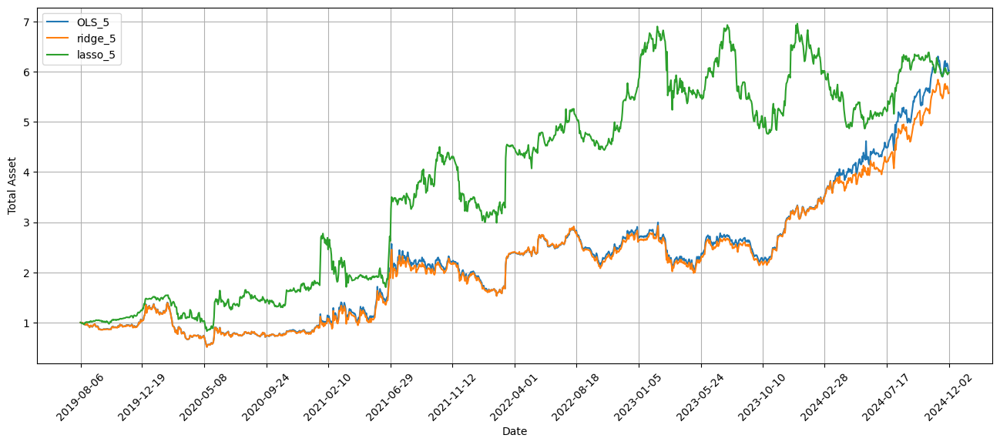

In [33]:
ftd = 200
ltd = 399
seq_length = 20
num_stocks = 10
first_run = False

for num_iter in range(1, num_iters):
    
    print(f'Running {num_iter + 1} of {num_iters} iterations. First iteration already finished')
    
    ftd += 20
    ltd += 20
    ftestd = ltd + 1
    ltestd = ftestd + 19
    
    data_train, y_train, data_test, y_test = prep_train_test_data_regression(data, seq_length, ftd, ltd, all_days, factors)
    
    # Fit, predict, simulate
    for j in range(len(factors_list)):

        # obtain the correct train/test sets
        reg_factors = factors_list[j]
        x_train = np.array(data_train[reg_factors])
        x_test = data_test[reg_factors + ['datadate', 'tic', 'ret_d']]

        for i in range(len(names_list)):
            name = names_list[i]

            # fit OLS, ridge, lasso
            regressor_dict[f'{name}_{j}'] = methods_list[i].fit(x_train, y_train)

            for day in range(seq_length):

                test_day = all_days[ftestd + day]
                buy_day = all_days[ftestd + day + 1]
                simul_day = all_days[ftestd + day + 2]
                x_test_temp = np.array(x_test[x_test['datadate'] == test_day][reg_factors])

                # do regression with {name} on {factors_list[i]}
                y_pred = regressor_dict[f'{name}_{j}'].predict(x_test_temp)
                top_indices = np.argsort(y_pred)[-num_stocks:]
                top_stocks = [num_to_tic_dict[num] for num in top_indices]
                print(f'top_stocks by {name} factors {j} to buy on {buy_day} are {top_stocks}')
                # Simulate investment
                total_asset, total, position_dict = invest(day, test_day, buy_day, simul_day, total_dict[f'{name}_{j}'],
                                                            total_asset_dict[f'{name}_{j}'], position_dict_all[f'{name}_{j}'], top_stocks)
                total_dict[f'{name}_{j}'] = total
                total_asset_dict[f'{name}_{j}'] = total_asset
                position_dict_all[f'{name}_{j}'] = position_dict   
                # Calculate SR PT1
                pred = sum([y_pred[ind] for ind in top_indices]) / num_stocks
                pred_avg_dict[f'{name}_{j}'] += pred
                pred_avg_period_dict[f'{name}_{j}'] += pred            
                prev, today = total_asset_dict[f'{name}_{j}'][-2], total_asset_dict[f'{name}_{j}'][-1]
                excess_ret_d = (today - prev) / prev - data_to_rfr_dict[buy_day]
                excess_return_period_dict[f'{name}_{j}'][0, day] = excess_ret_d
                excess_return_dict[f'{name}_{j}'][0, num_iter * seq_length + day] = excess_ret_d

    # Calculate SR PT2
    key = f'{all_days[ltd+1]}-{all_days[ltd+seq_length]}'
    for name in names_list:

        for j in range(len(factors_list)):

            pred_avg_period_dict[f'{name}_{j}'] /= seq_length
            excess_return_avg = np.mean(excess_return_period_dict[f'{name}_{j}'])
            excess_return_std = np.std(excess_return_period_dict[f'{name}_{j}'])

            SR_dict[f'{name}_{j}'].loc[key, 'pred_score'] = pred_avg_period_dict[f'{name}_{j}']
            SR_dict[f'{name}_{j}'].loc[key, 'avg_excess_ret'] = excess_return_avg
            SR_dict[f'{name}_{j}'].loc[key, 'std_excess_ret'] = excess_return_std
            SR_dict[f'{name}_{j}'].loc[key, 'SR'] = excess_return_avg / excess_return_std * np.sqrt(252)
            print(f"{name} {j} has SR {SR_dict[f'{name}_{j}'].loc[key, 'SR']}")

    # Plot return graphs
    if num_iter % 10 == 0 or num_iter == num_iters-1:
        for j in range(len(factors_list)):

            plt.figure(figsize=(16, 6))
            x_axis = all_days[ltestd+1-len(total_asset_dict['OLS_0']):ltestd+1]

            for name in names_list:

                plt.plot(x_axis, total_asset_dict[f'{name}_{j}'], label=f'{name}_{j}')

            indices_to_display = np.linspace(0, len(x_axis)-1, 15, dtype=int)
            plt.xticks(indices_to_display, [x_axis[i] for i in indices_to_display], rotation=45)
            plt.ylabel('Total Asset')
            plt.xlabel('Date')
            plt.legend()
            plt.grid()
            plt.show()


In [45]:
# Calculate the overall SR
SR_whole_period = pd.DataFrame(columns=['pred', 'avg_excess_ret', 'std_excess_ret', 'SR'])

for i in range(len(names_list)):
    
    name = names_list[i]
    
    for j in range(len(factors_list)):
        
        pred_avg_dict[f'{name}_{j}'] /= num_iters * seq_length
        excess_return_avg = np.mean(excess_return_dict[f'{name}_{j}'][0][20:])
        excess_return_std = np.std(excess_return_dict[f'{name}_{j}'][0][20:])

        # Calculate the SR table for original models
        SR_whole_period.loc[f'{name}_{j}', 'pred'] = pred_avg_dict[f'{name}_{j}']
        SR_whole_period.loc[f'{name}_{j}', 'avg_excess_ret'] = excess_return_avg
        SR_whole_period.loc[f'{name}_{j}', 'std_excess_ret'] = excess_return_std
        SR_whole_period.loc[f'{name}_{j}', 'SR'] = excess_return_avg / excess_return_std * np.sqrt(252)

print(SR_whole_period)

             pred avg_excess_ret std_excess_ret        SR
OLS_0    0.003656       0.001574       0.033909  0.737035
OLS_1    0.002967       0.001015       0.027256  0.591057
OLS_2    0.003817       0.001443       0.031309  0.731459
OLS_3    0.004149       0.001566       0.031229  0.795791
OLS_4      0.0098       0.001626        0.04271  0.604436
OLS_5    0.013376       0.001934       0.036247  0.846911
ridge_0  0.003653       0.001542       0.033903  0.721797
ridge_1  0.002962       0.001017       0.027253  0.592373
ridge_2  0.003814       0.001447       0.031315  0.733757
ridge_3  0.004141       0.001543       0.031198  0.785086
ridge_4  0.009711       0.001621       0.042814  0.601151
ridge_5  0.013295       0.001869       0.036175  0.820275
lasso_0  0.001368       0.000783       0.025951  0.479207
lasso_1  0.001089       0.000057        0.01907  0.047245
lasso_2  0.002021       0.000548         0.0226  0.384915
lasso_3  0.001879       0.000821       0.022197  0.587277
lasso_4  0.003

In [46]:
# Save results
SR_whole_period.to_csv('OLS_2019-2024_SR.csv')

with open('total_asset_dict_2019-2024.json', 'w') as f:
    json.dump(total_asset_dict, f)
    
excess_ret_save = {}
for key, value in excess_return_dict.items():
    excess_ret_save[key] = list(value[0])
with open('excess_return_dict_2019-2024.json', 'w') as f:
    json.dump(excess_ret_save, f)

In [47]:
last_simul_day = "2024-12-03"
rfr = list(data[data['datadate'] <= last_simul_day][['datadate', 'TBill1y']].drop_duplicates(subset=['datadate'])['TBill1y'])
rfr = rfr[-(len(total_asset_dict['OLS_0'])-1):]

def calculate_SR(total_asset, rfr):
    '''
    Calculates the Sharpe Ratio of the simulated strategy
    Inputs:
        total_asset: list of total assets on each day
        rfr: list of risk-free rates on the same days as in total_asset
    Output:
        SR: Sharpe Ratio
    '''
    
    assert len(total_asset) - 1 == len(rfr)
    excess_ret = [total_asset[i+1] - rfr[i] for i in range(len(rfr))]
    excess_ret_perc = np.array([(excess_ret[i] - excess_ret[i-1]) / excess_ret[i-1] for i in range(1, len(excess_ret))])
    SR = np.mean(excess_ret_perc) / np.std(excess_ret_perc) * np.sqrt(252)
    
    return SR
for key, item in total_asset_dict.items():
    SR = calculate_SR(item, rfr)
    print(f'SR for model {key} is {SR}')

SR for model OLS_0 is 0.762692333419964
SR for model OLS_1 is 0.6449077475269679
SR for model OLS_2 is 0.7848117534447513
SR for model OLS_3 is 0.8292658569761375
SR for model OLS_4 is 0.6313052394451092
SR for model OLS_5 is 0.8686180408480358
SR for model ridge_0 is 0.7475868048129759
SR for model ridge_1 is 0.6462197279765042
SR for model ridge_2 is 0.7870801327454039
SR for model ridge_3 is 0.8186851290937014
SR for model ridge_4 is 0.6277519220794057
SR for model ridge_5 is 0.8438531004026648
SR for model lasso_0 is 0.5512980744067065
SR for model lasso_1 is 0.1501070541263232
SR for model lasso_2 is 0.4688806311549904
SR for model lasso_3 is 0.6710545621214341
SR for model lasso_4 is 0.8948945007529782
SR for model lasso_5 is 0.9162632618064122
